Your assignment is to create a Jupyter notebook that demonstrates how to do the
following (use methods discussed in the class materials shared so far):
Load the dataset in the file named winequality_white.csv and set up a classification
problem: predicting the quality value (y variable with seven classes labeled 3, 4, 5, ..., 9)
based on the values of all the other eleven variables (acidity, alcohol, pH, etc.). The goal
of this assignment is to see how an MLPClassifier performs compared to a more classical
ML model.

In [70]:
from itertools import product

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, cohen_kappa_score, confusion_matrix
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

In [68]:
def print_report(clf, X_test, y_test):
    y_true, y_pred = y_test, clf.predict(X_test)

    print(
        classification_report(y_true, y_pred, labels=np.unique(y_true), zero_division=0)
    )

    df_cm = pd.DataFrame(
        confusion_matrix(y_test, y_pred),
        columns=np.unique(y_test),
        index=np.unique(y_test),
    )

    sns.heatmap(
        df_cm,
        square=True,
        annot=True,
        # fmt="d",
        cbar=False,
    )
    plt.xlabel("predicted")
    plt.ylabel("true")
    plt.show()

    print("Cohen Kappa Score:", cohen_kappa_score(y_test, y_pred))

In [2]:
fname = "../HW2/winequality-white.csv"

wine_data = pd.read_csv(fname)

In [3]:
y = wine_data["quality"]
X = wine_data.loc[:, wine_data.columns != "quality"]

In [4]:
seed = 42
test_pct = 0.25

In [5]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=test_pct, stratify=y, random_state=seed
)

In [6]:
pipe = make_pipeline(StandardScaler(), MLPClassifier(verbose=10, random_state=seed))

## 1. Train and tune the MLPClassifier (via cross-validation) using at least three different combinations of architecture choices (e.g., number of layers, # of neurons per layer, activation function). (6 points)

In [9]:
grid_kwargs = {
    "cv": 3,
    "n_jobs": -1,
    "scoring": ["accuracy", "f1_macro"],
    "refit": "accuracy",
}

hyperparams = {
    "mlpclassifier__activation": ["relu", "logistic"],
    "mlpclassifier__hidden_layer_sizes": list(
        product(range(1, 1000, 200), range(1, 12, 3))
    ),
}

grid = GridSearchCV(pipe, hyperparams, **grid_kwargs)

grid.fit(X_train, y_train)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           28     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91191D+00    |proj g|=  2.86080D-01

At iterate    1    f=  1.56334D+00    |proj g|=  1.67110D-01

At iterate    2    f=  1.35786D+00    |proj g|=  7.72026D-02

At iterate    3    f=  1.31629D+00    |proj g|=  8.27157D-02

At iterate    4    f=  1.28816D+00    |proj g|=  3.57124D-02

At iterate    5    f=  1.27266D+00    |proj g|=  3.41474D-02

At iterate    6    f=  1.22567D+00    |proj g|=  1.63319D-01

At iterate    7    f=  1.19361D+00    |proj g|=  4.32981D-02

At iterate    8    f=  1.18772D+00    |proj g|=  5.33404D-02

At iterate    9    f=  1.17162D+00    |proj g|=  4.58762D-02

At iterate   10    f=  1.16212D+00    |proj g|=  3.33634D-02

At iterate   11    f=  1.15306D+00    |proj g|=  2.58693D-02

At iterate   12    f=  1.14392D+00    |proj g|=  2.54064D-02

At iterate   13    f=  1.1

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  1.29196D+00    |proj g|=  1.01634D-03

At iterate   59    f=  1.10544D+00    |proj g|=  6.98844D-03

At iterate  135    f=  1.10778D+00    |proj g|=  9.92969D-04

At iterate   12    f=  1.12673D+00    |proj g|=  1.84535D-02


At iterate  136    f=  1.10778D+00    |proj g|=  4.41707D-04
At iterate   60    f=  1.10538D+00    |proj g|=  2.50129D-03

At iterate   11    f=  1.29187D+00    |proj g|=  9.43798D-04

At iterate   13    f=  1.12225D+00    |proj g|=  1.34814D-02

At iterate   10    f=  1.29001D+00    |proj g|=  1.12043D-03

At iterate   61    f=  1.10531D+00    |proj g|=  2.52092D-03

At iterate  137    f=  1.10778D+00    |proj g|=  3.31351D-04

At iterate   12    f=  1.29178D+00    |proj g|=  9.11282D-04

At iterate   14    f=  1.11863D+00    |proj g|=  1.11436D-02


At iterate   11    f=  1.28995D+00    |proj g|=  1.17894D-03
At iterate  138    f=  1.10778D+00    |proj g|=  2.65447D-03

At iterate   13    f=  1.29163D+00    |proj g|=  5.10018D-04

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  140    f=  1.09487D+00    |proj g|=  7.76025D-04

At iterate   77    f=  1.09504D+00    |proj g|=  1.10130D-03

At iterate   76    f=  1.10810D+00    |proj g|=  1.86479D-03

At iterate  141    f=  1.09486D+00    |proj g|=  6.37436D-04

At iterate   77    f=  1.10808D+00    |proj g|=  1.31259D-03


At iterate   78    f=  1.09503D+00    |proj g|=  2.69768D-03
At iterate  142    f=  1.09486D+00    |proj g|=  1.49186D-03

At iterate   78    f=  1.10806D+00    |proj g|=  8.95455D-04


At iterate  143    f=  1.09486D+00    |proj g|=  4.45884D-04
At iterate   79    f=  1.09503D+00    |proj g|=  1.59100D-03

At iterate   79    f=  1.10805D+00    |proj g|=  2.73550D-03

At iterate  144    f=  1.09486D+00    |proj g|=  3.87108D-04

At iterate   80    f=  1.10804D+00    |proj g|=  1.20995D-03


At iterate   80    f=  1.09503D+00    |proj g|=  7.44499D-04
At iterate  145    f=  1.09486D+00    |proj g|=  4.56775D-04

At iterate   81    f=  1.10803D+00    |proj g|=  9.01275D-04


At ite

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   76    f=  1.10430D+00    |proj g|=  1.58540D-03

At iterate  192    f=  1.09474D+00    |proj g|=  5.34526D-04

At iterate   52    f=  1.10407D+00    |proj g|=  2.65547D-03

At iterate  193    f=  1.10780D+00    |proj g|=  1.77529D-04


At iterate   77    f=  1.10426D+00    |proj g|=  4.70327D-03
At iterate  193    f=  1.09473D+00    |proj g|=  3.19507D-04

At iterate   53    f=  1.10400D+00    |proj g|=  5.32215D-03

At iterate  194    f=  1.10780D+00    |proj g|=  3.74968D-04

At iterate  194    f=  1.09473D+00    |proj g|=  4.95200D-04

At iterate   78    f=  1.10422D+00    |proj g|=  1.11540D-02


At iterate  195    f=  1.10780D+00    |proj g|=  1.60363D-04
At iterate   54    f=  1.10394D+00    |proj g|=  5.80999D-03

At iterate  195    f=  1.09473D+00    |proj g|=  5.32203D-04

At iterate  196    f=  1.10780D+00    |proj g|=  3.35233D-04

At iterate  196    f=  1.09473D+00    |proj g|=  5.87317D-04

At iterate   55    f=  1.10389D+00    |proj g|=  2.87292D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTA

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          678     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03471D+00    |proj g|=  3.41863D-01

At iterate    1    f=  1.63785D+00    |proj g|=  2.26352D-01

At iterate    2    f=  1.37747D+00    |proj g|=  1.01783D-01

At iterate    3    f=  1.33234D+00    |proj g|=  3.57662D-02

At iterate    4    f=  1.32057D+00    |proj g|=  2.08716D-02

At iterate    5    f=  1.30231D+00    |proj g|=  1.01380D-02

At iterate    6    f=  1.25449D+00    |proj g|=  8.96081D-02

At iterate    7    f=  1.24799D+00    |proj g|=  1.06326D-01

At iterate    8    f=  1.18900D+00    |proj g|=  8.44018D-02

At iterate    9    f=  1.16543D+00    |proj g|=  7.46696D-02

At iterate   10    f=  1.15626D+00    |proj g|=  3.07538D-02

At iterate   11    f=  1.14750D+00    |proj g|=  3.40425D-02

At iterate   12    f=  1.13746D+00    |proj g|=  3.40792D-02

At iterate   13    f=  1.1

 This problem is unconstrained.
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   24    f=  1.03919D+00    |proj g|=  1.96687D-02

At iterate   23    f=  1.05162D+00    |proj g|=  2.13278D-02

At iterate   52    f=  9.63059D-01    |proj g|=  1.48849D-02

At iterate   25    f=  1.03716D+00    |proj g|=  3.94178D-02

At iterate   24    f=  1.04724D+00    |proj g|=  3.11588D-02

At iterate   53    f=  9.59616D-01    |proj g|=  2.08552D-02

At iterate   26    f=  1.03495D+00    |proj g|=  2.07440D-02

At iterate   25    f=  1.04206D+00    |proj g|=  1.10362D-02

At iterate   54    f=  9.56328D-01    |proj g|=  2.24212D-02

At iterate   27    f=  1.03067D+00    |proj g|=  1.70505D-02

At iterate   26    f=  1.03907D+00    |proj g|=  1.22334D-02

At iterate   55    f=  9.52165D-01    |proj g|=  1.53196D-02

At iterate   28    f=  1.02793D+00    |proj g|=  1.80116D-02

At iterate   27    f=  1.03678D+00    |proj g|=  9.03672D-03

At iterate   56    f=  9.50061D-01    |proj g|=  1.32242D-02

At iterate   29    f=  1.02256D+00    |proj g|=  2.64092D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate  102    f=  8.79460D-01    |proj g|=  2.13521D-02
At iterate   75    f=  9.15767D-01    |proj g|=  2.41440D-02

At iterate   76    f=  9.00763D-01    |proj g|=  1.73835D-02

At iterate   76    f=  9.13529D-01    |proj g|=  2.01297D-02

At iterate   77    f=  9.00166D-01    |proj g|=  1.35282D-02

At iterate  103    f=  8.78701D-01    |proj g|=  3.14510D-02

At iterate   77    f=  9.12149D-01    |proj g|=  1.45840D-02

At iterate   78    f=  8.98249D-01    |proj g|=  1.50606D-02


At iterate  104    f=  8.77477D-01    |proj g|=  1.04119D-02
At iterate   78    f=  9.08994D-01    |proj g|=  1.41324D-02

At iterate   79    f=  8.96538D-01    |proj g|=  1.96579D-02


At iterate  105    f=  8.76786D-01    |proj g|=  8.27901D-03
At iterate   79    f=  9.08037D-01    |proj g|=  7.49031D-02

At iterate   80    f=  8.93736D-01    |proj g|=  2.29137D-02


At iterate   80    f=  9.06859D-01    |proj g|=  3.40404D-02
At iterate  106    f=  8.75781D-01    |proj g|=  1.22971D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/s


At iterate   97    f=  8.17551D-01    |proj g|=  2.12184D-02

At iterate  178    f=  8.01815D-01    |proj g|=  2.62045D-02

At iterate    6    f=  1.15999D+00    |proj g|=  3.79847D-02

At iterate  176    f=  8.15856D-01    |proj g|=  3.75150D-02

At iterate   98    f=  8.16224D-01    |proj g|=  1.67945D-02

At iterate    8    f=  1.11060D+00    |proj g|=  3.54961D-02

At iterate  179    f=  8.01206D-01    |proj g|=  1.14027D-02

At iterate  177    f=  8.15273D-01    |proj g|=  1.39643D-02


At iterate   99    f=  8.14905D-01    |proj g|=  1.83743D-02
At iterate    7    f=  1.12991D+00    |proj g|=  2.82425D-02

At iterate  180    f=  8.00859D-01    |proj g|=  9.05450D-03

At iterate  178    f=  8.14941D-01    |proj g|=  1.08624D-02

At iterate  100    f=  8.13383D-01    |proj g|=  1.35554D-02

At iterate  181    f=  8.00350D-01    |proj g|=  9.83192D-03

At iterate    8    f=  1.08753D+00    |proj g|=  3.16941D-02

At iterate  179    f=  8.14643D-01    |proj g|=  1.13901D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: Con



At iterate   43    f=  9.09090D-01    |proj g|=  2.29221D-02
At iterate    5    f=  1.29166D+00    |proj g|=  1.98941D-02

At iterate   15    f=  1.08592D+00    |proj g|=  2.39306D-02

At iterate  144    f=  7.69316D-01    |proj g|=  2.73538D-02

At iterate   43    f=  8.99536D-01    |proj g|=  8.30186D-03

At iterate   11    f=  1.22501D+00    |proj g|=  1.00402D-01

At iterate    6    f=  1.28522D+00    |proj g|=  2.39594D-02

At iterate   44    f=  9.05529D-01    |proj g|=  1.29196D-02

At iterate  145    f=  7.68407D-01    |proj g|=  2.12715D-02

At iterate   16    f=  1.07300D+00    |proj g|=  1.39616D-02

At iterate   44    f=  8.96296D-01    |proj g|=  1.38499D-02

At iterate  146    f=  7.67446D-01    |proj g|=  1.55018D-02

At iterate   17    f=  1.05740D+00    |proj g|=  3.18114D-02

At iterate   45    f=  9.02837D-01    |proj g|=  2.71270D-02

At iterate    7    f=  1.27168D+00    |proj g|=  9.80692D-02

At iterate   12    f=  1.20444D+00    |proj g|=  1.28092D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   94    f=  7.94314D-01    |proj g|=  1.68689D-02

At iterate  119    f=  7.64228D-01    |proj g|=  2.68099D-02

At iterate   78    f=  8.31426D-01    |proj g|=  1.97278D-02

At iterate  102    f=  7.88555D-01    |proj g|=  1.56198D-02

At iterate  117    f=  7.72269D-01    |proj g|=  2.18600D-02

At iterate   95    f=  7.92181D-01    |proj g|=  2.50339D-02

At iterate  120    f=  7.62706D-01    |proj g|=  1.93000D-02


At iterate   79    f=  8.28976D-01    |proj g|=  3.99172D-02
At iterate  103    f=  7.87097D-01    |proj g|=  1.70426D-02

At iterate  118    f=  7.72100D-01    |proj g|=  6.24550D-02

At iterate   96    f=  7.90108D-01    |proj g|=  1.17666D-02

At iterate  121    f=  7.61799D-01    |proj g|=  1.84516D-02

At iterate  104    f=  7.85537D-01    |proj g|=  1.60622D-02

At iterate  119    f=  7.70271D-01    |proj g|=  1.47253D-02

At iterate   80    f=  8.27355D-01    |proj g|=  1.22452D-02

At iterate   97    f=  7.88863D-01    |proj g|=  1.07914D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel

At iterate  187    f=  6.92464D-01    |proj g|=  1.29171D-02

At iterate  196    f=  6.96805D-01    |proj g|=  1.94831D-02

At iterate  192    f=  7.05255D-01    |proj g|=  2.52272D-02

At iterate  147    f=  7.35316D-01    |proj g|=  1.59948D-02

At iterate  177    f=  6.89653D-01    |proj g|=  1.50920D-02

At iterate  188    f=  6.91950D-01    |proj g|=  1.37762D-02

At iterate  197    f=  6.96543D-01    |proj g|=  5.89952D-02

At iterate  193    f=  7.04498D-01    |proj g|=  2.30310D-02

At iterate  148    f=  7.34351D-01    |proj g|=  1.22200D-02

At iterate  178    f=  6.88728D-01    |proj g|=  1.79108D-02

At iterate  189    f=  6.91281D-01    |proj g|=  1.34935D-02

At iterate  198    f=  6.96068D-01    |proj g|=  3.49041D-02

At iterate  194    f=  7.03580D-01    |proj g|=  2.03022D-02

At iterate  149    f=  7.33526D-01    |proj g|=  9.99981D-03

At iterate  179    f=  6.88192D-01    |proj g|=  1.82429D-02

At iterate  190    f=  6.90241D-01    |proj g|=  2.07120D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel



At iterate   21    f=  9.83546D-01    |proj g|=  9.79947D-03
At iterate   23    f=  9.57659D-01    |proj g|=  4.08905D-02

At iterate  188    f=  7.05270D-01    |proj g|=  2.43731D-02

At iterate   24    f=  9.52763D-01    |proj g|=  1.61228D-02

At iterate   26    f=  9.57503D-01    |proj g|=  1.72219D-02

At iterate   22    f=  9.76591D-01    |proj g|=  1.52136D-02

At iterate  189    f=  7.04597D-01    |proj g|=  9.57199D-03

At iterate   25    f=  9.50169D-01    |proj g|=  1.62521D-02


At iterate  190    f=  7.04245D-01    |proj g|=  8.11135D-03
At iterate   27    f=  9.52776D-01    |proj g|=  5.47040D-02

At iterate   23    f=  9.69440D-01    |proj g|=  2.20220D-02

At iterate   26    f=  9.45258D-01    |proj g|=  2.71958D-02

At iterate  191    f=  7.03758D-01    |proj g|=  1.40989D-02

At iterate   28    f=  9.48814D-01    |proj g|=  1.44354D-02

At iterate   27    f=  9.40596D-01    |proj g|=  3.66941D-02

At iterate  192    f=  7.03318D-01    |proj g|=  1.61678D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   64    f=  8.13934D-01    |proj g|=  2.78748D-02

At iterate   51    f=  8.60394D-01    |proj g|=  1.72972D-02

At iterate   58    f=  8.37141D-01    |proj g|=  5.24749D-02

At iterate    1    f=  1.60258D+00    |proj g|=  1.74926D-01

At iterate   65    f=  8.09605D-01    |proj g|=  4.03385D-02

At iterate   52    f=  8.57441D-01    |proj g|=  1.22109D-02

At iterate   59    f=  8.34051D-01    |proj g|=  1.61943D-02

At iterate   66    f=  8.04798D-01    |proj g|=  2.94312D-02

At iterate    5    f=  1.23891D+00    |proj g|=  7.36758D-02

At iterate   53    f=  8.53743D-01    |proj g|=  1.82230D-02

At iterate   60    f=  8.32279D-01    |proj g|=  1.01364D-02

At iterate    2    f=  1.38247D+00    |proj g|=  2.48355D-01

At iterate   67    f=  8.02294D-01    |proj g|=  2.24575D-02

At iterate    6    f=  1.21998D+00    |proj g|=  9.08553D-02

At iterate   54    f=  8.50825D-01    |proj g|=  4.80332D-02

At iterate   61    f=  8.28459D-01    |proj g|=  2.31111D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  6.12611D-01    |proj g|=  1.88982D-02

At iterate   72    f=  8.68479D-01    |proj g|=  2.05217D-02

At iterate   90    f=  8.07334D-01    |proj g|=  2.66852D-02

At iterate  155    f=  6.53182D-01    |proj g|=  3.64842D-02

At iterate  147    f=  6.69368D-01    |proj g|=  1.98669D-02

At iterate   73    f=  8.43681D-01    |proj g|=  1.98098D-02

At iterate  186    f=  6.11903D-01    |proj g|=  1.22717D-02

At iterate   91    f=  8.04398D-01    |proj g|=  2.18790D-02

At iterate  156    f=  6.52219D-01    |proj g|=  1.55533D-02

At iterate   73    f=  8.65179D-01    |proj g|=  3.87595D-02

At iterate  148    f=  6.67724D-01    |proj g|=  2.84597D-02

At iterate  187    f=  6.11105D-01    |proj g|=  2.03210D-02

At iterate   74    f=  8.41695D-01    |proj g|=  4.33154D-02

At iterate  157    f=  6.51751D-01    |proj g|=  1.07393D-02

At iterate   92    f=  8.01717D-01    |proj g|=  2.60750D-02

At iterate  188    f=  6.10489D-01    |proj g|=  4.04215D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   97    f=  8.06539D-01    |proj g|=  2.01689D-02

At iterate  114    f=  7.58694D-01    |proj g|=  6.04752D-02

At iterate  187    f=  6.22371D-01    |proj g|=  1.92831D-02

At iterate  180    f=  6.28174D-01    |proj g|=  3.58314D-02

At iterate  101    f=  7.73591D-01    |proj g|=  2.97749D-02


At iterate  188    f=  6.20548D-01    |proj g|=  2.66642D-02
At iterate   98    f=  8.05588D-01    |proj g|=  2.24110D-02

At iterate  115    f=  7.57289D-01    |proj g|=  2.93182D-02

At iterate  181    f=  6.27395D-01    |proj g|=  5.00214D-02

At iterate  102    f=  7.71774D-01    |proj g|=  2.04961D-02

At iterate  189    f=  6.19194D-01    |proj g|=  2.81799D-02
Iteration 1, loss = 2.02868410
Iteration 2, loss = 2.01269803
Iteration 3, loss = 1.99007451
Iteration 4, loss = 1.95939817
Iteration 5, loss = 1.92113226
Iteration 6, loss = 1.87629932
Iteration 7, loss = 1.82482698
Iteration 8, loss = 1.76576057
Iteration 9, loss = 1.70059159
Iteration 10, loss = 1.63245056
Iterati

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  137    f=  7.23149D-01    |proj g|=  5.39869D-02

At iterate  128    f=  7.20280D-01    |proj g|=  4.43344D-02

At iterate    3    f=  1.38188D+00    |proj g|=  1.77995D-01

At iterate   10    f=  1.16843D+00    |proj g|=  2.56086D-02


At iterate  121    f=  7.58842D-01    |proj g|=  4.01461D-02
At iterate   11    f=  1.14215D+00    |proj g|=  2.66395D-02

At iterate  138    f=  7.22007D-01    |proj g|=  2.41058D-02

At iterate  129    f=  7.17473D-01    |proj g|=  1.79335D-02

At iterate    4    f=  1.30397D+00    |proj g|=  7.22387D-02

At iterate   12    f=  1.12531D+00    |proj g|=  4.36541D-02


At iterate  122    f=  7.57050D-01    |proj g|=  5.34525D-02
At iterate   11    f=  1.15175D+00    |proj g|=  2.55929D-02

At iterate  130    f=  7.15765D-01    |proj g|=  2.02433D-02

At iterate  139    f=  7.20940D-01    |proj g|=  2.49489D-02


At iterate   13    f=  1.11452D+00    |proj g|=  2.26417D-02
At iterate   12    f=  1.13998D+00    |proj g|=  7.91253D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://




At iterate  184    f=  6.64398D-01    |proj g|=  6.91717D-02
At iterate  179    f=  6.42171D-01    |proj g|=  3.14184D-02
At iterate   55    f=  9.29989D-01    |proj g|=  5.86430D-02

At iterate   44    f=  9.48370D-01    |proj g|=  1.76645D-02

At iterate   62    f=  9.08836D-01    |proj g|=  8.46848D-02

At iterate  180    f=  6.40987D-01    |proj g|=  3.01359D-02

At iterate  185    f=  6.63214D-01    |proj g|=  2.36611D-02

At iterate   56    f=  9.27163D-01    |proj g|=  2.96662D-02

At iterate   45    f=  9.44060D-01    |proj g|=  1.85961D-02

At iterate  160    f=  7.02050D-01    |proj g|=  1.95573D-02

At iterate   63    f=  9.05039D-01    |proj g|=  1.83331D-02

At iterate  181    f=  6.39097D-01    |proj g|=  4.27179D-02

At iterate  186    f=  6.62421D-01    |proj g|=  1.89621D-02

At iterate   57    f=  9.24087D-01    |proj g|=  3.65053D-02

At iterate  161    f=  7.01325D-01    |proj g|=  2.03347D-02

At iterate   46    f=  9.40161D-01    |proj g|=  1.83508D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    2    f=  1.32566D+00    |proj g|=  5.53001D-02

At iterate   66    f=  8.81977D-01    |proj g|=  3.24185D-02

At iterate  172    f=  6.89372D-01    |proj g|=  2.22874D-02

At iterate   87    f=  8.48327D-01    |proj g|=  4.10558D-02

At iterate   79    f=  8.67458D-01    |proj g|=  2.18395D-02

At iterate    2    f=  1.33486D+00    |proj g|=  4.26647D-02


At iterate   88    f=  8.44956D-01    |proj g|=  4.38191D-02
At iterate    3    f=  1.29751D+00    |proj g|=  7.51227D-02

At iterate   67    f=  8.77608D-01    |proj g|=  2.44603D-02

At iterate   80    f=  8.66257D-01    |proj g|=  1.83901D-02

At iterate    3    f=  1.32183D+00    |proj g|=  2.90521D-01

At iterate   89    f=  8.41711D-01    |proj g|=  1.77563D-02

At iterate   68    f=  8.75143D-01    |proj g|=  2.24810D-02

At iterate    4    f=  1.29033D+00    |proj g|=  4.28191D-02

At iterate    4    f=  1.28228D+00    |proj g|=  2.16012D-01

At iterate   81    f=  8.62795D-01    |proj g|=  2.60153D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   29    f=  9.73834D-01    |proj g|=  1.34716D-02

At iterate   40    f=  9.26094D-01    |proj g|=  1.88399D-02

At iterate   50    f=  8.95205D-01    |proj g|=  2.50346D-02

At iterate  112    f=  7.73488D-01    |proj g|=  9.89569D-02

At iterate  125    f=  7.71069D-01    |proj g|=  4.35122D-02

At iterate  133    f=  7.56239D-01    |proj g|=  2.97314D-02

At iterate   51    f=  8.92069D-01    |proj g|=  1.80162D-02

At iterate   30    f=  9.66433D-01    |proj g|=  2.93833D-02


At iterate   41    f=  9.21810D-01    |proj g|=  1.69145D-02
At iterate  113    f=  7.70496D-01    |proj g|=  2.34274D-02

At iterate  126    f=  7.69701D-01    |proj g|=  3.69055D-02

At iterate   52    f=  8.89332D-01    |proj g|=  3.18678D-02

At iterate  114    f=  7.69422D-01    |proj g|=  2.45936D-02

At iterate  127    f=  7.67957D-01    |proj g|=  6.86238D-02

At iterate   42    f=  9.15733D-01    |proj g|=  1.69955D-02

At iterate   53    f=  8.85978D-01    |proj g|=  2.74338D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to


At iterate    7    f=  1.12357D+00    |proj g|=  6.09676D-02

At iterate  147    f=  6.28556D-01    |proj g|=  2.60056D-02

At iterate   99    f=  7.12645D-01    |proj g|=  3.77598D-02

At iterate    8    f=  1.10314D+00    |proj g|=  3.02646D-02

At iterate    4    f=  1.21908D+00    |proj g|=  9.51851D-02

At iterate  148    f=  6.26431D-01    |proj g|=  2.48753D-02

At iterate  115    f=  6.77351D-01    |proj g|=  6.58425D-02


At iterate    9    f=  1.08379D+00    |proj g|=  3.43450D-02
At iterate    5    f=  1.18792D+00    |proj g|=  3.91148D-02

At iterate  149    f=  6.24233D-01    |proj g|=  2.51031D-02

At iterate    6    f=  1.16540D+00    |proj g|=  4.08191D-02

At iterate   10    f=  1.07123D+00    |proj g|=  5.97204D-02

At iterate  116    f=  6.75288D-01    |proj g|=  2.31726D-02

At iterate  150    f=  6.22024D-01    |proj g|=  1.96759D-02

At iterate  100    f=  7.08738D-01    |proj g|=  2.08570D-02

At iterate    7    f=  1.13939D+00    |proj g|=  1.32342D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  168    f=  5.93009D-01    |proj g|=  2.47430D-02

At iterate   25    f=  9.54990D-01    |proj g|=  2.16623D-02

At iterate  112    f=  6.78998D-01    |proj g|=  3.19593D-02

At iterate   29    f=  9.40007D-01    |proj g|=  9.38367D-03

At iterate  169    f=  5.91671D-01    |proj g|=  1.71848D-02

At iterate   26    f=  9.46705D-01    |proj g|=  1.24903D-02

At iterate  131    f=  6.38267D-01    |proj g|=  5.63616D-02

At iterate    1    f=  1.72151D+00    |proj g|=  2.68802D-01

At iterate  113    f=  6.76303D-01    |proj g|=  2.97691D-02

At iterate   30    f=  9.31850D-01    |proj g|=  2.43560D-02

At iterate  170    f=  5.89955D-01    |proj g|=  2.13959D-02

At iterate   27    f=  9.39414D-01    |proj g|=  1.61409D-02
Iteration 54, loss = 0.97484468
Iteration 55, loss = 0.97317673
Iteration 56, loss = 0.97124632
Iteration 57, loss = 0.96949370
Iteration 58, loss = 0.96708601
Iteration 59, loss = 0.96601420
Iteration 60, loss = 0.96527120
Iteration 61, loss = 0.96260156


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  144    f=  6.07153D-01    |proj g|=  1.92452D-02

At iterate   69    f=  7.34717D-01    |proj g|=  1.49737D-02

At iterate   71    f=  7.47392D-01    |proj g|=  2.28342D-02

At iterate   34    f=  9.20325D-01    |proj g|=  1.44919D-02

At iterate  165    f=  5.73308D-01    |proj g|=  2.71543D-02

At iterate   70    f=  7.31091D-01    |proj g|=  1.97655D-02

At iterate   72    f=  7.41914D-01    |proj g|=  4.14195D-02

At iterate  145    f=  6.03868D-01    |proj g|=  3.32079D-02

At iterate   35    f=  9.16607D-01    |proj g|=  9.69667D-03

At iterate  166    f=  5.70964D-01    |proj g|=  4.83385D-02

At iterate   71    f=  7.27304D-01    |proj g|=  2.47828D-02

At iterate   73    f=  7.37414D-01    |proj g|=  4.27885D-02

At iterate  146    f=  6.02322D-01    |proj g|=  4.15224D-02

At iterate   36    f=  9.13209D-01    |proj g|=  1.27169D-02

At iterate  167    f=  5.68706D-01    |proj g|=  4.62787D-02

At iterate   72    f=  7.25037D-01    |proj g|=  9.33241D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 1982    200    208      1     0     0   5.270D-02   5.161D-01
  F =  0.51609100720811640     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   68    f=  7.63525D-01    |proj g|=  3.39730D-02

At iterate  107    f=  6.26693D-01    |proj g|=  4.61962D-02

At iterate  179    f=  5.52635D-01    |proj g|=  2.03696D-02

At iterate    3    f=  1.33794D+00    |proj g|=  4.77307D-02

At iterate  111    f=  6.09102D-01    |proj g|=  2.20260D-02

At iterate  108    f=  6.24702D-01    |proj g|=  2.97918D-02

At iterate   69    f=  7.60801D-01    |proj g|=  2.08771D-02

At iterate  180    f=  5.51505D-01    |pro

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    3    f=  1.33803D+00    |proj g|=  4.75745D-02

At iterate  131    f=  5.64492D-01    |proj g|=  1.78003D-02

At iterate   20    f=  1.09601D+00    |proj g|=  1.77577D-02

At iterate  126    f=  5.73473D-01    |proj g|=  2.70187D-02

At iterate  197    f=  5.24349D-01    |proj g|=  1.98579D-02

At iterate   86    f=  7.00381D-01    |proj g|=  2.10622D-02

At iterate   12    f=  1.29188D+00    |proj g|=  1.08090D-03

At iterate  132    f=  5.62109D-01    |proj g|=  2.31320D-02

At iterate   21    f=  1.08814D+00    |proj g|=  3.43103D-02

At iterate  127    f=  5.70764D-01    |proj g|=  2.73217D-02

At iterate  198    f=  5.22922D-01    |proj g|=  1.83691D-02

At iterate   87    f=  6.97046D-01    |proj g|=  3.23781D-02

At iterate   13    f=  1.29166D+00    |proj g|=  8.01057D-04

At iterate   22    f=  1.07696D+00    |proj g|=  4.06968D-02

At iterate  133    f=  5.59870D-01    |proj g|=  2.60524D-02

At iterate  128    f=  5.68225D-01    |proj g|=  3.74526D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   76    f=  8.66807D-01    |proj g|=  2.70846D-02

At iterate  181    f=  4.66892D-01    |proj g|=  3.54316D-02

At iterate  135    f=  5.57669D-01    |proj g|=  2.08300D-02

At iterate  193    f=  4.57355D-01    |proj g|=  8.92965D-02

At iterate   38    f=  9.92819D-01    |proj g|=  8.77500D-03

At iterate    2    f=  1.34523D+00    |proj g|=  9.77605D-02

At iterate   77    f=  8.64170D-01    |proj g|=  2.74352D-02


At iterate  182    f=  4.65265D-01    |proj g|=  2.60713D-02
At iterate  194    f=  4.55708D-01    |proj g|=  2.60366D-02

At iterate   39    f=  9.89640D-01    |proj g|=  1.05777D-02

At iterate    3    f=  1.29805D+00    |proj g|=  8.54150D-02

At iterate   78    f=  8.61397D-01    |proj g|=  2.92037D-02

At iterate  183    f=  4.62976D-01    |proj g|=  2.05336D-02

At iterate  195    f=  4.54890D-01    |proj g|=  2.66986D-02

At iterate  136    f=  5.54980D-01    |proj g|=  2.60040D-02

At iterate   40    f=  9.85221D-01    |proj g|=  7.84705D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate   18    f=  9.97654D-01    |proj g|=  1.73299D-02
At iterate   95    f=  7.96478D-01    |proj g|=  2.10468D-02
Iteration 54, loss = 1.09568537
Iteration 55, loss = 1.07181742
Iteration 56, loss = 1.05449320
Iteration 57, loss = 1.04352224
Iteration 58, loss = 1.03470863
Iteration 59, loss = 1.02862279
Iteration 60, loss = 1.02688663
Iteration 61, loss = 1.02203001
Iteration 62, loss = 1.01686300
Iteration 63, loss = 1.01476812
Iteration 64, loss = 1.00864816
Iteration 65, loss = 1.00737632
Iteration 66, loss = 1.00479039
Iteration 67, loss = 1.00264849
Iteration 68, loss = 1.00062283
Iteration 69, loss = 0.99751840
Iteration 70, loss = 0.99459299
Iteration 71, loss = 0.99291157
Iteration 72, loss = 0.99184242
Iteration 73, loss = 0.99087453
Iteration 74, loss = 0.98874928
Iteration 75, loss = 0.98417564
Iteration 76, loss = 0.98037308
Iteration 77, loss = 0.97614887
Iteration 78, loss = 0.97314101
Iteration 79, loss = 0.97073330
Iteration 80, loss = 0.96800853
Iteration 81

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  163    f=  4.86863D-01    |proj g|=  5.83795D-02

At iterate   69    f=  8.68691D-01    |proj g|=  2.57942D-02

At iterate   32    f=  9.31066D-01    |proj g|=  2.33511D-02

At iterate   24    f=  9.76596D-01    |proj g|=  1.01429D-02

At iterate  113    f=  7.33915D-01    |proj g|=  2.92177D-02

At iterate   14    f=  1.01613D+00    |proj g|=  3.56360D-02

At iterate  164    f=  4.85296D-01    |proj g|=  2.61143D-02

At iterate   70    f=  8.65206D-01    |proj g|=  4.33414D-02

At iterate   25    f=  9.71575D-01    |proj g|=  1.98879D-02

At iterate   33    f=  9.23971D-01    |proj g|=  1.52290D-02

At iterate  114    f=  7.31231D-01    |proj g|=  3.07784D-02

At iterate   15    f=  1.00793D+00    |proj g|=  3.66812D-02

At iterate  165    f=  4.84098D-01    |proj g|=  2.02142D-02

At iterate   26    f=  9.61663D-01    |proj g|=  1.84769D-02


At iterate  115    f=  7.26830D-01    |proj g|=  3.85018D-02
At iterate   71    f=  8.60939D-01    |proj g|=  1.50282D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  115    f=  7.20875D-01    |proj g|=  2.38189D-02



At iterate   77    f=  7.04558D-01    |proj g|=  3.98654D-02
At iterate   65    f=  7.82282D-01    |proj g|=  4.68223D-02
At iterate  169    f=  6.28119D-01    |proj g|=  3.63045D-02

At iterate  116    f=  7.17174D-01    |proj g|=  3.00423D-02


At iterate  170    f=  6.27692D-01    |proj g|=  8.06936D-02
At iterate   78    f=  7.36882D-01    |proj g|=  5.30584D-02

At iterate   66    f=  7.77983D-01    |proj g|=  1.99488D-02

At iterate  117    f=  7.15497D-01    |proj g|=  8.24821D-02

At iterate  171    f=  6.25523D-01    |proj g|=  1.71415D-02

At iterate   78    f=  7.00734D-01    |proj g|=  3.40273D-02

At iterate   79    f=  7.33164D-01    |proj g|=  2.41550D-02

At iterate   67    f=  7.74846D-01    |proj g|=  2.66630D-02

At iterate  118    f=  7.12457D-01    |proj g|=  2.24595D-02

At iterate  172    f=  6.24978D-01    |proj g|=  1.87179D-02

At iterate   79    f=  6.96905D-01    |proj g|=  2.23446D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   92    f=  6.92920D-01    |proj g|=  2.45436D-02

At iterate  187    f=  6.05316D-01    |proj g|=  5.41591D-02

At iterate   93    f=  6.49298D-01    |proj g|=  3.68426D-02

At iterate   81    f=  7.20404D-01    |proj g|=  2.59834D-02

At iterate  131    f=  6.82617D-01    |proj g|=  5.14024D-02

At iterate    4    f=  1.22453D+00    |proj g|=  3.45723D-02

At iterate   94    f=  6.48075D-01    |proj g|=  6.94817D-02

At iterate  188    f=  6.03575D-01    |proj g|=  2.00701D-02

At iterate   93    f=  6.89745D-01    |proj g|=  1.77929D-02

At iterate   82    f=  7.17328D-01    |proj g|=  2.73761D-02

At iterate  132    f=  6.80288D-01    |proj g|=  3.20766D-02

At iterate  189    f=  6.02314D-01    |proj g|=  2.49645D-02


At iterate    5    f=  1.21353D+00    |proj g|=  3.08267D-02
At iterate   95    f=  6.44689D-01    |proj g|=  2.31232D-02

At iterate   94    f=  6.86570D-01    |proj g|=  2.07604D-02

At iterate   83    f=  7.15049D-01    |proj g|=  2.07334D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate  110    f=  5.99282D-01    |proj g|=  3.10787D-02
At iterate    1    f=  1.57203D+00    |proj g|=  1.73922D-01

At iterate  108    f=  6.36038D-01    |proj g|=  6.04387D-02

At iterate  146    f=  6.50875D-01    |proj g|=  3.04399D-02

At iterate   16    f=  1.00696D+00    |proj g|=  1.18505D-02

At iterate   98    f=  6.68225D-01    |proj g|=  6.59256D-02

At iterate  111    f=  5.96927D-01    |proj g|=  1.95943D-02

At iterate  109    f=  6.32528D-01    |proj g|=  1.88298D-02

At iterate    2    f=  1.41593D+00    |proj g|=  4.50162D-01

At iterate  147    f=  6.50200D-01    |proj g|=  1.90833D-02

At iterate   99    f=  6.65277D-01    |proj g|=  2.81175D-02

At iterate  112    f=  5.95054D-01    |proj g|=  2.40690D-02

At iterate  110    f=  6.30371D-01    |proj g|=  2.00040D-02

At iterate   17    f=  1.00115D+00    |proj g|=  1.52080D-02

At iterate    3    f=  1.23945D+00    |proj g|=  6.27929D-02

At iterate  148    f=  6.48904D-01    |proj g|=  1.82288D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  139    f=  5.46020D-01    |proj g|=  1.88230D-02

At iterate  174    f=  6.08076D-01    |proj g|=  2.39639D-02

At iterate   38    f=  8.82045D-01    |proj g|=  1.04875D-02

At iterate  144    f=  5.15970D-01    |proj g|=  1.90087D-02

At iterate  131    f=  5.70031D-01    |proj g|=  3.51895D-02

At iterate   29    f=  9.30516D-01    |proj g|=  1.45853D-02

At iterate  140    f=  5.44077D-01    |proj g|=  1.92735D-02

At iterate  175    f=  6.06556D-01    |proj g|=  4.36955D-02

At iterate  145    f=  5.13576D-01    |proj g|=  3.87986D-02

At iterate  132    f=  5.67147D-01    |proj g|=  5.96831D-02

At iterate   39    f=  8.76088D-01    |proj g|=  1.23620D-02

At iterate   30    f=  9.21693D-01    |proj g|=  1.25395D-02

At iterate  141    f=  5.40312D-01    |proj g|=  4.86125D-02

At iterate  146    f=  5.13032D-01    |proj g|=  5.36823D-02

At iterate  133    f=  5.63809D-01    |proj g|=  1.83337D-02

At iterate  176    f=  6.05929D-01    |proj g|=  3.98847D-02
RUNNING 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   61    f=  7.69059D-01    |proj g|=  3.08341D-02

At iterate   28    f=  9.12557D-01    |proj g|=  1.54738D-02

At iterate  176    f=  4.45480D-01    |proj g|=  2.22451D-02

At iterate  162    f=  4.91045D-01    |proj g|=  2.46408D-02

At iterate  170    f=  4.78558D-01    |proj g|=  1.84022D-02

At iterate   59    f=  7.73802D-01    |proj g|=  1.66703D-02

At iterate   29    f=  9.07520D-01    |proj g|=  2.10019D-02

At iterate   62    f=  7.65536D-01    |proj g|=  2.34094D-02

At iterate  177    f=  4.42120D-01    |proj g|=  2.25257D-02

At iterate  163    f=  4.89700D-01    |proj g|=  2.97552D-02

At iterate  171    f=  4.76787D-01    |proj g|=  2.75245D-02

At iterate   60    f=  7.69217D-01    |proj g|=  3.82949D-02

At iterate   30    f=  9.02358D-01    |proj g|=  1.11190D-02

At iterate  178    f=  4.39822D-01    |proj g|=  2.25644D-02

At iterate  164    f=  4.88005D-01    |proj g|=  4.03075D-02

At iterate  172    f=  4.75414D-01    |proj g|=  4.04787D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Opti



At iterate  193    f=  4.31501D-01    |proj g|=  3.95560D-02
At iterate   57    f=  7.65438D-01    |proj g|=  1.87227D-02

At iterate   89    f=  6.48447D-01    |proj g|=  2.41785D-02

At iterate    3    f=  1.25821D+00    |proj g|=  2.36725D-01

At iterate   84    f=  6.64138D-01    |proj g|=  4.99880D-02

At iterate  194    f=  4.30067D-01    |proj g|=  2.23212D-02

At iterate   58    f=  7.63344D-01    |proj g|=  6.09811D-02

At iterate   90    f=  6.42284D-01    |proj g|=  1.90027D-02

At iterate    4    f=  1.22605D+00    |proj g|=  8.12225D-02

At iterate  195    f=  4.28456D-01    |proj g|=  3.23126D-02

At iterate   85    f=  6.60920D-01    |proj g|=  2.16397D-02

At iterate   91    f=  6.37778D-01    |proj g|=  5.61596D-02

At iterate   59    f=  7.59056D-01    |proj g|=  2.39392D-02

At iterate    5    f=  1.18447D+00    |proj g|=  8.56226D-02

At iterate  196    f=  4.27560D-01    |proj g|=  4.04659D-02

At iterate   92    f=  6.34512D-01    |proj g|=  3.15531D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    8    f=  1.08989D+00    |proj g|=  6.96365D-02

At iterate    6    f=  1.13951D+00    |proj g|=  4.74727D-02

At iterate  104    f=  5.96618D-01    |proj g|=  2.98504D-02

At iterate   94    f=  6.30826D-01    |proj g|=  5.51240D-02

At iterate   17    f=  9.97032D-01    |proj g|=  1.58538D-02

At iterate   72    f=  7.06774D-01    |proj g|=  2.55619D-02

At iterate  105    f=  5.94198D-01    |proj g|=  4.49630D-02


At iterate    7    f=  1.10879D+00    |proj g|=  4.95491D-02
At iterate    9    f=  1.07393D+00    |proj g|=  2.21940D-02

At iterate   18    f=  9.88979D-01    |proj g|=  2.01997D-02

At iterate   95    f=  6.26477D-01    |proj g|=  1.70737D-02

At iterate   73    f=  7.01886D-01    |proj g|=  1.95526D-02

At iterate  106    f=  5.91831D-01    |proj g|=  1.58775D-02

At iterate   19    f=  9.84264D-01    |proj g|=  3.90316D-02

At iterate    8    f=  1.09228D+00    |proj g|=  4.84438D-02

At iterate   10    f=  1.06151D+00    |proj g|=  1.37661D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   82    f=  6.73563D-01    |proj g|=  4.72700D-02

At iterate  173    f=  4.16306D-01    |proj g|=  1.85462D-02

At iterate   97    f=  5.77174D-01    |proj g|=  1.65094D-02

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2628     M =           10

At X0         0 variables are exactly at the bounds
At iterate  120    f=  5.17414D-01    |proj g|=  2.35400D-02

At iterate    0    f=  2.06178D+00    |proj g|=  3.69039D-01

At iterate  169    f=  4.28171D-01    |proj g|=  3.18787D-02

At iterate   83    f=  6.72611D-01    |proj g|=  8.88904D-02

At iterate   98    f=  5.73219D-01    |proj g|=  2.90511D-02

At iterate  121    f=  5.14609D-01    |proj g|=  3.55296D-02

At iterate  174    f=  4.14588D-01    |proj g|=  2.74713D-02

At iterate    1    f=  1.69428D+00    |proj g|=  2.78438D-01

At iterate  170    f=  4.26608D-01    |proj g|=  2.25677D-02

At iterate   99    f=  5.68107D-01    |proj g|=  3.16229D-02

At iterate  122    f=  5.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  182    f=  4.03299D-01    |proj g|=  4.40154D-02

At iterate    4    f=  1.32602D+00    |proj g|=  2.58213D-02

At iterate  183    f=  3.91783D-01    |proj g|=  2.20606D-02

At iterate  110    f=  5.22767D-01    |proj g|=  3.21737D-02

At iterate  135    f=  4.75249D-01    |proj g|=  3.21423D-02

At iterate   14    f=  1.28947D+00    |proj g|=  2.31576D-03

At iterate  183    f=  4.02480D-01    |proj g|=  5.62505D-02

At iterate   93    f=  6.36014D-01    |proj g|=  2.07995D-02

At iterate  111    f=  5.15552D-01    |proj g|=  5.26462D-02

At iterate    5    f=  1.30339D+00    |proj g|=  9.24123D-03

At iterate  184    f=  3.89797D-01    |proj g|=  4.17314D-02

At iterate  136    f=  4.71703D-01    |proj g|=  3.97864D-02

At iterate  184    f=  4.01062D-01    |proj g|=  1.83664D-02

At iterate   94    f=  6.33402D-01    |proj g|=  1.68174D-02

At iterate  137    f=  4.68969D-01    |proj g|=  2.30694D-02

At iterate  185    f=  3.87165D-01    |proj g|=  3.07225D-02
RUNNING 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.


F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 2628     17     19      1     0     0   5.410D-05   1.291D+00
  F =   1.2907012736928489     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            

At iterate  114    f=  5.66789D-01    |proj g|=  3.57021D-02

At iterate  160    f=  4.09785D-01    |proj g|=  3.00854D-02

At iterate  134    f=  4.31558D-01    |proj g|=  3.51883D-02

At iterate  161    f=  4.07473D-01    |proj g|=  2.50133D-02

At iterate    1    f=  1.49824D+00    |proj g|=  1.90770D-01

At iterate  115    f=  5.63152D-01    |proj g|=  3.05289D-02

At iterate  135    f=  4.29447D-01    |proj g|=  2.50983D-02

At iterate  162    f=  4.04350D-01    |proj g|=  4.45649D-02

At iterate  136    f=  4.24262D-01    |proj g|=  2.05528D-02

At iterate  116    f=  5.62161D-01    |proj g|=  1.05966D-01

At iterate    2    f=  1.35245D+00    |proj g|=  5.26257D-01

At iterate  163    f=  4.00887D-01    |proj g|=  3.347

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   25    f=  9.66364D-01    |proj g|=  4.21119D-02

At iterate   23    f=  9.76183D-01    |proj g|=  1.31483D-02

At iterate  143    f=  4.78798D-01    |proj g|=  4.49853D-02

At iterate  173    f=  3.17089D-01    |proj g|=  2.31632D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11546D+00    |proj g|=  3.57011D-01

At iterate   26    f=  9.60100D-01    |proj g|=  1.67316D-02

At iterate  174    f=  3.14986D-01    |proj g|=  3.52671D-02

At iterate   24    f=  9.70886D-01    |proj g|=  2.88703D-02

At iterate  144    f=  4.76442D-01    |proj g|=  3.07864D-02

At iterate    1    f=  1.49874D+00    |proj g|=  1.94704D-01

At iterate  175    f=  3.11214D-01    |proj g|=  3.69620D-02

At iterate   27    f=  9.55881D-01    |proj g|=  8.51367D-03

At iterate  145    f=  4.73448D-01    |proj g|=  3.44221D-02

At iterate   25    f=  9.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   51    f=  8.13258D-01    |proj g|=  6.01063D-02

At iterate  173    f=  4.02167D-01    |proj g|=  3.17806D-02

At iterate   34    f=  9.28661D-01    |proj g|=  2.35521D-02

At iterate   52    f=  8.22226D-01    |proj g|=  3.22768D-02

At iterate   35    f=  9.25141D-01    |proj g|=  1.90587D-02

At iterate   52    f=  8.09033D-01    |proj g|=  2.59797D-02

At iterate   36    f=  9.19470D-01    |proj g|=  1.18383D-02

At iterate  174    f=  4.00370D-01    |proj g|=  5.57299D-02

At iterate   53    f=  8.07407D-01    |proj g|=  1.47233D-02

At iterate   53    f=  8.18555D-01    |proj g|=  4.82151D-02

At iterate   37    f=  9.14991D-01    |proj g|=  1.48608D-02

At iterate  175    f=  3.97940D-01    |proj g|=  2.71511D-02

At iterate   54    f=  8.01396D-01    |proj g|=  2.24431D-02

At iterate   54    f=  8.13002D-01    |proj g|=  2.65997D-02

At iterate  176    f=  3.95469D-01    |proj g|=  3.29230D-02

At iterate   38    f=  9.11742D-01    |proj g|=  2.74808D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   60    f=  7.65836D-01    |proj g|=  1.97398D-02

At iterate   45    f=  8.75667D-01    |proj g|=  2.16215D-02

At iterate   60    f=  7.82163D-01    |proj g|=  3.21844D-02

At iterate  183    f=  3.78109D-01    |proj g|=  1.95782D-02

At iterate   46    f=  8.72176D-01    |proj g|=  1.22863D-02

At iterate   61    f=  7.60619D-01    |proj g|=  4.54405D-02

At iterate  184    f=  3.76100D-01    |proj g|=  2.82034D-02

At iterate   47    f=  8.67022D-01    |proj g|=  2.91789D-02

At iterate   62    f=  7.54802D-01    |proj g|=  3.54351D-02

At iterate   61    f=  7.77899D-01    |proj g|=  4.86928D-02

At iterate   48    f=  8.62863D-01    |proj g|=  2.88185D-02

At iterate  185    f=  3.73912D-01    |proj g|=  7.99746D-02

At iterate   49    f=  8.56952D-01    |proj g|=  1.84791D-02

At iterate   62    f=  7.72364D-01    |proj g|=  2.90097D-02

At iterate   63    f=  7.50489D-01    |proj g|=  2.94866D-02

At iterate  186    f=  3.71908D-01    |proj g|=  2.37827D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  193    f=  3.59399D-01    |proj g|=  4.25395D-02

At iterate   58    f=  8.15232D-01    |proj g|=  2.07198D-02

At iterate  194    f=  3.56848D-01    |proj g|=  4.97131D-02

At iterate   69    f=  7.42184D-01    |proj g|=  2.62548D-02

At iterate   69    f=  7.20795D-01    |proj g|=  3.27992D-02

At iterate  195    f=  3.54977D-01    |proj g|=  4.89002D-02

At iterate   59    f=  8.12074D-01    |proj g|=  5.18147D-02

At iterate   70    f=  7.38953D-01    |proj g|=  2.09480D-02

At iterate   70    f=  7.15318D-01    |proj g|=  3.10581D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3882     M =           10

At iterate   60    f=  8.06588D-01    |proj g|=  2.85461D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06836D+00    |proj g|=  3.20389D-01

At iterate  196    f=  3.53352D-01    |proj g|=  2.01320D-02

At iterate   71    f=  7.34372D-01    |proj g|=  2.03626D-02

At iterate   71    f=  7.0

 This problem is unconstrained.



At iterate   85    f=  6.55272D-01    |proj g|=  3.14793D-02

At iterate   80    f=  7.28271D-01    |proj g|=  3.08107D-02
Iteration 54, loss = 0.99568788
Iteration 55, loss = 0.99409875
Iteration 56, loss = 0.99101286
Iteration 57, loss = 0.98957366
Iteration 58, loss = 0.98308994
Iteration 59, loss = 0.97994148
Iteration 60, loss = 0.97734920
Iteration 61, loss = 0.97450512
Iteration 62, loss = 0.97344546
Iteration 63, loss = 0.97211618
Iteration 64, loss = 0.96807224
Iteration 65, loss = 0.96951369
Iteration 66, loss = 0.96535300
Iteration 67, loss = 0.96429523
Iteration 68, loss = 0.96304512
Iteration 69, loss = 0.96042897
Iteration 70, loss = 0.95791808
Iteration 71, loss = 0.95521439
Iteration 72, loss = 0.95481366
Iteration 73, loss = 0.95286103
Iteration 74, loss = 0.95203551
Iteration 75, loss = 0.94985509
Iteration 76, loss = 0.94771783
Iteration 77, loss = 0.94698585
Iteration 78, loss = 0.94555419
Iteration 79, loss = 0.94323286
Iteration 80, loss = 0.94208235
Iteration 81

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   94    f=  6.23497D-01    |proj g|=  3.29806D-02

At iterate   91    f=  6.81468D-01    |proj g|=  2.85601D-02
Iteration 106, loss = 0.92024611
Iteration 107, loss = 0.91905727
Iteration 108, loss = 0.91869996
Iteration 109, loss = 0.91642928
Iteration 110, loss = 0.91438176
Iteration 111, loss = 0.91453762
Iteration 112, loss = 0.91386575
Iteration 113, loss = 0.91182865
Iteration 114, loss = 0.91307699
Iteration 115, loss = 0.91028143
Iteration 116, loss = 0.90968759
Iteration 117, loss = 0.90768325
Iteration 118, loss = 0.90683890
Iteration 119, loss = 0.90525833
Iteration 120, loss = 0.90335066
Iteration 121, loss = 0.90427660
Iteration 122, loss = 0.90232574
Iteration 123, loss = 0.90243560
Iteration 124, loss = 0.89995030
Iteration 125, loss = 0.89978229
Iteration 126, loss = 0.89812637
Iteration 127, loss = 0.89718317
Iteration 128, loss = 0.89540094
Iteration 129, loss = 0.89525611
Iteration 130, loss = 0.89455735
Iteration 131, loss = 0.89308745
Iteration 132, los

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  147    f=  4.97986D-01    |proj g|=  2.68751D-02

At iterate   59    f=  8.95274D-01    |proj g|=  1.13260D-02

At iterate   56    f=  8.56460D-01    |proj g|=  6.58037D-02

At iterate   59    f=  8.61052D-01    |proj g|=  1.72657D-02

At iterate  138    f=  4.78865D-01    |proj g|=  4.07263D-02

At iterate  148    f=  4.96002D-01    |proj g|=  3.53749D-02

At iterate  138    f=  5.18938D-01    |proj g|=  5.08295D-02

At iterate   60    f=  8.90447D-01    |proj g|=  1.62375D-02

At iterate   60    f=  8.55560D-01    |proj g|=  2.56430D-02

At iterate   57    f=  8.52178D-01    |proj g|=  1.41504D-02

At iterate  139    f=  5.15603D-01    |proj g|=  3.87763D-02

At iterate   61    f=  8.49221D-01    |proj g|=  2.48445D-02

At iterate  149    f=  4.94625D-01    |proj g|=  9.50332D-02

At iterate   61    f=  8.85234D-01    |proj g|=  2.06867D-02

At iterate   58    f=  8.50082D-01    |proj g|=  2.22846D-02

At iterate  139    f=  4.76284D-01    |proj g|=  5.37805D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   72    f=  7.78669D-01    |proj g|=  2.54741D-02

At iterate  153    f=  4.87444D-01    |proj g|=  7.12518D-02

At iterate  169    f=  4.44242D-01    |proj g|=  2.83667D-02

At iterate  154    f=  4.35969D-01    |proj g|=  7.12433D-02

At iterate   79    f=  7.75280D-01    |proj g|=  6.46197D-02

At iterate   76    f=  8.20444D-01    |proj g|=  3.75620D-02

At iterate  170    f=  4.41076D-01    |proj g|=  5.41668D-02

At iterate   73    f=  7.73158D-01    |proj g|=  4.53727D-02

At iterate  154    f=  4.85552D-01    |proj g|=  3.11382D-02

At iterate  155    f=  4.31214D-01    |proj g|=  4.97229D-02

At iterate   80    f=  7.72146D-01    |proj g|=  2.31372D-02

At iterate  171    f=  4.38379D-01    |proj g|=  4.54297D-02

At iterate   77    f=  8.16705D-01    |proj g|=  2.05710D-02

At iterate   74    f=  7.69989D-01    |proj g|=  9.24641D-02

At iterate  155    f=  4.83604D-01    |proj g|=  3.03267D-02

At iterate   81    f=  7.70748D-01    |proj g|=  1.96224D-02

At iter

 This problem is unconstrained.



At iterate   83    f=  7.96692D-01    |proj g|=  2.10451D-02

At iterate  180    f=  4.22628D-01    |proj g|=  5.58314D-02

At iterate  161    f=  4.70636D-01    |proj g|=  6.38103D-02

At iterate   90    f=  7.33024D-01    |proj g|=  3.98717D-02

At iterate  163    f=  4.07712D-01    |proj g|=  2.92802D-02

At iterate   81    f=  7.40284D-01    |proj g|=  4.25984D-02

At iterate    4    f=  1.27779D+00    |proj g|=  8.15873D-02

At iterate  181    f=  4.20907D-01    |proj g|=  2.40711D-02


At iterate  162    f=  4.68550D-01    |proj g|=  2.14588D-02
At iterate   84    f=  7.91609D-01    |proj g|=  2.26068D-02

At iterate   91    f=  7.30497D-01    |proj g|=  2.36502D-02

At iterate    5    f=  1.26105D+00    |proj g|=  6.99226D-02

At iterate  164    f=  4.04278D-01    |proj g|=  4.35786D-02

At iterate  182    f=  4.19053D-01    |proj g|=  2.90913D-02

At iterate   92    f=  7.27570D-01    |proj g|=  2.75657D-02

At iterate  163    f=  4.67393D-01    |proj g|=  1.84664D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  111    f=  6.58475D-01    |proj g|=  3.98269D-02

At iterate   96    f=  6.83873D-01    |proj g|=  2.85595D-02

At iterate   25    f=  9.69884D-01    |proj g|=  2.80716D-02

At iterate  100    f=  7.25303D-01    |proj g|=  2.20228D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03179D+00    |proj g|=  3.35130D-01

At iterate  112    f=  6.54507D-01    |proj g|=  4.43117D-02

At iterate   26    f=  9.62837D-01    |proj g|=  2.80610D-02

At iterate   97    f=  6.81974D-01    |proj g|=  2.79404D-02

At iterate  180    f=  3.66801D-01    |proj g|=  6.90557D-02

At iterate    1    f=  1.69938D+00    |proj g|=  2.82332D-01

At iterate  113    f=  6.52371D-01    |proj g|=  9.58368D-02

At iterate  101    f=  7.20498D-01    |proj g|=  2.70373D-02

At iterate  179    f=  4.36709D-01    |proj g|=  9.86668D-02
RUNNING THE L-BFGS-B CODE



/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  115    f=  6.72702D-01    |proj g|=  2.83957D-02

At iterate  133    f=  5.91401D-01    |proj g|=  3.64949D-02

At iterate  194    f=  4.09028D-01    |proj g|=  2.60126D-02

At iterate   19    f=  9.86710D-01    |proj g|=  2.23480D-02

At iterate   18    f=  1.00252D+00    |proj g|=  1.72747D-02

At iterate   47    f=  8.47241D-01    |proj g|=  1.98319D-02

At iterate  113    f=  6.23214D-01    |proj g|=  3.64156D-02

At iterate  197    f=  3.32212D-01    |proj g|=  4.25128D-02

At iterate  134    f=  5.87946D-01    |proj g|=  2.97287D-02

At iterate  116    f=  6.69734D-01    |proj g|=  2.12158D-02

At iterate   20    f=  9.77722D-01    |proj g|=  1.21100D-02

At iterate   19    f=  9.97658D-01    |proj g|=  1.08280D-02

At iterate  195    f=  4.07823D-01    |proj g|=  2.11007D-02

At iterate   48    f=  8.42256D-01    |proj g|=  3.24230D-02

At iterate  114    f=  6.21714D-01    |proj g|=  2.90687D-02

At iterate  135    f=  5.85199D-01    |proj g|=  5.19726D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  144    f=  5.63766D-01    |proj g|=  4.37177D-02
At iterate  121    f=  6.02064D-01    |proj g|=  2.60045D-02


At iterate   30    f=  9.17768D-01    |proj g|=  1.02025D-02
At iterate   29    f=  9.35311D-01    |proj g|=  1.06493D-02

At iterate   58    f=  8.01676D-01    |proj g|=  1.66871D-02

At iterate  123    f=  6.52281D-01    |proj g|=  3.30150D-02

At iterate  145    f=  5.60740D-01    |proj g|=  3.04465D-02

At iterate   30    f=  9.28511D-01    |proj g|=  1.45835D-02

At iterate   31    f=  9.09414D-01    |proj g|=  1.04314D-02

At iterate  122    f=  5.98971D-01    |proj g|=  7.15112D-02

At iterate   59    f=  7.97975D-01    |proj g|=  2.80380D-02

At iterate  146    f=  5.58060D-01    |proj g|=  3.30426D-02

At iterate  124    f=  6.49340D-01    |proj g|=  6.00031D-02
Iteration 54, loss = 1.21043742
Iteration 55, loss = 1.20610033
Iteration 56, loss = 1.20288789
Iteration 57, loss = 1.19961043
Iteration 58, loss = 1.19635309
Iteration 59, loss = 1.19434636
It

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   93    f=  6.06480D-01    |proj g|=  4.96712D-02

At iterate   92    f=  6.37742D-01    |proj g|=  2.90494D-02

At iterate  120    f=  5.58607D-01    |proj g|=  4.79657D-02

At iterate  170    f=  5.36751D-01    |proj g|=  5.76941D-02

At iterate  170    f=  4.79754D-01    |proj g|=  2.07813D-02

At iterate    4    f=  1.30324D+00    |proj g|=  1.15154D-02

At iterate   94    f=  6.00241D-01    |proj g|=  3.70788D-02

At iterate   93    f=  6.33607D-01    |proj g|=  3.13495D-02

At iterate  121    f=  5.56045D-01    |proj g|=  2.01595D-02

At iterate  171    f=  5.34653D-01    |proj g|=  3.17066D-02

At iterate    5    f=  1.30006D+00    |proj g|=  9.01758D-03

At iterate   95    f=  5.96404D-01    |proj g|=  2.19692D-02

At iterate  171    f=  4.76933D-01    |proj g|=  5.83727D-02

At iterate   94    f=  6.29699D-01    |proj g|=  3.86670D-02

At iterate  122    f=  5.53619D-01    |proj g|=  2.46925D-02

At iterate    6    f=  1.28255D+00    |proj g|=  8.65946D-02


At ite

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  178    f=  5.21599D-01    |proj g|=  3.93604D-02

At iterate  104    f=  5.61719D-01    |proj g|=  2.69981D-02

At iterate    6    f=  1.25331D+00    |proj g|=  6.46054D-02

At iterate  177    f=  4.65825D-01    |proj g|=  4.95463D-02

At iterate  131    f=  5.25945D-01    |proj g|=  2.30101D-02

At iterate  103    f=  5.97242D-01    |proj g|=  2.55132D-02

At iterate    1    f=  1.51440D+00    |proj g|=  1.32030D-01

At iterate  105    f=  5.56136D-01    |proj g|=  2.84257D-02

At iterate  179    f=  5.20430D-01    |proj g|=  3.58273D-02

At iterate  104    f=  5.92581D-01    |proj g|=  2.21823D-02

At iterate  132    f=  5.21159D-01    |proj g|=  3.66648D-02

At iterate  178    f=  4.64201D-01    |proj g|=  2.33529D-02

At iterate   12    f=  1.14761D+00    |proj g|=  2.17840D-02

At iterate    2    f=  1.33603D+00    |proj g|=  4.38115D-02

At iterate    7    f=  1.22338D+00    |proj g|=  1.05744D-01

At iterate  105    f=  5.88211D-01    |proj g|=  4.02344D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel

At iterate   38    f=  9.76097D-01    |proj g|=  1.38555D-02

At iterate   33    f=  9.81100D-01    |proj g|=  2.27694D-02

At iterate  133    f=  4.49357D-01    |proj g|=  5.93452D-02

At iterate   25    f=  1.03019D+00    |proj g|=  3.16702D-02

At iterate  159    f=  4.44007D-01    |proj g|=  2.52819D-02

At iterate  133    f=  5.10838D-01    |proj g|=  3.59539D-02

At iterate   39    f=  9.72142D-01    |proj g|=  1.61210D-02

At iterate   34    f=  9.78241D-01    |proj g|=  1.20296D-02

At iterate  134    f=  4.45779D-01    |proj g|=  2.74254D-02

At iterate  134    f=  5.09682D-01    |proj g|=  1.29830D-01

At iterate  160    f=  4.40756D-01    |proj g|=  4.81692D-02

At iterate   26    f=  1.02564D+00    |proj g|=  1.64763D-02

At iterate   40    f=  9.68225D-01    |proj g|=  1.14568D-02

At iterate   35    f=  9.74345D-01    |proj g|=  1.51162D-02

At iterate  135    f=  4.43446D-01    |proj g|=  2.52196D-02

At iterate  135    f=  5.05636D-01    |proj g|=  2.46818D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   55    f=  9.08437D-01    |proj g|=  3.93111D-02

At iterate  190    f=  3.69880D-01    |proj g|=  6.22490D-02

At iterate  164    f=  3.65672D-01    |proj g|=  2.67458D-02

At iterate  165    f=  4.37681D-01    |proj g|=  4.58051D-02

At iterate   69    f=  8.39677D-01    |proj g|=  1.68497D-02

At iterate    1    f=  1.42533D+00    |proj g|=  1.88781D-01

At iterate  191    f=  3.68689D-01    |proj g|=  2.93178D-02

At iterate  166    f=  4.35075D-01    |proj g|=  3.30579D-02

At iterate  165    f=  3.63717D-01    |proj g|=  2.11278D-02


At iterate   70    f=  8.36346D-01    |proj g|=  7.60496D-02
At iterate   56    f=  9.05087D-01    |proj g|=  1.76084D-02

At iterate   63    f=  8.33645D-01    |proj g|=  2.21707D-02

At iterate    2    f=  1.33149D+00    |proj g|=  2.51808D-01

At iterate  192    f=  3.67686D-01    |proj g|=  3.31194D-02

At iterate  167    f=  4.32464D-01    |proj g|=  6.55187D-02

At iterate  166    f=  3.61425D-01    |proj g|=  2.21103D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   79    f=  7.60363D-01    |proj g|=  2.28940D-02


At iterate  185    f=  3.94849D-01    |proj g|=  3.90054D-02
At iterate   86    f=  7.70136D-01    |proj g|=  2.44049D-02

At iterate  184    f=  3.22065D-01    |proj g|=  4.60601D-02

At iterate   17    f=  1.02027D+00    |proj g|=  2.56885D-02

At iterate   80    f=  7.57554D-01    |proj g|=  1.84843D-02

At iterate   71    f=  8.44379D-01    |proj g|=  2.25915D-02

At iterate    5    f=  1.21369D+00    |proj g|=  1.59368D-01

At iterate  186    f=  3.92475D-01    |proj g|=  3.10152D-02

At iterate  185    f=  3.20223D-01    |proj g|=  2.97187D-02

At iterate   18    f=  1.01465D+00    |proj g|=  2.25220D-02

At iterate   81    f=  7.54880D-01    |proj g|=  1.98922D-02

At iterate   72    f=  8.40749D-01    |proj g|=  3.38435D-02

At iterate    6    f=  1.18766D+00    |proj g|=  1.46776D-01

At iterate  187    f=  3.90901D-01    |proj g|=  4.74918D-02

At iterate   87    f=  7.67141D-01    |proj g|=  5.86593D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate   86    f=  7.90728D-01    |proj g|=  5.95947D-02
At iterate    1    f=  1.42646D+00    |proj g|=  1.83258D-01

At iterate  104    f=  7.08259D-01    |proj g|=  2.81239D-02

At iterate   99    f=  6.88840D-01    |proj g|=  3.31261D-02

At iterate   32    f=  9.35348D-01    |proj g|=  5.85472D-02

At iterate   87    f=  7.86298D-01    |proj g|=  3.26355D-02

At iterate   21    f=  9.90305D-01    |proj g|=  2.94296D-02

At iterate    2    f=  1.32931D+00    |proj g|=  2.00437D-01

At iterate  105    f=  7.04437D-01    |proj g|=  3.33998D-02

At iterate  100    f=  6.87778D-01    |proj g|=  1.25644D-01

At iterate   88    f=  7.82878D-01    |proj g|=  1.78767D-02

At iterate   33    f=  9.30818D-01    |proj g|=  2.07944D-02

At iterate    3    f=  1.28985D+00    |proj g|=  5.97151D-02

At iterate  106    f=  7.01314D-01    |proj g|=  2.06504D-02

At iterate   22    f=  9.85365D-01    |proj g|=  3.77170D-02

At iterate  101    f=  6.81181D-01    |proj g|=  3.63864D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  117    f=  6.35470D-01    |proj g|=  3.38481D-02

At iterate   18    f=  1.00505D+00    |proj g|=  2.34259D-02

At iterate   37    f=  8.92054D-01    |proj g|=  2.93770D-02

At iterate  124    f=  6.49137D-01    |proj g|=  3.83911D-02

At iterate  105    f=  7.15650D-01    |proj g|=  2.39829D-02

At iterate   48    f=  8.49185D-01    |proj g|=  1.42031D-02

At iterate  118    f=  6.32478D-01    |proj g|=  2.65717D-02

At iterate   19    f=  9.98497D-01    |proj g|=  3.07892D-02

At iterate   38    f=  8.86808D-01    |proj g|=  2.33087D-02

At iterate  125    f=  6.46079D-01    |proj g|=  3.12906D-02

At iterate  106    f=  7.13543D-01    |proj g|=  1.63948D-02

At iterate   49    f=  8.43320D-01    |proj g|=  2.33071D-02

At iterate  119    f=  6.29898D-01    |proj g|=  3.41247D-02

At iterate  126    f=  6.42283D-01    |proj g|=  4.47683D-02

At iterate  107    f=  7.10854D-01    |proj g|=  2.81716D-02

At iterate   39    f=  8.79899D-01    |proj g|=  1.49305D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  5.13812D-01    |proj g|=  3.81546D-02

At iterate   74    f=  7.06866D-01    |proj g|=  3.46519D-02

At iterate   89    f=  6.36406D-01    |proj g|=  2.49819D-02

At iterate  164    f=  5.58040D-01    |proj g|=  2.05702D-02

At iterate  176    f=  4.83426D-01    |proj g|=  8.39086D-02

At iterate   90    f=  5.98983D-01    |proj g|=  6.98868D-02

At iterate  186    f=  5.12863D-01    |proj g|=  2.24005D-02

At iterate   75    f=  7.02253D-01    |proj g|=  4.87357D-02

At iterate  165    f=  5.56991D-01    |proj g|=  2.63079D-02

At iterate  177    f=  4.80885D-01    |proj g|=  2.72379D-02

At iterate   90    f=  6.30352D-01    |proj g|=  3.49113D-02

At iterate   91    f=  5.94275D-01    |proj g|=  4.11815D-02

At iterate  187    f=  5.12080D-01    |proj g|=  2.30181D-02

At iterate  166    f=  5.54814D-01    |proj g|=  2.91248D-02

At iterate   76    f=  6.96607D-01    |proj g|=  2.67705D-02

At iterate  178    f=  4.79258D-01    |proj g|=  2.65695D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    1    f=  1.83331D+00    |proj g|=  2.51122D-01

At iterate  183    f=  5.14567D-01    |proj g|=  7.89676D-02

At iterate  196    f=  4.38987D-01    |proj g|=  3.46236D-02

At iterate  104    f=  5.40292D-01    |proj g|=  2.67077D-02

At iterate   91    f=  6.22233D-01    |proj g|=  2.25197D-02

At iterate  184    f=  5.13257D-01    |proj g|=  4.45260D-02

At iterate  197    f=  4.35776D-01    |proj g|=  2.97338D-02

At iterate    2    f=  1.57103D+00    |proj g|=  2.65730D-01

At iterate  105    f=  5.34819D-01    |proj g|=  2.28719D-02

At iterate   92    f=  6.15755D-01    |proj g|=  2.75658D-02

At iterate  185    f=  5.12356D-01    |proj g|=  3.62628D-02

At iterate  106    f=  5.30626D-01    |proj g|=  3.77937D-02

At iterate    3    f=  1.32394D+00    |proj g|=  1.18635D-01


At iterate  103    f=  5.76821D-01    |proj g|=  7.90067D-02
At iterate   93    f=  6.11059D-01    |proj g|=  3.70618D-02

At iterate  186    f=  5.09601D-01    |proj g|=  2.24816D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    1    f=  1.83297D+00    |proj g|=  2.51395D-01

At iterate    8    f=  1.12319D+00    |proj g|=  2.55080D-02

At iterate  113    f=  5.04744D-01    |proj g|=  2.73646D-02

At iterate  192    f=  4.98934D-01    |proj g|=  3.08544D-02

At iterate   99    f=  5.75373D-01    |proj g|=  5.18678D-02

At iterate  106    f=  5.63901D-01    |proj g|=  5.15494D-02

At iterate    2    f=  1.57458D+00    |proj g|=  2.76010D-01

At iterate  193    f=  4.96485D-01    |proj g|=  6.84455D-02

At iterate    9    f=  1.11022D+00    |proj g|=  2.58255D-02

At iterate  114    f=  5.01418D-01    |proj g|=  4.29738D-02

At iterate  100    f=  5.71196D-01    |proj g|=  3.04066D-02

At iterate    3    f=  1.34663D+00    |proj g|=  1.13457D-01

At iterate  194    f=  4.93590D-01    |proj g|=  2.76387D-02

At iterate  115    f=  4.97361D-01    |proj g|=  4.06760D-02

At iterate   10    f=  1.09962D+00    |proj g|=  2.19137D-02

At iterate  101    f=  5.66326D-01    |proj g|=  4.01533D-02
RUNNING 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  122    f=  4.74261D-01    |proj g|=  4.79603D-02

At iterate  107    f=  5.42891D-01    |proj g|=  3.07163D-02

At iterate   10    f=  1.11006D+00    |proj g|=  2.08848D-02

At iterate   16    f=  1.03223D+00    |proj g|=  1.27149D-02

At iterate  123    f=  4.71215D-01    |proj g|=  2.70115D-02

At iterate    5    f=  1.20726D+00    |proj g|=  5.42855D-02

At iterate  108    f=  5.36124D-01    |proj g|=  5.44884D-02

At iterate  110    f=  5.50047D-01    |proj g|=  4.17371D-02

At iterate   11    f=  1.09898D+00    |proj g|=  3.02174D-02

At iterate   17    f=  1.02381D+00    |proj g|=  2.90194D-02

At iterate  124    f=  4.67969D-01    |proj g|=  2.86869D-02

At iterate  109    f=  5.29332D-01    |proj g|=  3.96017D-02

At iterate    6    f=  1.14529D+00    |proj g|=  4.14413D-02

At iterate   12    f=  1.08785D+00    |proj g|=  2.97898D-02

At iterate  111    f=  5.45675D-01    |proj g|=  9.05286D-02

At iterate   18    f=  1.01925D+00    |proj g|=  1.53254D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  146    f=  4.34788D-01    |proj g|=  2.44331D-02

At iterate  160    f=  3.43423D-01    |proj g|=  2.11809D-02

At iterate   66    f=  7.42160D-01    |proj g|=  2.54524D-02

At iterate  176    f=  3.11724D-01    |proj g|=  2.61369D-02

At iterate   61    f=  7.58630D-01    |proj g|=  2.30159D-02

At iterate   40    f=  8.79362D-01    |proj g|=  1.27672D-02

At iterate  161    f=  3.40843D-01    |proj g|=  3.95793D-02

At iterate  147    f=  4.30425D-01    |proj g|=  3.43817D-02

At iterate   67    f=  7.38017D-01    |proj g|=  2.26996D-02

At iterate  177    f=  3.07214D-01    |proj g|=  3.09372D-02

At iterate   62    f=  7.55571D-01    |proj g|=  5.67202D-02

At iterate  162    f=  3.38674D-01    |proj g|=  4.67908D-02

At iterate   41    f=  8.74233D-01    |proj g|=  1.41787D-02



At iterate  178    f=  3.04352D-01    |proj g|=  5.40055D-02
At iterate   68    f=  7.34938D-01    |proj g|=  2.72724D-02
At iterate  148    f=  4.27422D-01    |proj g|=  6.56284D-02

At iter

 This problem is unconstrained.



At iterate  159    f=  3.89360D-01    |proj g|=  5.97436D-02

At iterate   77    f=  6.77308D-01    |proj g|=  2.40989D-02

At iterate  178    f=  2.99956D-01    |proj g|=  3.11499D-02

At iterate    5    f=  1.21247D+00    |proj g|=  4.37117D-02

At iterate   52    f=  8.17366D-01    |proj g|=  2.35534D-02

At iterate  194    f=  2.73005D-01    |proj g|=  1.31231D-01

At iterate   83    f=  6.67177D-01    |proj g|=  1.26855D-01

At iterate   78    f=  6.74546D-01    |proj g|=  2.60736D-02

At iterate  179    f=  2.96096D-01    |proj g|=  3.41556D-02

At iterate  160    f=  3.86368D-01    |proj g|=  3.84393D-02


At iterate  195    f=  2.69300D-01    |proj g|=  3.07297D-02
At iterate    6    f=  1.17652D+00    |proj g|=  7.05003D-02

At iterate   53    f=  8.10992D-01    |proj g|=  2.10713D-02

At iterate   84    f=  6.60469D-01    |proj g|=  2.83167D-02

At iterate   79    f=  6.70317D-01    |proj g|=  5.39852D-02

At iterate  161    f=  3.84567D-01    |proj g|=  2.48239D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   85    f=  6.41766D-01    |proj g|=  2.23222D-02

At iterate  186    f=  2.81901D-01    |proj g|=  2.70250D-02

At iterate   58    f=  7.91990D-01    |proj g|=  3.78887D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06403D+00    |proj g|=  3.05906D-01

At iterate   11    f=  1.07350D+00    |proj g|=  1.01628D-01

At iterate   91    f=  6.32569D-01    |proj g|=  2.31595D-02

At iterate  166    f=  3.72713D-01    |proj g|=  2.52612D-02

At iterate   86    f=  6.36883D-01    |proj g|=  2.10838D-02

At iterate  187    f=  2.80206D-01    |proj g|=  6.23894D-02

At iterate    1    f=  1.54312D+00    |proj g|=  2.66934D-01

At iterate   92    f=  6.26743D-01    |proj g|=  2.50002D-02

At iterate   59    f=  7.86503D-01    |proj g|=  3.31593D-02

At iterate   87    f=  6.32387D-01    |proj g|=  2.46972D-02

At iterate  188    f=  2.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   69    f=  7.31476D-01    |proj g|=  8.13858D-02

At iterate    1    f=  1.54122D+00    |proj g|=  2.60805D-01

At iterate   21    f=  9.92638D-01    |proj g|=  3.85365D-02

At iterate  106    f=  5.71784D-01    |proj g|=  3.22994D-02

At iterate  101    f=  5.81297D-01    |proj g|=  1.69656D-02

At iterate  179    f=  3.37570D-01    |proj g|=  2.55394D-02

At iterate   16    f=  1.01487D+00    |proj g|=  3.17478D-02

At iterate    2    f=  1.30755D+00    |proj g|=  2.86467D-01

At iterate  107    f=  5.66926D-01    |proj g|=  4.78043D-02

At iterate  102    f=  5.78037D-01    |proj g|=  2.09911D-02

At iterate   70    f=  7.24066D-01    |proj g|=  1.69399D-02

At iterate   22    f=  9.86996D-01    |proj g|=  2.97254D-02

At iterate   17    f=  1.00888D+00    |proj g|=  6.12254D-02

At iterate  180    f=  3.34428D-01    |proj g|=  4.46671D-02

At iterate  108    f=  5.62522D-01    |proj g|=  2.03659D-02

At iterate  103    f=  5.74023D-01    |proj g|=  3.23498D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate   46    f=  8.24391D-01    |proj g|=  3.14512D-02
At iterate   92    f=  6.03932D-01    |proj g|=  2.23007D-02

At iterate   30    f=  9.30043D-01    |proj g|=  5.84885D-02

At iterate   43    f=  8.71902D-01    |proj g|=  3.68830D-02

At iterate  133    f=  4.68957D-01    |proj g|=  4.25956D-02

At iterate  139    f=  4.55507D-01    |proj g|=  2.01548D-02

At iterate   47    f=  8.23346D-01    |proj g|=  5.56523D-02

At iterate   31    f=  9.23256D-01    |proj g|=  1.03029D-02

At iterate  134    f=  4.65346D-01    |proj g|=  3.77783D-02

At iterate   93    f=  6.01067D-01    |proj g|=  4.19995D-02

At iterate   44    f=  8.67250D-01    |proj g|=  5.54894D-02

At iterate  140    f=  4.52040D-01    |proj g|=  1.94142D-02

At iterate   48    f=  8.15088D-01    |proj g|=  1.67395D-02

At iterate   32    f=  9.18391D-01    |proj g|=  7.46038D-03

At iterate  135    f=  4.62785D-01    |proj g|=  1.89472D-02

At iterate   94    f=  5.98281D-01    |proj g|=  2.53435D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   65    f=  7.35920D-01    |proj g|=  2.56684D-02

At iterate  170    f=  3.64325D-01    |proj g|=  2.27984D-02

At iterate  165    f=  3.81586D-01    |proj g|=  5.55773D-02

At iterate  115    f=  5.14635D-01    |proj g|=  3.65380D-02

At iterate   75    f=  6.85221D-01    |proj g|=  2.00430D-02

At iterate   63    f=  7.37562D-01    |proj g|=  3.64084D-02

At iterate  171    f=  3.62179D-01    |proj g|=  2.33825D-02

At iterate  166    f=  3.79300D-01    |proj g|=  1.90592D-02

At iterate   76    f=  6.79867D-01    |proj g|=  1.99488D-02

At iterate   66    f=  7.33967D-01    |proj g|=  9.66625D-02

At iterate  116    f=  5.11374D-01    |proj g|=  1.61077D-02

At iterate   64    f=  7.30957D-01    |proj g|=  2.89674D-02

At iterate  172    f=  3.59245D-01    |proj g|=  2.41444D-02

At iterate  167    f=  3.78014D-01    |proj g|=  1.76528D-02

At iterate   77    f=  6.73285D-01    |proj g|=  5.51052D-02

At iterate   65    f=  7.26073D-01    |proj g|=  2.20911D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   90    f=  5.97958D-01    |proj g|=  2.81197D-02

At iterate  181    f=  3.46099D-01    |proj g|=  2.75057D-02

At iterate   78    f=  6.51243D-01    |proj g|=  4.52640D-02

At iterate  126    f=  4.79951D-01    |proj g|=  2.43292D-02


At iterate   76    f=  6.81353D-01    |proj g|=  3.09225D-02
At iterate  185    f=  3.32212D-01    |proj g|=  2.56522D-02

At iterate   91    f=  5.94309D-01    |proj g|=  2.60738D-02

At iterate  182    f=  3.43106D-01    |proj g|=  3.05618D-02

At iterate   79    f=  6.45801D-01    |proj g|=  3.59559D-02

At iterate  186    f=  3.29042D-01    |proj g|=  2.94125D-02


At iterate  183    f=  3.40568D-01    |proj g|=  3.52563D-02
At iterate   92    f=  5.89064D-01    |proj g|=  3.85003D-02

At iterate  127    f=  4.75452D-01    |proj g|=  3.32546D-02

At iterate   77    f=  6.75658D-01    |proj g|=  1.93508D-02

At iterate   80    f=  6.41514D-01    |proj g|=  2.31750D-02

At iterate  187    f=  3.24371D-01    |proj g|=  3.51958D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   98    f=  5.62011D-01    |proj g|=  5.87712D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3928     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01200D+00    |proj g|=  2.16999D-01

At iterate    2    f=  1.39474D+00    |proj g|=  8.29366D-02

At iterate  132    f=  4.60704D-01    |proj g|=  2.79149D-02

At iterate   86    f=  6.13266D-01    |proj g|=  4.08565D-02

At iterate  192    f=  3.13598D-01    |proj g|=  1.89442D-02

At iterate  190    f=  3.23098D-01    |proj g|=  4.84674D-02

At iterate   81    f=  6.61782D-01    |proj g|=  2.50329D-02

At iterate   99    f=  5.53563D-01    |proj g|=  2.14602D-02

At iterate   87    f=  6.07499D-01    |proj g|=  2.21733D-02

At iterate    3    f=  1.32845D+00    |proj g|=  7.89826D-02

At iterate  193    f=  3.11744D-01    |proj g|=  2.07821D-02

At iterate  191    f=  3.21333D-01    |proj g|=  2.71296D-02

At iterate  133    f=  4.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  113    f=  4.91252D-01    |proj g|=  4.13428D-02

At iterate  144    f=  4.25526D-01    |proj g|=  1.60185D-02

At iterate    5    f=  1.30483D+00    |proj g|=  1.11013D-02

At iterate   15    f=  1.28946D+00    |proj g|=  9.59012D-04

At iterate   90    f=  6.13604D-01    |proj g|=  2.75001D-02

At iterate   12    f=  1.29176D+00    |proj g|=  8.92294D-04

At iterate  101    f=  5.47303D-01    |proj g|=  3.76613D-02

At iterate    6    f=  1.30151D+00    |proj g|=  9.97700D-03

At iterate  145    f=  4.24016D-01    |proj g|=  2.68467D-02

At iterate  114    f=  4.88536D-01    |proj g|=  3.42440D-02

At iterate  102    f=  5.42257D-01    |proj g|=  2.39141D-02

At iterate   13    f=  1.29172D+00    |proj g|=  8.77119D-04

At iterate    7    f=  1.29826D+00    |proj g|=  1.31888D-02

At iterate   91    f=  6.09915D-01    |proj g|=  4.54546D-02

At iterate  146    f=  4.21907D-01    |proj g|=  2.51474D-02

At iterate  115    f=  4.85091D-01    |proj g|=  2.11936D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  162    f=  3.82547D-01    |proj g|=  3.13862D-02

At iterate  122    f=  4.67064D-01    |proj g|=  7.06794D-02

At iterate    4    f=  1.31891D+00    |proj g|=  6.11486D-02

At iterate    7    f=  1.28061D+00    |proj g|=  1.13487D-01

At iterate  123    f=  4.63445D-01    |proj g|=  4.20637D-02

At iterate  136    f=  4.00899D-01    |proj g|=  3.86370D-02

At iterate  107    f=  5.32429D-01    |proj g|=  6.50352D-02

At iterate  163    f=  3.80117D-01    |proj g|=  3.77960D-02

At iterate    8    f=  1.26520D+00    |proj g|=  3.97881D-02

At iterate  124    f=  4.59758D-01    |proj g|=  1.73515D-02

At iterate    5    f=  1.30330D+00    |proj g|=  6.16925D-02

At iterate  137    f=  3.96335D-01    |proj g|=  2.78498D-02

At iterate  108    f=  5.28248D-01    |proj g|=  2.20721D-02

At iterate  164    f=  3.79313D-01    |proj g|=  5.67363D-02
Iteration 157, loss = 0.81455544
Iteration 158, loss = 0.81247159
Iteration 159, loss = 0.80976567
Iteration 160, loss = 0.80789016


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  130    f=  4.33661D-01    |proj g|=  2.63817D-02

At iterate  168    f=  3.70190D-01    |proj g|=  3.01651D-02

At iterate   12    f=  1.20867D+00    |proj g|=  4.66922D-02

At iterate  143    f=  3.75846D-01    |proj g|=  8.19062D-02

At iterate  113    f=  5.07533D-01    |proj g|=  2.62665D-02

At iterate  131    f=  4.30437D-01    |proj g|=  4.88311D-02

At iterate   13    f=  1.19942D+00    |proj g|=  2.35646D-02

At iterate  144    f=  3.70675D-01    |proj g|=  2.18780D-02

At iterate  169    f=  3.68272D-01    |proj g|=  2.18307D-02

At iterate  114    f=  5.04377D-01    |proj g|=  3.00245D-02

At iterate  132    f=  4.27367D-01    |proj g|=  2.38829D-02

At iterate   10    f=  1.20928D+00    |proj g|=  6.52376D-02

At iterate   14    f=  1.17732D+00    |proj g|=  1.22031D-01

At iterate  145    f=  3.69277D-01    |proj g|=  2.49060D-02

At iterate  170    f=  3.65645D-01    |proj g|=  3.29747D-02

At iterate  133    f=  4.23053D-01    |proj g|=  2.49060D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  148    f=  3.74767D-01    |proj g|=  1.89213D-02

At iterate  170    f=  3.01639D-01    |proj g|=  1.87654D-02

At iterate   29    f=  1.02632D+00    |proj g|=  5.57996D-02

At iterate   55    f=  9.21374D-01    |proj g|=  1.55868D-02

At iterate  187    f=  2.49983D-01    |proj g|=  5.35590D-02

At iterate   47    f=  9.36694D-01    |proj g|=  3.58082D-02

At iterate   30    f=  1.02076D+00    |proj g|=  5.70135D-02

At iterate  149    f=  3.71878D-01    |proj g|=  3.14660D-02

At iterate   56    f=  9.16266D-01    |proj g|=  1.14017D-02

At iterate  171    f=  2.99094D-01    |proj g|=  5.18390D-02

At iterate  188    f=  2.46534D-01    |proj g|=  2.19380D-02

At iterate   48    f=  9.32510D-01    |proj g|=  2.95388D-02

At iterate   31    f=  1.01511D+00    |proj g|=  2.27666D-02

At iterate   57    f=  9.10426D-01    |proj g|=  2.38373D-02

At iterate  150    f=  3.67305D-01    |proj g|=  3.83482D-02

At iterate  189    f=  2.44500D-01    |proj g|=  1.97340D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  158    f=  3.44275D-01    |proj g|=  2.34980D-02

At iterate   69    f=  8.52065D-01    |proj g|=  3.24383D-02

At iterate   60    f=  8.66541D-01    |proj g|=  3.29387D-02

At iterate   44    f=  9.48874D-01    |proj g|=  1.55923D-02

At iterate  182    f=  2.75724D-01    |proj g|=  3.39197D-02

At iterate   70    f=  8.44233D-01    |proj g|=  1.93962D-02

At iterate   61    f=  8.60254D-01    |proj g|=  3.40121D-02

At iterate  159    f=  3.40067D-01    |proj g|=  7.88109D-02

At iterate   45    f=  9.44140D-01    |proj g|=  1.75451D-02

At iterate  183    f=  2.73377D-01    |proj g|=  4.31438D-02

At iterate   71    f=  8.37020D-01    |proj g|=  2.57239D-02

At iterate   62    f=  8.54746D-01    |proj g|=  1.23431D-02

At iterate  160    f=  3.36730D-01    |proj g|=  5.13900D-02

At iterate   46    f=  9.40289D-01    |proj g|=  7.05320D-03

At iterate   72    f=  8.29154D-01    |proj g|=  1.60228D-02

At iterate   63    f=  8.47981D-01    |proj g|=  2.54736D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   99    f=  7.03734D-01    |proj g|=  2.22881D-02

At iterate  180    f=  2.85489D-01    |proj g|=  3.50754D-02

At iterate   72    f=  7.95146D-01    |proj g|=  2.13642D-02

At iterate    2    f=  1.23799D+00    |proj g|=  1.48834D-01

At iterate   87    f=  7.18025D-01    |proj g|=  3.10340D-02

At iterate  100    f=  6.98027D-01    |proj g|=  2.65209D-02

At iterate   73    f=  7.86393D-01    |proj g|=  6.71482D-02

At iterate   88    f=  7.10862D-01    |proj g|=  2.57950D-02

At iterate  101    f=  6.88713D-01    |proj g|=  5.51205D-02

At iterate   89    f=  7.05282D-01    |proj g|=  2.68131D-02

At iterate   74    f=  7.79325D-01    |proj g|=  2.99785D-02

At iterate  181    f=  2.83775D-01    |proj g|=  4.97379D-02

At iterate  102    f=  6.85952D-01    |proj g|=  1.59943D-01

At iterate    3    f=  1.16660D+00    |proj g|=  5.18616D-02

At iterate   90    f=  6.96144D-01    |proj g|=  3.05692D-02

At iterate   75    f=  7.75896D-01    |proj g|=  2.11416D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   21    f=  9.72177D-01    |proj g|=  2.43991D-02

At iterate  115    f=  5.93282D-01    |proj g|=  2.09967D-02

At iterate  129    f=  5.77387D-01    |proj g|=  3.10507D-02

At iterate  116    f=  5.90787D-01    |proj g|=  2.87398D-02

At iterate   22    f=  9.67155D-01    |proj g|=  1.34217D-02

At iterate   98    f=  6.78817D-01    |proj g|=  4.37767D-02

At iterate  130    f=  5.74087D-01    |proj g|=  1.93313D-02

At iterate  117    f=  5.84574D-01    |proj g|=  3.55978D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5782     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.93747D+00    |proj g|=  2.27005D-01
Iteration 106, loss = 0.82906547
Iteration 107, loss = 0.82408255
Iteration 108, loss = 0.82075519
Iteration 109, loss = 0.81984515
Iteration 110, loss = 0.81812610
Iteration 111, loss = 0.82638833
Iteration 112, loss = 0.81784831
Iteration 113, loss = 0.81268201
Iteration 1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  117    f=  6.04508D-01    |proj g|=  1.93353D-02

At iterate    1    f=  1.55210D+00    |proj g|=  1.87324D-01

At iterate   14    f=  1.00695D+00    |proj g|=  2.32324D-02

At iterate   37    f=  8.82512D-01    |proj g|=  1.97558D-02

At iterate  136    f=  5.04698D-01    |proj g|=  2.79208D-02

At iterate  148    f=  5.13538D-01    |proj g|=  2.53939D-02

At iterate  118    f=  5.97772D-01    |proj g|=  3.18341D-02

At iterate    2    f=  1.23551D+00    |proj g|=  1.52167D-01

At iterate   15    f=  1.00019D+00    |proj g|=  2.10944D-02

At iterate  137    f=  4.98366D-01    |proj g|=  5.85654D-02

At iterate  149    f=  5.11642D-01    |proj g|=  2.14609D-02

At iterate  119    f=  5.91583D-01    |proj g|=  3.56962D-02

At iterate   38    f=  8.74627D-01    |proj g|=  1.74375D-02

At iterate  138    f=  4.93627D-01    |proj g|=  3.91864D-02


At iterate  120    f=  5.88086D-01    |proj g|=  5.75687D-02
At iterate  150    f=  5.08763D-01    |proj g|=  2.45523D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   38    f=  8.51152D-01    |proj g|=  1.36686D-02

At iterate   61    f=  7.33770D-01    |proj g|=  3.82274D-02

At iterate  151    f=  4.76825D-01    |proj g|=  4.98523D-02

At iterate   35    f=  8.86011D-01    |proj g|=  1.86726D-02

At iterate  170    f=  3.81411D-01    |proj g|=  2.59805D-02

At iterate  152    f=  4.72882D-01    |proj g|=  5.40896D-02

At iterate   36    f=  8.76896D-01    |proj g|=  1.82041D-02

At iterate   39    f=  8.45563D-01    |proj g|=  1.41727D-02

At iterate   62    f=  7.26939D-01    |proj g|=  3.00749D-02


At iterate  180    f=  4.31447D-01    |proj g|=  6.65752D-02
At iterate  171    f=  3.78509D-01    |proj g|=  2.23476D-02

At iterate  153    f=  4.69366D-01    |proj g|=  3.65767D-02

At iterate   37    f=  8.68172D-01    |proj g|=  1.16347D-02

At iterate  172    f=  3.75104D-01    |proj g|=  4.67449D-02

At iterate   63    f=  7.18486D-01    |proj g|=  2.09815D-02

At iterate   40    f=  8.36483D-01    |proj g|=  1.23390D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  196    f=  3.00506D-01    |proj g|=  3.67596D-02

At iterate   58    f=  7.18014D-01    |proj g|=  2.60296D-02

At iterate    3    f=  1.22109D+00    |proj g|=  1.38880D-01

At iterate  179    f=  3.90444D-01    |proj g|=  3.54446D-02

At iterate   63    f=  7.08352D-01    |proj g|=  2.83799D-02

At iterate   82    f=  6.11299D-01    |proj g|=  2.00900D-02

At iterate  197    f=  2.96626D-01    |proj g|=  5.04182D-02

At iterate  180    f=  3.87433D-01    |proj g|=  2.65389D-02

At iterate    4    f=  1.17554D+00    |proj g|=  8.35120D-02

At iterate   64    f=  7.03562D-01    |proj g|=  4.16142D-02

At iterate   59    f=  7.12602D-01    |proj g|=  2.11522D-02

At iterate  198    f=  2.92602D-01    |proj g|=  3.03014D-02

At iterate   83    f=  6.04029D-01    |proj g|=  1.94331D-02

At iterate  181    f=  3.85468D-01    |proj g|=  1.11655D-01

At iterate    5    f=  1.15707D+00    |proj g|=  4.47143D-02

At iterate   65    f=  6.99326D-01    |proj g|=  2.06224D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   69    f=  6.69753D-01    |proj g|=  2.42923D-02

At iterate    8    f=  1.07381D+00    |proj g|=  3.59360D-02

At iterate  186    f=  3.72099D-01    |proj g|=  4.86061D-02

At iterate    1    f=  1.49193D+00    |proj g|=  1.48811D-01

At iterate   63    f=  6.79595D-01    |proj g|=  5.34116D-02

At iterate   86    f=  5.89718D-01    |proj g|=  2.28462D-02

At iterate   70    f=  6.61789D-01    |proj g|=  4.14424D-02

At iterate    9    f=  1.05932D+00    |proj g|=  6.01073D-02

At iterate  187    f=  3.70370D-01    |proj g|=  6.17546D-02

At iterate    2    f=  1.26452D+00    |proj g|=  1.21224D-01

At iterate   64    f=  6.71630D-01    |proj g|=  2.95573D-02

At iterate   71    f=  6.54825D-01    |proj g|=  2.22003D-02


At iterate   10    f=  1.05230D+00    |proj g|=  2.81059D-02
At iterate   87    f=  5.86009D-01    |proj g|=  5.66989D-02

At iterate  188    f=  3.66206D-01    |proj g|=  3.16044D-02

At iterate   72    f=  6.49459D-01    |proj g|=  2.51960D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   27    f=  9.22315D-01    |proj g|=  2.22825D-02

At iterate   89    f=  5.47337D-01    |proj g|=  2.29478D-02

At iterate   20    f=  9.64113D-01    |proj g|=  1.06936D-02

At iterate    3    f=  1.23009D+00    |proj g|=  1.36017D-01

At iterate  101    f=  5.18040D-01    |proj g|=  1.22653D-01

At iterate   28    f=  9.16550D-01    |proj g|=  1.39703D-02

At iterate   78    f=  6.00505D-01    |proj g|=  2.70072D-02

At iterate   90    f=  5.42316D-01    |proj g|=  2.84468D-02

At iterate    4    f=  1.17914D+00    |proj g|=  9.30218D-02

At iterate  102    f=  5.09404D-01    |proj g|=  2.61189D-02

At iterate   29    f=  9.08933D-01    |proj g|=  1.88444D-02

At iterate   91    f=  5.37751D-01    |proj g|=  3.87746D-02

At iterate   21    f=  9.59207D-01    |proj g|=  3.53956D-02

At iterate    5    f=  1.15830D+00    |proj g|=  3.83964D-02

At iterate   92    f=  5.33289D-01    |proj g|=  2.87773D-02


At iterate   30    f=  8.99722D-01    |proj g|=  4.83729D-02
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  116    f=  4.53341D-01    |proj g|=  1.98661D-02

At iterate  110    f=  4.48448D-01    |proj g|=  6.07870D-02

At iterate   40    f=  8.24837D-01    |proj g|=  2.77717D-02

At iterate   23    f=  9.46804D-01    |proj g|=  1.04827D-02

At iterate   48    f=  7.74291D-01    |proj g|=  2.05368D-02

At iterate   92    f=  5.25235D-01    |proj g|=  3.19873D-02

At iterate  111    f=  4.42484D-01    |proj g|=  2.71773D-02

At iterate  117    f=  4.48472D-01    |proj g|=  2.78654D-02

At iterate   24    f=  9.40599D-01    |proj g|=  1.98940D-02

At iterate   41    f=  8.22513D-01    |proj g|=  4.78653D-02

At iterate   49    f=  7.61231D-01    |proj g|=  3.09004D-02

At iterate  112    f=  4.38093D-01    |proj g|=  2.57221D-02

At iterate   25    f=  9.34555D-01    |proj g|=  1.46741D-02

At iterate   93    f=  5.21906D-01    |proj g|=  2.18189D-02

At iterate   42    f=  8.14220D-01    |proj g|=  1.04194D-02

At iterate  118    f=  4.41586D-01    |proj g|=  3.70693D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  102    f=  4.75338D-01    |proj g|=  2.31045D-02

At iterate   54    f=  7.37354D-01    |proj g|=  3.04557D-02

At iterate  126    f=  4.11179D-01    |proj g|=  2.53931D-02

At iterate   62    f=  6.77619D-01    |proj g|=  3.30679D-02

At iterate  125    f=  3.77738D-01    |proj g|=  3.68475D-02

At iterate   41    f=  8.20665D-01    |proj g|=  3.25835D-02

At iterate   55    f=  7.34913D-01    |proj g|=  5.74436D-02

At iterate  103    f=  4.72024D-01    |proj g|=  2.50631D-02

At iterate   63    f=  6.68209D-01    |proj g|=  2.88329D-02

At iterate  126    f=  3.74357D-01    |proj g|=  3.05071D-02

At iterate   42    f=  8.16726D-01    |proj g|=  3.37348D-02

At iterate  127    f=  4.07528D-01    |proj g|=  4.91303D-02

At iterate   56    f=  7.23264D-01    |proj g|=  1.90305D-02

At iterate  104    f=  4.66794D-01    |proj g|=  2.90469D-02

At iterate   64    f=  6.55874D-01    |proj g|=  3.13011D-02

At iterate  127    f=  3.71035D-01    |proj g|=  3.52905D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   87    f=  5.05065D-01    |proj g|=  2.36213D-02

At iterate   97    f=  4.69098D-01    |proj g|=  1.70393D-02

At iterate  104    f=  4.37698D-01    |proj g|=  2.90615D-02

At iterate  172    f=  2.37552D-01    |proj g|=  2.39019D-02

At iterate   88    f=  4.99877D-01    |proj g|=  3.77306D-02

At iterate  138    f=  3.09191D-01    |proj g|=  3.36399D-02

At iterate  162    f=  2.73213D-01    |proj g|=  5.87230D-02

At iterate   98    f=  4.65830D-01    |proj g|=  1.98956D-02

At iterate  105    f=  4.33844D-01    |proj g|=  4.98494D-02

At iterate  173    f=  2.35387D-01    |proj g|=  2.31485D-02

At iterate   89    f=  4.97465D-01    |proj g|=  7.81773D-02

At iterate   99    f=  4.60333D-01    |proj g|=  3.81692D-02

At iterate  106    f=  4.29571D-01    |proj g|=  3.21512D-02

At iterate  139    f=  3.03457D-01    |proj g|=  2.82486D-02

At iterate  163    f=  2.70905D-01    |proj g|=  1.98763D-02

At iterate  174    f=  2.33398D-01    |proj g|=  3.13307D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   99    f=  4.53518D-01    |proj g|=  6.56703D-02

At iterate  184    f=  2.14444D-01    |proj g|=  2.74266D-02

At iterate    1    f=  1.48871D+00    |proj g|=  9.45220D-02

At iterate  146    f=  2.78749D-01    |proj g|=  2.51578D-02

At iterate  116    f=  3.79579D-01    |proj g|=  6.34068D-02

At iterate  110    f=  4.13658D-01    |proj g|=  2.96111D-02

At iterate  172    f=  2.46897D-01    |proj g|=  1.95081D-02

At iterate  185    f=  2.12725D-01    |proj g|=  1.95921D-02

At iterate  100    f=  4.46935D-01    |proj g|=  3.43439D-02

At iterate    2    f=  1.35060D+00    |proj g|=  4.91728D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4578     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73674D+00    |proj g|=  2.35613D-01

At iterate  147    f=  2.75657D-01    |proj g|=  2.53300D-02

At iterate  111    f=  4.12220D-01    |proj g|=  5.55937D-02

At iterate  117    f=  3.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate  129    f=  3.28597D-01    |proj g|=  7.00696D-02
At iterate  185    f=  2.19345D-01    |proj g|=  1.88936D-02

At iterate  128    f=  3.48398D-01    |proj g|=  6.69623D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4578     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73659D+00    |proj g|=  2.35634D-01

At iterate  160    f=  2.31269D-01    |proj g|=  2.03684D-02

At iterate   16    f=  1.28946D+00    |proj g|=  1.75167D-03

At iterate  113    f=  3.91879D-01    |proj g|=  5.43605D-02

At iterate  129    f=  3.43012D-01    |proj g|=  2.71336D-02

At iterate    1    f=  1.48759D+00    |proj g|=  9.40480D-02

At iterate  186    f=  2.17596D-01    |proj g|=  2.93540D-02

At iterate  130    f=  3.24503D-01    |proj g|=  2.90335D-02

At iterate   14    f=  1.29160D+00    |proj g|=  4.19707D-04

At iterate  114    f=  3.85248D-01    |proj g|=  3.57169D-02

At iterate   17    f=  1.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  134    f=  3.12833D-01    |proj g|=  1.03273D-01

At iterate  190    f=  2.09048D-01    |proj g|=  3.08824D-02

At iterate  118    f=  3.68373D-01    |proj g|=  2.92007D-02

At iterate  165    f=  2.15286D-01    |proj g|=  2.48382D-02

At iterate  134    f=  3.22975D-01    |proj g|=  1.93496D-02

At iterate    7    f=  1.29322D+00    |proj g|=  7.76856D-03

At iterate  119    f=  3.63595D-01    |proj g|=  2.51548D-02

At iterate  135    f=  3.06966D-01    |proj g|=  6.42124D-02

At iterate  191    f=  2.07226D-01    |proj g|=  1.71858D-02

At iterate  135    f=  3.19009D-01    |proj g|=  1.66628D-02

At iterate  166    f=  2.12927D-01    |proj g|=  3.33833D-02

At iterate  120    f=  3.59229D-01    |proj g|=  2.96812D-02

At iterate  136    f=  3.16279D-01    |proj g|=  5.24556D-02

At iterate  136    f=  3.04486D-01    |proj g|=  2.30676D-02

At iterate  192    f=  2.05213D-01    |proj g|=  2.30547D-02

At iterate  167    f=  2.11445D-01    |proj g|=  6.67659D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    1    f=  1.52340D+00    |proj g|=  2.02373D-01

At iterate  148    f=  2.67494D-01    |proj g|=  1.99518D-02

At iterate  135    f=  2.99109D-01    |proj g|=  2.30835D-02

At iterate  153    f=  2.63377D-01    |proj g|=  1.96418D-02

At iterate    4    f=  1.20368D+00    |proj g|=  3.90094D-02

At iterate  180    f=  1.81725D-01    |proj g|=  2.73496D-02

At iterate    2    f=  1.38333D+00    |proj g|=  1.18590D-01

At iterate  149    f=  2.65786D-01    |proj g|=  2.63837D-02

At iterate  154    f=  2.61114D-01    |proj g|=  2.32277D-02

At iterate  136    f=  2.95373D-01    |proj g|=  3.03741D-02

At iterate    5    f=  1.17168D+00    |proj g|=  7.95913D-02

At iterate  155    f=  2.58511D-01    |proj g|=  2.17864D-02

At iterate    3    f=  1.27798D+00    |proj g|=  9.25359D-02

At iterate  150    f=  2.62767D-01    |proj g|=  4.06800D-02

At iterate  137    f=  2.91088D-01    |proj g|=  3.51406D-02

At iterate  156    f=  2.56764D-01    |proj g|=  4.95080D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  172    f=  2.01637D-01    |proj g|=  5.06619D-02

At iterate   27    f=  9.35012D-01    |proj g|=  7.12682D-03

At iterate  164    f=  2.06314D-01    |proj g|=  2.54105D-02

At iterate   29    f=  8.94333D-01    |proj g|=  2.12535D-02

At iterate  179    f=  2.02444D-01    |proj g|=  1.88081D-02

At iterate  165    f=  2.04471D-01    |proj g|=  2.17654D-02

At iterate  173    f=  1.99955D-01    |proj g|=  4.71356D-02

At iterate   30    f=  8.88671D-01    |proj g|=  1.44777D-02

At iterate    1    f=  1.50170D+00    |proj g|=  1.95749D-01

At iterate   28    f=  9.29154D-01    |proj g|=  1.02759D-02

At iterate  180    f=  1.99580D-01    |proj g|=  2.52226D-02

At iterate  166    f=  2.01314D-01    |proj g|=  3.41150D-02

At iterate   31    f=  8.84387D-01    |proj g|=  1.41619D-02

At iterate  174    f=  1.98140D-01    |proj g|=  2.12833D-02

At iterate   29    f=  9.22832D-01    |proj g|=  1.19727D-02

At iterate  181    f=  1.96496D-01    |proj g|=  2.72759D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   53    f=  7.25541D-01    |proj g|=  2.52176D-02

At iterate  196    f=  1.65084D-01    |proj g|=  1.82185D-02

At iterate  187    f=  1.55639D-01    |proj g|=  1.97321D-02

At iterate   13    f=  1.01387D+00    |proj g|=  3.37779D-02

At iterate  191    f=  1.60540D-01    |proj g|=  2.06716D-02

At iterate   46    f=  8.21241D-01    |proj g|=  1.91483D-02

At iterate   54    f=  7.22864D-01    |proj g|=  2.38789D-02

At iterate  188    f=  1.54594D-01    |proj g|=  2.68582D-02

At iterate  197    f=  1.63783D-01    |proj g|=  1.43332D-02

At iterate   14    f=  1.00516D+00    |proj g|=  1.50450D-02

At iterate  192    f=  1.58724D-01    |proj g|=  1.62001D-02

At iterate   55    f=  7.18680D-01    |proj g|=  3.14748D-02

At iterate  189    f=  1.52857D-01    |proj g|=  5.08581D-02

At iterate   47    f=  8.12425D-01    |proj g|=  1.51732D-02

At iterate  198    f=  1.62322D-01    |proj g|=  1.52271D-02

At iterate   56    f=  7.13681D-01    |proj g|=  2.40265D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   59    f=  6.89341D-01    |proj g|=  2.49523D-02

At iterate   50    f=  7.95228D-01    |proj g|=  2.29575D-02

At iterate  193    f=  1.46340D-01    |proj g|=  2.37455D-02

At iterate  195    f=  1.53513D-01    |proj g|=  2.25855D-02

At iterate   60    f=  6.84124D-01    |proj g|=  2.65052D-02

At iterate  194    f=  1.43272D-01    |proj g|=  3.39451D-02

At iterate   18    f=  9.73517D-01    |proj g|=  2.17941D-02

At iterate   51    f=  7.88734D-01    |proj g|=  2.02229D-02

At iterate   61    f=  6.77255D-01    |proj g|=  3.49927D-02

At iterate  196    f=  1.51727D-01    |proj g|=  2.14883D-02

At iterate  195    f=  1.40927D-01    |proj g|=  3.35601D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6732     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.75995D+00    |proj g|=  2.17535D-01

At iterate   19    f=  9.68549D-01    |proj g|=  2.42332D-02

At iterate   52    f=  7.8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   72    f=  6.15523D-01    |proj g|=  2.92574D-02

At iterate    1    f=  1.42346D+00    |proj g|=  1.33570D-01

At iterate   27    f=  9.22343D-01    |proj g|=  7.10728D-03

At iterate   60    f=  7.41012D-01    |proj g|=  6.65073D-02

At iterate   73    f=  6.07695D-01    |proj g|=  2.60987D-02

At iterate    6    f=  1.17308D+00    |proj g|=  6.63642D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6732     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.76046D+00    |proj g|=  2.17338D-01

At iterate   28    f=  9.16697D-01    |proj g|=  1.54235D-02

At iterate   61    f=  7.34521D-01    |proj g|=  1.76290D-02

At iterate   74    f=  6.03359D-01    |proj g|=  5.20179D-02

At iterate    7    f=  1.14209D+00    |proj g|=  3.82747D-02

At iterate   29    f=  9.08691D-01    |proj g|=  1.48367D-02

At iterate   62    f=  7.32230D-01    |proj g|=  1.56326D-02

At iterate   75    f=  5.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   78    f=  6.60657D-01    |proj g|=  6.88913D-02

At iterate   97    f=  4.92567D-01    |proj g|=  4.16043D-02

At iterate   46    f=  7.97945D-01    |proj g|=  4.10190D-02

At iterate   13    f=  1.03338D+00    |proj g|=  3.91270D-02

At iterate   17    f=  9.96464D-01    |proj g|=  3.64371D-02

At iterate   25    f=  9.40953D-01    |proj g|=  1.42083D-02

At iterate   79    f=  6.54409D-01    |proj g|=  2.14682D-02

At iterate   98    f=  4.85282D-01    |proj g|=  6.34369D-02

At iterate   26    f=  9.32191D-01    |proj g|=  1.20242D-02

At iterate   14    f=  1.01917D+00    |proj g|=  5.20252D-02

At iterate   18    f=  9.84679D-01    |proj g|=  3.99766D-02

At iterate   99    f=  4.80369D-01    |proj g|=  8.92886D-02

At iterate   80    f=  6.52611D-01    |proj g|=  1.95988D-02

At iterate   27    f=  9.26112D-01    |proj g|=  1.56427D-02

At iterate   47    f=  7.94338D-01    |proj g|=  2.02479D-02

At iterate  100    f=  4.75258D-01    |proj g|=  2.87887D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   46    f=  7.82612D-01    |proj g|=  1.44768D-02

At iterate   59    f=  7.08939D-01    |proj g|=  4.80916D-02

At iterate   40    f=  8.40137D-01    |proj g|=  1.40013D-02

At iterate  109    f=  5.29343D-01    |proj g|=  5.92938D-02

At iterate  137    f=  3.32928D-01    |proj g|=  2.28995D-02

At iterate   77    f=  6.26425D-01    |proj g|=  1.90438D-02

At iterate   60    f=  7.05377D-01    |proj g|=  2.44869D-02

At iterate   47    f=  7.74553D-01    |proj g|=  2.19417D-02

At iterate  138    f=  3.29810D-01    |proj g|=  2.82799D-02

At iterate   41    f=  8.36946D-01    |proj g|=  1.45759D-02

At iterate  110    f=  5.22051D-01    |proj g|=  4.13318D-02

At iterate   78    f=  6.21353D-01    |proj g|=  2.73731D-02

At iterate   61    f=  6.98990D-01    |proj g|=  2.39661D-02

At iterate  139    f=  3.27539D-01    |proj g|=  2.76526D-02

At iterate   48    f=  7.63570D-01    |proj g|=  2.69356D-02

At iterate   42    f=  8.28013D-01    |proj g|=  2.38298D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  159    f=  3.46701D-01    |proj g|=  2.66469D-02

At iterate   92    f=  5.33125D-01    |proj g|=  4.18791D-02

At iterate  118    f=  3.98884D-01    |proj g|=  5.31587D-02

At iterate  193    f=  2.00708D-01    |proj g|=  3.19518D-02

At iterate   93    f=  5.08058D-01    |proj g|=  6.64403D-02

At iterate   93    f=  5.28829D-01    |proj g|=  4.40911D-02

At iterate  160    f=  3.43215D-01    |proj g|=  2.70815D-02

At iterate  128    f=  4.10029D-01    |proj g|=  9.83464D-02

At iterate  119    f=  3.93805D-01    |proj g|=  4.12136D-02

At iterate   94    f=  5.24705D-01    |proj g|=  3.78787D-02

At iterate  194    f=  1.98432D-01    |proj g|=  2.61119D-02

At iterate   94    f=  5.02676D-01    |proj g|=  5.75164D-02

At iterate  120    f=  3.89460D-01    |proj g|=  2.71386D-02

At iterate  161    f=  3.41722D-01    |proj g|=  1.03387D-01

At iterate  129    f=  4.05824D-01    |proj g|=  4.10708D-02

At iterate   95    f=  5.19324D-01    |proj g|=  7.89917D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   98    f=  5.06654D-01    |proj g|=  8.95920D-02

At iterate  197    f=  1.92324D-01    |proj g|=  2.39272D-02

At iterate  123    f=  3.78495D-01    |proj g|=  3.80861D-02

At iterate  164    f=  3.34101D-01    |proj g|=  2.94959D-02

At iterate   97    f=  4.91724D-01    |proj g|=  3.96259D-02

At iterate  132    f=  3.92906D-01    |proj g|=  6.54781D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21127D+00    |proj g|=  3.36942D-01

At iterate   99    f=  5.01519D-01    |proj g|=  5.78568D-02

At iterate  124    f=  3.72780D-01    |proj g|=  2.93015D-02

At iterate  198    f=  1.90902D-01    |proj g|=  1.86974D-02

At iterate  165    f=  3.31046D-01    |proj g|=  2.74533D-02

At iterate   98    f=  4.86026D-01    |proj g|=  4.47843D-02

At iterate  133    f=  3.89054D-01    |proj g|=  3.72786D-02

At iterate  100    f=  4.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  104    f=  4.81310D-01    |proj g|=  4.92933D-02

At iterate  136    f=  3.80153D-01    |proj g|=  6.56240D-02

At iterate  129    f=  3.58876D-01    |proj g|=  1.39375D-01

At iterate    3    f=  1.28500D+00    |proj g|=  1.11555D-01

At iterate  168    f=  3.22864D-01    |proj g|=  3.18353D-02

At iterate  105    f=  4.76044D-01    |proj g|=  5.09252D-02

At iterate  102    f=  4.61140D-01    |proj g|=  3.41509D-02

At iterate  137    f=  3.77708D-01    |proj g|=  3.68709D-02

At iterate  130    f=  3.54684D-01    |proj g|=  4.38795D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21330D+00    |proj g|=  3.37414D-01

At iterate    4    f=  1.25994D+00    |proj g|=  8.27987D-02

At iterate  169    f=  3.20049D-01    |proj g|=  4.59191D-02

At iterate  106    f=  4.71290D-01    |proj g|=  2.28368D-02

At iterate  103    f=  4.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  140    f=  3.27515D-01    |proj g|=  2.79707D-02

At iterate  176    f=  2.98707D-01    |proj g|=  3.65313D-02

At iterate  116    f=  4.31817D-01    |proj g|=  3.88220D-02

At iterate    7    f=  1.14318D+00    |proj g|=  5.93593D-02

At iterate  110    f=  4.29786D-01    |proj g|=  4.57722D-02

At iterate  141    f=  3.24182D-01    |proj g|=  3.32690D-02

At iterate  145    f=  3.55558D-01    |proj g|=  6.85973D-02

At iterate   12    f=  1.04538D+00    |proj g|=  3.37049D-02

At iterate  177    f=  2.96205D-01    |proj g|=  2.85299D-02

At iterate  117    f=  4.27819D-01    |proj g|=  3.03252D-02

At iterate    8    f=  1.11272D+00    |proj g|=  8.59025D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21362D+00    |proj g|=  3.37694D-01

At iterate  111    f=  4.26382D-01    |proj g|=  3.11179D-02

At iterate  118    f=  4.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  117    f=  4.04711D-01    |proj g|=  3.11882D-02

At iterate   15    f=  1.00940D+00    |proj g|=  3.15265D-02

At iterate  150    f=  2.98866D-01    |proj g|=  3.00768D-02

At iterate   20    f=  9.75624D-01    |proj g|=  2.25705D-02

At iterate  127    f=  3.88896D-01    |proj g|=  3.56238D-02

At iterate    9    f=  1.09407D+00    |proj g|=  4.91556D-02

At iterate  186    f=  2.71661D-01    |proj g|=  2.78958D-02

At iterate  154    f=  3.30648D-01    |proj g|=  5.71849D-02

At iterate  118    f=  3.99141D-01    |proj g|=  3.33284D-02


At iterate   16    f=  1.00406D+00    |proj g|=  5.29140D-02
At iterate  151    f=  2.94986D-01    |proj g|=  6.64043D-02

At iterate  128    f=  3.85787D-01    |proj g|=  4.14933D-02

At iterate   10    f=  1.07049D+00    |proj g|=  3.70059D-02

At iterate   21    f=  9.70028D-01    |proj g|=  1.25601D-02

At iterate  187    f=  2.68450D-01    |proj g|=  2.74432D-02

At iterate  155    f=  3.28506D-01    |proj g|=  3.64511D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  172    f=  2.48347D-01    |proj g|=  2.33318D-02

At iterate   36    f=  8.70723D-01    |proj g|=  1.52164D-02

At iterate   31    f=  8.89795D-01    |proj g|=  2.10649D-02

At iterate   31    f=  8.98179D-01    |proj g|=  1.72640D-02

At iterate  171    f=  2.93852D-01    |proj g|=  3.92613D-02

At iterate  148    f=  3.19527D-01    |proj g|=  2.70736D-02

At iterate  135    f=  3.40417D-01    |proj g|=  5.06560D-02

At iterate  173    f=  2.45714D-01    |proj g|=  3.69490D-02

At iterate   32    f=  8.84921D-01    |proj g|=  1.82598D-02

At iterate   37    f=  8.62465D-01    |proj g|=  2.25663D-02

At iterate  149    f=  3.16577D-01    |proj g|=  3.56589D-02

At iterate   32    f=  8.94370D-01    |proj g|=  2.25211D-02

At iterate  172    f=  2.90878D-01    |proj g|=  3.44697D-02

At iterate  136    f=  3.36463D-01    |proj g|=  3.09013D-02

At iterate  174    f=  2.42576D-01    |proj g|=  4.24463D-02

At iterate   33    f=  8.79148D-01    |proj g|=  3.89155D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   61    f=  6.94108D-01    |proj g|=  2.17282D-02

At iterate   64    f=  6.76344D-01    |proj g|=  3.18439D-02

At iterate  197    f=  2.43003D-01    |proj g|=  2.48532D-02

At iterate  182    f=  2.30370D-01    |proj g|=  1.79366D-02

At iterate   62    f=  6.89802D-01    |proj g|=  1.75616D-02

At iterate   65    f=  6.69839D-01    |proj g|=  2.85535D-02

At iterate  159    f=  2.64832D-01    |proj g|=  4.24916D-02

At iterate  183    f=  2.28693D-01    |proj g|=  4.54570D-02

At iterate  198    f=  2.41825D-01    |proj g|=  4.71776D-02

At iterate   57    f=  7.20795D-01    |proj g|=  3.11290D-02

At iterate   66    f=  6.63136D-01    |proj g|=  4.14889D-02

At iterate   63    f=  6.83111D-01    |proj g|=  3.87835D-02

At iterate  184    f=  2.25996D-01    |proj g|=  2.31619D-02

At iterate  160    f=  2.63040D-01    |proj g|=  3.26312D-02

At iterate  199    f=  2.40266D-01    |proj g|=  2.64988D-02

At iterate   67    f=  6.56924D-01    |proj g|=  2.70285D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  162    f=  2.58826D-01    |proj g|=  1.96084D-02

At iterate  187    f=  2.19443D-01    |proj g|=  3.51566D-02

At iterate   60    f=  6.96610D-01    |proj g|=  3.37043D-02

At iterate   69    f=  6.43911D-01    |proj g|=  5.82217D-02

At iterate   66    f=  6.64448D-01    |proj g|=  3.33587D-02

At iterate  188    f=  2.18054D-01    |proj g|=  2.67350D-02

At iterate    2    f=  1.44297D+00    |proj g|=  2.43888D-01

At iterate  163    f=  2.55329D-01    |proj g|=  3.18436D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5228     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18182D+00    |proj g|=  3.14440D-01

At iterate   70    f=  6.37645D-01    |proj g|=  4.17378D-02

At iterate   61    f=  6.92967D-01    |proj g|=  6.42945D-02

At iterate  189    f=  2.15719D-01    |proj g|=  1.70765D-02

At iterate   67    f=  6.57348D-01    |proj g|=  3.92959D-02

At iterate  164    f=  2.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  171    f=  2.35716D-01    |proj g|=  2.47849D-02

At iterate   10    f=  1.19439D+00    |proj g|=  1.16423D-01

At iterate   79    f=  5.71713D-01    |proj g|=  4.44720D-02

At iterate  199    f=  1.97865D-01    |proj g|=  3.94750D-02

At iterate    7    f=  1.27572D+00    |proj g|=  4.26880D-02

At iterate   69    f=  6.44739D-01    |proj g|=  2.66934D-02

At iterate    3    f=  1.35939D+00    |proj g|=  1.53242D-01

At iterate  172    f=  2.31995D-01    |proj g|=  2.87196D-02

At iterate   74    f=  6.12790D-01    |proj g|=  4.20054D-02

At iterate   11    f=  1.16228D+00    |proj g|=  1.25403D-01

At iterate   80    f=  5.66550D-01    |proj g|=  5.16199D-02

At iterate  200    f=  1.96153D-01    |proj g|=  1.99330D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   84    f=  5.47099D-01    |proj g|=  4.04157D-02

At iterate   11    f=  1.15029D+00    |proj g|=  3.68653D-02

At iterate    8    f=  1.22924D+00    |proj g|=  1.83751D-01

At iterate   15    f=  1.10251D+00    |proj g|=  4.28556D-02

At iterate   73    f=  6.26318D-01    |proj g|=  3.17694D-02

At iterate  176    f=  2.21339D-01    |proj g|=  2.00962D-02

At iterate   85    f=  5.35674D-01    |proj g|=  6.44645D-02

At iterate   78    f=  5.86889D-01    |proj g|=  3.84308D-02

At iterate    9    f=  1.20377D+00    |proj g|=  1.00836D-01

At iterate   12    f=  1.12894D+00    |proj g|=  5.98768D-02

At iterate   16    f=  1.09588D+00    |proj g|=  5.64142D-02

At iterate   74    f=  6.19948D-01    |proj g|=  3.84057D-02

At iterate  177    f=  2.20060D-01    |proj g|=  1.19067D-01

At iterate   10    f=  1.18584D+00    |proj g|=  8.02745D-02

At iterate   79    f=  5.79987D-01    |proj g|=  2.22757D-02

At iterate   13    f=  1.12146D+00    |proj g|=  2.29957D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  101    f=  4.52426D-01    |proj g|=  2.51451D-02

At iterate  114    f=  3.68256D-01    |proj g|=  2.75151D-02
Iteration 9, loss = 1.09445696
Iteration 10, loss = 1.08328240
Iteration 11, loss = 1.07250040
Iteration 12, loss = 1.06420319
Iteration 13, loss = 1.05661846
Iteration 14, loss = 1.04941737
Iteration 15, loss = 1.04182898
Iteration 16, loss = 1.03566648
Iteration 17, loss = 1.02917095
Iteration 18, loss = 1.02342311
Iteration 19, loss = 1.02014771
Iteration 20, loss = 1.01429160
Iteration 21, loss = 1.00921002
Iteration 22, loss = 1.00348806
Iteration 23, loss = 0.99965936
Iteration 24, loss = 0.99555154
Iteration 25, loss = 0.99103511
Iteration 26, loss = 0.98671980
Iteration 27, loss = 0.98414839
Iteration 28, loss = 0.98233009
Iteration 29, loss = 0.97911485
Iteration 30, loss = 0.97360891
Iteration 31, loss = 0.97073468
Iteration 32, loss = 0.96929981
Iteration 33, loss = 0.96764638
Iteration 34, loss = 0.96125337
Iteration 35, loss = 0.95734820
Iteration 36,

 This problem is unconstrained.



At iterate   41    f=  9.41366D-01    |proj g|=  2.22833D-02

At iterate   48    f=  9.26632D-01    |proj g|=  1.26250D-02

At iterate  119    f=  3.44309D-01    |proj g|=  2.33956D-02

At iterate   99    f=  4.87205D-01    |proj g|=  2.16969D-02

At iterate   47    f=  9.23024D-01    |proj g|=  1.61206D-02

At iterate    1    f=  1.45650D+00    |proj g|=  1.10435D-01

At iterate  106    f=  4.21905D-01    |proj g|=  2.49699D-02

At iterate   49    f=  9.21335D-01    |proj g|=  1.56289D-02

At iterate   42    f=  9.36181D-01    |proj g|=  2.52706D-02

At iterate  100    f=  4.79446D-01    |proj g|=  2.15713D-02

At iterate   48    f=  9.18747D-01    |proj g|=  1.83464D-02

At iterate    2    f=  1.29140D+00    |proj g|=  1.66563D-01

At iterate   50    f=  9.12222D-01    |proj g|=  4.05362D-02

At iterate  107    f=  4.15701D-01    |proj g|=  3.00956D-02

At iterate  120    f=  3.41767D-01    |proj g|=  7.00507D-02

At iterate   43    f=  9.29424D-01    |proj g|=  1.77842D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  133    f=  2.87570D-01    |proj g|=  8.73553D-02

At iterate  118    f=  3.59889D-01    |proj g|=  7.18588D-02

At iterate   61    f=  8.52720D-01    |proj g|=  2.98438D-02

At iterate   15    f=  1.06512D+00    |proj g|=  1.78035D-02

At iterate   65    f=  8.31796D-01    |proj g|=  2.89708D-02

At iterate   55    f=  8.79766D-01    |proj g|=  3.63997D-02

At iterate  112    f=  4.19184D-01    |proj g|=  2.90943D-02

At iterate  134    f=  2.82760D-01    |proj g|=  4.04430D-02


At iterate   66    f=  8.28432D-01    |proj g|=  2.33088D-02
At iterate   62    f=  8.48848D-01    |proj g|=  2.13654D-02

At iterate   16    f=  1.06012D+00    |proj g|=  5.02172D-02

At iterate  119    f=  3.56839D-01    |proj g|=  2.73039D-02
Iteration 62, loss = 0.91893206
Iteration 63, loss = 0.91870724
Iteration 64, loss = 0.91703392
Iteration 65, loss = 0.91407301
Iteration 66, loss = 0.91260387
Iteration 67, loss = 0.90976181
Iteration 68, loss = 0.91088240
Iteration 69, loss = 0.90953586


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  129    f=  3.43771D-01    |proj g|=  4.40307D-02

At iterate   16    f=  1.05615D+00    |proj g|=  2.58477D-02

At iterate   92    f=  7.02542D-01    |proj g|=  3.95202D-02

At iterate  158    f=  2.05149D-01    |proj g|=  2.38730D-02

At iterate  138    f=  2.87788D-01    |proj g|=  2.91104D-02

At iterate   85    f=  7.51279D-01    |proj g|=  2.37366D-02

At iterate   77    f=  7.83328D-01    |proj g|=  2.32784D-02

At iterate   41    f=  9.18380D-01    |proj g|=  1.06327D-02

At iterate    2    f=  1.28879D+00    |proj g|=  1.86961D-01

At iterate   93    f=  6.97470D-01    |proj g|=  4.29080D-02

At iterate  130    f=  3.38362D-01    |proj g|=  2.49143D-02

At iterate  159    f=  2.02901D-01    |proj g|=  5.88992D-02

At iterate   17    f=  1.05165D+00    |proj g|=  3.10266D-02

At iterate  139    f=  2.82147D-01    |proj g|=  4.45912D-02

At iterate   86    f=  7.47171D-01    |proj g|=  1.08986D-01

At iterate   94    f=  6.93632D-01    |proj g|=  8.19731D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  135    f=  5.38720D-01    |proj g|=  4.74167D-02

At iterate   78    f=  7.17100D-01    |proj g|=  3.21564D-02

At iterate  117    f=  6.28691D-01    |proj g|=  4.29037D-02

At iterate  166    f=  2.15835D-01    |proj g|=  2.19866D-02

At iterate   53    f=  8.52503D-01    |proj g|=  1.23815D-02

At iterate  172    f=  1.72020D-01    |proj g|=  3.09772D-02

At iterate  127    f=  5.72730D-01    |proj g|=  4.22357D-02

At iterate   44    f=  9.09381D-01    |proj g|=  2.35538D-02

At iterate   79    f=  7.13873D-01    |proj g|=  3.74900D-02

At iterate  136    f=  5.35065D-01    |proj g|=  5.94335D-02

At iterate   54    f=  8.46940D-01    |proj g|=  1.91248D-02

At iterate  167    f=  2.13396D-01    |proj g|=  2.29971D-02

At iterate  173    f=  1.69897D-01    |proj g|=  3.17240D-02

At iterate   45    f=  9.04690D-01    |proj g|=  3.40067D-02

At iterate  128    f=  5.69302D-01    |proj g|=  3.11547D-02

At iterate   80    f=  7.07921D-01    |proj g|=  2.01005D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  168    f=  4.48106D-01    |proj g|=  1.10484D-01

At iterate  158    f=  4.69742D-01    |proj g|=  6.41361D-02

At iterate  114    f=  5.68501D-01    |proj g|=  2.80041D-02

At iterate  198    f=  1.16549D-01    |proj g|=  2.62850D-02

At iterate   80    f=  7.12737D-01    |proj g|=  2.98886D-02

At iterate   89    f=  6.63757D-01    |proj g|=  2.33565D-02

At iterate  148    f=  5.35064D-01    |proj g|=  3.12419D-02

At iterate  196    f=  1.36824D-01    |proj g|=  2.56721D-02

At iterate  169    f=  4.44670D-01    |proj g|=  3.58210D-02

At iterate  159    f=  4.67068D-01    |proj g|=  3.66948D-02

At iterate  115    f=  5.64777D-01    |proj g|=  2.01241D-02

At iterate   81    f=  7.08077D-01    |proj g|=  3.20131D-02

At iterate  149    f=  5.30620D-01    |proj g|=  2.27286D-02

At iterate   90    f=  6.59512D-01    |proj g|=  2.96132D-02

At iterate  199    f=  1.14777D-01    |proj g|=  6.06318D-02

At iterate  197    f=  1.34915D-01    |proj g|=  1.86340D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  173    f=  4.37385D-01    |proj g|=  6.30891D-02

At iterate  152    f=  5.22367D-01    |proj g|=  2.30494D-02

At iterate  119    f=  5.52297D-01    |proj g|=  2.88169D-02

At iterate   85    f=  6.80213D-01    |proj g|=  5.15626D-02


At iterate  200    f=  1.29537D-01    |proj g|=  6.33800D-02

At iterate   94    f=  6.44357D-01    |proj g|=  3.06038D-02
           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value


At iterate  163    f=  4.57107D-01    |proj g|=  1.34749D-01
           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7809    200    212      1     0     0   6.338D-02   1.295D-01
  F =  0.12953726372915439     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate  124    f=  5.33028D-01    |proj g|=  1.78989D-02

At iterate  178    f=  4.28336D-01    |proj g|=  9.24233D-02

At iterate   98    f=  6.29303D-01    |proj g|=  2.45155D-02

At iterate  158    f=  5.05500D-01    |proj g|=  5.19339D-02

At iterate   90    f=  6.58617D-01    |proj g|=  4.55620D-02

At iterate  168    f=  4.41782D-01    |proj g|=  2.80816D-02

At iterate  125    f=  5.28209D-01    |proj g|=  4.25467D-02

At iterate  159    f=  5.02933D-01    |proj g|=  3.87496D-02

At iterate   99    f=  6.27185D-01    |proj g|=  1.24238D-01

At iterate  179    f=  4.24960D-01    |proj g|=  4.51456D-02

At iterate   91    f=  6.53895D-01    |proj g|=  2.45674D-02

At iterate  169    f=  4.39607D-01    |proj g|=  6.09541D-02

At iterate  126    f=  5.24702D-01    |proj g|=  6.37608D-02

At iterate  160    f=  4.98943D-01    |proj g|=  2.48466D-02

At iterate  100    f=  6.21168D-01    |proj g|=  3.02028D-02

At iterate   92    f=  6.47797D-01    |proj g|=  2.96116D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  123    f=  5.29648D-01    |proj g|=  3.45984D-02

At iterate  115    f=  5.41235D-01    |proj g|=  3.99685D-02

At iterate  186    f=  4.35742D-01    |proj g|=  4.50706D-02

At iterate  149    f=  4.47743D-01    |proj g|=  2.70679D-02

At iterate   18    f=  9.97904D-01    |proj g|=  2.11272D-02

At iterate  124    f=  5.26038D-01    |proj g|=  2.82745D-02

At iterate  191    f=  3.96405D-01    |proj g|=  2.48557D-02

At iterate  116    f=  5.34356D-01    |proj g|=  2.95634D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.26444D+00    |proj g|=  3.81752D-01

At iterate  187    f=  4.34330D-01    |proj g|=  2.46010D-02

At iterate  150    f=  4.44410D-01    |proj g|=  2.50029D-02

At iterate   19    f=  9.94286D-01    |proj g|=  4.36404D-02

At iterate  192    f=  3.94617D-01    |proj g|=  3.80925D-02

At iterate  188    f=  4.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  132    f=  4.94234D-01    |proj g|=  2.85886D-02

At iterate  124    f=  4.99762D-01    |proj g|=  2.94874D-02

At iterate   25    f=  9.60287D-01    |proj g|=  2.36672D-02

At iterate  199    f=  3.79417D-01    |proj g|=  5.68123D-02

At iterate  158    f=  4.22949D-01    |proj g|=  2.72586D-02

At iterate  196    f=  4.15077D-01    |proj g|=  3.70939D-02

At iterate    5    f=  1.21686D+00    |proj g|=  7.66872D-02

At iterate  133    f=  4.90355D-01    |proj g|=  4.60234D-02

At iterate  125    f=  4.94610D-01    |proj g|=  8.52311D-02

At iterate  159    f=  4.19488D-01    |proj g|=  2.23100D-02

At iterate  200    f=  3.77463D-01    |proj g|=  2.21936D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  163    f=  4.09843D-01    |proj g|=  3.62939D-02

At iterate  129    f=  4.78970D-01    |proj g|=  3.67142D-02

At iterate  138    f=  4.74524D-01    |proj g|=  3.45780D-02

At iterate    2    f=  1.40187D+00    |proj g|=  9.74583D-02

At iterate   29    f=  9.41036D-01    |proj g|=  1.37002D-02

At iterate    9    f=  1.09741D+00    |proj g|=  4.29492D-02

At iterate  164    f=  4.05820D-01    |proj g|=  7.12352D-02

At iterate  130    f=  4.73011D-01    |proj g|=  3.04697D-02

At iterate   30    f=  9.34444D-01    |proj g|=  2.54852D-02

At iterate  165    f=  4.05248D-01    |proj g|=  1.06858D-01

At iterate   10    f=  1.08302D+00    |proj g|=  2.38301D-02

At iterate  131    f=  4.67696D-01    |proj g|=  4.62027D-02

At iterate  139    f=  4.72321D-01    |proj g|=  5.81532D-02

At iterate  166    f=  4.01274D-01    |proj g|=  2.90168D-02

At iterate  132    f=  4.62911D-01    |proj g|=  3.54454D-02

At iterate    3    f=  1.26922D+00    |proj g|=  1.79596D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  142    f=  4.64606D-01    |proj g|=  2.38840D-02

At iterate    4    f=  1.23176D+00    |proj g|=  5.78056D-02

At iterate  169    f=  3.95727D-01    |proj g|=  4.60720D-02

At iterate   33    f=  9.20213D-01    |proj g|=  2.87039D-02

At iterate   13    f=  1.04610D+00    |proj g|=  3.52620D-02

At iterate  135    f=  4.49291D-01    |proj g|=  5.42070D-02

At iterate  143    f=  4.60422D-01    |proj g|=  4.68754D-02

At iterate  136    f=  4.45720D-01    |proj g|=  2.67317D-02

At iterate    5    f=  1.20986D+00    |proj g|=  7.63306D-02

At iterate   34    f=  9.17231D-01    |proj g|=  1.51286D-02

At iterate   14    f=  1.03606D+00    |proj g|=  2.99453D-02

At iterate  170    f=  3.94159D-01    |proj g|=  6.84109D-02

At iterate  144    f=  4.58244D-01    |proj g|=  3.68094D-02

At iterate  137    f=  4.42555D-01    |proj g|=  6.22573D-02

At iterate    6    f=  1.17369D+00    |proj g|=  5.73779D-02

At iterate   35    f=  9.12081D-01    |proj g|=  2.77766D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  173    f=  3.88024D-01    |proj g|=  3.86381D-02

At iterate    8    f=  1.09269D+00    |proj g|=  5.92719D-02

At iterate  140    f=  4.31618D-01    |proj g|=  2.75868D-02

At iterate   37    f=  8.97287D-01    |proj g|=  3.41517D-02

At iterate   17    f=  1.00282D+00    |proj g|=  5.28758D-02

At iterate  174    f=  3.85522D-01    |proj g|=  3.07232D-02

At iterate  147    f=  4.49713D-01    |proj g|=  5.80693D-02

At iterate  141    f=  4.30322D-01    |proj g|=  9.87833D-02

At iterate    9    f=  1.07797D+00    |proj g|=  3.02400D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04870D+00    |proj g|=  3.22886D-01

At iterate  175    f=  3.82892D-01    |proj g|=  5.51773D-02

At iterate   38    f=  8.93037D-01    |proj g|=  4.80122D-02

At iterate   18    f=  9.96022D-01    |proj g|=  4.37006D-02

At iterate  148    f=  4.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   19    f=  9.81144D-01    |proj g|=  6.89233D-02

At iterate  155    f=  3.92930D-01    |proj g|=  3.17276D-02

At iterate   28    f=  9.33665D-01    |proj g|=  1.20890D-02

At iterate  189    f=  3.51452D-01    |proj g|=  1.58794D-02

At iterate    1    f=  1.69344D+00    |proj g|=  2.14972D-01

At iterate   47    f=  8.41890D-01    |proj g|=  4.36175D-02

At iterate  162    f=  4.12614D-01    |proj g|=  1.46968D-02

At iterate    9    f=  1.05776D+00    |proj g|=  3.65760D-02

At iterate  156    f=  3.89615D-01    |proj g|=  3.76871D-02

At iterate  190    f=  3.49593D-01    |proj g|=  4.19391D-02

At iterate   20    f=  9.75364D-01    |proj g|=  1.08190D-02

At iterate  163    f=  4.11040D-01    |proj g|=  2.05597D-02

At iterate    2    f=  1.34125D+00    |proj g|=  1.69245D-01

At iterate   29    f=  9.27834D-01    |proj g|=  4.04547D-02

At iterate   48    f=  8.35953D-01    |proj g|=  2.60056D-02

At iterate  157    f=  3.85199D-01    |proj g|=  5.08248D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate   12    f=  1.02872D+00    |proj g|=  2.18447D-02

At iterate    0    f=  2.04842D+00    |proj g|=  3.23138D-01

At iterate  194    f=  3.39972D-01    |proj g|=  4.14636D-02

At iterate  160    f=  3.77400D-01    |proj g|=  1.93227D-02

At iterate   23    f=  9.62999D-01    |proj g|=  1.11137D-02

At iterate  167    f=  4.04375D-01    |proj g|=  2.23288D-02

At iterate   32    f=  9.09749D-01    |proj g|=  2.64413D-02

At iterate    5    f=  1.15337D+00    |proj g|=  4.16476D-02

At iterate   51    f=  8.19307D-01    |proj g|=  8.28704D-02

At iterate  161    f=  3.74757D-01    |proj g|=  2.69404D-02

At iterate    1    f=  1.69360D+00    |proj g|=  2.17510D-01

At iterate  168    f=  4.02712D-01    |proj g|=  2.62736D-02

At iterate   13    f=  1.01938D+00    |proj g|=  4.23050D-02

At iterate   24    f=  9.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   14    f=  1.01112D+00    |proj g|=  2.21866D-02

At iterate  169    f=  3.53368D-01    |proj g|=  3.53132D-02

At iterate   58    f=  7.77596D-01    |proj g|=  1.48960D-02


At iterate    9    f=  1.06409D+00    |proj g|=  2.63035D-02
At iterate  177    f=  3.85054D-01    |proj g|=  7.67138D-02

At iterate   31    f=  9.19442D-01    |proj g|=  1.42135D-02

At iterate   20    f=  9.77284D-01    |proj g|=  1.99191D-02

At iterate  170    f=  3.50471D-01    |proj g|=  2.11006D-02

At iterate   15    f=  1.00782D+00    |proj g|=  1.45280D-02

At iterate   40    f=  8.53904D-01    |proj g|=  1.95475D-02

At iterate  178    f=  3.82373D-01    |proj g|=  2.65432D-02

At iterate   10    f=  1.05549D+00    |proj g|=  5.89032D-02

At iterate   59    f=  7.68997D-01    |proj g|=  2.81304D-02

At iterate  171    f=  3.47332D-01    |proj g|=  2.92100D-02

At iterate   32    f=  9.11734D-01    |proj g|=  1.73035D-02

At iterate   16    f=  1.00302D+00    |proj g|=  3.21599D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   58    f=  7.50251D-01    |proj g|=  2.21327D-02

At iterate   32    f=  8.93920D-01    |proj g|=  1.54688D-02

At iterate   75    f=  6.85275D-01    |proj g|=  5.42044D-02

At iterate   38    f=  8.69682D-01    |proj g|=  1.65601D-02

At iterate  191    f=  3.08642D-01    |proj g|=  3.36386D-02

At iterate   38    f=  8.72960D-01    |proj g|=  2.33545D-02

At iterate   50    f=  8.04519D-01    |proj g|=  2.29862D-02

At iterate   33    f=  8.89142D-01    |proj g|=  1.61805D-02

At iterate   59    f=  7.46094D-01    |proj g|=  5.20762D-02

At iterate  192    f=  3.06782D-01    |proj g|=  2.14421D-02

At iterate   39    f=  8.64535D-01    |proj g|=  1.33531D-02

At iterate   76    f=  6.77536D-01    |proj g|=  4.61448D-02

At iterate   39    f=  8.66242D-01    |proj g|=  1.36798D-02

At iterate   34    f=  8.84830D-01    |proj g|=  9.06971D-03

At iterate   51    f=  7.93969D-01    |proj g|=  2.59508D-02

At iterate  193    f=  3.04734D-01    |proj g|=  3.90786D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   46    f=  8.11145D-01    |proj g|=  4.04266D-02

At iterate   50    f=  7.89195D-01    |proj g|=  2.90960D-02

At iterate   86    f=  6.28590D-01    |proj g|=  3.05648D-02

At iterate   61    f=  7.26254D-01    |proj g|=  2.42136D-02

At iterate   48    f=  8.15430D-01    |proj g|=  1.44135D-02

At iterate   70    f=  6.74679D-01    |proj g|=  2.38800D-02

At iterate   47    f=  8.04130D-01    |proj g|=  3.27853D-02

At iterate   51    f=  7.81884D-01    |proj g|=  1.96494D-02

At iterate   87    f=  6.19676D-01    |proj g|=  3.75410D-02

At iterate   62    f=  7.21525D-01    |proj g|=  1.38053D-02

At iterate   49    f=  8.10020D-01    |proj g|=  1.49075D-02

At iterate   48    f=  7.96443D-01    |proj g|=  3.08433D-02

At iterate   71    f=  6.69825D-01    |proj g|=  2.28144D-02

At iterate   52    f=  7.72399D-01    |proj g|=  5.47708D-02

At iterate   49    f=  7.89853D-01    |proj g|=  6.20174D-02

At iterate   88    f=  6.15417D-01    |proj g|=  6.38558D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  101    f=  5.19525D-01    |proj g|=  2.65269D-02

At iterate  125    f=  4.56468D-01    |proj g|=  2.25272D-02

At iterate    1    f=  1.67729D+00    |proj g|=  2.35667D-01

At iterate   87    f=  5.65919D-01    |proj g|=  6.27305D-02

At iterate   98    f=  4.92160D-01    |proj g|=  2.91824D-02

At iterate  110    f=  4.68684D-01    |proj g|=  2.92732D-02

At iterate  102    f=  4.75578D-01    |proj g|=  5.39323D-02

At iterate  102    f=  5.15869D-01    |proj g|=  1.97843D-02

At iterate   99    f=  4.86399D-01    |proj g|=  3.08601D-02

At iterate  126    f=  4.55683D-01    |proj g|=  8.63105D-02

At iterate    2    f=  1.35692D+00    |proj g|=  9.23763D-02

At iterate  103    f=  4.67288D-01    |proj g|=  2.90400D-02

At iterate   88    f=  5.61780D-01    |proj g|=  3.32923D-02

At iterate  111    f=  4.66126D-01    |proj g|=  2.27872D-02

At iterate  100    f=  4.79841D-01    |proj g|=  4.15505D-02

At iterate  103    f=  5.11410D-01    |proj g|=  2.56285D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  127    f=  3.93701D-01    |proj g|=  3.18029D-02

At iterate  113    f=  4.37100D-01    |proj g|=  4.74080D-02

At iterate  129    f=  3.43257D-01    |proj g|=  7.67437D-02

At iterate  134    f=  3.25957D-01    |proj g|=  2.68726D-02

At iterate  150    f=  3.80196D-01    |proj g|=  2.04605D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5878     M =           10

At X0         0 variables are exactly at the bounds


At iterate    0    f=  2.07081D+00    |proj g|=  3.46647D-01
At iterate   28    f=  9.98186D-01    |proj g|=  2.09500D-02

At iterate  135    f=  3.72074D-01    |proj g|=  4.77942D-02

At iterate  128    f=  3.89416D-01    |proj g|=  4.04656D-02

At iterate  114    f=  4.34743D-01    |proj g|=  2.64994D-02

At iterate  130    f=  3.39580D-01    |proj g|=  3.21404D-02

At iterate    1    f=  1.67694D+00    |proj g|=  2.36476D-01

At iterate   29    f=  9.92816D-01    |proj g|=  2.19699D-02

At iterate  151    f=  3.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  166    f=  2.44679D-01    |proj g|=  2.26954D-02

At iterate  189    f=  2.11791D-01    |proj g|=  2.41937D-02

At iterate   90    f=  6.83721D-01    |proj g|=  3.63421D-02

At iterate   71    f=  7.79655D-01    |proj g|=  7.82918D-02

At iterate  181    f=  2.22145D-01    |proj g|=  4.15332D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5878     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06990D+00    |proj g|=  3.46588D-01

At iterate  193    f=  1.46737D-01    |proj g|=  3.85347D-02

At iterate  195    f=  1.53372D-01    |proj g|=  3.46213D-02

At iterate  167    f=  2.41555D-01    |proj g|=  3.89312D-02

At iterate   72    f=  7.75297D-01    |proj g|=  1.99657D-02

At iterate  190    f=  2.09954D-01    |proj g|=  2.08452D-02

At iterate  182    f=  2.20044D-01    |proj g|=  2.90925D-02

At iterate  194    f=  1.44215D-01    |proj g|=  1.66719D-02

At iterate    1    f=  1.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   80    f=  7.38301D-01    |proj g|=  5.16379D-02

At iterate  188    f=  2.08549D-01    |proj g|=  1.81296D-02

At iterate   96    f=  6.64091D-01    |proj g|=  3.19380D-02

At iterate    7    f=  1.23150D+00    |proj g|=  4.25077D-02

At iterate  173    f=  2.24479D-01    |proj g|=  2.94534D-02

At iterate   81    f=  7.33274D-01    |proj g|=  2.34705D-02

At iterate  197    f=  1.95286D-01    |proj g|=  2.88398D-02

At iterate  189    f=  2.05702D-01    |proj g|=  2.08285D-02

At iterate   97    f=  6.60442D-01    |proj g|=  2.98770D-02

At iterate   82    f=  7.29408D-01    |proj g|=  1.86043D-02

At iterate    8    f=  1.19926D+00    |proj g|=  5.39534D-02

At iterate  174    f=  2.21360D-01    |proj g|=  2.74045D-02

At iterate  198    f=  1.94293D-01    |proj g|=  2.56268D-02

At iterate   98    f=  6.56147D-01    |proj g|=  2.03330D-02

At iterate  190    f=  2.04590D-01    |proj g|=  6.53492D-02

At iterate   83    f=  7.26162D-01    |proj g|=  4.89120D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  176    f=  2.16258D-01    |proj g|=  2.53221D-02

At iterate  200    f=  1.90933D-01    |proj g|=  3.16061D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7682    200    209      1     0     0   3.161D-02   1.909D-01
  F =  0.19093332470908742     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   85    f=  7.17035D-01    |proj g|=  2.84387D-02

At iterate  100    f=  6.48921D-01    |proj g|=  3.07167D-02

At iterate  192    f=  2.01428D-01    |proj g|=  1.53533D-02

At iterate   10    f=  1.14087D+00    |proj g|=  6.32529D-02

At iterate   86    f=  7.12645D-01    |proj g|=  2

 This problem is unconstrained.



At iterate   90    f=  6.97183D-01    |proj g|=  2.72017D-02

At iterate  180    f=  2.07916D-01    |proj g|=  6.30721D-02

At iterate   14    f=  1.08021D+00    |proj g|=  1.87065D-02

At iterate  104    f=  6.30219D-01    |proj g|=  5.50531D-02

At iterate    2    f=  1.39962D+00    |proj g|=  1.42726D-01

At iterate   91    f=  6.92310D-01    |proj g|=  2.58698D-02

At iterate   15    f=  1.07230D+00    |proj g|=  2.74847D-02

At iterate  105    f=  6.26670D-01    |proj g|=  2.59534D-02

At iterate  181    f=  2.02791D-01    |proj g|=  2.03918D-02

At iterate  196    f=  1.94816D-01    |proj g|=  3.31300D-02

At iterate   92    f=  6.87608D-01    |proj g|=  6.39290D-02

At iterate   16    f=  1.06296D+00    |proj g|=  3.55367D-02

At iterate  106    f=  6.23140D-01    |proj g|=  2.75691D-02

At iterate  182    f=  2.01249D-01    |proj g|=  2.09831D-02

At iterate  197    f=  1.93200D-01    |proj g|=  2.18571D-02

At iterate   93    f=  6.81606D-01    |proj g|=  2.52193D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   22    f=  1.02580D+00    |proj g|=  1.29505D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84784D+00    |proj g|=  2.56487D-01

At iterate  112    f=  6.06457D-01    |proj g|=  6.34965D-02
RUNNING THE L-BFGS-B CODE

At iterate    7    f=  1.23451D+00    |proj g|=  1.97942D-01

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84745D+00    |proj g|=  2.56377D-01

At iterate   99    f=  6.60114D-01    |proj g|=  3.04412D-02

At iterate   23    f=  1.02069D+00    |proj g|=  1.03063D-02

At iterate  188    f=  1.86595D-01    |proj g|=  4.20588D-02

At iterate  113    f=  6.01002D-01    |proj g|=  3.20385D-02

At iterate    1    f=  1.53607D+00    |proj g|=  1.02208D-01

At iterate  100    f=  6.54765D-01    |proj g

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  108    f=  6.26129D-01    |proj g|=  5.23572D-02

At iterate    6    f=  1.26591D+00    |proj g|=  3.49718D-02


At iterate  120    f=  5.77989D-01    |proj g|=  3.60408D-02
At iterate    7    f=  1.23881D+00    |proj g|=  5.27815D-02

At iterate  194    f=  1.74205D-01    |proj g|=  4.41212D-02

At iterate   14    f=  1.10345D+00    |proj g|=  2.33898D-02

At iterate   31    f=  9.76202D-01    |proj g|=  3.39762D-02

At iterate  109    f=  6.22207D-01    |proj g|=  3.66024D-02

At iterate    7    f=  1.23175D+00    |proj g|=  4.81634D-02

At iterate   32    f=  9.71855D-01    |proj g|=  3.10747D-02

At iterate  195    f=  1.72234D-01    |proj g|=  2.24109D-02

At iterate   15    f=  1.09277D+00    |proj g|=  2.22062D-02

At iterate  110    f=  6.17119D-01    |proj g|=  4.72909D-02

At iterate    8    f=  1.20530D+00    |proj g|=  7.22608D-02

At iterate  121    f=  5.75717D-01    |proj g|=  8.25800D-02

At iterate   33    f=  9.66854D-01    |proj g|=  2.42848D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   12    f=  1.11089D+00    |proj g|=  4.95181D-02

At iterate   39    f=  9.38823D-01    |proj g|=  2.18901D-02

At iterate  127    f=  5.54287D-01    |proj g|=  2.72833D-02

At iterate  118    f=  5.89363D-01    |proj g|=  3.48058D-02

At iterate   20    f=  1.05474D+00    |proj g|=  3.49361D-02

At iterate   13    f=  1.10361D+00    |proj g|=  2.20855D-02

At iterate   15    f=  1.06994D+00    |proj g|=  5.04491D-02

At iterate   40    f=  9.33075D-01    |proj g|=  1.63276D-02

At iterate  119    f=  5.85390D-01    |proj g|=  3.62823D-02

At iterate  128    f=  5.48220D-01    |proj g|=  2.91452D-02

At iterate   21    f=  1.04956D+00    |proj g|=  1.95740D-02

At iterate   14    f=  1.09562D+00    |proj g|=  2.29392D-02

At iterate   16    f=  1.06387D+00    |proj g|=  2.02092D-02

At iterate  120    f=  5.82694D-01    |proj g|=  8.83773D-02

At iterate   41    f=  9.27272D-01    |proj g|=  1.33238D-02

At iterate  129    f=  5.44681D-01    |proj g|=  4.43272D-02

At iter

 This problem is unconstrained.



At iterate   47    f=  8.98253D-01    |proj g|=  1.39171D-02

At iterate    2    f=  1.35935D+00    |proj g|=  1.16880D-01

At iterate  127    f=  5.63258D-01    |proj g|=  2.36132D-02

At iterate   20    f=  1.03999D+00    |proj g|=  1.43716D-02

At iterate   20    f=  1.05026D+00    |proj g|=  1.14069D-02

At iterate   28    f=  1.01977D+00    |proj g|=  1.80793D-02

At iterate  135    f=  5.26882D-01    |proj g|=  3.56177D-02

At iterate  128    f=  5.59248D-01    |proj g|=  3.12015D-02

At iterate   48    f=  8.91953D-01    |proj g|=  2.26407D-02

At iterate    3    f=  1.27575D+00    |proj g|=  1.08185D-01


At iterate   21    f=  1.04558D+00    |proj g|=  1.42447D-02
At iterate   21    f=  1.03548D+00    |proj g|=  1.42211D-02

At iterate   29    f=  1.01288D+00    |proj g|=  1.81510D-02

At iterate  136    f=  5.25198D-01    |proj g|=  3.45417D-02

At iterate  129    f=  5.56060D-01    |proj g|=  6.42369D-02

At iterate   49    f=  8.87567D-01    |proj g|=  5.86602D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   22    f=  9.98699D-01    |proj g|=  1.49074D-02

At iterate   43    f=  9.53473D-01    |proj g|=  9.63947D-03

At iterate   37    f=  9.70341D-01    |proj g|=  1.68432D-02

At iterate   41    f=  9.54210D-01    |proj g|=  1.28531D-02

At iterate  150    f=  5.00611D-01    |proj g|=  2.25591D-02

At iterate   66    f=  7.98581D-01    |proj g|=  3.06346D-02

At iterate  154    f=  4.77612D-01    |proj g|=  4.80890D-02

At iterate    1    f=  1.53711D+00    |proj g|=  2.29253D-01

At iterate   23    f=  9.94022D-01    |proj g|=  1.26933D-02

At iterate  151    f=  4.98569D-01    |proj g|=  3.70675D-02

At iterate   42    f=  9.50617D-01    |proj g|=  2.34118D-02

At iterate   38    f=  9.65436D-01    |proj g|=  2.58938D-02

At iterate   44    f=  9.50288D-01    |proj g|=  8.38524D-03

At iterate   67    f=  7.92884D-01    |proj g|=  3.29463D-02

At iterate  155    f=  4.75595D-01    |proj g|=  6.49256D-02

At iterate   24    f=  9.89156D-01    |proj g|=  1.77704D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   50    f=  8.88756D-01    |proj g|=  2.49388D-02

At iterate   15    f=  1.04072D+00    |proj g|=  2.23072D-02

At iterate   82    f=  7.18464D-01    |proj g|=  3.64774D-02

At iterate    1    f=  1.52572D+00    |proj g|=  2.33796D-01

At iterate   58    f=  8.64461D-01    |proj g|=  2.47382D-02

At iterate   38    f=  9.04206D-01    |proj g|=  1.28995D-02

At iterate  169    f=  4.55240D-01    |proj g|=  3.90971D-02

At iterate   57    f=  8.85722D-01    |proj g|=  2.66612D-02

At iterate   16    f=  1.03541D+00    |proj g|=  2.26130D-02

At iterate  170    f=  4.42037D-01    |proj g|=  2.87526D-02

At iterate   51    f=  8.83289D-01    |proj g|=  2.65320D-02

At iterate   83    f=  7.15909D-01    |proj g|=  3.41416D-02

At iterate   59    f=  8.59995D-01    |proj g|=  3.32284D-02

At iterate  170    f=  4.54231D-01    |proj g|=  7.83806D-02

At iterate   39    f=  8.97036D-01    |proj g|=  1.54416D-02

At iterate   58    f=  8.81243D-01    |proj g|=  3.27883D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   73    f=  7.62139D-01    |proj g|=  5.93341D-02

At iterate   65    f=  7.47792D-01    |proj g|=  3.67991D-02

At iterate  197    f=  3.92983D-01    |proj g|=  5.88594D-02

At iterate   87    f=  7.23384D-01    |proj g|=  2.14922D-01

At iterate   23    f=  9.70459D-01    |proj g|=  3.19674D-02

At iterate   80    f=  7.76508D-01    |proj g|=  2.08658D-02

At iterate  110    f=  6.14567D-01    |proj g|=  3.91038D-02

At iterate   44    f=  8.28131D-01    |proj g|=  1.96021D-02

At iterate   66    f=  7.43016D-01    |proj g|=  2.73099D-02

At iterate   74    f=  7.57783D-01    |proj g|=  8.17745D-02

At iterate  198    f=  3.90703D-01    |proj g|=  2.24075D-02

At iterate   88    f=  7.16867D-01    |proj g|=  7.30409D-02

At iterate  111    f=  6.11124D-01    |proj g|=  3.16829D-02

At iterate   81    f=  7.74135D-01    |proj g|=  2.18637D-02

At iterate   24    f=  9.65975D-01    |proj g|=  1.83131D-02

At iterate   45    f=  8.21595D-01    |proj g|=  1.93240D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   83    f=  7.66107D-01    |proj g|=  1.46789D-01

At iterate   69    f=  7.24830D-01    |proj g|=  3.33519D-02

At iterate   26    f=  9.53458D-01    |proj g|=  1.79515D-02

At iterate   91    f=  7.08983D-01    |proj g|=  3.89530D-02

At iterate  114    f=  5.99291D-01    |proj g|=  4.89579D-02

At iterate   77    f=  7.47117D-01    |proj g|=  2.81159D-02

At iterate   48    f=  8.03383D-01    |proj g|=  2.18643D-02

At iterate   70    f=  7.17552D-01    |proj g|=  3.65164D-02

At iterate   84    f=  7.59150D-01    |proj g|=  3.69803D-02

At iterate   27    f=  9.47355D-01    |proj g|=  6.04984D-02

At iterate  115    f=  5.95708D-01    |proj g|=  5.84225D-02

At iterate   49    f=  7.99087D-01    |proj g|=  1.64551D-02

At iterate   78    f=  7.40790D-01    |proj g|=  3.64118D-02

At iterate   71    f=  7.09734D-01    |proj g|=  2.94802D-02

At iterate   92    f=  7.05500D-01    |proj g|=  1.11005D-01

At iterate   85    f=  7.55852D-01    |proj g|=  1.92047D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate  131    f=  3.67686D-01    |proj g|=  2.99998D-02
At iterate   92    f=  5.51359D-01    |proj g|=  2.93824D-02

At iterate  148    f=  4.83634D-01    |proj g|=  4.68822D-02

At iterate  154    f=  5.36687D-01    |proj g|=  2.03389D-02

At iterate  152    f=  3.48989D-01    |proj g|=  8.08341D-02

At iterate  176    f=  4.51921D-01    |proj g|=  6.14317D-02

At iterate  132    f=  3.64473D-01    |proj g|=  2.12278D-02

At iterate   93    f=  5.46434D-01    |proj g|=  3.11876D-02

At iterate  153    f=  3.45913D-01    |proj g|=  3.88648D-02

At iterate  177    f=  4.50274D-01    |proj g|=  4.11055D-02

At iterate  149    f=  4.81004D-01    |proj g|=  2.84891D-02

At iterate  155    f=  5.36320D-01    |proj g|=  1.91390D-01

At iterate  133    f=  3.60253D-01    |proj g|=  5.86164D-02

At iterate  154    f=  3.43837D-01    |proj g|=  3.10864D-02

At iterate  178    f=  4.47841D-01    |proj g|=  2.13835D-02

At iterate   94    f=  5.43746D-01    |proj g|=  9.56529D-02
RUNNING 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  154    f=  3.01112D-01    |proj g|=  3.74300D-02

At iterate  175    f=  2.78618D-01    |proj g|=  2.94381D-02

At iterate  111    f=  4.64682D-01    |proj g|=  5.40481D-02

At iterate  174    f=  4.95396D-01    |proj g|=  4.01006D-02

At iterate   17    f=  1.00641D+00    |proj g|=  4.56823D-02

At iterate  168    f=  4.32006D-01    |proj g|=  8.92782D-02

At iterate  155    f=  2.97097D-01    |proj g|=  7.23171D-02

At iterate  176    f=  2.75437D-01    |proj g|=  2.97424D-02

At iterate  112    f=  4.60877D-01    |proj g|=  1.03735D-01

At iterate  175    f=  4.93663D-01    |proj g|=  2.25968D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10009     M =           10

At X0         0 variables are exactly at the bounds


At iterate  156    f=  2.93748D-01    |proj g|=  4.46756D-02
At iterate    0    f=  1.91346D+00    |proj g|=  2.50228D-01

At iterate  169    f=  4.29791D-01    |proj g|=  2.71317D-02

At iterate  177    f=  2.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  161    f=  2.81759D-01    |proj g|=  3.92951D-02

At iterate    6    f=  1.11804D+00    |proj g|=  1.33601D-01


At iterate  174    f=  4.13168D-01    |proj g|=  2.78216D-02
At iterate  183    f=  2.61526D-01    |proj g|=  3.85513D-02

At iterate  180    f=  4.84469D-01    |proj g|=  2.38536D-02

At iterate  117    f=  4.39775D-01    |proj g|=  4.94213D-02

At iterate   22    f=  9.76738D-01    |proj g|=  3.13201D-02

At iterate  162    f=  2.78941D-01    |proj g|=  2.05210D-02

At iterate    7    f=  1.10213D+00    |proj g|=  5.25125D-02

At iterate  184    f=  2.59988D-01    |proj g|=  1.93536D-02

At iterate  175    f=  4.10510D-01    |proj g|=  3.80393D-02

At iterate  181    f=  4.82783D-01    |proj g|=  3.12164D-02

At iterate  118    f=  4.36990D-01    |proj g|=  5.64788D-02

At iterate   23    f=  9.74451D-01    |proj g|=  4.60584D-02

At iterate  163    f=  2.76314D-01    |proj g|=  3.38016D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    8    f=  1.08273D+00    |proj g|=  4.73626D-02

At iterate  190    f=  4.68456D-01    |proj g|=  4.26025D-02

At iterate  194    f=  2.38044D-01    |proj g|=  2.06892D-02

At iterate  184    f=  3.94734D-01    |proj g|=  3.64090D-02


At iterate   30    f=  9.34944D-01    |proj g|=  5.24892D-02
At iterate   18    f=  1.00248D+00    |proj g|=  1.14376D-02

At iterate    9    f=  1.07578D+00    |proj g|=  3.86447D-02

At iterate  173    f=  2.53795D-01    |proj g|=  5.46566D-02

At iterate  191    f=  4.66379D-01    |proj g|=  2.53389D-02

At iterate  126    f=  4.02389D-01    |proj g|=  7.49898D-02

At iterate  195    f=  2.36417D-01    |proj g|=  3.38761D-02

At iterate  185    f=  3.91867D-01    |proj g|=  3.73050D-02

At iterate   10    f=  1.06194D+00    |proj g|=  5.37044D-02

At iterate   19    f=  9.94492D-01    |proj g|=  2.92292D-02

At iterate  174    f=  2.51170D-01    |proj g|=  2.16551D-02

At iterate  196    f=  2.35486D-01    |proj g|=  3.44973D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  131    f=  3.86185D-01    |proj g|=  3.65779D-02

At iterate  190    f=  3.81652D-01    |proj g|=  5.94110D-02

At iterate   35    f=  9.05848D-01    |proj g|=  4.76051D-02

At iterate   24    f=  9.60513D-01    |proj g|=  3.60066D-02

At iterate   16    f=  1.00155D+00    |proj g|=  3.38726D-02

At iterate  180    f=  2.37446D-01    |proj g|=  6.32657D-02

At iterate  197    f=  4.57150D-01    |proj g|=  3.60160D-02

At iterate  132    f=  3.83724D-01    |proj g|=  2.46386D-02

At iterate  191    f=  3.80016D-01    |proj g|=  4.08385D-02

At iterate   25    f=  9.56975D-01    |proj g|=  2.17249D-02

At iterate   36    f=  8.99306D-01    |proj g|=  1.53317D-02

At iterate  198    f=  4.56051D-01    |proj g|=  3.19952D-02

At iterate   17    f=  9.92306D-01    |proj g|=  5.64175D-02

At iterate   26    f=  9.48711D-01    |proj g|=  8.62971D-03

At iterate  181    f=  2.35822D-01    |proj g|=  2.59936D-02

At iterate   37    f=  8.96683D-01    |proj g|=  1.05602D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   22    f=  9.63869D-01    |proj g|=  2.50320D-02

At iterate  197    f=  3.67313D-01    |proj g|=  3.22853D-02

At iterate   43    f=  8.57449D-01    |proj g|=  7.74156D-02

At iterate  185    f=  2.28816D-01    |proj g|=  3.06990D-02

At iterate   32    f=  9.16428D-01    |proj g|=  1.96017D-02

At iterate  138    f=  3.61217D-01    |proj g|=  6.06041D-02

At iterate    2    f=  1.41820D+00    |proj g|=  1.31041D-01

At iterate   44    f=  8.48641D-01    |proj g|=  9.93280D-03

At iterate  198    f=  3.66059D-01    |proj g|=  2.60714D-02

At iterate   33    f=  9.06322D-01    |proj g|=  1.27729D-02

At iterate   23    f=  9.60211D-01    |proj g|=  1.58276D-02

At iterate  139    f=  3.59134D-01    |proj g|=  8.69557D-02

At iterate    3    f=  1.38643D+00    |proj g|=  1.84810D-01

At iterate   45    f=  8.44632D-01    |proj g|=  1.23817D-02

At iterate  186    f=  2.26941D-01    |proj g|=  4.27179D-02

At iterate  199    f=  3.62309D-01    |proj g|=  3.34766D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    9    f=  1.26286D+00    |proj g|=  9.31520D-02

At iterate   39    f=  8.63775D-01    |proj g|=  1.85255D-02

At iterate  190    f=  2.18401D-01    |proj g|=  4.78967D-02

At iterate  144    f=  3.41048D-01    |proj g|=  7.68792D-02

At iterate   52    f=  8.00364D-01    |proj g|=  1.91310D-02

At iterate    2    f=  1.41775D+00    |proj g|=  1.25936D-01

At iterate   10    f=  1.24648D+00    |proj g|=  8.56600D-02

At iterate   40    f=  8.57680D-01    |proj g|=  4.72520D-02

At iterate   26    f=  9.44762D-01    |proj g|=  2.66654D-02

At iterate  145    f=  3.38499D-01    |proj g|=  3.37317D-02

At iterate   53    f=  7.95310D-01    |proj g|=  1.19918D-02

At iterate    3    f=  1.38712D+00    |proj g|=  1.79151D-01

At iterate  191    f=  2.16108D-01    |proj g|=  3.43566D-02

At iterate   11    f=  1.21267D+00    |proj g|=  7.51493D-02

At iterate   41    f=  8.49723D-01    |proj g|=  3.10621D-02

At iterate   27    f=  9.39387D-01    |proj g|=  7.83412D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   23    f=  1.07268D+00    |proj g|=  3.50401D-02

At iterate   67    f=  7.08024D-01    |proj g|=  1.58142D-02

At iterate   55    f=  7.44856D-01    |proj g|=  1.30366D-02

At iterate   40    f=  8.67792D-01    |proj g|=  1.24860D-02

At iterate   16    f=  1.15082D+00    |proj g|=  9.71794D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6528     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.38691D+00    |proj g|=  3.87264D-01

At iterate  157    f=  3.05803D-01    |proj g|=  1.31516D-01

At iterate   24    f=  1.06408D+00    |proj g|=  2.31442D-02

At iterate   68    f=  7.01835D-01    |proj g|=  4.66662D-02

At iterate   56    f=  7.37148D-01    |proj g|=  4.28752D-02

At iterate   41    f=  8.60666D-01    |proj g|=  1.26628D-02

At iterate   17    f=  1.14163D+00    |proj g|=  8.15469D-02

At iterate   25    f=  1.05663D+00    |proj g|=  3.85314D-02

At iterate   69    f=  6.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  6.32965D-01    |proj g|=  2.31543D-02

At iterate   10    f=  1.24985D+00    |proj g|=  8.83230D-02

At iterate   67    f=  6.56089D-01    |proj g|=  3.26786D-02

At iterate   52    f=  7.88492D-01    |proj g|=  1.34694D-02

At iterate  166    f=  2.77548D-01    |proj g|=  4.75811D-02

At iterate   35    f=  1.00445D+00    |proj g|=  1.82774D-02

At iterate   27    f=  1.05134D+00    |proj g|=  3.33070D-02

At iterate   80    f=  6.24526D-01    |proj g|=  6.63820D-02

At iterate   11    f=  1.20704D+00    |proj g|=  5.53288D-02

At iterate   53    f=  7.82119D-01    |proj g|=  1.58490D-02

At iterate   68    f=  6.51280D-01    |proj g|=  2.66173D-02

At iterate   36    f=  9.99511D-01    |proj g|=  1.45079D-02

At iterate  167    f=  2.75276D-01    |proj g|=  4.14458D-02

At iterate   81    f=  6.16248D-01    |proj g|=  2.32757D-02

At iterate   28    f=  1.04332D+00    |proj g|=  2.59336D-02

At iterate   12    f=  1.18360D+00    |proj g|=  2.58013D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   17    f=  1.15034D+00    |proj g|=  1.34268D-01

At iterate   59    f=  7.36908D-01    |proj g|=  2.64834D-02

At iterate   86    f=  5.90682D-01    |proj g|=  2.73852D-02

At iterate  172    f=  2.64939D-01    |proj g|=  2.17903D-02

At iterate   74    f=  6.20798D-01    |proj g|=  2.33075D-02

At iterate   42    f=  9.63178D-01    |proj g|=  2.10523D-02

At iterate   34    f=  1.01477D+00    |proj g|=  1.65570D-02

At iterate   18    f=  1.13997D+00    |proj g|=  6.63043D-02

At iterate   60    f=  7.30475D-01    |proj g|=  1.60522D-02

At iterate   87    f=  5.81237D-01    |proj g|=  3.60405D-02

At iterate   75    f=  6.13099D-01    |proj g|=  2.87014D-02

At iterate  173    f=  2.63170D-01    |proj g|=  3.48154D-02

At iterate   43    f=  9.57430D-01    |proj g|=  2.16655D-02

At iterate   35    f=  1.00790D+00    |proj g|=  1.66569D-02

At iterate   19    f=  1.12436D+00    |proj g|=  5.04651D-02

At iterate   61    f=  7.23855D-01    |proj g|=  1.33931D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  196    f=  2.18021D-01    |proj g|=  3.66521D-02

At iterate   46    f=  9.67673D-01    |proj g|=  1.43201D-02

At iterate  116    f=  4.17617D-01    |proj g|=  4.30236D-02

At iterate   71    f=  8.07515D-01    |proj g|=  1.96669D-02

At iterate   63    f=  8.55650D-01    |proj g|=  2.70438D-02

At iterate  102    f=  4.54739D-01    |proj g|=  8.10577D-02

At iterate   88    f=  5.51080D-01    |proj g|=  2.80923D-02

At iterate   47    f=  9.61647D-01    |proj g|=  2.08290D-02

At iterate  117    f=  4.13677D-01    |proj g|=  2.75667D-02

At iterate   64    f=  8.49372D-01    |proj g|=  2.92000D-02

At iterate  103    f=  4.47926D-01    |proj g|=  2.76593D-02

At iterate   89    f=  5.42977D-01    |proj g|=  2.43115D-02

At iterate   48    f=  9.56442D-01    |proj g|=  1.93681D-02

At iterate  197    f=  2.17035D-01    |proj g|=  8.93189D-02

At iterate  118    f=  4.08207D-01    |proj g|=  2.64606D-02

At iterate   72    f=  8.04518D-01    |proj g|=  5.00875D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate   95    f=  5.15648D-01    |proj g|=  2.54377D-02
At iterate  109    f=  4.17662D-01    |proj g|=  2.59949D-02

At iterate   70    f=  8.11345D-01    |proj g|=  5.33093D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.38184D+00    |proj g|=  3.71341D-01

At iterate   54    f=  9.19858D-01    |proj g|=  3.43065D-02

At iterate  124    f=  3.75104D-01    |proj g|=  3.29924D-02

At iterate   96    f=  5.08340D-01    |proj g|=  4.48990D-02

At iterate  110    f=  4.12113D-01    |proj g|=  8.18074D-02
Iteration 114, loss = 0.78533053
Iteration 115, loss = 0.77878089
Iteration 116, loss = 0.77754606
Iteration 117, loss = 0.77185712
Iteration 118, loss = 0.76894588
Iteration 119, loss = 0.76508210
Iteration 120, loss = 0.76703628
Iteration 121, loss = 0.76234079
Iteration 122, loss = 0.75909788
Iteration 123, loss = 0.75979954
Iterati

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  142    f=  2.96932D-01    |proj g|=  8.95834D-02

At iterate   15    f=  1.04645D+00    |proj g|=  2.97654D-02


At iterate  115    f=  4.23335D-01    |proj g|=  2.44922D-02
At iterate   93    f=  7.16282D-01    |proj g|=  5.03434D-02

At iterate  127    f=  3.33077D-01    |proj g|=  3.22263D-02

At iterate   89    f=  7.27807D-01    |proj g|=  5.00961D-02

At iterate   73    f=  8.14356D-01    |proj g|=  1.99321D-02

At iterate  143    f=  2.93959D-01    |proj g|=  4.89726D-02


At iterate  116    f=  4.21128D-01    |proj g|=  2.18461D-02
At iterate   94    f=  7.13587D-01    |proj g|=  2.64636D-02

At iterate  128    f=  3.30559D-01    |proj g|=  2.79837D-02

At iterate   16    f=  1.03924D+00    |proj g|=  7.29728D-02

At iterate    2    f=  1.43762D+00    |proj g|=  2.82893D-01

At iterate   90    f=  7.23581D-01    |proj g|=  2.05852D-02

At iterate   74    f=  8.11551D-01    |proj g|=  2.16328D-02

At iterate  144    f=  2.88767D-01    |proj g|=  2.12467D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate  154    f=  2.39276D-01    |proj g|=  1.93350D-02
At iterate  149    f=  2.97266D-01    |proj g|=  2.07043D-02

At iterate  121    f=  5.84445D-01    |proj g|=  1.99556D-02

At iterate  108    f=  6.43553D-01    |proj g|=  2.40541D-02

At iterate  127    f=  5.79609D-01    |proj g|=  2.75317D-02

At iterate   38    f=  8.88591D-01    |proj g|=  2.20436D-02


At iterate   45    f=  8.56987D-01    |proj g|=  4.34948D-02
At iterate  180    f=  1.96358D-01    |proj g|=  2.48492D-02

At iterate  150    f=  2.94014D-01    |proj g|=  3.48917D-02

At iterate  155    f=  2.36901D-01    |proj g|=  2.59131D-02

At iterate  122    f=  5.81369D-01    |proj g|=  4.91298D-02

At iterate  109    f=  6.37727D-01    |proj g|=  2.54643D-02

At iterate  128    f=  5.76325D-01    |proj g|=  2.34143D-02

At iterate   39    f=  8.80728D-01    |proj g|=  3.95658D-02

At iterate  181    f=  1.93459D-01    |proj g|=  2.91073D-02

At iterate   46    f=  8.51537D-01    |proj g|=  1.64915D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   59    f=  7.33191D-01    |proj g|=  1.37129D-02

At iterate  137    f=  5.28063D-01    |proj g|=  2.60612D-02

At iterate  129    f=  5.51621D-01    |proj g|=  4.15346D-02


At iterate  172    f=  1.89741D-01    |proj g|=  1.60527D-02
At iterate  170    f=  2.40890D-01    |proj g|=  2.69266D-02

At iterate  147    f=  5.08660D-01    |proj g|=  4.24310D-02

At iterate   63    f=  7.39357D-01    |proj g|=  3.08246D-02

At iterate   60    f=  7.23982D-01    |proj g|=  2.58815D-02

At iterate  138    f=  5.24497D-01    |proj g|=  3.68039D-02

At iterate   11    f=  1.10085D+00    |proj g|=  2.54761D-02

At iterate  171    f=  2.38201D-01    |proj g|=  3.13455D-02

At iterate  130    f=  5.49098D-01    |proj g|=  2.42368D-02

At iterate  173    f=  1.86669D-01    |proj g|=  1.80442D-02

At iterate  148    f=  5.06467D-01    |proj g|=  4.87290D-02

At iterate   64    f=  7.34348D-01    |proj g|=  2.23487D-02

At iterate   61    f=  7.20672D-01    |proj g|=  7.57834D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  198    f=  1.35701D-01    |proj g|=  1.26640D-02

At iterate  165    f=  4.25859D-01    |proj g|=  3.29723D-02

At iterate   92    f=  5.17900D-01    |proj g|=  3.03116D-02

At iterate   36    f=  9.08226D-01    |proj g|=  1.77519D-02

At iterate   90    f=  5.55413D-01    |proj g|=  3.94297D-02


At iterate  199    f=  1.33612D-01    |proj g|=  1.72185D-02
At iterate  158    f=  4.63148D-01    |proj g|=  4.82669D-02

At iterate  166    f=  4.21918D-01    |proj g|=  5.47532D-02

At iterate   93    f=  5.14281D-01    |proj g|=  2.31893D-02

At iterate  177    f=  4.29225D-01    |proj g|=  1.01417D-01

At iterate   37    f=  8.99314D-01    |proj g|=  3.96246D-02

At iterate   91    f=  5.48081D-01    |proj g|=  5.04137D-02

At iterate  167    f=  4.17762D-01    |proj g|=  3.30360D-02

At iterate   94    f=  5.07096D-01    |proj g|=  2.40202D-02

At iterate  200    f=  1.31241D-01    |proj g|=  2.54448D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  179    f=  4.24553D-01    |proj g|=  3.08109D-02

At iterate   38    f=  8.94282D-01    |proj g|=  1.91251D-02

At iterate   93    f=  5.33993D-01    |proj g|=  8.38210D-02

At iterate  169    f=  4.12799D-01    |proj g|=  1.09492D-01

At iterate  180    f=  4.21654D-01    |proj g|=  5.12329D-02

At iterate  160    f=  4.56960D-01    |proj g|=  3.65230D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9582     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12574D+00    |proj g|=  3.63889D-01

At iterate   39    f=  8.89067D-01    |proj g|=  1.71880D-02

At iterate   94    f=  5.28979D-01    |proj g|=  6.12557D-02

At iterate   96    f=  4.91616D-01    |proj g|=  4.58274D-02

At iterate  170    f=  4.09919D-01    |proj g|=  3.27296D-02

At iterate  181    f=  4.16882D-01    |proj g|=  5.60744D-02

At iterate  161    f=  4.54861D-01    |proj g|=  1.00157D-01

At iterate   97    f=  4.8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  187    f=  4.04925D-01    |proj g|=  9.76522D-02

At iterate  102    f=  4.89868D-01    |proj g|=  4.21870D-02

At iterate   47    f=  8.39398D-01    |proj g|=  1.55175D-02

At iterate  105    f=  4.55208D-01    |proj g|=  5.18219D-02

At iterate  168    f=  4.35485D-01    |proj g|=  3.29987D-02

At iterate  188    f=  4.02256D-01    |proj g|=  5.61264D-02

At iterate  179    f=  3.84028D-01    |proj g|=  7.76381D-02
Iteration 114, loss = 0.85954830
Iteration 115, loss = 0.85953321
Iteration 116, loss = 0.85788956
Iteration 117, loss = 0.85728795
Iteration 118, loss = 0.85322702
Iteration 119, loss = 0.85428301
Iteration 120, loss = 0.84901143
Iteration 121, loss = 0.85119329
Iteration 122, loss = 0.84592985
Iteration 123, loss = 0.84434453
Iteration 124, loss = 0.84708148
Iteration 125, loss = 0.84487077
Iteration 126, loss = 0.84273108
Iteration 127, loss = 0.83612910
Iteration 128, loss = 0.83637029
Iteration 129, loss = 0.83526047
Iteration 130, loss = 0.83676155
Itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  115    f=  4.06641D-01    |proj g|=  4.04776D-02

At iterate  178    f=  4.12925D-01    |proj g|=  3.28789D-02

At iterate    5    f=  1.25903D+00    |proj g|=  7.51184D-02

At iterate  110    f=  4.43093D-01    |proj g|=  4.50536D-02

At iterate  189    f=  3.59990D-01    |proj g|=  9.98417D-02

At iterate   15    f=  1.06401D+00    |proj g|=  1.19395D-01

At iterate   56    f=  7.80317D-01    |proj g|=  2.24907D-02

At iterate  116    f=  4.04478D-01    |proj g|=  5.29314D-02

At iterate  198    f=  3.79549D-01    |proj g|=  3.08584D-02

At iterate  179    f=  4.09597D-01    |proj g|=  4.43925D-02

At iterate    6    f=  1.23594D+00    |proj g|=  1.33164D-01

At iterate  190    f=  3.56617D-01    |proj g|=  3.49887D-02

At iterate   16    f=  1.04939D+00    |proj g|=  3.94811D-02

At iterate  111    f=  4.37608D-01    |proj g|=  3.47230D-02

At iterate   57    f=  7.75051D-01    |proj g|=  1.68441D-02

At iterate  117    f=  3.99085D-01    |proj g|=  6.12853D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  113    f=  4.28803D-01    |proj g|=  2.91843D-02

At iterate  118    f=  3.96430D-01    |proj g|=  6.14622D-02

At iterate  193    f=  3.50125D-01    |proj g|=  9.06560D-02

At iterate    1    f=  1.68087D+00    |proj g|=  2.44349D-01

At iterate   59    f=  7.63247D-01    |proj g|=  4.23767D-02

At iterate  182    f=  4.03361D-01    |proj g|=  4.09815D-02

At iterate    9    f=  1.16576D+00    |proj g|=  1.48632D-01

At iterate  194    f=  3.47002D-01    |proj g|=  3.77744D-02

At iterate  119    f=  3.91730D-01    |proj g|=  3.59185D-02

At iterate  114    f=  4.24757D-01    |proj g|=  6.15037D-02

At iterate  183    f=  4.01813D-01    |proj g|=  5.07193D-02

At iterate   18    f=  1.04114D+00    |proj g|=  2.23151D-02

At iterate   10    f=  1.14489D+00    |proj g|=  3.18915D-02

At iterate   60    f=  7.56507D-01    |proj g|=  2.17101D-02

At iterate  195    f=  3.45157D-01    |proj g|=  2.39062D-02

At iterate  120    f=  3.87849D-01    |proj g|=  2.32246D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  188    f=  3.91687D-01    |proj g|=  9.36889D-02


At iterate    5    f=  1.25272D+00    |proj g|=  5.59641D-02
At iterate   63    f=  7.31535D-01    |proj g|=  1.09478D-01

At iterate  126    f=  3.64532D-01    |proj g|=  6.85716D-02

At iterate   16    f=  1.06779D+00    |proj g|=  2.74601D-02

At iterate   23    f=  9.96882D-01    |proj g|=  1.56931D-02

At iterate  120    f=  3.99747D-01    |proj g|=  3.08723D-02

At iterate  189    f=  3.89807D-01    |proj g|=  2.50265D-02

At iterate  127    f=  3.58826D-01    |proj g|=  7.53142D-02

At iterate   64    f=  7.26185D-01    |proj g|=  2.87726D-02

At iterate    6    f=  1.22501D+00    |proj g|=  5.52585D-02

At iterate   17    f=  1.06213D+00    |proj g|=  2.53608D-02

At iterate   24    f=  9.92400D-01    |proj g|=  1.40518D-02


At iterate  121    f=  3.94572D-01    |proj g|=  2.40550D-02
At iterate  190    f=  3.88852D-01    |proj g|=  1.84240D-02

At iterate  128    f=  3.53772D-01    |proj g|=  4.07098D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   75    f=  6.61603D-01    |proj g|=  3.34959D-02

At iterate   34    f=  9.32516D-01    |proj g|=  2.30036D-02

At iterate   28    f=  9.74448D-01    |proj g|=  2.13157D-02

At iterate  140    f=  3.13957D-01    |proj g|=  7.53770D-02

At iterate  132    f=  3.46533D-01    |proj g|=  3.43698D-02

At iterate   76    f=  6.57863D-01    |proj g|=  1.51072D-01

At iterate   16    f=  1.04261D+00    |proj g|=  3.60571D-02

At iterate  141    f=  3.10673D-01    |proj g|=  3.28157D-02

At iterate   29    f=  9.69541D-01    |proj g|=  1.56184D-02

At iterate  133    f=  3.42121D-01    |proj g|=  3.70028D-02

At iterate   77    f=  6.46255D-01    |proj g|=  3.20306D-02

At iterate   17    f=  1.03331D+00    |proj g|=  3.54048D-02

At iterate  142    f=  3.07615D-01    |proj g|=  2.02916D-02

At iterate   35    f=  9.28690D-01    |proj g|=  1.47336D-02

At iterate  134    f=  3.38721D-01    |proj g|=  2.77280D-02

At iterate   30    f=  9.64179D-01    |proj g|=  1.17726D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  150    f=  2.86434D-01    |proj g|=  2.23451D-02

At iterate   84    f=  6.03197D-01    |proj g|=  3.71200D-02

At iterate   24    f=  9.83646D-01    |proj g|=  2.05860D-02

At iterate  143    f=  3.04736D-01    |proj g|=  3.48762D-02

At iterate   35    f=  9.31732D-01    |proj g|=  1.43139D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06435D+00    |proj g|=  3.64679D-01

At iterate  151    f=  2.84712D-01    |proj g|=  3.42990D-02

At iterate   43    f=  8.84546D-01    |proj g|=  2.67520D-02

At iterate   85    f=  5.96111D-01    |proj g|=  5.78593D-02

At iterate  144    f=  3.01431D-01    |proj g|=  9.90688D-02

At iterate   25    f=  9.78194D-01    |proj g|=  2.79411D-02

At iterate   36    f=  9.25113D-01    |proj g|=  1.39281D-02

At iterate  152    f=  2.82008D-01    |proj g|=  7.15543D-02

At iterate   44    f=  8.7

 This problem is unconstrained.



At iterate    1    f=  1.50560D+00    |proj g|=  1.79087D-01

At iterate   87    f=  5.83614D-01    |proj g|=  2.07237D-02

At iterate  154    f=  2.76299D-01    |proj g|=  3.32997D-02

At iterate  147    f=  2.92272D-01    |proj g|=  2.13052D-02

At iterate   27    f=  9.69683D-01    |proj g|=  9.23085D-03

At iterate   46    f=  8.67767D-01    |proj g|=  1.60150D-02

At iterate   38    f=  9.05828D-01    |proj g|=  2.24271D-02

At iterate  155    f=  2.72802D-01    |proj g|=  3.36376D-02

At iterate   88    f=  5.76743D-01    |proj g|=  5.69235D-02

At iterate  148    f=  2.88644D-01    |proj g|=  6.84699D-02

At iterate   28    f=  9.63809D-01    |proj g|=  1.18401D-02

At iterate   47    f=  8.62161D-01    |proj g|=  2.50185D-02

At iterate   39    f=  8.98295D-01    |proj g|=  1.76348D-02

At iterate  149    f=  2.85400D-01    |proj g|=  3.35005D-02

At iterate  156    f=  2.69335D-01    |proj g|=  3.74761D-02

At iterate   89    f=  5.73471D-01    |proj g|=  9.50549D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   59    f=  7.83859D-01    |proj g|=  1.99311D-02

At iterate  180    f=  2.16455D-01    |proj g|=  1.95744D-02


At iterate  177    f=  2.22460D-01    |proj g|=  1.54477D-02
At iterate   20    f=  9.76530D-01    |proj g|=  1.59059D-02

At iterate   49    f=  8.38495D-01    |proj g|=  4.33059D-02

At iterate   73    f=  7.22578D-01    |proj g|=  2.02291D-02

At iterate  111    f=  4.60364D-01    |proj g|=  4.90325D-02

At iterate  181    f=  2.14083D-01    |proj g|=  3.62235D-02

At iterate   60    f=  7.79339D-01    |proj g|=  7.15099D-02

At iterate  178    f=  2.20085D-01    |proj g|=  3.43661D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06585D+00    |proj g|=  3.64838D-01

At iterate  112    f=  4.54950D-01    |proj g|=  6.47817D-02

At iterate   74    f=  7.18761D-01    |proj g|=  2.27630D-02

At iterate   50    f=  8.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    9    f=  1.09320D+00    |proj g|=  1.03784D-01

At iterate  125    f=  3.91817D-01    |proj g|=  5.46533D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06270D+00    |proj g|=  3.64819D-01

At iterate  192    f=  1.96378D-01    |proj g|=  4.30910D-02

At iterate   71    f=  7.12716D-01    |proj g|=  2.59184D-02

At iterate   86    f=  6.61637D-01    |proj g|=  2.87586D-02

At iterate  195    f=  1.86150D-01    |proj g|=  2.77990D-02

At iterate   59    f=  7.76697D-01    |proj g|=  6.32189D-02

At iterate   30    f=  9.09995D-01    |proj g|=  1.28404D-02

At iterate  126    f=  3.89933D-01    |proj g|=  8.25475D-02

At iterate   10    f=  1.07635D+00    |proj g|=  2.35002D-02

At iterate  193    f=  1.94770D-01    |proj g|=  2.29030D-02

At iterate    1    f=  1.49941D+00    |proj g|=  1.77965D-01

At iterate   72    f=  7.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   64    f=  7.51411D-01    |proj g|=  3.49569D-02

At iterate   92    f=  6.36562D-01    |proj g|=  4.38418D-02

At iterate   35    f=  8.77069D-01    |proj g|=  6.09558D-02

At iterate  133    f=  3.67846D-01    |proj g|=  2.30108D-02

At iterate   15    f=  1.01316D+00    |proj g|=  1.75956D-02

At iterate    5    f=  1.18099D+00    |proj g|=  4.38056D-02

At iterate   93    f=  6.33985D-01    |proj g|=  1.27130D-01

At iterate   65    f=  7.45270D-01    |proj g|=  4.71830D-02

At iterate  134    f=  3.63812D-01    |proj g|=  3.26085D-02

At iterate   36    f=  8.72761D-01    |proj g|=  1.11906D-02

At iterate  198    f=  1.88481D-01    |proj g|=  2.28474D-02

At iterate   94    f=  6.28602D-01    |proj g|=  3.66238D-02

At iterate   77    f=  6.81835D-01    |proj g|=  7.55114D-02

At iterate   16    f=  1.00404D+00    |proj g|=  3.48895D-02

At iterate  135    f=  3.58324D-01    |proj g|=  3.61323D-02

At iterate    6    f=  1.14632D+00    |proj g|=  7.46980D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   69    f=  7.22852D-01    |proj g|=  3.08237D-02

At iterate   81    f=  6.63248D-01    |proj g|=  3.36433D-02

At iterate   98    f=  6.11416D-01    |proj g|=  4.83606D-02

At iterate   10    f=  1.03851D+00    |proj g|=  2.66816D-02

At iterate  142    f=  3.35739D-01    |proj g|=  1.18857D-01

At iterate   39    f=  8.51074D-01    |proj g|=  2.02432D-02

At iterate   20    f=  9.67203D-01    |proj g|=  2.04813D-02

At iterate   99    f=  6.08882D-01    |proj g|=  6.92644D-02

At iterate   82    f=  6.53626D-01    |proj g|=  5.38428D-02

At iterate  143    f=  3.30783D-01    |proj g|=  3.59339D-02

At iterate  100    f=  6.03302D-01    |proj g|=  2.12545D-02

At iterate   21    f=  9.55161D-01    |proj g|=  1.73419D-02

At iterate   70    f=  7.17477D-01    |proj g|=  3.09915D-02

At iterate   11    f=  1.03645D+00    |proj g|=  8.94846D-02

At iterate  144    f=  3.28584D-01    |proj g|=  2.50828D-02

At iterate   83    f=  6.51731D-01    |proj g|=  8.95105D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  113    f=  4.96486D-01    |proj g|=  2.76013D-02

At iterate  184    f=  2.22595D-01    |proj g|=  2.93683D-02

At iterate   46    f=  8.05979D-01    |proj g|=  2.39149D-02

At iterate   59    f=  6.53652D-01    |proj g|=  1.95861D-02

At iterate   75    f=  6.05353D-01    |proj g|=  2.60469D-02

At iterate  120    f=  4.75443D-01    |proj g|=  3.65639D-02

At iterate  114    f=  4.89437D-01    |proj g|=  4.52355D-02

At iterate  185    f=  2.21430D-01    |proj g|=  2.74934D-02

At iterate  147    f=  4.11247D-01    |proj g|=  4.46630D-02

At iterate   47    f=  7.95930D-01    |proj g|=  1.70181D-02

At iterate   60    f=  6.43369D-01    |proj g|=  2.18333D-02

At iterate   76    f=  6.02406D-01    |proj g|=  1.52373D-01

At iterate  186    f=  2.19399D-01    |proj g|=  3.44844D-02

At iterate  121    f=  4.73304D-01    |proj g|=  2.42107D-02

At iterate  148    f=  4.08653D-01    |proj g|=  4.07609D-02

At iterate   48    f=  7.89200D-01    |proj g|=  4.01446D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   87    f=  5.39921D-01    |proj g|=  2.42730D-02

At iterate   61    f=  7.02123D-01    |proj g|=  2.24423D-02

At iterate   72    f=  5.52697D-01    |proj g|=  5.37144D-02

At iterate  130    f=  4.27568D-01    |proj g|=  3.15919D-02

At iterate  157    f=  3.74956D-01    |proj g|=  3.36134D-02

At iterate  131    f=  4.38652D-01    |proj g|=  4.16766D-02

At iterate   88    f=  5.34936D-01    |proj g|=  2.42398D-02

At iterate   62    f=  6.95286D-01    |proj g|=  1.57142D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.42947D+00    |proj g|=  3.97417D-01

At iterate  131    f=  4.25271D-01    |proj g|=  3.23204D-02

At iterate  158    f=  3.70712D-01    |proj g|=  5.17999D-02

At iterate   63    f=  6.89067D-01    |proj g|=  1.81207D-02

At iterate   89    f=  5.27705D-01    |proj g|=  3.66133D-02


At iterate    1    f=  1.

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   24    f=  1.02044D+00    |proj g|=  2.21977D-02

At iterate  179    f=  3.18033D-01    |proj g|=  2.63995D-02

At iterate   92    f=  5.12415D-01    |proj g|=  2.20133D-02

At iterate  153    f=  3.57203D-01    |proj g|=  2.71236D-02

At iterate   95    f=  4.27615D-01    |proj g|=  3.14519D-02

At iterate  154    f=  3.51380D-01    |proj g|=  3.18048D-02

At iterate  180    f=  3.14358D-01    |proj g|=  4.84898D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43189D+00    |proj g|=  3.97638D-01

At iterate   25    f=  1.01462D+00    |proj g|=  2.72473D-02

At iterate  111    f=  4.08910D-01    |proj g|=  2.71407D-02

At iterate   93    f=  5.07654D-01    |proj g|=  3.41594D-02

At iterate  154    f=  3.53430D-01    |proj g|=  5.36495D-02

At iterate  155    f=  3.48843D-01    |proj g|=  3.61940D-02

At iterate   96    f=  4.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   56    f=  8.27276D-01    |proj g|=  2.07980D-02

At iterate  115    f=  3.39754D-01    |proj g|=  1.87572D-02

At iterate   30    f=  9.64922D-01    |proj g|=  2.47726D-02

At iterate  182    f=  2.87237D-01    |proj g|=  2.40914D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43057D+00    |proj g|=  3.97639D-01

At iterate  175    f=  2.88003D-01    |proj g|=  3.54032D-02

At iterate  134    f=  3.07227D-01    |proj g|=  8.25809D-02

At iterate   57    f=  8.23948D-01    |proj g|=  5.91380D-02

At iterate  115    f=  3.87145D-01    |proj g|=  2.40497D-02

At iterate   31    f=  9.58896D-01    |proj g|=  2.33642D-02

At iterate  116    f=  3.36391D-01    |proj g|=  2.78092D-02

At iterate  183    f=  2.85454D-01    |proj g|=  2.34959D-02

At iterate    1    f=  1.92427D+00    |proj g|=  3.48483D-01

At iterate  135    f=  3.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   62    f=  8.01599D-01    |proj g|=  2.29720D-02

At iterate  197    f=  2.38259D-01    |proj g|=  2.32002D-02

At iterate  138    f=  2.58342D-01    |proj g|=  2.94797D-02

At iterate   29    f=  9.71171D-01    |proj g|=  2.09086D-02

At iterate  160    f=  2.20819D-01    |proj g|=  2.34364D-02

At iterate   63    f=  7.96688D-01    |proj g|=  3.27371D-02

At iterate  138    f=  2.75591D-01    |proj g|=  2.09893D-02

At iterate   88    f=  6.72438D-01    |proj g|=  6.83489D-02

At iterate   64    f=  7.90415D-01    |proj g|=  4.55965D-02

At iterate  161    f=  2.18320D-01    |proj g|=  2.64312D-02

At iterate   30    f=  9.67291D-01    |proj g|=  1.65843D-02

At iterate  139    f=  2.71002D-01    |proj g|=  3.11334D-02

At iterate  198    f=  2.36801D-01    |proj g|=  3.02345D-02

At iterate   65    f=  7.83508D-01    |proj g|=  2.99716D-02

At iterate  139    f=  2.55149D-01    |proj g|=  6.80924D-02

At iterate   31    f=  9.63330D-01    |proj g|=  1.62116D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  162    f=  2.14965D-01    |proj g|=  3.28924D-02

At iterate   66    f=  7.79114D-01    |proj g|=  3.14621D-02

At iterate   89    f=  6.67342D-01    |proj g|=  3.09468D-02

At iterate  140    f=  2.66178D-01    |proj g|=  5.98269D-02

At iterate  140    f=  2.50516D-01    |proj g|=  2.20746D-02

At iterate   32    f=  9.59003D-01    |proj g|=  1.83819D-02

At iterate   67    f=  7.74911D-01    |proj g|=  2.26416D-02

At iterate  199    f=  2.34810D-01    |proj g|=  2.55467D-02

At iterate  163    f=  2.11166D-01    |proj g|=  2.00443D-02

At iterate  141    f=  2.60524D-01    |proj g|=  2.79050D-02

At iterate   33    f=  9.54075D-01    |proj g|=  1.77734D-02

At iterate  141    f=  2.47249D-01    |proj g|=  2.13293D-02

At iterate   68    f=  7.71442D-01    |proj g|=  6.68806D-02

At iterate   90    f=  6.63570D-01    |proj g|=  2.52106D-02


At iterate   34    f=  9.48725D-01    |proj g|=  1.82677D-02
At iterate  200    f=  2.33090D-01    |proj g|=  1.00816D-01

       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   91    f=  6.59239D-01    |proj g|=  2.69323D-02

At iterate   35    f=  9.42641D-01    |proj g|=  1.46220D-02

At iterate   70    f=  7.63526D-01    |proj g|=  2.59495D-02

At iterate  165    f=  2.05000D-01    |proj g|=  4.55597D-02

At iterate  143    f=  2.52208D-01    |proj g|=  3.72673D-02

At iterate   92    f=  6.53238D-01    |proj g|=  9.07861D-02

At iterate  143    f=  2.40658D-01    |proj g|=  2.63735D-02

At iterate   36    f=  9.36938D-01    |proj g|=  1.71341D-02

At iterate   71    f=  7.60129D-01    |proj g|=  4.03239D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92126D+00    |proj g|=  3.15479D-01

At iterate  166    f=  2.02953D-01    |proj g|=  2.07830D-02

At iterate   93    f=  6.49664D-01    |proj g|=  1.44397D-01

At iterate   37    f=  9.33113D-01    |proj g|=  1.15372D-02

At iterate  144    f=  2.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   91    f=  6.73367D-01    |proj g|=  4.25410D-02

At iterate   56    f=  8.27304D-01    |proj g|=  2.60712D-02

At iterate  111    f=  5.74911D-01    |proj g|=  6.49303D-02

At iterate   13    f=  1.06360D+00    |proj g|=  1.97946D-02

At iterate  159    f=  1.94158D-01    |proj g|=  2.49769D-02

At iterate    1    f=  1.57901D+00    |proj g|=  2.09422D-01

At iterate   57    f=  8.20854D-01    |proj g|=  2.70452D-02

At iterate  180    f=  1.63628D-01    |proj g|=  1.62476D-02

At iterate  159    f=  1.94380D-01    |proj g|=  4.58733D-02

At iterate   92    f=  6.68004D-01    |proj g|=  3.68277D-02

At iterate  112    f=  5.71308D-01    |proj g|=  2.72563D-02

At iterate   58    f=  8.15736D-01    |proj g|=  1.98708D-02

At iterate    2    f=  1.43545D+00    |proj g|=  1.99829D-01

At iterate  160    f=  1.92302D-01    |proj g|=  1.88327D-02

At iterate   14    f=  1.05606D+00    |proj g|=  1.71672D-02

At iterate   93    f=  6.63908D-01    |proj g|=  2.56009D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92281D+00    |proj g|=  3.15819D-01

At iterate   20    f=  1.01793D+00    |proj g|=  1.53916D-02

At iterate  120    f=  5.37009D-01    |proj g|=  2.65591D-02

At iterate  187    f=  1.50225D-01    |proj g|=  2.42989D-02

At iterate  166    f=  1.72807D-01    |proj g|=  2.28789D-02

At iterate  166    f=  1.74354D-01    |proj g|=  1.58963D-02

At iterate   67    f=  7.68423D-01    |proj g|=  3.75775D-02

At iterate  102    f=  6.28218D-01    |proj g|=  4.16103D-02

At iterate   10    f=  1.10007D+00    |proj g|=  1.42585D-02

At iterate    1    f=  1.58239D+00    |proj g|=  2.15354D-01

At iterate   21    f=  1.00938D+00    |proj g|=  1.92826D-02

At iterate   68    f=  7.62366D-01    |proj g|=  2.38071D-02

At iterate  121    f=  5.32893D-01    |proj g|=  3.01664D-02

At iterate  167    f=  1.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   15    f=  1.04840D+00    |proj g|=  1.69331D-02

At iterate   33    f=  9.48352D-01    |proj g|=  2.07510D-02

At iterate  117    f=  5.68328D-01    |proj g|=  5.01299D-02

At iterate   21    f=  1.00984D+00    |proj g|=  7.49777D-03

At iterate   84    f=  6.77107D-01    |proj g|=  3.29373D-02

At iterate  178    f=  1.41476D-01    |proj g|=  2.58972D-02

At iterate  137    f=  4.82653D-01    |proj g|=  3.41469D-02

At iterate  198    f=  1.28094D-01    |proj g|=  2.26702D-02

At iterate  176    f=  1.51097D-01    |proj g|=  2.86781D-02

At iterate   16    f=  1.03662D+00    |proj g|=  1.91944D-02

At iterate  118    f=  5.63709D-01    |proj g|=  2.71899D-02

At iterate   34    f=  9.43620D-01    |proj g|=  2.68886D-02

At iterate   85    f=  6.71586D-01    |proj g|=  3.03394D-02

At iterate  138    f=  4.79746D-01    |proj g|=  6.17873D-02

At iterate   17    f=  1.02713D+00    |proj g|=  2.37697D-02

At iterate  177    f=  1.47936D-01    |proj g|=  2.63662D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  143    f=  4.65582D-01    |proj g|=  4.26693D-02

At iterate  124    f=  5.44748D-01    |proj g|=  2.52867D-02

At iterate  183    f=  1.24708D-01    |proj g|=  2.10197D-02

At iterate   91    f=  6.40579D-01    |proj g|=  5.71568D-02

At iterate   22    f=  9.98237D-01    |proj g|=  1.30666D-02

At iterate   39    f=  9.16760D-01    |proj g|=  1.74734D-02

At iterate  182    f=  1.35804D-01    |proj g|=  2.15116D-02

At iterate  144    f=  4.62012D-01    |proj g|=  3.73054D-02

At iterate   25    f=  9.89206D-01    |proj g|=  1.29918D-02

At iterate  125    f=  5.41453D-01    |proj g|=  4.30567D-02

At iterate   92    f=  6.37018D-01    |proj g|=  5.08679D-02

At iterate  184    f=  1.23970D-01    |proj g|=  8.74104D-02

At iterate   23    f=  9.91524D-01    |proj g|=  1.37815D-02

At iterate  145    f=  4.58601D-01    |proj g|=  5.44331D-02

At iterate   40    f=  9.11968D-01    |proj g|=  2.56195D-02

At iterate  183    f=  1.34195D-01    |proj g|=  2.69528D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   41    f=  8.94286D-01    |proj g|=  1.49575D-02

At iterate  116    f=  5.38124D-01    |proj g|=  4.97655D-02

At iterate   57    f=  7.95424D-01    |proj g|=  2.27843D-02

At iterate   45    f=  8.83841D-01    |proj g|=  1.96798D-02

At iterate  169    f=  4.07117D-01    |proj g|=  3.29451D-02

At iterate  150    f=  4.67909D-01    |proj g|=  3.36343D-02

At iterate  117    f=  5.31728D-01    |proj g|=  8.11513D-02

At iterate   46    f=  8.82174D-01    |proj g|=  8.81413D-02

At iterate   42    f=  8.89738D-01    |proj g|=  1.85148D-02

At iterate  170    f=  4.05126D-01    |proj g|=  2.40323D-02

At iterate  151    f=  4.64403D-01    |proj g|=  3.38071D-02

At iterate   58    f=  7.90388D-01    |proj g|=  1.75150D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10532     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13400D+00    |proj g|=  2.51411D-01

At iterate  118    f=  5.2

 This problem is unconstrained.



At iterate  120    f=  5.22289D-01    |proj g|=  2.58706D-02

At iterate   44    f=  8.74451D-01    |proj g|=  3.52202D-02

At iterate   60    f=  7.76452D-01    |proj g|=  2.08673D-02

At iterate  173    f=  4.00770D-01    |proj g|=  2.88619D-02

At iterate  154    f=  4.58032D-01    |proj g|=  2.51025D-02

At iterate   49    f=  8.66947D-01    |proj g|=  2.60802D-02


At iterate  121    f=  5.18991D-01    |proj g|=  3.15127D-02
At iterate    2    f=  1.35339D+00    |proj g|=  2.75047D-01

At iterate   45    f=  8.66885D-01    |proj g|=  3.36693D-02

At iterate  174    f=  3.98873D-01    |proj g|=  5.17335D-02

At iterate  155    f=  4.55351D-01    |proj g|=  4.71425D-02

At iterate   61    f=  7.71281D-01    |proj g|=  3.82933D-02

At iterate   50    f=  8.61908D-01    |proj g|=  1.81558D-02

At iterate  122    f=  5.12827D-01    |proj g|=  2.77613D-02

At iterate  175    f=  3.96216D-01    |proj g|=  2.44031D-02

At iterate  156    f=  4.51708D-01    |proj g|=  8.72837D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    3    f=  1.29179D+00    |proj g|=  7.35547D-02

At iterate  123    f=  5.10437D-01    |proj g|=  7.78684D-02

At iterate   52    f=  8.52693D-01    |proj g|=  1.96153D-02

At iterate   47    f=  8.57250D-01    |proj g|=  2.82111D-02

At iterate   63    f=  7.60910D-01    |proj g|=  2.02836D-02

At iterate  158    f=  4.47161D-01    |proj g|=  2.24835D-02

At iterate  177    f=  3.93023D-01    |proj g|=  1.87060D-02

At iterate  124    f=  5.05100D-01    |proj g|=  4.32952D-02

At iterate    4    f=  1.27181D+00    |proj g|=  5.45295D-02

At iterate   53    f=  8.48066D-01    |proj g|=  2.26297D-02

At iterate  159    f=  4.46191D-01    |proj g|=  2.42882D-02

At iterate  178    f=  3.91634D-01    |proj g|=  2.99552D-02

At iterate   48    f=  8.52710D-01    |proj g|=  1.65568D-02

At iterate   64    f=  7.54445D-01    |proj g|=  3.41202D-02

At iterate  125    f=  5.01779D-01    |proj g|=  2.67017D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate   81    f=  6.44245D-01    |proj g|=  2.75974D-02

At iterate   15    f=  1.03508D+00    |proj g|=  3.89185D-02


At iterate   65    f=  7.59501D-01    |proj g|=  1.18984D-02
At iterate  147    f=  4.34082D-01    |proj g|=  6.13047D-02

At iterate  183    f=  4.04333D-01    |proj g|=  2.25186D-02

At iterate   13    f=  1.03605D+00    |proj g|=  2.95616D-02

At iterate  148    f=  4.31854D-01    |proj g|=  6.90345D-02

At iterate   21    f=  9.78194D-01    |proj g|=  1.49991D-02

At iterate  184    f=  4.02617D-01    |proj g|=  2.25167D-02

At iterate   82    f=  6.38477D-01    |proj g|=  3.43968D-02

At iterate   16    f=  1.02616D+00    |proj g|=  2.68798D-02

At iterate   66    f=  7.55077D-01    |proj g|=  1.79401D-02

At iterate  149    f=  4.27627D-01    |proj g|=  3.76947D-02

At iterate   71    f=  7.55719D-01    |proj g|=  4.25034D-02

At iterate   14    f=  1.03020D+00    |proj g|=  1.82121D-02

At iterate  185    f=  4.00070D-01    |proj g|=  3.88180D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   34    f=  8.92526D-01    |proj g|=  1.78885D-02

At iterate   95    f=  5.60359D-01    |proj g|=  6.59170D-02

At iterate  164    f=  3.93540D-01    |proj g|=  3.10123D-02

At iterate   29    f=  9.23636D-01    |proj g|=  1.58320D-02

At iterate   79    f=  6.80858D-01    |proj g|=  2.63789D-02

At iterate   84    f=  6.86029D-01    |proj g|=  2.51412D-02

At iterate   35    f=  8.85886D-01    |proj g|=  2.21620D-02

At iterate  165    f=  3.91445D-01    |proj g|=  5.37890D-02

At iterate   96    f=  5.55500D-01    |proj g|=  2.67199D-02

At iterate   25    f=  9.50926D-01    |proj g|=  2.65571D-02

At iterate  166    f=  3.89626D-01    |proj g|=  3.62908D-02

At iterate   30    f=  9.14292D-01    |proj g|=  1.10853D-02

At iterate   36    f=  8.75790D-01    |proj g|=  1.38582D-02

At iterate   85    f=  6.83356D-01    |proj g|=  2.22505D-02

At iterate   97    f=  5.51101D-01    |proj g|=  2.68578D-02

At iterate   80    f=  6.71741D-01    |proj g|=  1.90794D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   85    f=  6.42874D-01    |proj g|=  7.72446D-02

At iterate   42    f=  8.20803D-01    |proj g|=  1.57195D-02

At iterate  175    f=  3.71015D-01    |proj g|=  9.86900D-02

At iterate   92    f=  6.49314D-01    |proj g|=  4.48055D-02

At iterate   37    f=  8.63972D-01    |proj g|=  1.53448D-02

At iterate  104    f=  5.15193D-01    |proj g|=  4.17718D-02

At iterate   86    f=  6.37862D-01    |proj g|=  4.33258D-02

At iterate   43    f=  8.08942D-01    |proj g|=  1.99663D-02

At iterate  176    f=  3.68543D-01    |proj g|=  3.02741D-02

At iterate   93    f=  6.47736D-01    |proj g|=  1.07232D-01

At iterate   30    f=  9.19841D-01    |proj g|=  1.90318D-02

At iterate   87    f=  6.35548D-01    |proj g|=  4.07854D-02

At iterate   38    f=  8.58582D-01    |proj g|=  1.58110D-02

At iterate  105    f=  5.12413D-01    |proj g|=  1.90462D-02

At iterate   44    f=  8.04671D-01    |proj g|=  1.50273D-01

At iterate  177    f=  3.67620D-01    |proj g|=  2.09600D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  122    f=  4.37941D-01    |proj g|=  2.67895D-02

At iterate   65    f=  6.40707D-01    |proj g|=  2.95888D-02

At iterate   48    f=  7.97328D-01    |proj g|=  4.55583D-02

At iterate  115    f=  5.42342D-01    |proj g|=  3.47793D-02

At iterate  108    f=  5.33358D-01    |proj g|=  4.23720D-02

At iterate   55    f=  7.37295D-01    |proj g|=  1.72972D-02

At iterate  123    f=  4.34222D-01    |proj g|=  7.63704D-02

At iterate   66    f=  6.31754D-01    |proj g|=  2.83956D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.29908D+00    |proj g|=  3.75557D-01

At iterate  116    f=  5.38949D-01    |proj g|=  7.91291D-02

At iterate  109    f=  5.31229D-01    |proj g|=  7.14662D-02

At iterate   49    f=  7.89080D-01    |proj g|=  1.70675D-02

At iterate   56    f=  7.31859D-01    |proj g|=  2.79177D-02

At iterate   67    f=  6.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  190    f=  3.42287D-01    |proj g|=  3.22689D-02

At iterate   71    f=  6.90811D-01    |proj g|=  2.32563D-02

At iterate  183    f=  3.14683D-01    |proj g|=  3.78750D-02

At iterate  108    f=  3.98582D-01    |proj g|=  2.79989D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.30182D+00    |proj g|=  3.75907D-01

At iterate  185    f=  2.60451D-01    |proj g|=  1.92410D-02

At iterate  115    f=  3.89406D-01    |proj g|=  3.34571D-02

At iterate  139    f=  2.39363D-01    |proj g|=  3.06654D-02

At iterate  184    f=  3.12815D-01    |proj g|=  1.85074D-02

At iterate  109    f=  3.91806D-01    |proj g|=  5.37760D-02

At iterate    1    f=  1.82277D+00    |proj g|=  2.94680D-01

At iterate   72    f=  6.86439D-01    |proj g|=  4.52136D-02

At iterate  186    f=  2.59142D-01    |proj g|=  2.24639D-02

At iterate  140    f=  2.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    1    f=  1.81499D+00    |proj g|=  2.94120D-01

At iterate  127    f=  3.37707D-01    |proj g|=  3.76868D-02

At iterate  199    f=  2.85104D-01    |proj g|=  1.96920D-02

At iterate   15    f=  1.02465D+00    |proj g|=  1.93599D-02

At iterate  197    f=  2.41192D-01    |proj g|=  1.54565D-02

At iterate   84    f=  6.24747D-01    |proj g|=  3.53395D-02

At iterate  154    f=  1.93740D-01    |proj g|=  1.89664D-02

At iterate    2    f=  1.34623D+00    |proj g|=  3.54061D-01

At iterate  200    f=  2.83694D-01    |proj g|=  6.01328D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8855    200    207   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    4    f=  1.20939D+00    |proj g|=  7.86979D-02

At iterate   86    f=  6.18004D-01    |proj g|=  3.81100D-02

At iterate   18    f=  1.00591D+00    |proj g|=  5.67230D-02

At iterate  122    f=  3.32116D-01    |proj g|=  2.22472D-02

At iterate  129    f=  3.27365D-01    |proj g|=  3.26665D-02

At iterate  157    f=  1.87052D-01    |proj g|=  2.42346D-02

At iterate  200    f=  2.37149D-01    |proj g|=  1.19850D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8855    200    205      1     0     0   1.199D-02   2.371D-01
  F =  0.23714914445336563     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   30    f=  9.41718D-01    |proj g|=  8.10660D-03

At iterate  132    f=  2.99170D-01    |proj g|=  2.71451D-02

At iterate  167    f=  1.63570D-01    |proj g|=  2.78459D-02

At iterate   95    f=  5.69699D-01    |proj g|=  6.76915D-02

At iterate  139    f=  2.89136D-01    |proj g|=  2.10144D-02

At iterate   17    f=  1.00090D+00    |proj g|=  9.99892D-03

At iterate   31    f=  9.35263D-01    |proj g|=  8.47458D-02

At iterate  168    f=  1.61162D-01    |proj g|=  1.95887D-02

At iterate  133    f=  2.93408D-01    |proj g|=  3.49685D-02

At iterate   18    f=  9.96018D-01    |proj g|=  1.22990D-02

At iterate  140    f=  2.86191D-01    |proj g|=  2.86706D-02

At iterate   96    f=  5.61574D-01    |proj g|=  3.02132D-02

At iterate   32    f=  9.29072D-01    |proj g|=  4.25288D-02

At iterate  169    f=  1.58786D-01    |proj g|=  1.94064D-02

At iterate   19    f=  9.90112D-01    |proj g|=  4.51835D-02

At iterate  141    f=  2.82135D-01    |proj g|=  4.20863D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   45    f=  8.56270D-01    |proj g|=  1.65792D-02

At iterate  181    f=  1.32984D-01    |proj g|=  4.14864D-02

At iterate  144    f=  2.55557D-01    |proj g|=  2.59778D-02

At iterate   32    f=  9.19029D-01    |proj g|=  2.19194D-02

At iterate    1    f=  1.59785D+00    |proj g|=  2.30157D-01

At iterate  152    f=  2.47358D-01    |proj g|=  1.88056D-02

At iterate   46    f=  8.48873D-01    |proj g|=  1.65070D-02

At iterate  182    f=  1.30713D-01    |proj g|=  2.43152D-02

At iterate  107    f=  5.15591D-01    |proj g|=  4.52083D-02

At iterate   33    f=  9.11669D-01    |proj g|=  1.36667D-02

At iterate  145    f=  2.49863D-01    |proj g|=  2.30781D-02

At iterate    2    f=  1.43710D+00    |proj g|=  1.71090D-01

At iterate   47    f=  8.42811D-01    |proj g|=  4.38947D-02

At iterate  153    f=  2.44233D-01    |proj g|=  2.00909D-02

At iterate  183    f=  1.28550D-01    |proj g|=  1.63114D-02

At iterate   34    f=  9.07694D-01    |proj g|=  8.61682D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  123    f=  4.54735D-01    |proj g|=  3.17708D-02

At iterate  167    f=  1.98077D-01    |proj g|=  3.58325D-02

At iterate   66    f=  7.20768D-01    |proj g|=  2.57735D-02

At iterate   53    f=  7.91223D-01    |proj g|=  2.71847D-02

At iterate    1    f=  1.59750D+00    |proj g|=  2.29601D-01

At iterate  162    f=  2.01928D-01    |proj g|=  2.74334D-02

At iterate  168    f=  1.94914D-01    |proj g|=  3.77716D-02

At iterate   20    f=  1.28945D+00    |proj g|=  7.17849D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7828     20     23      1     0     0   7.178D-05   1.289D+00
  F =   1.28944597323

 This problem is unconstrained.



At iterate  167    f=  1.91422D-01    |proj g|=  2.00463D-02

At iterate   59    f=  7.49550D-01    |proj g|=  2.11802D-02


At iterate   70    f=  6.98243D-01    |proj g|=  3.37512D-02
At iterate  173    f=  1.82535D-01    |proj g|=  1.64806D-02

At iterate  127    f=  4.39551D-01    |proj g|=  2.54296D-02

At iterate    3    f=  1.35650D+00    |proj g|=  1.13775D-01

At iterate    6    f=  1.24687D+00    |proj g|=  6.69019D-02

At iterate  168    f=  1.89573D-01    |proj g|=  1.91207D-02

At iterate   60    f=  7.45285D-01    |proj g|=  1.98015D-02

At iterate  128    f=  4.36135D-01    |proj g|=  3.08210D-02

At iterate  174    f=  1.81259D-01    |proj g|=  1.31379D-02

At iterate   71    f=  6.90807D-01    |proj g|=  4.88425D-02

At iterate    4    f=  1.33021D+00    |proj g|=  4.48421D-02

At iterate    7    f=  1.21716D+00    |proj g|=  6.33005D-02

At iterate   61    f=  7.43169D-01    |proj g|=  9.69800D-02

At iterate  129    f=  4.33637D-01    |proj g|=  3.75790D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   76    f=  6.47527D-01    |proj g|=  2.26019D-02

At iterate   25    f=  1.01683D+00    |proj g|=  2.83731D-02

At iterate   77    f=  6.44356D-01    |proj g|=  2.02759D-02

At iterate  183    f=  1.64174D-01    |proj g|=  1.91673D-02

At iterate   83    f=  6.17147D-01    |proj g|=  3.18219D-02

At iterate  188    f=  1.49200D-01    |proj g|=  2.33041D-02

At iterate  144    f=  3.82671D-01    |proj g|=  5.54901D-02

At iterate   26    f=  1.01378D+00    |proj g|=  1.70932D-02

At iterate   78    f=  6.38543D-01    |proj g|=  2.82095D-02

At iterate  184    f=  1.61283D-01    |proj g|=  2.62494D-02

At iterate  145    f=  3.78462D-01    |proj g|=  2.45541D-02

At iterate   84    f=  6.12551D-01    |proj g|=  2.91315D-02

At iterate  189    f=  1.47141D-01    |proj g|=  1.44545D-02

At iterate   27    f=  1.01117D+00    |proj g|=  8.15100D-03

At iterate   79    f=  6.29830D-01    |proj g|=  3.42228D-02

At iterate  146    f=  3.76396D-01    |proj g|=  3.46918D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate  161    f=  3.30143D-01    |proj g|=  2.50097D-02

At iterate    0    f=  2.14178D+00    |proj g|=  3.45269D-01

At iterate   97    f=  5.39396D-01    |proj g|=  2.57060D-02

At iterate  197    f=  1.38527D-01    |proj g|=  6.73122D-02

At iterate   95    f=  5.31596D-01    |proj g|=  2.69278D-02

At iterate   45    f=  9.21730D-01    |proj g|=  1.75107D-02

At iterate  162    f=  3.28663D-01    |proj g|=  3.41305D-02

At iterate    1    f=  1.77222D+00    |proj g|=  2.54975D-01

At iterate   98    f=  5.31569D-01    |proj g|=  5.46039D-02

At iterate   46    f=  9.15996D-01    |proj g|=  2.20329D-02

At iterate   96    f=  5.26102D-01    |proj g|=  5.57704D-02

At iterate  198    f=  1.36236D-01    |proj g|=  1.82227D-02

At iterate  163    f=  3.25912D-01    |proj g|=  3.38509D-02

At iterate   47    f=  9.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  1.25522D+00    |proj g|=  5.14599D-02

At iterate  101    f=  5.15799D-01    |proj g|=  3.03218D-02
RUNNING THE L-BFGS-B CODE


At iterate  100    f=  5.04449D-01    |proj g|=  5.96221D-02
           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13995D+00    |proj g|=  3.45307D-01

At iterate    1    f=  1.76983D+00    |proj g|=  2.58229D-01

At iterate  168    f=  3.08192D-01    |proj g|=  2.35316D-02

At iterate   52    f=  8.83517D-01    |proj g|=  1.37176D-02

At iterate    6    f=  1.21808D+00    |proj g|=  5.58631D-02

At iterate  101    f=  4.98945D-01    |proj g|=  3.27088D-02

At iterate    2    f=  1.43287D+00    |proj g|=  1.97623D-01

At iterate  102    f=  5.11500D-01    |proj g|=  3.70505D-02

At iterate  169    f=  3.06340D-01    |proj g|=  9.68069D-02

At iterate   53    f=  8.76870D-01    |proj g|=  2.83801D-02

At iterate    1    f=  1.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   12    f=  1.05607D+00    |proj g|=  1.25726D-02

At iterate   14    f=  1.04161D+00    |proj g|=  2.32651D-02

At iterate  112    f=  4.37466D-01    |proj g|=  5.34201D-02

At iterate  179    f=  2.79753D-01    |proj g|=  2.29847D-02

At iterate   65    f=  8.06071D-01    |proj g|=  2.03739D-02

At iterate  110    f=  4.64411D-01    |proj g|=  3.14723D-02

At iterate   10    f=  1.08112D+00    |proj g|=  4.55092D-02

At iterate   13    f=  1.04415D+00    |proj g|=  2.29880D-02

At iterate  113    f=  4.32311D-01    |proj g|=  3.50749D-02

At iterate   15    f=  1.03379D+00    |proj g|=  3.60049D-02

At iterate   66    f=  8.02545D-01    |proj g|=  2.06620D-02

At iterate  180    f=  2.76813D-01    |proj g|=  2.86183D-02

At iterate   14    f=  1.03347D+00    |proj g|=  2.65561D-02

At iterate  111    f=  4.57696D-01    |proj g|=  3.61331D-02

At iterate   11    f=  1.06428D+00    |proj g|=  4.74247D-02

At iterate  114    f=  4.28788D-01    |proj g|=  2.86619D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   29    f=  9.53002D-01    |proj g|=  2.15347D-02

At iterate  123    f=  4.04911D-01    |proj g|=  4.34467D-02

At iterate  196    f=  2.38836D-01    |proj g|=  3.79170D-02

At iterate   84    f=  7.03672D-01    |proj g|=  4.27356D-02

At iterate   30    f=  9.28249D-01    |proj g|=  1.26366D-02

At iterate  127    f=  3.67642D-01    |proj g|=  2.56354D-02

At iterate   25    f=  9.82711D-01    |proj g|=  1.66843D-02

At iterate   85    f=  7.01152D-01    |proj g|=  2.04920D-02

At iterate  197    f=  2.36713D-01    |proj g|=  2.80475D-02

At iterate   30    f=  9.49348D-01    |proj g|=  2.23610D-02

At iterate  124    f=  4.01606D-01    |proj g|=  2.60323D-02

At iterate   31    f=  9.22087D-01    |proj g|=  1.60793D-02

At iterate   86    f=  6.98687D-01    |proj g|=  1.54672D-02

At iterate  198    f=  2.35101D-01    |proj g|=  1.75687D-02

At iterate   26    f=  9.76770D-01    |proj g|=  1.49063D-02

At iterate  128    f=  3.63930D-01    |proj g|=  2.57030D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   29    f=  9.60113D-01    |proj g|=  2.45275D-02

At iterate   32    f=  9.37672D-01    |proj g|=  5.37736D-02

At iterate  131    f=  3.46704D-01    |proj g|=  2.54965D-02

At iterate  128    f=  3.83108D-01    |proj g|=  3.45275D-02

At iterate   36    f=  8.98782D-01    |proj g|=  2.00011D-02

At iterate   91    f=  6.81374D-01    |proj g|=  2.29230D-02

At iterate   30    f=  9.56150D-01    |proj g|=  1.53865D-02

At iterate  132    f=  3.41828D-01    |proj g|=  2.66563D-02

At iterate   33    f=  9.32189D-01    |proj g|=  2.18272D-02

At iterate  129    f=  3.77484D-01    |proj g|=  6.96283D-02

At iterate   92    f=  6.76596D-01    |proj g|=  3.67711D-02

At iterate   37    f=  8.89802D-01    |proj g|=  2.47443D-02

At iterate  133    f=  3.34575D-01    |proj g|=  3.12012D-02

At iterate   34    f=  9.25198D-01    |proj g|=  2.33366D-02

At iterate  130    f=  3.74280D-01    |proj g|=  6.51880D-02

At iterate   93    f=  6.72397D-01    |proj g|=  5.42561D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98534D+00    |proj g|=  3.49079D-01

At iterate   59    f=  7.70401D-01    |proj g|=  3.21527D-02

At iterate  128    f=  5.25505D-01    |proj g|=  2.73501D-02

At iterate   65    f=  7.05091D-01    |proj g|=  2.32016D-02

At iterate  158    f=  2.67548D-01    |proj g|=  3.29201D-02

At iterate   60    f=  7.64490D-01    |proj g|=  2.06150D-02

At iterate  167    f=  2.17024D-01    |proj g|=  2.61617D-02

At iterate  129    f=  5.22133D-01    |proj g|=  5.63214D-02

At iterate  159    f=  2.61667D-01    |proj g|=  4.81104D-02

At iterate    1    f=  1.65294D+00    |proj g|=  2.66747D-01

At iterate   66    f=  6.97933D-01    |proj g|=  2.01825D-02

At iterate   61    f=  7.58960D-01    |proj g|=  2.06776D-02

At iterate   62    f=  7.53523D-01    |proj g|=  1.80691D-02

At iterate  130    f=  5.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  178    f=  4.14379D-01    |proj g|=  2.49028D-02

At iterate  108    f=  4.90018D-01    |proj g|=  3.00997D-02

At iterate   35    f=  9.12497D-01    |proj g|=  2.52776D-02

At iterate  179    f=  4.13295D-01    |proj g|=  1.44978D-02

At iterate  106    f=  5.07648D-01    |proj g|=  4.74997D-02

At iterate    1    f=  1.65564D+00    |proj g|=  2.63508D-01

At iterate  109    f=  4.84107D-01    |proj g|=  2.92753D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98421D+00    |proj g|=  3.49363D-01

At iterate  180    f=  4.12311D-01    |proj g|=  2.24919D-02

At iterate   96    f=  5.73375D-01    |proj g|=  4.44348D-02

At iterate  107    f=  5.03355D-01    |proj g|=  4.44738D-02

At iterate   36    f=  9.07992D-01    |proj g|=  1.98680D-02

At iterate  110    f=  4.79781D-01    |proj g|=  6.74477D-02

At iterate    2    f=  1.3

 This problem is unconstrained.



At iterate  108    f=  4.99057D-01    |proj g|=  2.54880D-02

At iterate    1    f=  1.64848D+00    |proj g|=  2.62663D-01

At iterate  111    f=  4.75929D-01    |proj g|=  3.83160D-02

At iterate   97    f=  5.65463D-01    |proj g|=  3.17499D-02

At iterate    3    f=  1.31872D+00    |proj g|=  2.96036D-01

At iterate   37    f=  9.02502D-01    |proj g|=  4.18958D-02

At iterate  182    f=  4.08572D-01    |proj g|=  3.89840D-02

At iterate  109    f=  4.95449D-01    |proj g|=  2.56487D-02

At iterate  112    f=  4.72840D-01    |proj g|=  3.54990D-02

At iterate  183    f=  4.07073D-01    |proj g|=  1.73515D-02

At iterate   98    f=  5.59296D-01    |proj g|=  5.68460D-02

At iterate    4    f=  1.24701D+00    |proj g|=  1.06642D-01

At iterate    2    f=  1.33500D+00    |proj g|=  9.96203D-02

At iterate   38    f=  8.93605D-01    |proj g|=  5.51071D-02

At iterate  113    f=  4.67459D-01    |proj g|=  4.06752D-02

At iterate  110    f=  4.91567D-01    |proj g|=  3.64093D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   16    f=  1.02725D+00    |proj g|=  8.89168D-02

At iterate  131    f=  4.01766D-01    |proj g|=  3.02007D-02

At iterate   22    f=  9.70803D-01    |proj g|=  9.59586D-03

At iterate  114    f=  4.85724D-01    |proj g|=  3.36329D-02

At iterate   17    f=  1.01770D+00    |proj g|=  2.90350D-02

At iterate   52    f=  7.87411D-01    |proj g|=  7.06630D-02

At iterate  128    f=  4.21736D-01    |proj g|=  2.34341D-02

At iterate  132    f=  3.98164D-01    |proj g|=  3.72472D-02

At iterate   23    f=  9.65671D-01    |proj g|=  1.61107D-02

At iterate  115    f=  4.83888D-01    |proj g|=  2.23868D-02

At iterate   18    f=  1.01374D+00    |proj g|=  1.19511D-02

At iterate  129    f=  4.17105D-01    |proj g|=  3.02650D-02

At iterate   24    f=  9.57644D-01    |proj g|=  1.69490D-02

At iterate  116    f=  4.80563D-01    |proj g|=  2.84341D-02

At iterate   19    f=  1.00887D+00    |proj g|=  3.05526D-02

At iterate   53    f=  7.82790D-01    |proj g|=  3.55834D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   27    f=  9.36533D-01    |proj g|=  7.91607D-03

At iterate  135    f=  3.92383D-01    |proj g|=  2.30741D-02

At iterate   21    f=  9.96552D-01    |proj g|=  2.81053D-02

At iterate   55    f=  7.71669D-01    |proj g|=  2.97134D-02

At iterate  130    f=  4.14646D-01    |proj g|=  4.14054D-02

At iterate  119    f=  4.63108D-01    |proj g|=  6.30103D-02

At iterate   28    f=  9.31643D-01    |proj g|=  2.03606D-02

At iterate  136    f=  3.90614D-01    |proj g|=  2.96545D-02

At iterate   22    f=  9.88290D-01    |proj g|=  6.63266D-03

At iterate   56    f=  7.62650D-01    |proj g|=  2.32907D-02

At iterate  120    f=  4.56140D-01    |proj g|=  2.37721D-02

At iterate  131    f=  4.09937D-01    |proj g|=  2.94437D-02

At iterate  137    f=  3.87884D-01    |proj g|=  5.31168D-02

At iterate   29    f=  9.25536D-01    |proj g|=  4.32997D-02

At iterate   23    f=  9.84699D-01    |proj g|=  7.44376D-03

At iterate   57    f=  7.57887D-01    |proj g|=  1.08804D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  142    f=  3.74783D-01    |proj g|=  2.69602D-02

At iterate   33    f=  8.99173D-01    |proj g|=  2.96770D-02

At iterate  123    f=  4.45989D-01    |proj g|=  8.38060D-02

At iterate   27    f=  9.63853D-01    |proj g|=  8.56216D-03

At iterate  143    f=  3.72305D-01    |proj g|=  1.78581D-02

At iterate   61    f=  7.30193D-01    |proj g|=  4.19518D-02

At iterate  136    f=  3.96422D-01    |proj g|=  3.24768D-02

At iterate   28    f=  9.56721D-01    |proj g|=  1.52935D-02

At iterate   34    f=  8.93540D-01    |proj g|=  3.96902D-02

At iterate  144    f=  3.69419D-01    |proj g|=  2.02328D-02

At iterate  124    f=  4.41978D-01    |proj g|=  2.07812D-02

At iterate  137    f=  3.93439D-01    |proj g|=  5.66650D-02

At iterate   62    f=  7.22662D-01    |proj g|=  4.08483D-02

At iterate  145    f=  3.67028D-01    |proj g|=  1.66636D-02

At iterate   29    f=  9.51523D-01    |proj g|=  3.30382D-02

At iterate  125    f=  4.40042D-01    |proj g|=  3.22057D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  145    f=  3.73137D-01    |proj g|=  1.80117D-02

At iterate   69    f=  6.61112D-01    |proj g|=  2.42428D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16543D+00    |proj g|=  3.45777D-01

At iterate   43    f=  8.19626D-01    |proj g|=  4.10541D-02

At iterate  151    f=  3.56261D-01    |proj g|=  4.20913D-02

At iterate   36    f=  9.07191D-01    |proj g|=  1.24085D-02

At iterate  131    f=  4.17666D-01    |proj g|=  4.46807D-02

At iterate  146    f=  3.70484D-01    |proj g|=  2.91597D-02

At iterate  152    f=  3.54495D-01    |proj g|=  5.71112D-02

At iterate   44    f=  8.12356D-01    |proj g|=  1.94626D-02

At iterate    1    f=  1.79332D+00    |proj g|=  2.54194D-01


At iterate   70    f=  6.59487D-01    |proj g|=  1.05321D-01
At iterate   37    f=  9.00260D-01    |proj g|=  3.74962D-02

At iterate  132    f=  4.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   62    f=  7.33499D-01    |proj g|=  5.37645D-02

At iterate   95    f=  5.12735D-01    |proj g|=  3.21880D-02

At iterate  158    f=  3.28049D-01    |proj g|=  4.48697D-02

At iterate  185    f=  2.95239D-01    |proj g|=  2.05121D-02

At iterate    1    f=  1.79372D+00    |proj g|=  2.53112D-01

At iterate  174    f=  3.09999D-01    |proj g|=  2.37387D-02

At iterate   29    f=  9.38327D-01    |proj g|=  1.69255D-02

At iterate   74    f=  5.81680D-01    |proj g|=  3.84896D-02

At iterate  186    f=  2.92376D-01    |proj g|=  1.84177D-02

At iterate   96    f=  5.05789D-01    |proj g|=  3.57693D-02

At iterate   63    f=  7.25325D-01    |proj g|=  2.72096D-02

At iterate  159    f=  3.24745D-01    |proj g|=  5.74933D-02

At iterate    2    f=  1.45227D+00    |proj g|=  1.08600D-01

At iterate  175    f=  3.08882D-01    |proj g|=  3.03610D-02

At iterate  187    f=  2.91564D-01    |proj g|=  3.59882D-02

At iterate   75    f=  5.76472D-01    |proj g|=  2.33612D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  172    f=  2.92286D-01    |proj g|=  2.48826D-02

At iterate   15    f=  1.01718D+00    |proj g|=  3.20711D-02

At iterate  188    f=  2.88213D-01    |proj g|=  1.67447D-02

At iterate   44    f=  8.39779D-01    |proj g|=  3.03943D-02

At iterate   89    f=  5.00114D-01    |proj g|=  2.54896D-02

At iterate   76    f=  6.43762D-01    |proj g|=  9.47049D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16351D+00    |proj g|=  3.46112D-01

At iterate  110    f=  4.33141D-01    |proj g|=  3.73838D-02

At iterate  173    f=  2.91169D-01    |proj g|=  2.43852D-02

At iterate   45    f=  8.28310D-01    |proj g|=  3.75643D-02

At iterate   16    f=  1.00733D+00    |proj g|=  3.47281D-02

At iterate  189    f=  2.86104D-01    |proj g|=  1.99882D-02

At iterate   90    f=  4.96562D-01    |proj g|=  4.65318D-02

At iterate   77    f=  6.3

 This problem is unconstrained.



At iterate   78    f=  6.33337D-01    |proj g|=  1.96628D-02

At iterate   47    f=  8.14199D-01    |proj g|=  1.79771D-02

At iterate   18    f=  9.89419D-01    |proj g|=  1.38742D-02

At iterate  175    f=  2.85593D-01    |proj g|=  5.61906D-02

At iterate  111    f=  4.30017D-01    |proj g|=  8.80302D-02

At iterate   79    f=  6.28340D-01    |proj g|=  3.32685D-02

At iterate   48    f=  8.08315D-01    |proj g|=  1.38992D-02

At iterate   19    f=  9.82103D-01    |proj g|=  7.22226D-02

At iterate  176    f=  2.82042D-01    |proj g|=  3.25729D-02

At iterate    3    f=  1.29843D+00    |proj g|=  9.30996D-02

At iterate   92    f=  4.84935D-01    |proj g|=  6.42656D-02

At iterate  112    f=  4.24801D-01    |proj g|=  4.67703D-02

At iterate  191    f=  2.82921D-01    |proj g|=  2.15702D-02

At iterate   80    f=  6.20744D-01    |proj g|=  3.67755D-02

At iterate   49    f=  8.03427D-01    |proj g|=  4.67055D-02

At iterate   20    f=  9.73337D-01    |proj g|=  1.96414D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   15    f=  1.03155D+00    |proj g|=  1.69496D-02

At iterate  186    f=  2.58836D-01    |proj g|=  2.15200D-02

At iterate  104    f=  4.27530D-01    |proj g|=  3.41528D-02

At iterate   61    f=  7.17205D-01    |proj g|=  2.82894D-02

At iterate   31    f=  9.13383D-01    |proj g|=  2.50189D-02

At iterate   89    f=  5.69779D-01    |proj g|=  2.92005D-02

At iterate   16    f=  1.02417D+00    |proj g|=  2.54076D-02

At iterate  122    f=  3.80130D-01    |proj g|=  4.20949D-02

At iterate  187    f=  2.55766D-01    |proj g|=  5.28046D-02

At iterate  105    f=  4.22332D-01    |proj g|=  5.10826D-02

At iterate   62    f=  7.12981D-01    |proj g|=  2.70245D-02

At iterate   17    f=  1.01280D+00    |proj g|=  3.97629D-02

At iterate   32    f=  9.08467D-01    |proj g|=  8.10591D-02

At iterate   90    f=  5.65144D-01    |proj g|=  9.21834D-02

At iterate  123    f=  3.75341D-01    |proj g|=  5.11587D-02

At iterate  188    f=  2.52779D-01    |proj g|=  2.34042D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  124    f=  3.41904D-01    |proj g|=  2.92146D-02

At iterate   46    f=  8.17339D-01    |proj g|=  4.13074D-02

At iterate  136    f=  3.17991D-01    |proj g|=  4.55607D-02

At iterate   79    f=  5.90737D-01    |proj g|=  2.04466D-02

At iterate    1    f=  1.54459D+00    |proj g|=  1.69396D-01

At iterate   34    f=  8.97570D-01    |proj g|=  1.60142D-02

At iterate  125    f=  3.38491D-01    |proj g|=  6.56093D-02

At iterate  104    f=  4.91217D-01    |proj g|=  3.57027D-02

At iterate  137    f=  3.15505D-01    |proj g|=  6.88030D-02

At iterate   47    f=  8.07399D-01    |proj g|=  3.61352D-02

At iterate   80    f=  5.87089D-01    |proj g|=  1.60921D-02

At iterate  126    f=  3.35020D-01    |proj g|=  4.24340D-02

At iterate   35    f=  8.91626D-01    |proj g|=  1.69068D-02

At iterate    2    f=  1.36892D+00    |proj g|=  1.25616D-01
Iteration 165, loss = 0.63209272
Iteration 166, loss = 0.62438755
Iteration 167, loss = 0.62655219
Iteration 168, loss = 0.62849037


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    1    f=  1.54452D+00    |proj g|=  1.69000D-01

At iterate   59    f=  7.13083D-01    |proj g|=  2.94289D-02

At iterate   96    f=  4.74406D-01    |proj g|=  2.81739D-02

At iterate  141    f=  2.85321D-01    |proj g|=  2.58359D-02

At iterate   14    f=  1.06856D+00    |proj g|=  2.08696D-02

At iterate  118    f=  4.31847D-01    |proj g|=  3.67455D-02

At iterate   50    f=  7.84528D-01    |proj g|=  2.50126D-02

At iterate    2    f=  1.37159D+00    |proj g|=  1.21153D-01

At iterate   97    f=  4.69380D-01    |proj g|=  2.12271D-02

At iterate   60    f=  7.08706D-01    |proj g|=  2.54995D-02

At iterate  142    f=  2.80774D-01    |proj g|=  3.64312D-02

At iterate  153    f=  2.62419D-01    |proj g|=  2.19200D-02

At iterate   15    f=  1.06120D+00    |proj g|=  1.47903D-02

At iterate    3    f=  1.31592D+00    |proj g|=  2.71771D-02
Iteration 165, loss = 1.00974047
Iteration 166, loss = 1.00695656
Iteration 167, loss = 1.00529760
Iteration 168, loss = 1.00507964


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   98    f=  4.61781D-01    |proj g|=  4.11771D-02

At iterate   52    f=  8.53177D-01    |proj g|=  2.30229D-02

At iterate   62    f=  7.97154D-01    |proj g|=  3.66191D-02

At iterate  197    f=  1.57070D-01    |proj g|=  1.89265D-02

At iterate  135    f=  2.70221D-01    |proj g|=  3.59196D-02

At iterate  185    f=  1.85955D-01    |proj g|=  1.56066D-02

At iterate  158    f=  2.79856D-01    |proj g|=  5.52736D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8478     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83018D+00    |proj g|=  2.19922D-01

At iterate   85    f=  5.54127D-01    |proj g|=  3.45823D-02

At iterate   99    f=  4.55072D-01    |proj g|=  3.06381D-02

At iterate   53    f=  8.47368D-01    |proj g|=  3.00076D-02

At iterate  198    f=  1.55303D-01    |proj g|=  2.35534D-02

At iterate  186    f=  1.84864D-01    |proj g|=  1.20974D-02

At iterate  136    f=  2.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  162    f=  2.67780D-01    |proj g|=  7.53057D-02

At iterate  189    f=  1.78946D-01    |proj g|=  1.97772D-02

At iterate  103    f=  4.39699D-01    |proj g|=  2.86443D-02

At iterate   66    f=  7.77698D-01    |proj g|=  4.10710D-02

At iterate   58    f=  8.22439D-01    |proj g|=  3.51057D-02

At iterate  139    f=  2.55040D-01    |proj g|=  2.32275D-02

At iterate   89    f=  5.28068D-01    |proj g|=  3.29144D-02

At iterate  163    f=  2.63913D-01    |proj g|=  4.27446D-02

At iterate   59    f=  8.16771D-01    |proj g|=  2.14428D-02

At iterate  104    f=  4.36408D-01    |proj g|=  3.73797D-02

At iterate   67    f=  7.73407D-01    |proj g|=  4.53954D-02

At iterate  190    f=  1.77848D-01    |proj g|=  1.40052D-02

At iterate  140    f=  2.49901D-01    |proj g|=  2.79166D-02

At iterate   90    f=  5.22048D-01    |proj g|=  2.10792D-02

At iterate   60    f=  8.07035D-01    |proj g|=  2.96099D-02

At iterate    5    f=  1.26028D+00    |proj g|=  6.79550D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate   73    f=  7.48155D-01    |proj g|=  4.29897D-02
At iterate  169    f=  2.52989D-01    |proj g|=  1.98328D-02

At iterate   11    f=  1.11080D+00    |proj g|=  4.22460D-02

At iterate   66    f=  7.75947D-01    |proj g|=  2.08818D-02

At iterate   95    f=  4.90993D-01    |proj g|=  2.33441D-02

At iterate  110    f=  3.96085D-01    |proj g|=  5.55152D-02

At iterate  145    f=  2.31436D-01    |proj g|=  2.92816D-02

At iterate  196    f=  1.70781D-01    |proj g|=  2.18600D-02


At iterate   67    f=  7.72538D-01    |proj g|=  2.97550D-02
At iterate   74    f=  7.41546D-01    |proj g|=  4.31228D-02

At iterate   12    f=  1.09189D+00    |proj g|=  1.93603D-02

At iterate  170    f=  2.51322D-01    |proj g|=  3.05326D-02

At iterate  111    f=  3.90188D-01    |proj g|=  4.61041D-02

At iterate   96    f=  4.83950D-01    |proj g|=  3.63294D-02

At iterate   68    f=  7.68718D-01    |proj g|=  2.62571D-02

At iterate  197    f=  1.69941D-01    |proj g|=  7.37062D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate  150    f=  2.15012D-01    |proj g|=  3.58620D-02

At iterate   81    f=  7.02486D-01    |proj g|=  2.93723D-02

At iterate   75    f=  7.33202D-01    |proj g|=  4.50841D-02

At iterate   19    f=  1.03723D+00    |proj g|=  7.82810D-03

At iterate  177    f=  2.33712D-01    |proj g|=  2.13363D-02

At iterate  117    f=  3.62882D-01    |proj g|=  2.14727D-02

At iterate  101    f=  4.51717D-01    |proj g|=  3.11428D-02

At iterate   76    f=  7.28173D-01    |proj g|=  3.34220D-02

At iterate   20    f=  1.03425D+00    |proj g|=  1.08285D-02

At iterate   82    f=  6.96790D-01    |proj g|=  3.79182D-02

At iterate  151    f=  2.12782D-01    |proj g|=  2.25713D-02

At iterate  178    f=  2.29162D-01    |proj g|=  3.35621D-02

At iterate  118    f=  3.55378D-01    |proj g|=  3.37469D-02

At iterate   77    f=  7.21937D-01    |proj g|=  2.37742D-02

At iterate   21    f=  1.02999D+00    |proj g|=  1.94862D-02

At iterate  102    f=  4.43737D-01    |proj g|=  3.14213D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90398D+00    |proj g|=  2.79844D-01

At iterate   49    f=  8.82111D-01    |proj g|=  2.35025D-02

At iterate  171    f=  1.54151D-01    |proj g|=  2.11755D-02

At iterate  105    f=  5.84445D-01    |proj g|=  2.79426D-02

At iterate  105    f=  5.83379D-01    |proj g|=  2.19948D-02

At iterate  140    f=  2.65383D-01    |proj g|=  3.33611D-02

At iterate   50    f=  8.77239D-01    |proj g|=  1.93127D-02

At iterate  123    f=  3.28285D-01    |proj g|=  3.88845D-02

At iterate  106    f=  5.80004D-01    |proj g|=  4.47655D-02

At iterate  172    f=  1.50722D-01    |proj g|=  2.21631D-02

At iterate  106    f=  5.79018D-01    |proj g|=  2.55325D-02

At iterate    1    f=  1.56921D+00    |proj g|=  1.60739D-01

At iterate  141    f=  2.62562D-01    |proj g|=  2.71956D-02

At iterate   51    f=  8.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  150    f=  2.25951D-01    |proj g|=  2.72950D-02

At iterate  116    f=  5.34302D-01    |proj g|=  6.33431D-02

At iterate   61    f=  8.13228D-01    |proj g|=  2.81892D-02

At iterate    9    f=  1.09702D+00    |proj g|=  2.90228D-02

At iterate  118    f=  5.25930D-01    |proj g|=  3.28204D-02

At iterate  132    f=  2.82413D-01    |proj g|=  3.87156D-02

At iterate   62    f=  8.06458D-01    |proj g|=  3.56192D-02

At iterate  180    f=  1.32392D-01    |proj g|=  3.95723D-02

At iterate   10    f=  1.07917D+00    |proj g|=  1.44608D-02

At iterate  117    f=  5.31115D-01    |proj g|=  2.34625D-02

At iterate  151    f=  2.23558D-01    |proj g|=  2.40150D-02

At iterate  119    f=  5.22480D-01    |proj g|=  4.21242D-02

RUNNING THE L-BFGS-B CODE
At iterate   63    f=  8.01525D-01    |proj g|=  2.37902D-02

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds


At iterate  133    f=  2.

 This problem is unconstrained.



At iterate  183    f=  1.27656D-01    |proj g|=  2.08422D-02

At iterate  122    f=  5.10570D-01    |proj g|=  3.69436D-02

At iterate  120    f=  5.19974D-01    |proj g|=  6.28893D-02

At iterate   66    f=  7.85944D-01    |proj g|=  4.96747D-02

At iterate   14    f=  1.02827D+00    |proj g|=  3.36124D-02

At iterate  154    f=  2.17071D-01    |proj g|=  3.03416D-02

At iterate  136    f=  2.62386D-01    |proj g|=  2.31609D-02

At iterate  123    f=  5.04439D-01    |proj g|=  4.86203D-02

At iterate   67    f=  7.80748D-01    |proj g|=  2.60771D-02

At iterate  121    f=  5.15155D-01    |proj g|=  4.19599D-02

At iterate  184    f=  1.24152D-01    |proj g|=  2.95684D-02

At iterate   15    f=  1.01679D+00    |proj g|=  2.16246D-02

At iterate    3    f=  1.23515D+00    |proj g|=  4.35163D-02

At iterate  124    f=  4.97124D-01    |proj g|=  5.33511D-02

At iterate  155    f=  2.14745D-01    |proj g|=  4.31421D-02

At iterate   68    f=  7.74789D-01    |proj g|=  2.85900D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  142    f=  4.45191D-01    |proj g|=  4.48803D-02

At iterate   34    f=  8.92078D-01    |proj g|=  1.13408D-02

At iterate   23    f=  9.67954D-01    |proj g|=  1.44323D-02

At iterate   90    f=  6.66715D-01    |proj g|=  2.99447D-02

At iterate  144    f=  4.26772D-01    |proj g|=  4.55397D-02

At iterate  172    f=  1.67138D-01    |proj g|=  2.56707D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90358D+00    |proj g|=  2.79928D-01

At iterate  154    f=  1.91408D-01    |proj g|=  5.11698D-02

At iterate   24    f=  9.63802D-01    |proj g|=  1.59226D-02

At iterate   91    f=  6.64018D-01    |proj g|=  2.77393D-02

At iterate   35    f=  8.84981D-01    |proj g|=  1.27947D-02

At iterate  145    f=  4.22112D-01    |proj g|=  4.71604D-02

At iterate  173    f=  1.64818D-01    |proj g|=  2.96380D-02

At iterate  143    f=  4.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  167    f=  3.62235D-01    |proj g|=  3.09929D-02

At iterate   45    f=  8.14509D-01    |proj g|=  4.03762D-02

At iterate   16    f=  1.01216D+00    |proj g|=  3.09794D-02

At iterate  108    f=  5.83570D-01    |proj g|=  3.78410D-02

At iterate  163    f=  3.92233D-01    |proj g|=  2.66890D-02

At iterate   56    f=  7.49489D-01    |proj g|=  2.54051D-02

At iterate  192    f=  1.25849D-01    |proj g|=  2.47743D-02

At iterate  168    f=  3.61223D-01    |proj g|=  9.06114D-02

At iterate  171    f=  1.42247D-01    |proj g|=  2.35302D-02

At iterate   46    f=  8.09482D-01    |proj g|=  1.73201D-02

At iterate  109    f=  5.80564D-01    |proj g|=  3.45718D-02

At iterate  164    f=  3.88871D-01    |proj g|=  2.88731D-02

At iterate   17    f=  1.00708D+00    |proj g|=  1.90389D-02

At iterate   57    f=  7.41914D-01    |proj g|=  1.71274D-02

At iterate  169    f=  3.58619D-01    |proj g|=  3.88147D-02

At iterate  193    f=  1.24504D-01    |proj g|=  1.82735D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   25    f=  9.69813D-01    |proj g|=  2.35014D-02

At iterate  180    f=  3.37766D-01    |proj g|=  1.81455D-02

At iterate  179    f=  1.26270D-01    |proj g|=  1.45090D-02

At iterate   57    f=  7.23615D-01    |proj g|=  2.32884D-02

At iterate  173    f=  3.72112D-01    |proj g|=  2.81704D-02

At iterate  120    f=  5.38231D-01    |proj g|=  3.08496D-02

At iterate   67    f=  6.82058D-01    |proj g|=  1.80422D-02

At iterate  181    f=  3.35820D-01    |proj g|=  3.44483D-02

At iterate   26    f=  9.65959D-01    |proj g|=  1.47064D-02

At iterate   58    f=  7.17409D-01    |proj g|=  2.99762D-02

At iterate  121    f=  5.34374D-01    |proj g|=  3.38219D-02


At iterate  180    f=  1.24140D-01    |proj g|=  3.64178D-02
At iterate  174    f=  3.70172D-01    |proj g|=  7.21291D-02

At iterate  182    f=  3.35117D-01    |proj g|=  9.49927D-02

At iterate   27    f=  9.63982D-01    |proj g|=  7.13018D-03

At iterate   59    f=  7.10694D-01    |proj g|=  2.66149D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  1.18355D-01    |proj g|=  2.50415D-02

At iterate   61    f=  7.01229D-01    |proj g|=  1.96154D-02

At iterate  124    f=  5.19489D-01    |proj g|=  3.28503D-02

At iterate   29    f=  9.53091D-01    |proj g|=  1.82087D-02

At iterate   70    f=  6.61926D-01    |proj g|=  1.78020D-02

At iterate  185    f=  3.29932D-01    |proj g|=  3.49748D-02

At iterate  177    f=  3.65995D-01    |proj g|=  2.57100D-02

At iterate  183    f=  1.16087D-01    |proj g|=  3.30807D-02

At iterate   62    f=  6.91417D-01    |proj g|=  2.21239D-02

At iterate  125    f=  5.16660D-01    |proj g|=  2.96916D-02


At iterate   71    f=  6.55989D-01    |proj g|=  3.45066D-02
At iterate  186    f=  3.27308D-01    |proj g|=  3.23143D-02

At iterate   30    f=  9.44751D-01    |proj g|=  2.30787D-02

At iterate  178    f=  3.64690D-01    |proj g|=  1.98026D-02

At iterate  126    f=  5.14197D-01    |proj g|=  3.05275D-02

At iterate   63    f=  6.82392D-01    |proj g|=  2.20393D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  193    f=  3.37909D-01    |proj g|=  2.16026D-02

At iterate  197    f=  9.34850D-02    |proj g|=  1.42647D-02

At iterate   42    f=  8.74940D-01    |proj g|=  8.12854D-03

At iterate    1    f=  1.67105D+00    |proj g|=  2.47543D-01

At iterate   79    f=  5.81703D-01    |proj g|=  4.52768D-02

At iterate   86    f=  5.73788D-01    |proj g|=  2.18722D-02

At iterate  143    f=  4.53005D-01    |proj g|=  3.59209D-02

At iterate  194    f=  3.37065D-01    |proj g|=  1.54737D-02

At iterate  198    f=  9.17611D-02    |proj g|=  1.19411D-02

At iterate   43    f=  8.68300D-01    |proj g|=  1.50127D-02

At iterate   80    f=  5.74644D-01    |proj g|=  2.06996D-02

At iterate   87    f=  5.70609D-01    |proj g|=  6.97507D-02

At iterate  195    f=  3.35973D-01    |proj g|=  1.95761D-02

At iterate  199    f=  9.04593D-02    |proj g|=  1.19790D-02

At iterate   44    f=  8.62203D-01    |proj g|=  1.10873D-02

At iterate  144    f=  4.47165D-01    |proj g|=  6.89956D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   84    f=  5.52753D-01    |proj g|=  6.94395D-02

At iterate  145    f=  4.45240D-01    |proj g|=  4.75338D-02

At iterate   91    f=  5.50472D-01    |proj g|=  3.95105D-02

At iterate   47    f=  8.47561D-01    |proj g|=  2.17590D-02

At iterate  199    f=  3.30048D-01    |proj g|=  1.47572D-02

At iterate    5    f=  1.19107D+00    |proj g|=  3.97962D-02

At iterate   85    f=  5.48663D-01    |proj g|=  2.25043D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12432     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11994D+00    |proj g|=  3.61914D-01

At iterate  146    f=  4.43333D-01    |proj g|=  2.88731D-02

At iterate   92    f=  5.41598D-01    |proj g|=  4.14166D-02

At iterate  200    f=  3.28777D-01    |proj g|=  4.24074D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    8    f=  1.09923D+00    |proj g|=  9.20681D-02

At iterate   50    f=  8.30989D-01    |proj g|=  2.30368D-02

At iterate   88    f=  5.31698D-01    |proj g|=  5.26701D-02

At iterate   95    f=  5.16733D-01    |proj g|=  3.74888D-02

At iterate  149    f=  4.35201D-01    |proj g|=  3.95014D-02

At iterate    9    f=  1.08448D+00    |proj g|=  4.64209D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12432     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11757D+00    |proj g|=  3.61911D-01

At iterate   51    f=  8.24277D-01    |proj g|=  1.47080D-02

At iterate   96    f=  5.10982D-01    |proj g|=  3.58503D-02

At iterate  150    f=  4.32013D-01    |proj g|=  3.49463D-02

At iterate   10    f=  1.07601D+00    |proj g|=  4.19139D-02

At iterate   89    f=  5.27030D-01    |proj g|=  6.73618D-02

At iterate    2    f=  1.38011D+00    |proj g|=  1.54753D-01


 This problem is unconstrained.



At iterate   97    f=  5.06310D-01    |proj g|=  1.82743D-02

At iterate    1    f=  1.67637D+00    |proj g|=  2.48493D-01

At iterate   52    f=  8.18948D-01    |proj g|=  1.30134D-02

At iterate  151    f=  4.29134D-01    |proj g|=  3.30473D-02

At iterate   11    f=  1.06212D+00    |proj g|=  4.10025D-02

At iterate   90    f=  5.22772D-01    |proj g|=  2.31824D-02

At iterate   98    f=  5.03336D-01    |proj g|=  1.45725D-02

At iterate    3    f=  1.28930D+00    |proj g|=  1.61699D-01

At iterate  152    f=  4.26889D-01    |proj g|=  3.88421D-02

At iterate   53    f=  8.13346D-01    |proj g|=  2.76948D-02

At iterate   12    f=  1.04973D+00    |proj g|=  2.89078D-02

At iterate   91    f=  5.18790D-01    |proj g|=  2.76798D-02

At iterate   99    f=  4.97763D-01    |proj g|=  1.49424D-02

At iterate  153    f=  4.24047D-01    |proj g|=  4.64844D-02

At iterate    4    f=  1.22403D+00    |proj g|=  6.49673D-02

At iterate   54    f=  8.05405D-01    |proj g|=  1.30384D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   95    f=  4.94880D-01    |proj g|=  2.20917D-02

At iterate  103    f=  4.81011D-01    |proj g|=  2.00980D-02

At iterate   16    f=  1.00761D+00    |proj g|=  2.18918D-02

At iterate    7    f=  1.13651D+00    |proj g|=  6.78450D-02

At iterate  157    f=  4.11792D-01    |proj g|=  2.83199D-02

At iterate    3    f=  1.26111D+00    |proj g|=  1.27636D-01

At iterate   96    f=  4.90527D-01    |proj g|=  1.82729D-02

At iterate  104    f=  4.73000D-01    |proj g|=  3.47937D-02

At iterate   17    f=  1.00586D+00    |proj g|=  1.48255D-02

At iterate   57    f=  7.86893D-01    |proj g|=  1.25393D-02

At iterate  158    f=  4.10778D-01    |proj g|=  2.19331D-02

At iterate    8    f=  1.11580D+00    |proj g|=  4.46178D-02

At iterate    4    f=  1.19527D+00    |proj g|=  3.66219D-02

At iterate   97    f=  4.88091D-01    |proj g|=  8.10101D-02

At iterate   18    f=  1.00015D+00    |proj g|=  1.77813D-02

At iterate  159    f=  4.08953D-01    |proj g|=  3.46387D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   62    f=  7.64100D-01    |proj g|=  2.05247D-02

At iterate   23    f=  9.69412D-01    |proj g|=  9.95763D-03

At iterate  164    f=  3.94271D-01    |proj g|=  2.71026D-02

At iterate  110    f=  4.42167D-01    |proj g|=  4.31962D-02

At iterate   13    f=  1.03394D+00    |proj g|=  3.21756D-02

At iterate  103    f=  4.64490D-01    |proj g|=  2.76903D-02

At iterate    9    f=  1.05753D+00    |proj g|=  3.20623D-02

At iterate   63    f=  7.58000D-01    |proj g|=  1.77290D-02

At iterate  165    f=  3.92060D-01    |proj g|=  4.49588D-02

At iterate   24    f=  9.65762D-01    |proj g|=  1.84375D-02

At iterate  111    f=  4.37390D-01    |proj g|=  2.03062D-02

At iterate  104    f=  4.58537D-01    |proj g|=  3.33427D-02

At iterate   14    f=  1.01909D+00    |proj g|=  5.97119D-02

At iterate   10    f=  1.04952D+00    |proj g|=  2.27562D-02

At iterate   64    f=  7.52744D-01    |proj g|=  4.61161D-02

At iterate  166    f=  3.89189D-01    |proj g|=  2.58605D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  142    f=  3.15878D-01    |proj g|=  2.92099D-02

At iterate   55    f=  7.49901D-01    |proj g|=  3.17051D-02

At iterate   96    f=  5.92251D-01    |proj g|=  1.85795D-02

At iterate   42    f=  8.33084D-01    |proj g|=  4.07719D-02

At iterate  142    f=  3.09444D-01    |proj g|=  3.63835D-02

At iterate  143    f=  3.12864D-01    |proj g|=  4.02336D-02

At iterate   42    f=  8.45811D-01    |proj g|=  2.83336D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22775D+00    |proj g|=  3.55940D-01

At iterate   56    f=  7.40521D-01    |proj g|=  2.72535D-02

At iterate   97    f=  5.87339D-01    |proj g|=  1.69766D-02

At iterate  143    f=  3.06666D-01    |proj g|=  1.61635D-02

At iterate  144    f=  3.09947D-01    |proj g|=  2.32027D-02

At iterate   57    f=  7.30199D-01    |proj g|=  2.60052D-02

At iterate   43    f=  8.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  164    f=  2.50543D-01    |proj g|=  3.53490D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22672D+00    |proj g|=  3.55978D-01

At iterate   60    f=  6.96587D-01    |proj g|=  1.51717D-02

At iterate  167    f=  2.60122D-01    |proj g|=  1.93697D-02

At iterate  116    f=  5.06869D-01    |proj g|=  2.79795D-02

At iterate   77    f=  5.84659D-01    |proj g|=  5.36192D-02
Iteration 114, loss = 0.81019686
Iteration 115, loss = 0.80478622
Iteration 116, loss = 0.80128094
Iteration 117, loss = 0.80125535
Iteration 118, loss = 0.79993679
Iteration 119, loss = 0.79660767
Iteration 120, loss = 0.79466665
Iteration 121, loss = 0.79371721
Iteration 122, loss = 0.79502610
Iteration 123, loss = 0.79527158
Iteration 124, loss = 0.79045649
Iteration 125, loss = 0.78558951
Iteration 126, loss = 0.78479815
Iteration 127, loss = 0.78469011

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   45    f=  8.31252D-01    |proj g|=  1.83312D-02

At iterate   83    f=  5.29197D-01    |proj g|=  2.46583D-02

At iterate   30    f=  9.17949D-01    |proj g|=  6.50230D-02

At iterate  107    f=  3.75886D-01    |proj g|=  2.71152D-02

At iterate  191    f=  1.96499D-01    |proj g|=  1.47201D-02

At iterate   88    f=  5.20211D-01    |proj g|=  5.96641D-02

At iterate  145    f=  4.15234D-01    |proj g|=  3.10622D-02

At iterate   46    f=  8.26698D-01    |proj g|=  2.07352D-02

At iterate   84    f=  5.19889D-01    |proj g|=  2.86080D-02

At iterate   31    f=  9.11883D-01    |proj g|=  6.93764D-02

At iterate  108    f=  3.70498D-01    |proj g|=  2.62131D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22716D+00    |proj g|=  3.55984D-01

At iterate  192    f=  1.95110D-01    |proj g|=  1.85847D-02

At iterate  146    f=  4.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  199    f=  1.83300D-01    |proj g|=  1.40256D-02

At iterate   54    f=  7.67637D-01    |proj g|=  4.07088D-02

At iterate    8    f=  1.10342D+00    |proj g|=  1.98513D-01

At iterate  152    f=  3.98033D-01    |proj g|=  2.10620D-02

At iterate   39    f=  8.60976D-01    |proj g|=  1.31778D-02


At iterate   96    f=  4.64368D-01    |proj g|=  2.60839D-02
At iterate  117    f=  3.32054D-01    |proj g|=  3.32498D-02

At iterate   92    f=  4.68298D-01    |proj g|=  2.59665D-02

At iterate    9    f=  1.07734D+00    |proj g|=  3.55202D-02

At iterate  200    f=  1.81341D-01    |proj g|=  2.10381D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   70    f=  6.57023D-01    |proj g|=  2.00939D-02

At iterate  106    f=  3.82583D-01    |proj g|=  3.12090D-02

At iterate   25    f=  9.47466D-01    |proj g|=  1.59699D-02

At iterate  108    f=  3.93799D-01    |proj g|=  7.06766D-02

At iterate  168    f=  3.58269D-01    |proj g|=  2.02063D-02

At iterate   71    f=  6.48345D-01    |proj g|=  3.20767D-02

At iterate  134    f=  2.46958D-01    |proj g|=  2.66063D-02

At iterate   26    f=  9.42815D-01    |proj g|=  1.72043D-02

At iterate  109    f=  3.87275D-01    |proj g|=  7.40550D-02

At iterate  107    f=  3.75988D-01    |proj g|=  4.60440D-02

At iterate  169    f=  3.55138D-01    |proj g|=  2.49300D-02

At iterate   72    f=  6.40015D-01    |proj g|=  6.29496D-02

At iterate  110    f=  3.83036D-01    |proj g|=  4.25606D-02

At iterate   27    f=  9.36824D-01    |proj g|=  2.61225D-02

At iterate   55    f=  7.38842D-01    |proj g|=  6.56260D-02

At iterate  108    f=  3.68890D-01    |proj g|=  2.41741D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  134    f=  2.58989D-01    |proj g|=  1.72330D-02

At iterate   67    f=  6.60572D-01    |proj g|=  6.57974D-02

At iterate   84    f=  5.20972D-01    |proj g|=  2.31398D-02

At iterate  166    f=  1.33087D-01    |proj g|=  4.31463D-02

At iterate  148    f=  2.04342D-01    |proj g|=  1.83332D-02

At iterate  109    f=  4.20325D-01    |proj g|=  5.01681D-02

At iterate  135    f=  2.55513D-01    |proj g|=  1.63639D-02

At iterate   68    f=  6.54227D-01    |proj g|=  4.17640D-02


At iterate   85    f=  5.18054D-01    |proj g|=  1.72472D-02
At iterate  167    f=  1.27969D-01    |proj g|=  2.43267D-02

At iterate  149    f=  1.99891D-01    |proj g|=  2.56253D-02

At iterate  110    f=  4.13838D-01    |proj g|=  3.87825D-02

At iterate  136    f=  2.52369D-01    |proj g|=  3.18659D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.9

 This problem is unconstrained.



At iterate  150    f=  1.97747D-01    |proj g|=  5.39827D-02

At iterate  168    f=  1.25768D-01    |proj g|=  1.90383D-02

At iterate  137    f=  2.49966D-01    |proj g|=  3.61614D-02

At iterate   86    f=  5.12506D-01    |proj g|=  2.47379D-02

At iterate   70    f=  6.44967D-01    |proj g|=  2.00047D-02

At iterate  111    f=  4.10732D-01    |proj g|=  3.57849D-02

At iterate    1    f=  1.60247D+00    |proj g|=  2.47809D-01

At iterate  151    f=  1.93152D-01    |proj g|=  3.25599D-02

At iterate  138    f=  2.47543D-01    |proj g|=  2.30658D-02

At iterate  169    f=  1.22664D-01    |proj g|=  2.91277D-02

At iterate   71    f=  6.36924D-01    |proj g|=  4.81265D-02

At iterate   87    f=  5.03218D-01    |proj g|=  4.37667D-02

At iterate  152    f=  1.89829D-01    |proj g|=  2.14263D-02

At iterate  139    f=  2.43560D-01    |proj g|=  1.29070D-02

At iterate   72    f=  6.27623D-01    |proj g|=  3.69120D-02

At iterate  170    f=  1.19328D-01    |proj g|=  6.21976D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  177    f=  1.25979D-01    |proj g|=  2.09858D-02

At iterate  117    f=  3.32336D-01    |proj g|=  2.92884D-02


At iterate  111    f=  3.75718D-01    |proj g|=  6.18916D-02
At iterate  142    f=  2.72313D-01    |proj g|=  2.68867D-02

At iterate   35    f=  9.55946D-01    |proj g|=  1.76298D-02

At iterate    1    f=  1.60242D+00    |proj g|=  2.47327D-01

At iterate  178    f=  1.23829D-01    |proj g|=  2.50872D-02

At iterate  118    f=  3.29505D-01    |proj g|=  1.64472D-02

At iterate  112    f=  3.69025D-01    |proj g|=  2.45788D-02

At iterate   36    f=  9.52640D-01    |proj g|=  3.45924D-02

At iterate  188    f=  8.75378D-02    |proj g|=  3.23373D-02

At iterate  119    f=  3.26867D-01    |proj g|=  2.65185D-02

At iterate  113    f=  3.64355D-01    |proj g|=  2.39944D-02

At iterate   37    f=  9.45165D-01    |proj g|=  1.03604D-02

At iterate  179    f=  1.19641D-01    |proj g|=  2.27461D-02

At iterate  189    f=  8.48042D-02    |proj g|=  1.62254D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   13    f=  1.06930D+00    |proj g|=  2.60457D-02

At iterate  131    f=  2.69149D-01    |proj g|=  2.68073D-02

At iterate  190    f=  9.58617D-02    |proj g|=  1.98190D-02

At iterate   50    f=  8.67953D-01    |proj g|=  4.03347D-02

At iterate  125    f=  3.03709D-01    |proj g|=  7.13439D-02

At iterate  153    f=  2.36623D-01    |proj g|=  3.06761D-02

At iterate  132    f=  2.64502D-01    |proj g|=  2.94033D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.96712D+00    |proj g|=  3.59791D-01

At iterate  126    f=  2.95176D-01    |proj g|=  2.53466D-02

At iterate   51    f=  8.61243D-01    |proj g|=  1.28604D-02

At iterate  191    f=  9.38984D-02    |proj g|=  1.27301D-02

At iterate   14    f=  1.06131D+00    |proj g|=  9.24256D-03

At iterate  154    f=  2.32644D-01    |proj g|=  5.10188D-02

At iterate  133    f=  2.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   19    f=  1.03395D+00    |proj g|=  6.32996D-02

At iterate   57    f=  8.30448D-01    |proj g|=  1.60024D-02

At iterate  195    f=  8.18589D-02    |proj g|=  1.43700D-02

At iterate    5    f=  1.18420D+00    |proj g|=  1.33117D-01

At iterate  159    f=  2.18301D-01    |proj g|=  7.36617D-02

At iterate  139    f=  2.36793D-01    |proj g|=  6.04413D-02


At iterate  133    f=  2.62929D-01    |proj g|=  5.45011D-02
At iterate   20    f=  1.02972D+00    |proj g|=  9.62258D-03

At iterate   58    f=  8.24889D-01    |proj g|=  3.22484D-02


At iterate  196    f=  8.01327D-02    |proj g|=  1.77233D-02
At iterate    6    f=  1.14420D+00    |proj g|=  3.40601D-02

At iterate  160    f=  2.14792D-01    |proj g|=  3.60627D-02

At iterate  140    f=  2.28217D-01    |proj g|=  2.56484D-02

At iterate   21    f=  1.02768D+00    |proj g|=  8.21368D-03

At iterate  134    f=  2.61470D-01    |proj g|=  5.83259D-02

At iterate   59    f=  8.19347D-01    |proj g|=  3.89170D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   24    f=  1.01554D+00    |proj g|=  1.46222D-02

At iterate   10    f=  1.10148D+00    |proj g|=  1.49444D-02

At iterate  137    f=  2.51333D-01    |proj g|=  3.01839D-02

At iterate  163    f=  2.04911D-01    |proj g|=  3.18599D-02

At iterate   62    f=  8.03488D-01    |proj g|=  1.95092D-02

At iterate  144    f=  2.15160D-01    |proj g|=  2.34279D-02

At iterate  200    f=  7.47415D-02    |proj g|=  1.75964D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12432    200    212      1     0     0   1.760D-02   7.474D-02
  F =   7.4741531240782852E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   64    f=  7.90637D-01    |proj g|=  5.24700D-02

At iterate  165    f=  1.98820D-01    |proj g|=  4.52573D-02

At iterate  146    f=  2.05251D-01    |proj g|=  2.23681D-02

At iterate   13    f=  1.06141D+00    |proj g|=  3.72450D-02

At iterate  140    f=  2.38094D-01    |proj g|=  2.28201D-02

At iterate   27    f=  1.00256D+00    |proj g|=  1.73597D-02

At iterate   65    f=  7.83556D-01    |proj g|=  1.91654D-02

At iterate  147    f=  2.03118D-01    |proj g|=  5.95973D-02

At iterate  166    f=  1.96414D-01    |proj g|=  3.06031D-02

At iterate   14    f=  1.05362D+00    |proj g|=  1.13451D-02

At iterate  141    f=  2.33050D-01    |proj g|=  2.10829D-02

At iterate   28    f=  9.98393D-01    |proj g|=  1.62398D-02

At iterate   66    f=  7.79714D-01    |proj g|=  1.81166D-02

At iterate  148    f=  1.98964D-01    |proj g|=  2.49235D-02

At iterate   15    f=  1.04878D+00    |proj g|=  1.90248D-02

At iterate   29    f=  9.93890D-01    |proj g|=  1.39869D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  169    f=  1.86778D-01    |proj g|=  3.02413D-02

At iterate   18    f=  1.03293D+00    |proj g|=  2.88141D-02

At iterate   32    f=  9.82380D-01    |proj g|=  4.64619D-02

At iterate   68    f=  7.70117D-01    |proj g|=  9.58210D-02

At iterate  151    f=  1.85771D-01    |proj g|=  5.02237D-02

At iterate  145    f=  2.18874D-01    |proj g|=  4.51046D-02

At iterate   19    f=  1.02713D+00    |proj g|=  1.31195D-02

At iterate   33    f=  9.77541D-01    |proj g|=  1.25664D-02

At iterate  170    f=  1.84689D-01    |proj g|=  2.02315D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.85491D+00    |proj g|=  2.77768D-01

At iterate  152    f=  1.80134D-01    |proj g|=  2.28352D-02

At iterate  146    f=  2.15800D-01    |proj g|=  4.75810D-02

At iterate   69    f=  7.62888D-01    |proj g|=  5.11068D-02

At iterate   20    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate  147    f=  2.14841D-01    |proj g|=  8.00766D-02
At iterate   70    f=  7.56183D-01    |proj g|=  2.43708D-02

At iterate   35    f=  9.66292D-01    |proj g|=  2.98609D-02

At iterate   21    f=  1.01492D+00    |proj g|=  2.48518D-02

At iterate  154    f=  1.73138D-01    |proj g|=  3.66104D-02

At iterate    2    f=  1.38358D+00    |proj g|=  1.63381D-01

At iterate  172    f=  1.77655D-01    |proj g|=  2.89518D-02

At iterate   71    f=  7.52815D-01    |proj g|=  2.75002D-02

At iterate   36    f=  9.62735D-01    |proj g|=  3.38302D-02

At iterate   22    f=  1.00995D+00    |proj g|=  4.23011D-02

At iterate  148    f=  2.08122D-01    |proj g|=  2.97455D-02
RUNNING THE L-BFGS-B CODE

At iterate    3    f=  1.32796D+00    |proj g|=  7.36281D-02

At iterate  155    f=  1.70455D-01    |proj g|=  4.11998D-02

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.8

 This problem is unconstrained.



At iterate    4    f=  1.29034D+00    |proj g|=  1.29154D-01

At iterate  156    f=  1.68259D-01    |proj g|=  2.21662D-02

At iterate   73    f=  7.42474D-01    |proj g|=  3.01076D-02

At iterate    1    f=  1.56057D+00    |proj g|=  5.49000D-01

At iterate   24    f=  1.00123D+00    |proj g|=  8.72965D-03

At iterate  150    f=  2.04658D-01    |proj g|=  2.47207D-02

At iterate   38    f=  9.52960D-01    |proj g|=  1.54215D-02

At iterate  173    f=  1.75264D-01    |proj g|=  4.80617D-02

At iterate    5    f=  1.25487D+00    |proj g|=  5.26203D-02

At iterate  157    f=  1.66049D-01    |proj g|=  1.81018D-02

At iterate   74    f=  7.39420D-01    |proj g|=  2.42938D-02

At iterate   25    f=  9.98983D-01    |proj g|=  6.08834D-03

At iterate  151    f=  2.01813D-01    |proj g|=  2.45645D-02

At iterate  174    f=  1.72317D-01    |proj g|=  2.74989D-02

At iterate   39    f=  9.46760D-01    |proj g|=  2.33375D-02

At iterate    2    f=  1.38268D+00    |proj g|=  1.54210D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  179    f=  1.32142D-01    |proj g|=  3.10563D-02

At iterate  186    f=  8.95320D-02    |proj g|=  3.09196D-02

At iterate   56    f=  8.46593D-01    |proj g|=  4.53046D-02

At iterate   36    f=  9.16381D-01    |proj g|=  9.52847D-03

At iterate  107    f=  5.63030D-01    |proj g|=  2.05512D-02

At iterate   29    f=  9.56915D-01    |proj g|=  3.14933D-02

At iterate   69    f=  7.67630D-01    |proj g|=  1.87476D-02

At iterate  180    f=  1.30222D-01    |proj g|=  1.38112D-02

At iterate  197    f=  1.26010D-01    |proj g|=  3.34056D-02

At iterate  187    f=  8.76324D-02    |proj g|=  1.30375D-02

At iterate   57    f=  8.39040D-01    |proj g|=  1.73317D-02

At iterate   37    f=  9.03340D-01    |proj g|=  1.76835D-02

At iterate   70    f=  7.62386D-01    |proj g|=  1.62524D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.8

 This problem is unconstrained.



At iterate   71    f=  7.57424D-01    |proj g|=  2.79702D-02

At iterate  182    f=  1.27012D-01    |proj g|=  1.73719D-02

At iterate    1    f=  1.56835D+00    |proj g|=  5.55662D-01

At iterate  189    f=  8.54737D-02    |proj g|=  1.28771D-02

At iterate   59    f=  8.31489D-01    |proj g|=  6.59545D-02

At iterate   39    f=  8.85776D-01    |proj g|=  1.13043D-02

At iterate   72    f=  7.53618D-01    |proj g|=  5.33596D-02

At iterate  109    f=  5.53139D-01    |proj g|=  3.80036D-02

At iterate  183    f=  1.24206D-01    |proj g|=  1.76513D-02

At iterate   31    f=  9.45562D-01    |proj g|=  4.95831D-02

At iterate  190    f=  8.31555D-02    |proj g|=  1.38459D-02

At iterate    2    f=  1.38883D+00    |proj g|=  1.57563D-01

At iterate   60    f=  8.26361D-01    |proj g|=  3.39040D-02

At iterate   40    f=  8.79825D-01    |proj g|=  2.88439D-02

At iterate   73    f=  7.45820D-01    |proj g|=  2.68126D-02

At iterate  110    f=  5.50208D-01    |proj g|=  2.10485D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   43    f=  8.58978D-01    |proj g|=  1.80594D-02

At iterate   34    f=  9.28380D-01    |proj g|=  3.68107D-02

At iterate  186    f=  1.19250D-01    |proj g|=  3.91390D-02

At iterate    5    f=  1.25780D+00    |proj g|=  5.45251D-02

At iterate   63    f=  8.13735D-01    |proj g|=  2.23213D-02

At iterate  194    f=  7.66058D-02    |proj g|=  1.19421D-02

At iterate  114    f=  5.37730D-01    |proj g|=  2.17661D-02

At iterate   77    f=  7.27748D-01    |proj g|=  5.18784D-02

At iterate   44    f=  8.50361D-01    |proj g|=  2.08364D-02

At iterate  187    f=  1.17836D-01    |proj g|=  1.39532D-02

At iterate   64    f=  8.08389D-01    |proj g|=  3.56668D-02

At iterate    6    f=  1.23387D+00    |proj g|=  5.28397D-02

At iterate  195    f=  7.46621D-02    |proj g|=  1.74261D-02

At iterate  115    f=  5.35482D-01    |proj g|=  3.18705D-02

At iterate   78    f=  7.22395D-01    |proj g|=  4.63209D-02

At iterate   45    f=  8.42700D-01    |proj g|=  4.25038D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    9    f=  1.12215D+00    |proj g|=  1.20894D-01

At iterate   82    f=  6.96534D-01    |proj g|=  5.36503D-02

At iterate   68    f=  7.81050D-01    |proj g|=  2.93179D-02

At iterate  118    f=  5.21908D-01    |proj g|=  2.77920D-02

At iterate   48    f=  8.26647D-01    |proj g|=  2.16283D-02

At iterate  190    f=  1.13187D-01    |proj g|=  3.01715D-02

At iterate  198    f=  7.05782D-02    |proj g|=  1.19928D-02

At iterate   38    f=  8.97753D-01    |proj g|=  2.42258D-02

At iterate   83    f=  6.89928D-01    |proj g|=  2.09589D-02

At iterate   10    f=  1.10434D+00    |proj g|=  3.15954D-02

At iterate   69    f=  7.75391D-01    |proj g|=  3.35551D-02

At iterate  119    f=  5.17589D-01    |proj g|=  2.53892D-02

At iterate  191    f=  1.10977D-01    |proj g|=  1.50325D-02

At iterate  199    f=  6.97086D-02    |proj g|=  1.45087D-02

At iterate   84    f=  6.84187D-01    |proj g|=  3.91217D-02

At iterate   39    f=  8.89950D-01    |proj g|=  1.07282D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  123    f=  5.02449D-01    |proj g|=  2.46348D-02

At iterate   51    f=  8.00995D-01    |proj g|=  1.78068D-02

At iterate   72    f=  7.61298D-01    |proj g|=  6.10744D-02

At iterate   88    f=  6.67761D-01    |proj g|=  3.58843D-02

At iterate   42    f=  8.65620D-01    |proj g|=  1.71547D-02

At iterate  124    f=  5.00985D-01    |proj g|=  2.35021D-02

At iterate   14    f=  1.05269D+00    |proj g|=  5.04094D-02

At iterate   52    f=  7.92658D-01    |proj g|=  3.68995D-02

At iterate  195    f=  1.04454D-01    |proj g|=  1.31156D-02

At iterate   73    f=  7.56418D-01    |proj g|=  3.39607D-02

At iterate   89    f=  6.62720D-01    |proj g|=  3.55024D-02

At iterate  125    f=  4.98588D-01    |proj g|=  4.58850D-02

At iterate   53    f=  7.86574D-01    |proj g|=  5.80521D-02

At iterate   15    f=  1.04189D+00    |proj g|=  3.18641D-02

At iterate  196    f=  1.03155D-01    |proj g|=  1.14394D-02

At iterate   90    f=  6.59832D-01    |proj g|=  7.45710D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   79    f=  7.19292D-01    |proj g|=  2.86118D-02

At iterate  131    f=  4.76558D-01    |proj g|=  4.70382D-02

At iterate   47    f=  8.35225D-01    |proj g|=  6.75009D-02

At iterate   96    f=  6.29814D-01    |proj g|=  3.22045D-02

At iterate   20    f=  9.98382D-01    |proj g|=  1.15246D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.74680D+00    |proj g|=  2.75077D-01

At iterate   58    f=  7.59528D-01    |proj g|=  3.80930D-02

At iterate   80    f=  7.11924D-01    |proj g|=  4.41653D-02

At iterate   97    f=  6.25559D-01    |proj g|=  2.92849D-02

At iterate   21    f=  9.90638D-01    |proj g|=  4.62011D-02

At iterate   59    f=  7.51069D-01    |proj g|=  2.32804D-02

At iterate  132    f=  4.74886D-01    |proj g|=  4.14560D-02

At iterate   81    f=  7.07565D-01    |proj g|=  3.16579D-02

At iterate   98    f=  6.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   84    f=  5.95915D-01    |proj g|=  2.43779D-02

At iterate   69    f=  6.83993D-01    |proj g|=  2.51966D-02

At iterate  126    f=  4.94866D-01    |proj g|=  3.27795D-02

At iterate   42    f=  8.63458D-01    |proj g|=  1.25680D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.74475D+00    |proj g|=  2.75802D-01

At iterate  159    f=  4.07359D-01    |proj g|=  3.78207D-02

At iterate   25    f=  9.49448D-01    |proj g|=  2.36002D-02

At iterate  104    f=  5.91454D-01    |proj g|=  2.13426D-02

At iterate   85    f=  5.91135D-01    |proj g|=  6.74399D-02

At iterate  127    f=  4.91106D-01    |proj g|=  3.07828D-02

At iterate   70    f=  6.80853D-01    |proj g|=  2.22698D-02

At iterate  160    f=  4.05190D-01    |proj g|=  2.44768D-02

At iterate   43    f=  8.57299D-01    |proj g|=  1.69744D-02

At iterate  105    f=  5.8

 This problem is unconstrained.



At iterate  161    f=  4.02678D-01    |proj g|=  2.12985D-02

At iterate   44    f=  8.52772D-01    |proj g|=  1.26347D-02

At iterate   87    f=  5.82904D-01    |proj g|=  3.53211D-02

At iterate   27    f=  9.37795D-01    |proj g|=  2.23093D-02

At iterate  106    f=  5.78783D-01    |proj g|=  3.55753D-02

At iterate  129    f=  4.83257D-01    |proj g|=  3.32703D-02


At iterate  162    f=  4.00204D-01    |proj g|=  3.68771D-02
At iterate   72    f=  6.68763D-01    |proj g|=  1.14671D-01

At iterate  130    f=  4.79404D-01    |proj g|=  2.78204D-02


At iterate  107    f=  5.75751D-01    |proj g|=  6.05041D-02
At iterate   88    f=  5.73174D-01    |proj g|=  4.41138D-02

At iterate   45    f=  8.44788D-01    |proj g|=  1.65759D-02

At iterate   28    f=  9.31361D-01    |proj g|=  2.29673D-02

At iterate  163    f=  3.97819D-01    |proj g|=  3.13819D-02

At iterate   73    f=  6.59418D-01    |proj g|=  3.26482D-02

At iterate    1    f=  1.51658D+00    |proj g|=  1.41110D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   88    f=  5.63636D-01    |proj g|=  2.68774D-02

At iterate  182    f=  3.71080D-01    |proj g|=  2.15214D-02

At iterate   42    f=  8.46832D-01    |proj g|=  1.29519D-02

At iterate  105    f=  4.88782D-01    |proj g|=  3.16379D-02

At iterate  149    f=  4.15394D-01    |proj g|=  2.66106D-02

At iterate   14    f=  1.02689D+00    |proj g|=  3.49047D-02

At iterate  125    f=  5.10575D-01    |proj g|=  3.66216D-02

At iterate   59    f=  7.50538D-01    |proj g|=  1.57089D-02

At iterate   89    f=  5.55875D-01    |proj g|=  3.24558D-02

At iterate  183    f=  3.69303D-01    |proj g|=  3.08605D-02

At iterate  106    f=  4.85803D-01    |proj g|=  3.80989D-02

At iterate  150    f=  4.13087D-01    |proj g|=  2.74226D-02

At iterate  126    f=  5.05004D-01    |proj g|=  4.69441D-02

At iterate   43    f=  8.39584D-01    |proj g|=  1.43251D-02

At iterate  184    f=  3.68736D-01    |proj g|=  3.88611D-02

At iterate   90    f=  5.48765D-01    |proj g|=  7.60054D-02

At iter

 This problem is unconstrained.



At iterate  151    f=  4.10499D-01    |proj g|=  3.24413D-02

At iterate  107    f=  4.78232D-01    |proj g|=  6.26710D-02

At iterate  185    f=  3.66934D-01    |proj g|=  1.26444D-02

At iterate   44    f=  8.32270D-01    |proj g|=  4.93071D-02

At iterate   91    f=  5.40142D-01    |proj g|=  2.50722D-02

At iterate  152    f=  4.07135D-01    |proj g|=  5.13906D-02

At iterate   16    f=  1.00450D+00    |proj g|=  2.52908D-02

At iterate   61    f=  7.39691D-01    |proj g|=  2.57047D-02

At iterate  108    f=  4.71764D-01    |proj g|=  5.06460D-02

At iterate  186    f=  3.66128D-01    |proj g|=  1.15187D-02

At iterate  127    f=  5.03293D-01    |proj g|=  6.05847D-02

At iterate  153    f=  4.05226D-01    |proj g|=  7.71991D-02

At iterate   45    f=  8.26425D-01    |proj g|=  2.98142D-02

At iterate   92    f=  5.34008D-01    |proj g|=  2.91315D-02

At iterate  109    f=  4.66406D-01    |proj g|=  3.59757D-02

At iterate  187    f=  3.64822D-01    |proj g|=  2.15775D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  190    f=  3.62097D-01    |proj g|=  1.32637D-02

At iterate  112    f=  4.55558D-01    |proj g|=  1.06406D-01

At iterate   94    f=  5.22739D-01    |proj g|=  5.62157D-02

At iterate  157    f=  3.98867D-01    |proj g|=  2.99331D-02

At iterate    3    f=  1.21515D+00    |proj g|=  1.32477D-01

At iterate  131    f=  4.89319D-01    |proj g|=  7.24372D-02

At iterate   65    f=  7.12178D-01    |proj g|=  2.04087D-02

At iterate  191    f=  3.61288D-01    |proj g|=  1.57670D-02

At iterate   48    f=  8.08285D-01    |proj g|=  2.01170D-02

At iterate  113    f=  4.49251D-01    |proj g|=  3.25991D-02

At iterate   20    f=  9.81043D-01    |proj g|=  1.56105D-02

At iterate  158    f=  3.96021D-01    |proj g|=  5.74008D-02

At iterate   95    f=  5.16964D-01    |proj g|=  3.50437D-02

At iterate    4    f=  1.19815D+00    |proj g|=  1.43517D-01

At iterate  132    f=  4.85304D-01    |proj g|=  3.64602D-02

At iterate  192    f=  3.60468D-01    |proj g|=  2.79063D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   71    f=  6.70074D-01    |proj g|=  7.36081D-02

At iterate  121    f=  4.19941D-01    |proj g|=  7.26271D-02

At iterate  103    f=  4.71034D-01    |proj g|=  5.93172D-02

At iterate  168    f=  3.73958D-01    |proj g|=  2.70126D-02

At iterate   27    f=  9.43727D-01    |proj g|=  1.99724D-02

At iterate   10    f=  1.06094D+00    |proj g|=  3.54643D-02

At iterate   55    f=  7.50271D-01    |proj g|=  2.08213D-02

At iterate  140    f=  4.62971D-01    |proj g|=  2.96842D-02

At iterate  122    f=  4.12520D-01    |proj g|=  2.54915D-02

At iterate   72    f=  6.61683D-01    |proj g|=  2.01761D-02

At iterate  169    f=  3.71144D-01    |proj g|=  3.46569D-02

At iterate  104    f=  4.59387D-01    |proj g|=  2.72127D-02

At iterate   28    f=  9.35723D-01    |proj g|=  4.57752D-02

At iterate   11    f=  1.04762D+00    |proj g|=  1.59126D-02


At iterate  123    f=  4.09205D-01    |proj g|=  1.80022D-02
At iterate  170    f=  3.67126D-01    |proj g|=  4.31058D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  103    f=  4.82912D-01    |proj g|=  5.01848D-02

At iterate  135    f=  3.26915D-01    |proj g|=  8.67589D-02

At iterate   46    f=  8.13266D-01    |proj g|=  3.62169D-02

At iterate  174    f=  3.93767D-01    |proj g|=  2.93400D-02

At iterate  157    f=  2.97625D-01    |proj g|=  3.49058D-02

At iterate   85    f=  5.65674D-01    |proj g|=  2.18157D-02

At iterate  104    f=  4.77194D-01    |proj g|=  3.76853D-02

At iterate   58    f=  7.32573D-01    |proj g|=  1.89627D-02

At iterate  136    f=  3.23619D-01    |proj g|=  2.42600D-02

At iterate   47    f=  8.05425D-01    |proj g|=  5.79467D-02

At iterate  175    f=  3.92631D-01    |proj g|=  3.34739D-02

At iterate  105    f=  4.74490D-01    |proj g|=  2.22107D-02

At iterate  158    f=  2.94751D-01    |proj g|=  3.07538D-02

At iterate   86    f=  5.60026D-01    |proj g|=  4.28200D-02

At iterate  137    f=  3.21577D-01    |proj g|=  2.61906D-02

At iterate   59    f=  7.25305D-01    |proj g|=  3.04829D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87106D+00    |proj g|=  2.96564D-01

At iterate   76    f=  6.04272D-01    |proj g|=  2.72999D-02

At iterate  127    f=  3.79835D-01    |proj g|=  2.67580D-02

At iterate  181    f=  2.34434D-01    |proj g|=  5.92267D-02

At iterate   70    f=  6.58732D-01    |proj g|=  5.37740D-02

At iterate  161    f=  2.42762D-01    |proj g|=  3.52318D-02

At iterate   77    f=  6.00842D-01    |proj g|=  3.54709D-02

At iterate    1    f=  1.52865D+00    |proj g|=  1.16422D-01

At iterate  182    f=  2.33191D-01    |proj g|=  3.61788D-02

At iterate  106    f=  4.41242D-01    |proj g|=  8.03838D-02

At iterate  128    f=  3.77895D-01    |proj g|=  2.45911D-02

At iterate  162    f=  2.40396D-01    |proj g|=  2.65670D-02


 This problem is unconstrained.



At iterate   78    f=  5.93378D-01    |proj g|=  6.91416D-02

At iterate  183    f=  2.31147D-01    |proj g|=  2.00308D-02

At iterate    2    f=  1.34212D+00    |proj g|=  1.12169D-01

At iterate  163    f=  2.37941D-01    |proj g|=  1.46707D-02

At iterate   71    f=  6.51177D-01    |proj g|=  3.29763D-02

At iterate  129    f=  3.75865D-01    |proj g|=  3.37405D-02

At iterate  107    f=  4.36651D-01    |proj g|=  2.93291D-02

At iterate  184    f=  2.28718D-01    |proj g|=  2.52868D-02

At iterate   79    f=  5.86745D-01    |proj g|=  3.69910D-02

At iterate  164    f=  2.35551D-01    |proj g|=  2.43517D-02

At iterate  108    f=  4.33161D-01    |proj g|=  2.35859D-02

At iterate   72    f=  6.43157D-01    |proj g|=  1.94528D-02

At iterate  185    f=  2.26639D-01    |proj g|=  3.88040D-02

At iterate  130    f=  3.71650D-01    |proj g|=  5.28477D-02

At iterate  165    f=  2.34027D-01    |proj g|=  5.66607D-02

At iterate   80    f=  5.81612D-01    |proj g|=  2.69946D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  147    f=  3.19695D-01    |proj g|=  2.78144D-02

At iterate  182    f=  1.94137D-01    |proj g|=  2.15486D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10


At X0         0 variables are exactly at the bounds
At iterate   94    f=  4.89393D-01    |proj g|=  4.59719D-02

At iterate    0    f=  1.87306D+00    |proj g|=  2.96796D-01

At iterate  123    f=  3.58188D-01    |proj g|=  3.15956D-02

At iterate   91    f=  5.29054D-01    |proj g|=  8.34397D-02

At iterate  148    f=  3.16900D-01    |proj g|=  4.47680D-02

At iterate   18    f=  1.01179D+00    |proj g|=  1.68868D-02

At iterate    1    f=  1.52885D+00    |proj g|=  1.16507D-01

At iterate   95    f=  4.83168D-01    |proj g|=  4.77243D-02

At iterate   92    f=  5.21612D-01    |proj g|=  5.69911D-02

At iterate  124    f=  3.54801D-01    |proj g|=  2.36758D-02

At iterate  149    f=  3.13947D-01    |proj g|=  5.13595D-02

At iterate   19    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  198    f=  1.63283D-01    |proj g|=  2.83664D-02

At iterate   38    f=  8.96683D-01    |proj g|=  3.07393D-02

At iterate  111    f=  4.28182D-01    |proj g|=  3.76484D-02

At iterate  109    f=  3.99410D-01    |proj g|=  5.51985D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10


At X0         0 variables are exactly at the bounds
At iterate  168    f=  2.60406D-01    |proj g|=  1.97343D-02

At iterate    0    f=  1.87177D+00    |proj g|=  2.96687D-01

At iterate  140    f=  2.83091D-01    |proj g|=  2.95647D-02

At iterate   20    f=  9.94595D-01    |proj g|=  1.73348D-02

At iterate   39    f=  8.87460D-01    |proj g|=  2.16266D-02

At iterate  199    f=  1.61978D-01    |proj g|=  1.59294D-02

At iterate    1    f=  1.52831D+00    |proj g|=  1.17263D-01

At iterate  110    f=  3.91359D-01    |proj g|=  3.34007D-02

At iterate  141    f=  2.79372D-01    |proj g|=  5.54982D-02

At iterate   40    f=  8.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  144    f=  2.71727D-01    |proj g|=  2.13449D-02

At iterate  114    f=  4.14052D-01    |proj g|=  5.37734D-02

At iterate  113    f=  3.79536D-01    |proj g|=  1.14828D-01

At iterate   23    f=  9.75105D-01    |proj g|=  2.27651D-02

At iterate   42    f=  8.63062D-01    |proj g|=  1.56273D-02

At iterate    4    f=  1.26587D+00    |proj g|=  6.56345D-02

At iterate  171    f=  2.52863D-01    |proj g|=  3.66730D-02

At iterate  115    f=  4.08392D-01    |proj g|=  7.17880D-02

At iterate  145    f=  2.70228D-01    |proj g|=  3.03471D-02

At iterate  114    f=  3.72734D-01    |proj g|=  2.98442D-02

At iterate   43    f=  8.57231D-01    |proj g|=  1.55250D-02

At iterate   24    f=  9.65422D-01    |proj g|=  1.84790D-02

At iterate    5    f=  1.21340D+00    |proj g|=  9.37200D-02

At iterate  172    f=  2.49943D-01    |proj g|=  2.00891D-02

At iterate  116    f=  4.02521D-01    |proj g|=  4.27688D-02

At iterate    6    f=  1.19077D+00    |proj g|=  1.14659D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    8    f=  1.14567D+00    |proj g|=  5.36664D-02

At iterate  117    f=  3.61450D-01    |proj g|=  6.24111D-02

At iterate   46    f=  8.33192D-01    |proj g|=  5.21861D-02

At iterate  175    f=  2.43884D-01    |proj g|=  3.17457D-02


At iterate  119    f=  3.89284D-01    |proj g|=  2.50336D-02
At iterate   27    f=  9.40753D-01    |proj g|=  1.99093D-02

At iterate  148    f=  2.55776D-01    |proj g|=  3.73054D-02

At iterate   47    f=  8.28025D-01    |proj g|=  3.23013D-02

At iterate  118    f=  3.53725D-01    |proj g|=  2.78997D-02

At iterate    9    f=  1.11569D+00    |proj g|=  6.65024D-02

At iterate  176    f=  2.43215D-01    |proj g|=  8.96855D-02

At iterate  120    f=  3.85409D-01    |proj g|=  9.92815D-02

At iterate   28    f=  9.34925D-01    |proj g|=  3.28859D-02

At iterate  149    f=  2.51887D-01    |proj g|=  3.64397D-02

At iterate  119    f=  3.48020D-01    |proj g|=  2.79991D-02

At iterate  177    f=  2.40487D-01    |proj g|=  2.50617D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  122    f=  3.27867D-01    |proj g|=  5.49238D-02

At iterate   12    f=  1.06569D+00    |proj g|=  4.78406D-02

At iterate   52    f=  7.87573D-01    |proj g|=  4.03306D-02

At iterate   33    f=  9.03224D-01    |proj g|=  4.81232D-02

At iterate  125    f=  3.64549D-01    |proj g|=  6.89354D-02

At iterate  123    f=  3.19997D-01    |proj g|=  2.40428D-02

At iterate  153    f=  2.36025D-01    |proj g|=  5.42949D-02

At iterate   13    f=  1.04302D+00    |proj g|=  3.18507D-02

At iterate  181    f=  2.33933D-01    |proj g|=  5.67008D-02

At iterate   53    f=  7.75570D-01    |proj g|=  3.58120D-02

At iterate  126    f=  3.58792D-01    |proj g|=  3.09628D-02

At iterate  124    f=  3.14910D-01    |proj g|=  3.08970D-02

At iterate   34    f=  8.95453D-01    |proj g|=  1.96606D-02

At iterate  154    f=  2.32516D-01    |proj g|=  3.68285D-02

At iterate   14    f=  1.02960D+00    |proj g|=  4.28599D-02

At iterate   54    f=  7.67842D-01    |proj g|=  1.92172D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  168    f=  1.92254D-01    |proj g|=  2.11582D-02

At iterate   29    f=  9.32509D-01    |proj g|=  1.17660D-02

At iterate    1    f=  1.58338D+00    |proj g|=  1.52099D-01

At iterate   70    f=  6.65330D-01    |proj g|=  5.77592D-02

At iterate  140    f=  2.40484D-01    |proj g|=  6.49522D-02

At iterate  169    f=  1.90418D-01    |proj g|=  3.65720D-02

At iterate   50    f=  7.79040D-01    |proj g|=  2.24585D-02

At iterate    2    f=  1.31299D+00    |proj g|=  9.23915D-02

At iterate  146    f=  2.79471D-01    |proj g|=  6.93214D-02

At iterate   71    f=  6.59389D-01    |proj g|=  2.51784D-02

At iterate  170    f=  1.88221D-01    |proj g|=  3.97308D-02

At iterate   51    f=  7.67999D-01    |proj g|=  2.65039D-02

At iterate  141    f=  2.37376D-01    |proj g|=  5.46484D-02

At iterate  147    f=  2.77517D-01    |proj g|=  6.04208D-02

At iterate   30    f=  9.28278D-01    |proj g|=  3.02306D-02

At iterate   72    f=  6.55766D-01    |proj g|=  2.84949D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   42    f=  9.21922D-01    |proj g|=  1.99059D-02

At iterate   59    f=  7.24978D-01    |proj g|=  2.52110D-02

At iterate   78    f=  5.83006D-01    |proj g|=  2.33211D-02

At iterate  100    f=  5.02166D-01    |proj g|=  4.81968D-02

At iterate  183    f=  1.63636D-01    |proj g|=  4.46576D-02

At iterate   43    f=  9.16216D-01    |proj g|=  2.89370D-02

At iterate  168    f=  1.28272D-01    |proj g|=  1.65759D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9778     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94372D+00    |proj g|=  2.86779D-01

At iterate   60    f=  7.15247D-01    |proj g|=  2.39015D-02

At iterate   79    f=  5.76445D-01    |proj g|=  3.51887D-02

At iterate   44    f=  9.10974D-01    |proj g|=  1.93799D-02

At iterate  184    f=  1.61333D-01    |proj g|=  1.70953D-02

At iterate    1    f=  1.58463D+00    |proj g|=  1.51962D-01

At iterate  169    f=  1.2

 This problem is unconstrained.



At iterate  171    f=  1.18140D-01    |proj g|=  3.21334D-02

At iterate   47    f=  8.90027D-01    |proj g|=  2.12160D-02

At iterate   81    f=  5.61455D-01    |proj g|=  5.44735D-02

At iterate  188    f=  1.51254D-01    |proj g|=  3.03433D-02

At iterate   63    f=  6.87564D-01    |proj g|=  2.19616D-02

At iterate  102    f=  4.91436D-01    |proj g|=  3.76246D-02

At iterate    3    f=  1.26978D+00    |proj g|=  7.57057D-02

At iterate    2    f=  1.31894D+00    |proj g|=  9.57694D-02

At iterate   48    f=  8.84499D-01    |proj g|=  7.88892D-02

At iterate  172    f=  1.16049D-01    |proj g|=  1.99346D-02

At iterate   82    f=  5.56940D-01    |proj g|=  3.30863D-02

At iterate  189    f=  1.49037D-01    |proj g|=  2.32449D-02

At iterate   64    f=  6.80978D-01    |proj g|=  3.06380D-02

At iterate  103    f=  4.84141D-01    |proj g|=  3.64501D-02

At iterate  173    f=  1.14128D-01    |proj g|=  2.14545D-02

At iterate   49    f=  8.80862D-01    |proj g|=  3.48653D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   93    f=  4.85892D-01    |proj g|=  9.67895D-02

At iterate   62    f=  8.16526D-01    |proj g|=  5.97750D-02

At iterate   20    f=  1.03458D+00    |proj g|=  1.45661D-02

At iterate  183    f=  9.28449D-02    |proj g|=  3.13295D-02

At iterate  113    f=  4.36231D-01    |proj g|=  5.07359D-02

At iterate   17    f=  1.04265D+00    |proj g|=  1.71405D-02

At iterate   78    f=  6.00806D-01    |proj g|=  5.96389D-02

At iterate   63    f=  8.09881D-01    |proj g|=  9.17420D-02

At iterate   21    f=  1.02922D+00    |proj g|=  1.49965D-02

At iterate   94    f=  4.74121D-01    |proj g|=  2.45505D-02

At iterate  184    f=  9.11043D-02    |proj g|=  1.75852D-02

At iterate   18    f=  1.03345D+00    |proj g|=  3.96026D-02

At iterate   79    f=  5.95637D-01    |proj g|=  3.91147D-02

At iterate   22    f=  1.02482D+00    |proj g|=  3.09314D-02

At iterate   64    f=  8.05725D-01    |proj g|=  5.29038D-02

At iterate  114    f=  4.30958D-01    |proj g|=  3.73316D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   95    f=  4.68934D-01    |proj g|=  2.37349D-02

At iterate   19    f=  1.02710D+00    |proj g|=  7.76866D-02

At iterate   80    f=  5.91900D-01    |proj g|=  3.49847D-02

At iterate  185    f=  8.99080D-02    |proj g|=  1.74685D-02

At iterate   23    f=  1.02115D+00    |proj g|=  1.85820D-02

At iterate   65    f=  7.99437D-01    |proj g|=  3.27452D-02

At iterate   20    f=  1.02202D+00    |proj g|=  1.00713D-02
Iteration 70, loss = 0.89139610
Iteration 71, loss = 0.89350440
Iteration 72, loss = 0.88600543
Iteration 73, loss = 0.88403683
Iteration 74, loss = 0.89087035
Iteration 75, loss = 0.88411578
Iteration 76, loss = 0.87713720
Iteration 77, loss = 0.87531247
Iteration 78, loss = 0.87551840
Iteration 79, loss = 0.86915517
Iteration 80, loss = 0.86899803
Iteration 81, loss = 0.87122856
Iteration 82, loss = 0.86652204
Iteration 83, loss = 0.86098055
Iteration 84, loss = 0.85983084
Iteration 85, loss = 0.85889072
Iteration 86, loss = 0.86006403
Iteration 87, loss = 0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   81    f=  7.17717D-01    |proj g|=  3.64754D-02

At iterate  125    f=  3.80349D-01    |proj g|=  9.96659D-02

At iterate   42    f=  9.25999D-01    |proj g|=  7.27309D-02

At iterate   96    f=  4.94759D-01    |proj g|=  3.59596D-02

At iterate   37    f=  9.45692D-01    |proj g|=  1.08151D-02

At iterate   82    f=  7.13550D-01    |proj g|=  3.01139D-02

At iterate  107    f=  3.91296D-01    |proj g|=  4.22401D-02

At iterate  126    f=  3.74440D-01    |proj g|=  3.59643D-02

At iterate   43    f=  9.23266D-01    |proj g|=  6.46857D-02

At iterate   97    f=  4.90941D-01    |proj g|=  4.07183D-02

At iterate   83    f=  7.08227D-01    |proj g|=  4.96529D-02

At iterate  108    f=  3.85169D-01    |proj g|=  4.40243D-02

At iterate   44    f=  9.19241D-01    |proj g|=  1.62831D-02

At iterate  127    f=  3.72637D-01    |proj g|=  2.30594D-02

At iterate   98    f=  4.86446D-01    |proj g|=  4.63016D-02

At iterate   84    f=  7.00207D-01    |proj g|=  3.87428D-02
RUNNING 

 This problem is unconstrained.



At iterate   39    f=  9.37155D-01    |proj g|=  1.66238D-02

At iterate   47    f=  9.04005D-01    |proj g|=  4.50871D-02

Iteration 165, loss = 0.63485103
Iteration 166, loss = 0.62560761
Iteration 167, loss = 0.61821649
Iteration 168, loss = 0.62250155
Iteration 169, loss = 0.62640863
Iteration 170, loss = 0.62149094
Iteration 171, loss = 0.61707249
Iteration 172, loss = 0.60877659
Iteration 173, loss = 0.60775638
Iteration 174, loss = 0.61538221
Iteration 175, loss = 0.61280262
Iteration 176, loss = 0.60161336
Iteration 177, loss = 0.59730729
Iteration 178, loss = 0.59761301
Iteration 179, loss = 0.59574835
Iteration 180, loss = 0.59165608
Iteration 181, loss = 0.59078943
Iteration 182, loss = 0.59243138
Iteration 183, loss = 0.58414191
Iteration 184, loss = 0.58966773
Iteration 185, loss = 0.59481674
Iteration 186, loss = 0.59393363
Iteration 187, loss = 0.58205994
Iteration 188, loss = 0.57227609
Iteration 189, loss = 0.57226445
Iteration 190, loss = 0.56788962
Iteration 191, lo

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  2.53715D-01    |proj g|=  2.96063D-02

At iterate  126    f=  3.45920D-01    |proj g|=  9.58901D-02

At iterate   73    f=  7.70955D-01    |proj g|=  3.24853D-02

At iterate  141    f=  2.26418D-01    |proj g|=  2.87484D-02

At iterate   32    f=  9.51789D-01    |proj g|=  6.99638D-02

At iterate  117    f=  5.67057D-01    |proj g|=  4.00705D-02

At iterate   84    f=  7.20468D-01    |proj g|=  4.87477D-02

At iterate  157    f=  2.51790D-01    |proj g|=  2.29879D-02

At iterate   74    f=  7.64318D-01    |proj g|=  3.95754D-02

At iterate  127    f=  3.37369D-01    |proj g|=  4.57626D-02

At iterate  142    f=  2.21955D-01    |proj g|=  2.81160D-02

At iterate  118    f=  5.64823D-01    |proj g|=  2.93423D-02

At iterate   85    f=  7.14849D-01    |proj g|=  3.35592D-02

At iterate   33    f=  9.45040D-01    |proj g|=  1.28476D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12055     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  158    f=  2.49023D-01    |proj g|=  1.84357D-02

At iterate  143    f=  2.16386D-01    |proj g|=  3.05185D-02

At iterate  128    f=  3.34882D-01    |proj g|=  3.95094D-02

At iterate  119    f=  5.63033D-01    |proj g|=  5.32963D-02

At iterate   86    f=  7.11216D-01    |proj g|=  6.32458D-02

At iterate   76    f=  7.53017D-01    |proj g|=  4.49255D-02

At iterate   34    f=  9.40698D-01    |proj g|=  1.61415D-02

At iterate    1    f=  1.65590D+00    |proj g|=  1.73154D-01

At iterate  144    f=  2.13355D-01    |proj g|=  6.43729D-02

At iterate  129    f=  3.32723D-01    |proj g|=  3.27822D-02

At iterate  120    f=  5.60589D-01    |proj g|=  9.05148D-02

At iterate  159    f=  2.45303D-01    |proj g|=  2.35803D-02


At iterate   87    f=  7.06890D-01    |proj g|=  3.43537D-02
At iterate   77    f=  7.48112D-01    |proj g|=  3.31589D-02

At iterate   35    f=  9.33956D-01    |proj g|=  4.26885D-02

At iterate  145    f=  2.07207D-01    |proj g|=  2.57261D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  134    f=  3.11303D-01    |proj g|=  2.84306D-02

At iterate  150    f=  1.89892D-01    |proj g|=  2.50135D-02

At iterate  163    f=  2.31230D-01    |proj g|=  2.47585D-02

At iterate  126    f=  5.42490D-01    |proj g|=  3.70953D-02

At iterate   93    f=  6.82500D-01    |proj g|=  3.87224D-02

At iterate    6    f=  1.22076D+00    |proj g|=  5.10828D-02

At iterate   84    f=  7.18017D-01    |proj g|=  7.24811D-02

At iterate   40    f=  9.10282D-01    |proj g|=  3.90697D-02

At iterate  151    f=  1.87325D-01    |proj g|=  2.08321D-02

At iterate  164    f=  2.28903D-01    |proj g|=  4.00994D-02

At iterate  127    f=  5.39360D-01    |proj g|=  5.42863D-02

At iterate  135    f=  3.08876D-01    |proj g|=  2.17989D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22500D+00    |proj g|=  3.41508D-01

At iterate   85    f=  7.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  189    f=  8.39684D-02    |proj g|=  5.42875D-02

At iterate   28    f=  9.60602D-01    |proj g|=  8.00907D-03

At iterate  162    f=  4.58274D-01    |proj g|=  2.67313D-02

At iterate  166    f=  2.06962D-01    |proj g|=  1.82824D-02

At iterate   74    f=  6.89920D-01    |proj g|=  3.19703D-02

At iterate  123    f=  5.74370D-01    |proj g|=  3.90577D-02

At iterate  125    f=  5.52285D-01    |proj g|=  8.24776D-02

At iterate   43    f=  8.71927D-01    |proj g|=  4.94526D-02

At iterate  163    f=  4.56509D-01    |proj g|=  2.50460D-02

At iterate   29    f=  9.54591D-01    |proj g|=  3.01879D-02
Iteration 25, loss = 0.95118037
Iteration 26, loss = 0.94718475
Iteration 27, loss = 0.94184112
Iteration 28, loss = 0.94016434
Iteration 29, loss = 0.93443631
Iteration 30, loss = 0.92948262
Iteration 31, loss = 0.92790548
Iteration 32, loss = 0.91986008
Iteration 33, loss = 0.92426752
Iteration 34, loss = 0.91602014
Iteration 35, loss = 0.91125337
Iteration 36, loss = 0.90752

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   51    f=  8.21173D-01    |proj g|=  2.59479D-02

At iterate  134    f=  5.28319D-01    |proj g|=  1.75153D-01

At iterate   37    f=  9.11566D-01    |proj g|=  1.66976D-02

At iterate  134    f=  5.47874D-01    |proj g|=  2.42692D-02

At iterate   84    f=  6.33793D-01    |proj g|=  2.66349D-02

At iterate  174    f=  4.39572D-01    |proj g|=  3.91551D-02

At iterate  199    f=  6.40540D-02    |proj g|=  3.09565D-02

At iterate  175    f=  1.80926D-01    |proj g|=  3.23509D-02

At iterate   52    f=  8.12365D-01    |proj g|=  3.04584D-02

At iterate   38    f=  9.08317D-01    |proj g|=  7.84849D-03

At iterate  135    f=  5.44383D-01    |proj g|=  5.62114D-02

At iterate   85    f=  6.27626D-01    |proj g|=  3.07313D-02

At iterate  175    f=  4.37965D-01    |proj g|=  1.99808D-02

At iterate  200    f=  6.18252D-02    |proj g|=  1.71357D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  135    f=  5.23373D-01    |proj g|=  3.40921D-02

At iterate   53    f=  8.02622D-01    |proj g|=  2.40289D-02

At iterate   39    f=  9.04590D-01    |proj g|=  9.58692D-03

At iterate  176    f=  4.37066D-01    |proj g|=  1.69059D-02

At iterate   86    f=  6.22530D-01    |proj g|=  5.62628D-02

At iterate  136    f=  5.22004D-01    |proj g|=  2.22767D-02

At iterate  136    f=  5.42409D-01    |proj g|=  5.43997D-02


At iterate   54    f=  7.95013D-01    |proj g|=  1.68166D-02
At iterate  176    f=  1.77753D-01    |proj g|=  1.06387D-01

At iterate   40    f=  8.98719D-01    |proj g|=  2.66623D-02

At iterate  177    f=  4.34999D-01    |proj g|=  2.06221D-02

At iterate   87    f=  6.18046D-01    |proj g|=  2.97430D-02

At iterate  137    f=  5.39579D-01    |proj g|=  4.15642D-02

At iterate  137    f=  5.19844D-01    |proj g|=  2.22629D-02

At iterate   55    f=  7.90425D-01    |proj g|=  7.88684D-02

At iterate  178    f=  4.33233D-01    |proj g|=  3.90326D-02

At iter

 This problem is unconstrained.



At iterate  180    f=  4.30670D-01    |proj g|=  2.54870D-02

At iterate   57    f=  7.78568D-01    |proj g|=  1.66967D-02

At iterate    1    f=  1.67062D+00    |proj g|=  2.60967D-01

At iterate  139    f=  5.13683D-01    |proj g|=  5.83527D-02

At iterate   90    f=  5.97422D-01    |proj g|=  8.14581D-02

At iterate   43    f=  8.77205D-01    |proj g|=  2.36563D-02

At iterate  140    f=  5.33473D-01    |proj g|=  4.65992D-02

At iterate  181    f=  4.29401D-01    |proj g|=  2.16715D-02

At iterate  179    f=  1.69092D-01    |proj g|=  1.83650D-02

At iterate  140    f=  5.09940D-01    |proj g|=  4.28906D-02

At iterate   91    f=  5.91524D-01    |proj g|=  4.72397D-02

At iterate  141    f=  5.28865D-01    |proj g|=  3.63384D-02

At iterate   44    f=  8.72679D-01    |proj g|=  1.34815D-02
Iteration 165, loss = 0.77785316
Iteration 166, loss = 0.77956424
Iteration 167, loss = 0.77407200
Iteration 168, loss = 0.77416258
Iteration 169, loss = 0.77032201
Iteration 170, loss = 0.76496

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   10    f=  1.10323D+00    |proj g|=  5.00186D-02

At iterate   53    f=  8.07720D-01    |proj g|=  1.15940D-02

At iterate  191    f=  4.18421D-01    |proj g|=  6.99792D-02

At iterate   68    f=  6.95865D-01    |proj g|=  4.56286D-02

At iterate  153    f=  5.01243D-01    |proj g|=  4.75924D-02

At iterate  101    f=  5.38482D-01    |proj g|=  3.87565D-02

At iterate  152    f=  4.81858D-01    |proj g|=  3.38338D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14332     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07416D+00    |proj g|=  3.30032D-01

At iterate  189    f=  1.42904D-01    |proj g|=  6.47231D-02

At iterate   11    f=  1.08088D+00    |proj g|=  7.41883D-02

At iterate   54    f=  8.00984D-01    |proj g|=  3.24036D-02

At iterate  192    f=  4.17192D-01    |proj g|=  2.01903D-02

At iterate  154    f=  4.99603D-01    |proj g|=  2.89781D-02

At iterate   69    f=  6.9

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    1    f=  1.66991D+00    |proj g|=  2.60384D-01

At iterate   55    f=  7.94772D-01    |proj g|=  1.99291D-02

At iterate  193    f=  4.16551D-01    |proj g|=  1.72377D-02

At iterate  155    f=  4.98392D-01    |proj g|=  5.51656D-02

At iterate   70    f=  6.88704D-01    |proj g|=  1.45658D-02

At iterate  154    f=  4.75556D-01    |proj g|=  4.51780D-02

At iterate  191    f=  1.38832D-01    |proj g|=  2.08345D-02

At iterate  103    f=  5.30801D-01    |proj g|=  5.65578D-02

At iterate   13    f=  1.05917D+00    |proj g|=  3.92281D-02

At iterate  194    f=  4.15411D-01    |proj g|=  2.59044D-02

At iterate   56    f=  7.90238D-01    |proj g|=  1.45483D-02

At iterate  156    f=  4.97016D-01    |proj g|=  3.45777D-02

At iterate    2    f=  1.34586D+00    |proj g|=  1.03408D-01

At iterate  155    f=  4.73422D-01    |proj g|=  2.82707D-02

At iterate   71    f=  6.80531D-01    |proj g|=  2.83522D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   57    f=  7.81172D-01    |proj g|=  1.85876D-02

At iterate  156    f=  4.71822D-01    |proj g|=  2.79848D-02

At iterate   72    f=  6.73916D-01    |proj g|=  2.53573D-02

At iterate    1    f=  1.67528D+00    |proj g|=  2.60949D-01

At iterate  158    f=  4.92462D-01    |proj g|=  2.66771D-02

At iterate   15    f=  1.03751D+00    |proj g|=  2.96258D-02

At iterate  196    f=  4.14157D-01    |proj g|=  2.04794D-02
Iteration 70, loss = 0.84002536
Iteration 71, loss = 0.83139988
Iteration 72, loss = 0.82547219
Iteration 73, loss = 0.82405299
Iteration 74, loss = 0.82002646
Iteration 75, loss = 0.81780625
Iteration 76, loss = 0.82292109
Iteration 77, loss = 0.81198184
Iteration 78, loss = 0.81074106
Iteration 79, loss = 0.80707362
Iteration 80, loss = 0.80732937
Iteration 81, loss = 0.80101332
Iteration 82, loss = 0.80957110
Iteration 83, loss = 0.80795914
Iteration 84, loss = 0.79677795
Iteration 85, loss = 0.79170797
Iteration 86, loss = 0.79221515
Iteration 87, loss = 0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate  198    f=  1.23517D-01    |proj g|=  2.45511D-02

At iterate  109    f=  4.99298D-01    |proj g|=  3.88809D-02

At iterate  162    f=  4.59941D-01    |proj g|=  8.99956D-02

At iterate   63    f=  7.42712D-01    |proj g|=  4.56998D-02

At iterate    7    f=  1.18404D+00    |proj g|=  1.23654D-01

At iterate   20    f=  9.92560D-01    |proj g|=  3.13286D-02

At iterate  165    f=  4.75895D-01    |proj g|=  4.99545D-02

At iterate  199    f=  1.21901D-01    |proj g|=  1.80341D-02

At iterate    6    f=  1.20644D+00    |proj g|=  1.10148D-01

At iterate  163    f=  4.57636D-01    |proj g|=  3.07247D-02

At iterate   78    f=  6.38748D-01    |proj g|=  2.30138D-02


At iterate  110    f=  4.94260D-01    |proj g|=  4.10080D-02
At iterate   64    f=  7.34960D-01    |proj g|=  1.67197D-02

At iterate  166    f=  4.74674D-01    |proj g|=  2.68024D-02

At iterate   21    f=  9.89051D-01    |proj g|=  1.46982D-02

At iterate    8    f=  1.16037D+00    |proj g|=  6.50322D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  164    f=  4.56366D-01    |proj g|=  2.05486D-02

At iterate   79    f=  6.27962D-01    |proj g|=  2.94668D-02

At iterate   65    f=  7.30889D-01    |proj g|=  2.41382D-02

At iterate  111    f=  4.90605D-01    |proj g|=  3.07331D-02

At iterate   22    f=  9.84448D-01    |proj g|=  1.42056D-02

At iterate    9    f=  1.13511D+00    |proj g|=  6.73955D-02

At iterate  167    f=  4.72890D-01    |proj g|=  2.11649D-02

At iterate    8    f=  1.14191D+00    |proj g|=  6.53715D-02

At iterate   23    f=  9.79271D-01    |proj g|=  3.30394D-02

At iterate   66    f=  7.24791D-01    |proj g|=  4.25102D-02

At iterate  112    f=  4.85769D-01    |proj g|=  1.83802D-02

At iterate  168    f=  4.71300D-01    |proj g|=  3.33675D-02

At iterate  165    f=  4.55383D-01    |proj g|=  2.75215D-02

At iterate   10    f=  1.10775D+00    |proj g|=  5.75736D-02

At iterate    9    f=  1.11857D+00    |proj g|=  5.61382D-02

At iterate   24    f=  9.73089D-01    |proj g|=  1.33802D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   43    f=  8.51600D-01    |proj g|=  3.05321D-02

At iterate  198    f=  4.13462D-01    |proj g|=  1.58699D-02

At iterate   54    f=  7.73303D-01    |proj g|=  4.18475D-02

At iterate  111    f=  4.63273D-01    |proj g|=  2.57530D-02

At iterate  143    f=  3.65469D-01    |proj g|=  3.33174D-02

At iterate   44    f=  8.50936D-01    |proj g|=  9.85667D-03

At iterate   95    f=  5.45952D-01    |proj g|=  3.23631D-02

At iterate  199    f=  4.12075D-01    |proj g|=  1.77658D-02

At iterate   44    f=  8.48562D-01    |proj g|=  7.02462D-02

At iterate   55    f=  7.65257D-01    |proj g|=  3.58479D-02

At iterate  112    f=  4.60126D-01    |proj g|=  1.75127D-02

At iterate  144    f=  3.62579D-01    |proj g|=  2.09057D-02

At iterate   45    f=  8.44503D-01    |proj g|=  2.64219D-02

At iterate  200    f=  4.10847D-01    |proj g|=  3.47705D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   96    f=  5.41046D-01    |proj g|=  2.17264D-02

At iterate   45    f=  8.39040D-01    |proj g|=  4.57567D-02

At iterate   56    f=  7.59806D-01    |proj g|=  2.26775D-02

At iterate  113    f=  4.57319D-01    |proj g|=  2.25971D-02

At iterate  145    f=  3.58940D-01    |proj g|=  3.06553D-02

At iterate   46    f=  8.39837D-01    |proj g|=  4.44364D-02

At iterate   46    f=  8.34728D-01    |proj g|=  2.34791D-02

At iterate   97    f=  5.35356D-01    |proj g|=  2.90347D-02

At iterate   57    f=  7.53580D-01    |proj g|=  2.60850D-02

At iterate  114    f=  4.53149D-01    |proj g|=  3.87962D-02

At iterate  146    f=  3.56163D-01    |proj g|=  5.65139D-02

At iterate   47    f=  8.29087D-01    |proj g|=  1.65580D-02

At iterate   98    f=  5.29874D-01    |proj g|=  5.35743D-02

At iterate  115    f=  4.46337D-01    |proj g|=  5.29039D-02

At iterate   58    f=  7.45469D-01    |proj g|=  3.19449D-02

At iterate   47    f=  8.34265D-01    |proj g|=  2.38167D-02

At iter

 This problem is unconstrained.



At iterate    1    f=  1.69559D+00    |proj g|=  1.93255D-01

At iterate   59    f=  7.41464D-01    |proj g|=  3.65346D-02

At iterate   49    f=  8.09560D-01    |proj g|=  3.07120D-02

At iterate  100    f=  5.18833D-01    |proj g|=  2.56569D-02

At iterate   49    f=  8.25216D-01    |proj g|=  2.55694D-02

At iterate  118    f=  4.31571D-01    |proj g|=  3.21043D-02

At iterate  149    f=  3.48151D-01    |proj g|=  3.19285D-02

At iterate   60    f=  7.35433D-01    |proj g|=  1.76354D-02

At iterate    2    f=  1.41572D+00    |proj g|=  2.30650D-01

At iterate  101    f=  5.14108D-01    |proj g|=  2.04755D-02

At iterate   50    f=  8.01574D-01    |proj g|=  7.87592D-02

At iterate   50    f=  8.19497D-01    |proj g|=  2.86496D-02

At iterate  119    f=  4.28942D-01    |proj g|=  3.79441D-02

At iterate   61    f=  7.29686D-01    |proj g|=  1.79155D-02

At iterate  150    f=  3.44049D-01    |proj g|=  4.96782D-02

At iterate   51    f=  7.92966D-01    |proj g|=  3.73034D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  136    f=  3.46002D-01    |proj g|=  3.66838D-02

At iterate   97    f=  5.00798D-01    |proj g|=  4.48347D-02

At iterate  187    f=  2.65797D-01    |proj g|=  5.63383D-02

At iterate  155    f=  2.90044D-01    |proj g|=  2.51286D-02

At iterate   93    f=  5.30212D-01    |proj g|=  2.71767D-02

At iterate   37    f=  8.64570D-01    |proj g|=  3.07857D-02

At iterate   83    f=  6.02863D-01    |proj g|=  2.12096D-02

At iterate  137    f=  3.42246D-01    |proj g|=  3.95659D-02

At iterate  188    f=  2.63785D-01    |proj g|=  1.55494D-02

At iterate  156    f=  2.86901D-01    |proj g|=  1.40668D-01

At iterate   84    f=  6.00003D-01    |proj g|=  9.42262D-02

At iterate   98    f=  4.97468D-01    |proj g|=  2.83718D-02

At iterate   38    f=  8.57747D-01    |proj g|=  1.91344D-02

At iterate  189    f=  2.62652D-01    |proj g|=  1.43456D-02

At iterate  138    f=  3.37679D-01    |proj g|=  3.52046D-02

At iterate   94    f=  5.26346D-01    |proj g|=  5.51353D-02

At iter

 This problem is unconstrained.



At iterate   86    f=  5.88636D-01    |proj g|=  3.61937D-02

At iterate    1    f=  1.68906D+00    |proj g|=  1.93685D-01

At iterate  191    f=  2.59598D-01    |proj g|=  4.47744D-02

At iterate   96    f=  5.13935D-01    |proj g|=  2.64381D-02

At iterate   40    f=  8.41567D-01    |proj g|=  2.10564D-02

At iterate  100    f=  4.86883D-01    |proj g|=  3.06683D-02

At iterate  159    f=  2.76946D-01    |proj g|=  3.11031D-02

At iterate  140    f=  3.30461D-01    |proj g|=  1.98671D-02

At iterate   87    f=  5.84565D-01    |proj g|=  3.88567D-02

At iterate  192    f=  2.58130D-01    |proj g|=  1.78748D-02

At iterate   97    f=  5.09464D-01    |proj g|=  2.86318D-02

At iterate   41    f=  8.34248D-01    |proj g|=  3.02755D-02

At iterate  141    f=  3.26416D-01    |proj g|=  1.99728D-02

At iterate  160    f=  2.74628D-01    |proj g|=  6.62412D-02

At iterate  101    f=  4.84927D-01    |proj g|=  9.71639D-02

At iterate    2    f=  1.41505D+00    |proj g|=  2.27552D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   93    f=  5.55419D-01    |proj g|=  7.01965D-02

At iterate  106    f=  4.57268D-01    |proj g|=  2.51032D-02

At iterate  165    f=  2.60312D-01    |proj g|=  5.29476D-02

At iterate   48    f=  7.76410D-01    |proj g|=  1.41785D-02

At iterate    8    f=  1.09694D+00    |proj g|=  2.22561D-02

At iterate  199    f=  2.47430D-01    |proj g|=  3.56293D-02

At iterate  166    f=  2.58485D-01    |proj g|=  5.47619D-02

At iterate  148    f=  3.05229D-01    |proj g|=  3.90738D-02

At iterate  105    f=  4.68164D-01    |proj g|=  2.63382D-02

At iterate  107    f=  4.53834D-01    |proj g|=  2.57515D-02

At iterate   49    f=  7.67332D-01    |proj g|=  3.33140D-02

At iterate   94    f=  5.45940D-01    |proj g|=  3.01374D-02

At iterate    9    f=  1.06542D+00    |proj g|=  3.26112D-02

At iterate  200    f=  2.45807D-01    |proj g|=  2.84093D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  167    f=  2.55210D-01    |proj g|=  1.93383D-02

At iterate  149    f=  3.02681D-01    |proj g|=  2.06365D-02

At iterate  106    f=  4.64456D-01    |proj g|=  3.00299D-02

At iterate   50    f=  7.58012D-01    |proj g|=  2.41439D-02

At iterate  108    f=  4.49826D-01    |proj g|=  3.03397D-02

At iterate   95    f=  5.42154D-01    |proj g|=  2.29850D-02

At iterate  168    f=  2.53521D-01    |proj g|=  1.64948D-02

At iterate  107    f=  4.62321D-01    |proj g|=  8.54891D-02

At iterate   51    f=  7.52051D-01    |proj g|=  2.69260D-02

At iterate    1    f=  1.69167D+00    |proj g|=  1.93563D-01

At iterate  150    f=  3.01004D-01    |proj g|=  1.92667D-02

At iterate   10    f=  1.05650D+00    |proj g|=  2.34020D-02

At iterate   96    f=  5.37363D-01    |proj g|=  2.51986D-02


At iterate  109    f=  4.46350D-01    |proj g|=  7.95073D-02
At iterate  169    f=  2.51456D-01    |proj g|=  2.28099D-02

At iterate   52    f=  7.42266D-01    |proj g|=  1.54290D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   14    f=  1.00095D+00    |proj g|=  1.14455D-01

At iterate  121    f=  3.78269D-01    |proj g|=  3.01295D-02

At iterate   65    f=  6.36396D-01    |proj g|=  2.30003D-02

At iterate  119    f=  3.92093D-01    |proj g|=  2.52032D-02

At iterate  163    f=  2.69369D-01    |proj g|=  3.30471D-02

At iterate  183    f=  2.15854D-01    |proj g|=  2.53035D-02

At iterate   26    f=  9.22039D-01    |proj g|=  1.37081D-02

At iterate  109    f=  4.73367D-01    |proj g|=  4.00850D-02

At iterate   15    f=  9.89335D-01    |proj g|=  3.47545D-02

At iterate  122    f=  3.74781D-01    |proj g|=  2.87020D-02

At iterate   66    f=  6.27496D-01    |proj g|=  5.04495D-02

At iterate  120    f=  3.82346D-01    |proj g|=  2.80729D-02

At iterate  164    f=  2.66632D-01    |proj g|=  1.70383D-02

At iterate  184    f=  2.13483D-01    |proj g|=  1.73303D-02

At iterate   27    f=  9.17735D-01    |proj g|=  3.52835D-02

At iterate   16    f=  9.86793D-01    |proj g|=  1.16036D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  183    f=  2.26152D-01    |proj g|=  1.75161D-02

At iterate   36    f=  8.50004D-01    |proj g|=  1.85711D-02

At iterate  137    f=  3.01482D-01    |proj g|=  5.60293D-02

At iterate  127    f=  3.94592D-01    |proj g|=  4.22645D-02

At iterate   46    f=  7.92601D-01    |proj g|=  2.85975D-02

At iterate   83    f=  5.08160D-01    |proj g|=  1.84451D-02

At iterate  184    f=  2.24526D-01    |proj g|=  1.45274D-02

At iterate  138    f=  2.96151D-01    |proj g|=  6.20190D-02

At iterate   37    f=  8.45145D-01    |proj g|=  9.88173D-03

At iterate  185    f=  2.23236D-01    |proj g|=  2.01459D-02

At iterate   47    f=  7.88331D-01    |proj g|=  2.06188D-02

At iterate  128    f=  3.88443D-01    |proj g|=  4.17379D-02

At iterate  138    f=  2.96600D-01    |proj g|=  3.32060D-02

At iterate  139    f=  2.93301D-01    |proj g|=  1.98045D-02

At iterate   38    f=  8.39730D-01    |proj g|=  1.75979D-02

At iterate  186    f=  2.22019D-01    |proj g|=  3.95061D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   52    f=  7.43033D-01    |proj g|=  1.45033D-02

At iterate  150    f=  2.44700D-01    |proj g|=  2.89762D-02

At iterate   61    f=  6.66523D-01    |proj g|=  3.49375D-02

At iterate  150    f=  2.56025D-01    |proj g|=  4.30843D-02

At iterate   95    f=  4.30652D-01    |proj g|=  2.95719D-02
RUNNING THE L-BFGS-B CODE


           * * *

At iterate  139    f=  3.40077D-01    |proj g|=  5.63937D-02
Machine precision = 2.220D-16
 N =        10428     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94745D+00    |proj g|=  2.66986D-01

At iterate   53    f=  7.37923D-01    |proj g|=  3.55592D-02

At iterate  151    f=  2.42527D-01    |proj g|=  1.98859D-02

At iterate   62    f=  6.57626D-01    |proj g|=  4.00228D-02

At iterate  151    f=  2.52592D-01    |proj g|=  8.81026D-02

At iterate   96    f=  4.25906D-01    |proj g|=  3.55661D-02

At iterate    1    f=  1.61311D+00    |proj g|=  1.69337D-01


 This problem is unconstrained.



At iterate   54    f=  7.32058D-01    |proj g|=  4.55801D-02

At iterate   63    f=  6.48483D-01    |proj g|=  2.27056D-02

At iterate  152    f=  2.38794D-01    |proj g|=  3.03590D-02

At iterate  152    f=  2.47225D-01    |proj g|=  3.22081D-02

At iterate   97    f=  4.17577D-01    |proj g|=  4.47101D-02

At iterate    2    f=  1.33552D+00    |proj g|=  6.73419D-02

At iterate  140    f=  3.35954D-01    |proj g|=  3.10447D-02

At iterate   64    f=  6.41052D-01    |proj g|=  2.12829D-02

At iterate   55    f=  7.21194D-01    |proj g|=  4.81903D-02

At iterate  153    f=  2.34854D-01    |proj g|=  2.92526D-02

At iterate    3    f=  1.32801D+00    |proj g|=  1.83446D-01

At iterate  153    f=  2.44222D-01    |proj g|=  2.43020D-02

At iterate   98    f=  4.09320D-01    |proj g|=  3.16766D-02


At iterate  141    f=  3.32279D-01    |proj g|=  4.68438D-02
At iterate    4    f=  1.24861D+00    |proj g|=  4.68699D-02

At iterate  154    f=  2.32824D-01    |proj g|=  7.21216D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  164    f=  2.43325D-01    |proj g|=  3.61167D-02

At iterate   32    f=  9.90266D-01    |proj g|=  1.22987D-02

At iterate   81    f=  5.26642D-01    |proj g|=  4.18462D-02

At iterate    1    f=  1.61534D+00    |proj g|=  1.69339D-01

At iterate  122    f=  2.84828D-01    |proj g|=  2.26034D-02

At iterate  165    f=  2.41028D-01    |proj g|=  4.19852D-02

At iterate   87    f=  4.69481D-01    |proj g|=  2.83943D-02

At iterate  174    f=  1.88468D-01    |proj g|=  3.01176D-02

At iterate  178    f=  1.64633D-01    |proj g|=  1.40260D-02

At iterate   33    f=  9.85776D-01    |proj g|=  1.39489D-02

At iterate   82    f=  5.20567D-01    |proj g|=  3.38574D-02

At iterate   88    f=  4.65120D-01    |proj g|=  2.11278D-02

At iterate  123    f=  2.77748D-01    |proj g|=  3.12309D-02

At iterate    2    f=  1.34177D+00    |proj g|=  6.62887D-02

At iterate  175    f=  1.86934D-01    |proj g|=  3.11115D-02

At iterate  166    f=  2.38569D-01    |proj g|=  3.05549D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  105    f=  3.57877D-01    |proj g|=  2.57160D-02

At iterate   24    f=  1.00176D+00    |proj g|=  7.30912D-02

At iterate   57    f=  8.46317D-01    |proj g|=  4.72494D-02

At iterate  102    f=  4.02558D-01    |proj g|=  5.06385D-02

At iterate  194    f=  1.44288D-01    |proj g|=  4.61991D-02

At iterate   25    f=  9.96138D-01    |proj g|=  3.04176D-02

At iterate  187    f=  1.90100D-01    |proj g|=  1.88228D-02

At iterate  106    f=  3.49993D-01    |proj g|=  2.97563D-02

At iterate  143    f=  1.93194D-01    |proj g|=  4.54364D-02

At iterate   58    f=  8.42874D-01    |proj g|=  3.44626D-02

At iterate   26    f=  9.94321D-01    |proj g|=  1.27620D-02

At iterate  103    f=  3.95007D-01    |proj g|=  3.12290D-02

At iterate  195    f=  1.41948D-01    |proj g|=  3.06276D-02

At iterate  107    f=  3.47437D-01    |proj g|=  1.04893D-01

At iterate   59    f=  8.35648D-01    |proj g|=  2.43875D-02

At iterate  188    f=  1.89328D-01    |proj g|=  1.62281D-02
RUNNING 

 This problem is unconstrained.



At iterate   29    f=  9.79736D-01    |proj g|=  2.72648D-02

At iterate  197    f=  1.38189D-01    |proj g|=  4.96072D-02

At iterate    2    f=  1.34113D+00    |proj g|=  6.71145D-02

At iterate  109    f=  3.34404D-01    |proj g|=  2.20040D-02

At iterate  190    f=  1.85797D-01    |proj g|=  3.76149D-02

At iterate  105    f=  3.84835D-01    |proj g|=  6.26633D-02

At iterate   62    f=  8.22815D-01    |proj g|=  1.86833D-02

At iterate  146    f=  1.83536D-01    |proj g|=  2.05671D-02

At iterate   30    f=  9.74215D-01    |proj g|=  1.85935D-02

At iterate  110    f=  3.30268D-01    |proj g|=  3.33474D-02

At iterate  198    f=  1.34467D-01    |proj g|=  5.20918D-02

At iterate  191    f=  1.85112D-01    |proj g|=  8.09365D-02

At iterate  147    f=  1.79222D-01    |proj g|=  5.91547D-02

At iterate   63    f=  8.19378D-01    |proj g|=  2.01127D-02

At iterate  106    f=  3.80221D-01    |proj g|=  4.51110D-02

At iterate   31    f=  9.68276D-01    |proj g|=  1.23779D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  195    f=  1.79212D-01    |proj g|=  2.44097D-02
At iterate  152    f=  1.59179D-01    |proj g|=  3.69553D-02

At iterate   36    f=  9.43061D-01    |proj g|=  1.60983D-02

At iterate   69    f=  7.85708D-01    |proj g|=  2.62319D-02

At iterate  115    f=  3.12170D-01    |proj g|=  3.04163D-02

At iterate   37    f=  9.40019D-01    |proj g|=  1.02609D-02

At iterate  153    f=  1.54374D-01    |proj g|=  3.00698D-02

At iterate  111    f=  3.49899D-01    |proj g|=  2.27330D-02

At iterate    8    f=  1.12767D+00    |proj g|=  6.63694D-02

At iterate   38    f=  9.33903D-01    |proj g|=  1.74067D-02

At iterate  116    f=  3.07589D-01    |proj g|=  9.12887D-02

At iterate  154    f=  1.49181D-01    |proj g|=  3.96259D-02

At iterate  196    f=  1.77660D-01    |proj g|=  2.53424D-02

At iterate  112    f=  3.45226D-01    |proj g|=  2.40367D-02

At iterate    9    f=  1.10710D+00    |proj g|=  3.22719D-02

At iterate   70    f=  7.77661D-01    |proj g|=  3.74825D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   11    f=  1.08710D+00    |proj g|=  2.10507D-02

At iterate  156    f=  1.43006D-01    |proj g|=  2.30904D-02

At iterate   40    f=  9.22410D-01    |proj g|=  4.62861D-02

At iterate  114    f=  3.30020D-01    |proj g|=  8.22923D-02

At iterate  198    f=  1.75118D-01    |proj g|=  1.92292D-02

At iterate   72    f=  7.65459D-01    |proj g|=  3.25755D-02

At iterate   12    f=  1.07907D+00    |proj g|=  1.92897D-02

At iterate  119    f=  2.96472D-01    |proj g|=  3.12760D-02

At iterate  157    f=  1.41124D-01    |proj g|=  1.49351D-02

At iterate   41    f=  9.18538D-01    |proj g|=  3.75760D-02

At iterate   73    f=  7.61289D-01    |proj g|=  3.88927D-02

At iterate   13    f=  1.06452D+00    |proj g|=  2.24366D-02

At iterate  115    f=  3.22869D-01    |proj g|=  2.31727D-02

At iterate  199    f=  1.74331D-01    |proj g|=  3.16956D-02

At iterate  120    f=  2.93518D-01    |proj g|=  2.80974D-02

At iterate  158    f=  1.38459D-01    |proj g|=  2.57250D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  117    f=  3.12917D-01    |proj g|=  4.74439D-02

At iterate  160    f=  1.34557D-01    |proj g|=  3.36746D-02

At iterate   16    f=  1.04077D+00    |proj g|=  1.05095D-02

At iterate   43    f=  9.09185D-01    |proj g|=  1.76366D-02

At iterate   76    f=  7.41421D-01    |proj g|=  2.68911D-02

At iterate  122    f=  2.82592D-01    |proj g|=  3.58449D-02

At iterate   17    f=  1.03426D+00    |proj g|=  1.74885D-02

At iterate  161    f=  1.32506D-01    |proj g|=  2.32103D-02

At iterate  118    f=  3.07919D-01    |proj g|=  4.49033D-02

At iterate   44    f=  9.03547D-01    |proj g|=  2.86280D-02

At iterate   77    f=  7.36416D-01    |proj g|=  2.02159D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.00088D+00    |proj g|=  3.17422D-01


 This problem is unconstrained.



At iterate   18    f=  1.02924D+00    |proj g|=  4.15976D-02

At iterate  123    f=  2.76396D-01    |proj g|=  2.45540D-02

At iterate   45    f=  8.96578D-01    |proj g|=  3.05300D-02

At iterate  119    f=  3.03670D-01    |proj g|=  2.64843D-02

At iterate  162    f=  1.30854D-01    |proj g|=  2.61831D-02

At iterate   78    f=  7.27642D-01    |proj g|=  2.68825D-02

At iterate   19    f=  1.02526D+00    |proj g|=  1.80136D-02

At iterate  124    f=  2.70298D-01    |proj g|=  2.34711D-02

At iterate   46    f=  8.91231D-01    |proj g|=  2.92790D-02

At iterate    1    f=  1.64207D+00    |proj g|=  2.44376D-01

At iterate  163    f=  1.27142D-01    |proj g|=  2.53684D-02

At iterate   79    f=  7.20745D-01    |proj g|=  2.16163D-02

At iterate  120    f=  2.99191D-01    |proj g|=  2.52908D-02

At iterate   20    f=  1.02309D+00    |proj g|=  5.51119D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  8.85752D-01    |proj g|=  2.75440D-02

At iterate    2    f=  1.32112D+00    |proj g|=  2.42374D-01

At iterate   21    f=  1.01737D+00    |proj g|=  1.89429D-02

At iterate   80    f=  7.11842D-01    |proj g|=  2.94542D-02

At iterate  121    f=  2.94344D-01    |proj g|=  2.63772D-02

At iterate   48    f=  8.80864D-01    |proj g|=  3.35169D-02

At iterate  125    f=  2.67998D-01    |proj g|=  4.48386D-02

At iterate   22    f=  1.01287D+00    |proj g|=  1.69847D-02

At iterate   81    f=  7.06133D-01    |proj g|=  6.54368D-02

At iterate  164    f=  1.25190D-01    |proj g|=  3.09331D-02

At iterate   49    f=  8.77177D-01    |proj g|=  3.99331D-02

At iterate  126    f=  2.64670D-01    |proj g|=  3.57074D-02

At iterate  122    f=  2.91247D-01    |proj g|=  4.49222D-02

At iterate   23    f=  1.00821D+00    |proj g|=  2.28070D-02

At iterate   82    f=  6.99011D-01    |proj g|=  2.42284D-02

At iterate   50    f=  8.70086D-01    |proj g|=  4.46207D-02

At iter

 This problem is unconstrained.



At iterate   84    f=  6.90111D-01    |proj g|=  2.98001D-02

At iterate    4    f=  1.22816D+00    |proj g|=  4.54665D-02

At iterate  166    f=  1.20396D-01    |proj g|=  4.05758D-02

At iterate  124    f=  2.83826D-01    |proj g|=  1.79321D-02

At iterate  129    f=  2.50181D-01    |proj g|=  3.54375D-02

At iterate   26    f=  9.93250D-01    |proj g|=  1.90607D-02

At iterate   53    f=  8.53433D-01    |proj g|=  1.02989D-02


At iterate   85    f=  6.87595D-01    |proj g|=  1.14260D-01
At iterate    1    f=  1.64552D+00    |proj g|=  2.44416D-01

At iterate    5    f=  1.17495D+00    |proj g|=  3.47911D-02

At iterate  130    f=  2.47617D-01    |proj g|=  2.54618D-02

At iterate  125    f=  2.78938D-01    |proj g|=  3.11065D-02

At iterate  167    f=  1.16366D-01    |proj g|=  4.98720D-02

At iterate   27    f=  9.90635D-01    |proj g|=  2.55349D-02

At iterate   54    f=  8.49836D-01    |proj g|=  1.45371D-02

At iterate   86    f=  6.76275D-01    |proj g|=  3.37544D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10


At X0         0 variables are exactly at the bounds
At iterate   43    f=  8.61076D-01    |proj g|=  3.16500D-02

At iterate    0    f=  2.00059D+00    |proj g|=  3.17643D-01

At iterate  154    f=  1.72858D-01    |proj g|=  2.53497D-02

At iterate   97    f=  6.40579D-01    |proj g|=  2.37214D-02

At iterate   37    f=  8.76191D-01    |proj g|=  2.07556D-02

At iterate  124    f=  5.04068D-01    |proj g|=  2.42531D-02

At iterate   71    f=  7.44693D-01    |proj g|=  4.03454D-02


At iterate  165    f=  1.24420D-01    |proj g|=  2.95519D-02
At iterate    1    f=  1.63452D+00    |proj g|=  2.45017D-01


At iterate   98    f=  6.36736D-01    |proj g|=  2.30775D-02
At iterate   44    f=  8.57330D-01    |proj g|=  2.63040D-02

At iterate   38    f=  8.67707D-01    |proj g|=  1.90148D-02

At iterate  125    f=  4.99797D-01    |proj g|=  4.83687D-02

At iterate   99    f=  6.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  162    f=  3.97635D-01    |proj g|=  3.32042D-02

At iterate   76    f=  6.84023D-01    |proj g|=  1.83693D-02

At iterate  184    f=  1.10733D-01    |proj g|=  3.59190D-02

At iterate  141    f=  4.60463D-01    |proj g|=  3.10127D-02

At iterate   74    f=  6.40583D-01    |proj g|=  2.17380D-02

At iterate   37    f=  8.86961D-01    |proj g|=  2.06127D-02

At iterate  193    f=  6.51766D-02    |proj g|=  1.91174D-02

At iterate  163    f=  3.94884D-01    |proj g|=  3.31269D-02

At iterate  185    f=  1.09081D-01    |proj g|=  1.95313D-02

At iterate  142    f=  4.57967D-01    |proj g|=  4.04714D-02

At iterate   77    f=  6.76446D-01    |proj g|=  2.77173D-02

At iterate  108    f=  5.56627D-01    |proj g|=  9.87114D-02

At iterate   38    f=  8.82272D-01    |proj g|=  2.49588D-02

At iterate  164    f=  3.92203D-01    |proj g|=  3.71484D-02

At iterate  194    f=  6.37081D-02    |proj g|=  2.12827D-02

At iterate  143    f=  4.54448D-01    |proj g|=  2.80851D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  196    f=  5.99126D-02    |proj g|=  1.33142D-02

At iterate  188    f=  1.03800D-01    |proj g|=  1.50707D-02

At iterate  111    f=  5.43104D-01    |proj g|=  3.95599D-02

At iterate  167    f=  3.87233D-01    |proj g|=  3.18690D-02

At iterate  146    f=  4.45146D-01    |proj g|=  3.29175D-02

At iterate   77    f=  6.27678D-01    |proj g|=  1.59222D-02

At iterate   41    f=  8.64033D-01    |proj g|=  1.95120D-02

At iterate   80    f=  6.61046D-01    |proj g|=  4.75381D-02

At iterate  112    f=  5.39840D-01    |proj g|=  4.39987D-02


At iterate  168    f=  3.85541D-01    |proj g|=  6.15995D-02
At iterate  147    f=  4.42969D-01    |proj g|=  1.96489D-02

At iterate   78    f=  6.22914D-01    |proj g|=  4.46269D-02

At iterate   42    f=  8.58613D-01    |proj g|=  4.30358D-02

At iterate  189    f=  1.02222D-01    |proj g|=  2.94164D-02

At iterate  197    f=  5.89354D-02    |proj g|=  2.52434D-02

At iterate  113    f=  5.36434D-01    |proj g|=  3.13284D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   85    f=  6.34876D-01    |proj g|=  3.48508D-02

At iterate  173    f=  3.76244D-01    |proj g|=  2.06580D-02

At iterate  117    f=  5.17458D-01    |proj g|=  3.24075D-02

At iterate  152    f=  4.30754D-01    |proj g|=  3.28514D-02

At iterate   82    f=  6.00892D-01    |proj g|=  3.06920D-02

At iterate   46    f=  8.33541D-01    |proj g|=  2.02172D-02

At iterate  194    f=  9.37133D-02    |proj g|=  1.32616D-02

At iterate   86    f=  6.29232D-01    |proj g|=  2.09578D-02

At iterate  118    f=  5.13946D-01    |proj g|=  3.20151D-02

At iterate   83    f=  5.94695D-01    |proj g|=  2.74790D-02

At iterate  153    f=  4.28932D-01    |proj g|=  3.42870D-02

At iterate  195    f=  9.24214D-02    |proj g|=  1.18612D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11674D+00    |proj g|=  3.58855D-01

At iterate   47    f=  8.2

 This problem is unconstrained.



At iterate  119    f=  5.07984D-01    |proj g|=  4.00351D-02

At iterate  154    f=  4.26128D-01    |proj g|=  6.65087D-02

At iterate  196    f=  9.10772D-02    |proj g|=  1.65821D-02

At iterate   84    f=  5.88125D-01    |proj g|=  1.93241D-02

At iterate   48    f=  8.20236D-01    |proj g|=  1.15168D-02

At iterate    1    f=  1.66141D+00    |proj g|=  1.85530D-01

At iterate   88    f=  6.15842D-01    |proj g|=  2.71004D-02

At iterate  120    f=  5.07223D-01    |proj g|=  1.89543D-01

At iterate  155    f=  4.23307D-01    |proj g|=  3.76062D-02

At iterate  174    f=  3.75060D-01    |proj g|=  4.63109D-02

At iterate  197    f=  8.93825D-02    |proj g|=  1.65078D-02

At iterate   85    f=  5.82759D-01    |proj g|=  3.06201D-02

At iterate   89    f=  6.09756D-01    |proj g|=  3.65221D-02

At iterate    2    f=  1.49067D+00    |proj g|=  4.57180D-01

At iterate  121    f=  5.01465D-01    |proj g|=  8.31051D-02

At iterate  156    f=  4.21523D-01    |proj g|=  2.78873D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   89    f=  5.68735D-01    |proj g|=  4.16375D-02

At iterate  179    f=  3.68265D-01    |proj g|=  2.67547D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11878D+00    |proj g|=  3.59088D-01

At iterate  125    f=  4.87097D-01    |proj g|=  1.03786D-01

At iterate   94    f=  5.88549D-01    |proj g|=  1.70209D-02

At iterate   52    f=  8.03708D-01    |proj g|=  2.24296D-02

At iterate  161    f=  4.12102D-01    |proj g|=  2.31537D-02

At iterate    6    f=  1.23528D+00    |proj g|=  1.37738D-01

At iterate  180    f=  3.66905D-01    |proj g|=  1.82084D-02

At iterate  126    f=  4.81559D-01    |proj g|=  4.78299D-02

At iterate    1    f=  1.66466D+00    |proj g|=  1.88081D-01

At iterate   95    f=  5.85595D-01    |proj g|=  1.85515D-02

At iterate   90    f=  5.62673D-01    |proj g|=  2.76345D-02

At iterate  162    f=  4.0

 This problem is unconstrained.



At iterate  127    f=  4.79037D-01    |proj g|=  2.54694D-02

At iterate  181    f=  3.65867D-01    |proj g|=  2.79702D-02

At iterate    7    f=  1.20172D+00    |proj g|=  1.47597D-01

At iterate   96    f=  5.76186D-01    |proj g|=  3.05271D-02

At iterate    2    f=  1.53802D+00    |proj g|=  5.23388D-01

At iterate   91    f=  5.57971D-01    |proj g|=  6.32790D-02

At iterate  163    f=  4.06934D-01    |proj g|=  5.38039D-02

At iterate  128    f=  4.74701D-01    |proj g|=  3.85874D-02

At iterate  182    f=  3.64707D-01    |proj g|=  2.86848D-02

At iterate    3    f=  1.33282D+00    |proj g|=  3.29564D-01

At iterate   92    f=  5.52685D-01    |proj g|=  2.30106D-02

At iterate  164    f=  4.05021D-01    |proj g|=  2.78572D-02

At iterate   54    f=  7.90417D-01    |proj g|=  2.24492D-02

At iterate  129    f=  4.71079D-01    |proj g|=  9.23208D-02

At iterate    8    f=  1.15435D+00    |proj g|=  6.25243D-02

At iterate  183    f=  3.63514D-01    |proj g|=  1.94248D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   16    f=  1.02659D+00    |proj g|=  3.39427D-02

At iterate  190    f=  3.51600D-01    |proj g|=  1.16081D-02

At iterate  100    f=  5.16330D-01    |proj g|=  1.85125D-02

At iterate  138    f=  4.44600D-01    |proj g|=  5.90073D-02

At iterate   63    f=  7.34867D-01    |proj g|=  2.37166D-02


At iterate   11    f=  1.10904D+00    |proj g|=  4.85244D-02
At iterate  104    f=  5.33139D-01    |proj g|=  6.29946D-02

At iterate   17    f=  1.02106D+00    |proj g|=  1.01741D-02

At iterate  173    f=  3.87991D-01    |proj g|=  2.52623D-02

At iterate  191    f=  3.50807D-01    |proj g|=  2.12511D-02

At iterate  139    f=  4.43678D-01    |proj g|=  1.05140D-01

At iterate   64    f=  7.27930D-01    |proj g|=  2.07522D-02

At iterate   12    f=  1.08856D+00    |proj g|=  3.84529D-02

At iterate  101    f=  5.12461D-01    |proj g|=  1.89336D-02

At iterate  105    f=  5.28632D-01    |proj g|=  2.93202D-02

At iterate   18    f=  1.01582D+00    |proj g|=  1.84594D-02

At iter

 This problem is unconstrained.



At iterate   20    f=  9.98972D-01    |proj g|=  2.38534D-02

At iterate  176    f=  3.82175D-01    |proj g|=  4.86790D-02

At iterate  142    f=  4.35666D-01    |proj g|=  2.56097D-02

At iterate   67    f=  7.08388D-01    |proj g|=  2.57248D-02

At iterate   15    f=  1.03874D+00    |proj g|=  3.55863D-02

At iterate  108    f=  5.16687D-01    |proj g|=  2.98934D-02

At iterate    1    f=  1.66186D+00    |proj g|=  1.85040D-01

At iterate  195    f=  3.45247D-01    |proj g|=  2.41171D-02

At iterate  104    f=  4.99977D-01    |proj g|=  1.99107D-02



At iterate   68    f=  7.02788D-01    |proj g|=  2.34122D-02
At iterate  143    f=  4.32586D-01    |proj g|=  3.44679D-02
At iterate   21    f=  9.91735D-01    |proj g|=  8.67082D-03

At iterate  177    f=  3.80220D-01    |proj g|=  2.29197D-02

At iterate   16    f=  1.03206D+00    |proj g|=  2.18113D-02

At iterate  109    f=  5.08371D-01    |proj g|=  2.75670D-02

At iterate    2    f=  1.50307D+00    |proj g|=  4.69766D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    7    f=  1.20002D+00    |proj g|=  1.53395D-01

At iterate   23    f=  9.72368D-01    |proj g|=  2.50700D-02

At iterate  184    f=  3.71844D-01    |proj g|=  1.59743D-02

At iterate   28    f=  9.47391D-01    |proj g|=  3.20171D-02

At iterate   76    f=  6.54649D-01    |proj g|=  2.58327D-02

At iterate  151    f=  4.11601D-01    |proj g|=  3.21929D-02

At iterate  117    f=  4.69433D-01    |proj g|=  2.78419D-02

At iterate  110    f=  4.79475D-01    |proj g|=  3.67164D-02

At iterate   24    f=  9.61277D-01    |proj g|=  2.50916D-02

At iterate   29    f=  9.41436D-01    |proj g|=  1.05774D-02

At iterate  185    f=  3.70641D-01    |proj g|=  4.08030D-02

At iterate   77    f=  6.46488D-01    |proj g|=  2.78703D-02

At iterate  152    f=  4.10219D-01    |proj g|=  1.98102D-02

At iterate  118    f=  4.67280D-01    |proj g|=  2.42380D-02

At iterate   25    f=  9.52382D-01    |proj g|=  3.18302D-02

At iterate  186    f=  3.69535D-01    |proj g|=  2.15624D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   39    f=  8.71113D-01    |proj g|=  6.24351D-02

At iterate   21    f=  9.84485D-01    |proj g|=  2.20191D-02

At iterate   92    f=  5.62110D-01    |proj g|=  2.76794D-02

At iterate  167    f=  3.75173D-01    |proj g|=  3.74390D-02

At iterate   44    f=  8.41867D-01    |proj g|=  1.85062D-02

At iterate  133    f=  4.01978D-01    |proj g|=  4.00027D-02

At iterate  123    f=  4.34476D-01    |proj g|=  3.68376D-02

At iterate   93    f=  5.53272D-01    |proj g|=  3.51853D-02

At iterate   22    f=  9.79884D-01    |proj g|=  1.28910D-02

At iterate   40    f=  8.62873D-01    |proj g|=  1.44728D-02

At iterate  168    f=  3.71650D-01    |proj g|=  3.04336D-02

At iterate   45    f=  8.33988D-01    |proj g|=  1.74406D-02

At iterate  134    f=  3.99164D-01    |proj g|=  3.46825D-02

At iterate   94    f=  5.47056D-01    |proj g|=  2.37071D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   23    f=  9.75188D-01    |proj g|=  7.86050D-03

At iterate   41    f=  8.59102D-01    |proj g|=  1.12140D-02

At iterate  124    f=  4.29892D-01    |proj g|=  2.60591D-02

At iterate  169    f=  3.69797D-01    |proj g|=  2.34807D-02

At iterate  135    f=  3.92359D-01    |proj g|=  2.67372D-02

At iterate   95    f=  5.42214D-01    |proj g|=  4.99307D-02

At iterate   46    f=  8.26836D-01    |proj g|=  1.49900D-02

At iterate   24    f=  9.68867D-01    |proj g|=  1.31745D-02

At iterate   42    f=  8.51821D-01    |proj g|=  1.17458D-02

At iterate  170    f=  3.68601D-01    |proj g|=  6.93191D-02

At iterate  136    f=  3.88102D-01    |proj g|=  4.25554D-02

At iterate  125    f=  4.26345D-01    |proj g|=  3.22785D-02

At iterate   96    f=  5.37173D-01    |proj g|=  2.26524D-02

At iterate   25    f=  9.59440D-01    |proj g|=  1.46574D-02

At iterate   43    f=  8.41507D-01    |proj g|=  1.93122D-02

At iterate  137    f=  3.82767D-01    |proj g|=  3.16632D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   69    f=  6.36649D-01    |proj g|=  4.53972D-02

At iterate   54    f=  7.70875D-01    |proj g|=  2.11166D-02

At iterate  127    f=  4.07266D-01    |proj g|=  2.02922D-02

At iterate  153    f=  3.47142D-01    |proj g|=  5.80333D-02

At iterate   68    f=  6.68943D-01    |proj g|=  9.48036D-02

At iterate   70    f=  6.29734D-01    |proj g|=  7.66121D-02

At iterate  168    f=  2.67635D-01    |proj g|=  3.44086D-02

At iterate   55    f=  7.62182D-01    |proj g|=  2.88818D-02

At iterate  128    f=  4.04796D-01    |proj g|=  2.12919D-02

At iterate   69    f=  6.58804D-01    |proj g|=  2.72592D-02

At iterate   71    f=  6.15410D-01    |proj g|=  2.00670D-02

At iterate  154    f=  3.44648D-01    |proj g|=  2.18303D-02

At iterate  169    f=  2.65379D-01    |proj g|=  3.33898D-02

At iterate   56    f=  7.55277D-01    |proj g|=  2.27079D-02

At iterate  129    f=  4.01609D-01    |proj g|=  1.92295D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   71    f=  6.50222D-01    |proj g|=  2.98521D-02

At iterate    1    f=  1.53323D+00    |proj g|=  1.78601D-01

At iterate  131    f=  3.94831D-01    |proj g|=  2.18992D-02

At iterate   58    f=  7.41702D-01    |proj g|=  2.20520D-02

At iterate  156    f=  3.40739D-01    |proj g|=  2.20374D-02

At iterate   73    f=  6.05008D-01    |proj g|=  9.68148D-02

At iterate  171    f=  2.56797D-01    |proj g|=  4.68696D-02

At iterate   72    f=  6.42315D-01    |proj g|=  4.89456D-02

At iterate  132    f=  3.93098D-01    |proj g|=  1.78399D-02

At iterate   59    f=  7.34904D-01    |proj g|=  1.69040D-02

At iterate  157    f=  3.37760D-01    |proj g|=  1.98401D-02

At iterate  172    f=  2.53619D-01    |proj g|=  2.37792D-02

At iterate    2    f=  1.33378D+00    |proj g|=  5.71214D-02

At iterate   73    f=  6.35739D-01    |proj g|=  2.57243D-02

At iterate   74    f=  5.98345D-01    |proj g|=  3.23360D-02

At iterate  133    f=  3.88535D-01    |proj g|=  1.41631D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   31    f=  9.14491D-01    |proj g|=  3.97533D-02

At iterate   93    f=  4.96231D-01    |proj g|=  5.82684D-02

At iterate  189    f=  2.72105D-01    |proj g|=  1.32709D-02

At iterate  165    f=  3.26275D-01    |proj g|=  1.90913D-02

At iterate  102    f=  4.29502D-01    |proj g|=  2.51698D-02

At iterate  104    f=  4.43017D-01    |proj g|=  6.91503D-02

At iterate   94    f=  4.89853D-01    |proj g|=  2.37035D-02

At iterate  190    f=  2.70831D-01    |proj g|=  1.74541D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90150D+00    |proj g|=  2.70036D-01

At iterate   32    f=  9.10229D-01    |proj g|=  6.60260D-02

At iterate  166    f=  3.24843D-01    |proj g|=  1.86467D-02


 This problem is unconstrained.



At iterate  103    f=  4.20907D-01    |proj g|=  3.34574D-02

At iterate  191    f=  2.69662D-01    |proj g|=  1.70436D-02

At iterate   95    f=  4.85831D-01    |proj g|=  2.32485D-02

At iterate   33    f=  9.04391D-01    |proj g|=  1.74697D-02

At iterate  105    f=  4.35694D-01    |proj g|=  3.72649D-02

At iterate  167    f=  3.23937D-01    |proj g|=  2.04730D-02

At iterate    1    f=  1.53555D+00    |proj g|=  1.78472D-01

At iterate  192    f=  2.68126D-01    |proj g|=  1.47423D-02

At iterate   96    f=  4.79919D-01    |proj g|=  3.64229D-02

At iterate  104    f=  4.13857D-01    |proj g|=  1.14500D-01

At iterate   34    f=  9.00735D-01    |proj g|=  1.29797D-02

At iterate  106    f=  4.31372D-01    |proj g|=  2.43667D-02

At iterate    2    f=  1.34212D+00    |proj g|=  5.84009D-02

At iterate  193    f=  2.66297D-01    |proj g|=  1.92985D-02

At iterate   97    f=  4.73305D-01    |proj g|=  8.36010D-02

At iterate   35    f=  8.95227D-01    |proj g|=  2.39728D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  112    f=  3.97386D-01    |proj g|=  3.08154D-02

At iterate  105    f=  4.32817D-01    |proj g|=  2.36863D-02

At iterate  175    f=  3.14313D-01    |proj g|=  2.36232D-02

At iterate    9    f=  1.09653D+00    |proj g|=  4.53605D-02

At iterate   43    f=  8.34509D-01    |proj g|=  1.95251D-02

At iterate  110    f=  3.82064D-01    |proj g|=  4.42184D-02

At iterate  113    f=  3.92982D-01    |proj g|=  4.10445D-02

At iterate  106    f=  4.26452D-01    |proj g|=  5.27194D-02

At iterate  176    f=  3.13546D-01    |proj g|=  1.43691D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89984D+00    |proj g|=  2.69459D-01

At iterate  111    f=  3.75096D-01    |proj g|=  2.45229D-02

At iterate  114    f=  3.86390D-01    |proj g|=  2.68188D-02


At iterate   44    f=  8.25802D-01    |proj g|=  6.32114D-02
At iterate   10    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  110    f=  4.10792D-01    |proj g|=  3.28164D-02

At iterate   13    f=  1.04617D+00    |proj g|=  2.07656D-02

At iterate  118    f=  3.69268D-01    |proj g|=  5.06973D-02

At iterate    5    f=  1.21043D+00    |proj g|=  7.96336D-02

At iterate   48    f=  7.97169D-01    |proj g|=  5.78939D-02

At iterate  115    f=  3.60525D-01    |proj g|=  2.45524D-02

At iterate  111    f=  4.02024D-01    |proj g|=  3.34499D-02

At iterate  119    f=  3.63650D-01    |proj g|=  5.30563D-02

At iterate   14    f=  1.03837D+00    |proj g|=  2.15718D-02

At iterate    6    f=  1.16509D+00    |proj g|=  1.77080D-01

At iterate   49    f=  7.90264D-01    |proj g|=  4.36891D-02

At iterate  116    f=  3.55936D-01    |proj g|=  2.77306D-02

At iterate  120    f=  3.62216D-01    |proj g|=  1.03558D-01

At iterate    7    f=  1.13464D+00    |proj g|=  1.01632D-01

At iterate   50    f=  7.85391D-01    |proj g|=  2.77272D-02

At iterate   15    f=  1.02351D+00    |proj g|=  4.14582D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   16    f=  9.95517D-01    |proj g|=  2.67769D-02

At iterate  129    f=  3.22200D-01    |proj g|=  1.22415D-01

At iterate  121    f=  3.54612D-01    |proj g|=  2.93119D-02

At iterate   59    f=  7.19296D-01    |proj g|=  2.68339D-02

At iterate  188    f=  3.01065D-01    |proj g|=  1.25276D-02

At iterate  126    f=  3.12413D-01    |proj g|=  6.89971D-02

At iterate   23    f=  9.64933D-01    |proj g|=  5.79443D-02

At iterate   17    f=  9.86040D-01    |proj g|=  1.32926D-02

At iterate  130    f=  3.15356D-01    |proj g|=  2.04394D-02

At iterate   60    f=  7.11554D-01    |proj g|=  5.95937D-02

At iterate  127    f=  3.09483D-01    |proj g|=  3.69450D-02

At iterate  189    f=  3.00555D-01    |proj g|=  3.56215D-02

At iterate   18    f=  9.77233D-01    |proj g|=  2.69843D-02

At iterate  131    f=  3.12718D-01    |proj g|=  2.05892D-02

At iterate   24    f=  9.56225D-01    |proj g|=  1.09084D-02

At iterate  122    f=  3.50235D-01    |proj g|=  2.79546D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  140    f=  2.81456D-01    |proj g|=  3.84044D-02

At iterate   71    f=  6.33842D-01    |proj g|=  2.45902D-02

At iterate  139    f=  2.68845D-01    |proj g|=  1.08468D-01

At iterate   33    f=  8.96416D-01    |proj g|=  1.24860D-02

At iterate  132    f=  3.08702D-01    |proj g|=  2.15110D-02

At iterate   30    f=  9.07320D-01    |proj g|=  1.09811D-02

At iterate  199    f=  2.91374D-01    |proj g|=  1.10142D-02

At iterate  141    f=  2.77357D-01    |proj g|=  5.31075D-02

At iterate   72    f=  6.27074D-01    |proj g|=  3.57212D-02


At iterate  133    f=  3.05306D-01    |proj g|=  1.77035D-02
At iterate  140    f=  2.63950D-01    |proj g|=  2.00423D-02

At iterate   34    f=  8.90869D-01    |proj g|=  1.36919D-02

At iterate   31    f=  9.01035D-01    |proj g|=  1.48416D-02

At iterate  200    f=  2.90608D-01    |proj g|=  1.04826D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  134    f=  3.00427D-01    |proj g|=  2.95506D-02

At iterate   73    f=  6.23631D-01    |proj g|=  8.33298D-02

At iterate   32    f=  8.93706D-01    |proj g|=  1.91307D-02

At iterate  141    f=  2.62033D-01    |proj g|=  1.96470D-02

At iterate   35    f=  8.84265D-01    |proj g|=  3.52220D-02

At iterate  142    f=  2.74053D-01    |proj g|=  3.97966D-02

At iterate   74    f=  6.15246D-01    |proj g|=  2.26342D-02

At iterate   33    f=  8.86571D-01    |proj g|=  2.13980D-02

At iterate  142    f=  2.57451D-01    |proj g|=  2.44541D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.26972D+00    |proj g|=  3.38815D-01

At iterate   36    f=  8.75857D-01    |proj g|=  2.57816D-02


 This problem is unconstrained.



At iterate  143    f=  2.71316D-01    |proj g|=  1.79856D-02

At iterate   75    f=  6.10977D-01    |proj g|=  2.63914D-02

At iterate  143    f=  2.52449D-01    |proj g|=  4.71277D-02

At iterate   34    f=  8.79307D-01    |proj g|=  1.75496D-02

At iterate  135    f=  2.97829D-01    |proj g|=  3.55308D-02

At iterate    1    f=  1.78368D+00    |proj g|=  2.29592D-01

At iterate  144    f=  2.68914D-01    |proj g|=  2.54361D-02

At iterate   37    f=  8.65963D-01    |proj g|=  2.75960D-02

At iterate   76    f=  6.05186D-01    |proj g|=  3.09438D-02

At iterate  136    f=  2.94442D-01    |proj g|=  2.49390D-02

At iterate  145    f=  2.65413D-01    |proj g|=  3.02821D-02

At iterate  144    f=  2.50544D-01    |proj g|=  6.12537D-02

At iterate   77    f=  6.02202D-01    |proj g|=  1.51038D-01

At iterate   38    f=  8.59343D-01    |proj g|=  5.05442D-02

At iterate   35    f=  8.73853D-01    |proj g|=  4.99278D-02

At iterate  137    f=  2.90640D-01    |proj g|=  2.43078D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  1.72727D-01    |proj g|=  3.40205D-02

At iterate  197    f=  1.38946D-01    |proj g|=  4.50390D-02

At iterate   85    f=  5.26579D-01    |proj g|=  3.96651D-02

At iterate  131    f=  2.80257D-01    |proj g|=  2.91474D-02

At iterate   52    f=  8.44617D-01    |proj g|=  1.35948D-02

At iterate   82    f=  5.03871D-01    |proj g|=  3.89912D-02

At iterate  183    f=  1.71022D-01    |proj g|=  2.30442D-02

At iterate  132    f=  2.75474D-01    |proj g|=  2.78813D-02

At iterate   86    f=  5.22247D-01    |proj g|=  2.80446D-02

At iterate  189    f=  1.41785D-01    |proj g|=  3.49849D-02

At iterate   53    f=  8.38441D-01    |proj g|=  2.29793D-02


At iterate  133    f=  2.70093D-01    |proj g|=  2.57860D-02
At iterate  198    f=  1.37176D-01    |proj g|=  1.65616D-02

At iterate   83    f=  4.95234D-01    |proj g|=  4.66552D-02

At iterate  184    f=  1.69184D-01    |proj g|=  1.23430D-02

At iterate   87    f=  5.14673D-01    |proj g|=  3.71374D-02
RUNNING 

 This problem is unconstrained.



At iterate  135    f=  2.63770D-01    |proj g|=  2.45012D-02

At iterate  200    f=  1.33882D-01    |proj g|=  3.40529D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
15282    200    210      1     0     0   3.405D-02   1.339D-01
  F =  0.13388219154078249     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   56    f=  8.27408D-01    |proj g|=  1.78978D-02

At iterate  185    f=  1.67917D-01    |proj g|=  1.53415D-02

At iterate   85    f=  4.78186D-01    |proj g|=  1.89021D-02

At iterate  192    f=  1.37005D-01    |proj g|=  2.50069D-02

At iterate   89    f=  4.98435D-01    |proj g|=  3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  137    f=  2.56363D-01    |proj g|=  4.78024D-02

At iterate   90    f=  4.90235D-01    |proj g|=  7.05999D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.27057D+00    |proj g|=  3.39036D-01

At iterate  194    f=  1.33685D-01    |proj g|=  3.88511D-02

At iterate    3    f=  1.25047D+00    |proj g|=  7.70872D-02

At iterate   58    f=  8.15133D-01    |proj g|=  2.75161D-02

At iterate  138    f=  2.50961D-01    |proj g|=  5.24007D-02

At iterate   91    f=  4.82308D-01    |proj g|=  3.04840D-02

At iterate    1    f=  1.78304D+00    |proj g|=  2.30705D-01

At iterate  195    f=  1.32321D-01    |proj g|=  1.53721D-02

At iterate    4    f=  1.21624D+00    |proj g|=  1.10065D-01

At iterate   59    f=  8.11330D-01    |proj g|=  4.51306D-02

At iterate   87    f=  4.64051D-01    |proj g|=  3.71692D-02

At iterate  139    f=  2.4

 This problem is unconstrained.



At iterate  187    f=  1.63524D-01    |proj g|=  3.27198D-02

At iterate  196    f=  1.31271D-01    |proj g|=  1.67576D-02

At iterate   92    f=  4.76655D-01    |proj g|=  2.62565D-02

At iterate    5    f=  1.18653D+00    |proj g|=  5.86953D-02

At iterate   60    f=  8.03496D-01    |proj g|=  1.70374D-02

At iterate  140    f=  2.42422D-01    |proj g|=  1.95198D-02

At iterate   88    f=  4.56579D-01    |proj g|=  5.73517D-02

At iterate  188    f=  1.61504D-01    |proj g|=  1.73400D-02

At iterate    2    f=  1.39852D+00    |proj g|=  2.01307D-01

At iterate    6    f=  1.16118D+00    |proj g|=  6.90197D-02

At iterate   93    f=  4.71595D-01    |proj g|=  4.75992D-02

At iterate  197    f=  1.30011D-01    |proj g|=  1.87800D-02

At iterate  141    f=  2.37801D-01    |proj g|=  2.29681D-02

At iterate   89    f=  4.51861D-01    |proj g|=  2.80448D-02

At iterate  189    f=  1.59337D-01    |proj g|=  1.41771D-02

At iterate    7    f=  1.12641D+00    |proj g|=  7.64435D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   92    f=  4.36064D-01    |proj g|=  5.34427D-02

At iterate   65    f=  7.73053D-01    |proj g|=  2.11173D-02

At iterate  192    f=  1.54546D-01    |proj g|=  1.23055D-02

At iterate  144    f=  2.28034D-01    |proj g|=  2.46324D-02

At iterate   97    f=  4.41851D-01    |proj g|=  8.21595D-02

At iterate    6    f=  1.14337D+00    |proj g|=  6.99799D-02

At iterate   10    f=  1.08146D+00    |proj g|=  2.87200D-02

At iterate   66    f=  7.68441D-01    |proj g|=  1.58680D-02

At iterate   93    f=  4.22503D-01    |proj g|=  4.23726D-02

At iterate  145    f=  2.24332D-01    |proj g|=  2.27927D-02

At iterate   98    f=  4.37364D-01    |proj g|=  6.01943D-02

At iterate    7    f=  1.10751D+00    |proj g|=  6.72863D-02

At iterate   11    f=  1.07464D+00    |proj g|=  2.83297D-02

At iterate  193    f=  1.53422D-01    |proj g|=  1.70651D-02

At iterate   94    f=  4.13392D-01    |proj g|=  5.29460D-02

At iterate  146    f=  2.21212D-01    |proj g|=  2.92281D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   16    f=  1.03538D+00    |proj g|=  2.08306D-02

At iterate  103    f=  3.52811D-01    |proj g|=  6.14579D-02

At iterate   23    f=  9.96709D-01    |proj g|=  1.14551D-02

At iterate   77    f=  7.04824D-01    |proj g|=  1.98846D-02

At iterate  106    f=  3.87955D-01    |proj g|=  9.60192D-02

At iterate   17    f=  1.02895D+00    |proj g|=  1.91037D-02

At iterate  153    f=  1.93703D-01    |proj g|=  1.77148D-02

At iterate  104    f=  3.49757D-01    |proj g|=  2.80634D-02

At iterate   24    f=  9.91668D-01    |proj g|=  1.38816D-02

At iterate   78    f=  6.97317D-01    |proj g|=  6.03756D-02

At iterate  107    f=  3.82134D-01    |proj g|=  3.34556D-02

At iterate   18    f=  1.02574D+00    |proj g|=  1.00580D-02

At iterate  105    f=  3.46033D-01    |proj g|=  2.41472D-02

At iterate  154    f=  1.90706D-01    |proj g|=  2.07500D-02

At iterate   19    f=  1.02153D+00    |proj g|=  1.13245D-02

At iterate  108    f=  3.76788D-01    |proj g|=  3.74333D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  113    f=  2.97441D-01    |proj g|=  6.06610D-02

At iterate   88    f=  6.53173D-01    |proj g|=  4.87527D-02

At iterate  161    f=  1.68122D-01    |proj g|=  2.85917D-02

At iterate   28    f=  9.72762D-01    |proj g|=  8.79271D-03

At iterate   35    f=  9.32651D-01    |proj g|=  1.76347D-02

At iterate  116    f=  3.34462D-01    |proj g|=  5.00312D-02

At iterate  114    f=  2.93444D-01    |proj g|=  4.13834D-02

At iterate   89    f=  6.48814D-01    |proj g|=  2.10923D-02

At iterate   36    f=  9.25448D-01    |proj g|=  1.73569D-02

At iterate   29    f=  9.68401D-01    |proj g|=  3.30830D-02

At iterate  162    f=  1.66028D-01    |proj g|=  3.13256D-02

At iterate  115    f=  2.89213D-01    |proj g|=  1.16468D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21503D+00    |proj g|=  3.48032D-01

At iterate   90    f=  6.4

 This problem is unconstrained.



At iterate  117    f=  2.81233D-01    |proj g|=  3.24968D-02

At iterate   39    f=  9.08923D-01    |proj g|=  2.19756D-02

At iterate    2    f=  1.50145D+00    |proj g|=  3.22642D-01

At iterate  164    f=  1.59107D-01    |proj g|=  5.45203D-02

At iterate   32    f=  9.54141D-01    |proj g|=  1.29468D-02

At iterate   93    f=  6.33616D-01    |proj g|=  3.26961D-02

At iterate  119    f=  3.20417D-01    |proj g|=  6.36464D-02

At iterate   40    f=  9.02329D-01    |proj g|=  3.40908D-02

At iterate  118    f=  2.76254D-01    |proj g|=  6.45750D-02

At iterate    3    f=  1.39580D+00    |proj g|=  4.39785D-01

At iterate  165    f=  1.55918D-01    |proj g|=  2.47530D-02

At iterate   94    f=  6.30882D-01    |proj g|=  3.84332D-02

At iterate   33    f=  9.48591D-01    |proj g|=  1.59627D-02

At iterate   41    f=  8.97493D-01    |proj g|=  2.71366D-02

At iterate  119    f=  2.71448D-01    |proj g|=  6.40217D-02

At iterate    4    f=  1.31541D+00    |proj g|=  6.59704D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  152    f=  1.96689D-01    |proj g|=  5.78013D-02

At iterate  154    f=  1.41400D-01    |proj g|=  2.24697D-02

At iterate   90    f=  6.37437D-01    |proj g|=  3.32964D-02

At iterate  140    f=  4.62379D-01    |proj g|=  2.64513D-02

At iterate  198    f=  8.16856D-02    |proj g|=  4.20117D-02

At iterate   81    f=  6.95729D-01    |proj g|=  1.92149D-02

At iterate   45    f=  8.92602D-01    |proj g|=  1.69129D-02

At iterate   91    f=  6.34017D-01    |proj g|=  3.23756D-02

At iterate  153    f=  1.94028D-01    |proj g|=  4.10865D-02

At iterate  155    f=  1.39632D-01    |proj g|=  1.89195D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21657D+00    |proj g|=  3.48271D-01

At iterate  141    f=  4.59711D-01    |proj g|=  1.96899D-02

At iterate   82    f=  6.90654D-01    |proj g|=  3.00367D-02

At iterate  199    f=  8.0

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   92    f=  6.27845D-01    |proj g|=  6.21309D-02

At iterate  142    f=  4.57497D-01    |proj g|=  7.44805D-02

At iterate  154    f=  1.91622D-01    |proj g|=  3.33323D-02

At iterate  156    f=  1.36999D-01    |proj g|=  2.79526D-02

At iterate   46    f=  8.90716D-01    |proj g|=  1.35556D-02

At iterate  200    f=  7.82944D-02    |proj g|=  1.41814D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
17709    200    208      1     0     0   1.418D-02   7.829D-02
  F =   7.8294434228139448E-002

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    1    f=  1.81850D+00    |proj g|=  2

 This problem is unconstrained.



At iterate  157    f=  1.82639D-01    |proj g|=  6.38999D-02

At iterate    2    f=  1.47464D+00    |proj g|=  2.78517D-01

At iterate  159    f=  1.29867D-01    |proj g|=  1.85525D-02

At iterate   86    f=  6.74226D-01    |proj g|=  3.35986D-02

At iterate  144    f=  4.51803D-01    |proj g|=  4.93061D-02

At iterate    4    f=  1.32109D+00    |proj g|=  5.58583D-02

At iterate   50    f=  8.70637D-01    |proj g|=  1.66518D-02

At iterate   96    f=  6.10994D-01    |proj g|=  3.41835D-02

At iterate    3    f=  1.36563D+00    |proj g|=  2.49322D-01

At iterate   87    f=  6.70524D-01    |proj g|=  4.51761D-02

At iterate    5    f=  1.31048D+00    |proj g|=  5.07913D-02

At iterate  160    f=  1.27066D-01    |proj g|=  2.32838D-02


At iterate   51    f=  8.64936D-01    |proj g|=  1.12985D-02
At iterate  158    f=  1.79217D-01    |proj g|=  2.22287D-02

At iterate   97    f=  6.05473D-01    |proj g|=  4.05415D-02

At iterate   88    f=  6.66624D-01    |proj g|=  3.00312D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    7    f=  1.21362D+00    |proj g|=  2.22060D-01

At iterate   10    f=  1.14339D+00    |proj g|=  4.56229D-02

At iterate  101    f=  5.83844D-01    |proj g|=  4.46019D-02

At iterate  164    f=  1.19116D-01    |proj g|=  1.90322D-02

At iterate  162    f=  1.70309D-01    |proj g|=  3.38283D-02

At iterate   92    f=  6.45573D-01    |proj g|=  4.81823D-02

At iterate  149    f=  4.41641D-01    |proj g|=  2.79271D-02

At iterate   56    f=  8.28649D-01    |proj g|=  2.27603D-02

At iterate    8    f=  1.15948D+00    |proj g|=  6.25267D-02

At iterate   11    f=  1.12609D+00    |proj g|=  4.19769D-02

At iterate  102    f=  5.80152D-01    |proj g|=  3.59593D-02

At iterate   93    f=  6.41336D-01    |proj g|=  2.55987D-02

At iterate  165    f=  1.15406D-01    |proj g|=  5.38567D-02

At iterate  150    f=  4.40676D-01    |proj g|=  1.92821D-02

At iterate  163    f=  1.68197D-01    |proj g|=  2.69564D-02

At iterate    9    f=  1.13996D+00    |proj g|=  2.80538D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   75    f=  7.15289D-01    |proj g|=  4.41459D-02

At iterate  179    f=  1.30086D-01    |proj g|=  1.82285D-02

At iterate  118    f=  5.34012D-01    |proj g|=  5.71752D-02

At iterate   36    f=  9.34562D-01    |proj g|=  8.11547D-03

At iterate  121    f=  5.05008D-01    |proj g|=  3.50820D-02

At iterate   31    f=  9.65442D-01    |proj g|=  2.15823D-02

At iterate  173    f=  4.02361D-01    |proj g|=  3.22001D-02

At iterate  182    f=  8.41271D-02    |proj g|=  3.12850D-02

At iterate  119    f=  5.30375D-01    |proj g|=  3.18531D-02

At iterate  180    f=  1.28109D-01    |proj g|=  2.14783D-02

At iterate   37    f=  9.29652D-01    |proj g|=  1.43845D-02

At iterate   76    f=  7.11938D-01    |proj g|=  3.83895D-02

At iterate  122    f=  5.00985D-01    |proj g|=  3.61781D-02

At iterate  174    f=  4.00778D-01    |proj g|=  3.37982D-02

At iterate  120    f=  5.27737D-01    |proj g|=  2.60086D-02

At iterate  183    f=  8.31960D-02    |proj g|=  7.69584D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  199    f=  8.78141D-02    |proj g|=  3.31415D-02

At iterate  140    f=  4.42696D-01    |proj g|=  4.97342D-02

At iterate   93    f=  6.09639D-01    |proj g|=  3.95008D-02

At iterate  194    f=  3.79131D-01    |proj g|=  4.28366D-02

At iterate   52    f=  8.56685D-01    |proj g|=  1.36138D-02

At iterate   60    f=  7.91862D-01    |proj g|=  1.50507D-02

At iterate  138    f=  4.68134D-01    |proj g|=  3.12214D-02

At iterate  200    f=  8.61231D-02    |proj g|=  1.51338D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
17709    200    208      1     0     0   1.513D-02   8.612D-02
  F =   8.61230882870

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  198    f=  3.75827D-01    |proj g|=  1.47885D-02

At iterate  143    f=  4.33723D-01    |proj g|=  3.72858D-02

At iterate    1    f=  1.61072D+00    |proj g|=  4.31196D-01

At iterate   64    f=  7.66914D-01    |proj g|=  2.72355D-02

At iterate   96    f=  5.93300D-01    |proj g|=  6.51352D-02

At iterate  142    f=  4.54351D-01    |proj g|=  7.02722D-02

At iterate  144    f=  4.31451D-01    |proj g|=  4.05143D-02

At iterate  199    f=  3.75021D-01    |proj g|=  3.32071D-02

At iterate   56    f=  8.28540D-01    |proj g|=  1.98434D-02

At iterate    2    f=  1.40504D+00    |proj g|=  1.78658D-01

At iterate   65    f=  7.61925D-01    |proj g|=  1.76444D-02

At iterate  143    f=  4.49411D-01    |proj g|=  3.57687D-02

At iterate   97    f=  5.88518D-01    |proj g|=  2.83243D-02

At iterate  145    f=  4.27639D-01    |proj g|=  2.93346D-02

At iterate  200    f=  3.73792D-01    |proj g|=  1.09147D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   99    f=  5.78262D-01    |proj g|=  3.36467D-02

At iterate  146    f=  4.43772D-01    |proj g|=  3.04378D-02

At iterate   59    f=  8.07931D-01    |proj g|=  3.96214D-02

At iterate   67    f=  7.49098D-01    |proj g|=  2.17830D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16232     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01477D+00    |proj g|=  3.72690D-01

At iterate    5    f=  1.29773D+00    |proj g|=  4.92150D-02

At iterate    4    f=  1.32251D+00    |proj g|=  9.35577D-02


At iterate  147    f=  4.39786D-01    |proj g|=  2.93591D-02
At iterate  148    f=  4.18020D-01    |proj g|=  2.18572D-02

At iterate   60    f=  8.02606D-01    |proj g|=  2.89259D-02

At iterate   68    f=  7.43007D-01    |proj g|=  3.21799D-02

At iterate    6    f=  1.27218D+00    |proj g|=  2.91152D-02


 This problem is unconstrained.



At iterate  148    f=  4.36974D-01    |proj g|=  4.73812D-02

At iterate    5    f=  1.30179D+00    |proj g|=  4.94618D-02

At iterate    1    f=  1.61200D+00    |proj g|=  4.25299D-01

At iterate  149    f=  4.15499D-01    |proj g|=  1.89239D-02

At iterate   61    f=  7.97395D-01    |proj g|=  4.24672D-02

At iterate  100    f=  5.70828D-01    |proj g|=  5.63745D-02

At iterate    7    f=  1.24704D+00    |proj g|=  3.23575D-02

At iterate  149    f=  4.35204D-01    |proj g|=  3.13820D-02

At iterate   69    f=  7.35285D-01    |proj g|=  2.89010D-02

At iterate    6    f=  1.27697D+00    |proj g|=  2.27188D-02

At iterate  150    f=  4.12483D-01    |proj g|=  2.34798D-02

At iterate   62    f=  7.92668D-01    |proj g|=  2.56694D-02

At iterate  101    f=  5.64281D-01    |proj g|=  7.77046D-02

At iterate  150    f=  4.33502D-01    |proj g|=  2.28262D-02

At iterate    8    f=  1.22125D+00    |proj g|=  1.64211D-01

At iterate  151    f=  4.10910D-01    |proj g|=  7.83540D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  158    f=  3.93874D-01    |proj g|=  2.23735D-02

At iterate    6    f=  1.26555D+00    |proj g|=  2.94702D-02


At iterate   14    f=  1.07326D+00    |proj g|=  2.14814D-02
At iterate   75    f=  7.01423D-01    |proj g|=  3.24097D-02

At iterate  106    f=  5.34573D-01    |proj g|=  3.49271D-02

At iterate   68    f=  7.52484D-01    |proj g|=  3.23919D-02

At iterate  157    f=  4.15146D-01    |proj g|=  6.22452D-02

At iterate   12    f=  1.13662D+00    |proj g|=  4.09303D-02

At iterate  159    f=  3.92631D-01    |proj g|=  2.16229D-02

At iterate   76    f=  6.95442D-01    |proj g|=  3.60859D-02

At iterate   15    f=  1.05871D+00    |proj g|=  2.50103D-02

At iterate  158    f=  4.13232D-01    |proj g|=  2.26340D-02

At iterate  107    f=  5.30932D-01    |proj g|=  2.61257D-02

At iterate    7    f=  1.22711D+00    |proj g|=  2.93387D-02

At iterate  160    f=  3.91160D-01    |proj g|=  2.34480D-02

At iterate   13    f=  1.12513D+00    |proj g|=  9.98427D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  112    f=  5.04936D-01    |proj g|=  9.06572D-02

At iterate   17    f=  1.07888D+00    |proj g|=  1.01785D-01

At iterate   72    f=  7.24724D-01    |proj g|=  3.10623D-02

At iterate  166    f=  3.97623D-01    |proj g|=  2.18763D-02

At iterate   12    f=  1.13176D+00    |proj g|=  4.96723D-02

At iterate   21    f=  1.00331D+00    |proj g|=  3.14901D-02

At iterate  168    f=  3.76285D-01    |proj g|=  1.83135D-02

At iterate   82    f=  6.62563D-01    |proj g|=  2.99164D-02

At iterate  167    f=  3.94111D-01    |proj g|=  3.74082D-02

At iterate   18    f=  1.06858D+00    |proj g|=  4.40555D-02

At iterate   73    f=  7.20027D-01    |proj g|=  2.97304D-02

At iterate  113    f=  4.99601D-01    |proj g|=  3.36398D-02

At iterate   22    f=  9.95905D-01    |proj g|=  1.36195D-02

At iterate  169    f=  3.73646D-01    |proj g|=  2.11160D-02

At iterate   13    f=  1.10982D+00    |proj g|=  4.92288D-02

At iterate  168    f=  3.92358D-01    |proj g|=  3.71088D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  104    f=  5.71308D-01    |proj g|=  4.62890D-02

At iterate  198    f=  3.51833D-01    |proj g|=  1.45200D-02


At iterate  105    f=  5.39068D-01    |proj g|=  2.34326D-02
At iterate   38    f=  9.20386D-01    |proj g|=  2.26308D-02

At iterate   47    f=  8.55551D-01    |proj g|=  1.14760D-02

At iterate  140    f=  3.93724D-01    |proj g|=  3.33735D-02

At iterate   49    f=  8.27982D-01    |proj g|=  1.61222D-02

At iterate  105    f=  5.66655D-01    |proj g|=  5.48770D-02

At iterate  199    f=  3.50503D-01    |proj g|=  1.97889D-02

At iterate   48    f=  8.47950D-01    |proj g|=  1.89834D-02

At iterate   39    f=  9.14299D-01    |proj g|=  2.33578D-02

At iterate  106    f=  5.34574D-01    |proj g|=  4.39293D-02

At iterate  141    f=  3.90773D-01    |proj g|=  7.28143D-02

At iterate   50    f=  8.21393D-01    |proj g|=  1.88998D-02

At iterate  200    f=  3.49374D-01    |proj g|=  3.45314D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   50    f=  8.31892D-01    |proj g|=  4.01242D-02

At iterate   51    f=  8.13131D-01    |proj g|=  1.87830D-02

At iterate  108    f=  5.20665D-01    |proj g|=  4.72064D-02

At iterate   41    f=  9.02500D-01    |proj g|=  9.90663D-03

At iterate  143    f=  3.84938D-01    |proj g|=  4.64403D-02

At iterate   51    f=  8.24643D-01    |proj g|=  2.25604D-02

At iterate  107    f=  5.57597D-01    |proj g|=  8.02561D-02

At iterate   52    f=  8.05602D-01    |proj g|=  2.28156D-02

At iterate   52    f=  8.18516D-01    |proj g|=  2.94995D-02

At iterate  144    f=  3.81412D-01    |proj g|=  5.81502D-02

At iterate   42    f=  8.95879D-01    |proj g|=  1.21670D-02

At iterate  108    f=  5.51505D-01    |proj g|=  2.93411D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.82184D+00    |proj g|=  2.32847D-01

At iterate   53    f=  7.9

 This problem is unconstrained.



At iterate   54    f=  7.92410D-01    |proj g|=  1.22674D-02

At iterate  110    f=  5.11198D-01    |proj g|=  2.80673D-02

At iterate   54    f=  8.04416D-01    |proj g|=  4.32011D-02

At iterate   44    f=  8.82258D-01    |proj g|=  9.68688D-03

At iterate  146    f=  3.72429D-01    |proj g|=  5.65160D-02

At iterate  110    f=  5.43856D-01    |proj g|=  3.61379D-02

At iterate    1    f=  1.50515D+00    |proj g|=  1.52475D-01

At iterate   55    f=  7.84296D-01    |proj g|=  1.98287D-02

At iterate  111    f=  5.06718D-01    |proj g|=  3.05733D-02

At iterate   45    f=  8.75611D-01    |proj g|=  8.53351D-03

At iterate   55    f=  7.95810D-01    |proj g|=  1.82852D-02

At iterate  111    f=  5.37455D-01    |proj g|=  4.09353D-02

At iterate  147    f=  3.69420D-01    |proj g|=  5.14174D-02

At iterate   56    f=  7.77550D-01    |proj g|=  3.02965D-02

At iterate    2    f=  1.30627D+00    |proj g|=  1.52010D-01

At iterate   46    f=  8.68304D-01    |proj g|=  2.37090D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  163    f=  3.68118D-01    |proj g|=  2.57797D-02

At iterate  156    f=  3.58228D-01    |proj g|=  2.49750D-02

At iterate   99    f=  5.21411D-01    |proj g|=  2.04193D-02

At iterate   98    f=  5.33644D-01    |proj g|=  3.47813D-02

At iterate   98    f=  4.75347D-01    |proj g|=  2.89161D-02

At iterate  196    f=  2.85337D-01    |proj g|=  3.15170D-02

At iterate  164    f=  3.64522D-01    |proj g|=  3.16770D-02

At iterate  157    f=  3.56182D-01    |proj g|=  2.54173D-02

At iterate   99    f=  5.29134D-01    |proj g|=  3.69116D-02

At iterate  100    f=  5.14546D-01    |proj g|=  2.57070D-02

At iterate   43    f=  8.10435D-01    |proj g|=  3.45344D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.81935D+00    |proj g|=  2.33343D-01

At iterate   99    f=  4.71493D-01    |proj g|=  2.43385D-02

At iterate  197    f=  2.8

 This problem is unconstrained.



At iterate  199    f=  2.81450D-01    |proj g|=  3.45055D-02

At iterate  101    f=  4.58243D-01    |proj g|=  4.64924D-02

At iterate   45    f=  7.96736D-01    |proj g|=  2.24194D-02

At iterate    2    f=  1.32156D+00    |proj g|=  1.54486D-01

At iterate  102    f=  5.06246D-01    |proj g|=  2.15060D-02

At iterate  160    f=  3.51238D-01    |proj g|=  2.04099D-02

At iterate  200    f=  2.80170D-01    |proj g|=  1.89581D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
13655    200    207      1     0     0   1.896D-02   2.802D-01
  F =  0.28016995746188300     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   46    f=  7.87288D-01    |proj g|=  3.54110D-02

At iterate  103    f=  4.99773D-01    |proj g|=  2.59286D-02

At iterate  161    f=  3.49403D-01    |proj g|=  6.09560D-02

At iterate    3    f=  1.25073D+00    |proj g|=  1.89278D-01

At iterate  167    f=  3.59885D-01    |proj g|=  2.10339D-02

At iterate  102    f=  5.04344D-01    |proj g|=  2.43392D-02

At iterate   47    f=  7.84894D-01    |proj g|=  8.84690D-02

At iterate  103    f=  4.46794D-01    |proj g|=  2.72206D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.82034D+00    |proj g|=  2.33328D-01

At iterate  104    f=  4.94980D-01    |proj g|=  3.58170D-02

At iterate  168    f=  3.58062D-01    |proj g|=  2.93612D-02

At iterate    4    f=  1.21562D+00    |proj g|=  8.40135D-02
Iteration 130, loss = 0.95104864
Iteration 131, loss = 0.95077173
Iteration 132, loss = 0

 This problem is unconstrained.



At iterate    1    f=  1.50095D+00    |proj g|=  1.56635D-01

At iterate  162    f=  3.47042D-01    |proj g|=  2.89648D-02

At iterate  104    f=  4.42988D-01    |proj g|=  2.22792D-02

At iterate   48    f=  7.78741D-01    |proj g|=  1.45229D-02

At iterate  169    f=  3.55993D-01    |proj g|=  2.57329D-02

At iterate    5    f=  1.19539D+00    |proj g|=  4.35503D-02

At iterate  103    f=  5.00213D-01    |proj g|=  2.58361D-02

At iterate  105    f=  4.87577D-01    |proj g|=  3.79031D-02

At iterate    2    f=  1.28757D+00    |proj g|=  1.26409D-01

At iterate  105    f=  4.39502D-01    |proj g|=  2.74704D-02

At iterate  106    f=  4.83270D-01    |proj g|=  5.51686D-02

At iterate  170    f=  3.53579D-01    |proj g|=  2.15693D-02

At iterate  104    f=  4.95728D-01    |proj g|=  4.95714D-02

At iterate  163    f=  3.44985D-01    |proj g|=  2.47148D-02

At iterate    6    f=  1.15574D+00    |proj g|=  4.95300D-02

At iterate   49    f=  7.76365D-01    |proj g|=  2.09653D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   23    f=  9.27796D-01    |proj g|=  2.64902D-02

At iterate   24    f=  9.27422D-01    |proj g|=  1.95358D-02

At iterate  124    f=  3.29562D-01    |proj g|=  2.48561D-02

At iterate  190    f=  3.15006D-01    |proj g|=  4.33118D-02

At iterate  184    f=  3.08223D-01    |proj g|=  1.64584D-02

At iterate  123    f=  4.21417D-01    |proj g|=  5.91636D-02


At iterate  128    f=  3.80494D-01    |proj g|=  5.19537D-02
At iterate   24    f=  9.18031D-01    |proj g|=  1.27420D-02

At iterate  125    f=  3.22808D-01    |proj g|=  3.07811D-02

At iterate   25    f=  9.22399D-01    |proj g|=  3.22529D-02

At iterate   68    f=  6.37930D-01    |proj g|=  7.78960D-02

At iterate  191    f=  3.13687D-01    |proj g|=  2.37256D-02

At iterate  185    f=  3.06865D-01    |proj g|=  1.56596D-02

At iterate   25    f=  9.12096D-01    |proj g|=  2.23556D-02

At iterate  129    f=  3.77234D-01    |proj g|=  2.57815D-02

At iterate  126    f=  3.15330D-01    |proj g|=  4.03548D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  198    f=  2.87801D-01    |proj g|=  1.83430D-02

At iterate   37    f=  8.24174D-01    |proj g|=  1.57544D-02

At iterate   78    f=  5.60882D-01    |proj g|=  2.90943D-02

At iterate  136    f=  2.75584D-01    |proj g|=  1.71863D-02

At iterate  138    f=  3.40355D-01    |proj g|=  6.00080D-02

At iterate  134    f=  3.86446D-01    |proj g|=  1.54837D-02

At iterate  199    f=  2.86259D-01    |proj g|=  1.12622D-02

At iterate   36    f=  8.31673D-01    |proj g|=  1.44291D-02

At iterate   38    f=  8.12422D-01    |proj g|=  1.51562D-02

At iterate   79    f=  5.56707D-01    |proj g|=  2.73092D-02

At iterate  137    f=  2.71820D-01    |proj g|=  1.86491D-02

At iterate  139    f=  3.36441D-01    |proj g|=  3.39221D-02

At iterate  135    f=  3.83686D-01    |proj g|=  8.70540D-02

At iterate  200    f=  2.84826D-01    |proj g|=  2.12592D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02856D+00    |proj g|=  3.01123D-01

At iterate  139    f=  2.60450D-01    |proj g|=  5.36978D-02

At iterate  141    f=  3.28847D-01    |proj g|=  2.82715D-02

At iterate   40    f=  7.97568D-01    |proj g|=  3.41860D-02

At iterate   38    f=  8.15290D-01    |proj g|=  4.30693D-02

At iterate  137    f=  3.78954D-01    |proj g|=  2.50389D-02

At iterate  140    f=  2.55135D-01    |proj g|=  2.68620D-02

At iterate   81    f=  5.44157D-01    |proj g|=  7.58319D-02

At iterate   41    f=  7.94732D-01    |proj g|=  1.92686D-02

At iterate  142    f=  3.26594D-01    |proj g|=  8.18670D-02

At iterate  138    f=  3.76382D-01    |proj g|=  2.30037D-02

At iterate    1    f=  1.71830D+00    |proj g|=  3.51064D-01

At iterate   42    f=  7.90072D-01    |proj g|=  1.99231D-02

At iterate  141    f=  2.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   51    f=  8.85159D-01    |proj g|=  2.22134D-02

At iterate  177    f=  1.63508D-01    |proj g|=  1.50408D-02

At iterate  180    f=  2.36770D-01    |proj g|=  2.78303D-02

At iterate   76    f=  5.16321D-01    |proj g|=  4.83606D-02

At iterate  171    f=  3.03627D-01    |proj g|=  1.67497D-02

At iterate   81    f=  5.07566D-01    |proj g|=  3.20998D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02829D+00    |proj g|=  3.01294D-01

At iterate   52    f=  8.79893D-01    |proj g|=  2.76006D-02

At iterate  113    f=  3.37282D-01    |proj g|=  6.79740D-02

At iterate  181    f=  2.35508D-01    |proj g|=  2.58844D-02

At iterate  178    f=  1.61037D-01    |proj g|=  2.60614D-02


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   53    f=  8.73465D-01    |proj g|=  2.19912D-02

At iterate   77    f=  5.13816D-01    |proj g|=  1.34712D-01

At iterate    1    f=  1.70820D+00    |proj g|=  3.37454D-01

At iterate  114    f=  3.29101D-01    |proj g|=  5.02452D-02

At iterate  182    f=  2.34348D-01    |proj g|=  4.39202D-02

At iterate   54    f=  8.67446D-01    |proj g|=  2.75286D-02

At iterate  179    f=  1.58902D-01    |proj g|=  2.55889D-02

At iterate   82    f=  5.00887D-01    |proj g|=  2.22141D-02

At iterate   78    f=  5.01685D-01    |proj g|=  2.67696D-02

At iterate    2    f=  1.51123D+00    |proj g|=  1.85267D-01

At iterate  183    f=  2.32677D-01    |proj g|=  1.71816D-02

At iterate  172    f=  3.02708D-01    |proj g|=  3.33179D-02

At iterate   55    f=  8.62483D-01    |proj g|=  5.12455D-02

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.

 This problem is unconstrained.



At iterate    3    f=  1.33463D+00    |proj g|=  1.00465D-01

At iterate  185    f=  2.30131D-01    |proj g|=  2.47526D-02

At iterate   57    f=  8.51164D-01    |proj g|=  1.98023D-02

At iterate   84    f=  4.85173D-01    |proj g|=  3.24451D-02

At iterate  116    f=  3.18063D-01    |proj g|=  3.35052D-02

At iterate    2    f=  1.51274D+00    |proj g|=  1.75777D-01

At iterate   80    f=  4.88821D-01    |proj g|=  3.69598D-02

At iterate  174    f=  2.97738D-01    |proj g|=  2.54495D-02

At iterate    4    f=  1.30284D+00    |proj g|=  1.88708D-01

At iterate  182    f=  1.54829D-01    |proj g|=  3.26092D-02

At iterate   58    f=  8.48415D-01    |proj g|=  1.98773D-02

At iterate  186    f=  2.28615D-01    |proj g|=  4.64195D-02

At iterate    3    f=  1.37542D+00    |proj g|=  4.22769D-01

At iterate  175    f=  2.96171D-01    |proj g|=  3.24327D-02

At iterate    5    f=  1.27909D+00    |proj g|=  4.38380D-02

At iterate  187    f=  2.27820D-01    |proj g|=  4.73181D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   86    f=  4.40516D-01    |proj g|=  5.43063D-02

At iterate  196    f=  2.18904D-01    |proj g|=  2.79973D-02

At iterate   13    f=  1.09901D+00    |proj g|=  2.51232D-02

At iterate  124    f=  2.76285D-01    |proj g|=  2.99744D-02

At iterate  191    f=  1.42436D-01    |proj g|=  2.25299D-02

At iterate   92    f=  4.47559D-01    |proj g|=  2.55011D-02

At iterate   14    f=  1.08428D+00    |proj g|=  2.68379D-02

At iterate   69    f=  7.86753D-01    |proj g|=  1.86332D-02

At iterate   87    f=  4.33189D-01    |proj g|=  2.62375D-02

At iterate  183    f=  2.81507D-01    |proj g|=  2.15168D-02

At iterate   14    f=  1.09114D+00    |proj g|=  3.52596D-02

At iterate  197    f=  2.17793D-01    |proj g|=  2.85138D-02

At iterate   70    f=  7.84305D-01    |proj g|=  2.45055D-02

At iterate   15    f=  1.07836D+00    |proj g|=  4.23505D-02

At iterate  125    f=  2.70966D-01    |proj g|=  5.56899D-02

At iterate  192    f=  1.41213D-01    |proj g|=  1.24844D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   18    f=  1.05511D+00    |proj g|=  4.77285D-02

At iterate   18    f=  1.05087D+00    |proj g|=  3.10222D-02

At iterate  128    f=  2.54054D-01    |proj g|=  2.92167D-02

At iterate   91    f=  4.10336D-01    |proj g|=  5.51117D-02

At iterate   96    f=  4.16463D-01    |proj g|=  3.18957D-02

At iterate  187    f=  2.73017D-01    |proj g|=  1.89707D-02

At iterate   74    f=  7.64607D-01    |proj g|=  2.83891D-02

At iterate   19    f=  1.04638D+00    |proj g|=  2.19110D-02

At iterate   19    f=  1.05171D+00    |proj g|=  1.58352D-02

At iterate  195    f=  1.37146D-01    |proj g|=  3.29348D-02

At iterate   92    f=  4.04831D-01    |proj g|=  2.28249D-02

At iterate  129    f=  2.50306D-01    |proj g|=  5.83565D-02

At iterate   75    f=  7.58748D-01    |proj g|=  2.96403D-02

At iterate   97    f=  4.09515D-01    |proj g|=  3.20730D-02

At iterate   20    f=  1.04163D+00    |proj g|=  1.54269D-02

At iterate  188    f=  2.71684D-01    |proj g|=  1.40981D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   26    f=  1.00634D+00    |proj g|=  1.51019D-02

At iterate   98    f=  3.75497D-01    |proj g|=  3.63738D-02

At iterate   25    f=  1.02171D+00    |proj g|=  1.27203D-02

At iterate   80    f=  7.31160D-01    |proj g|=  3.72919D-02

At iterate  102    f=  3.83865D-01    |proj g|=  1.59757D-01

At iterate  193    f=  2.62833D-01    |proj g|=  1.35814D-02

At iterate   81    f=  7.24213D-01    |proj g|=  7.09282D-02

At iterate   27    f=  1.00073D+00    |proj g|=  2.40174D-02

At iterate   26    f=  1.01733D+00    |proj g|=  4.63138D-02

At iterate  134    f=  2.25571D-01    |proj g|=  4.09468D-02

At iterate  103    f=  3.71898D-01    |proj g|=  4.36231D-02

At iterate   99    f=  3.69681D-01    |proj g|=  6.78894D-02

At iterate   82    f=  7.22384D-01    |proj g|=  7.58723D-02

At iterate  194    f=  2.61826D-01    |proj g|=  9.73960D-03

At iterate   27    f=  1.01208D+00    |proj g|=  3.10970D-02

At iterate   28    f=  9.95497D-01    |proj g|=  1.92049D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   92    f=  6.74974D-01    |proj g|=  2.94634D-02

At iterate  110    f=  3.39610D-01    |proj g|=  3.48512D-02

At iterate   35    f=  9.70595D-01    |proj g|=  1.82978D-02

At iterate   36    f=  9.64740D-01    |proj g|=  2.05809D-02

At iterate  142    f=  1.98624D-01    |proj g|=  1.00766D-01

At iterate   93    f=  6.68967D-01    |proj g|=  2.83739D-02
Iteration 165, loss = 0.75479630
Iteration 166, loss = 0.76345857
Iteration 167, loss = 0.76016222
Iteration 168, loss = 0.75236222
Iteration 169, loss = 0.75125682
Iteration 170, loss = 0.74560292
Iteration 171, loss = 0.74893905
Iteration 172, loss = 0.75031460
Iteration 173, loss = 0.74424485
Iteration 174, loss = 0.74909224
Iteration 175, loss = 0.74155123
Iteration 176, loss = 0.73925090
Iteration 177, loss = 0.74054587
Iteration 178, loss = 0.73413549
Iteration 179, loss = 0.73305137
Iteration 180, loss = 0.73340984
Iteration 181, loss = 0.72683370
Iteration 182, loss = 0.73141447
Iteration 183, loss = 0.73054203
I

 This problem is unconstrained.



At iterate  111    f=  3.35719D-01    |proj g|=  3.40141D-02


At iterate   37    f=  9.57393D-01    |proj g|=  1.16959D-02
At iterate  143    f=  1.94383D-01    |proj g|=  3.10961D-02

At iterate   36    f=  9.67506D-01    |proj g|=  1.62355D-02

At iterate   94    f=  6.64257D-01    |proj g|=  4.29362D-02

At iterate    1    f=  1.72278D+00    |proj g|=  2.25355D-01

At iterate  109    f=  3.15627D-01    |proj g|=  2.81611D-02
Iteration 70, loss = 0.90829741
Iteration 71, loss = 0.90168519
Iteration 72, loss = 0.90069297
Iteration 73, loss = 0.89501685
Iteration 74, loss = 0.89568882
Iteration 75, loss = 0.89286635
Iteration 76, loss = 0.89210662
Iteration 77, loss = 0.88846100
Iteration 78, loss = 0.88994014
Iteration 79, loss = 0.88679571
Iteration 80, loss = 0.88427847
Iteration 81, loss = 0.88893730
Iteration 82, loss = 0.88734084
Iteration 83, loss = 0.87894016
Iteration 84, loss = 0.87559255
Iteration 85, loss = 0.87843412
Iteration 86, loss = 0.87873204
Iteration 87, loss = 0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   17    f=  1.01986D+00    |proj g|=  2.39995D-02

At iterate   56    f=  8.39053D-01    |proj g|=  1.76469D-02

At iterate  127    f=  2.53829D-01    |proj g|=  4.42927D-02

At iterate  161    f=  1.40729D-01    |proj g|=  3.09275D-02

At iterate  116    f=  5.68321D-01    |proj g|=  2.29301D-02

At iterate   61    f=  8.34922D-01    |proj g|=  1.68921D-02

At iterate  127    f=  2.35480D-01    |proj g|=  2.97397D-02

At iterate   57    f=  8.32939D-01    |proj g|=  2.26405D-02

At iterate  117    f=  5.63693D-01    |proj g|=  2.77967D-02

At iterate  128    f=  2.50083D-01    |proj g|=  2.99643D-02

At iterate   58    f=  8.28707D-01    |proj g|=  4.33527D-02

At iterate  128    f=  2.32942D-01    |proj g|=  2.57435D-02

At iterate  162    f=  1.37645D-01    |proj g|=  2.44333D-02

At iterate   18    f=  1.01267D+00    |proj g|=  4.15890D-02

At iterate  118    f=  5.62502D-01    |proj g|=  1.10241D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   19    f=  1.00615D+00    |proj g|=  3.22476D-02

At iterate   63    f=  8.26277D-01    |proj g|=  1.78951D-02

At iterate    1    f=  1.71521D+00    |proj g|=  2.36328D-01

At iterate  163    f=  1.34389D-01    |proj g|=  3.05005D-02

At iterate  130    f=  2.43596D-01    |proj g|=  2.36605D-02

At iterate   60    f=  8.17880D-01    |proj g|=  1.74801D-02

At iterate  120    f=  5.54726D-01    |proj g|=  1.96236D-02

At iterate   64    f=  8.22906D-01    |proj g|=  1.21172D-02

At iterate   20    f=  1.00219D+00    |proj g|=  3.47915D-02

At iterate  130    f=  2.24969D-01    |proj g|=  2.98892D-02


At iterate    2    f=  1.45643D+00    |proj g|=  2.25948D-01
At iterate   61    f=  8.12266D-01    |proj g|=  5.88121D-02

At iterate  164    f=  1.32052D-01    |proj g|=  4.93842D-02

At iterate  131    f=  2.40076D-01    |proj g|=  2.67636D-02

At iterate  121    f=  5.51265D-01    |proj g|=  4.16669D-02

At iterate   65    f=  8.16828D-01    |proj g|=  2.10211D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   76    f=  7.47638D-01    |proj g|=  1.98424D-02

At iterate   31    f=  9.29185D-01    |proj g|=  5.99536D-02

At iterate  140    f=  2.05470D-01    |proj g|=  3.07054D-02

At iterate  139    f=  1.89449D-01    |proj g|=  3.34453D-02


At iterate  132    f=  5.10845D-01    |proj g|=  2.38068D-02
At iterate   13    f=  1.03758D+00    |proj g|=  4.95890D-02

At iterate  170    f=  1.17354D-01    |proj g|=  1.90098D-02

At iterate   74    f=  7.32598D-01    |proj g|=  2.63106D-02

At iterate   77    f=  7.45045D-01    |proj g|=  3.91102D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22038D+00    |proj g|=  3.83163D-01

At iterate  133    f=  5.09286D-01    |proj g|=  1.95546D-02

At iterate   14    f=  1.02969D+00    |proj g|=  3.18212D-02

At iterate   32    f=  9.21370D-01    |proj g|=  2.00112D-02

At iterate  141    f=  2.0

 This problem is unconstrained.



At iterate  171    f=  1.16235D-01    |proj g|=  1.84229D-02

At iterate    1    f=  1.71696D+00    |proj g|=  2.34562D-01

At iterate  134    f=  5.07164D-01    |proj g|=  2.94617D-02

At iterate   78    f=  7.40037D-01    |proj g|=  5.41934D-02

At iterate   76    f=  7.19061D-01    |proj g|=  5.46721D-02

At iterate   15    f=  1.02650D+00    |proj g|=  1.66147D-02

At iterate  142    f=  1.97777D-01    |proj g|=  1.96693D-02

At iterate  141    f=  1.82818D-01    |proj g|=  2.68642D-02

At iterate   33    f=  9.19102D-01    |proj g|=  1.46989D-02

At iterate  172    f=  1.13806D-01    |proj g|=  2.78900D-02

At iterate    2    f=  1.45658D+00    |proj g|=  2.04218D-01

At iterate  135    f=  5.03219D-01    |proj g|=  3.76154D-02

At iterate   79    f=  7.31578D-01    |proj g|=  5.86322D-02

At iterate   77    f=  7.15228D-01    |proj g|=  5.38837D-02

At iterate   16    f=  1.02207D+00    |proj g|=  2.40064D-02

At iterate  143    f=  1.93920D-01    |proj g|=  2.09580D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   36    f=  9.05962D-01    |proj g|=  3.89855D-02

At iterate  169    f=  4.16008D-01    |proj g|=  4.21244D-02

At iterate  168    f=  1.07512D-01    |proj g|=  3.66567D-02

At iterate   61    f=  7.37773D-01    |proj g|=  2.71668D-02

At iterate  115    f=  5.44448D-01    |proj g|=  1.36208D-01

At iterate   43    f=  8.34319D-01    |proj g|=  4.93316D-02

At iterate   37    f=  9.00956D-01    |proj g|=  2.69494D-02

At iterate  170    f=  4.14049D-01    |proj g|=  3.22389D-02

At iterate  110    f=  5.51211D-01    |proj g|=  3.36583D-02

At iterate  169    f=  1.11493D-01    |proj g|=  4.21734D-02

At iterate  169    f=  1.04687D-01    |proj g|=  1.85400D-02

At iterate  116    f=  5.39585D-01    |proj g|=  3.85464D-02

At iterate   62    f=  7.25589D-01    |proj g|=  4.30097D-02

At iterate   38    f=  8.95504D-01    |proj g|=  1.32452D-02

At iterate   44    f=  8.27850D-01    |proj g|=  2.28750D-02

At iterate  117    f=  5.36768D-01    |proj g|=  3.04715D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  183    f=  7.79050D-02    |proj g|=  2.76399D-02

At iterate  126    f=  4.87727D-01    |proj g|=  3.38299D-02

At iterate  134    f=  4.63088D-01    |proj g|=  3.74780D-02

At iterate   56    f=  7.45670D-01    |proj g|=  2.64691D-02

At iterate  183    f=  8.03162D-02    |proj g|=  1.41802D-02

At iterate  184    f=  3.82882D-01    |proj g|=  3.42019D-02

At iterate   77    f=  6.28365D-01    |proj g|=  7.33395D-02

At iterate  127    f=  4.83116D-01    |proj g|=  3.46965D-02

At iterate  135    f=  4.61666D-01    |proj g|=  2.02177D-02

At iterate  184    f=  7.52381D-02    |proj g|=  1.69107D-02

At iterate   53    f=  7.99780D-01    |proj g|=  2.31556D-02

At iterate  184    f=  7.81950D-02    |proj g|=  3.23133D-02

At iterate   57    f=  7.39619D-01    |proj g|=  4.32573D-02

At iterate  185    f=  3.81582D-01    |proj g|=  2.59667D-02

At iterate  136    f=  4.58353D-01    |proj g|=  2.96671D-02

At iterate   78    f=  6.23165D-01    |proj g|=  3.08999D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  195    f=  3.66149D-01    |proj g|=  1.33106D-02

At iterate  140    f=  4.32806D-01    |proj g|=  2.28120D-02

At iterate  193    f=  5.76781D-02    |proj g|=  1.37537D-02

At iterate   66    f=  6.85343D-01    |proj g|=  2.86498D-02

At iterate  150    f=  4.18808D-01    |proj g|=  8.64248D-02

At iterate   88    f=  5.70341D-01    |proj g|=  4.05661D-02

At iterate   64    f=  7.22367D-01    |proj g|=  2.52425D-02

At iterate  141    f=  4.29669D-01    |proj g|=  6.47268D-02

At iterate  151    f=  4.15181D-01    |proj g|=  6.23447D-02

At iterate  194    f=  5.56221D-02    |proj g|=  1.19806D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17182     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98893D+00    |proj g|=  2.91147D-01

At iterate   67    f=  6.80678D-01    |proj g|=  4.05336D-02

At iterate   89    f=  5.66677D-01    |proj g|=  1.87165D-02

At iterate  198    f=  5.4

 This problem is unconstrained.



At iterate   65    f=  7.16143D-01    |proj g|=  6.86404D-02

At iterate  142    f=  4.26646D-01    |proj g|=  3.91015D-02

At iterate  196    f=  3.65389D-01    |proj g|=  1.87345D-02

At iterate  152    f=  4.12837D-01    |proj g|=  3.54738D-02

At iterate    1    f=  1.50863D+00    |proj g|=  2.06991D-01

At iterate   68    f=  6.69286D-01    |proj g|=  4.86938D-02

At iterate  199    f=  5.26891D-02    |proj g|=  1.98399D-02

At iterate  195    f=  5.32661D-02    |proj g|=  2.25900D-02

At iterate  143    f=  4.24157D-01    |proj g|=  2.92874D-02

At iterate   90    f=  5.63565D-01    |proj g|=  2.89822D-02

At iterate  153    f=  4.10140D-01    |proj g|=  3.38953D-02

At iterate   66    f=  7.09215D-01    |proj g|=  3.82600D-02

At iterate  144    f=  4.19265D-01    |proj g|=  2.97329D-02

At iterate  200    f=  5.12593D-02    |proj g|=  1.54176D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  146    f=  4.11254D-01    |proj g|=  3.69399D-02

At iterate    3    f=  1.28104D+00    |proj g|=  1.32899D-01

At iterate  198    f=  3.63469D-01    |proj g|=  4.60808D-02

At iterate  156    f=  4.01006D-01    |proj g|=  4.17443D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17182     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99036D+00    |proj g|=  2.91199D-01

At iterate   71    f=  6.44704D-01    |proj g|=  2.01869D-02

At iterate  198    f=  4.96219D-02    |proj g|=  1.08202D-02

At iterate  147    f=  4.07777D-01    |proj g|=  3.05628D-02

At iterate   69    f=  6.85844D-01    |proj g|=  4.50385D-02

At iterate    4    f=  1.22107D+00    |proj g|=  1.14447D-01

At iterate  157    f=  3.99341D-01    |proj g|=  2.63481D-02

At iterate  199    f=  3.62170D-01    |proj g|=  1.53545D-02

At iterate    1    f=  1.51232D+00    |proj g|=  2.04977D-01

At iterate  199    f=  4.7

 This problem is unconstrained.



At iterate  148    f=  4.04212D-01    |proj g|=  3.00323D-02

At iterate   93    f=  5.45664D-01    |proj g|=  7.42840D-02

At iterate  158    f=  3.96215D-01    |proj g|=  3.06421D-02

At iterate    5    f=  1.18014D+00    |proj g|=  8.69890D-02

At iterate  200    f=  3.61410D-01    |proj g|=  1.61872D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
11728    200    206      1     0     0   1.619D-02   3.614D-01
  F =  0.36140987148561282     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   72    f=  6.40648D-01    |proj g|=  2.60619D-02

At iterate  149    f=  4.00755D-01    |proj g|=  4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  150    f=  3.98968D-01    |proj g|=  9.74923D-02

At iterate  160    f=  3.89749D-01    |proj g|=  5.50013D-02

At iterate    7    f=  1.12368D+00    |proj g|=  2.73644D-02

At iterate   71    f=  6.72926D-01    |proj g|=  3.59396D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16

 N =        17182     M =           10
At iterate  151    f=  3.95378D-01    |proj g|=  2.59995D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99011D+00    |proj g|=  2.91223D-01

At iterate    3    f=  1.28220D+00    |proj g|=  8.26613D-02

At iterate   73    f=  6.33927D-01    |proj g|=  3.04644D-02

At iterate  161    f=  3.87320D-01    |proj g|=  6.55253D-02

At iterate    8    f=  1.10079D+00    |proj g|=  7.02876D-02

At iterate   95    f=  5.32924D-01    |proj g|=  4.54665D-02


 This problem is unconstrained.



At iterate  152    f=  3.92976D-01    |proj g|=  2.97449D-02

At iterate    4    f=  1.23174D+00    |proj g|=  2.48418D-01

At iterate   72    f=  6.65330D-01    |proj g|=  1.95823D-02

At iterate  162    f=  3.85690D-01    |proj g|=  3.59118D-02

At iterate    1    f=  1.51389D+00    |proj g|=  2.03270D-01

At iterate   74    f=  6.28173D-01    |proj g|=  7.47555D-02

At iterate    9    f=  1.07806D+00    |proj g|=  3.89050D-02

At iterate  153    f=  3.89048D-01    |proj g|=  3.24254D-02

At iterate    5    f=  1.18493D+00    |proj g|=  7.84594D-02

At iterate  163    f=  3.84789D-01    |proj g|=  1.98061D-02

At iterate   73    f=  6.58467D-01    |proj g|=  2.41364D-02

At iterate   75    f=  6.17883D-01    |proj g|=  2.22527D-02

At iterate   96    f=  5.29448D-01    |proj g|=  3.16344D-02

At iterate   10    f=  1.05732D+00    |proj g|=  3.19594D-02

At iterate  164    f=  3.83417D-01    |proj g|=  2.80249D-02

At iterate    6    f=  1.15465D+00    |proj g|=  8.46964D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   32    f=  9.16366D-01    |proj g|=  2.39282D-02

At iterate   92    f=  5.44073D-01    |proj g|=  6.52140D-02

At iterate  113    f=  4.41958D-01    |proj g|=  3.74547D-02

At iterate  178    f=  3.38320D-01    |proj g|=  1.69652D-02

At iterate   28    f=  9.24855D-01    |proj g|=  3.42570D-02

At iterate  187    f=  3.39073D-01    |proj g|=  2.22159D-02

At iterate   94    f=  5.04425D-01    |proj g|=  4.85037D-02

At iterate   33    f=  9.07102D-01    |proj g|=  2.86639D-02

At iterate  179    f=  3.37081D-01    |proj g|=  2.45494D-02

At iterate   93    f=  5.36782D-01    |proj g|=  2.33365D-02

At iterate   20    f=  9.71171D-01    |proj g|=  2.48498D-02

At iterate   29    f=  9.14916D-01    |proj g|=  2.64041D-02

At iterate  188    f=  3.36683D-01    |proj g|=  2.05163D-02

At iterate  114    f=  4.40304D-01    |proj g|=  1.46443D-01

At iterate   34    f=  8.98840D-01    |proj g|=  1.23032D-02

At iterate  180    f=  3.36485D-01    |proj g|=  1.02408D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  106    f=  4.50388D-01    |proj g|=  2.68826D-02

At iterate  196    f=  3.14128D-01    |proj g|=  1.22125D-02

At iterate   31    f=  9.03833D-01    |proj g|=  1.99875D-02

At iterate  124    f=  3.96859D-01    |proj g|=  3.85926D-02

At iterate  104    f=  4.85080D-01    |proj g|=  3.05888D-02

At iterate   49    f=  7.86533D-01    |proj g|=  1.76774D-02

At iterate   44    f=  8.20844D-01    |proj g|=  2.02569D-02

At iterate  197    f=  3.12834D-01    |proj g|=  2.08941D-02

At iterate  105    f=  4.74860D-01    |proj g|=  5.94261D-02

At iterate   50    f=  7.77264D-01    |proj g|=  2.39970D-02

At iterate  125    f=  3.92627D-01    |proj g|=  2.68532D-02

At iterate   32    f=  8.98591D-01    |proj g|=  1.90678D-02

At iterate  198    f=  3.11229D-01    |proj g|=  2.74733D-02

At iterate   45    f=  8.16039D-01    |proj g|=  1.84859D-02

At iterate  107    f=  4.46470D-01    |proj g|=  3.34251D-02

At iterate  106    f=  4.70210D-01    |proj g|=  9.72734D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   35    f=  8.82118D-01    |proj g|=  2.33833D-02

At iterate   54    f=  7.41965D-01    |proj g|=  3.77267D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14844D+00    |proj g|=  3.24358D-01

At iterate  110    f=  4.30746D-01    |proj g|=  2.79693D-02

At iterate  110    f=  4.49546D-01    |proj g|=  6.23606D-02

At iterate   55    f=  7.35860D-01    |proj g|=  3.11074D-02

At iterate   36    f=  8.74151D-01    |proj g|=  4.62387D-02

At iterate    1    f=  1.68139D+00    |proj g|=  1.87397D-01

At iterate  128    f=  3.81423D-01    |proj g|=  7.14967D-02

At iterate  111    f=  4.27490D-01    |proj g|=  2.25697D-02


 This problem is unconstrained.



At iterate  111    f=  4.39283D-01    |proj g|=  4.51167D-02

At iterate   49    f=  7.81702D-01    |proj g|=  3.12662D-02

At iterate   56    f=  7.29614D-01    |proj g|=  1.57643D-02

At iterate   37    f=  8.68530D-01    |proj g|=  2.79054D-02

At iterate    2    f=  1.45748D+00    |proj g|=  3.85062D-01

At iterate  129    f=  3.77070D-01    |proj g|=  4.14898D-02

At iterate   57    f=  7.19726D-01    |proj g|=  1.79922D-02

At iterate  112    f=  4.23300D-01    |proj g|=  3.47363D-02

At iterate   50    f=  7.75625D-01    |proj g|=  1.39692D-02

At iterate    3    f=  1.25445D+00    |proj g|=  1.08555D-01

At iterate   38    f=  8.61444D-01    |proj g|=  1.22650D-02

At iterate  130    f=  3.72708D-01    |proj g|=  2.55083D-02

At iterate   58    f=  7.13760D-01    |proj g|=  4.74309D-02

At iterate   51    f=  7.67376D-01    |proj g|=  1.55323D-02

At iterate  113    f=  4.16283D-01    |proj g|=  4.53404D-02

At iterate    4    f=  1.21497D+00    |proj g|=  4.16359D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   89    f=  4.71224D-01    |proj g|=  1.98629D-02

At iterate  170    f=  2.45427D-01    |proj g|=  2.33056D-02

At iterate   75    f=  5.95088D-01    |proj g|=  5.73561D-02

At iterate  158    f=  2.52959D-01    |proj g|=  2.90768D-02

At iterate   46    f=  8.31148D-01    |proj g|=  3.24796D-02

At iterate  100    f=  4.21171D-01    |proj g|=  2.27648D-02

At iterate  157    f=  2.73224D-01    |proj g|=  3.76018D-02

At iterate   90    f=  4.64858D-01    |proj g|=  2.24251D-02

At iterate  171    f=  2.44501D-01    |proj g|=  2.23572D-02

At iterate  101    f=  4.17441D-01    |proj g|=  2.67701D-02

At iterate   76    f=  5.89347D-01    |proj g|=  4.48742D-02

At iterate  158    f=  2.70554D-01    |proj g|=  2.47721D-02

At iterate   47    f=  8.23035D-01    |proj g|=  3.37980D-02

At iterate   91    f=  4.57375D-01    |proj g|=  8.50279D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate   77    f=  5.83440D-01    |proj g|=  3.56386D-02

At iterate   48    f=  8.14241D-01    |proj g|=  3.32212D-02

At iterate   92    f=  4.49906D-01    |proj g|=  2.41175D-02

At iterate  103    f=  4.05659D-01    |proj g|=  5.59262D-02

At iterate  173    f=  2.41086D-01    |proj g|=  4.90390D-02

At iterate  160    f=  2.65423D-01    |proj g|=  3.99535D-02

At iterate  160    f=  2.48520D-01    |proj g|=  1.95838D-02

At iterate   78    f=  5.79082D-01    |proj g|=  3.52291D-02

At iterate   49    f=  8.06335D-01    |proj g|=  2.44602D-02

At iterate   93    f=  4.44368D-01    |proj g|=  2.80351D-02

At iterate  104    f=  3.96554D-01    |proj g|=  2.44214D-02

At iterate  174    f=  2.39049D-01    |proj g|=  2.85142D-02

At iterate    1    f=  1.68501D+00    |proj g|=  1.80523D-01

At iterate  161    f=  2.63364D-01    |proj g|=  1.81520D-02

At iterate  161    f=  2.46695D-01    |proj g|=  1.84035D-02

At iterate   79    f=  5.73029D-01    |proj g|=  3.13124D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  177    f=  2.08501D-01    |proj g|=  7.54872D-02

At iterate   63    f=  7.03028D-01    |proj g|=  2.45786D-02

At iterate   19    f=  9.81768D-01    |proj g|=  2.83387D-02

At iterate  122    f=  3.14324D-01    |proj g|=  2.91212D-02

At iterate  107    f=  3.58208D-01    |proj g|=  2.76508D-02

At iterate  180    f=  2.27115D-01    |proj g|=  2.06263D-02

At iterate  191    f=  2.12250D-01    |proj g|=  2.07326D-02

At iterate   94    f=  4.78387D-01    |proj g|=  2.81848D-02

At iterate  123    f=  3.06409D-01    |proj g|=  3.31770D-02

At iterate   64    f=  6.92350D-01    |proj g|=  3.12629D-02

At iterate  108    f=  3.54688D-01    |proj g|=  3.56756D-02

At iterate  181    f=  2.25970D-01    |proj g|=  3.87587D-02

At iterate  192    f=  2.11161D-01    |proj g|=  2.33371D-02

At iterate  124    f=  3.03555D-01    |proj g|=  3.58406D-02

At iterate   20    f=  9.77552D-01    |proj g|=  3.36722D-02

At iterate  178    f=  2.06394D-01    |proj g|=  3.31617D-02
RUNNING 

 This problem is unconstrained.



At iterate   21    f=  9.72523D-01    |proj g|=  1.96031D-02

At iterate   66    f=  6.80214D-01    |proj g|=  1.65464D-02

At iterate  179    f=  2.04928D-01    |proj g|=  1.65322D-02

At iterate    1    f=  1.67490D+00    |proj g|=  1.82463D-01

At iterate  110    f=  3.44487D-01    |proj g|=  2.60502D-02

At iterate  183    f=  2.22204D-01    |proj g|=  1.98246D-02

At iterate  126    f=  2.96083D-01    |proj g|=  2.91400D-02

At iterate   22    f=  9.68207D-01    |proj g|=  9.43045D-03

At iterate   96    f=  4.64680D-01    |proj g|=  3.23604D-02

At iterate   67    f=  6.72022D-01    |proj g|=  1.45018D-02

At iterate  180    f=  2.03655D-01    |proj g|=  1.46987D-02

At iterate    2    f=  1.46168D+00    |proj g|=  3.89642D-01

At iterate  127    f=  2.91356D-01    |proj g|=  3.13387D-02

At iterate  111    f=  3.39084D-01    |proj g|=  3.34573D-02

At iterate  194    f=  2.08107D-01    |proj g|=  3.13402D-02

At iterate  184    f=  2.20945D-01    |proj g|=  2.42561D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  192    f=  2.09642D-01    |proj g|=  1.98383D-02
At iterate  188    f=  1.86328D-01    |proj g|=  2.20338D-02

At iterate  135    f=  2.57386D-01    |proj g|=  2.71987D-02

At iterate   31    f=  8.99589D-01    |proj g|=  6.16848D-02

At iterate  104    f=  4.27021D-01    |proj g|=  3.57521D-02

At iterate   74    f=  6.24485D-01    |proj g|=  7.04974D-02

At iterate  118    f=  3.00241D-01    |proj g|=  6.07542D-02

At iterate  189    f=  1.84325D-01    |proj g|=  1.80403D-02

At iterate  193    f=  2.08389D-01    |proj g|=  1.61084D-02

At iterate  136    f=  2.53463D-01    |proj g|=  2.80743D-02

At iterate   32    f=  8.94011D-01    |proj g|=  2.30823D-02

At iterate  105    f=  4.19350D-01    |proj g|=  7.42642D-02

At iterate   75    f=  6.17438D-01    |proj g|=  1.99523D-02

At iterate   10    f=  1.06056D+00    |proj g|=  2.56378D-02

At iterate  194    f=  2.07097D-01    |proj g|=  1.65394D-02

At iterate  119    f=  2.96029D-01    |proj g|=  2.17149D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  112    f=  3.77672D-01    |proj g|=  2.27497D-02

At iterate  125    f=  2.69777D-01    |proj g|=  2.59925D-02

At iterate  144    f=  2.19231D-01    |proj g|=  2.57674D-02

At iterate  198    f=  1.72169D-01    |proj g|=  1.45095D-02

At iterate   41    f=  8.28640D-01    |proj g|=  1.32493D-02

At iterate   18    f=  9.84631D-01    |proj g|=  4.07348D-02

At iterate   83    f=  5.76819D-01    |proj g|=  6.28543D-02

At iterate  145    f=  2.16079D-01    |proj g|=  4.12354D-02

At iterate  113    f=  3.72446D-01    |proj g|=  3.55695D-02

At iterate  199    f=  1.70937D-01    |proj g|=  2.31784D-02

At iterate  126    f=  2.64729D-01    |proj g|=  2.97051D-02

At iterate   42    f=  8.20861D-01    |proj g|=  2.17408D-02

At iterate   19    f=  9.77991D-01    |proj g|=  1.73862D-02

At iterate  146    f=  2.13313D-01    |proj g|=  3.04789D-02

At iterate   43    f=  8.12803D-01    |proj g|=  3.78149D-02

At iterate  200    f=  1.69447D-01    |proj g|=  4.35009D-02

       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  128    f=  2.56069D-01    |proj g|=  1.99381D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79409D+00    |proj g|=  2.05744D-01

At iterate  148    f=  2.08263D-01    |proj g|=  2.34496D-02

At iterate   45    f=  7.95765D-01    |proj g|=  3.18962D-02

At iterate   21    f=  9.67079D-01    |proj g|=  2.46733D-02

At iterate   85    f=  5.65124D-01    |proj g|=  2.53405D-02

At iterate  116    f=  3.61731D-01    |proj g|=  5.20272D-02

At iterate    1    f=  1.49887D+00    |proj g|=  1.96880D-01

At iterate  129    f=  2.52638D-01    |proj g|=  2.76098D-02

At iterate  149    f=  2.06663D-01    |proj g|=  4.80122D-02

At iterate   46    f=  7.89078D-01    |proj g|=  5.56400D-02


 This problem is unconstrained.



At iterate   22    f=  9.60699D-01    |proj g|=  2.15262D-02

At iterate   86    f=  5.59226D-01    |proj g|=  2.77468D-02

At iterate  117    f=  3.59458D-01    |proj g|=  4.16411D-02

At iterate   47    f=  7.83348D-01    |proj g|=  4.05050D-02

At iterate    2    f=  1.34118D+00    |proj g|=  8.45403D-02

At iterate  150    f=  2.03954D-01    |proj g|=  2.69581D-02

At iterate  130    f=  2.48000D-01    |proj g|=  4.41573D-02

At iterate   23    f=  9.54648D-01    |proj g|=  1.35885D-02

At iterate    3    f=  1.27811D+00    |proj g|=  6.22633D-02

At iterate   48    f=  7.74076D-01    |proj g|=  2.19665D-02

At iterate  118    f=  3.56215D-01    |proj g|=  3.63866D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  151    f=  2.00687D-01    |proj g|=  1.98537D-02

At iterate  131    f=  2.43856D-01    |proj g|=  2.54500D-02

At iterate   49    f=  7.69033D-01    |proj g|=  4.30585D-02

At iterate   24    f=  9.47484D-01    |proj g|=  1.69196D-02

At iterate  152    f=  1.98843D-01    |proj g|=  2.37433D-02

At iterate  119    f=  3.46282D-01    |proj g|=  6.06460D-02

At iterate   87    f=  5.55798D-01    |proj g|=  3.98393D-02

At iterate    4    f=  1.23332D+00    |proj g|=  1.12986D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79271D+00    |proj g|=  2.05277D-01

At iterate  132    f=  2.39890D-01    |proj g|=  2.95803D-02

At iterate   50    f=  7.62590D-01    |proj g|=  2.31510D-02

At iterate  153    f=  1.93220D-01    |proj g|=  2.31080D-02


At iterate   25    f=  9.40369D-01    |proj g|=  2.38617D-02
At iterate    1    f=  1.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  191    f=  1.01025D-01    |proj g|=  4.45823D-02

At iterate   48    f=  8.71192D-01    |proj g|=  3.17641D-02

At iterate  127    f=  3.23673D-01    |proj g|=  2.38657D-02

At iterate   62    f=  6.93765D-01    |proj g|=  1.85083D-02

At iterate   52    f=  8.47626D-01    |proj g|=  2.16870D-02

At iterate  168    f=  1.24210D-01    |proj g|=  5.71912D-02

At iterate   95    f=  4.23822D-01    |proj g|=  2.24281D-02

At iterate  155    f=  2.12337D-01    |proj g|=  1.84594D-02

At iterate   49    f=  8.65049D-01    |proj g|=  1.62724D-02

At iterate  192    f=  9.89356D-02    |proj g|=  2.05836D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At iterate   53    f=  8.39113D-01    |proj g|=  4.68909D-02

At iterate  128    f=  3.20356D-01    |proj g|=  2.44834D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79380D+00    |proj g|=  2.05583D-01


 This problem is unconstrained.



At iterate   63    f=  6.90181D-01    |proj g|=  1.56589D-02

At iterate  169    f=  1.21547D-01    |proj g|=  1.39068D-02

At iterate   96    f=  4.21402D-01    |proj g|=  2.26333D-02

At iterate   50    f=  8.59781D-01    |proj g|=  1.64811D-02

At iterate  156    f=  2.08471D-01    |proj g|=  2.36906D-02

At iterate  193    f=  9.72706D-02    |proj g|=  1.21948D-02

At iterate   54    f=  8.33681D-01    |proj g|=  4.34095D-02

At iterate  129    f=  3.16741D-01    |proj g|=  2.45627D-02

At iterate    1    f=  1.49343D+00    |proj g|=  1.85992D-01

At iterate   97    f=  4.16497D-01    |proj g|=  2.07007D-02

At iterate   64    f=  6.86228D-01    |proj g|=  2.23120D-02

At iterate   51    f=  8.54978D-01    |proj g|=  5.94229D-02

At iterate   55    f=  8.29129D-01    |proj g|=  1.70182D-02

At iterate  130    f=  3.10353D-01    |proj g|=  2.69300D-02

At iterate  194    f=  9.57263D-02    |proj g|=  1.78865D-02

At iterate  157    f=  2.04754D-01    |proj g|=  1.93866D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  138    f=  2.78536D-01    |proj g|=  2.43992D-02

At iterate   60    f=  8.08108D-01    |proj g|=  6.15902D-02

At iterate   71    f=  6.32181D-01    |proj g|=  3.64961D-02

At iterate   66    f=  7.67563D-01    |proj g|=  2.18423D-02

At iterate  164    f=  1.81221D-01    |proj g|=  4.66820D-02

At iterate  177    f=  1.07472D-01    |proj g|=  2.37308D-02

At iterate   10    f=  1.08612D+00    |proj g|=  2.00311D-02

At iterate  106    f=  3.63830D-01    |proj g|=  2.54540D-02

At iterate   67    f=  7.62370D-01    |proj g|=  2.47026D-02

At iterate   61    f=  8.01505D-01    |proj g|=  2.40244D-02

At iterate  139    f=  2.73269D-01    |proj g|=  3.31057D-02

At iterate   72    f=  6.26087D-01    |proj g|=  3.69114D-02

At iterate   11    f=  1.07313D+00    |proj g|=  1.51362D-02

At iterate  165    f=  1.79071D-01    |proj g|=  3.13699D-02

At iterate  178    f=  1.05041D-01    |proj g|=  2.74248D-02

At iterate  107    f=  3.58763D-01    |proj g|=  8.66926D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  194    f=  7.39407D-02    |proj g|=  1.48342D-02

At iterate  179    f=  1.43837D-01    |proj g|=  1.68491D-02

At iterate   29    f=  9.79765D-01    |proj g|=  1.45826D-02

At iterate  123    f=  2.73779D-01    |proj g|=  5.57388D-02

At iterate   78    f=  6.99321D-01    |proj g|=  2.69188D-02

At iterate   85    f=  5.45529D-01    |proj g|=  2.56132D-02

At iterate  151    f=  2.33508D-01    |proj g|=  2.58477D-02

At iterate   88    f=  6.35446D-01    |proj g|=  2.59423D-02

At iterate  124    f=  2.68580D-01    |proj g|=  3.39307D-02

At iterate   30    f=  9.75320D-01    |proj g|=  1.00036D-02

At iterate  180    f=  1.41318D-01    |proj g|=  1.26812D-02

At iterate   89    f=  6.31648D-01    |proj g|=  6.87655D-02

At iterate   79    f=  6.91270D-01    |proj g|=  4.52859D-02

At iterate  152    f=  2.29441D-01    |proj g|=  4.84644D-02

At iterate  195    f=  7.20066D-02    |proj g|=  2.55846D-02

At iterate  125    f=  2.65325D-01    |proj g|=  2.67684D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   90    f=  5.14898D-01    |proj g|=  1.98419D-02

At iterate   87    f=  6.47053D-01    |proj g|=  4.47341D-02

At iterate  132    f=  2.32745D-01    |proj g|=  5.09569D-02

At iterate   98    f=  5.96466D-01    |proj g|=  2.30661D-02

At iterate  158    f=  2.13054D-01    |proj g|=  2.90475D-02

At iterate   38    f=  9.30853D-01    |proj g|=  9.31368D-03

At iterate  187    f=  1.24544D-01    |proj g|=  6.11234D-02

At iterate   88    f=  6.40687D-01    |proj g|=  3.57236D-02

At iterate   99    f=  5.91778D-01    |proj g|=  3.80625D-02

At iterate   91    f=  5.08647D-01    |proj g|=  2.29914D-02

At iterate   39    f=  9.27605D-01    |proj g|=  1.29056D-02

At iterate  133    f=  2.28682D-01    |proj g|=  1.86448D-02

At iterate  159    f=  2.08938D-01    |proj g|=  2.17959D-02

At iterate   89    f=  6.36223D-01    |proj g|=  3.73867D-02

At iterate  100    f=  5.85862D-01    |proj g|=  4.93754D-02

At iterate  188    f=  1.22583D-01    |proj g|=  2.73716D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  148    f=  1.85467D-01    |proj g|=  2.34902D-02

At iterate  104    f=  5.63716D-01    |proj g|=  3.61618D-02

At iterate  113    f=  5.34991D-01    |proj g|=  9.42616D-02

At iterate  171    f=  1.65070D-01    |proj g|=  1.74456D-02

At iterate  104    f=  4.23654D-01    |proj g|=  4.93574D-02

At iterate  149    f=  1.82094D-01    |proj g|=  2.25259D-02

At iterate   55    f=  8.33699D-01    |proj g|=  1.05661D-01

At iterate  114    f=  5.28003D-01    |proj g|=  2.87270D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  105    f=  4.16737D-01    |proj g|=  2.25928D-02

At iterate  172    f=  1.62138D-01    |proj g|=  1.85832D-02

At iterate   56    f=  8.24744D-01    |proj g|=  1.80261D-02

At iterate  150    f=  1.78569D-01    |proj g|=  5.11524D-02

At iterate  105    f=  5.59716D-01    |proj g|=  8.73123D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21818D+00    |proj g|=  3.02519D-01

At iterate  115    f=  5.26294D-01    |proj g|=  2.09368D-02

At iterate  106    f=  4.12936D-01    |proj g|=  1.94522D-02

At iterate   57    f=  8.22089D-01    |proj g|=  1.63674D-02

At iterate  173    f=  1.59238D-01    |proj g|=  1.82310D-02

At iterate  151    f=  1.74233D-01    |proj g|=  2.95177D-02

At iterate  106    f=  5.54597D-01    |proj g|=  3.18450D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15

 This problem is unconstrained.



At iterate  116    f=  5.23419D-01    |proj g|=  2.07429D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.22012D+00    |proj g|=  3.02732D-01

At iterate    1    f=  1.74023D+00    |proj g|=  2.43049D-01

At iterate  107    f=  4.06530D-01    |proj g|=  3.25866D-02

At iterate   58    f=  8.16047D-01    |proj g|=  1.96577D-02

At iterate  152    f=  1.71782D-01    |proj g|=  2.06709D-02

At iterate  107    f=  5.50797D-01    |proj g|=  4.09599D-02

At iterate  174    f=  1.56776D-01    |proj g|=  1.57077D-02

At iterate    1    f=  1.75616D+00    |proj g|=  2.47806D-01

At iterate  117    f=  5.19593D-01    |proj g|=  4.14833D-02

At iterate  108    f=  4.02518D-01    |proj g|=  5.31284D-02

At iterate    2    f=  1.48491D+00    |proj g|=  1.82804D-01

At iterate   59    f=  8.07993D-01    |proj g|=  2.73412D-02

At iterate  153    f=  1.68467D-01    |proj g|=  2.11654D-02

At iterate  108    f=  5.46764D-01    |proj g|=  5.05992D-02

At iterate  118 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  185    f=  9.50770D-02    |proj g|=  1.56838D-02

At iterate  152    f=  4.02455D-01    |proj g|=  4.94851D-02

At iterate   90    f=  6.41742D-01    |proj g|=  7.89167D-02

At iterate   34    f=  8.64016D-01    |proj g|=  1.06460D-02

At iterate  138    f=  2.66123D-01    |proj g|=  2.58425D-02

At iterate   28    f=  9.12328D-01    |proj g|=  2.12079D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21850D+00    |proj g|=  3.02797D-01

At iterate   91    f=  6.35642D-01    |proj g|=  3.21624D-02

At iterate  153    f=  4.00840D-01    |proj g|=  6.59680D-02

At iterate   35    f=  8.55154D-01    |proj g|=  1.40049D-02

At iterate  139    f=  2.60798D-01    |proj g|=  2.27777D-02

At iterate  139    f=  4.26450D-01    |proj g|=  3.86462D-02


 This problem is unconstrained.



At iterate   92    f=  6.30549D-01    |proj g|=  2.21310D-02

At iterate  154    f=  3.99444D-01    |proj g|=  3.19454D-02

At iterate   29    f=  9.06684D-01    |proj g|=  1.94090D-02

At iterate  186    f=  9.37718D-02    |proj g|=  4.81245D-02

At iterate    1    f=  1.74541D+00    |proj g|=  2.49338D-01

At iterate   36    f=  8.49123D-01    |proj g|=  5.73805D-02

At iterate  140    f=  2.53628D-01    |proj g|=  2.62251D-02

At iterate   93    f=  6.24518D-01    |proj g|=  5.08469D-02

At iterate  155    f=  3.98073D-01    |proj g|=  1.29549D-02

At iterate  187    f=  9.17284D-02    |proj g|=  2.19658D-02

At iterate   30    f=  8.98352D-01    |proj g|=  9.04364D-03

At iterate   37    f=  8.41296D-01    |proj g|=  1.44332D-02

At iterate    2    f=  1.48344D+00    |proj g|=  1.84945D-01

At iterate  140    f=  4.24293D-01    |proj g|=  6.03631D-02

At iterate  141    f=  2.48771D-01    |proj g|=  4.98963D-02

At iterate   94    f=  6.20945D-01    |proj g|=  1.31053D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  199    f=  7.06611D-02    |proj g|=  3.06788D-02

At iterate  103    f=  5.76135D-01    |proj g|=  2.98161D-02

At iterate  169    f=  3.66670D-01    |proj g|=  4.11533D-02

At iterate  152    f=  2.09958D-01    |proj g|=  2.57114D-02

At iterate   40    f=  8.29791D-01    |proj g|=  1.75242D-02

At iterate   12    f=  1.03620D+00    |proj g|=  3.96942D-02

At iterate  104    f=  5.67138D-01    |proj g|=  5.53418D-02

At iterate   48    f=  7.76877D-01    |proj g|=  3.78436D-02

At iterate  170    f=  3.64558D-01    |proj g|=  2.93688D-02

At iterate   41    f=  8.17207D-01    |proj g|=  1.43426D-02

At iterate  150    f=  3.95983D-01    |proj g|=  6.95003D-02

At iterate  153    f=  2.04552D-01    |proj g|=  2.08638D-02

At iterate   13    f=  1.02190D+00    |proj g|=  3.00028D-02

At iterate  171    f=  3.61967D-01    |proj g|=  3.51592D-02

At iterate  200    f=  6.94595D-02    |proj g|=  2.47492D-02

           * * *

Tit   = total number of iterations
Tnf   = total nu

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  152    f=  3.90117D-01    |proj g|=  2.79417D-02

At iterate   50    f=  7.61836D-01    |proj g|=  1.70042D-02

At iterate  173    f=  3.58962D-01    |proj g|=  2.16201D-02

At iterate   43    f=  8.00327D-01    |proj g|=  9.25411D-03

At iterate  106    f=  5.59127D-01    |proj g|=  3.24698D-02

At iterate  155    f=  1.98476D-01    |proj g|=  1.90911D-02

At iterate  153    f=  3.86750D-01    |proj g|=  3.54134D-02

At iterate   15    f=  1.00475D+00    |proj g|=  3.38944D-02

At iterate   51    f=  7.53932D-01    |proj g|=  1.90874D-02

At iterate  174    f=  3.57392D-01    |proj g|=  2.93384D-02

At iterate  154    f=  3.81945D-01    |proj g|=  5.48669D-02

At iterate  107    f=  5.55518D-01    |proj g|=  5.60729D-02

At iterate   44    f=  7.94381D-01    |proj g|=  1.34239D-02

At iterate  156    f=  1.95865D-01    |proj g|=  2.40917D-02

At iterate   16    f=  9.97023D-01    |proj g|=  2.70892D-02

At iterate  175    f=  3.55626D-01    |proj g|=  2.82938D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  131    f=  4.57781D-01    |proj g|=  4.54962D-02

At iterate   37    f=  8.71813D-01    |proj g|=  1.44237D-02

At iterate   78    f=  5.65453D-01    |proj g|=  7.93461D-02

At iterate  177    f=  1.42462D-01    |proj g|=  2.43288D-02

At iterate   68    f=  6.23348D-01    |proj g|=  3.60915D-02

At iterate  181    f=  3.22375D-01    |proj g|=  2.05620D-02

At iterate   79    f=  5.59042D-01    |proj g|=  3.12892D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87776D+00    |proj g|=  3.30178D-01

At iterate  132    f=  4.54931D-01    |proj g|=  3.05407D-02

At iterate   38    f=  8.65757D-01    |proj g|=  3.41401D-02

At iterate   69    f=  6.17055D-01    |proj g|=  1.51844D-02

At iterate  178    f=  1.39779D-01    |proj g|=  5.45124D-02


 This problem is unconstrained.



At iterate  182    f=  3.20683D-01    |proj g|=  3.95496D-02

At iterate   80    f=  5.55560D-01    |proj g|=  2.07755D-02

At iterate  133    f=  4.52216D-01    |proj g|=  2.65038D-02

At iterate   70    f=  6.12866D-01    |proj g|=  1.90720D-02

At iterate   39    f=  8.61091D-01    |proj g|=  1.79190D-02

At iterate    1    f=  1.47709D+00    |proj g|=  2.08357D-01

At iterate  179    f=  1.36291D-01    |proj g|=  3.13013D-02

At iterate  183    f=  3.18984D-01    |proj g|=  3.28832D-02

At iterate   81    f=  5.48356D-01    |proj g|=  2.33522D-02

At iterate  134    f=  4.48490D-01    |proj g|=  6.22489D-02

At iterate   71    f=  6.08440D-01    |proj g|=  1.53614D-02

At iterate   40    f=  8.54597D-01    |proj g|=  8.62819D-03

At iterate  180    f=  1.34532D-01    |proj g|=  2.20100D-02

At iterate  184    f=  3.16404D-01    |proj g|=  2.64672D-02

At iterate   82    f=  5.40591D-01    |proj g|=  2.41178D-02

At iterate  135    f=  4.45038D-01    |proj g|=  3.73168D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   43    f=  8.38558D-01    |proj g|=  5.18605D-02

At iterate    4    f=  1.26079D+00    |proj g|=  1.00061D-01

At iterate   86    f=  5.14119D-01    |proj g|=  3.01988D-02

At iterate   76    f=  5.77379D-01    |proj g|=  1.83951D-02

At iterate  138    f=  4.35559D-01    |proj g|=  6.89301D-02

At iterate  187    f=  3.13384D-01    |proj g|=  2.66479D-02

At iterate   44    f=  8.32703D-01    |proj g|=  2.32471D-02

At iterate  183    f=  1.28238D-01    |proj g|=  2.56159D-02

At iterate   87    f=  5.02699D-01    |proj g|=  2.25066D-02

At iterate    5    f=  1.23613D+00    |proj g|=  1.06207D-01

At iterate   77    f=  5.71134D-01    |proj g|=  2.10581D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87791D+00    |proj g|=  3.30354D-01

At iterate  139    f=  4.32861D-01    |proj g|=  3.78277D-02

At iterate  188    f=  3.1

 This problem is unconstrained.



At iterate    1    f=  1.47881D+00    |proj g|=  2.14125D-01

At iterate   89    f=  4.91622D-01    |proj g|=  3.20838D-02

At iterate   46    f=  8.24090D-01    |proj g|=  1.37746D-02

At iterate   79    f=  5.57291D-01    |proj g|=  2.06372D-02

At iterate  185    f=  1.24827D-01    |proj g|=  1.79474D-02

At iterate  141    f=  4.27001D-01    |proj g|=  2.31970D-02

At iterate  190    f=  3.10148D-01    |proj g|=  1.94588D-02

At iterate   90    f=  4.88912D-01    |proj g|=  1.73179D-02

At iterate    7    f=  1.15030D+00    |proj g|=  4.89161D-02

At iterate   80    f=  5.50443D-01    |proj g|=  2.14107D-02

At iterate   47    f=  8.16742D-01    |proj g|=  1.95811D-02

At iterate  191    f=  3.08959D-01    |proj g|=  4.59997D-02

At iterate  142    f=  4.21782D-01    |proj g|=  3.85810D-02

At iterate  186    f=  1.23102D-01    |proj g|=  2.72321D-02

At iterate   91    f=  4.84424D-01    |proj g|=  1.56767D-02

At iterate   81    f=  5.46712D-01    |proj g|=  5.27787D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   14    f=  1.06238D+00    |proj g|=  3.76154D-02

At iterate  193    f=  1.08821D-01    |proj g|=  1.49671D-02

At iterate   97    f=  4.62640D-01    |proj g|=  9.81661D-02

At iterate   89    f=  4.94963D-01    |proj g|=  2.93813D-02

At iterate  149    f=  3.99004D-01    |proj g|=  2.10013D-02

At iterate   15    f=  1.04903D+00    |proj g|=  3.18356D-02

At iterate   55    f=  7.63236D-01    |proj g|=  3.33601D-02

At iterate    9    f=  1.11435D+00    |proj g|=  3.88757D-02

At iterate  194    f=  1.08187D-01    |proj g|=  1.34011D-02

At iterate  150    f=  3.97362D-01    |proj g|=  3.06728D-02

At iterate   98    f=  4.54863D-01    |proj g|=  2.94508D-02

At iterate   90    f=  4.89601D-01    |proj g|=  3.21077D-02

At iterate   16    f=  1.04237D+00    |proj g|=  2.73740D-02

At iterate   56    f=  7.56977D-01    |proj g|=  1.57244D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 v

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    1    f=  1.47363D+00    |proj g|=  2.01300D-01

At iterate   11    f=  1.09248D+00    |proj g|=  7.26659D-02

At iterate  152    f=  3.93332D-01    |proj g|=  5.72578D-02

At iterate  196    f=  1.04665D-01    |proj g|=  1.80474D-02

At iterate   57    f=  7.50167D-01    |proj g|=  1.76215D-02

At iterate   92    f=  4.77786D-01    |proj g|=  6.73976D-02

At iterate   18    f=  1.02893D+00    |proj g|=  7.94432D-02

At iterate   12    f=  1.08003D+00    |proj g|=  3.55253D-02

At iterate  100    f=  4.44163D-01    |proj g|=  2.13919D-02

At iterate  153    f=  3.87926D-01    |proj g|=  3.18624D-02

At iterate   93    f=  4.70307D-01    |proj g|=  2.90298D-02

At iterate   58    f=  7.41188D-01    |proj g|=  1.62995D-02

At iterate    2    f=  1.35809D+00    |proj g|=  1.61353D-01

At iterate  197    f=  1.03696D-01    |proj g|=  3.46514D-02

At iterate   13    f=  1.07191D+00    |proj g|=  4.93790D-02

At iterate   19    f=  1.02340D+00    |proj g|=  3.74343D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   24    f=  9.99045D-01    |proj g|=  4.06275D-02

At iterate   63    f=  6.97725D-01    |proj g|=  1.67965D-02

At iterate   18    f=  1.02625D+00    |proj g|=  1.46145D-02

At iterate   99    f=  4.35337D-01    |proj g|=  2.23427D-02

At iterate  158    f=  3.71342D-01    |proj g|=  2.90407D-02

At iterate  105    f=  4.19414D-01    |proj g|=  2.21942D-02

At iterate    8    f=  1.12477D+00    |proj g|=  1.33526D-01

At iterate   25    f=  9.95722D-01    |proj g|=  1.74196D-02

At iterate   19    f=  1.01913D+00    |proj g|=  2.66921D-02

At iterate  100    f=  4.30860D-01    |proj g|=  1.68456D-02

At iterate   64    f=  6.90703D-01    |proj g|=  1.95334D-02

At iterate    9    f=  1.11261D+00    |proj g|=  5.49539D-02

At iterate   26    f=  9.91489D-01    |proj g|=  3.02128D-02

At iterate  106    f=  4.12233D-01    |proj g|=  3.46007D-02

At iterate   20    f=  1.00909D+00    |proj g|=  2.17464D-02

At iterate  159    f=  3.69463D-01    |proj g|=  5.81363D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  110    f=  3.82189D-01    |proj g|=  2.32157D-02

At iterate   18    f=  1.01918D+00    |proj g|=  3.84375D-02

At iterate   35    f=  9.50837D-01    |proj g|=  3.28466D-02

At iterate  169    f=  3.44439D-01    |proj g|=  4.11859D-02

At iterate   30    f=  9.57444D-01    |proj g|=  2.26028D-02

At iterate   73    f=  6.25736D-01    |proj g|=  2.10386D-02

At iterate  116    f=  3.64424D-01    |proj g|=  2.58844D-02

At iterate  111    f=  3.76691D-01    |proj g|=  3.70111D-02

At iterate   19    f=  1.00906D+00    |proj g|=  4.17159D-02

At iterate  170    f=  3.42644D-01    |proj g|=  2.19687D-02

At iterate   36    f=  9.46546D-01    |proj g|=  2.11397D-02

At iterate   74    f=  6.18357D-01    |proj g|=  2.80082D-02

At iterate   31    f=  9.55110D-01    |proj g|=  1.65816D-02

At iterate  117    f=  3.59511D-01    |proj g|=  2.85999D-02

At iterate   20    f=  1.00011D+00    |proj g|=  3.54258D-02

At iterate  171    f=  3.40562D-01    |proj g|=  2.71261D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   49    f=  8.42351D-01    |proj g|=  3.76676D-02

At iterate   99    f=  4.69789D-01    |proj g|=  2.04579D-02

At iterate  135    f=  2.94079D-01    |proj g|=  3.63966D-02

At iterate   61    f=  8.03401D-01    |proj g|=  1.99435D-02

At iterate  145    f=  2.68873D-01    |proj g|=  1.85244D-02

At iterate   50    f=  8.36603D-01    |proj g|=  2.12850D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.96188D+00    |proj g|=  3.34079D-01


 This problem is unconstrained.



At iterate  136    f=  2.90763D-01    |proj g|=  5.21115D-02

At iterate  100    f=  4.63965D-01    |proj g|=  4.57561D-02

At iterate   62    f=  7.95307D-01    |proj g|=  1.79160D-02

At iterate   51    f=  8.31709D-01    |proj g|=  3.58051D-02

At iterate  146    f=  2.66776D-01    |proj g|=  4.23021D-02

At iterate    1    f=  1.58113D+00    |proj g|=  1.70567D-01

At iterate  137    f=  2.87830D-01    |proj g|=  2.51230D-02

At iterate  101    f=  4.55276D-01    |proj g|=  2.88971D-02

At iterate   63    f=  7.90798D-01    |proj g|=  6.81857D-02

At iterate   52    f=  8.24130D-01    |proj g|=  4.28213D-02

At iterate   54    f=  8.19844D-01    |proj g|=  3.99898D-02

At iterate  147    f=  2.64008D-01    |proj g|=  1.64088D-02

At iterate    2    f=  1.34393D+00    |proj g|=  1.32382D-01

At iterate  138    f=  2.84611D-01    |proj g|=  1.41337D-02

At iterate   53    f=  8.12303D-01    |proj g|=  7.75032D-02

At iterate  102    f=  4.51304D-01    |proj g|=  2.44144D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   84    f=  6.25247D-01    |proj g|=  3.26545D-02

At iterate   92    f=  6.26937D-01    |proj g|=  4.57840D-02

At iterate   81    f=  6.40621D-01    |proj g|=  3.53168D-02

At iterate  174    f=  2.06181D-01    |proj g|=  2.05133D-02

At iterate  131    f=  3.23891D-01    |proj g|=  3.19415D-02

At iterate  168    f=  2.09871D-01    |proj g|=  2.11406D-02

At iterate   30    f=  9.20091D-01    |proj g|=  1.45885D-02

At iterate   93    f=  6.20447D-01    |proj g|=  2.95328D-02

At iterate   82    f=  6.33990D-01    |proj g|=  3.15635D-02

At iterate   85    f=  6.20774D-01    |proj g|=  2.45888D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.96041D+00    |proj g|=  3.31171D-01


 This problem is unconstrained.



At iterate  132    f=  3.21526D-01    |proj g|=  1.53135D-02

At iterate  169    f=  2.08146D-01    |proj g|=  3.08345D-02

At iterate   83    f=  6.26858D-01    |proj g|=  3.32774D-02

At iterate   31    f=  9.12286D-01    |proj g|=  2.85791D-02

At iterate    1    f=  1.57969D+00    |proj g|=  1.71069D-01

At iterate   94    f=  6.13418D-01    |proj g|=  2.97587D-02

At iterate   86    f=  6.13907D-01    |proj g|=  1.99715D-02

At iterate  170    f=  2.05929D-01    |proj g|=  1.44015D-02

At iterate  133    f=  3.19124D-01    |proj g|=  2.44089D-02

At iterate   95    f=  6.07003D-01    |proj g|=  2.62506D-02

At iterate    2    f=  1.34822D+00    |proj g|=  1.31936D-01

At iterate  175    f=  2.05013D-01    |proj g|=  2.00097D-02

At iterate  171    f=  2.04015D-01    |proj g|=  1.83297D-02

At iterate  134    f=  3.16023D-01    |proj g|=  3.66475D-02

At iterate   32    f=  9.02523D-01    |proj g|=  1.13804D-02

At iterate   87    f=  6.06552D-01    |proj g|=  3.12796D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  105    f=  5.07408D-01    |proj g|=  3.70233D-02

At iterate   59    f=  6.84794D-01    |proj g|=  1.46277D-02

At iterate  200    f=  1.67821D-01    |proj g|=  1.20038D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value


           * * *
At iterate  110    f=  4.71669D-01    |proj g|=  5.08858D-02

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
15255    200    203      1     0     0   1.200D-02   1.678D-01
  F =  0.16782134111792851     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  122    f=  4.69014D-01    |proj g|=  4.04833D-02

At iterate  159    f=  2.50161D-01    |proj g|=  1.67119D-02

At iterate   29    f=  9.10964D-01    |proj g|=  3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  106    f=  5.04401D-01    |proj g|=  3.50721D-02

At iterate   30    f=  9.06489D-01    |proj g|=  1.74924D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.96466D+00    |proj g|=  3.37097D-01

At iterate   61    f=  6.68066D-01    |proj g|=  7.80193D-02

At iterate  124    f=  4.54604D-01    |proj g|=  4.12061D-02

At iterate  107    f=  4.95536D-01    |proj g|=  3.55682D-02

At iterate   31    f=  8.97073D-01    |proj g|=  2.45435D-02

At iterate  112    f=  4.64798D-01    |proj g|=  2.95691D-02

At iterate    1    f=  1.58456D+00    |proj g|=  1.70664D-01

At iterate   62    f=  6.59238D-01    |proj g|=  2.46787D-02

At iterate  161    f=  2.46638D-01    |proj g|=  1.32310D-02

At iterate   32    f=  8.90428D-01    |proj g|=  4.75702D-02

At iterate  113    f=  4.60900D-01    |proj g|=  2.96315D-02

At iterate  125    f=  4.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  166    f=  2.34988D-01    |proj g|=  2.43407D-02

At iterate  131    f=  4.18850D-01    |proj g|=  2.62590D-02

At iterate    5    f=  1.20063D+00    |proj g|=  1.07643D-01

At iterate   68    f=  6.17684D-01    |proj g|=  1.76276D-02

At iterate  114    f=  4.60785D-01    |proj g|=  3.60949D-02

At iterate   39    f=  8.38689D-01    |proj g|=  3.35876D-02

At iterate  117    f=  4.42282D-01    |proj g|=  2.47414D-02

At iterate  132    f=  4.16221D-01    |proj g|=  2.64935D-02

At iterate  167    f=  2.33263D-01    |proj g|=  1.96663D-02

At iterate    6    f=  1.17603D+00    |proj g|=  1.57447D-01

At iterate   69    f=  6.09467D-01    |proj g|=  2.67054D-02

At iterate  115    f=  4.52454D-01    |proj g|=  3.07091D-02

At iterate   40    f=  8.31378D-01    |proj g|=  3.86101D-02

At iterate  133    f=  4.11849D-01    |proj g|=  2.99298D-02

At iterate  118    f=  4.38562D-01    |proj g|=  3.03497D-02

At iterate   70    f=  6.02229D-01    |proj g|=  4.04659D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  7.81982D-01    |proj g|=  2.81781D-02

At iterate   79    f=  5.39172D-01    |proj g|=  4.98957D-02

At iterate  176    f=  2.19300D-01    |proj g|=  1.92929D-02

At iterate  120    f=  4.26311D-01    |proj g|=  4.95972D-02

At iterate   17    f=  9.82104D-01    |proj g|=  2.49244D-02

At iterate  143    f=  3.73207D-01    |proj g|=  6.81888D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           28     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87280D+00    |proj g|=  2.90022D-01

At iterate    1    f=  1.52609D+00    |proj g|=  1.36699D-01

At iterate    2    f=  1.33955D+00    |proj g|=  5.12364D-02

At iterate    3    f=  1.31410D+00    |proj g|=  2.35643D-02

At iterate   80    f=  5.34146D-01    |proj g|=  3.04789D-02

At iterate    4    f=  1.30627D+00    |proj g|=  3.28126D-02

At iterate    5    f=  1.29997D+00    |proj g|=  1.11409D-02

At iterate    6    f=  1.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   23    f=  1.13746D+00    |proj g|=  4.39423D-03
At iterate  121    f=  4.22158D-01    |proj g|=  3.01407D-02

At iterate   24    f=  1.13534D+00    |proj g|=  4.98010D-03


At iterate   25    f=  1.13232D+00    |proj g|=  6.79313D-03
At iterate  126    f=  3.97971D-01    |proj g|=  5.44869D-02

At iterate   26    f=  1.13131D+00    |proj g|=  7.05434D-03

At iterate   27    f=  1.12990D+00    |proj g|=  6.19139D-03

At iterate   28    f=  1.12956D+00    |proj g|=  2.10620D-02

At iterate   29    f=  1.12829D+00    |proj g|=  6.69672D-03

At iterate  144    f=  3.67138D-01    |proj g|=  4.73987D-02

At iterate   30    f=  1.12709D+00    |proj g|=  4.68193D-03

At iterate   31    f=  1.12549D+00    |proj g|=  8.42807D-03

At iterate   32    f=  1.12384D+00    |proj g|=  7.68938D-03

At iterate   33    f=  1.12083D+00    |proj g|=  8.41632D-03

At iterate   81    f=  5.26416D-01    |proj g|=  2.93965D-02

At iterate   34    f=  1.11972D+00    |proj g|=  2.83289D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate   24    f=  9.34783D-01    |proj g|=  1.46558D-02
At iterate   21    f=  1.15854D+00    |proj g|=  1.13913D-02

At iterate   22    f=  1.15488D+00    |proj g|=  2.61981D-02

At iterate  183    f=  2.10122D-01    |proj g|=  1.54578D-02

At iterate   23    f=  1.15151D+00    |proj g|=  7.62663D-03

At iterate   24    f=  1.14963D+00    |proj g|=  5.74871D-03

At iterate   25    f=  1.14571D+00    |proj g|=  6.70696D-03

At iterate   26    f=  1.14516D+00    |proj g|=  2.85865D-02

At iterate   27    f=  1.14165D+00    |proj g|=  8.94298D-03

At iterate   28    f=  1.14079D+00    |proj g|=  4.86140D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           28     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87259D+00    |proj g|=  2.90251D-01

At iterate   29    f=  1.14012D+00    |proj g|=  7.04230D-03

At iterate    1    f=  1.52579D+00    |proj g|=  1.36788D-01

At iterate   30    f=  1.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   59    f=  7.00986D-01    |proj g|=  1.99086D-02

At iterate   31    f=  8.84936D-01    |proj g|=  1.70337D-02

At iterate  136    f=  3.61200D-01    |proj g|=  3.28245D-02

At iterate  132    f=  3.65176D-01    |proj g|=  3.40511D-02

At iterate  190    f=  2.03159D-01    |proj g|=  1.60829D-02

At iterate  156    f=  3.26999D-01    |proj g|=  4.09332D-02

At iterate   95    f=  4.33421D-01    |proj g|=  2.86524D-02

At iterate   60    f=  6.94465D-01    |proj g|=  2.05666D-02

At iterate   32    f=  8.82710D-01    |proj g|=  8.28761D-03

At iterate  157    f=  3.23191D-01    |proj g|=  3.23779D-02

At iterate  137    f=  3.55824D-01    |proj g|=  2.96023D-02

At iterate  191    f=  2.02375D-01    |proj g|=  1.52837D-02

At iterate   96    f=  4.27345D-01    |proj g|=  3.73637D-02

At iterate  133    f=  3.60896D-01    |proj g|=  1.20223D-01
Iteration 173, loss = 0.58115513
Iteration 174, loss = 0.58148460
Iteration 175, loss = 0.58377128
Iteration 176, loss = 0.58034038


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   98    f=  4.09853D-01    |proj g|=  4.07925D-02

At iterate   63    f=  6.68110D-01    |proj g|=  4.55601D-02

At iterate  193    f=  1.99773D-01    |proj g|=  1.54336D-02

At iterate  161    f=  3.12510D-01    |proj g|=  2.40561D-02

At iterate  136    f=  3.49984D-01    |proj g|=  4.57628D-02


At iterate   36    f=  8.63052D-01    |proj g|=  1.88889D-02
At iterate  139    f=  3.49813D-01    |proj g|=  2.54832D-02

At iterate   99    f=  4.02498D-01    |proj g|=  2.07433D-02

At iterate   64    f=  6.63555D-01    |proj g|=  1.53977D-02

At iterate  162    f=  3.10672D-01    |proj g|=  2.27936D-02

At iterate  194    f=  1.97742D-01    |proj g|=  1.50135D-02

At iterate  100    f=  3.95970D-01    |proj g|=  2.62331D-02

At iterate   37    f=  8.58985D-01    |proj g|=  2.19890D-02

At iterate  137    f=  3.46839D-01    |proj g|=  7.02098D-02

At iterate  140    f=  3.47001D-01    |proj g|=  2.94912D-02

At iterate  163    f=  3.08921D-01    |proj g|=  2.27626D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   17    f=  1.21072D+00    |proj g|=  4.80440D-02

At iterate   18    f=  1.19636D+00    |proj g|=  5.24813D-02

At iterate   19    f=  1.17098D+00    |proj g|=  1.83623D-02

At iterate   20    f=  1.16469D+00    |proj g|=  2.31510D-02

At iterate   21    f=  1.15600D+00    |proj g|=  1.97654D-02

At iterate   22    f=  1.15424D+00    |proj g|=  4.11322D-02

At iterate   23    f=  1.14956D+00    |proj g|=  7.66065D-03

At iterate  171    f=  2.84299D-01    |proj g|=  2.18155D-02

At iterate   24    f=  1.14787D+00    |proj g|=  7.46074D-03

At iterate   25    f=  1.14286D+00    |proj g|=  1.31611D-02

At iterate   26    f=  1.14068D+00    |proj g|=  7.51846D-03

At iterate   27    f=  1.13813D+00    |proj g|=  6.76937D-03

At iterate   28    f=  1.13677D+00    |proj g|=  1.35604D-02

At iterate   45    f=  7.96163D-01    |proj g|=  8.16682D-02

At iterate  147    f=  3.24939D-01    |proj g|=  7.21825D-02

At iterate   29    f=  1.13498D+00    |proj g|=  7.13681D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate  163    f=  1.10489D+00    |proj g|=  1.24706D-03
At iterate  151    f=  3.11697D-01    |proj g|=  4.76309D-02

At iterate   20    f=  1.17110D+00    |proj g|=  1.57476D-02

At iterate  164    f=  1.10489D+00    |proj g|=  6.84956D-04

At iterate   21    f=  1.16254D+00    |proj g|=  3.06303D-02


At iterate  165    f=  1.10489D+00    |proj g|=  8.08632D-04
At iterate   22    f=  1.16034D+00    |proj g|=  2.25469D-02

At iterate   23    f=  1.15452D+00    |proj g|=  1.25264D-02

At iterate  166    f=  1.10488D+00    |proj g|=  1.72529D-03

At iterate   24    f=  1.15100D+00    |proj g|=  1.02760D-02

At iterate  167    f=  1.10488D+00    |proj g|=  3.29748D-03

At iterate   25    f=  1.14759D+00    |proj g|=  7.51054D-03

At iterate  168    f=  1.10487D+00    |proj g|=  1.02435D-03

At iterate  115    f=  3.20688D-01    |proj g|=  7.36960D-02

At iterate   26    f=  1.14526D+00    |proj g|=  6.25473D-03

At iterate   27    f=  1.14295D+00    |proj g|=  4.81724D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   76    f=  5.87967D-01    |proj g|=  2.28702D-02

At iterate   71    f=  1.10878D+00    |proj g|=  3.68798D-03

At iterate   72    f=  1.10869D+00    |proj g|=  5.17897D-03

At iterate   73    f=  1.10858D+00    |proj g|=  2.77254D-03

At iterate   74    f=  1.10846D+00    |proj g|=  3.23485D-03

At iterate   75    f=  1.10837D+00    |proj g|=  4.38713D-03

At iterate   76    f=  1.10833D+00    |proj g|=  4.03260D-03

At iterate   77    f=  1.10829D+00    |proj g|=  1.16364D-03

At iterate  179    f=  2.68234D-01    |proj g|=  8.21240D-02

At iterate   78    f=  1.10826D+00    |proj g|=  1.26971D-03

At iterate   79    f=  1.10821D+00    |proj g|=  4.24230D-03

At iterate   80    f=  1.10819D+00    |proj g|=  4.70771D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           55     M =           10


At X0         0 variables are exactly at the bounds
At iterate   81    f=  1.10815D+00    |proj g|=  1.45098D-03

At iterate    0    f=  1.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  2.62029D-01    |proj g|=  1.71163D-02

At iterate  170    f=  1.10597D+00    |proj g|=  7.79376D-03

At iterate   66    f=  1.09529D+00    |proj g|=  4.33704D-03

At iterate  171    f=  1.10591D+00    |proj g|=  2.69878D-03

At iterate   67    f=  1.09522D+00    |proj g|=  1.74401D-03

At iterate  172    f=  1.10585D+00    |proj g|=  6.10346D-03

At iterate   68    f=  1.09519D+00    |proj g|=  1.82366D-03

At iterate  173    f=  1.10577D+00    |proj g|=  7.11777D-03

At iterate  174    f=  1.10565D+00    |proj g|=  9.17826D-03

At iterate  175    f=  1.10551D+00    |proj g|=  1.17054D-02

At iterate   69    f=  1.09512D+00    |proj g|=  2.62999D-03

At iterate   70    f=  1.09505D+00    |proj g|=  5.95462D-03

At iterate  176    f=  1.10536D+00    |proj g|=  7.96598D-03

At iterate   71    f=  1.09496D+00    |proj g|=  2.24315D-03

At iterate  177    f=  1.10514D+00    |proj g|=  9.67016D-03

At iterate   72    f=  1.09486D+00    |proj g|=  2.89704D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   79    f=  5.69121D-01    |proj g|=  7.78514D-02


At iterate   98    f=  1.09385D+00    |proj g|=  2.34328D-03
At iterate  156    f=  2.67741D-01    |proj g|=  3.26158D-02

At iterate   99    f=  1.09382D+00    |proj g|=  2.68424D-03

At iterate   54    f=  7.23396D-01    |proj g|=  4.82908D-02

At iterate  100    f=  1.09381D+00    |proj g|=  3.32280D-03

At iterate  101    f=  1.09379D+00    |proj g|=  1.28190D-03

At iterate  102    f=  1.09378D+00    |proj g|=  1.15789D-03

At iterate  184    f=  2.56306D-01    |proj g|=  4.60872D-02

At iterate  103    f=  1.09378D+00    |proj g|=  1.65557D-03

At iterate  104    f=  1.09377D+00    |proj g|=  1.75165D-03

At iterate  156    f=  2.94986D-01    |proj g|=  5.15631D-02

At iterate  105    f=  1.09376D+00    |proj g|=  2.05626D-03

At iterate  106    f=  1.09375D+00    |proj g|=  1.56619D-03

At iterate  107    f=  1.09375D+00    |proj g|=  8.55638D-04

At iterate  108    f=  1.09375D+00    |proj g|=  8.89287D-04

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  161    f=  2.51026D-01    |proj g|=  2.50710D-02

At iterate    8    f=  1.29236D+00    |proj g|=  2.01516D-02

At iterate  160    f=  2.85788D-01    |proj g|=  3.11699D-02

At iterate    9    f=  1.28856D+00    |proj g|=  4.42212D-03

At iterate   10    f=  1.28738D+00    |proj g|=  4.45226D-03

At iterate   11    f=  1.28361D+00    |proj g|=  6.92755D-03

At iterate   12    f=  1.27377D+00    |proj g|=  2.83031D-02

At iterate  125    f=  2.79195D-01    |proj g|=  3.97757D-02

At iterate   13    f=  1.26879D+00    |proj g|=  4.19358D-02

At iterate   59    f=  6.77525D-01    |proj g|=  2.07779D-02

At iterate   14    f=  1.25371D+00    |proj g|=  3.55909D-02

At iterate   15    f=  1.24166D+00    |proj g|=  5.88893D-02

At iterate  189    f=  2.44332D-01    |proj g|=  3.77495D-02

At iterate   16    f=  1.21791D+00    |proj g|=  1.38274D-02

At iterate   17    f=  1.21149D+00    |proj g|=  1.12341D-02

At iterate   18    f=  1.19324D+00    |proj g|=  1.92321D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   22    f=  1.14761D+00    |proj g|=  1.18773D-02

At iterate  169    f=  2.28956D-01    |proj g|=  2.85887D-02

At iterate  198    f=  2.24330D-01    |proj g|=  4.03250D-02

At iterate   23    f=  1.14375D+00    |proj g|=  5.19449D-03

At iterate   24    f=  1.14128D+00    |proj g|=  4.96379D-03

At iterate   25    f=  1.13895D+00    |proj g|=  4.98201D-03

At iterate   26    f=  1.13679D+00    |proj g|=  4.62688D-03

At iterate   27    f=  1.13305D+00    |proj g|=  9.90480D-03

At iterate   28    f=  1.13061D+00    |proj g|=  1.59224D-02

At iterate   29    f=  1.12833D+00    |proj g|=  2.18469D-02

At iterate   30    f=  1.12493D+00    |proj g|=  9.57036D-03

At iterate   31    f=  1.12280D+00    |proj g|=  7.44048D-03

At iterate   32    f=  1.12141D+00    |proj g|=  1.16086D-02

At iterate  133    f=  2.46378D-01    |proj g|=  7.12569D-02

At iterate   33    f=  1.12014D+00    |proj g|=  9.88808D-03

At iterate   34    f=  1.11766D+00    |proj g|=  5.88240D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   22    f=  1.14147D+00    |proj g|=  1.49551D-02

At iterate   23    f=  1.13524D+00    |proj g|=  1.15302D-02

At iterate  101    f=  1.10656D+00    |proj g|=  1.63210D-03

At iterate   24    f=  1.12970D+00    |proj g|=  1.18723D-02

At iterate   25    f=  1.12766D+00    |proj g|=  5.44026D-03

At iterate  102    f=  1.10654D+00    |proj g|=  3.86691D-03

At iterate   26    f=  1.12577D+00    |proj g|=  8.73927D-03

At iterate   27    f=  1.12398D+00    |proj g|=  9.29804D-03

At iterate  103    f=  1.10651D+00    |proj g|=  5.49300D-03

At iterate   28    f=  1.12246D+00    |proj g|=  1.89246D-02

At iterate  104    f=  1.10645D+00    |proj g|=  5.51428D-03

At iterate   29    f=  1.11947D+00    |proj g|=  1.06453D-02

At iterate   30    f=  1.11802D+00    |proj g|=  7.06082D-03

At iterate   31    f=  1.11576D+00    |proj g|=  9.24877D-03

At iterate  169    f=  2.55734D-01    |proj g|=  5.19420D-02

At iterate   32    f=  1.11463D+00    |proj g|=  2.48708D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  158    f=  1.10395D+00    |proj g|=  4.27918D-03

At iterate  110    f=  1.09327D+00    |proj g|=  2.97227D-03

At iterate  111    f=  1.09326D+00    |proj g|=  1.04595D-03

At iterate  159    f=  1.10384D+00    |proj g|=  1.50175D-03

At iterate  112    f=  1.09325D+00    |proj g|=  1.86571D-03

At iterate  113    f=  1.09324D+00    |proj g|=  2.31582D-03

At iterate  160    f=  1.10383D+00    |proj g|=  2.10310D-03

At iterate  114    f=  1.09322D+00    |proj g|=  2.78640D-03

At iterate  138    f=  2.26852D-01    |proj g|=  2.80964D-02

At iterate  161    f=  1.10381D+00    |proj g|=  7.81652D-04

At iterate  115    f=  1.09319D+00    |proj g|=  3.26946D-03

At iterate   74    f=  5.64121D-01    |proj g|=  2.99459D-02

At iterate  116    f=  1.09318D+00    |proj g|=  3.75073D-03

At iterate   96    f=  4.62156D-01    |proj g|=  8.16738D-02

At iterate  117    f=  1.09317D+00    |proj g|=  8.59981D-04


At iterate  118    f=  1.09317D+00    |proj g|=  5.93082D-04
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/


At iterate  196    f=  1.09202D+00    |proj g|=  8.85226D-04

At iterate  197    f=  1.09201D+00    |proj g|=  9.82410D-04

At iterate    8    f=  1.28893D+00    |proj g|=  3.48205D-03

At iterate  198    f=  1.09201D+00    |proj g|=  2.27455D-03

At iterate    9    f=  1.28853D+00    |proj g|=  3.57509D-03

At iterate  199    f=  1.09199D+00    |proj g|=  9.57667D-04

At iterate   10    f=  1.28777D+00    |proj g|=  7.05670D-03

At iterate  200    f=  1.09199D+00    |proj g|=  4.95845D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   82    200    213      1     0     0   4.958D-04   1.092D+00
  F =   1.09199139015

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  103    f=  1.09363D+00    |proj g|=  7.34941D-04

At iterate  140    f=  1.10461D+00    |proj g|=  5.28019D-03

At iterate  149    f=  1.10664D+00    |proj g|=  4.15708D-03

At iterate  141    f=  1.10461D+00    |proj g|=  3.15873D-03

At iterate   82    f=  4.94936D-01    |proj g|=  2.24331D-02

At iterate  150    f=  1.10663D+00    |proj g|=  2.46577D-03

At iterate  142    f=  1.10460D+00    |proj g|=  9.53778D-03

At iterate  151    f=  1.10662D+00    |proj g|=  9.71792D-04

At iterate  143    f=  1.10458D+00    |proj g|=  8.42200D-03

At iterate  152    f=  1.10661D+00    |proj g|=  1.30491D-03

At iterate  153    f=  1.10660D+00    |proj g|=  1.46166D-03

At iterate  144    f=  1.10456D+00    |proj g|=  4.98169D-03

At iterate  104    f=  1.09363D+00    |proj g|=  1.00903D-03

At iterate  154    f=  1.10659D+00    |proj g|=  2.96475D-03

At iterate  145    f=  1.10454D+00    |proj g|=  4.28148D-03


At iterate  155    f=  1.10658D+00    |proj g|=  2.34657D-03
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  153    f=  1.09297D+00    |proj g|=  1.73212D-03

At iterate  154    f=  1.09296D+00    |proj g|=  1.09257D-03

At iterate  155    f=  1.09296D+00    |proj g|=  6.71829D-03

At iterate  156    f=  1.09294D+00    |proj g|=  2.88927D-03

At iterate  157    f=  1.09293D+00    |proj g|=  1.12520D-03


At iterate  158    f=  1.09293D+00    |proj g|=  1.85022D-03
At iterate  185    f=  2.17550D-01    |proj g|=  2.36895D-02

At iterate   85    f=  4.72212D-01    |proj g|=  8.96531D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          678     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.95248D+00    |proj g|=  3.23917D-01

At iterate  159    f=  1.09291D+00    |proj g|=  2.10212D-03

At iterate  160    f=  1.09286D+00    |proj g|=  5.37732D-03


At iterate  187    f=  1.92200D-01    |proj g|=  3.10968D-02
At iterate    1    f=  1.57343D+00    |proj g|=  1.87471D-01

At iterate  161    f=  1.0

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   12    f=  1.29191D+00    |proj g|=  9.95879D-04

At iterate  188    f=  2.09152D-01    |proj g|=  2.17386D-02

At iterate   13    f=  1.29179D+00    |proj g|=  1.34166D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          678     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.95244D+00    |proj g|=  3.24143D-01

At iterate  190    f=  1.86431D-01    |proj g|=  3.92156D-02

At iterate    1    f=  1.57334D+00    |proj g|=  1.87590D-01

At iterate   14    f=  1.29167D+00    |proj g|=  1.65404D-03

At iterate   15    f=  1.29160D+00    |proj g|=  6.08286D-04

At iterate    2    f=  1.42596D+00    |proj g|=  2.05353D-01

At iterate  151    f=  1.76877D-01    |proj g|=  7.26007D-02

At iterate   16    f=  1.29159D+00    |proj g|=  2.37360D-04

At iterate    3    f=  1.33528D+00    |proj g|=  1.00876D-01

At iterate   17    f=  1.29159D+00    |proj g|=  8.35190D-05

           * * *

Tit   = 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  114    f=  3.55989D-01    |proj g|=  4.84844D-02

At iterate  193    f=  1.81077D-01    |proj g|=  2.74429D-02

At iterate  192    f=  1.97184D-01    |proj g|=  2.48327D-02

At iterate  154    f=  1.66201D-01    |proj g|=  2.29740D-02

At iterate   91    f=  4.39074D-01    |proj g|=  3.29081D-02

At iterate  115    f=  3.51233D-01    |proj g|=  2.07745D-02

At iterate  194    f=  1.79511D-01    |proj g|=  3.98315D-02

At iterate  193    f=  1.94816D-01    |proj g|=  3.02636D-02


At iterate   92    f=  4.35480D-01    |proj g|=  4.39180D-02
At iterate  155    f=  1.62506D-01    |proj g|=  1.89372D-02
Iteration 173, loss = 0.55296657
Iteration 174, loss = 0.55022577
Iteration 175, loss = 0.54675167
Iteration 176, loss = 0.55414685
Iteration 177, loss = 0.54370751
Iteration 178, loss = 0.53975699
Iteration 179, loss = 0.54084484
Iteration 180, loss = 0.53647132
Iteration 181, loss = 0.53711406
Iteration 182, loss = 0.52876827
Iteration 183, loss = 0.52906014
Iteration 184, lo

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  197    f=  1.89487D-01    |proj g|=  2.65041D-02

At iterate   95    f=  4.12635D-01    |proj g|=  3.30312D-02

At iterate  158    f=  1.51612D-01    |proj g|=  2.16187D-02

At iterate   10    f=  1.25234D+00    |proj g|=  5.81951D-02

At iterate  199    f=  1.69308D-01    |proj g|=  3.34460D-02

At iterate   11    f=  1.24667D+00    |proj g|=  6.71059D-02

At iterate   12    f=  1.23031D+00    |proj g|=  5.09985D-02

At iterate  118    f=  3.37590D-01    |proj g|=  4.21023D-02

At iterate   13    f=  1.21353D+00    |proj g|=  1.86634D-02

At iterate   14    f=  1.20664D+00    |proj g|=  1.74950D-02

At iterate   15    f=  1.19413D+00    |proj g|=  2.10509D-02

At iterate   16    f=  1.16927D+00    |proj g|=  2.79850D-02

At iterate   17    f=  1.15416D+00    |proj g|=  2.04818D-02

At iterate  198    f=  1.86729D-01    |proj g|=  2.22450D-02

At iterate   18    f=  1.14570D+00    |proj g|=  2.54827D-02

At iterate   19    f=  1.13597D+00    |proj g|=  2.17186D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   23    f=  1.11283D+00    |proj g|=  6.73626D-03

At iterate   24    f=  1.10979D+00    |proj g|=  7.37454D-03

At iterate   25    f=  1.10580D+00    |proj g|=  8.00014D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          855     M =           10

At X0         0 variables are exactly at the bounds


At iterate    0    f=  2.00309D+00    |proj g|=  3.19889D-01
At iterate   26    f=  1.10187D+00    |proj g|=  7.51904D-03

At iterate    1    f=  1.52911D+00    |proj g|=  1.38203D-01

At iterate   27    f=  1.09975D+00    |proj g|=  2.30107D-02

At iterate    2    f=  1.34056D+00    |proj g|=  7.65510D-02

At iterate   28    f=  1.09598D+00    |proj g|=  4.04907D-03

At iterate    3    f=  1.32249D+00    |proj g|=  7.67332D-02

At iterate   29    f=  1.09529D+00    |proj g|=  3.86334D-03

At iterate    4    f=  1.30843D+00    |proj g|=  1.13240D-02

At iterate   30    f=  1.09413D+00    |proj g|=  3.80066D-03

At iterate    5    f=  1.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   30    f=  1.09416D+00    |proj g|=  7.73992D-03

At iterate   55    f=  1.03628D+00    |proj g|=  1.77495D-02

At iterate  162    f=  1.40930D-01    |proj g|=  4.48490D-02

At iterate   31    f=  1.09272D+00    |proj g|=  3.33505D-03

At iterate   99    f=  3.87008D-01    |proj g|=  3.61344D-02


At iterate   56    f=  1.03491D+00    |proj g|=  8.25473D-03
At iterate   32    f=  1.09083D+00    |proj g|=  9.77472D-03

At iterate   33    f=  1.08796D+00    |proj g|=  6.20431D-03

At iterate   57    f=  1.03382D+00    |proj g|=  5.36213D-03

At iterate   34    f=  1.08518D+00    |proj g|=  1.75011D-02

At iterate   58    f=  1.03236D+00    |proj g|=  3.39516D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.00292D+00    |proj g|=  3.19889D-01

At iterate   35    f=  1.08123D+00    |proj g|=  1.94903D-02

At iterate   59    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate   76    f=  9.91400D-01    |proj g|=  1.18343D-02
At iterate   37    f=  1.06896D+00    |proj g|=  7.20191D-03


At iterate  125    f=  3.07835D-01    |proj g|=  3.38794D-02
At iterate  100    f=  9.60962D-01    |proj g|=  4.10354D-03

At iterate   38    f=  1.06613D+00    |proj g|=  7.14434D-03

At iterate   77    f=  9.89708D-01    |proj g|=  5.87407D-03

At iterate   39    f=  1.06218D+00    |proj g|=  7.66147D-03

At iterate   78    f=  9.87331D-01    |proj g|=  4.63748D-03

At iterate   79    f=  9.85301D-01    |proj g|=  6.82419D-03

At iterate  101    f=  9.59594D-01    |proj g|=  5.47855D-03

At iterate  103    f=  3.59749D-01    |proj g|=  3.50479D-02

At iterate   40    f=  1.06107D+00    |proj g|=  5.34048D-03

At iterate   80    f=  9.81977D-01    |proj g|=  5.37463D-03

At iterate  166    f=  1.30716D-01    |proj g|=  2.09533D-02

At iterate   41    f=  1.06009D+00    |proj g|=  3.90897D-03

At iterate  102    f=  9.57731D-01    |proj g|=  7.94276D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  187    f=  7.22899D-01    |proj g|=  4.53356D-03

At iterate  179    f=  7.68778D-01    |proj g|=  7.66199D-03

At iterate  180    f=  7.67083D-01    |proj g|=  1.38354D-02

At iterate  181    f=  7.65176D-01    |proj g|=  4.43461D-03

At iterate  188    f=  7.21481D-01    |proj g|=  2.66390D-03

At iterate  182    f=  7.64183D-01    |proj g|=  5.18493D-03
Iteration 25, loss = 1.37139268
Iteration 26, loss = 1.36476399
Iteration 27, loss = 1.35869137
Iteration 28, loss = 1.35342834
Iteration 29, loss = 1.34849723
Iteration 30, loss = 1.34412738
Iteration 31, loss = 1.34012275
Iteration 32, loss = 1.33642913
Iteration 33, loss = 1.33301534
Iteration 34, loss = 1.33002791
Iteration 35, loss = 1.32705472
Iteration 36, loss = 1.32438150
Iteration 37, loss = 1.32181819
Iteration 38, loss = 1.31945827
Iteration 39, loss = 1.31720100
Iteration 40, loss = 1.31508517
Iteration 41, loss = 1.31308216
Iteration 42, loss = 1.31113088
Iteration 43, loss = 1.30923152
Iteration 44, loss =

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    


At iterate  197    f=  7.37511D-01    |proj g|=  5.04781D-03

At iterate  200    f=  6.88116D-01    |proj g|=  3.77788D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  855    200    218      1     0     0   3.778D-03   6.881D-01
  F =  0.68811638142717835     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    8    f=  1.28687D+00    |proj g|=  1.77700D-02

At iterate  115    f=  2.89601D-01    |proj g|=  2.91335D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1032     M =           10

At X0         0 variables are exactly at the bounds

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  179    f=  9.55932D-02    |proj g|=  2.56463D-02

At iterate   15    f=  1.21553D+00    |proj g|=  2.21073D-02

At iterate   12    f=  1.25871D+00    |proj g|=  8.68581D-02


At iterate   21    f=  1.13160D+00    |proj g|=  2.15081D-02
At iterate   16    f=  1.20804D+00    |proj g|=  2.78687D-02

At iterate   13    f=  1.23202D+00    |proj g|=  6.57818D-02

At iterate   17    f=  1.19960D+00    |proj g|=  2.77301D-02

At iterate  139    f=  2.41376D-01    |proj g|=  4.04647D-02

At iterate   14    f=  1.21210D+00    |proj g|=  4.86552D-02

At iterate   22    f=  1.12383D+00    |proj g|=  1.57882D-02

At iterate   18    f=  1.16662D+00    |proj g|=  1.54314D-02

At iterate   15    f=  1.20776D+00    |proj g|=  9.32513D-02

At iterate   23    f=  1.11858D+00    |proj g|=  1.11241D-02

At iterate   19    f=  1.15270D+00    |proj g|=  3.45932D-02

At iterate   16    f=  1.19284D+00    |proj g|=  3.64677D-02

At iterate   24    f=  1.11224D+00    |proj g|=  1.00265D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  118    f=  2.68129D-01    |proj g|=  3.22466D-02

At iterate   50    f=  1.04076D+00    |proj g|=  1.82840D-02

At iterate   47    f=  1.05825D+00    |proj g|=  1.27618D-02

At iterate   42    f=  1.05540D+00    |proj g|=  1.84528D-02

At iterate  142    f=  2.31172D-01    |proj g|=  2.73366D-02

At iterate   51    f=  1.03805D+00    |proj g|=  6.75154D-03

At iterate   48    f=  1.05564D+00    |proj g|=  1.20205D-02

At iterate   43    f=  1.05316D+00    |proj g|=  8.38475D-03
Iteration 173, loss = 1.05556862
Iteration 174, loss = 1.05232003
Iteration 175, loss = 1.04609870
Iteration 176, loss = 1.04232534
Iteration 177, loss = 1.04317886
Iteration 178, loss = 1.04421943
Iteration 179, loss = 1.04246251
Iteration 180, loss = 1.03840529
Iteration 181, loss = 1.03628567
Iteration 182, loss = 1.03282050
Iteration 183, loss = 1.03277822
Iteration 184, loss = 1.03068032
Iteration 185, loss = 1.02787398
Iteration 186, loss = 1.02495666
Iteration 187, loss = 1.02224110
Iteration

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   97    f=  9.15565D-01    |proj g|=  5.79809D-03

At iterate  122    f=  2.44794D-01    |proj g|=  5.06386D-02

At iterate   84    f=  9.66733D-01    |proj g|=  9.29342D-03

At iterate    1    f=  1.40724D+00    |proj g|=  8.46616D-02

At iterate   89    f=  9.81063D-01    |proj g|=  5.90775D-03

At iterate   98    f=  9.13705D-01    |proj g|=  3.06010D-03

At iterate   85    f=  9.65035D-01    |proj g|=  6.04576D-03

At iterate    2    f=  1.32904D+00    |proj g|=  4.14495D-02

At iterate   99    f=  9.11661D-01    |proj g|=  6.35080D-03

At iterate   90    f=  9.79401D-01    |proj g|=  1.14962D-02

At iterate  186    f=  8.19800D-02    |proj g|=  1.66910D-02

At iterate   86    f=  9.62835D-01    |proj g|=  3.13466D-03

At iterate  100    f=  9.08581D-01    |proj g|=  7.60037D-03

At iterate    3    f=  1.30699D+00    |proj g|=  3.75676D-02

At iterate  147    f=  2.15857D-01    |proj g|=  3.72370D-02

At iterate   91    f=  9.75568D-01    |proj g|=  8.71452D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    7    f=  1.28733D+00    |proj g|=  1.00537D-02

At iterate    5    f=  1.29818D+00    |proj g|=  1.19673D-02

At iterate   26    f=  1.09471D+00    |proj g|=  1.06719D-02

At iterate  115    f=  9.31887D-01    |proj g|=  7.82800D-03

At iterate  112    f=  9.07459D-01    |proj g|=  2.71060D-03

At iterate    8    f=  1.28259D+00    |proj g|=  6.08960D-03

At iterate    6    f=  1.29046D+00    |proj g|=  1.40741D-02


At iterate   27    f=  1.09269D+00    |proj g|=  8.37007D-03

At iterate  116    f=  9.30806D-01    |proj g|=  5.07815D-03

At iterate    9    f=  1.25260D+00    |proj g|=  7.53065D-02


At iterate  113    f=  9.04018D-01    |proj g|=  3.33567D-03
At iterate    7    f=  1.28546D+00    |proj g|=  1.08347D-02

At iterate  150    f=  2.05435D-01    |proj g|=  2.13491D-02
At iterate  129    f=  8.26331D-01    |proj g|=  6.51882D-03

At iterate   28    f=  1.09061D+00    |proj g|=  5.35066D-03

At iterate  117    f=  9.28809D-01    |proj g|=  7.56051D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   89    f=  9.62258D-01    |proj g|=  8.68125D-03

At iterate   63    f=  1.00134D+00    |proj g|=  3.20657D-03

At iterate  180    f=  7.82028D-01    |proj g|=  4.11845D-03

At iterate   85    f=  9.48974D-01    |proj g|=  6.49040D-03

At iterate  176    f=  7.32196D-01    |proj g|=  5.56185D-03

At iterate  132    f=  1.98679D-01    |proj g|=  1.54405D-02


At iterate   64    f=  9.99501D-01    |proj g|=  4.74199D-03
At iterate   86    f=  9.46925D-01    |proj g|=  4.27698D-03
Iteration 25, loss = 1.53264207
Iteration 26, loss = 1.52368068
Iteration 27, loss = 1.51518247
Iteration 28, loss = 1.50690116
Iteration 29, loss = 1.49902699
Iteration 30, loss = 1.49152259
Iteration 31, loss = 1.48430846
Iteration 32, loss = 1.47733155
Iteration 33, loss = 1.47064259
Iteration 34, loss = 1.46433288
Iteration 35, loss = 1.45818628
Iteration 36, loss = 1.45243413
Iteration 37, loss = 1.44680606
Iteration 38, loss = 1.44143811
Iteration 39, loss = 1.43633099
Iteration 40, loss = 1.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel


At iterate   91    f=  9.34821D-01    |proj g|=  1.81144D-02

At iterate  114    f=  8.94990D-01    |proj g|=  1.47601D-02

At iterate  115    f=  8.38948D-01    |proj g|=  3.17045D-03

At iterate   92    f=  9.31842D-01    |proj g|=  3.93893D-03

At iterate  115    f=  8.93604D-01    |proj g|=  4.60190D-03

At iterate  116    f=  8.35045D-01    |proj g|=  9.48493D-03

At iterate  135    f=  1.85497D-01    |proj g|=  4.18218D-02

At iterate   93    f=  9.30368D-01    |proj g|=  5.83826D-03

At iterate  117    f=  8.30896D-01    |proj g|=  9.93590D-03

At iterate  116    f=  8.92573D-01    |proj g|=  3.62244D-03

At iterate  160    f=  1.72515D-01    |proj g|=  1.79308D-02

At iterate  118    f=  8.25339D-01    |proj g|=  1.85018D-02

At iterate   94    f=  9.28033D-01    |proj g|=  5.95632D-03

At iterate  117    f=  8.91093D-01    |proj g|=  7.01647D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1328     M =           10

At X0         0 v

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  105    f=  8.99170D-01    |proj g|=  1.48258D-02
At iterate  131    f=  7.70076D-01    |proj g|=  8.25412D-03

At iterate    9    f=  1.29050D+00    |proj g|=  4.66180D-03

At iterate    2    f=  1.37269D+00    |proj g|=  1.63806D-01

At iterate    8    f=  1.29417D+00    |proj g|=  1.42469D-02

At iterate  127    f=  8.60804D-01    |proj g|=  4.79548D-03

At iterate  136    f=  1.82963D-01    |proj g|=  6.30737D-02

At iterate  132    f=  7.66966D-01    |proj g|=  4.11487D-03

At iterate  106    f=  8.96266D-01    |proj g|=  4.53433D-03

At iterate    3    f=  1.32402D+00    |proj g|=  7.48051D-02

At iterate   10    f=  1.29008D+00    |proj g|=  4.75701D-03

At iterate  128    f=  8.57810D-01    |proj g|=  1.22690D-02


At iterate  133    f=  7.63397D-01    |proj g|=  5.11982D-03
At iterate    9    f=  1.29237D+00    |proj g|=  4.89511D-03

At iterate  107    f=  8.93339D-01    |proj g|=  4.55872D-03

At iterate  129    f=  8.54410D-01    |proj g|=  4.71754D-03


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel


At iterate  195    f=  6.57310D-01    |proj g|=  4.76471D-03

At iterate   56    f=  1.11450D+00    |proj g|=  1.14387D-02

At iterate  162    f=  6.78156D-01    |proj g|=  7.81401D-03

At iterate  196    f=  6.53069D-01    |proj g|=  8.13894D-03

At iterate   49    f=  1.10995D+00    |proj g|=  1.12484D-02

At iterate   55    f=  1.11354D+00    |proj g|=  1.48774D-02

At iterate  168    f=  1.41787D-01    |proj g|=  4.63890D-02

At iterate   57    f=  1.11325D+00    |proj g|=  4.06016D-03

At iterate  197    f=  6.52262D-01    |proj g|=  1.41376D-02

At iterate   50    f=  1.10959D+00    |proj g|=  2.25322D-02

At iterate  163    f=  6.75251D-01    |proj g|=  1.36432D-02

At iterate  144    f=  1.57682D-01    |proj g|=  2.26658D-02

At iterate   56    f=  1.11179D+00    |proj g|=  1.09093D-02

At iterate   58    f=  1.11123D+00    |proj g|=  6.68115D-03

At iterate  198    f=  6.48097D-01    |proj g|=  4.89759D-03

At iterate  164    f=  6.70544D-01    |proj g|=  3.53062D-03

At iter

 This problem is unconstrained.


At iterate    3    f=  1.33828D+00    |proj g|=  1.06112D-01
At iterate  170    f=  6.44810D-01    |proj g|=  7.27083D-03

At iterate   64    f=  1.10333D+00    |proj g|=  6.09290D-03

At iterate   67    f=  1.09789D+00    |proj g|=  6.12430D-03

At iterate   59    f=  1.09691D+00    |proj g|=  9.51503D-03

At iterate  171    f=  6.42655D-01    |proj g|=  2.43170D-02

At iterate    4    f=  1.31148D+00    |proj g|=  2.17760D-02

At iterate   65    f=  1.10287D+00    |proj g|=  5.38588D-03

At iterate   68    f=  1.09745D+00    |proj g|=  1.78634D-02

At iterate   60    f=  1.09496D+00    |proj g|=  7.76556D-03

At iterate  172    f=  6.38350D-01    |proj g|=  2.66129D-03

At iterate   66    f=  1.10198D+00    |proj g|=  6.30458D-03

At iterate    5    f=  1.30708D+00    |proj g|=  1.26925D-02

At iterate   61    f=  1.09374D+00    |proj g|=  4.93112D-03



At iterate   67    f=  1.10064D+00    |proj g|=  1.07462D-02
At iterate   69    f=  1.09589D+00    |proj g|=  2.02977D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   91    f=  1.05358D+00    |proj g|=  2.89126D-02

At iterate   97    f=  1.04384D+00    |proj g|=  9.92334D-03

At iterate   30    f=  1.10718D+00    |proj g|=  1.34605D-02

At iterate    7    f=  1.29596D+00    |proj g|=  1.32620D-02

At iterate    4    f=  1.31176D+00    |proj g|=  2.16788D-02

At iterate  150    f=  1.36577D-01    |proj g|=  1.60750D-02

At iterate   98    f=  1.04334D+00    |proj g|=  2.34709D-02

At iterate   92    f=  1.05226D+00    |proj g|=  1.87658D-02

At iterate   88    f=  1.06564D+00    |proj g|=  1.09256D-02

At iterate   31    f=  1.10232D+00    |proj g|=  7.77976D-03

At iterate    5    f=  1.30742D+00    |proj g|=  1.24399D-02

At iterate   99    f=  1.04195D+00    |proj g|=  1.01236D-02

At iterate   93    f=  1.05089D+00    |proj g|=  1.17642D-02

At iterate   89    f=  1.06490D+00    |proj g|=  1.12852D-02

At iterate    8    f=  1.29377D+00    |proj g|=  1.56663D-02

At iterate   32    f=  1.09853D+00    |proj g|=  1.32272D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  123    f=  1.03011D+00    |proj g|=  6.43378D-03

At iterate   28    f=  1.10929D+00    |proj g|=  1.01323D-02

At iterate  119    f=  1.02587D+00    |proj g|=  6.31593D-03

At iterate  124    f=  1.01324D+00    |proj g|=  1.49970D-02

At iterate   38    f=  1.09929D+00    |proj g|=  1.05464D-02

At iterate   57    f=  1.06573D+00    |proj g|=  5.12663D-03

At iterate  124    f=  1.02968D+00    |proj g|=  7.41977D-03

At iterate   29    f=  1.10781D+00    |proj g|=  1.14239D-02

At iterate  120    f=  1.02536D+00    |proj g|=  6.38557D-03

At iterate  178    f=  1.16940D-01    |proj g|=  2.72777D-02

At iterate   39    f=  1.09705D+00    |proj g|=  9.48810D-03

At iterate  154    f=  1.27277D-01    |proj g|=  2.78486D-02

At iterate  125    f=  1.02941D+00    |proj g|=  7.52561D-03

At iterate   58    f=  1.06471D+00    |proj g|=  3.34953D-03


At iterate  125    f=  1.01103D+00    |proj g|=  1.73406D-02
At iterate  121    f=  1.02357D+00    |proj g|=  1.60877D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  160    f=  9.77604D-01    |proj g|=  1.09581D-02

At iterate  161    f=  9.82157D-01    |proj g|=  7.18032D-03

At iterate  159    f=  1.00613D+00    |proj g|=  1.36667D-02

At iterate   68    f=  1.03506D+00    |proj g|=  7.34414D-03

At iterate   92    f=  1.00109D+00    |proj g|=  3.14383D-03

At iterate  161    f=  9.76747D-01    |proj g|=  7.46655D-03

At iterate  162    f=  9.81021D-01    |proj g|=  4.71410D-03

At iterate  160    f=  1.00517D+00    |proj g|=  7.59273D-03

At iterate   67    f=  1.04176D+00    |proj g|=  3.07225D-03

At iterate   69    f=  1.03216D+00    |proj g|=  5.79876D-03

At iterate   93    f=  9.96775D-01    |proj g|=  5.76407D-03

At iterate  162    f=  9.76127D-01    |proj g|=  8.11360D-03

At iterate  163    f=  9.79556D-01    |proj g|=  6.45973D-03

At iterate  161    f=  1.00489D+00    |proj g|=  1.03118D-02

At iterate   68    f=  1.03899D+00    |proj g|=  1.20838D-02

At iterate   70    f=  1.03103D+00    |proj g|=  8.39575D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTA

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 1328    200    229      1     0     0   9.622D-03   9.423D-01
  F =  0.94231707422507416     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  129    f=  9.29487D-01    |proj g|=  8.56601D-03

At iterate   93    f=  9.93776D-01    |proj g|=  4.35302D-03

At iterate  165    f=  1.01290D-01    |proj g|=  1.94145D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1982     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90804D+00    |proj g|=  3.05577D-01

At iterate   94    f=  9.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   31    f=  1.12200D+00    |proj g|=  6.04273D-03

At iterate   37    f=  1.09144D+00    |proj g|=  5.23536D-03

At iterate  125    f=  9.33734D-01    |proj g|=  7.02424D-03

At iterate  134    f=  9.08657D-01    |proj g|=  9.96365D-03

At iterate    1    f=  1.43502D+00    |proj g|=  1.12033D-01

At iterate   32    f=  1.12050D+00    |proj g|=  5.75786D-03

At iterate   38    f=  1.08985D+00    |proj g|=  7.14779D-03

At iterate  135    f=  9.07004D-01    |proj g|=  6.15639D-03

At iterate    2    f=  1.32969D+00    |proj g|=  5.20000D-02

At iterate   33    f=  1.11870D+00    |proj g|=  8.36930D-03

At iterate   39    f=  1.08776D+00    |proj g|=  6.39509D-03

At iterate  136    f=  9.06118D-01    |proj g|=  3.90041D-03

At iterate    3    f=  1.30799D+00    |proj g|=  1.58104D-02

At iterate  166    f=  8.49163D-01    |proj g|=  1.26218D-02

At iterate   34    f=  1.11562D+00    |proj g|=  8.59982D-03

At iterate   40    f=  1.08623D+00    |proj g|=  5.96675D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   58    f=  1.07282D+00    |proj g|=  6.97436D-03

At iterate   52    f=  1.08847D+00    |proj g|=  7.30618D-03

At iterate  179    f=  8.24135D-01    |proj g|=  6.50606D-03

At iterate  155    f=  8.67934D-01    |proj g|=  9.44845D-03

At iterate   59    f=  1.07134D+00    |proj g|=  4.89396D-03

At iterate   22    f=  1.15002D+00    |proj g|=  1.41221D-02

At iterate  138    f=  9.04227D-01    |proj g|=  8.43611D-03

At iterate   53    f=  1.08802D+00    |proj g|=  3.06863D-03

At iterate  180    f=  8.21812D-01    |proj g|=  4.81183D-03

At iterate  156    f=  8.67329D-01    |proj g|=  2.05345D-02

At iterate  139    f=  9.00664D-01    |proj g|=  6.79201D-03

At iterate   54    f=  1.08779D+00    |proj g|=  2.63117D-03

At iterate  157    f=  8.65183D-01    |proj g|=  6.06800D-03

At iterate   23    f=  1.13620D+00    |proj g|=  1.27151D-02

At iterate   60    f=  1.07098D+00    |proj g|=  6.71043D-03

At iterate  181    f=  8.19184D-01    |proj g|=  6.68623D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  199    f=  7.59447D-02    |proj g|=  2.64462D-02

At iterate  165    f=  8.39472D-01    |proj g|=  7.79879D-03

At iterate   85    f=  1.03213D+00    |proj g|=  8.56550D-03

At iterate  186    f=  7.98318D-01    |proj g|=  1.80358D-02

At iterate   51    f=  1.05995D+00    |proj g|=  4.82954D-03

At iterate   82    f=  1.05036D+00    |proj g|=  1.17639D-02

At iterate  166    f=  8.37071D-01    |proj g|=  6.07068D-03

At iterate  187    f=  7.96325D-01    |proj g|=  7.34219D-03

At iterate   86    f=  1.03023D+00    |proj g|=  4.01025D-03

At iterate   52    f=  1.05910D+00    |proj g|=  2.39363D-03

At iterate   83    f=  1.04876D+00    |proj g|=  6.07507D-03

At iterate  167    f=  8.35091D-01    |proj g|=  4.48489D-03

At iterate  188    f=  7.94517D-01    |proj g|=  4.82241D-03

At iterate   87    f=  1.02883D+00    |proj g|=  4.58597D-03

At iterate   53    f=  1.05802D+00    |proj g|=  4.54837D-03

At iterate   84    f=  1.04747D+00    |proj g|=  8.24472D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  174    f=  8.18723D-01    |proj g|=  2.44124D-02


At iterate   61    f=  1.04707D+00    |proj g|=  1.64673D-02
At iterate  197    f=  7.76819D-01    |proj g|=  5.37804D-03

At iterate    1    f=  1.53399D+00    |proj g|=  1.78549D-01

At iterate   93    f=  1.02064D+00    |proj g|=  1.08747D-02


At iterate   92    f=  1.02740D+00    |proj g|=  1.58278D-02
At iterate  175    f=  8.12696D-01    |proj g|=  5.52579D-03

At iterate  198    f=  7.76286D-01    |proj g|=  1.68985D-02

At iterate   62    f=  1.04538D+00    |proj g|=  4.12447D-03

At iterate    2    f=  1.37666D+00    |proj g|=  1.30779D-01

At iterate  177    f=  7.68326D-02    |proj g|=  1.18005D-02

At iterate   94    f=  1.01969D+00    |proj g|=  5.85843D-03

At iterate  199    f=  7.72681D-01    |proj g|=  7.01793D-03

At iterate  176    f=  8.09990D-01    |proj g|=  3.27846D-03

At iterate   63    f=  1.04490D+00    |proj g|=  3.67756D-03

At iterate   93    f=  1.02480D+00    |proj g|=  7.57061D-03

At iter

 This problem is unconstrained.



At iterate    4    f=  1.31109D+00    |proj g|=  1.44735D-02

At iterate   11    f=  1.27456D+00    |proj g|=  2.69397D-02

At iterate  184    f=  7.95231D-01    |proj g|=  9.99803D-03

At iterate  178    f=  7.48797D-02    |proj g|=  2.23999D-02

At iterate  101    f=  1.01406D+00    |proj g|=  1.26892D-02

At iterate   71    f=  1.03384D+00    |proj g|=  6.31832D-03

At iterate    5    f=  1.30105D+00    |proj g|=  1.10455D-02

At iterate  102    f=  1.01031D+00    |proj g|=  1.28448D-02

At iterate  102    f=  1.00545D+00    |proj g|=  8.82848D-03

At iterate  185    f=  7.90302D-01    |proj g|=  1.32455D-02


At iterate    6    f=  1.29344D+00    |proj g|=  7.91073D-03

At iterate   12    f=  1.26863D+00    |proj g|=  3.49127D-02

At iterate  186    f=  7.86030D-01    |proj g|=  1.10037D-02
At iterate   72    f=  1.03105D+00    |proj g|=  7.71329D-03

At iterate  103    f=  1.00446D+00    |proj g|=  7.31722D-03

At iterate    7    f=  1.28996D+00    |proj g|=  1.30510D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   30    f=  1.10744D+00    |proj g|=  7.02123D-03

At iterate    3    f=  1.31951D+00    |proj g|=  2.73811D-02

At iterate   87    f=  1.00441D+00    |proj g|=  6.04272D-03

At iterate   25    f=  1.14450D+00    |proj g|=  1.65062D-02

At iterate  117    f=  9.85098D-01    |proj g|=  4.03586D-03

At iterate   31    f=  1.10424D+00    |proj g|=  1.15197D-02

At iterate  120    f=  9.79533D-01    |proj g|=  1.10792D-02


At iterate   26    f=  1.13675D+00    |proj g|=  2.25869D-02
At iterate    4    f=  1.31020D+00    |proj g|=  1.44158D-02

At iterate   88    f=  1.00403D+00    |proj g|=  3.96122D-03

At iterate   32    f=  1.10033D+00    |proj g|=  1.06779D-02

At iterate  118    f=  9.83580D-01    |proj g|=  8.98897D-03

At iterate   27    f=  1.13301D+00    |proj g|=  1.51220D-02

At iterate  121    f=  9.77739D-01    |proj g|=  5.87880D-03

At iterate   89    f=  1.00334D+00    |proj g|=  4.41558D-03

At iterate    5    f=  1.30004D+00    |proj g|=  1.10077D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   45    f=  1.08438D+00    |proj g|=  8.59496D-03

At iterate  130    f=  9.61278D-01    |proj g|=  4.11949D-03

At iterate   19    f=  1.16075D+00    |proj g|=  1.44287D-02

At iterate   49    f=  1.06988D+00    |proj g|=  4.56261D-03

At iterate   46    f=  1.08306D+00    |proj g|=  2.20642D-02

At iterate   20    f=  1.14330D+00    |proj g|=  1.20481D-02

At iterate  135    f=  9.55338D-01    |proj g|=  7.66863D-03

At iterate   50    f=  1.06856D+00    |proj g|=  8.35140D-03

At iterate  105    f=  9.85277D-01    |proj g|=  3.28321D-03

At iterate   47    f=  1.07773D+00    |proj g|=  3.33010D-03

At iterate   51    f=  1.06531D+00    |proj g|=  1.00972D-02

At iterate  136    f=  9.52777D-01    |proj g|=  6.71679D-03

At iterate  106    f=  9.84319D-01    |proj g|=  6.75656D-03

At iterate   21    f=  1.12996D+00    |proj g|=  1.01151D-02

At iterate   48    f=  1.07686D+00    |proj g|=  3.13350D-03

At iterate  137    f=  9.50946D-01    |proj g|=  1.42852D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    4    f=  1.31503D+00    |proj g|=  2.89786D-02

At iterate   86    f=  9.76608D-01    |proj g|=  1.69574D-02

At iterate  192    f=  8.65871D-01    |proj g|=  5.28434D-03


At iterate  186    f=  8.73304D-01    |proj g|=  1.19468D-02

At iterate  160    f=  9.02336D-01    |proj g|=  1.73281D-02

At iterate  118    f=  9.51628D-01    |proj g|=  8.07754D-03

At iterate    5    f=  1.30808D+00    |proj g|=  1.28396D-02

At iterate   87    f=  9.74081D-01    |proj g|=  3.35713D-03
At iterate  105    f=  9.69623D-01    |proj g|=  3.48813D-03

At iterate  193    f=  8.64396D-01    |proj g|=  1.60921D-02


At iterate  187    f=  8.70970D-01    |proj g|=  6.02566D-03
At iterate  161    f=  8.99241D-01    |proj g|=  4.61558D-03

At iterate  119    f=  9.48716D-01    |proj g|=  6.51502D-03

At iterate    6    f=  1.30293D+00    |proj g|=  1.29812D-02

At iterate  194    f=  8.62315D-01    |proj g|=  5.62556D-03



At iterate  162    f=  8.98217D-01    |proj g|=  4.04852D-03

At it

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


At iterate  137    f=  9.19813D-01    |proj g|=  6.85205D-03

At iterate  119    f=  9.41259D-01    |proj g|=  3.09931D-03

At iterate  173    f=  8.79145D-01    |proj g|=  8.63022D-03

At iterate    5    f=  1.30926D+00    |proj g|=  1.25718D-02

At iterate    2    f=  1.53548D+00    |proj g|=  2.88909D-01

At iterate  138    f=  9.18807D-01    |proj g|=  1.30385D-02

At iterate  120    f=  9.39984D-01    |proj g|=  3.19166D-03

At iterate  101    f=  9.47969D-01    |proj g|=  6.17567D-03

At iterate    3    f=  1.34138D+00    |proj g|=  8.71830D-02

At iterate  139    f=  9.16049D-01    |proj g|=  5.15704D-03

At iterate  121    f=  9.38343D-01    |proj g|=  3.83490D-03

At iterate    6    f=  1.30424D+00    |proj g|=  1.27510D-02

At iterate  174    f=  8.78225D-01    |proj g|=  9.70501D-03


At iterate    4    f=  1.31520D+00    |proj g|=  2.89689D-02
At iterate  102    f=  9.47411D-01    |proj g|=  2.62667D-02

At iterate  140    f=  9.14346D-01    |proj g|=  4.21775D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


At iterate  185    f=  7.74693D-01    |proj g|=  4.55583D-03

At iterate  168    f=  8.35350D-01    |proj g|=  2.77346D-03

At iterate    2    f=  1.31771D+00    |proj g|=  4.31644D-02

At iterate  169    f=  8.33182D-01    |proj g|=  5.53998D-03

At iterate  170    f=  8.30591D-01    |proj g|=  9.81988D-03

At iterate  135    f=  8.67743D-01    |proj g|=  1.65990D-02

At iterate  199    f=  4.64152D-02    |proj g|=  7.39343D-03

At iterate  186    f=  7.73337D-01    |proj g|=  1.31971D-02

At iterate    3    f=  1.30664D+00    |proj g|=  1.71923D-02

At iterate  171    f=  8.28756D-01    |proj g|=  1.37287D-02

At iterate  187    f=  7.69062D-01    |proj g|=  6.93978D-03

At iterate  136    f=  8.65041D-01    |proj g|=  7.77126D-03

At iterate  172    f=  8.26310D-01    |proj g|=  3.77506D-03

At iterate    4    f=  1.30376D+00    |proj g|=  1.42818D-02

At iterate  188    f=  7.64842D-01    |proj g|=  2.97415D-03

At iterate  173    f=  8.24626D-01    |proj g|=  4.20786D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  178    f=  8.09951D-01    |proj g|=  4.24907D-03

At iterate  194    f=  7.40228D-01    |proj g|=  4.39207D-03

At iterate  141    f=  8.47674D-01    |proj g|=  8.45885D-03

At iterate  179    f=  8.07985D-01    |proj g|=  3.96297D-03

At iterate  195    f=  7.35839D-01    |proj g|=  5.35872D-03

At iterate  142    f=  8.45317D-01    |proj g|=  5.73315D-03

At iterate  180    f=  8.03354D-01    |proj g|=  4.91645D-03

At iterate    7    f=  1.28987D+00    |proj g|=  1.95106D-03

At iterate  196    f=  7.32099D-01    |proj g|=  6.60607D-03

At iterate  181    f=  7.99750D-01    |proj g|=  4.68098D-03

At iterate  143    f=  8.42298D-01    |proj g|=  5.68282D-03

At iterate  197    f=  7.23919D-01    |proj g|=  1.09365D-02

At iterate    8    f=  1.28920D+00    |proj g|=  1.62058D-03

At iterate  182    f=  7.97499D-01    |proj g|=  3.53381D-02

At iterate  144    f=  8.39175D-01    |proj g|=  8.14653D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate    8    f=  1.29023D+00    |proj g|=  1.59909D-03

At iterate   15    f=  1.24903D+00    |proj g|=  5.66590D-02

At iterate  198    f=  7.49269D-01    |proj g|=  4.85090D-03

At iterate  156    f=  7.98865D-01    |proj g|=  3.83037D-03

At iterate    9    f=  1.28952D+00    |proj g|=  2.30769D-03

At iterate  199    f=  7.46013D-01    |proj g|=  1.47462D-02

At iterate   16    f=  1.24666D+00    |proj g|=  5.82767D-02


At iterate  157    f=  7.95950D-01    |proj g|=  1.08855D-02
At iterate  200    f=  7.41645D-01    |proj g|=  8.92673D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 2309    200    213   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   22    f=  1.15413D+00    |proj g|=  1.98768D-02

At iterate   13    f=  1.26549D+00    |proj g|=  2.06060D-02

At iterate  163    f=  7.72991D-01    |proj g|=  8.29792D-03

At iterate   13    f=  1.25813D+00    |proj g|=  4.92822D-02

At iterate   23    f=  1.14518D+00    |proj g|=  3.96379D-02

At iterate  164    f=  7.70191D-01    |proj g|=  6.57763D-03

At iterate   14    f=  1.25255D+00    |proj g|=  5.41038D-02

At iterate   14    f=  1.24820D+00    |proj g|=  6.74079D-02

At iterate   24    f=  1.13912D+00    |proj g|=  1.48275D-02

At iterate  165    f=  7.66330D-01    |proj g|=  4.81889D-03

At iterate   15    f=  1.22960D+00    |proj g|=  2.25288D-02

At iterate   15    f=  1.24439D+00    |proj g|=  1.35367D-02

At iterate   25    f=  1.13445D+00    |proj g|=  8.99890D-03

At iterate  166    f=  7.61315D-01    |proj g|=  5.34762D-03

At iterate   26    f=  1.13132D+00    |proj g|=  9.45178D-03

At iterate  167    f=  7.57571D-01    |proj g|=  1.20171D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   18    f=  1.18528D+00    |proj g|=  1.48256D-02


At iterate   17    f=  1.21832D+00    |proj g|=  2.27559D-02
At iterate  170    f=  7.43636D-01    |proj g|=  4.82363D-03

At iterate   19    f=  1.18096D+00    |proj g|=  1.33537D-02

At iterate   29    f=  1.12161D+00    |proj g|=  1.62383D-02

At iterate  171    f=  7.41191D-01    |proj g|=  2.75895D-02

At iterate   20    f=  1.16922D+00    |proj g|=  1.48875D-02

At iterate   18    f=  1.19764D+00    |proj g|=  1.77535D-02

At iterate  172    f=  7.35253D-01    |proj g|=  5.67684D-03

At iterate   21    f=  1.15617D+00    |proj g|=  1.81248D-02

At iterate   30    f=  1.11860D+00    |proj g|=  1.46778D-02

At iterate   19    f=  1.18821D+00    |proj g|=  2.11412D-02

At iterate   22    f=  1.14662D+00    |proj g|=  1.93313D-02

At iterate  173    f=  7.33453D-01    |proj g|=  4.57099D-03

At iterate   20    f=  1.18081D+00    |proj g|=  1.04848D-02

At iterate   23    f=  1.13298D+00    |proj g|=  1.72360D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   49    f=  1.08457D+00    |proj g|=  9.43734D-03

At iterate   57    f=  1.05315D+00    |proj g|=  6.86475D-03

At iterate   62    f=  1.03958D+00    |proj g|=  3.44960D-03

At iterate    3    f=  1.31682D+00    |proj g|=  5.93388D-02

At iterate   50    f=  1.08337D+00    |proj g|=  7.11485D-03

At iterate   58    f=  1.05164D+00    |proj g|=  4.58829D-03

At iterate   51    f=  1.08248D+00    |proj g|=  5.50720D-03

At iterate    4    f=  1.30716D+00    |proj g|=  1.38316D-02

At iterate   63    f=  1.03723D+00    |proj g|=  5.23080D-03

At iterate   59    f=  1.05040D+00    |proj g|=  6.23734D-03

At iterate   52    f=  1.08009D+00    |proj g|=  6.71592D-03

At iterate    5    f=  1.30437D+00    |proj g|=  1.20783D-02

At iterate   60    f=  1.04954D+00    |proj g|=  4.65828D-03

At iterate   53    f=  1.07913D+00    |proj g|=  4.71415D-03

At iterate   64    f=  1.03640D+00    |proj g|=  5.99760D-03

At iterate    6    f=  1.29764D+00    |proj g|=  2.04254D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   64    f=  1.06004D+00    |proj g|=  8.71955D-03

At iterate    1    f=  1.45444D+00    |proj g|=  7.94282D-02

At iterate   77    f=  1.02118D+00    |proj g|=  6.18029D-03

At iterate   72    f=  1.03516D+00    |proj g|=  8.96000D-03

At iterate   65    f=  1.05798D+00    |proj g|=  1.01392D-02

At iterate   78    f=  1.02063D+00    |proj g|=  3.92352D-03

At iterate    2    f=  1.34877D+00    |proj g|=  9.82139D-02

At iterate   73    f=  1.03444D+00    |proj g|=  4.82027D-03

At iterate   66    f=  1.05612D+00    |proj g|=  4.59494D-03

At iterate   79    f=  1.02030D+00    |proj g|=  2.55672D-03

At iterate    3    f=  1.31820D+00    |proj g|=  5.89679D-02

At iterate   12    f=  1.23144D+00    |proj g|=  6.75865D-02

At iterate   67    f=  1.05466D+00    |proj g|=  4.54793D-03

At iterate   74    f=  1.03411D+00    |proj g|=  1.05841D-02

At iterate   80    f=  1.01991D+00    |proj g|=  4.12558D-03

At iterate    4    f=  1.30867D+00    |proj g|=  1.36129D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  107    f=  9.96601D-01    |proj g|=  7.96308D-03

At iterate  117    f=  9.75108D-01    |proj g|=  3.50939D-03

At iterate    1    f=  1.45345D+00    |proj g|=  7.93473D-02

At iterate  101    f=  1.02102D+00    |proj g|=  5.18432D-03

At iterate   35    f=  1.10534D+00    |proj g|=  4.82525D-03

At iterate   33    f=  1.10930D+00    |proj g|=  5.87009D-03

At iterate  118    f=  9.73163D-01    |proj g|=  4.41368D-03

At iterate   36    f=  1.10414D+00    |proj g|=  1.01809D-02

At iterate    2    f=  1.34749D+00    |proj g|=  9.83189D-02

At iterate   34    f=  1.10822D+00    |proj g|=  2.05671D-02

At iterate  102    f=  1.01925D+00    |proj g|=  3.23456D-03

At iterate  108    f=  9.95533D-01    |proj g|=  5.53749D-03

At iterate  119    f=  9.72028D-01    |proj g|=  8.93693D-03

At iterate   37    f=  1.10207D+00    |proj g|=  4.47344D-03

At iterate    3    f=  1.31688D+00    |proj g|=  5.92998D-02

At iterate   35    f=  1.10651D+00    |proj g|=  1.18839D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  1.08900D+00    |proj g|=  4.92942D-03

At iterate   13    f=  1.20946D+00    |proj g|=  4.25155D-02

At iterate  114    f=  9.97858D-01    |proj g|=  5.62421D-03

At iterate   46    f=  1.09053D+00    |proj g|=  1.27226D-02

At iterate  120    f=  9.81469D-01    |proj g|=  6.51508D-03

At iterate  131    f=  9.51369D-01    |proj g|=  3.91396D-03

At iterate   48    f=  1.08798D+00    |proj g|=  7.88242D-03

At iterate   14    f=  1.19760D+00    |proj g|=  9.21525D-03

At iterate  132    f=  9.50242D-01    |proj g|=  2.67561D-03

At iterate  121    f=  9.80581D-01    |proj g|=  4.39221D-03

At iterate   49    f=  1.08628D+00    |proj g|=  5.05309D-03

At iterate  115    f=  9.97017D-01    |proj g|=  7.16279D-03

At iterate   15    f=  1.19471D+00    |proj g|=  1.36404D-02


At iterate   47    f=  1.08843D+00    |proj g|=  1.53339D-02

At iterate  122    f=  9.78532D-01    |proj g|=  6.79347D-03
At iterate  133    f=  9.49307D-01    |proj g|=  2.46776D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  152    f=  9.34946D-01    |proj g|=  7.08695D-03

At iterate  150    f=  9.33914D-01    |proj g|=  4.77398D-03

At iterate   44    f=  1.07932D+00    |proj g|=  9.31972D-03

At iterate   75    f=  1.05286D+00    |proj g|=  5.56922D-03

At iterate  156    f=  9.13753D-01    |proj g|=  7.93534D-03

At iterate    2    f=  1.33072D+00    |proj g|=  4.59915D-02

At iterate  153    f=  9.30637D-01    |proj g|=  6.40187D-03

At iterate  151    f=  9.30591D-01    |proj g|=  4.32487D-03

At iterate   45    f=  1.07850D+00    |proj g|=  8.59184D-03

At iterate   78    f=  1.04929D+00    |proj g|=  6.05426D-03

At iterate    3    f=  1.31091D+00    |proj g|=  2.91210D-02

At iterate  152    f=  9.28594D-01    |proj g|=  1.15492D-02

At iterate   76    f=  1.05189D+00    |proj g|=  1.10959D-02

At iterate   46    f=  1.07701D+00    |proj g|=  8.27658D-03

At iterate  153    f=  9.27009D-01    |proj g|=  7.95672D-03

At iterate    4    f=  1.30390D+00    |proj g|=  1.34755D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   84    f=  1.02273D+00    |proj g|=  4.18955D-03

At iterate  113    f=  1.01357D+00    |proj g|=  5.90173D-03

At iterate  191    f=  8.70297D-01    |proj g|=  3.61412D-03

At iterate  193    f=  8.57264D-01    |proj g|=  1.36001D-02

At iterate   48    f=  1.06644D+00    |proj g|=  6.00227D-03

At iterate  124    f=  9.82956D-01    |proj g|=  1.13133D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98401D+00    |proj g|=  3.33442D-01

At iterate   85    f=  1.02109D+00    |proj g|=  2.79544D-03

At iterate  114    f=  1.01255D+00    |proj g|=  3.94656D-03

At iterate  192    f=  8.68617D-01    |proj g|=  7.22923D-03

At iterate    2    f=  1.33181D+00    |proj g|=  4.58505D-02

At iterate  194    f=  8.55480D-01    |proj g|=  7.27798D-03

At iterate  125    f=  9.81329D-01    |proj g|=  1.21645D-02

At iterate   49    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) 

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2628     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02167D+00    |proj g|=  3.52707D-01

At iterate   96    f=  1.00604D+00    |proj g|=  4.50231D-03

At iterate  139    f=  9.59697D-01    |proj g|=  5.01649D-03

At iterate    1    f=  1.65783D+00    |proj g|=  2.46198D-01

At iterate   97    f=  1.00533D+00    |proj g|=  4.76326D-03

At iterate   14    f=  1.21241D+00    |proj g|=  9.85725D-03

At iterate  140    f=  9.57789D-01    |proj g|=  1.41895D-02

At iterate   61    f=  1.04175D+00    |proj g|=  4.25947D-03

At iterate  124    f=  1.00148D+00    |proj g|=  4.28265D-03

At iterate   11    f=  1.23360D+00    |proj g|=  7.02401D-02

At iterate    2    f=  1.38486D+00    |proj g|=  7.78409D-02

At iterate   15    f=  1.19508D+00    |proj g|=  4.89029D-02


At iterate   98    f=  1.00470D+00    |proj g|=  5.81985D-03
At iterate  141    f=  9.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  168    f=  9.38353D-01    |proj g|=  3.93922D-03

At iterate   69    f=  1.04785D+00    |proj g|=  8.40233D-03

At iterate   51    f=  1.10582D+00    |proj g|=  1.77253D-03


At iterate  110    f=  9.83089D-01    |proj g|=  6.33095D-03
At iterate  186    f=  8.61379D-01    |proj g|=  1.30993D-02

At iterate   56    f=  1.04385D+00    |proj g|=  5.51814D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2628     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02172D+00    |proj g|=  3.52933D-01

At iterate   70    f=  1.04608D+00    |proj g|=  7.02361D-03

At iterate   52    f=  1.10580D+00    |proj g|=  6.08623D-03

At iterate  111    f=  9.81943D-01    |proj g|=  3.63740D-03

At iterate  169    f=  9.36840D-01    |proj g|=  5.90475D-03

At iterate  148    f=  9.34491D-01    |proj g|=  1.09896D-02

At iterate  187    f=  8.58775D-01    |proj g|=  4.49244D-03

At iterate   57    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   21    f=  1.13792D+00    |proj g|=  1.57993D-02

At iterate   95    f=  1.00708D+00    |proj g|=  5.86947D-03

At iterate    4    f=  1.31049D+00    |proj g|=  1.30056D-02


At iterate  138    f=  9.37958D-01    |proj g|=  3.63498D-03
At iterate  173    f=  8.75498D-01    |proj g|=  4.65493D-03

At iterate   75    f=  1.01026D+00    |proj g|=  5.14899D-03

At iterate  195    f=  8.97420D-01    |proj g|=  4.21472D-03

At iterate   74    f=  1.08582D+00    |proj g|=  6.74289D-03

At iterate  139    f=  9.36718D-01    |proj g|=  2.39530D-03


At iterate  174    f=  8.72705D-01    |proj g|=  1.05565D-02
At iterate    5    f=  1.30352D+00    |proj g|=  1.23962D-02

At iterate  196    f=  8.95948D-01    |proj g|=  8.04032D-03

At iterate   96    f=  1.00603D+00    |proj g|=  8.21752D-03

At iterate   75    f=  1.08313D+00    |proj g|=  1.79995D-02

At iterate   76    f=  1.00846D+00    |proj g|=  4.48241D-03

At iterate  140    f=  9.32202D-01    |proj g|=  3.46428D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  101    f=  1.00014D+00    |proj g|=  2.80787D-03

At iterate  145    f=  9.18717D-01    |proj g|=  3.08620D-03

At iterate   27    f=  1.12888D+00    |proj g|=  4.80200D-03

At iterate  179    f=  8.58819D-01    |proj g|=  1.17158D-02

At iterate  102    f=  9.98775D-01    |proj g|=  5.91752D-03

At iterate  146    f=  9.15670D-01    |proj g|=  2.98599D-03

At iterate   79    f=  1.07839D+00    |proj g|=  1.26458D-02

At iterate   79    f=  1.00485D+00    |proj g|=  3.95924D-03

At iterate    9    f=  1.24384D+00    |proj g|=  5.34520D-02

At iterate   28    f=  1.12726D+00    |proj g|=  6.01204D-03

At iterate  180    f=  8.55887D-01    |proj g|=  7.60865D-03

At iterate  103    f=  9.97476D-01    |proj g|=  4.97941D-03

At iterate   80    f=  1.07772D+00    |proj g|=  8.11490D-03

At iterate   10    f=  1.22621D+00    |proj g|=  4.40908D-02

At iterate  181    f=  8.53418D-01    |proj g|=  4.59861D-03

At iterate  147    f=  9.14320D-01    |proj g|=  1.04925D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   29    f=  1.10764D+00    |proj g|=  8.45228D-03

At iterate  127    f=  9.58273D-01    |proj g|=  1.35211D-02

At iterate   48    f=  1.11010D+00    |proj g|=  3.17399D-03

At iterate   99    f=  9.78468D-01    |proj g|=  3.65032D-03

At iterate  101    f=  1.06487D+00    |proj g|=  5.28151D-03

At iterate   30    f=  1.10654D+00    |proj g|=  6.39200D-03

At iterate  128    f=  9.57427D-01    |proj g|=  5.91904D-03

At iterate   49    f=  1.10978D+00    |proj g|=  2.67224D-03

At iterate  172    f=  8.47744D-01    |proj g|=  2.21936D-02

At iterate  100    f=  9.75327D-01    |proj g|=  6.04691D-03

At iterate  129    f=  9.56573D-01    |proj g|=  2.20641D-03

At iterate   31    f=  1.10547D+00    |proj g|=  6.80770D-03

At iterate   50    f=  1.10915D+00    |proj g|=  3.69292D-03

At iterate  173    f=  8.43406D-01    |proj g|=  5.47722D-03

At iterate  101    f=  9.73506D-01    |proj g|=  9.58942D-03

At iterate  130    f=  9.55383D-01    |proj g|=  4.37900D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  146    f=  9.29796D-01    |proj g|=  3.51268D-03

At iterate  189    f=  7.95653D-01    |proj g|=  1.42900D-02

At iterate  115    f=  9.48146D-01    |proj g|=  4.20285D-03

At iterate   65    f=  1.09622D+00    |proj g|=  6.73277D-03

At iterate   47    f=  1.09502D+00    |proj g|=  3.73953D-03

At iterate  147    f=  9.28468D-01    |proj g|=  3.83837D-03

At iterate  190    f=  7.92545D-01    |proj g|=  5.44732D-03

At iterate  113    f=  1.05994D+00    |proj g|=  6.30723D-03

At iterate  116    f=  9.46943D-01    |proj g|=  6.65060D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99371D+00    |proj g|=  3.15453D-01

At iterate  148    f=  9.25848D-01    |proj g|=  7.35763D-03

At iterate  191    f=  7.90363D-01    |proj g|=  3.93737D-03

At iterate   48    f=  1.09480D+00    |proj g|=  3.52292D-03

At iterate  114    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  122    f=  1.05535D+00    |proj g|=  4.66631D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99385D+00    |proj g|=  3.15678D-01

At iterate   74    f=  1.08945D+00    |proj g|=  4.52443D-03

At iterate   12    f=  1.28962D+00    |proj g|=  1.18793D-03

At iterate  127    f=  9.22739D-01    |proj g|=  3.61107D-03

At iterate  157    f=  9.02451D-01    |proj g|=  8.56256D-03

At iterate  123    f=  1.05296D+00    |proj g|=  1.00044D-02

At iterate    1    f=  1.47295D+00    |proj g|=  1.23073D-01

At iterate   13    f=  1.28884D+00    |proj g|=  2.54407D-03

At iterate   58    f=  1.08989D+00    |proj g|=  1.18679D-02

At iterate  128    f=  9.19602D-01    |proj g|=  6.56194D-03

At iterate  158    f=  9.00956D-01    |proj g|=  4.72162D-03

At iterate    2    f=  1.33503D+00    |proj g|=  5.82459D-02

At iterate   75    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  108    f=  1.06427D+00    |proj g|=  7.68863D-03

At iterate   37    f=  1.12387D+00    |proj g|=  9.95483D-03

At iterate  165    f=  8.36548D-01    |proj g|=  1.01495D-02

At iterate  161    f=  1.02640D+00    |proj g|=  6.01581D-03

At iterate   96    f=  1.05047D+00    |proj g|=  8.16387D-03

At iterate   52    f=  1.09425D+00    |proj g|=  6.84176D-03

At iterate    1    f=  1.47248D+00    |proj g|=  1.23299D-01


At iterate   97    f=  1.05019D+00    |proj g|=  7.88572D-03
At iterate   38    f=  1.12098D+00    |proj g|=  8.26384D-03

At iterate  162    f=  1.02535D+00    |proj g|=  6.22719D-03

At iterate  109    f=  1.06267D+00    |proj g|=  7.50757D-03

At iterate    2    f=  1.33413D+00    |proj g|=  5.84232D-02

At iterate   53    f=  1.09305D+00    |proj g|=  9.71608D-03

At iterate   98    f=  1.04966D+00    |proj g|=  6.35721D-03

At iterate   39    f=  1.11957D+00    |proj g|=  6.68896D-03

At iterate  163    f=  1.02339D+00    |proj g|=  5.76928D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  122    f=  1.03645D+00    |proj g|=  1.04063D-02

At iterate   80    f=  1.06494D+00    |proj g|=  5.48693D-03

At iterate   21    f=  1.24574D+00    |proj g|=  4.65378D-02

At iterate  127    f=  1.04706D+00    |proj g|=  1.97203D-02

At iterate  198    f=  7.38299D-01    |proj g|=  7.49465D-03

At iterate  123    f=  1.03599D+00    |proj g|=  1.20288D-02

At iterate   65    f=  1.08844D+00    |proj g|=  5.67081D-03

At iterate   81    f=  1.06379D+00    |proj g|=  3.37481D-03

At iterate  185    f=  1.00443D+00    |proj g|=  7.44410D-03

At iterate  199    f=  7.35823D-01    |proj g|=  4.49065D-03

At iterate  128    f=  1.04472D+00    |proj g|=  1.15202D-02

At iterate   22    f=  1.24060D+00    |proj g|=  8.12027D-02

At iterate  124    f=  1.03553D+00    |proj g|=  8.89514D-03

At iterate   66    f=  1.08776D+00    |proj g|=  5.07125D-03

At iterate   82    f=  1.06309D+00    |proj g|=  4.27292D-03

At iterate  200    f=  7.33037D-01    |proj g|=  6.12477D-03

       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.




At iterate  139    f=  1.03236D+00    |proj g|=  8.18654D-03
At iterate   36    f=  1.11145D+00    |proj g|=  2.89517D-02

At iterate  139    f=  1.02521D+00    |proj g|=  1.56453D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3882     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.29361D+00    |proj g|=  3.43378D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3882     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.29398D+00    |proj g|=  3.43604D-01

At iterate   99    f=  1.04774D+00    |proj g|=  3.34420D-03

At iterate   83    f=  1.07893D+00    |proj g|=  6.65690D-03

At iterate  140    f=  1.03136D+00    |proj g|=  9.76382D-03

At iterate   37    f=  1.10634D+00    |proj g|=  9.36143D-03

At iterate    1    f=  1.69838D+00    |proj g|=  2.20419D-01

At iterate    1    f=  1.69884D+00    |proj g

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  160    f=  1.00643D+00    |proj g|=  4.91913D-03

At iterate    1    f=  1.69844D+00    |proj g|=  2.20572D-01


At iterate  123    f=  1.02891D+00    |proj g|=  3.82516D-03
At iterate   56    f=  1.07344D+00    |proj g|=  5.19276D-03

At iterate  161    f=  1.00899D+00    |proj g|=  5.59267D-03

At iterate   18    f=  1.19240D+00    |proj g|=  3.31741D-02

At iterate  105    f=  1.04704D+00    |proj g|=  8.13812D-03

At iterate  124    f=  1.02829D+00    |proj g|=  3.97978D-03

At iterate    2    f=  1.52337D+00    |proj g|=  1.02780D-01

At iterate   57    f=  1.07268D+00    |proj g|=  1.05007D-02

At iterate   17    f=  1.23337D+00    |proj g|=  3.18051D-02

At iterate  162    f=  1.00770D+00    |proj g|=  5.09949D-03

At iterate  106    f=  1.04589D+00    |proj g|=  5.35911D-03

At iterate   19    f=  1.18741D+00    |proj g|=  3.75044D-02

At iterate  161    f=  1.00638D+00    |proj g|=  6.24799D-03

At iterate  125    f=  1.02755D+00    |proj g|=  5.04096D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   66    f=  1.06781D+00    |proj g|=  3.11769D-03

At iterate  169    f=  1.00033D+00    |proj g|=  7.09485D-03

At iterate  116    f=  1.03581D+00    |proj g|=  6.60579D-03

At iterate  171    f=  1.00118D+00    |proj g|=  4.25593D-03

At iterate   28    f=  1.12527D+00    |proj g|=  2.67943D-02

At iterate   26    f=  1.15071D+00    |proj g|=  2.27200D-02

At iterate  117    f=  1.03505D+00    |proj g|=  1.80071D-02

At iterate   67    f=  1.06757D+00    |proj g|=  3.00482D-03

At iterate  172    f=  1.00087D+00    |proj g|=  5.07896D-03

At iterate  135    f=  1.01718D+00    |proj g|=  5.80608D-03

At iterate   29    f=  1.12306D+00    |proj g|=  1.20948D-02

At iterate  118    f=  1.03401D+00    |proj g|=  5.31476D-03

At iterate  170    f=  9.99608D-01    |proj g|=  9.89623D-03

At iterate   68    f=  1.06731D+00    |proj g|=  3.10451D-03


At iterate  173    f=  1.00015D+00    |proj g|=  5.35201D-03
At iterate   27    f=  1.13698D+00    |proj g|=  1.91253D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   95    f=  1.03181D+00    |proj g|=  1.18302D-02

At iterate   53    f=  1.09420D+00    |proj g|=  4.60400D-03

At iterate  199    f=  9.81078D-01    |proj g|=  5.49942D-03

At iterate   56    f=  1.08203D+00    |proj g|=  3.69571D-03

At iterate  163    f=  9.84302D-01    |proj g|=  5.23822D-03

At iterate   35    f=  1.10383D+00    |proj g|=  1.09785D-02

At iterate  151    f=  1.00402D+00    |proj g|=  8.99838D-03

At iterate   96    f=  1.03088D+00    |proj g|=  9.97642D-03

At iterate   54    f=  1.09386D+00    |proj g|=  2.04806D-03

At iterate  152    f=  1.00270D+00    |proj g|=  7.32653D-03

At iterate  164    f=  9.82874D-01    |proj g|=  3.62440D-03

At iterate  200    f=  9.80659D-01    |proj g|=  1.73975D-02

           * * *


Tit   = total number of iterations
At iterate   57    f=  1.08169D+00    |proj g|=  5.63096D-03
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   38    f=  1.09546D+00    |proj g|=  6.02527D-03

At iterate   58    f=  1.09287D+00    |proj g|=  2.09508D-03

At iterate  168    f=  9.78303D-01    |proj g|=  4.43328D-03

At iterate    1    f=  1.51889D+00    |proj g|=  1.92529D-01

At iterate  156    f=  9.97898D-01    |proj g|=  4.28502D-03

At iterate   39    f=  1.09365D+00    |proj g|=  3.90077D-03

At iterate  101    f=  1.02586D+00    |proj g|=  3.83693D-03

At iterate   60    f=  1.08091D+00    |proj g|=  6.31057D-03

At iterate   59    f=  1.09270D+00    |proj g|=  1.46203D-03

At iterate    2    f=  1.36309D+00    |proj g|=  1.10304D-01

At iterate  169    f=  9.77574D-01    |proj g|=  4.70787D-03

At iterate   40    f=  1.09192D+00    |proj g|=  9.09335D-03

At iterate  157    f=  9.97510D-01    |proj g|=  4.22624D-03

At iterate  102    f=  1.02431D+00    |proj g|=  6.24972D-03

At iterate   61    f=  1.08021D+00    |proj g|=  8.80672D-03

At iterate    3    f=  1.32284D+00    |proj g|=  3.38051D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   88    f=  1.07863D+00    |proj g|=  4.19087D-03

At iterate   90    f=  1.05602D+00    |proj g|=  3.42091D-03

At iterate    3    f=  1.32386D+00    |proj g|=  3.36405D-02

At iterate   73    f=  1.06874D+00    |proj g|=  7.13954D-03

At iterate   29    f=  1.11415D+00    |proj g|=  2.47394D-02

At iterate   89    f=  1.07811D+00    |proj g|=  3.34056D-03

At iterate    4    f=  1.31606D+00    |proj g|=  2.28953D-02

At iterate   91    f=  1.05456D+00    |proj g|=  3.09466D-03

At iterate  130    f=  1.00672D+00    |proj g|=  1.02956D-02

At iterate   74    f=  1.06820D+00    |proj g|=  4.12678D-03

At iterate  192    f=  9.64390D-01    |proj g|=  7.59754D-03

At iterate   30    f=  1.11110D+00    |proj g|=  1.63157D-02

At iterate    5    f=  1.30514D+00    |proj g|=  1.26715D-02

At iterate  131    f=  1.00571D+00    |proj g|=  1.04327D-02

At iterate   90    f=  1.07750D+00    |proj g|=  3.91348D-03

At iterate   75    f=  1.06805D+00    |proj g|=  3.75325D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   96    f=  1.07374D+00    |proj g|=  5.04122D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14989D+00    |proj g|=  3.51541D-01

At iterate   99    f=  1.04784D+00    |proj g|=  4.56256D-03

At iterate   14    f=  1.28682D+00    |proj g|=  2.15205D-02

At iterate   39    f=  1.09223D+00    |proj g|=  5.32760D-03

At iterate  138    f=  9.98273D-01    |proj g|=  9.04123D-03

At iterate    1    f=  1.51885D+00    |proj g|=  1.92577D-01

At iterate   97    f=  1.07287D+00    |proj g|=  2.70291D-03

At iterate   85    f=  1.06296D+00    |proj g|=  7.14698D-03

At iterate   15    f=  1.28411D+00    |proj g|=  1.22272D-02

At iterate   40    f=  1.09116D+00    |proj g|=  8.75013D-03

At iterate  139    f=  9.97610D-01    |proj g|=  6.52971D-03

At iterate    2    f=  1.36323D+00    |proj g|=  1.10367D-01

At iterate   86    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  1.08248D+00    |proj g|=  3.37991D-03

At iterate   94    f=  1.05387D+00    |proj g|=  4.17117D-03

At iterate  106    f=  1.06578D+00    |proj g|=  4.51824D-03

At iterate  146    f=  9.90072D-01    |proj g|=  5.68321D-03

At iterate  106    f=  1.04284D+00    |proj g|=  2.57589D-03

At iterate   25    f=  1.16417D+00    |proj g|=  2.55107D-02

At iterate   12    f=  1.28703D+00    |proj g|=  5.79335D-03

At iterate   95    f=  1.05248D+00    |proj g|=  5.85864D-03

At iterate   48    f=  1.08159D+00    |proj g|=  1.69263D-02

At iterate  147    f=  9.88714D-01    |proj g|=  2.68244D-03

At iterate  107    f=  1.06449D+00    |proj g|=  4.50099D-03

At iterate  107    f=  1.04229D+00    |proj g|=  3.61602D-03


At iterate   96    f=  1.05179D+00    |proj g|=  7.73495D-03
At iterate   26    f=  1.15119D+00    |proj g|=  2.32955D-02

At iterate   49    f=  1.07975D+00    |proj g|=  2.48830D-03

At iterate  148    f=  9.88072D-01    |proj g|=  2.67289D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   26    f=  1.13018D+00    |proj g|=  8.63507D-03

At iterate  160    f=  9.78991D-01    |proj g|=  5.49102D-03

At iterate  120    f=  1.04446D+00    |proj g|=  6.72130D-03

At iterate  119    f=  1.03479D+00    |proj g|=  3.21227D-03

At iterate   59    f=  1.07027D+00    |proj g|=  6.78156D-03

At iterate  113    f=  1.03081D+00    |proj g|=  5.12239D-03

At iterate   39    f=  1.10246D+00    |proj g|=  2.86819D-03

At iterate   27    f=  1.12581D+00    |proj g|=  1.04865D-02

At iterate  121    f=  1.04244D+00    |proj g|=  5.63951D-03

At iterate   40    f=  1.10194D+00    |proj g|=  3.80174D-03

At iterate  120    f=  1.03393D+00    |proj g|=  4.82222D-03

At iterate   60    f=  1.06806D+00    |proj g|=  9.03005D-03

At iterate   28    f=  1.11895D+00    |proj g|=  9.54671D-03

At iterate  161    f=  9.78246D-01    |proj g|=  6.78965D-03

At iterate  122    f=  1.04127D+00    |proj g|=  5.75927D-03

At iterate   61    f=  1.06543D+00    |proj g|=  4.15709D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  135    f=  1.02412D+00    |proj g|=  5.85968D-03

At iterate   43    f=  1.07652D+00    |proj g|=  1.05201D-02

At iterate   54    f=  1.08497D+00    |proj g|=  7.76453D-03

At iterate  128    f=  1.01984D+00    |proj g|=  6.63353D-03

At iterate  175    f=  9.63141D-01    |proj g|=  5.08939D-03

At iterate   44    f=  1.07584D+00    |proj g|=  9.74716D-03

At iterate  136    f=  1.02295D+00    |proj g|=  3.26210D-03

At iterate  133    f=  1.02619D+00    |proj g|=  1.69988D-03

At iterate   72    f=  1.05106D+00    |proj g|=  1.14348D-02

At iterate  129    f=  1.01874D+00    |proj g|=  4.52671D-03

At iterate   55    f=  1.08331D+00    |proj g|=  9.53197D-03

At iterate   45    f=  1.07501D+00    |proj g|=  8.03331D-03

At iterate  176    f=  9.62323D-01    |proj g|=  6.58977D-03

At iterate  134    f=  1.02599D+00    |proj g|=  1.31039D-02

At iterate  137    f=  1.02224D+00    |proj g|=  3.64934D-03

At iterate  130    f=  1.01694D+00    |proj g|=  3.81825D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  164    f=  9.74327D-01    |proj g|=  1.02943D-02

At iterate  166    f=  9.81454D-01    |proj g|=  9.22016D-03

At iterate   97    f=  1.02824D+00    |proj g|=  6.87271D-03
Iteration 181, loss = 1.05085660
Iteration 182, loss = 1.04988693
Iteration 183, loss = 1.04962072
Iteration 184, loss = 1.04917101
Iteration 185, loss = 1.04938232
Iteration 186, loss = 1.04922134
Iteration 187, loss = 1.04787526
Iteration 188, loss = 1.04755469
Iteration 189, loss = 1.04738557
Iteration 190, loss = 1.04683264
Iteration 191, loss = 1.04729213
Iteration 192, loss = 1.04599293
Iteration 193, loss = 1.04606327
Iteration 194, loss = 1.04536516
Iteration 195, loss = 1.04522364
Iteration 196, loss = 1.04472863
Iteration 197, loss = 1.04426311
Iteration 198, loss = 1.04442630
Iteration 199, loss = 1.04483967
Iteration 200, loss = 1.04421013
Iteration 1, loss = 1.91225443
Iteration 2, loss = 1.77266040
Iteration 3, loss = 1.69942958
Iteration 4, loss = 1.65322586
Iteration 5, loss = 1.61746957

 This problem is unconstrained.



At iterate  182    f=  9.75116D-01    |proj g|=  9.35682D-03

At iterate    5    f=  1.30923D+00    |proj g|=  1.36333D-02

At iterate  117    f=  1.02354D+00    |proj g|=  4.53456D-03

At iterate  104    f=  9.89593D-01    |proj g|=  1.38089D-02

At iterate  185    f=  9.60625D-01    |proj g|=  6.04197D-03

At iterate  119    f=  1.00307D+00    |proj g|=  3.06513D-03

At iterate  183    f=  9.73974D-01    |proj g|=  7.65745D-03

At iterate  188    f=  9.52107D-01    |proj g|=  1.32122D-02

At iterate    6    f=  1.30387D+00    |proj g|=  9.95015D-03

At iterate  118    f=  1.02275D+00    |proj g|=  1.31727D-02

At iterate  105    f=  9.88460D-01    |proj g|=  3.80251D-03

At iterate  186    f=  9.59509D-01    |proj g|=  7.67548D-03

At iterate  184    f=  9.72293D-01    |proj g|=  6.08703D-03

At iterate  189    f=  9.50349D-01    |proj g|=  9.44771D-03

At iterate  119    f=  1.02160D+00    |proj g|=  6.14108D-03

At iterate    7    f=  1.29801D+00    |proj g|=  1.07996D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    2    f=  1.40417D+00    |proj g|=  1.30028D-01

At iterate   10    f=  1.29187D+00    |proj g|=  9.04112D-04


At iterate  186    f=  9.68425D-01    |proj g|=  7.42519D-03
At iterate  193    f=  9.46162D-01    |proj g|=  1.22927D-02

At iterate  190    f=  9.56303D-01    |proj g|=  8.21152D-03

At iterate  122    f=  1.01744D+00    |proj g|=  1.09384D-02

At iterate  194    f=  9.45115D-01    |proj g|=  4.90046D-03

At iterate   11    f=  1.29175D+00    |proj g|=  7.25876D-04

At iterate    3    f=  1.33712D+00    |proj g|=  9.45303D-02

At iterate  191    f=  9.55584D-01    |proj g|=  5.06642D-03

At iterate  187    f=  9.66942D-01    |proj g|=  5.18221D-03

At iterate  123    f=  9.99726D-01    |proj g|=  2.88004D-03

At iterate  109    f=  9.83063D-01    |proj g|=  6.14917D-03

At iterate  195    f=  9.44709D-01    |proj g|=  3.66605D-03

At iterate  123    f=  1.01588D+00    |proj g|=  3.27234D-03

At iterate   12    f=  1.29167D+00    |proj g|=  6.20892D-04

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  132    f=  1.00496D+00    |proj g|=  6.69708D-03
At iterate  195    f=  9.57525D-01    |proj g|=  5.28485D-03

At iterate   12    f=  1.29076D+00    |proj g|=  5.82134D-04

At iterate  118    f=  9.72777D-01    |proj g|=  3.63065D-03

At iterate  131    f=  9.94997D-01    |proj g|=  3.37075D-03

At iterate  133    f=  1.00446D+00    |proj g|=  4.40417D-03

At iterate  119    f=  9.71382D-01    |proj g|=  3.54306D-03

At iterate  196    f=  9.55941D-01    |proj g|=  4.86778D-03

At iterate  132    f=  9.94459D-01    |proj g|=  1.64085D-03

At iterate  134    f=  1.00383D+00    |proj g|=  3.21793D-03

At iterate   13    f=  1.29071D+00    |proj g|=  2.37778D-04

At iterate  120    f=  9.69363D-01    |proj g|=  9.29961D-03

At iterate  197    f=  9.55014D-01    |proj g|=  5.99683D-03

RUNNING THE L-BFGS-B CODE
At iterate  133    f=  9.93792D-01    |proj g|=  2.86656D-03

           * * *

Machine precision = 2.220D-16
 N =         4055     M =           10

At X0         0 v

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  122    f=  9.67726D-01    |proj g|=  3.73032D-03

At iterate  137    f=  1.00267D+00    |proj g|=  4.06250D-03

At iterate  135    f=  9.91960D-01    |proj g|=  7.56260D-03

At iterate  199    f=  9.52646D-01    |proj g|=  7.42008D-03

At iterate  123    f=  9.66842D-01    |proj g|=  3.15755D-03
Iteration 86, loss = 1.30080833
Iteration 87, loss = 1.29926123
Iteration 88, loss = 1.29772638
Iteration 89, loss = 1.29621936
Iteration 90, loss = 1.29465780
Iteration 91, loss = 1.29314455
Iteration 92, loss = 1.29171420
Iteration 93, loss = 1.29006262
Iteration 94, loss = 1.28844679
Iteration 95, loss = 1.28695409
Iteration 96, loss = 1.28573599
Iteration 97, loss = 1.28385156
Iteration 98, loss = 1.28192003
Iteration 99, loss = 1.28011360
Iteration 100, loss = 1.27849583
Iteration 101, loss = 1.27727893
Iteration 102, loss = 1.27532522
Iteration 103, loss = 1.27389962
Iteration 104, loss = 1.27229583
Iteration 105, loss = 1.27154935
Iteration 106, loss = 1.27015757
Iteration 1

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  141    f=  9.99327D-01    |proj g|=  4.21942D-03

At iterate    1    f=  1.40657D+00    |proj g|=  6.29130D-02

At iterate    6    f=  1.29319D+00    |proj g|=  7.23850D-03

At iterate  140    f=  9.86509D-01    |proj g|=  6.40038D-03

At iterate  127    f=  9.63198D-01    |proj g|=  2.43785D-03

At iterate  142    f=  9.98032D-01    |proj g|=  3.94616D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79062D+00    |proj g|=  2.79050D-01

At iterate    2    f=  1.32223D+00    |proj g|=  4.61998D-02

At iterate    7    f=  1.29000D+00    |proj g|=  6.31279D-03

At iterate  141    f=  9.83552D-01    |proj g|=  5.88946D-03

At iterate  143    f=  9.95969D-01    |proj g|=  1.31649D-02

At iterate  128    f=  9.61581D-01    |proj g|=  3.87220D-03

At iterate  144    f=  9.94669D-01    |proj g|=  8.52805D-03

At iterate  142    f=  9.8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  147    f=  9.41488D-01    |proj g|=  5.91476D-03

At iterate  164    f=  9.63098D-01    |proj g|=  7.32190D-03

At iterate   21    f=  1.22802D+00    |proj g|=  1.87691D-02

At iterate   20    f=  1.23482D+00    |proj g|=  4.91921D-02

At iterate  159    f=  9.67066D-01    |proj g|=  3.84435D-03

At iterate   23    f=  1.21872D+00    |proj g|=  2.54290D-02

At iterate  165    f=  9.61143D-01    |proj g|=  9.46302D-03

At iterate   22    f=  1.21478D+00    |proj g|=  2.38515D-02

At iterate   21    f=  1.22062D+00    |proj g|=  2.37454D-02

At iterate  148    f=  9.39704D-01    |proj g|=  4.99912D-03

At iterate  160    f=  9.66426D-01    |proj g|=  2.22607D-03

At iterate   24    f=  1.21175D+00    |proj g|=  2.23683D-02

At iterate  166    f=  9.59068D-01    |proj g|=  4.37704D-03

At iterate   23    f=  1.19910D+00    |proj g|=  2.97498D-02

At iterate   22    f=  1.21118D+00    |proj g|=  2.96418D-02

At iterate  161    f=  9.65986D-01    |proj g|=  3.09106D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  200    f=  9.10951D-01    |proj g|=  2.50865D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4509    200    215      1     0     0   2.509D-03   9.110D-01
  F =  0.91095110642961763     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   61    f=  1.08567D+00    |proj g|=  1.55183D-03

At iterate   64    f=  1.07934D+00    |proj g|=  1.92668D-03

At iterate  189    f=  8.71274D-01    |proj g|=  2.78215D-03

At iterate   63    f=  1.07139D+00    |proj g|=  5.08256D-03

At iterate   65    f=  1.07922D+00    |proj g|=  1.56324D-03

At iterate   62    f=  1.08515D+00    |proj g|=  1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   71    f=  1.06859D+00    |proj g|=  2.89780D-03

At iterate   75    f=  1.07589D+00    |proj g|=  5.55853D-03

At iterate   70    f=  1.07826D+00    |proj g|=  4.33050D-03


At iterate    6    f=  1.30211D+00    |proj g|=  1.09530D-02
At iterate   72    f=  1.06797D+00    |proj g|=  2.81855D-03

At iterate   76    f=  1.07567D+00    |proj g|=  5.84260D-03

At iterate   71    f=  1.07775D+00    |proj g|=  3.86196D-03

At iterate    7    f=  1.29441D+00    |proj g|=  1.76234D-02

At iterate   77    f=  1.07545D+00    |proj g|=  5.45317D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4832     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16387D+00    |proj g|=  3.10347D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4832     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16406D+00    |proj g

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   86    f=  1.07300D+00    |proj g|=  2.83860D-03

At iterate   79    f=  1.07088D+00    |proj g|=  4.28317D-03

At iterate   13    f=  1.27210D+00    |proj g|=  3.06037D-02

At iterate   81    f=  1.06381D+00    |proj g|=  2.73556D-03

At iterate    6    f=  1.30346D+00    |proj g|=  1.07125D-02

At iterate   87    f=  1.07263D+00    |proj g|=  4.23211D-03

At iterate    6    f=  1.30253D+00    |proj g|=  1.07157D-02

At iterate   14    f=  1.26460D+00    |proj g|=  3.05256D-02

At iterate   82    f=  1.06345D+00    |proj g|=  2.97805D-03

At iterate    7    f=  1.29610D+00    |proj g|=  1.74443D-02

At iterate   88    f=  1.07215D+00    |proj g|=  4.82040D-03

At iterate   80    f=  1.07061D+00    |proj g|=  7.78699D-03

At iterate    8    f=  1.29095D+00    |proj g|=  1.15575D-02

At iterate   83    f=  1.06241D+00    |proj g|=  2.38253D-03

At iterate   89    f=  1.07169D+00    |proj g|=  4.22282D-03

At iterate   15    f=  1.25260D+00    |proj g|=  2.74627D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  128    f=  1.02260D+00    |proj g|=  7.72227D-03

At iterate  126    f=  1.03844D+00    |proj g|=  1.01150D-02

At iterate   40    f=  1.11378D+00    |proj g|=  4.24078D-03

At iterate   41    f=  1.08770D+00    |proj g|=  9.07020D-03

At iterate  131    f=  1.03758D+00    |proj g|=  3.51329D-03

At iterate  129    f=  1.02198D+00    |proj g|=  3.46091D-03

At iterate  127    f=  1.03733D+00    |proj g|=  1.34219D-02

At iterate   41    f=  1.11319D+00    |proj g|=  6.91561D-03

At iterate   42    f=  1.08609D+00    |proj g|=  6.25849D-03

At iterate   53    f=  1.07929D+00    |proj g|=  4.30557D-03

At iterate  130    f=  1.02114D+00    |proj g|=  3.37568D-03

At iterate  128    f=  1.03565D+00    |proj g|=  4.53446D-03


At iterate   42    f=  1.11225D+00    |proj g|=  1.15933D-02
At iterate  132    f=  1.03712D+00    |proj g|=  1.03842D-02

At iterate   43    f=  1.08490D+00    |proj g|=  6.11387D-03

At iterate  131    f=  1.01928D+00    |proj g|=  4.95838D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   59    f=  1.06671D+00    |proj g|=  3.38415D-03

At iterate  148    f=  1.02501D+00    |proj g|=  4.08234D-03

At iterate  153    f=  9.96906D-01    |proj g|=  3.49163D-03

At iterate  151    f=  1.01436D+00    |proj g|=  4.64282D-03

At iterate   61    f=  1.08845D+00    |proj g|=  3.33691D-03

At iterate   60    f=  1.06656D+00    |proj g|=  2.94184D-03


At iterate  154    f=  9.95390D-01    |proj g|=  4.01535D-03
At iterate  152    f=  1.01372D+00    |proj g|=  6.56200D-03

At iterate  149    f=  1.02429D+00    |proj g|=  7.07436D-03

At iterate   70    f=  1.06745D+00    |proj g|=  8.38874D-03

At iterate   62    f=  1.08770D+00    |proj g|=  2.53265D-03


At iterate   61    f=  1.06632D+00    |proj g|=  3.14104D-03
At iterate  153    f=  1.01276D+00    |proj g|=  6.42216D-03

At iterate  155    f=  9.95080D-01    |proj g|=  5.33461D-03

At iterate  154    f=  1.01124D+00    |proj g|=  2.00892D-02

At iterate   71    f=  1.06644D+00    |proj g|=  7.13486D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  171    f=  9.91746D-01    |proj g|=  6.55990D-03

At iterate  168    f=  1.00812D+00    |proj g|=  3.42961D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99559D+00    |proj g|=  3.10499D-01

At iterate   79    f=  1.04868D+00    |proj g|=  4.27713D-03

At iterate   80    f=  1.07689D+00    |proj g|=  4.43351D-03

At iterate   89    f=  1.04768D+00    |proj g|=  5.97819D-03

At iterate  172    f=  9.89199D-01    |proj g|=  4.51240D-03

At iterate  169    f=  1.00748D+00    |proj g|=  3.02649D-03

At iterate  176    f=  9.80440D-01    |proj g|=  3.90589D-03

At iterate    1    f=  1.41525D+00    |proj g|=  1.15654D-01

At iterate   80    f=  1.04565D+00    |proj g|=  6.70429D-03

At iterate   81    f=  1.07639D+00    |proj g|=  3.92242D-03

At iterate   90    f=  1.04571D+00    |proj g|=  4.49024D-03


At iterate  173    f=  9.

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   23    f=  1.12039D+00    |proj g|=  2.95500D-02

At iterate  100    f=  1.04783D+00    |proj g|=  1.33762D-02

At iterate  112    f=  1.02951D+00    |proj g|=  4.31984D-03

At iterate    2    f=  1.33708D+00    |proj g|=  4.57059D-02

At iterate  100    f=  1.02493D+00    |proj g|=  4.83226D-03

At iterate  192    f=  9.70266D-01    |proj g|=  6.19226D-03

At iterate   24    f=  1.11664D+00    |proj g|=  1.17028D-02

At iterate  194    f=  9.89635D-01    |proj g|=  6.93933D-03


At iterate  113    f=  1.02885D+00    |proj g|=  3.59785D-03
At iterate    3    f=  1.31134D+00    |proj g|=  1.52105D-02


At iterate  101    f=  1.02390D+00    |proj g|=  4.34005D-03
At iterate   25    f=  1.11396D+00    |proj g|=  1.02419D-02

At iterate  195    f=  9.88496D-01    |proj g|=  7.82973D-03

At iterate    4    f=  1.30349D+00    |proj g|=  3.45118D-02

At iterate  101    f=  1.04504D+00    |proj g|=  1.00396D-02

At iterate   26    f=  1.11183D+00    |proj g|=  1.22687D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  111    f=  1.01774D+00    |proj g|=  5.52029D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99567D+00    |proj g|=  3.10724D-01

At iterate   15    f=  1.20156D+00    |proj g|=  1.70778D-02

At iterate  124    f=  1.02037D+00    |proj g|=  5.45853D-03

At iterate   36    f=  1.08941D+00    |proj g|=  1.09647D-02

At iterate    1    f=  1.41538D+00    |proj g|=  1.15618D-01

At iterate   16    f=  1.19243D+00    |proj g|=  1.18997D-02

At iterate   37    f=  1.08725D+00    |proj g|=  4.34149D-03

At iterate  110    f=  1.03239D+00    |proj g|=  9.78403D-03

At iterate  125    f=  1.01958D+00    |proj g|=  5.73896D-03

At iterate    2    f=  1.33618D+00    |proj g|=  4.58990D-02

At iterate   17    f=  1.18447D+00    |proj g|=  1.45232D-02

At iterate  112    f=  1.01744D+00    |proj g|=  1.06313D-02

At iterate   38    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  120    f=  1.02477D+00    |proj g|=  7.78911D-03

At iterate   14    f=  1.18374D+00    |proj g|=  1.03380D-02

At iterate  136    f=  1.01058D+00    |proj g|=  5.05542D-03

At iterate   29    f=  1.11606D+00    |proj g|=  1.39383D-02

At iterate  122    f=  1.01282D+00    |proj g|=  2.45096D-03

At iterate   49    f=  1.07542D+00    |proj g|=  3.22019D-03

At iterate   15    f=  1.17421D+00    |proj g|=  3.14110D-02

At iterate   30    f=  1.11455D+00    |proj g|=  8.88462D-03

At iterate  137    f=  1.00980D+00    |proj g|=  4.51456D-03

At iterate   50    f=  1.07360D+00    |proj g|=  3.68341D-03

At iterate  123    f=  1.01195D+00    |proj g|=  8.11768D-03

At iterate   16    f=  1.16386D+00    |proj g|=  2.26573D-02

At iterate   31    f=  1.11328D+00    |proj g|=  6.28930D-03

At iterate  121    f=  1.02452D+00    |proj g|=  6.01000D-03

At iterate  138    f=  1.00962D+00    |proj g|=  6.95003D-03

At iterate  124    f=  1.01087D+00    |proj g|=  6.39379D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  134    f=  1.01679D+00    |proj g|=  2.88772D-03

At iterate   44    f=  1.09182D+00    |proj g|=  2.71031D-03

At iterate  151    f=  1.00168D+00    |proj g|=  3.80343D-03

At iterate   65    f=  1.05548D+00    |proj g|=  9.95813D-03

At iterate   33    f=  1.09505D+00    |proj g|=  4.13780D-03

At iterate  136    f=  1.00559D+00    |proj g|=  2.58846D-03

At iterate  135    f=  1.01626D+00    |proj g|=  1.96889D-03

At iterate   45    f=  1.09058D+00    |proj g|=  1.05895D-02

At iterate  152    f=  1.00101D+00    |proj g|=  2.81650D-03

At iterate   34    f=  1.09259D+00    |proj g|=  6.92759D-03

At iterate   66    f=  1.05403D+00    |proj g|=  4.91512D-03

At iterate  137    f=  1.00524D+00    |proj g|=  2.44135D-03

At iterate  136    f=  1.01557D+00    |proj g|=  3.51489D-03

At iterate   46    f=  1.08975D+00    |proj g|=  6.08055D-03

At iterate  153    f=  1.00018D+00    |proj g|=  3.86323D-03

At iterate   35    f=  1.09096D+00    |proj g|=  7.50304D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  165    f=  9.91522D-01    |proj g|=  4.98833D-03

At iterate  149    f=  9.98470D-01    |proj g|=  8.02020D-03

At iterate   59    f=  1.07397D+00    |proj g|=  6.42443D-03

At iterate   48    f=  1.07186D+00    |proj g|=  4.55451D-03

At iterate   82    f=  1.04066D+00    |proj g|=  5.10941D-03

At iterate  149    f=  1.00621D+00    |proj g|=  6.98973D-03

At iterate  166    f=  9.90610D-01    |proj g|=  4.46132D-03

At iterate  150    f=  9.97247D-01    |proj g|=  2.39208D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3928     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.00460D+00    |proj g|=  2.62187D-01

At iterate   60    f=  1.07300D+00    |proj g|=  4.63823D-03

At iterate  150    f=  1.00568D+00    |proj g|=  4.82111D-03

At iterate  167    f=  9.89836D-01    |proj g|=  6.38172D-03

At iterate   61    f=  1.07181D+00    |proj g|=  4.22015D-03

At iterate  151    f=  9.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   10    f=  1.29004D+00    |proj g|=  1.34079D-03

At iterate   59    f=  1.05815D+00    |proj g|=  4.07399D-03

At iterate   92    f=  1.03227D+00    |proj g|=  2.91555D-03

At iterate    1    f=  1.67984D+00    |proj g|=  1.58937D-01


At iterate  160    f=  9.91941D-01    |proj g|=  4.36765D-03
At iterate  175    f=  9.84574D-01    |proj g|=  3.64009D-03

At iterate   60    f=  1.05687D+00    |proj g|=  5.28425D-03

At iterate   71    f=  1.05386D+00    |proj g|=  6.84219D-03

At iterate   11    f=  1.28989D+00    |proj g|=  1.07403D-03

At iterate    2    f=  1.44102D+00    |proj g|=  9.09138D-02

At iterate   61    f=  1.05551D+00    |proj g|=  3.24049D-03


At iterate  161    f=  9.91278D-01    |proj g|=  3.99149D-03
At iterate  176    f=  9.83948D-01    |proj g|=  4.74208D-03

At iterate   93    f=  1.03182D+00    |proj g|=  6.10911D-03

At iterate  160    f=  9.96671D-01    |proj g|=  3.05884D-03

At iterate   72    f=  1.05277D+00    |proj g|=  7.39358D-03

At iter

 This problem is unconstrained.



At iterate  102    f=  1.02350D+00    |proj g|=  3.07771D-03

At iterate    2    f=  1.44021D+00    |proj g|=  9.09223D-02

At iterate   15    f=  1.29160D+00    |proj g|=  1.33950D-03

At iterate  168    f=  9.88618D-01    |proj g|=  4.39130D-03

At iterate  187    f=  9.76512D-01    |proj g|=  3.38509D-03

At iterate   73    f=  1.03802D+00    |proj g|=  5.34481D-03

At iterate   82    f=  1.03689D+00    |proj g|=  2.81425D-03

At iterate  103    f=  1.02229D+00    |proj g|=  4.66600D-03

At iterate    3    f=  1.34881D+00    |proj g|=  1.12910D-01

At iterate   16    f=  1.29160D+00    |proj g|=  1.04947D-03

At iterate  188    f=  9.75696D-01    |proj g|=  3.20101D-03

At iterate  172    f=  9.84114D-01    |proj g|=  6.14344D-03

At iterate   74    f=  1.03585D+00    |proj g|=  1.02357D-02

At iterate  104    f=  1.02119D+00    |proj g|=  1.72205D-02

At iterate   83    f=  1.03561D+00    |proj g|=  4.62950D-03

At iterate  169    f=  9.87967D-01    |proj g|=  6.53967D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate   95    f=  1.01887D+00    |proj g|=  6.15127D-03

At iterate  182    f=  9.77129D-01    |proj g|=  3.29853D-03

At iterate  125    f=  1.00694D+00    |proj g|=  9.11911D-03

At iterate  193    f=  9.64139D-01    |proj g|=  4.47155D-03


At iterate  126    f=  1.00582D+00    |proj g|=  5.19336D-03
At iterate  183    f=  9.75741D-01    |proj g|=  4.00129D-03

At iterate  194    f=  9.62722D-01    |proj g|=  5.62459D-03

At iterate   96    f=  1.01805D+00    |proj g|=  4.48374D-03

At iterate   90    f=  1.01761D+00    |proj g|=  3.90625D-03

At iterate  195    f=  9.62054D-01    |proj g|=  5.28893D-03

At iterate  127    f=  1.00511D+00    |proj g|=  2.50970D-03

At iterate   91    f=  1.01682D+00    |proj g|=  3.01574D-03

At iterate  184    f=  9.75554D-01    |proj g|=  1.27520D-02

At iterate  196    f=  9.60729D-01    |proj g|=  5.88126D-03

At iterate  128    f=  1.00427D+00    |proj g|=  3.46715D-03

At iterate   97    f=  1.01749D+00    |proj g|=  9.05319D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   98    f=  1.01688D+00    |proj g|=  6.67061D-03

At iterate  197    f=  9.60049D-01    |proj g|=  3.57232D-03

At iterate  129    f=  1.00384D+00    |proj g|=  3.68353D-03

At iterate  185    f=  9.74049D-01    |proj g|=  6.68712D-03

At iterate   93    f=  1.01473D+00    |proj g|=  2.15564D-02

At iterate  198    f=  9.59425D-01    |proj g|=  5.71182D-03

At iterate  130    f=  1.00334D+00    |proj g|=  3.12151D-03

At iterate   99    f=  1.01579D+00    |proj g|=  3.02500D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90388D+00    |proj g|=  3.16654D-01

At iterate   94    f=  1.01346D+00    |proj g|=  8.57156D-03

At iterate  199    f=  9.58443D-01    |proj g|=  3.97664D-03

At iterate  131    f=  1.00171D+00    |proj g|=  2.41440D-03

At iterate  186    f=  9.73772D-01    |proj g|=  5.17659D-03

At iterate  100    f=  1.0

 This problem is unconstrained.



At iterate    4    f=  1.31479D+00    |proj g|=  1.82148D-02

At iterate  191    f=  9.68478D-01    |proj g|=  6.95329D-03

At iterate  106    f=  1.01081D+00    |proj g|=  1.67318D-03

At iterate    8    f=  1.29024D+00    |proj g|=  1.72269D-03

At iterate  138    f=  9.94470D-01    |proj g|=  7.12619D-03

At iterate  101    f=  1.00810D+00    |proj g|=  4.56139D-03

At iterate  192    f=  9.67349D-01    |proj g|=  5.46968D-03

At iterate  107    f=  1.01033D+00    |proj g|=  2.07703D-03

At iterate    9    f=  1.29010D+00    |proj g|=  1.47583D-03

At iterate    5    f=  1.30220D+00    |proj g|=  8.65162D-03

At iterate  139    f=  9.93322D-01    |proj g|=  1.98994D-03

At iterate  102    f=  1.00728D+00    |proj g|=  4.45023D-03

At iterate  193    f=  9.66413D-01    |proj g|=  3.49534D-03

At iterate   10    f=  1.28993D+00    |proj g|=  1.12943D-03

At iterate  140    f=  9.92466D-01    |proj g|=  3.28210D-03

At iterate    6    f=  1.29546D+00    |proj g|=  6.80536D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  115    f=  1.00368D+00    |proj g|=  6.59310D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90384D+00    |proj g|=  3.16880D-01

At iterate  150    f=  9.80023D-01    |proj g|=  2.98828D-03

At iterate   14    f=  1.29153D+00    |proj g|=  1.32484D-03

At iterate  111    f=  9.99805D-01    |proj g|=  9.52540D-03

At iterate  116    f=  1.00317D+00    |proj g|=  3.05987D-03

At iterate  151    f=  9.77923D-01    |proj g|=  3.38499D-03

At iterate    1    f=  1.48529D+00    |proj g|=  1.55066D-01

At iterate   15    f=  1.29152D+00    |proj g|=  2.02727D-04

At iterate  117    f=  1.00259D+00    |proj g|=  2.25831D-03

At iterate  112    f=  9.98620D-01    |proj g|=  2.94547D-03

At iterate  152    f=  9.77179D-01    |proj g|=  9.11358D-03

At iterate    2    f=  1.36248D+00    |proj g|=  7.80443D-02

At iterate  118    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  157    f=  9.71069D-01    |proj g|=  2.74535D-03

At iterate  124    f=  9.98600D-01    |proj g|=  3.28429D-03

At iterate   21    f=  1.28664D+00    |proj g|=  1.87735D-02

At iterate    7    f=  1.29390D+00    |proj g|=  2.18639D-02

At iterate  117    f=  9.93126D-01    |proj g|=  4.93856D-03

At iterate  158    f=  9.70254D-01    |proj g|=  2.88622D-03

At iterate  125    f=  9.98250D-01    |proj g|=  3.83544D-03

At iterate   22    f=  1.28345D+00    |proj g|=  1.14919D-02

At iterate    8    f=  1.29122D+00    |proj g|=  1.53092D-03

At iterate  118    f=  9.92535D-01    |proj g|=  3.00061D-03

At iterate  159    f=  9.69638D-01    |proj g|=  1.11377D-02

At iterate  126    f=  9.97600D-01    |proj g|=  3.78081D-03

At iterate   23    f=  1.27904D+00    |proj g|=  1.44885D-02

At iterate    9    f=  1.29111D+00    |proj g|=  1.30705D-03

At iterate  119    f=  9.91919D-01    |proj g|=  6.19549D-03

At iterate  160    f=  9.68934D-01    |proj g|=  7.93723D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   71    f=  1.09370D+00    |proj g|=  4.07412D-03

At iterate   51    f=  1.13110D+00    |proj g|=  3.46959D-03

At iterate  170    f=  9.26177D-01    |proj g|=  9.19685D-03

At iterate   72    f=  1.09268D+00    |proj g|=  5.24994D-03

At iterate  176    f=  9.41736D-01    |proj g|=  4.45712D-03

At iterate  171    f=  9.25379D-01    |proj g|=  5.66238D-03

At iterate   39    f=  1.13173D+00    |proj g|=  8.91786D-03

At iterate   52    f=  1.13084D+00    |proj g|=  3.64959D-03

At iterate   73    f=  1.09157D+00    |proj g|=  5.90946D-03

At iterate  177    f=  9.40196D-01    |proj g|=  3.46256D-03

At iterate  172    f=  9.24505D-01    |proj g|=  4.49251D-03

At iterate   40    f=  1.12870D+00    |proj g|=  6.51551D-03

At iterate   53    f=  1.13044D+00    |proj g|=  3.24052D-03

At iterate   74    f=  1.09057D+00    |proj g|=  4.54640D-03

At iterate  173    f=  9.22925D-01    |proj g|=  3.42611D-03

At iterate  178    f=  9.38443D-01    |proj g|=  3.43099D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  185    f=  9.28114D-01    |proj g|=  4.40875D-03

At iterate   59    f=  1.12127D+00    |proj g|=  8.48680D-03

At iterate   50    f=  1.11338D+00    |proj g|=  3.32059D-03

At iterate  183    f=  9.08641D-01    |proj g|=  8.09399D-03

At iterate   84    f=  1.08675D+00    |proj g|=  4.27490D-03
Iteration 86, loss = 1.17099127
Iteration 87, loss = 1.16961805
Iteration 88, loss = 1.16851956
Iteration 89, loss = 1.16718563
Iteration 90, loss = 1.16603583
Iteration 91, loss = 1.16492177
Iteration 92, loss = 1.16376478
Iteration 93, loss = 1.16253705
Iteration 94, loss = 1.16147347
Iteration 95, loss = 1.16032212
Iteration 96, loss = 1.15940214
Iteration 97, loss = 1.15863782
Iteration 98, loss = 1.15756229
Iteration 99, loss = 1.15671925
Iteration 100, loss = 1.15551052
Iteration 101, loss = 1.15460354
Iteration 102, loss = 1.15384649
Iteration 103, loss = 1.15274420
Iteration 104, loss = 1.15187999
Iteration 105, loss = 1.15116420
Iteration 106, loss = 1.15036965
Iteration 1

 This problem is unconstrained.



At iterate  190    f=  9.20594D-01    |proj g|=  7.91300D-03
At iterate    7    f=  1.28556D+00    |proj g|=  7.80927D-03

At iterate  192    f=  8.96150D-01    |proj g|=  3.11676D-03

At iterate    3    f=  1.31636D+00    |proj g|=  2.39087D-02


At iterate   55    f=  1.10504D+00    |proj g|=  7.05703D-03
At iterate   67    f=  1.11116D+00    |proj g|=  4.93850D-03

At iterate  191    f=  9.19382D-01    |proj g|=  5.21044D-03

At iterate   92    f=  1.08298D+00    |proj g|=  4.36036D-03

At iterate    8    f=  1.28127D+00    |proj g|=  9.63272D-03

At iterate   56    f=  1.10394D+00    |proj g|=  4.81369D-03

At iterate    4    f=  1.30590D+00    |proj g|=  1.23170D-02

At iterate  193    f=  8.95257D-01    |proj g|=  6.78157D-03

At iterate   68    f=  1.11095D+00    |proj g|=  5.03765D-03

At iterate  192    f=  9.18966D-01    |proj g|=  4.01438D-03

At iterate   93    f=  1.08270D+00    |proj g|=  2.84473D-03

At iterate    9    f=  1.26203D+00    |proj g|=  2.56620D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   98    f=  1.08087D+00    |proj g|=  1.22875D-02

At iterate   63    f=  1.09391D+00    |proj g|=  3.93614D-03

At iterate   73    f=  1.10258D+00    |proj g|=  6.22214D-03

At iterate  197    f=  9.10030D-01    |proj g|=  7.04469D-03

At iterate   99    f=  1.08003D+00    |proj g|=  5.46499D-03

At iterate   10    f=  1.26626D+00    |proj g|=  2.49807D-02

At iterate   13    f=  1.22371D+00    |proj g|=  2.85604D-02

At iterate   64    f=  1.09279D+00    |proj g|=  6.98423D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5782     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87520D+00    |proj g|=  2.09815D-01

At iterate   74    f=  1.10068D+00    |proj g|=  3.91308D-03

At iterate  100    f=  1.07952D+00    |proj g|=  4.07082D-03

At iterate    1    f=  1.48835D+00    |proj g|=  1.48975D-01

At iterate   14    f=  1.22035D+00    |proj g|=  1.42048D-02

At iterate  198    f=  9.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    6    f=  1.29280D+00    |proj g|=  7.80300D-03


At iterate   79    f=  1.09830D+00    |proj g|=  5.48305D-03
At iterate   70    f=  1.09003D+00    |proj g|=  4.66709D-03

At iterate  106    f=  1.07661D+00    |proj g|=  4.48198D-03

At iterate    7    f=  1.28654D+00    |proj g|=  8.02182D-03

At iterate   16    f=  1.21968D+00    |proj g|=  3.71417D-02

At iterate   71    f=  1.08979D+00    |proj g|=  5.02303D-03


At iterate   80    f=  1.09767D+00    |proj g|=  6.85853D-03
At iterate   18    f=  1.15975D+00    |proj g|=  1.05968D-02

At iterate  107    f=  1.07643D+00    |proj g|=  3.89390D-03

At iterate    8    f=  1.28246D+00    |proj g|=  1.00696D-02
Iteration 33, loss = 1.30248864
Iteration 34, loss = 1.29851289
Iteration 35, loss = 1.29477981
Iteration 36, loss = 1.29100783
Iteration 37, loss = 1.28734361
Iteration 38, loss = 1.28371042
Iteration 39, loss = 1.28030929
Iteration 40, loss = 1.27629315
Iteration 41, loss = 1.27293141
Iteration 42, loss = 1.2692172

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   48    f=  1.08241D+00    |proj g|=  4.06870D-03

At iterate  143    f=  1.05478D+00    |proj g|=  7.79678D-03

At iterate   51    f=  1.08371D+00    |proj g|=  2.51484D-03

At iterate  110    f=  1.07522D+00    |proj g|=  1.10184D-02

At iterate  109    f=  1.08742D+00    |proj g|=  2.27218D-03

At iterate   45    f=  1.10923D+00    |proj g|=  6.10924D-03

At iterate   49    f=  1.08210D+00    |proj g|=  1.35889D-02

At iterate  110    f=  1.08734D+00    |proj g|=  3.69471D-03

At iterate  111    f=  1.07402D+00    |proj g|=  6.72261D-03

At iterate   50    f=  1.08105D+00    |proj g|=  1.29790D-02

At iterate   52    f=  1.08315D+00    |proj g|=  2.32894D-03

At iterate   46    f=  1.10722D+00    |proj g|=  5.94438D-03

At iterate  144    f=  1.05469D+00    |proj g|=  5.69017D-03
Iteration 86, loss = 1.10852845
Iteration 87, loss = 1.10733673
Iteration 88, loss = 1.10659214
Iteration 89, loss = 1.10599600
Iteration 90, loss = 1.10530565
Iteration 91, loss = 1.10530284
It

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   67    f=  1.07050D+00    |proj g|=  4.11256D-03

At iterate   65    f=  1.07820D+00    |proj g|=  7.26151D-03

At iterate   63    f=  1.09256D+00    |proj g|=  1.00309D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6709     M =           10

At iterate   68    f=  1.07025D+00    |proj g|=  5.01120D-03

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.85003D+00    |proj g|=  2.85447D-01

At iterate  158    f=  1.04137D+00    |proj g|=  5.09700D-03

At iterate  128    f=  1.05631D+00    |proj g|=  1.79630D-02

At iterate   64    f=  1.09180D+00    |proj g|=  5.02435D-03

At iterate   69    f=  1.06978D+00    |proj g|=  3.44805D-03

At iterate  129    f=  1.05428D+00    |proj g|=  6.79311D-03

At iterate  121    f=  1.08345D+00    |proj g|=  8.84919D-03

At iterate  159    f=  1.04039D+00    |proj g|=  3.60961D-03

At iterate   66    f=  1.07780D+00    |proj g|=  7.83532D-03

At iterate    1    f=  1.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  172    f=  1.03878D+00    |proj g|=  7.90080D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84997D+00    |proj g|=  2.85672D-01


At iterate  183    f=  1.01212D+00    |proj g|=  8.94345D-03
At iterate  111    f=  1.03099D+00    |proj g|=  6.06975D-03

At iterate  130    f=  1.01936D+00    |proj g|=  1.21224D-02

At iterate   54    f=  1.08398D+00    |proj g|=  2.90790D-03

At iterate  113    f=  1.03245D+00    |proj g|=  6.30157D-03

At iterate  173    f=  1.03841D+00    |proj g|=  9.54829D-03

At iterate    1    f=  1.41737D+00    |proj g|=  1.03253D-01

At iterate  184    f=  1.01158D+00    |proj g|=  1.03726D-02

At iterate  131    f=  1.01837D+00    |proj g|=  8.44887D-03

At iterate  174    f=  1.03711D+00    |proj g|=  1.17897D-02

At iterate   55    f=  1.08368D+00    |proj g|=  2.62477D-03

At iterate  114    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  118    f=  1.02873D+00    |proj g|=  9.04406D-03

At iterate  137    f=  1.01364D+00    |proj g|=  3.33019D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.85018D+00    |proj g|=  2.85672D-01

At iterate    7    f=  1.29052D+00    |proj g|=  1.42070D-02

At iterate  119    f=  1.02708D+00    |proj g|=  8.51823D-03

At iterate  138    f=  1.01265D+00    |proj g|=  2.57579D-03

At iterate  189    f=  1.00797D+00    |proj g|=  8.25384D-03

At iterate  180    f=  1.03142D+00    |proj g|=  6.16431D-03

At iterate   60    f=  1.08014D+00    |proj g|=  6.35508D-03

At iterate    1    f=  1.41679D+00    |proj g|=  1.03270D-01

At iterate    8    f=  1.28955D+00    |proj g|=  5.69325D-03

At iterate  181    f=  1.03081D+00    |proj g|=  5.44265D-03

At iterate  190    f=  1.00654D+00    |proj g|=  6.29141D-03

At iterate  116    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  190    f=  1.02142D+00    |proj g|=  6.57540D-03

At iterate  124    f=  1.01970D+00    |proj g|=  3.48612D-03

At iterate  200    f=  1.00025D+00    |proj g|=  9.03719D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4855    200    236      1     0     0   9.037D-03   1.000D+00
  F =   1.0002488345817886     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   10    f=  1.28737D+00    |proj g|=  4.71617D-03

At iterate  148    f=  1.00484D+00    |proj g|=  3.99436D-03

At iterate  130    f=  1.02176D+00    |proj g|=  2.41213D-03

At iterate   17    f=  1.23244D+00    |proj g|=  2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   29    f=  1.13487D+00    |proj g|=  2.43726D-02

At iterate  199    f=  1.01543D+00    |proj g|=  8.10831D-03

At iterate   19    f=  1.19759D+00    |proj g|=  4.55530D-02

At iterate  164    f=  9.90878D-01    |proj g|=  4.62418D-03

At iterate  143    f=  1.01522D+00    |proj g|=  5.37738D-03

At iterate   78    f=  1.07369D+00    |proj g|=  2.66048D-03

At iterate  200    f=  1.01489D+00    |proj g|=  7.21482D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4855    200    245      1     0     0   7.215D-03   1.015D+00
  F =   1.0148858530673235     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.



At iterate  167    f=  9.88548D-01    |proj g|=  1.02173D-02

At iterate  141    f=  1.01194D+00    |proj g|=  3.86591D-03

At iterate   81    f=  1.07296D+00    |proj g|=  4.63275D-03

At iterate  147    f=  1.01222D+00    |proj g|=  6.88130D-03

At iterate    1    f=  1.59049D+00    |proj g|=  1.73345D-01

At iterate   33    f=  1.12491D+00    |proj g|=  1.13552D-02

At iterate  168    f=  9.87450D-01    |proj g|=  6.81961D-03

At iterate   22    f=  1.16261D+00    |proj g|=  2.04913D-02

At iterate  142    f=  1.01172D+00    |proj g|=  4.41401D-03

At iterate   82    f=  1.07267D+00    |proj g|=  7.58923D-03

At iterate  148    f=  1.01170D+00    |proj g|=  6.63178D-03

At iterate    2    f=  1.42813D+00    |proj g|=  6.70682D-02

At iterate  169    f=  9.86098D-01    |proj g|=  6.82041D-03

At iterate   34    f=  1.12054D+00    |proj g|=  1.28150D-02

At iterate  143    f=  1.01065D+00    |proj g|=  3.11333D-03

At iterate   83    f=  1.07227D+00    |proj g|=  2.63738D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   48    f=  1.10043D+00    |proj g|=  4.50714D-03

At iterate   36    f=  1.09596D+00    |proj g|=  7.95698D-03

At iterate    2    f=  1.42872D+00    |proj g|=  6.69711D-02

At iterate  186    f=  9.69947D-01    |proj g|=  5.11890D-03

At iterate   97    f=  1.06871D+00    |proj g|=  6.34973D-03

At iterate  162    f=  1.00551D+00    |proj g|=  6.85185D-03

At iterate  156    f=  1.00515D+00    |proj g|=  3.41049D-03

At iterate   49    f=  1.09917D+00    |proj g|=  5.58288D-03

At iterate   37    f=  1.09425D+00    |proj g|=  8.54461D-03

At iterate    3    f=  1.33419D+00    |proj g|=  4.07357D-02

At iterate   14    f=  1.28954D+00    |proj g|=  1.65479D-03

At iterate  187    f=  9.69196D-01    |proj g|=  3.83297D-03

At iterate   98    f=  1.06853D+00    |proj g|=  2.96432D-03

At iterate  163    f=  1.00517D+00    |proj g|=  3.79114D-03

At iterate  157    f=  1.00463D+00    |proj g|=  4.31734D-03

At iterate    4    f=  1.32041D+00    |proj g|=  6.85884D-02

At iter

 This problem is unconstrained.



At iterate   44    f=  1.07861D+00    |proj g|=  5.01325D-03

At iterate  197    f=  9.59028D-01    |proj g|=  4.35249D-03

At iterate    3    f=  1.33332D+00    |proj g|=  4.09549D-02

At iterate  165    f=  9.99746D-01    |proj g|=  4.23426D-03

At iterate  108    f=  1.06480D+00    |proj g|=  8.10081D-03

At iterate   58    f=  1.09524D+00    |proj g|=  2.50303D-03

At iterate  171    f=  1.00051D+00    |proj g|=  2.84086D-03

At iterate   12    f=  1.29196D+00    |proj g|=  1.04753D-03

At iterate   45    f=  1.07820D+00    |proj g|=  5.19663D-03

At iterate    4    f=  1.31961D+00    |proj g|=  6.90099D-02

At iterate  166    f=  9.99449D-01    |proj g|=  2.66836D-03

At iterate  109    f=  1.06443D+00    |proj g|=  1.50951D-03


At iterate  172    f=  9.99599D-01    |proj g|=  4.27660D-03
At iterate  198    f=  9.58433D-01    |proj g|=  4.83906D-03

At iterate    5    f=  1.30572D+00    |proj g|=  1.40131D-02

At iterate   46    f=  1.07768D+00    |proj g|=  3.62211D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   65    f=  1.09076D+00    |proj g|=  8.26800D-03

At iterate  172    f=  9.96962D-01    |proj g|=  2.30641D-03

At iterate   51    f=  1.07258D+00    |proj g|=  6.39290D-03

At iterate   10    f=  1.29127D+00    |proj g|=  1.47750D-03

At iterate  177    f=  9.95562D-01    |proj g|=  2.20391D-03

At iterate  115    f=  1.06286D+00    |proj g|=  4.28589D-03

At iterate   66    f=  1.09032D+00    |proj g|=  3.02376D-03

At iterate  173    f=  9.96733D-01    |proj g|=  2.93620D-03

At iterate   52    f=  1.07110D+00    |proj g|=  5.78131D-03

At iterate   11    f=  1.29118D+00    |proj g|=  1.21126D-03

At iterate  178    f=  9.95155D-01    |proj g|=  7.56128D-03

At iterate   67    f=  1.08999D+00    |proj g|=  3.70368D-03

At iterate  174    f=  9.96013D-01    |proj g|=  4.02170D-03

At iterate  116    f=  1.06251D+00    |proj g|=  4.85599D-03

At iterate   53    f=  1.07020D+00    |proj g|=  3.95971D-03

At iterate   12    f=  1.29107D+00    |proj g|=  1.04758D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   73    f=  1.08743D+00    |proj g|=  2.60919D-03

At iterate  184    f=  9.89484D-01    |proj g|=  4.18536D-03

At iterate  121    f=  1.06101D+00    |proj g|=  4.10967D-03

At iterate  179    f=  9.92420D-01    |proj g|=  4.27438D-03

At iterate   56    f=  1.06803D+00    |proj g|=  5.85425D-03

At iterate  122    f=  1.06070D+00    |proj g|=  1.96364D-03

At iterate  185    f=  9.88680D-01    |proj g|=  4.39852D-03

At iterate  180    f=  9.91580D-01    |proj g|=  7.46646D-03

At iterate   17    f=  1.29070D+00    |proj g|=  8.86078D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4578     17     20   

 This problem is unconstrained.



At iterate   61    f=  1.06318D+00    |proj g|=  1.19062D-02

At iterate  128    f=  1.05817D+00    |proj g|=  6.43255D-03

At iterate   79    f=  1.08545D+00    |proj g|=  2.72440D-03

At iterate    3    f=  1.31331D+00    |proj g|=  2.96939D-02

At iterate  186    f=  9.86345D-01    |proj g|=  3.97417D-03

At iterate  191    f=  9.84091D-01    |proj g|=  5.86788D-03

At iterate  129    f=  1.05649D+00    |proj g|=  6.45005D-03

At iterate   80    f=  1.08499D+00    |proj g|=  3.33167D-03

At iterate   62    f=  1.06195D+00    |proj g|=  6.09139D-03

At iterate    4    f=  1.30502D+00    |proj g|=  1.19896D-02

At iterate  187    f=  9.85928D-01    |proj g|=  7.69252D-03

At iterate  192    f=  9.83747D-01    |proj g|=  4.03384D-03

At iterate   81    f=  1.08422D+00    |proj g|=  6.07155D-03

At iterate   63    f=  1.06071D+00    |proj g|=  3.68061D-03

At iterate  130    f=  1.05484D+00    |proj g|=  1.28429D-02

At iterate  193    f=  9.83174D-01    |proj g|=  2.71770D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  195    f=  9.80016D-01    |proj g|=  7.88447D-03

At iterate  138    f=  1.04952D+00    |proj g|=  8.50656D-03

At iterate   70    f=  1.04923D+00    |proj g|=  1.18407D-02

At iterate   91    f=  1.07430D+00    |proj g|=  7.04255D-03

At iterate  139    f=  1.04886D+00    |proj g|=  8.08024D-03

At iterate  196    f=  9.78508D-01    |proj g|=  2.82450D-03

At iterate   71    f=  1.04826D+00    |proj g|=  1.12631D-02

At iterate   92    f=  1.07388D+00    |proj g|=  5.61668D-03

At iterate  140    f=  1.04675D+00    |proj g|=  5.53247D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73507D+00    |proj g|=  1.84835D-01

At iterate  197    f=  9.77224D-01    |proj g|=  5.67753D-03

At iterate   72    f=  1.04677D+00    |proj g|=  4.58595D-03

At iterate  141    f=  1.04466D+00    |proj g|=  7.21301D-03

At iterate   93    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    4    f=  1.30629D+00    |proj g|=  1.17299D-02

At iterate   12    f=  1.28146D+00    |proj g|=  3.36026D-02

At iterate   97    f=  1.06817D+00    |proj g|=  8.00201D-03

At iterate   77    f=  1.04148D+00    |proj g|=  7.07163D-03

At iterate  146    f=  1.03935D+00    |proj g|=  5.94249D-03

At iterate   98    f=  1.06637D+00    |proj g|=  5.21307D-03

At iterate  147    f=  1.03776D+00    |proj g|=  6.90466D-03

At iterate   13    f=  1.27321D+00    |proj g|=  2.18183D-02
RUNNING THE L-BFGS-B CODE

At iterate   78    f=  1.03994D+00    |proj g|=  7.15729D-03

           * * *

Machine precision = 2.220D-16
 N =         5655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.73492D+00    |proj g|=  1.84834D-01
Iteration 25, loss = 1.56405105
Iteration 26, loss = 1.55337878
Iteration 27, loss = 1.54313498
Iteration 28, loss = 1.53359651
Iteration 29, loss = 1.52431552
Iteration 30, loss = 1.51553760
Iteration 31, loss = 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  180    f=  1.01314D+00    |proj g|=  7.62398D-03

At iterate  137    f=  1.03218D+00    |proj g|=  7.44600D-03

At iterate   43    f=  1.12157D+00    |proj g|=  7.86565D-03

At iterate   24    f=  1.15251D+00    |proj g|=  1.74210D-02

At iterate  111    f=  1.02263D+00    |proj g|=  5.97585D-03

At iterate  112    f=  1.02183D+00    |proj g|=  3.10216D-03

At iterate   44    f=  1.11980D+00    |proj g|=  7.83530D-03

At iterate   32    f=  1.14152D+00    |proj g|=  1.70446D-02

At iterate  138    f=  1.03182D+00    |proj g|=  6.57754D-03

At iterate  181    f=  1.01267D+00    |proj g|=  5.12879D-03

At iterate   25    f=  1.15098D+00    |proj g|=  2.61850D-02

At iterate  113    f=  1.02139D+00    |proj g|=  3.56837D-03

At iterate  139    f=  1.03141D+00    |proj g|=  5.10492D-03

At iterate   45    f=  1.11868D+00    |proj g|=  7.40051D-03

At iterate   33    f=  1.14011D+00    |proj g|=  1.32073D-02

At iterate  182    f=  1.01214D+00    |proj g|=  4.99136D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  160    f=  1.02266D+00    |proj g|=  5.26338D-03

At iterate   62    f=  1.11050D+00    |proj g|=  2.82953D-03

At iterate  161    f=  1.02235D+00    |proj g|=  9.26210D-03

At iterate  131    f=  1.01283D+00    |proj g|=  6.29491D-03

At iterate   53    f=  1.11809D+00    |proj g|=  5.80275D-03

At iterate  162    f=  1.02172D+00    |proj g|=  3.50605D-03

At iterate   41    f=  1.12043D+00    |proj g|=  8.67228D-03

At iterate  132    f=  1.01225D+00    |proj g|=  5.59782D-03

At iterate   54    f=  1.11781D+00    |proj g|=  6.56030D-03


At iterate  163    f=  1.02136D+00    |proj g|=  2.96150D-03
At iterate   63    f=  1.11027D+00    |proj g|=  5.92453D-03

At iterate  133    f=  1.01179D+00    |proj g|=  2.88548D-03

At iterate   42    f=  1.11983D+00    |proj g|=  7.43221D-03

At iterate   55    f=  1.11692D+00    |proj g|=  5.63996D-03

At iterate  134    f=  1.01145D+00    |proj g|=  2.28519D-03

At iterate   64    f=  1.11011D+00    |proj g|=  2.93090D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    1    f=  1.38651D+00    |proj g|=  6.99848D-02

At iterate   74    f=  1.10804D+00    |proj g|=  4.59485D-03

At iterate  146    f=  1.00558D+00    |proj g|=  3.21799D-03

At iterate   51    f=  1.10910D+00    |proj g|=  4.19734D-03

At iterate   65    f=  1.11194D+00    |proj g|=  8.96312D-03

At iterate    2    f=  1.33686D+00    |proj g|=  8.41233D-02


At iterate  176    f=  1.01710D+00    |proj g|=  7.20388D-03
At iterate  147    f=  1.00479D+00    |proj g|=  2.38873D-03

At iterate   75    f=  1.10795D+00    |proj g|=  2.31886D-03

At iterate   66    f=  1.11098D+00    |proj g|=  9.55695D-03

At iterate   52    f=  1.10873D+00    |proj g|=  6.45921D-03

At iterate  148    f=  1.00420D+00    |proj g|=  4.22277D-03

At iterate  177    f=  1.01660D+00    |proj g|=  3.92392D-03

At iterate    3    f=  1.31051D+00    |proj g|=  1.81646D-02

At iterate   76    f=  1.10794D+00    |proj g|=  1.45675D-03

At iterate  149    f=  1.00372D+00    |proj g|=  4.13836D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   61    f=  1.10362D+00    |proj g|=  3.53360D-03

At iterate  165    f=  9.92578D-01    |proj g|=  5.46384D-03

At iterate   75    f=  1.10865D+00    |proj g|=  2.28127D-03

At iterate  191    f=  1.00852D+00    |proj g|=  4.81344D-03

At iterate   82    f=  1.10738D+00    |proj g|=  5.16804D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6732     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.74712D+00    |proj g|=  2.29173D-01

At iterate  166    f=  9.91985D-01    |proj g|=  8.58807D-03

At iterate   62    f=  1.10268D+00    |proj g|=  3.14081D-03

At iterate   16    f=  1.26517D+00    |proj g|=  2.70649D-02

At iterate   76    f=  1.10859D+00    |proj g|=  2.34379D-03

At iterate   83    f=  1.10707D+00    |proj g|=  1.37531D-03

At iterate    1    f=  1.38732D+00    |proj g|=  7.01364D-02

At iterate  192    f=  1.00753D+00    |proj g|=  8.30154D-03

At iterate   63    f=  1.1

 This problem is unconstrained.



At iterate   64    f=  1.10063D+00    |proj g|=  5.60546D-03

At iterate   78    f=  1.10821D+00    |proj g|=  1.64800D-03

At iterate  193    f=  1.00702D+00    |proj g|=  6.64034D-03

At iterate  168    f=  9.90390D-01    |proj g|=  3.17649D-03

At iterate   85    f=  1.10667D+00    |proj g|=  2.19987D-03

At iterate   19    f=  1.23280D+00    |proj g|=  4.55675D-02

At iterate    3    f=  1.31179D+00    |proj g|=  1.83640D-02

At iterate  194    f=  1.00636D+00    |proj g|=  4.11993D-03

At iterate   65    f=  1.10028D+00    |proj g|=  4.83750D-03

At iterate   79    f=  1.10785D+00    |proj g|=  3.36789D-03

At iterate  169    f=  9.89766D-01    |proj g|=  3.88349D-03

At iterate   20    f=  1.22156D+00    |proj g|=  2.03907D-02

At iterate   86    f=  1.10654D+00    |proj g|=  2.84521D-03

At iterate  195    f=  1.00544D+00    |proj g|=  4.98981D-03

At iterate    4    f=  1.30729D+00    |proj g|=  1.13105D-02

At iterate   66    f=  1.09989D+00    |proj g|=  6.06595D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  179    f=  9.83252D-01    |proj g|=  4.60569D-03

At iterate   85    f=  1.10683D+00    |proj g|=  3.68742D-03

At iterate   73    f=  1.09741D+00    |proj g|=  3.51492D-03

At iterate    2    f=  1.33700D+00    |proj g|=  8.43021D-02

At iterate  180    f=  9.82458D-01    |proj g|=  7.97148D-03

At iterate   93    f=  1.10541D+00    |proj g|=  4.31611D-03

At iterate   12    f=  1.28933D+00    |proj g|=  1.23805D-02

At iterate   28    f=  1.15455D+00    |proj g|=  1.58780D-02

At iterate    3    f=  1.31074D+00    |proj g|=  1.83220D-02

At iterate  181    f=  9.81257D-01    |proj g|=  6.81759D-03

At iterate   29    f=  1.15218D+00    |proj g|=  1.53743D-02

At iterate   94    f=  1.10514D+00    |proj g|=  5.02591D-03

At iterate  182    f=  9.80115D-01    |proj g|=  3.66182D-03

At iterate   86    f=  1.10679D+00    |proj g|=  6.40575D-03

At iterate    4    f=  1.30630D+00    |proj g|=  1.12941D-02

At iterate   74    f=  1.09728D+00    |proj g|=  3.99770D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   23    f=  1.19432D+00    |proj g|=  1.17645D-02

At iterate   97    f=  1.10442D+00    |proj g|=  7.06546D-03

At iterate   17    f=  1.26347D+00    |proj g|=  6.24058D-02

At iterate   85    f=  1.09515D+00    |proj g|=  7.84053D-03

At iterate   45    f=  1.09914D+00    |proj g|=  4.60871D-03

At iterate  107    f=  1.10129D+00    |proj g|=  4.48042D-03

At iterate   24    f=  1.18215D+00    |proj g|=  1.31300D-02

At iterate   18    f=  1.25433D+00    |proj g|=  2.84112D-02

At iterate   86    f=  1.09496D+00    |proj g|=  4.74647D-03

At iterate  108    f=  1.10117D+00    |proj g|=  4.56367D-03

At iterate   19    f=  1.24171D+00    |proj g|=  2.09415D-02

At iterate   46    f=  1.09800D+00    |proj g|=  7.05696D-03

At iterate   98    f=  1.10417D+00    |proj g|=  9.41971D-03

At iterate   87    f=  1.09487D+00    |proj g|=  4.66347D-03

At iterate  109    f=  1.10091D+00    |proj g|=  4.69830D-03

At iterate   20    f=  1.21925D+00    |proj g|=  2.08570D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   67    f=  1.07992D+00    |proj g|=  2.80960D-03

At iterate   46    f=  1.11581D+00    |proj g|=  1.03515D-02

At iterate  121    f=  1.08847D+00    |proj g|=  6.85242D-03

At iterate  112    f=  1.08403D+00    |proj g|=  4.71501D-03

At iterate  134    f=  1.06437D+00    |proj g|=  9.35256D-03

At iterate   49    f=  1.07308D+00    |proj g|=  3.65692D-03

At iterate   68    f=  1.07950D+00    |proj g|=  2.08709D-03

At iterate   47    f=  1.11413D+00    |proj g|=  1.73056D-02

At iterate  122    f=  1.08747D+00    |proj g|=  2.36693D-02

At iterate  135    f=  1.06326D+00    |proj g|=  1.30582D-02

At iterate  113    f=  1.08359D+00    |proj g|=  5.41288D-03

At iterate   50    f=  1.07276D+00    |proj g|=  3.16780D-03

At iterate   48    f=  1.11122D+00    |proj g|=  7.60788D-03

At iterate   69    f=  1.07895D+00    |proj g|=  4.41410D-03

At iterate  114    f=  1.08184D+00    |proj g|=  2.43795D-02

At iterate   51    f=  1.07212D+00    |proj g|=  3.61159D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  136    f=  1.06310D+00    |proj g|=  1.04997D-02

At iterate   49    f=  1.10946D+00    |proj g|=  9.53664D-03

At iterate  123    f=  1.08686D+00    |proj g|=  5.66865D-03

At iterate  115    f=  1.08112D+00    |proj g|=  9.41169D-03

At iterate  137    f=  1.06282D+00    |proj g|=  1.22472D-02

At iterate   70    f=  1.07849D+00    |proj g|=  5.16130D-03

At iterate   50    f=  1.10683D+00    |proj g|=  7.42246D-03

At iterate  124    f=  1.08653D+00    |proj g|=  5.50315D-03

At iterate  116    f=  1.08086D+00    |proj g|=  7.87386D-03

At iterate  138    f=  1.06251D+00    |proj g|=  1.25923D-02

At iterate   52    f=  1.07161D+00    |proj g|=  1.25373D-02

At iterate   51    f=  1.10478D+00    |proj g|=  1.01132D-02

At iterate  139    f=  1.06104D+00    |proj g|=  1.32310D-02

At iterate  117    f=  1.08063D+00    |proj g|=  9.18109D-03

At iterate   53    f=  1.06984D+00    |proj g|=  1.20829D-02


At iterate  140    f=  1.05841D+00    |proj g|=  1.51670D-02
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   73    f=  1.04717D+00    |proj g|=  3.68403D-03

At iterate  136    f=  1.06287D+00    |proj g|=  1.84035D-02

At iterate    1    f=  1.44642D+00    |proj g|=  1.50514D-01

At iterate  162    f=  1.04299D+00    |proj g|=  1.12574D-02

At iterate   71    f=  1.09159D+00    |proj g|=  2.66482D-03

At iterate   91    f=  1.07282D+00    |proj g|=  3.20365D-03

At iterate  143    f=  1.07699D+00    |proj g|=  1.00422D-02

At iterate  137    f=  1.06227D+00    |proj g|=  1.86139D-02

At iterate    2    f=  1.36979D+00    |proj g|=  1.43517D-01

At iterate  163    f=  1.04206D+00    |proj g|=  1.38856D-02

At iterate   74    f=  1.04696D+00    |proj g|=  4.73071D-03

At iterate   72    f=  1.09104D+00    |proj g|=  4.59967D-03

At iterate   92    f=  1.07221D+00    |proj g|=  6.28324D-03

At iterate  138    f=  1.06094D+00    |proj g|=  6.02824D-03

At iterate    3    f=  1.31875D+00    |proj g|=  3.36831D-02

At iterate  164    f=  1.04061D+00    |proj g|=  1.16814D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  104    f=  1.07617D+00    |proj g|=  3.14992D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98570D+00    |proj g|=  2.79512D-01

At iterate  174    f=  1.05103D+00    |proj g|=  9.60853D-03

At iterate    2    f=  1.37027D+00    |proj g|=  1.41726D-01

At iterate  117    f=  1.02699D+00    |proj g|=  3.54308D-03

At iterate  136    f=  1.04179D+00    |proj g|=  4.87415D-03

At iterate   38    f=  1.09404D+00    |proj g|=  6.34110D-03

At iterate  105    f=  1.07598D+00    |proj g|=  3.38925D-03

At iterate  175    f=  1.04988D+00    |proj g|=  9.24823D-03

At iterate  171    f=  1.03767D+00    |proj g|=  6.98760D-03

At iterate    1    f=  1.44660D+00    |proj g|=  1.50638D-01

At iterate    3    f=  1.32005D+00    |proj g|=  3.35671D-02

At iterate  118    f=  1.02663D+00    |proj g|=  3.82723D-03

At iterate  137    f=  1.0

 This problem is unconstrained.



At iterate   40    f=  1.09021D+00    |proj g|=  7.83517D-03

At iterate  139    f=  1.04049D+00    |proj g|=  3.27760D-03

At iterate    5    f=  1.30308D+00    |proj g|=  1.16233D-02

At iterate  177    f=  1.04811D+00    |proj g|=  1.12312D-02

At iterate    3    f=  1.31897D+00    |proj g|=  3.36932D-02

At iterate  120    f=  1.02636D+00    |proj g|=  2.03365D-03
Iteration 130, loss = 1.05287221
Iteration 131, loss = 1.05219365
Iteration 132, loss = 1.05184388
Iteration 133, loss = 1.05135441
Iteration 134, loss = 1.05093491
Iteration 135, loss = 1.05030536
Iteration 136, loss = 1.05003578
Iteration 137, loss = 1.04930386
Iteration 138, loss = 1.04873447
Iteration 139, loss = 1.04834275
Iteration 140, loss = 1.04851162
Iteration 141, loss = 1.04812448
Iteration 142, loss = 1.04740333
Iteration 143, loss = 1.04746860
Iteration 144, loss = 1.04654468
Iteration 145, loss = 1.04609312
Iteration 146, loss = 1.04578311
Iteration 147, loss = 1.04568397
Iteration 148, loss = 1.04507584
I

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


At iterate   42    f=  1.08676D+00    |proj g|=  1.03383D-02

At iterate  143    f=  1.03944D+00    |proj g|=  2.47956D-03

At iterate    6    f=  1.29638D+00    |proj g|=  9.37344D-03

At iterate    9    f=  1.29077D+00    |proj g|=  3.27944D-03

At iterate  110    f=  1.07149D+00    |proj g|=  2.88087D-03

At iterate  176    f=  1.03476D+00    |proj g|=  1.34089D-02

At iterate  124    f=  1.02453D+00    |proj g|=  6.10110D-03

At iterate  144    f=  1.03925D+00    |proj g|=  2.35706D-03


At iterate  181    f=  1.04684D+00    |proj g|=  1.11638D-02
At iterate   10    f=  1.29057D+00    |proj g|=  1.77333D-03

At iterate    7    f=  1.29147D+00    |proj g|=  9.88570D-03

At iterate  111    f=  1.07109D+00    |proj g|=  3.24025D-03

At iterate   43    f=  1.08599D+00    |proj g|=  3.50959D-03

At iterate  177    f=  1.03377D+00    |proj g|=  6.70092D-03

At iterate  145    f=  1.03888D+00    |proj g|=  2.33506D-03

At iterate  182    f=  1.04643D+00    |proj g|=  7.84411D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  158    f=  1.03220D+00    |proj g|=  6.60462D-03

At iterate   59    f=  1.07152D+00    |proj g|=  3.29069D-03

At iterate  140    f=  1.01599D+00    |proj g|=  3.99919D-03

At iterate  192    f=  1.02493D+00    |proj g|=  1.46561D-02

At iterate   20    f=  1.15975D+00    |proj g|=  1.81409D-02

At iterate  124    f=  1.06260D+00    |proj g|=  3.35746D-03

At iterate  159    f=  1.03188D+00    |proj g|=  3.53152D-03


At iterate   60    f=  1.07077D+00    |proj g|=  3.14293D-03
At iterate  141    f=  1.01552D+00    |proj g|=  3.31665D-03

At iterate   22    f=  1.15244D+00    |proj g|=  1.06104D-02

At iterate  125    f=  1.06208D+00    |proj g|=  4.46835D-03

At iterate   21    f=  1.15045D+00    |proj g|=  1.05655D-02

At iterate  142    f=  1.01494D+00    |proj g|=  3.19788D-03

At iterate   61    f=  1.06964D+00    |proj g|=  6.24559D-03

At iterate  160    f=  1.03130D+00    |proj g|=  4.21783D-03

At iterate  193    f=  1.02462D+00    |proj g|=  8.51842D-03

At iter

 This problem is unconstrained.



At iterate   62    f=  1.06798D+00    |proj g|=  7.08894D-03

At iterate  126    f=  1.06185D+00    |proj g|=  4.43496D-03

At iterate  194    f=  1.02376D+00    |proj g|=  1.21325D-02

At iterate   24    f=  1.14326D+00    |proj g|=  1.15065D-02

At iterate   23    f=  1.14035D+00    |proj g|=  9.29064D-03

At iterate  143    f=  1.01474D+00    |proj g|=  5.21094D-03

At iterate  127    f=  1.06166D+00    |proj g|=  4.81008D-03

At iterate  161    f=  1.03062D+00    |proj g|=  5.97392D-03

At iterate   63    f=  1.06597D+00    |proj g|=  1.12505D-02

At iterate   25    f=  1.13584D+00    |proj g|=  1.72166D-02


At iterate    1    f=  1.58195D+00    |proj g|=  1.13956D-01
At iterate   24    f=  1.13462D+00    |proj g|=  6.39729D-03

At iterate  144    f=  1.01445D+00    |proj g|=  2.84111D-03

At iterate  128    f=  1.06066D+00    |proj g|=  6.70819D-03

At iterate  162    f=  1.02981D+00    |proj g|=  4.29932D-03

At iterate   64    f=  1.06393D+00    |proj g|=  1.42753D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    8    f=  1.29203D+00    |proj g|=  1.03904D-02

At iterate  135    f=  1.05327D+00    |proj g|=  1.24583D-02

At iterate  153    f=  1.01060D+00    |proj g|=  4.70272D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5228     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.00128D+00    |proj g|=  2.86694D-01

At iterate   31    f=  1.09512D+00    |proj g|=  9.38818D-03

At iterate   31    f=  1.11247D+00    |proj g|=  1.37916D-02


At iterate  136    f=  1.05170D+00    |proj g|=  7.54050D-03
At iterate    9    f=  1.29039D+00    |proj g|=  2.27387D-03

At iterate  169    f=  1.02581D+00    |proj g|=  6.28256D-03

At iterate   70    f=  1.05687D+00    |proj g|=  5.29675D-03

At iterate  154    f=  1.01008D+00    |proj g|=  8.27619D-03

At iterate    1    f=  1.58217D+00    |proj g|=  1.13684D-01

At iterate   32    f=  1.09392D+00    |proj g|=  6.00016D-03

At iterate  170    f=  1.0

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  167    f=  1.00405D+00    |proj g|=  2.63473D-03

At iterate   41    f=  1.07416D+00    |proj g|=  5.96958D-03

At iterate  181    f=  1.01996D+00    |proj g|=  3.44402D-03

At iterate   10    f=  1.29204D+00    |proj g|=  1.53053D-03

At iterate   79    f=  1.04391D+00    |proj g|=  4.26427D-03

At iterate  144    f=  1.04201D+00    |proj g|=  4.04304D-03

At iterate    2    f=  1.34925D+00    |proj g|=  7.27802D-02

At iterate  168    f=  1.00320D+00    |proj g|=  2.80588D-03

At iterate  182    f=  1.01976D+00    |proj g|=  3.42987D-03

At iterate   11    f=  1.29186D+00    |proj g|=  8.36830D-04

At iterate   42    f=  1.07301D+00    |proj g|=  6.59151D-03

At iterate   41    f=  1.08920D+00    |proj g|=  6.24326D-03

At iterate   80    f=  1.04343D+00    |proj g|=  2.62051D-03

At iterate  145    f=  1.04029D+00    |proj g|=  5.31043D-03

At iterate  169    f=  1.00206D+00    |proj g|=  1.00094D-02

At iterate    3    f=  1.33588D+00    |proj g|=  1.12018D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91756D+00    |proj g|=  2.72638D-01

At iterate  168    f=  1.01973D+00    |proj g|=  3.48073D-03

At iterate   58    f=  1.07030D+00    |proj g|=  5.48172D-03

At iterate   60    f=  1.04322D+00    |proj g|=  1.13508D-02

At iterate   98    f=  1.02945D+00    |proj g|=  3.43632D-03

At iterate  187    f=  9.89336D-01    |proj g|=  4.79636D-03

At iterate    1    f=  1.53990D+00    |proj g|=  1.40483D-01

At iterate  169    f=  1.01930D+00    |proj g|=  5.36008D-03

At iterate  188    f=  9.88088D-01    |proj g|=  4.60849D-03

At iterate   61    f=  1.04114D+00    |proj g|=  8.75963D-03

At iterate  170    f=  1.01836D+00    |proj g|=  6.62143D-03

At iterate    2    f=  1.39492D+00    |proj g|=  7.25162D-02

At iterate  189    f=  9.87363D-01    |proj g|=  1.27845D-02

At iterate   99    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  184    f=  1.00111D+00    |proj g|=  1.13440D-02

At iterate   70    f=  1.04945D+00    |proj g|=  9.42602D-03

At iterate    1    f=  1.54013D+00    |proj g|=  1.40469D-01

At iterate   12    f=  1.28077D+00    |proj g|=  3.75644D-02


At iterate  111    f=  1.01604D+00    |proj g|=  3.59223D-03
At iterate   73    f=  1.02565D+00    |proj g|=  8.48984D-03

At iterate    2    f=  1.39556D+00    |proj g|=  7.24286D-02

At iterate   13    f=  1.27444D+00    |proj g|=  4.94881D-02

At iterate   74    f=  1.02400D+00    |proj g|=  3.80679D-03

At iterate  112    f=  1.01530D+00    |proj g|=  3.61583D-03

At iterate  185    f=  1.00087D+00    |proj g|=  9.86214D-03

At iterate    3    f=  1.32832D+00    |proj g|=  4.81658D-02

At iterate   71    f=  1.04828D+00    |proj g|=  9.64193D-03

At iterate  186    f=  9.98751D-01    |proj g|=  9.43096D-03

At iterate   75    f=  1.02294D+00    |proj g|=  3.55454D-03

At iterate  113    f=  1.01438D+00    |proj g|=  3.08966D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   83    f=  1.02386D+00    |proj g|=  8.30890D-03

At iterate   15    f=  1.24697D+00    |proj g|=  5.43774D-02

At iterate  125    f=  1.00585D+00    |proj g|=  3.82527D-03

At iterate   89    f=  1.01392D+00    |proj g|=  1.61999D-03

At iterate   16    f=  1.23510D+00    |proj g|=  2.35158D-02

At iterate   84    f=  1.02157D+00    |proj g|=  5.80243D-03

At iterate  126    f=  1.00486D+00    |proj g|=  2.00730D-03

At iterate   90    f=  1.01351D+00    |proj g|=  5.40205D-03

At iterate   29    f=  1.14578D+00    |proj g|=  2.03769D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91743D+00    |proj g|=  2.72863D-01

At iterate   17    f=  1.22579D+00    |proj g|=  1.68681D-02

At iterate   85    f=  1.01944D+00    |proj g|=  6.06825D-03

At iterate  127    f=  1.00396D+00    |proj g|=  7.94571D-03

At iterate   91    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    3    f=  1.32738D+00    |proj g|=  4.83475D-02

At iterate   89    f=  1.01477D+00    |proj g|=  3.52788D-03

At iterate  131    f=  1.00145D+00    |proj g|=  5.59603D-03

At iterate   22    f=  1.16708D+00    |proj g|=  1.94772D-02

At iterate   33    f=  1.13062D+00    |proj g|=  7.12772D-03

At iterate   95    f=  1.01013D+00    |proj g|=  3.84254D-03

At iterate    4    f=  1.31138D+00    |proj g|=  5.43252D-02

At iterate   90    f=  1.01428D+00    |proj g|=  3.49062D-03


At iterate   23    f=  1.15842D+00    |proj g|=  1.33892D-02
At iterate  132    f=  1.00067D+00    |proj g|=  4.14729D-03

At iterate   34    f=  1.12963D+00    |proj g|=  6.25995D-03

At iterate   96    f=  1.00918D+00    |proj g|=  4.42060D-03

At iterate   91    f=  1.01347D+00    |proj g|=  4.77948D-03

At iterate    5    f=  1.30322D+00    |proj g|=  9.94035D-03

At iterate  133    f=  9.99891D-01    |proj g|=  5.38002D-03

At iterate   97    f=  1.00834D+00    |proj g|=  2.64481D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   56    f=  1.09682D+00    |proj g|=  7.53774D-03

At iterate  119    f=  9.92842D-01    |proj g|=  3.21671D-03

At iterate  110    f=  1.00165D+00    |proj g|=  6.70521D-03

At iterate   21    f=  1.19420D+00    |proj g|=  2.69148D-02

At iterate   50    f=  1.11446D+00    |proj g|=  1.16066D-02

At iterate  155    f=  9.80365D-01    |proj g|=  3.11989D-03

At iterate  120    f=  9.92377D-01    |proj g|=  6.15633D-03

At iterate   57    f=  1.09623D+00    |proj g|=  7.06258D-03

At iterate  111    f=  1.00091D+00    |proj g|=  2.33748D-03

At iterate   51    f=  1.11371D+00    |proj g|=  5.71350D-03

At iterate   22    f=  1.18052D+00    |proj g|=  1.73759D-02

At iterate  156    f=  9.79203D-01    |proj g|=  4.53280D-03

At iterate  121    f=  9.91593D-01    |proj g|=  4.55324D-03

At iterate  112    f=  1.00047D+00    |proj g|=  3.45427D-03

At iterate   52    f=  1.11260D+00    |proj g|=  4.54366D-03

At iterate  157    f=  9.78463D-01    |proj g|=  5.56841D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  9.48554D-01    |proj g|=  5.32215D-03

At iterate   82    f=  1.07609D+00    |proj g|=  2.45070D-03

At iterate  149    f=  9.70734D-01    |proj g|=  3.15222D-03

At iterate   48    f=  1.10979D+00    |proj g|=  7.09994D-03

At iterate  139    f=  9.81261D-01    |proj g|=  6.61398D-03

At iterate   77    f=  1.08527D+00    |proj g|=  4.07014D-03

At iterate  186    f=  9.46381D-01    |proj g|=  4.02196D-03

At iterate  150    f=  9.70153D-01    |proj g|=  5.62941D-03

At iterate  140    f=  9.80183D-01    |proj g|=  4.43435D-03

At iterate   49    f=  1.10878D+00    |proj g|=  7.53011D-03

At iterate   83    f=  1.07594D+00    |proj g|=  3.67613D-03

At iterate  187    f=  9.45080D-01    |proj g|=  5.44513D-03

At iterate   84    f=  1.07576D+00    |proj g|=  3.08312D-03

At iterate  151    f=  9.69584D-01    |proj g|=  2.74197D-03

At iterate  141    f=  9.78138D-01    |proj g|=  4.22562D-03

At iterate   50    f=  1.10762D+00    |proj g|=  5.01219D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   57    f=  1.10359D+00    |proj g|=  2.13908D-03

At iterate  149    f=  9.70915D-01    |proj g|=  3.42930D-03

At iterate  196    f=  9.33982D-01    |proj g|=  4.29342D-03

At iterate   93    f=  1.07389D+00    |proj g|=  1.46929D-03

At iterate  161    f=  9.55975D-01    |proj g|=  6.03020D-03

At iterate   85    f=  1.08313D+00    |proj g|=  4.14980D-03

At iterate   58    f=  1.10349D+00    |proj g|=  2.36225D-03

At iterate  197    f=  9.32767D-01    |proj g|=  8.37917D-03

At iterate  150    f=  9.70263D-01    |proj g|=  2.61987D-03

At iterate  162    f=  9.54941D-01    |proj g|=  7.76619D-03

At iterate   59    f=  1.10336D+00    |proj g|=  2.86808D-03

At iterate  198    f=  9.31537D-01    |proj g|=  7.46939D-03

At iterate   86    f=  1.08293D+00    |proj g|=  2.60503D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.2

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   94    f=  1.07381D+00    |proj g|=  1.78281D-03

At iterate  199    f=  9.30734D-01    |proj g|=  1.11544D-02

At iterate   60    f=  1.10285D+00    |proj g|=  3.80012D-03

At iterate    1    f=  1.63750D+00    |proj g|=  2.35328D-01

At iterate  164    f=  9.51638D-01    |proj g|=  1.51747D-02

At iterate   87    f=  1.08287D+00    |proj g|=  2.45657D-03

At iterate  152    f=  9.69027D-01    |proj g|=  6.55020D-03

At iterate  200    f=  9.29577D-01    |proj g|=  4.04377D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7809    200    210      1     0     0   4.044D-03   9.296D-01
  F =  0.929576730559

 This problem is unconstrained.


At iterate   64    f=  1.09859D+00    |proj g|=  7.52287D-03

At iterate    5    f=  1.30610D+00    |proj g|=  1.15791D-02

At iterate  169    f=  9.45198D-01    |proj g|=  1.02327D-02

At iterate   98    f=  1.07330D+00    |proj g|=  3.38793D-03

At iterate  157    f=  9.62478D-01    |proj g|=  5.19581D-03

At iterate   91    f=  1.08154D+00    |proj g|=  7.97132D-03

At iterate   65    f=  1.09823D+00    |proj g|=  4.61290D-03

At iterate    3    f=  1.32089D+00    |proj g|=  3.85468D-02

At iterate  170    f=  9.42363D-01    |proj g|=  5.07179D-03

At iterate    6    f=  1.30186D+00    |proj g|=  1.39110D-02

At iterate  158    f=  9.61840D-01    |proj g|=  4.18484D-03

At iterate   99    f=  1.07304D+00    |proj g|=  5.30866D-03

At iterate   66    f=  1.09811D+00    |proj g|=  4.19075D-03

At iterate    4    f=  1.31281D+00    |proj g|=  1.61938D-02

At iterate    7    f=  1.29302D+00    |proj g|=  1.11794D-02

At iterate   92    f=  1.08138D+00    |proj g|=  1.09882D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   28    f=  1.19002D+00    |proj g|=  2.56102D-02

At iterate    1    f=  1.63776D+00    |proj g|=  2.35536D-01

At iterate   33    f=  1.15064D+00    |proj g|=  8.97599D-03

At iterate  127    f=  1.07203D+00    |proj g|=  4.89743D-03

At iterate  193    f=  9.22228D-01    |proj g|=  5.58661D-03

At iterate  129    f=  1.06927D+00    |proj g|=  2.16380D-03

At iterate    2    f=  1.43924D+00    |proj g|=  2.24341D-01

At iterate   96    f=  1.07761D+00    |proj g|=  1.11969D-02

At iterate   34    f=  1.14928D+00    |proj g|=  8.75715D-03

At iterate  128    f=  1.07178D+00    |proj g|=  3.76655D-03

At iterate  194    f=  9.21094D-01    |proj g|=  5.14911D-03

At iterate    3    f=  1.31997D+00    |proj g|=  3.88011D-02

At iterate  130    f=  1.06904D+00    |proj g|=  3.81640D-03
Iteration 86, loss = 1.08177293
Iteration 87, loss = 1.08003313
Iteration 88, loss = 1.07850706
Iteration 89, loss = 1.07731800
Iteration 90, loss = 1.07606895
Iteration 91, loss = 1.07479479
It

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   32    f=  1.16231D+00    |proj g|=  1.01166D-02

At iterate    7    f=  1.29379D+00    |proj g|=  1.10398D-02

At iterate  134    f=  1.06780D+00    |proj g|=  6.63539D-03

At iterate  133    f=  1.06924D+00    |proj g|=  4.93196D-03

At iterate  198    f=  9.14635D-01    |proj g|=  6.14948D-03

At iterate  100    f=  1.07594D+00    |proj g|=  7.56605D-03

At iterate   38    f=  1.13928D+00    |proj g|=  5.71879D-03

At iterate    8    f=  1.29244D+00    |proj g|=  1.71377D-02

At iterate   33    f=  1.16139D+00    |proj g|=  8.28705D-03

At iterate  135    f=  1.06702D+00    |proj g|=  6.99431D-03

At iterate  134    f=  1.06802D+00    |proj g|=  3.59457D-03

At iterate  199    f=  9.13466D-01    |proj g|=  5.08044D-03

At iterate  101    f=  1.07554D+00    |proj g|=  8.29151D-03

At iterate   39    f=  1.13585D+00    |proj g|=  9.76171D-03


At iterate   34    f=  1.15887D+00    |proj g|=  7.18341D-03
At iterate    9    f=  1.29120D+00    |proj g|=  3.34283D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  138    f=  1.06684D+00    |proj g|=  5.05227D-03

At iterate   41    f=  1.13489D+00    |proj g|=  3.83623D-03

At iterate  138    f=  1.06627D+00    |proj g|=  4.50899D-03

At iterate   13    f=  1.29049D+00    |proj g|=  3.50730D-03

At iterate   36    f=  1.15232D+00    |proj g|=  1.09152D-02

At iterate  104    f=  1.07432D+00    |proj g|=  1.13800D-02

At iterate  139    f=  1.06659D+00    |proj g|=  4.69009D-03

At iterate   42    f=  1.13246D+00    |proj g|=  3.62437D-03

At iterate  139    f=  1.06609D+00    |proj g|=  6.66820D-03

At iterate   37    f=  1.15140D+00    |proj g|=  9.07289D-03

At iterate  140    f=  1.06628D+00    |proj g|=  3.76294D-03

At iterate   43    f=  1.12731D+00    |proj g|=  9.76339D-03

At iterate   38    f=  1.14919D+00    |proj g|=  8.89170D-03

At iterate  141    f=  1.06593D+00    |proj g|=  3.05381D-03

At iterate  105    f=  1.07235D+00    |proj g|=  1.33249D-02

At iterate  140    f=  1.06569D+00    |proj g|=  8.66809D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  160    f=  1.06144D+00    |proj g|=  3.77278D-03

At iterate   30    f=  1.17177D+00    |proj g|=  2.43248D-02

At iterate  121    f=  1.06543D+00    |proj g|=  6.06382D-03

At iterate   57    f=  1.11396D+00    |proj g|=  5.10599D-03

At iterate   53    f=  1.12224D+00    |proj g|=  3.38413D-03

At iterate  161    f=  1.06139D+00    |proj g|=  3.28189D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10


At iterate   31    f=  1.16634D+00    |proj g|=  3.48113D-02
At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02918D+00    |proj g|=  3.28860D-01

At iterate  156    f=  1.05359D+00    |proj g|=  1.12108D-02

At iterate   58    f=  1.11348D+00    |proj g|=  5.27274D-03

At iterate   54    f=  1.12183D+00    |proj g|=  2.04601D-03

At iterate  162    f=  1.06113D+00    |proj g|=  2.23345D-03

At iterate   32    f=  1.15649D+00    |proj g|=  9.98505D-03

At iterate  122    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  135    f=  1.05860D+00    |proj g|=  5.81399D-03

At iterate   71    f=  1.11032D+00    |proj g|=  3.81112D-03

At iterate  170    f=  1.04443D+00    |proj g|=  6.47508D-03

At iterate   12    f=  1.28569D+00    |proj g|=  2.13206D-02

At iterate  180    f=  1.05724D+00    |proj g|=  6.86020D-03

At iterate   50    f=  1.11332D+00    |proj g|=  8.52532D-03

At iterate  136    f=  1.05821D+00    |proj g|=  4.40124D-03

At iterate  171    f=  1.04352D+00    |proj g|=  3.59889D-03

At iterate   72    f=  1.10992D+00    |proj g|=  8.80686D-03

At iterate   68    f=  1.11673D+00    |proj g|=  6.46172D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02923D+00    |proj g|=  3.29085D-01

At iterate   13    f=  1.28347D+00    |proj g|=  1.55013D-02

At iterate  137    f=  1.05806D+00    |proj g|=  7.06109D-03

At iterate  181    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  182    f=  1.03724D+00    |proj g|=  5.20153D-03

At iterate   64    f=  1.10858D+00    |proj g|=  3.48496D-03

At iterate  150    f=  1.05166D+00    |proj g|=  1.18575D-02

At iterate   83    f=  1.10848D+00    |proj g|=  2.02332D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02919D+00    |proj g|=  3.29085D-01

At iterate   24    f=  1.17383D+00    |proj g|=  8.15828D-03

At iterate   11    f=  1.28837D+00    |proj g|=  1.69348D-02

At iterate   80    f=  1.11345D+00    |proj g|=  3.67615D-03

At iterate  183    f=  1.03667D+00    |proj g|=  4.75267D-03

At iterate   65    f=  1.10835D+00    |proj g|=  3.58680D-03

At iterate  151    f=  1.05091D+00    |proj g|=  1.32585D-02

At iterate    1    f=  1.45543D+00    |proj g|=  1.29671D-01

At iterate   84    f=  1.10833D+00    |proj g|=  2.16586D-03

At iterate  195    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   70    f=  1.10452D+00    |proj g|=  4.12661D-03

At iterate  155    f=  1.04963D+00    |proj g|=  6.94630D-03

At iterate   87    f=  1.10827D+00    |proj g|=  1.68598D-03

At iterate    6    f=  1.29575D+00    |proj g|=  9.58163D-03

At iterate  187    f=  1.03408D+00    |proj g|=  7.69714D-03

At iterate   84    f=  1.11240D+00    |proj g|=  2.94036D-03

At iterate   16    f=  1.26407D+00    |proj g|=  4.93073D-02

At iterate   29    f=  1.13842D+00    |proj g|=  2.37808D-02

At iterate   71    f=  1.10402D+00    |proj g|=  6.38157D-03

At iterate  156    f=  1.04950D+00    |proj g|=  6.43222D-03

At iterate   88    f=  1.10819D+00    |proj g|=  1.81029D-03

At iterate    7    f=  1.29092D+00    |proj g|=  4.13482D-03

At iterate  188    f=  1.03324D+00    |proj g|=  9.91597D-03

At iterate   30    f=  1.13578D+00    |proj g|=  1.39366D-02

At iterate   85    f=  1.11234D+00    |proj g|=  2.32363D-03

At iterate   72    f=  1.10362D+00    |proj g|=  2.65047D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  100    f=  1.10706D+00    |proj g|=  2.05826D-03

At iterate   86    f=  1.09797D+00    |proj g|=  3.25911D-03

At iterate   16    f=  1.24661D+00    |proj g|=  6.74454D-02

At iterate  197    f=  1.02554D+00    |proj g|=  7.75952D-03

At iterate   43    f=  1.10739D+00    |proj g|=  7.42513D-03

At iterate   87    f=  1.09782D+00    |proj g|=  5.05465D-03

At iterate  101    f=  1.10694D+00    |proj g|=  2.19426D-03

At iterate   32    f=  1.13129D+00    |proj g|=  1.46800D-02

At iterate  171    f=  1.04451D+00    |proj g|=  4.10048D-03

At iterate   17    f=  1.23030D+00    |proj g|=  5.28784D-02

At iterate  198    f=  1.02545D+00    |proj g|=  7.96693D-03

At iterate   99    f=  1.10844D+00    |proj g|=  5.01976D-03

At iterate   88    f=  1.09769D+00    |proj g|=  2.67395D-03

At iterate   33    f=  1.12647D+00    |proj g|=  1.27251D-02

At iterate  172    f=  1.04423D+00    |proj g|=  5.73829D-03

At iterate   18    f=  1.20913D+00    |proj g|=  6.82179D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  102    f=  1.10764D+00    |proj g|=  1.06887D-02

At iterate   92    f=  1.09709D+00    |proj g|=  2.66446D-03

At iterate   22    f=  1.16577D+00    |proj g|=  9.06144D-03

At iterate   37    f=  1.11581D+00    |proj g|=  6.77474D-03

At iterate   46    f=  1.09636D+00    |proj g|=  9.00544D-03

At iterate  175    f=  1.04269D+00    |proj g|=  5.14958D-03

At iterate  105    f=  1.10650D+00    |proj g|=  2.73943D-03

At iterate   23    f=  1.15988D+00    |proj g|=  1.04955D-02

At iterate  103    f=  1.10741D+00    |proj g|=  3.79933D-03

At iterate  176    f=  1.04227D+00    |proj g|=  4.85710D-03

At iterate   47    f=  1.09525D+00    |proj g|=  8.19536D-03

At iterate   38    f=  1.11453D+00    |proj g|=  1.06771D-02

At iterate   93    f=  1.09694D+00    |proj g|=  4.99725D-03

At iterate   24    f=  1.14922D+00    |proj g|=  1.89786D-02

At iterate  177    f=  1.04168D+00    |proj g|=  3.60553D-03

At iterate   48    f=  1.09422D+00    |proj g|=  5.64607D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   68    f=  1.07998D+00    |proj g|=  4.14701D-03

At iterate  117    f=  1.09199D+00    |proj g|=  6.43085D-03

At iterate    1    f=  1.65489D+00    |proj g|=  2.17383D-01

At iterate  119    f=  1.10442D+00    |proj g|=  3.61562D-03

At iterate  198    f=  1.02973D+00    |proj g|=  4.76760D-03

At iterate   48    f=  1.08512D+00    |proj g|=  6.55135D-03

At iterate  121    f=  1.10435D+00    |proj g|=  1.47227D-02

At iterate  118    f=  1.09104D+00    |proj g|=  3.07166D-03

At iterate   69    f=  1.07903D+00    |proj g|=  5.28915D-03

At iterate  199    f=  1.02844D+00    |proj g|=  3.71348D-03

At iterate    2    f=  1.35859D+00    |proj g|=  1.18223D-01

At iterate  120    f=  1.10398D+00    |proj g|=  9.86955D-03

At iterate   49    f=  1.08447D+00    |proj g|=  2.93999D-03

At iterate   57    f=  1.09746D+00    |proj g|=  3.04821D-03

At iterate  122    f=  1.10427D+00    |proj g|=  1.39721D-02

At iterate   70    f=  1.07841D+00    |proj g|=  5.75672D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   71    f=  1.07809D+00    |proj g|=  8.11713D-03

At iterate    4    f=  1.31149D+00    |proj g|=  1.44861D-02

At iterate  120    f=  1.08955D+00    |proj g|=  1.10483D-02

At iterate   51    f=  1.08330D+00    |proj g|=  6.56645D-03

At iterate   59    f=  1.09626D+00    |proj g|=  3.85810D-03

At iterate  122    f=  1.10340D+00    |proj g|=  3.90791D-03

At iterate    5    f=  1.30901D+00    |proj g|=  1.27599D-02

At iterate   72    f=  1.07743D+00    |proj g|=  4.79847D-03

At iterate  121    f=  1.08858D+00    |proj g|=  7.94097D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5878     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01227D+00    |proj g|=  3.43514D-01

At iterate   52    f=  1.08252D+00    |proj g|=  7.28589D-03

At iterate   60    f=  1.09570D+00    |proj g|=  4.41817D-03

At iterate    6    f=  1.30031D+00    |proj g|=  1.06393D-02


At iterate   73    f=  1.

 This problem is unconstrained.



At iterate  136    f=  1.07894D+00    |proj g|=  1.16669D-02

At iterate   67    f=  1.07373D+00    |proj g|=  2.97908D-03

At iterate    2    f=  1.35863D+00    |proj g|=  1.17495D-01

At iterate   72    f=  1.09047D+00    |proj g|=  3.17790D-03

At iterate  134    f=  1.10063D+00    |proj g|=  1.68758D-02

At iterate  137    f=  1.07754D+00    |proj g|=  6.54081D-03

At iterate   14    f=  1.29161D+00    |proj g|=  6.59528D-04

At iterate   85    f=  1.06803D+00    |proj g|=  5.88809D-03

At iterate  134    f=  1.09869D+00    |proj g|=  1.02023D-02

At iterate   68    f=  1.07351D+00    |proj g|=  3.32696D-03

At iterate    3    f=  1.34139D+00    |proj g|=  1.09243D-01

At iterate   73    f=  1.09023D+00    |proj g|=  3.56710D-03

At iterate  138    f=  1.07689D+00    |proj g|=  4.32843D-03

At iterate   86    f=  1.06716D+00    |proj g|=  4.89593D-03

At iterate    4    f=  1.31164D+00    |proj g|=  1.44592D-02

At iterate  135    f=  1.09825D+00    |proj g|=  8.25849D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  118    f=  1.06534D+00    |proj g|=  4.27554D-03

At iterate  174    f=  1.07055D+00    |proj g|=  9.48837D-03

At iterate  175    f=  1.06160D+00    |proj g|=  7.49984D-03

At iterate  171    f=  1.08178D+00    |proj g|=  8.61961D-03

At iterate  109    f=  1.04505D+00    |proj g|=  2.33121D-03

At iterate  119    f=  1.06443D+00    |proj g|=  3.81685D-03

At iterate  176    f=  1.06049D+00    |proj g|=  6.65883D-03

At iterate  121    f=  1.04249D+00    |proj g|=  1.91972D-03

At iterate  120    f=  1.06382D+00    |proj g|=  2.78334D-03

At iterate  110    f=  1.04445D+00    |proj g|=  2.15221D-03

At iterate  175    f=  1.06998D+00    |proj g|=  1.60685D-02

At iterate  121    f=  1.06344D+00    |proj g|=  3.16870D-03

At iterate  172    f=  1.08123D+00    |proj g|=  9.11221D-03

At iterate  111    f=  1.04381D+00    |proj g|=  6.01146D-03

At iterate  122    f=  1.04226D+00    |proj g|=  2.75464D-03

At iterate  173    f=  1.08071D+00    |proj g|=  1.97004D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  1.06323D+00    |proj g|=  1.59220D-02

At iterate  130    f=  1.04005D+00    |proj g|=  3.86027D-03

At iterate  183    f=  1.05639D+00    |proj g|=  6.98082D-03

At iterate  179    f=  1.07871D+00    |proj g|=  2.70846D-02

At iterate  132    f=  1.05507D+00    |proj g|=  4.11590D-03

At iterate  183    f=  1.06003D+00    |proj g|=  1.09269D-02

At iterate  120    f=  1.03873D+00    |proj g|=  4.89422D-03

At iterate  131    f=  1.03984D+00    |proj g|=  2.52222D-03

At iterate  133    f=  1.05472D+00    |proj g|=  4.55575D-03
Iteration 86, loss = 1.14424700
Iteration 87, loss = 1.14311253
Iteration 88, loss = 1.14196865
Iteration 89, loss = 1.14091505
Iteration 90, loss = 1.13923122
Iteration 91, loss = 1.13826938
Iteration 92, loss = 1.13736005
Iteration 93, loss = 1.13631903
Iteration 94, loss = 1.13489810
Iteration 95, loss = 1.13444251
Iteration 96, loss = 1.13286519
Iteration 97, loss = 1.13270769
Iteration 98, loss = 1.13129455
Iteration 99, loss = 1.129

 This problem is unconstrained.



At iterate  180    f=  1.07793D+00    |proj g|=  1.02332D-02

At iterate  135    f=  1.05221D+00    |proj g|=  3.96300D-03

At iterate  185    f=  1.05814D+00    |proj g|=  6.22684D-03

At iterate  121    f=  1.03785D+00    |proj g|=  2.99892D-03

At iterate  136    f=  1.05188D+00    |proj g|=  8.07346D-03

At iterate  185    f=  1.05576D+00    |proj g|=  5.89705D-03

At iterate  133    f=  1.03959D+00    |proj g|=  3.15513D-03

At iterate  137    f=  1.05106D+00    |proj g|=  5.08302D-03

At iterate  186    f=  1.05778D+00    |proj g|=  5.11400D-03

At iterate  181    f=  1.07755D+00    |proj g|=  8.39012D-03

At iterate    1    f=  1.55976D+00    |proj g|=  1.32270D-01

At iterate  122    f=  1.03693D+00    |proj g|=  4.43074D-03

At iterate  134    f=  1.03926D+00    |proj g|=  4.11271D-03

At iterate  138    f=  1.05077D+00    |proj g|=  4.66125D-03

At iterate  182    f=  1.07728D+00    |proj g|=  9.01526D-03

At iterate  187    f=  1.05752D+00    |proj g|=  5.97563D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  196    f=  1.07177D+00    |proj g|=  1.48689D-02

At iterate   17    f=  1.28940D+00    |proj g|=  1.80247D-04

At iterate  140    f=  1.02714D+00    |proj g|=  6.64938D-03

At iterate  150    f=  1.03578D+00    |proj g|=  4.29311D-03

At iterate  156    f=  1.04019D+00    |proj g|=  3.39276D-03

At iterate  141    f=  1.02645D+00    |proj g|=  4.43935D-03

At iterate   18    f=  1.28939D+00    |proj g|=  5.07975D-04

At iterate  197    f=  1.07160D+00    |proj g|=  1.81726D-02

At iterate  151    f=  1.03543D+00    |proj g|=  4.89573D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.97965D+00    |proj g|=  3.02124D-01

At iterate  142    f=  1.02621D+00    |proj g|=  2.81531D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactl

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  152    f=  1.03486D+00    |proj g|=  6.15437D-03

At iterate  143    f=  1.02572D+00    |proj g|=  3.15992D-03

At iterate    1    f=  1.55967D+00    |proj g|=  1.32405D-01

At iterate  199    f=  1.07134D+00    |proj g|=  7.46676D-03

At iterate    1    f=  1.55997D+00    |proj g|=  1.32383D-01

At iterate  144    f=  1.02478D+00    |proj g|=  4.53998D-03

At iterate  158    f=  1.03903D+00    |proj g|=  7.82864D-03

At iterate    2    f=  1.43120D+00    |proj g|=  7.33746D-02

At iterate  153    f=  1.03424D+00    |proj g|=  1.45981D-02

At iterate  200    f=  1.07112D+00    |proj g|=  7.07598D-03


           * * *
At iterate    2    f=  1.43182D+00    |proj g|=  7.32391D-02

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  169    f=  1.00822D+00    |proj g|=  4.81973D-03

At iterate   21    f=  1.28818D+00    |proj g|=  5.24842D-03

At iterate  179    f=  1.02281D+00    |proj g|=  4.12818D-03

At iterate  177    f=  1.02470D+00    |proj g|=  4.40975D-03

At iterate   35    f=  1.14358D+00    |proj g|=  1.30102D-02

At iterate  170    f=  1.00789D+00    |proj g|=  3.09233D-03

At iterate   22    f=  1.28654D+00    |proj g|=  5.58542D-03

At iterate  180    f=  1.02187D+00    |proj g|=  3.30108D-03

At iterate  178    f=  1.02409D+00    |proj g|=  9.13950D-03

At iterate  171    f=  1.00767D+00    |proj g|=  4.14743D-03

At iterate   36    f=  1.14036D+00    |proj g|=  7.03766D-03

At iterate   18    f=  1.28913D+00    |proj g|=  1.54828D-02

At iterate  179    f=  1.02326D+00    |proj g|=  4.90873D-03

At iterate   23    f=  1.27811D+00    |proj g|=  1.72689D-02

At iterate  181    f=  1.02125D+00    |proj g|=  3.91230D-03

At iterate  180    f=  1.02260D+00    |proj g|=  3.68333D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   34    f=  1.15171D+00    |proj g|=  1.20778D-02

At iterate   47    f=  1.11104D+00    |proj g|=  1.05732D-02

At iterate  182    f=  1.00433D+00    |proj g|=  4.75914D-03

At iterate   35    f=  1.14996D+00    |proj g|=  1.58133D-02

At iterate  192    f=  1.01504D+00    |proj g|=  7.76852D-03

At iterate   26    f=  1.23034D+00    |proj g|=  6.24694D-02

At iterate   48    f=  1.10895D+00    |proj g|=  1.04441D-02

At iterate  195    f=  1.01644D+00    |proj g|=  8.66430D-03

At iterate   36    f=  1.14635D+00    |proj g|=  1.07375D-02

At iterate  183    f=  1.00366D+00    |proj g|=  6.87515D-03

At iterate  193    f=  1.01432D+00    |proj g|=  4.46013D-03

At iterate  196    f=  1.01558D+00    |proj g|=  6.77308D-03

At iterate   27    f=  1.21933D+00    |proj g|=  4.81392D-02

At iterate   49    f=  1.10638D+00    |proj g|=  9.93605D-03

At iterate   37    f=  1.13912D+00    |proj g|=  1.10061D-02

At iterate  197    f=  1.01452D+00    |proj g|=  6.44873D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate   53    f=  1.09884D+00    |proj g|=  1.19980D-02
At iterate   42    f=  1.12521D+00    |proj g|=  1.22699D-02

At iterate    1    f=  1.52516D+00    |proj g|=  1.68615D-01

At iterate  199    f=  1.01125D+00    |proj g|=  7.81295D-03

At iterate   32    f=  1.13839D+00    |proj g|=  1.32660D-02

At iterate  189    f=  1.00088D+00    |proj g|=  3.03890D-03

At iterate    2    f=  1.35132D+00    |proj g|=  4.56463D-02


At iterate   54    f=  1.09737D+00    |proj g|=  1.11942D-02
At iterate   43    f=  1.12307D+00    |proj g|=  5.93613D-03

At iterate  190    f=  1.00080D+00    |proj g|=  5.32384D-03

At iterate    3    f=  1.31636D+00    |proj g|=  2.01933D-02

At iterate   44    f=  1.12152D+00    |proj g|=  1.10471D-02

At iterate   55    f=  1.09555D+00    |proj g|=  1.04196D-02

At iterate  200    f=  1.01070D+00    |proj g|=  4.26172D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   57    f=  1.09293D+00    |proj g|=  1.08937D-02

At iterate    7    f=  1.29521D+00    |proj g|=  1.65428D-02

At iterate   36    f=  1.13170D+00    |proj g|=  9.29253D-03

At iterate    1    f=  1.52630D+00    |proj g|=  1.68720D-01

At iterate  194    f=  9.99758D-01    |proj g|=  5.89181D-03

At iterate    8    f=  1.29159D+00    |proj g|=  9.88299D-03

At iterate   58    f=  1.09232D+00    |proj g|=  7.58644D-03

At iterate   48    f=  1.11179D+00    |proj g|=  6.56493D-03

At iterate  195    f=  9.99122D-01    |proj g|=  2.66583D-03

At iterate    9    f=  1.29020D+00    |proj g|=  2.38262D-03

At iterate    2    f=  1.35265D+00    |proj g|=  4.53529D-02

At iterate   59    f=  1.09114D+00    |proj g|=  4.65915D-03

At iterate   10    f=  1.28996D+00    |proj g|=  1.59616D-03

At iterate   37    f=  1.12887D+00    |proj g|=  2.14462D-02

At iterate  196    f=  9.98711D-01    |proj g|=  7.22917D-03

At iterate    3    f=  1.31761D+00    |proj g|=  2.02026D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   54    f=  1.10471D+00    |proj g|=  4.49401D-03

At iterate   14    f=  1.28949D+00    |proj g|=  3.13132D-03

At iterate    6    f=  1.30079D+00    |proj g|=  9.86800D-03

At iterate   41    f=  1.12327D+00    |proj g|=  6.30345D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8632     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04393D+00    |proj g|=  3.61436D-01

At iterate   65    f=  1.08624D+00    |proj g|=  3.11306D-03

At iterate   55    f=  1.10409D+00    |proj g|=  4.19295D-03

At iterate   15    f=  1.28928D+00    |proj g|=  2.67399D-03

At iterate    7    f=  1.29676D+00    |proj g|=  1.61367D-02

At iterate    1    f=  1.52548D+00    |proj g|=  1.68784D-01

At iterate   42    f=  1.12222D+00    |proj g|=  8.20612D-03

At iterate   66    f=  1.08567D+00    |proj g|=  2.66807D-03

At iterate   56    f=  1.10319D+00    |proj g|=  5.05835D-03

At iterate    2    f=  1.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   70    f=  1.08548D+00    |proj g|=  1.11463D-02

At iterate   80    f=  1.09316D+00    |proj g|=  5.71340D-03

At iterate   26    f=  1.25454D+00    |proj g|=  2.88395D-02

At iterate   21    f=  1.28258D+00    |proj g|=  8.97292D-03

At iterate   29    f=  1.19885D+00    |proj g|=  6.43555D-02

At iterate   71    f=  1.08473D+00    |proj g|=  1.22736D-02

At iterate   27    f=  1.25005D+00    |proj g|=  5.48002D-02

At iterate   81    f=  1.09306D+00    |proj g|=  5.62860D-03

At iterate   22    f=  1.28095D+00    |proj g|=  3.14243D-02

At iterate   30    f=  1.17671D+00    |proj g|=  5.91929D-02

At iterate   28    f=  1.21994D+00    |proj g|=  2.93845D-02

At iterate   89    f=  1.07473D+00    |proj g|=  4.31191D-03

At iterate   82    f=  1.09287D+00    |proj g|=  3.85567D-03

At iterate   72    f=  1.08439D+00    |proj g|=  1.27054D-02

At iterate   23    f=  1.27702D+00    |proj g|=  2.14228D-02


At iterate   73    f=  1.08331D+00    |proj g|=  6.17394D-03
At iter

 This problem is unconstrained.



At iterate   85    f=  1.07906D+00    |proj g|=  4.17964D-03

At iterate   30    f=  1.17763D+00    |proj g|=  2.75131D-02


At iterate   39    f=  1.13552D+00    |proj g|=  8.79579D-03
At iterate  103    f=  1.07171D+00    |proj g|=  2.72870D-03

At iterate   40    f=  1.11845D+00    |proj g|=  8.75881D-03

At iterate   94    f=  1.09062D+00    |proj g|=  3.08999D-03

At iterate    2    f=  1.35860D+00    |proj g|=  5.33320D-02

At iterate   86    f=  1.07857D+00    |proj g|=  4.51223D-03

At iterate   31    f=  1.16798D+00    |proj g|=  2.34281D-02

At iterate   40    f=  1.12972D+00    |proj g|=  8.94312D-03

At iterate   95    f=  1.09057D+00    |proj g|=  2.41446D-03

At iterate   41    f=  1.11252D+00    |proj g|=  7.72054D-03

At iterate  104    f=  1.07168D+00    |proj g|=  2.59328D-03

At iterate    3    f=  1.30810D+00    |proj g|=  2.44658D-02

At iterate   87    f=  1.07838D+00    |proj g|=  9.26484D-03

At iterate   41    f=  1.12489D+00    |proj g|=  1.02539D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.




At iterate  152    f=  1.05728D+00    |proj g|=  6.96277D-03
At iterate   78    f=  1.08858D+00    |proj g|=  3.82977D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.95254D+00    |proj g|=  2.99250D-01

At iterate   40    f=  1.12307D+00    |proj g|=  4.28042D-03

At iterate  126    f=  1.06873D+00    |proj g|=  2.58237D-03

At iterate  153    f=  1.05709D+00    |proj g|=  4.45543D-03

At iterate    1    f=  1.44618D+00    |proj g|=  1.01408D-01

At iterate   76    f=  1.07937D+00    |proj g|=  7.22518D-03

At iterate   79    f=  1.08848D+00    |proj g|=  3.43012D-03

At iterate   77    f=  1.07257D+00    |proj g|=  5.24986D-03

At iterate   41    f=  1.12240D+00    |proj g|=  8.13078D-03

At iterate  154    f=  1.05698D+00    |proj g|=  2.61325D-03

At iterate  127    f=  1.06855D+00    |proj g|=  1.80121D-03

At iterate    2    f=  1.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  145    f=  1.07953D+00    |proj g|=  6.46197D-03

At iterate  177    f=  1.04725D+00    |proj g|=  3.25635D-03

At iterate   91    f=  1.07718D+00    |proj g|=  1.41173D-03

At iterate   97    f=  1.06793D+00    |proj g|=  2.95403D-03

At iterate  146    f=  1.06517D+00    |proj g|=  3.90044D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.95265D+00    |proj g|=  2.99250D-01

At iterate   22    f=  1.19187D+00    |proj g|=  2.29503D-02

At iterate  178    f=  1.04686D+00    |proj g|=  2.66647D-03

At iterate   55    f=  1.10616D+00    |proj g|=  4.39097D-03

At iterate  146    f=  1.07903D+00    |proj g|=  3.86354D-03

At iterate   92    f=  1.07714D+00    |proj g|=  1.18789D-03

At iterate   98    f=  1.06777D+00    |proj g|=  4.18881D-03

At iterate   97    f=  1.08543D+00    |proj g|=  2.50593D-03

At iterate  147    f=  1.0

 This problem is unconstrained.



At iterate   56    f=  1.10578D+00    |proj g|=  5.18185D-03

At iterate   94    f=  1.07693D+00    |proj g|=  1.69950D-03

At iterate  180    f=  1.04494D+00    |proj g|=  4.89485D-03

At iterate    2    f=  1.35872D+00    |proj g|=  5.33055D-02

At iterate  100    f=  1.06741D+00    |proj g|=  2.33488D-03

At iterate  148    f=  1.06432D+00    |proj g|=  8.53361D-03

At iterate   57    f=  1.10497D+00    |proj g|=  6.65054D-03

At iterate   95    f=  1.07675D+00    |proj g|=  2.20717D-03

At iterate   99    f=  1.08506D+00    |proj g|=  1.80013D-03

At iterate   24    f=  1.16607D+00    |proj g|=  2.29151D-02

At iterate  181    f=  1.04376D+00    |proj g|=  1.03580D-02

At iterate  101    f=  1.06739D+00    |proj g|=  2.32822D-03

At iterate    3    f=  1.30842D+00    |proj g|=  2.45195D-02

At iterate   96    f=  1.07661D+00    |proj g|=  1.79561D-03

At iterate  149    f=  1.06339D+00    |proj g|=  5.94289D-03

At iterate  102    f=  1.06735D+00    |proj g|=  2.27605D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   10    f=  1.28781D+00    |proj g|=  6.82196D-03

At iterate   31    f=  1.14160D+00    |proj g|=  1.38194D-02

At iterate   64    f=  1.09339D+00    |proj g|=  7.16307D-03

At iterate  109    f=  1.06646D+00    |proj g|=  2.33528D-03

At iterate  189    f=  1.03990D+00    |proj g|=  4.71532D-03

At iterate  103    f=  1.07582D+00    |proj g|=  9.67400D-04

At iterate  153    f=  1.07055D+00    |proj g|=  1.34408D-02

At iterate   32    f=  1.13994D+00    |proj g|=  6.55520D-03

At iterate   11    f=  1.28589D+00    |proj g|=  7.18810D-03

At iterate  107    f=  1.08451D+00    |proj g|=  4.56146D-03

At iterate   65    f=  1.09151D+00    |proj g|=  4.84050D-03

At iterate  190    f=  1.03869D+00    |proj g|=  5.92257D-03

At iterate  157    f=  1.05931D+00    |proj g|=  3.99321D-03

At iterate  110    f=  1.06622D+00    |proj g|=  2.28860D-03

At iterate  154    f=  1.06804D+00    |proj g|=  9.46365D-03

At iterate   33    f=  1.13902D+00    |proj g|=  5.68771D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   73    f=  1.08636D+00    |proj g|=  8.21580D-03

At iterate  117    f=  1.08334D+00    |proj g|=  1.94624D-03

At iterate   43    f=  1.12225D+00    |proj g|=  8.47383D-03

At iterate  168    f=  1.05099D+00    |proj g|=  7.57442D-03

At iterate  120    f=  1.06388D+00    |proj g|=  3.41151D-03

At iterate   18    f=  1.21474D+00    |proj g|=  2.01722D-02

At iterate  168    f=  1.04994D+00    |proj g|=  3.23551D-03

At iterate  115    f=  1.07476D+00    |proj g|=  1.96151D-03

At iterate   74    f=  1.08616D+00    |proj g|=  7.58877D-03

At iterate  169    f=  1.05030D+00    |proj g|=  7.45399D-03

At iterate  118    f=  1.08327D+00    |proj g|=  4.41327D-03

At iterate   44    f=  1.11925D+00    |proj g|=  1.18625D-02

At iterate  169    f=  1.04675D+00    |proj g|=  7.77913D-03

At iterate   19    f=  1.20299D+00    |proj g|=  2.53094D-02

At iterate  116    f=  1.07462D+00    |proj g|=  2.62042D-03

At iterate   75    f=  1.08552D+00    |proj g|=  5.95946D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   50    f=  1.08959D+00    |proj g|=  1.47562D-02

At iterate   74    f=  1.08754D+00    |proj g|=  4.73348D-03

At iterate  142    f=  1.07141D+00    |proj g|=  1.53384D-03

At iterate   99    f=  1.07600D+00    |proj g|=  4.18312D-03

At iterate  145    f=  1.05342D+00    |proj g|=  4.42389D-03

At iterate  192    f=  1.03629D+00    |proj g|=  6.32054D-03

At iterate  144    f=  1.07246D+00    |proj g|=  7.55707D-03

At iterate   75    f=  1.08652D+00    |proj g|=  2.11184D-03

At iterate   51    f=  1.08824D+00    |proj g|=  1.45220D-02

At iterate  143    f=  1.07135D+00    |proj g|=  8.15643D-04

At iterate  145    f=  1.07208D+00    |proj g|=  5.87915D-03

At iterate  100    f=  1.07561D+00    |proj g|=  6.03806D-03

At iterate  146    f=  1.05284D+00    |proj g|=  3.14789D-03

At iterate  146    f=  1.07144D+00    |proj g|=  4.08136D-03

At iterate  144    f=  1.07131D+00    |proj g|=  1.06919D-03

At iterate   52    f=  1.08695D+00    |proj g|=  9.54462D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   89    f=  1.08206D+00    |proj g|=  2.70585D-03
Iteration 137, loss = 1.18517782
Iteration 138, loss = 1.18449225
Iteration 139, loss = 1.18333620
Iteration 140, loss = 1.18267911
Iteration 141, loss = 1.18218246
Iteration 142, loss = 1.18086360
Iteration 143, loss = 1.17993055
Iteration 144, loss = 1.17950025
Iteration 145, loss = 1.17860798
Iteration 146, loss = 1.17780885
Iteration 147, loss = 1.17715513
Iteration 148, loss = 1.17704162
Iteration 149, loss = 1.17545023
Iteration 150, loss = 1.17567198
Iteration 151, loss = 1.17547838
Iteration 152, loss = 1.17348482
Iteration 153, loss = 1.17330085
Iteration 154, loss = 1.17271083
Iteration 155, loss = 1.17183504
Iteration 156, loss = 1.17101240
Iteration 157, loss = 1.17075873
Iteration 158, loss = 1.16999838
Iteration 159, loss = 1.17038463
Iteration 160, loss = 1.16822569
Iteration 161, loss = 1.16782988
Iteration 162, loss = 1.16732024
Iteration 163, loss = 1.16656187
Iteration 164, loss = 1.16656372
Iteration 165,

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   64    f=  1.07370D+00    |proj g|=  6.32948D-03

At iterate   92    f=  1.07953D+00    |proj g|=  1.27499D-02

At iterate    1    f=  1.62884D+00    |proj g|=  2.41053D-01

At iterate    3    f=  1.34016D+00    |proj g|=  5.23290D-02

At iterate  113    f=  1.07304D+00    |proj g|=  4.58830D-03

At iterate  160    f=  1.04452D+00    |proj g|=  4.26593D-03

At iterate  161    f=  1.06407D+00    |proj g|=  3.96949D-03

At iterate  157    f=  1.06933D+00    |proj g|=  2.44273D-03

At iterate   65    f=  1.07327D+00    |proj g|=  5.28989D-03

At iterate   93    f=  1.07794D+00    |proj g|=  6.39799D-03

At iterate    4    f=  1.32531D+00    |proj g|=  2.68969D-02

At iterate  114    f=  1.07252D+00    |proj g|=  6.56330D-03

At iterate    2    f=  1.39296D+00    |proj g|=  1.18328D-01

At iterate  161    f=  1.04356D+00    |proj g|=  4.79150D-03

At iterate  158    f=  1.06872D+00    |proj g|=  5.06236D-03

At iterate  162    f=  1.06359D+00    |proj g|=  5.62987D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  171    f=  1.03697D+00    |proj g|=  7.19198D-03

At iterate   75    f=  1.07092D+00    |proj g|=  4.91223D-03

At iterate  106    f=  1.06593D+00    |proj g|=  6.33242D-03

At iterate  127    f=  1.06669D+00    |proj g|=  5.11142D-03

At iterate   13    f=  1.29160D+00    |proj g|=  1.16028D-03

At iterate  175    f=  1.05609D+00    |proj g|=  6.52046D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6528     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07413D+00    |proj g|=  3.50584D-01

At iterate  168    f=  1.06303D+00    |proj g|=  9.62373D-03

At iterate  172    f=  1.03616D+00    |proj g|=  4.01729D-03

At iterate  107    f=  1.06523D+00    |proj g|=  5.27691D-03

At iterate  128    f=  1.06631D+00    |proj g|=  2.67261D-03

At iterate   76    f=  1.07070D+00    |proj g|=  1.21122D-03

At iterate  176    f=  1.05534D+00    |proj g|=  7.81243D-03

At iterate   14    f=  1.2

 This problem is unconstrained.



At iterate  186    f=  1.02795D+00    |proj g|=  6.80135D-03

At iterate   90    f=  1.06768D+00    |proj g|=  3.19512D-03

At iterate    3    f=  1.32385D+00    |proj g|=  4.00369D-02

At iterate  125    f=  1.05293D+00    |proj g|=  4.88305D-03

At iterate  183    f=  1.05520D+00    |proj g|=  4.23449D-03

At iterate  147    f=  1.06296D+00    |proj g|=  1.76056D-03

At iterate  187    f=  1.02772D+00    |proj g|=  6.59643D-03

At iterate    4    f=  1.31515D+00    |proj g|=  2.04681D-02

At iterate   91    f=  1.06724D+00    |proj g|=  3.34082D-03

At iterate  126    f=  1.05201D+00    |proj g|=  7.54983D-03

At iterate  191    f=  1.04473D+00    |proj g|=  1.24760D-02

At iterate  184    f=  1.05503D+00    |proj g|=  7.33452D-03

At iterate  148    f=  1.06279D+00    |proj g|=  3.08997D-03

At iterate    5    f=  1.30300D+00    |proj g|=  1.04404D-02

At iterate  188    f=  1.02650D+00    |proj g|=  5.98002D-03

At iterate  127    f=  1.05129D+00    |proj g|=  7.75792D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   15    f=  1.21241D+00    |proj g|=  1.72926D-02

At iterate  135    f=  1.04731D+00    |proj g|=  5.17534D-03

At iterate  158    f=  1.06162D+00    |proj g|=  3.06910D-03

At iterate   97    f=  1.06602D+00    |proj g|=  5.33265D-03

At iterate  195    f=  1.05195D+00    |proj g|=  4.23715D-03

At iterate  198    f=  1.02199D+00    |proj g|=  5.71150D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12770D+00    |proj g|=  3.40580D-01

At iterate  159    f=  1.06147D+00    |proj g|=  3.86046D-03

At iterate   16    f=  1.20354D+00    |proj g|=  1.86376D-02

At iterate  136    f=  1.04691D+00    |proj g|=  5.74998D-03

At iterate   98    f=  1.06567D+00    |proj g|=  3.81179D-03

At iterate  196    f=  1.05144D+00    |proj g|=  1.01021D-02

At iterate  160    f=  1.06128D+00    |proj g|=  4.51932D-03

At iterate  199    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    3    f=  1.32491D+00    |proj g|=  4.00051D-02

At iterate  162    f=  1.06078D+00    |proj g|=  4.52594D-03

At iterate   19    f=  1.16839D+00    |proj g|=  1.61251D-02

At iterate  101    f=  1.06504D+00    |proj g|=  1.63654D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12760D+00    |proj g|=  3.40580D-01

At iterate  139    f=  1.04469D+00    |proj g|=  4.12801D-03

At iterate    4    f=  1.31630D+00    |proj g|=  2.04980D-02

At iterate  163    f=  1.06038D+00    |proj g|=  2.96068D-03

At iterate   20    f=  1.16125D+00    |proj g|=  1.18110D-02

At iterate  140    f=  1.04427D+00    |proj g|=  6.08080D-03

At iterate  199    f=  1.04990D+00    |proj g|=  5.51142D-03

At iterate  102    f=  1.06501D+00    |proj g|=  1.81745D-03

At iterate    1    f=  1.59076D+00    |proj g|=  2.42461D-01

At iterate  164    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   21    f=  1.15735D+00    |proj g|=  1.38247D-02

At iterate  141    f=  1.04382D+00    |proj g|=  5.31759D-03

At iterate  103    f=  1.06495D+00    |proj g|=  1.79524D-03

At iterate    2    f=  1.40052D+00    |proj g|=  1.73949D-01

At iterate  165    f=  1.05989D+00    |proj g|=  5.58271D-03

At iterate   22    f=  1.15007D+00    |proj g|=  1.47111D-02

At iterate    6    f=  1.29814D+00    |proj g|=  7.56027D-03

At iterate  142    f=  1.04293D+00    |proj g|=  6.06112D-03

At iterate  200    f=  1.04905D+00    |proj g|=  4.49100D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8632    200    227   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   24    f=  1.13616D+00    |proj g|=  1.13732D-02

At iterate  192    f=  1.04249D+00    |proj g|=  3.86594D-03

At iterate   46    f=  1.11604D+00    |proj g|=  4.09992D-03

At iterate   25    f=  1.14293D+00    |proj g|=  6.18949D-03

At iterate  168    f=  1.03130D+00    |proj g|=  2.84548D-03

At iterate  127    f=  1.05231D+00    |proj g|=  3.79618D-03

At iterate  193    f=  1.04226D+00    |proj g|=  4.47640D-03

At iterate   47    f=  1.11592D+00    |proj g|=  4.00955D-03

At iterate   26    f=  1.14090D+00    |proj g|=  1.02864D-02

At iterate  169    f=  1.03103D+00    |proj g|=  3.20139D-03

At iterate   25    f=  1.13502D+00    |proj g|=  7.67516D-03

At iterate  128    f=  1.05171D+00    |proj g|=  3.93264D-03


At iterate   48    f=  1.11577D+00    |proj g|=  4.45795D-03
At iterate   27    f=  1.13961D+00    |proj g|=  8.18666D-03

At iterate  194    f=  1.04200D+00    |proj g|=  4.76153D-03

At iterate  170    f=  1.03061D+00    |proj g|=  3.32065D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   35    f=  1.12141D+00    |proj g|=  7.73727D-03

At iterate   37    f=  1.12731D+00    |proj g|=  6.17500D-03

At iterate   58    f=  1.11120D+00    |proj g|=  8.54517D-03

At iterate  135    f=  1.04623D+00    |proj g|=  7.88931D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9582     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07699D+00    |proj g|=  3.53471D-01

At iterate   38    f=  1.12642D+00    |proj g|=  7.54817D-03

At iterate  136    f=  1.04556D+00    |proj g|=  5.77482D-03

At iterate   36    f=  1.12081D+00    |proj g|=  7.48549D-03


At iterate    1    f=  1.54224D+00    |proj g|=  1.58564D-01

At iterate   39    f=  1.12585D+00    |proj g|=  5.37669D-03

At iterate  179    f=  1.02819D+00    |proj g|=  3.99436D-03
At iterate   59    f=  1.11093D+00    |proj g|=  7.00522D-03


 This problem is unconstrained.



At iterate  137    f=  1.04489D+00    |proj g|=  4.13432D-03

At iterate   37    f=  1.11948D+00    |proj g|=  7.75733D-03

At iterate   40    f=  1.12500D+00    |proj g|=  4.66646D-03

At iterate  180    f=  1.02777D+00    |proj g|=  2.94709D-03

At iterate    2    f=  1.36702D+00    |proj g|=  8.26646D-02

At iterate   60    f=  1.11070D+00    |proj g|=  3.21432D-03

At iterate   38    f=  1.11837D+00    |proj g|=  7.14136D-03

At iterate  138    f=  1.04424D+00    |proj g|=  2.84341D-03

At iterate  181    f=  1.02734D+00    |proj g|=  3.02293D-03

At iterate   41    f=  1.12396D+00    |proj g|=  1.14114D-02

At iterate    3    f=  1.31862D+00    |proj g|=  5.20110D-02

At iterate   39    f=  1.11673D+00    |proj g|=  5.54506D-03

At iterate   61    f=  1.11035D+00    |proj g|=  3.11512D-03


At iterate   42    f=  1.12311D+00    |proj g|=  4.79475D-03
At iterate  139    f=  1.04383D+00    |proj g|=  4.49656D-03

At iterate  182    f=  1.02705D+00    |proj g|=  2.65526D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   54    f=  1.10581D+00    |proj g|=  6.66413D-03

At iterate  196    f=  1.02126D+00    |proj g|=  6.22455D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9582     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07692D+00    |proj g|=  3.53696D-01

At iterate   76    f=  1.10766D+00    |proj g|=  2.01262D-03

At iterate    1    f=  1.54254D+00    |proj g|=  1.58257D-01

At iterate   60    f=  1.11498D+00    |proj g|=  3.82326D-03

At iterate  197    f=  1.02109D+00    |proj g|=  3.50312D-03

At iterate  155    f=  1.03369D+00    |proj g|=  3.99570D-03

At iterate    1    f=  1.54209D+00    |proj g|=  1.58506D-01

At iterate   77    f=  1.10759D+00    |proj g|=  3.30094D-03

At iterate   55    f=  1.10533D+00    |proj g|=  4.14150D-03

At iterate    2    f=  1.36828D+00    |proj g|=  8.32197D-02

At iterate  198    f=  1.02094D+00    |proj g|=  3.26589D-03

At iterate  156    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    4    f=  1.31073D+00    |proj g|=  1.40106D-02

At iterate   58    f=  1.10448D+00    |proj g|=  6.49833D-03

At iterate   63    f=  1.11434D+00    |proj g|=  4.79247D-03

At iterate   79    f=  1.10732D+00    |proj g|=  3.27725D-03

At iterate   59    f=  1.10402D+00    |proj g|=  7.58510D-03

At iterate  158    f=  1.03314D+00    |proj g|=  3.59226D-03

At iterate    5    f=  1.30761D+00    |proj g|=  1.33735D-02

At iterate    5    f=  1.30859D+00    |proj g|=  1.35751D-02

At iterate   64    f=  1.11405D+00    |proj g|=  5.32213D-03

At iterate   80    f=  1.10706D+00    |proj g|=  1.10155D-03

At iterate   60    f=  1.10346D+00    |proj g|=  4.26639D-03

At iterate    6    f=  1.29985D+00    |proj g|=  2.56516D-02

At iterate  159    f=  1.03284D+00    |proj g|=  4.34388D-03

At iterate    6    f=  1.30085D+00    |proj g|=  2.58419D-02

At iterate   65    f=  1.11366D+00    |proj g|=  2.91726D-03

At iterate   81    f=  1.10692D+00    |proj g|=  2.68733D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  107    f=  1.09324D+00    |proj g|=  2.51528D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84969D+00    |proj g|=  3.12806D-01

At iterate  119    f=  1.10059D+00    |proj g|=  1.72497D-02

At iterate  101    f=  1.10824D+00    |proj g|=  2.50629D-03

At iterate    1    f=  1.38824D+00    |proj g|=  8.73627D-02

At iterate  120    f=  1.10012D+00    |proj g|=  1.15179D-02

At iterate  102    f=  1.10819D+00    |proj g|=  3.37290D-03

At iterate  108    f=  1.09323D+00    |proj g|=  2.68391D-03


 This problem is unconstrained.



At iterate    2    f=  1.32705D+00    |proj g|=  2.32546D-02

At iterate  109    f=  1.09315D+00    |proj g|=  1.33778D-03

At iterate  121    f=  1.09968D+00    |proj g|=  5.64358D-03

At iterate  103    f=  1.10810D+00    |proj g|=  4.15447D-03

At iterate    3    f=  1.31239D+00    |proj g|=  3.69052D-02

At iterate  122    f=  1.09948D+00    |proj g|=  5.73242D-03

At iterate  104    f=  1.10799D+00    |proj g|=  4.39921D-03

At iterate    4    f=  1.30245D+00    |proj g|=  1.32838D-02

At iterate  110    f=  1.09311D+00    |proj g|=  1.33690D-03

At iterate  123    f=  1.09921D+00    |proj g|=  5.65303D-03

At iterate    5    f=  1.29819D+00    |proj g|=  1.29210D-02

At iterate  111    f=  1.09279D+00    |proj g|=  1.91748D-03

At iterate    6    f=  1.29226D+00    |proj g|=  8.65723D-03

At iterate  124    f=  1.09816D+00    |proj g|=  1.80608D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  105    f=  1.10796D+00    |proj g|=  1.17776D-03

At iterate    7    f=  1.29005D+00    |proj g|=  1.73579D-03

At iterate  112    f=  1.09198D+00    |proj g|=  3.79926D-03

At iterate  106    f=  1.10786D+00    |proj g|=  1.05316D-03

At iterate    8    f=  1.28980D+00    |proj g|=  1.37885D-03

At iterate  125    f=  1.09759D+00    |proj g|=  1.42239D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84973D+00    |proj g|=  3.13031D-01


 This problem is unconstrained.




At iterate  107    f=  1.10779D+00    |proj g|=  1.86476D-03
At iterate    9    f=  1.28922D+00    |proj g|=  1.66473D-03

At iterate  113    f=  1.09116D+00    |proj g|=  5.93234D-03

At iterate  126    f=  1.09611D+00    |proj g|=  2.07879D-02

At iterate    1    f=  1.38879D+00    |proj g|=  8.73264D-02

At iterate  108    f=  1.10771D+00    |proj g|=  5.59131D-03

At iterate  127    f=  1.09415D+00    |proj g|=  3.45341D-02

At iterate    2    f=  1.32801D+00    |proj g|=  2.33272D-02

At iterate  114    f=  1.09110D+00    |proj g|=  1.04033D-02

At iterate  128    f=  1.09230D+00    |proj g|=  2.21762D-02

At iterate  109    f=  1.10766D+00    |proj g|=  3.57527D-03

At iterate   10    f=  1.28130D+00    |proj g|=  2.33226D-02

At iterate  115    f=  1.09074D+00    |proj g|=  8.13123D-03

At iterate    3    f=  1.31369D+00    |proj g|=  3.69845D-02

At iterate  129    f=  1.09074D+00    |proj g|=  2.19072D-02

At iterate  110    f=  1.10760D+00    |proj g|=  3.47920D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84949D+00    |proj g|=  3.13031D-01

At iterate  117    f=  1.09013D+00    |proj g|=  4.96930D-03

At iterate  111    f=  1.10756D+00    |proj g|=  3.26521D-03

At iterate  118    f=  1.08967D+00    |proj g|=  6.43237D-03

At iterate    5    f=  1.29977D+00    |proj g|=  1.28561D-02

At iterate  131    f=  1.08767D+00    |proj g|=  2.56734D-02

At iterate    1    f=  1.38804D+00    |proj g|=  8.73540D-02

At iterate  112    f=  1.10752D+00    |proj g|=  1.91549D-03

At iterate    2    f=  1.32706D+00    |proj g|=  2.32742D-02

At iterate  132    f=  1.08566D+00    |proj g|=  2.11426D-02

At iterate  113    f=  1.10748D+00    |proj g|=  1.33355D-03

At iterate    6    f=  1.29386D+00    |proj g|=  8.23924D-03

At iterate  119    f=  1.08941D+00    |proj g|=  5.67262D-03

At iterate    3    f=  1.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   57    f=  1.09432D+00    |proj g|=  3.44746D-03

At iterate  177    f=  1.07739D+00    |proj g|=  1.29881D-02

At iterate   62    f=  1.07765D+00    |proj g|=  2.68692D-03

At iterate   50    f=  1.07964D+00    |proj g|=  2.90701D-03

At iterate   63    f=  1.07749D+00    |proj g|=  5.02758D-03

At iterate  178    f=  1.07700D+00    |proj g|=  6.06680D-03

At iterate   58    f=  1.09377D+00    |proj g|=  3.92350D-03

At iterate  185    f=  1.04728D+00    |proj g|=  1.45669D-02

At iterate   51    f=  1.07941D+00    |proj g|=  2.38966D-03

At iterate  187    f=  1.04911D+00    |proj g|=  6.07698D-03

At iterate   64    f=  1.07717D+00    |proj g|=  1.97721D-03

At iterate  179    f=  1.07675D+00    |proj g|=  4.63473D-03

At iterate  186    f=  1.04692D+00    |proj g|=  7.62988D-03

At iterate   52    f=  1.07918D+00    |proj g|=  2.97806D-03

At iterate   59    f=  1.09307D+00    |proj g|=  3.35642D-03

At iterate  188    f=  1.04873D+00    |proj g|=  4.93966D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   67    f=  1.07653D+00    |proj g|=  3.28379D-03

At iterate  188    f=  1.04658D+00    |proj g|=  8.74089D-03

At iterate  190    f=  1.04739D+00    |proj g|=  9.58035D-03

At iterate   54    f=  1.07833D+00    |proj g|=  5.27695D-03

At iterate   61    f=  1.09102D+00    |proj g|=  5.36280D-03

At iterate   68    f=  1.07626D+00    |proj g|=  3.20501D-03

At iterate  181    f=  1.07664D+00    |proj g|=  6.83357D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18192D+00    |proj g|=  3.67996D-01

At iterate  189    f=  1.04618D+00    |proj g|=  8.72403D-03

At iterate   55    f=  1.07721D+00    |proj g|=  3.27567D-03

At iterate   69    f=  1.07596D+00    |proj g|=  5.06673D-03

At iterate    1    f=  1.67395D+00    |proj g|=  2.50307D-01

At iterate  182    f=  1.07653D+00    |proj g|=  4.54349D-03

At iterate  191    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate  193    f=  1.07483D+00    |proj g|=  7.86043D-03
At iterate   83    f=  1.06409D+00    |proj g|=  6.92480D-03

At iterate  199    f=  1.04063D+00    |proj g|=  1.01695D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18244D+00    |proj g|=  3.68222D-01

At iterate  194    f=  1.07439D+00    |proj g|=  8.98706D-03

At iterate   84    f=  1.06231D+00    |proj g|=  5.43436D-03

At iterate   72    f=  1.08190D+00    |proj g|=  3.58029D-03

At iterate   67    f=  1.07031D+00    |proj g|=  2.38990D-03

At iterate  200    f=  1.04034D+00    |proj g|=  8.38304D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg 

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   73    f=  1.08143D+00    |proj g|=  2.96374D-03

At iterate   68    f=  1.07000D+00    |proj g|=  1.59589D-03

At iterate   86    f=  1.06050D+00    |proj g|=  7.61676D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18211D+00    |proj g|=  3.68222D-01

At iterate   74    f=  1.08116D+00    |proj g|=  3.51370D-03

At iterate  196    f=  1.07350D+00    |proj g|=  1.09231D-02

At iterate   15    f=  1.28945D+00    |proj g|=  3.05672D-04

At iterate   87    f=  1.05921D+00    |proj g|=  7.87504D-03

At iterate   69    f=  1.06944D+00    |proj g|=  5.18500D-03

At iterate    2    f=  1.39499D+00    |proj g|=  8.77756D-02


 This problem is unconstrained.



At iterate  197    f=  1.07290D+00    |proj g|=  8.46034D-03

At iterate    1    f=  1.67392D+00    |proj g|=  2.50448D-01

At iterate   75    f=  1.08025D+00    |proj g|=  5.00962D-03

At iterate   88    f=  1.05821D+00    |proj g|=  1.01151D-02

At iterate   16    f=  1.28945D+00    |proj g|=  3.64736D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7178     16     19      1     0     0   3.647D-05   1.289D+00
  F =   1.2894457508403474     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            

At iterate    3    f=  1.33505D+00    |proj g|=  3.30847D-02

At iterate   70    f=  1.06898D+00    |proj g|=  2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    6    f=  1.29787D+00    |proj g|=  3.07736D-02

At iterate   79    f=  1.07463D+00    |proj g|=  5.69818D-03

At iterate   91    f=  1.05495D+00    |proj g|=  7.77203D-03

At iterate   74    f=  1.06787D+00    |proj g|=  2.34232D-03

At iterate    7    f=  1.29334D+00    |proj g|=  8.57405D-03

At iterate    5    f=  1.30354D+00    |proj g|=  1.30388D-02

At iterate   80    f=  1.07440D+00    |proj g|=  5.51539D-03

At iterate    8    f=  1.29233D+00    |proj g|=  1.75179D-03

At iterate   92    f=  1.05428D+00    |proj g|=  6.71295D-03

At iterate   75    f=  1.06754D+00    |proj g|=  3.23090D-03

At iterate    6    f=  1.29695D+00    |proj g|=  3.05395D-02

At iterate    9    f=  1.29217D+00    |proj g|=  1.46883D-03

At iterate   81    f=  1.07336D+00    |proj g|=  5.82332D-03

At iterate    7    f=  1.29244D+00    |proj g|=  8.58807D-03

At iterate   93    f=  1.05376D+00    |proj g|=  8.13351D-03

At iterate   76    f=  1.06728D+00    |proj g|=  3.02858D-03

At iter

 This problem is unconstrained.



At iterate   90    f=  1.06342D+00    |proj g|=  5.41321D-03

At iterate   86    f=  1.06332D+00    |proj g|=  6.52840D-03

At iterate  103    f=  1.04903D+00    |proj g|=  5.53184D-03

At iterate    1    f=  1.64292D+00    |proj g|=  2.12017D-01

At iterate   91    f=  1.06321D+00    |proj g|=  7.35215D-03

At iterate    2    f=  1.43031D+00    |proj g|=  7.15946D-02

At iterate   87    f=  1.06243D+00    |proj g|=  7.37515D-03

At iterate  104    f=  1.04878D+00    |proj g|=  4.52548D-03

At iterate   92    f=  1.06288D+00    |proj g|=  5.74120D-03

At iterate    3    f=  1.33678D+00    |proj g|=  3.54127D-02

At iterate   88    f=  1.06081D+00    |proj g|=  5.65038D-03

At iterate  105    f=  1.04852D+00    |proj g|=  3.06968D-03

At iterate   93    f=  1.06217D+00    |proj g|=  4.42281D-03

At iterate    4    f=  1.31727D+00    |proj g|=  5.03801D-02

At iterate  106    f=  1.04807D+00    |proj g|=  2.38061D-03

At iterate    5    f=  1.30388D+00    |proj g|=  1.11375D-02
Iteratio

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02402D+00    |proj g|=  3.47306D-01

At iterate   95    f=  1.06119D+00    |proj g|=  4.05605D-03

At iterate  108    f=  1.04721D+00    |proj g|=  4.48288D-03

At iterate   90    f=  1.05829D+00    |proj g|=  6.98462D-03

At iterate    1    f=  1.64347D+00    |proj g|=  2.12217D-01

At iterate   96    f=  1.06073D+00    |proj g|=  7.82355D-03

At iterate    8    f=  1.29191D+00    |proj g|=  1.60944D-02

At iterate   91    f=  1.05741D+00    |proj g|=  7.23512D-03

At iterate    2    f=  1.43114D+00    |proj g|=  7.16851D-02

At iterate   97    f=  1.05994D+00    |proj g|=  5.54304D-03

At iterate    9    f=  1.29031D+00    |proj g|=  1.75027D-03

At iterate  109    f=  1.04687D+00    |proj g|=  8.29719D-03

At iterate    3    f=  1.33783D+00    |proj g|=  3.53926D-02

At iterate   98    f=  1.0

 This problem is unconstrained.



At iterate  121    f=  1.04189D+00    |proj g|=  2.62627D-03

At iterate   16    f=  1.29159D+00    |proj g|=  6.72389D-04

At iterate    1    f=  1.64286D+00    |proj g|=  2.12223D-01

At iterate  109    f=  1.05351D+00    |proj g|=  2.88154D-03

At iterate   17    f=  1.29159D+00    |proj g|=  2.33830D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8855     17     19      1     0     0   2.338D-05   1.292D+00
  F =   1.2915872974559761     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            

At iterate  122    f=  1.04176D+00    |proj g|=  2.06071D-03

At iterate  102    f=  1.04532D+00    |proj g|=  8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  133    f=  1.03842D+00    |proj g|=  4.51643D-03

At iterate  115    f=  1.03684D+00    |proj g|=  4.20656D-03

At iterate  122    f=  1.04946D+00    |proj g|=  3.34845D-03

At iterate   16    f=  1.29069D+00    |proj g|=  1.86284D-04

At iterate  116    f=  1.03663D+00    |proj g|=  5.29641D-03

At iterate  134    f=  1.03810D+00    |proj g|=  5.90715D-03

At iterate  123    f=  1.04919D+00    |proj g|=  5.32806D-03

At iterate   17    f=  1.29069D+00    |proj g|=  5.77388D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8855     17     21      1     0     0   5.774D-05   1.291D+00
  F =   1.29069255100

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  135    f=  1.03762D+00    |proj g|=  2.90133D-03

At iterate  124    f=  1.04884D+00    |proj g|=  8.63452D-03

At iterate  118    f=  1.03562D+00    |proj g|=  5.32799D-03

At iterate  125    f=  1.04803D+00    |proj g|=  1.00820D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10532     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07588D+00    |proj g|=  3.05845D-01
Iteration 196, loss = 1.07058606
Iteration 197, loss = 1.07002207
Iteration 198, loss = 1.07003389
Iteration 199, loss = 1.06908665
Iteration 200, loss = 1.06994153
Iteration 1, loss = 2.02281883
Iteration 2, loss = 1.91921789
Iteration 3, loss = 1.88063884
Iteration 4, loss = 1.84785291
Iteration 5, loss = 1.81751630
Iteration 6, loss = 1.78881130
Iteration 7, loss = 1.76192594
Iteration 8, loss = 1.73566645
Iteration 9, loss = 1.70754122
Iteration 10, loss = 1.67450455
Iteration 11, loss = 1.63939035
Iteration 12, l

 This problem is unconstrained.



At iterate  120    f=  1.03440D+00    |proj g|=  6.56264D-03

At iterate  126    f=  1.04716D+00    |proj g|=  1.59895D-02

At iterate    1    f=  1.57376D+00    |proj g|=  1.45754D-01

At iterate  137    f=  1.03688D+00    |proj g|=  3.61432D-03

At iterate  121    f=  1.03378D+00    |proj g|=  4.29952D-03

At iterate  127    f=  1.04646D+00    |proj g|=  7.31571D-03

At iterate    2    f=  1.35084D+00    |proj g|=  1.17909D-01

At iterate  122    f=  1.03324D+00    |proj g|=  6.90331D-03

At iterate  138    f=  1.03604D+00    |proj g|=  3.77033D-03

At iterate  128    f=  1.04546D+00    |proj g|=  3.53998D-03

At iterate  123    f=  1.03289D+00    |proj g|=  6.55864D-03

At iterate    3    f=  1.31789D+00    |proj g|=  3.34814D-02

At iterate  129    f=  1.04494D+00    |proj g|=  3.26787D-03

At iterate  124    f=  1.03249D+00    |proj g|=  6.21070D-03

At iterate  139    f=  1.03565D+00    |proj g|=  3.34557D-03

At iterate  130    f=  1.04443D+00    |proj g|=  4.71456D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  150    f=  1.03111D+00    |proj g|=  4.14075D-03

At iterate  160    f=  1.02743D+00    |proj g|=  2.37167D-03

At iterate  149    f=  1.02395D+00    |proj g|=  5.87022D-03

At iterate   17    f=  1.21911D+00    |proj g|=  8.80580D-02

At iterate  150    f=  1.02361D+00    |proj g|=  6.76885D-03

At iterate  151    f=  1.02959D+00    |proj g|=  6.91730D-03

At iterate  161    f=  1.02724D+00    |proj g|=  2.89681D-03

At iterate  151    f=  1.02308D+00    |proj g|=  7.37650D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10532     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07596D+00    |proj g|=  3.06071D-01

At iterate  152    f=  1.02880D+00    |proj g|=  4.33502D-03

At iterate  162    f=  1.02698D+00    |proj g|=  2.71955D-03

At iterate  152    f=  1.02269D+00    |proj g|=  3.16210D-03

At iterate   18    f=  1.19655D+00    |proj g|=  2.57654D-02

At iterate    1    f=  1.5

 This problem is unconstrained.



At iterate   19    f=  1.19421D+00    |proj g|=  3.01442D-02

At iterate    2    f=  1.35168D+00    |proj g|=  1.17570D-01

At iterate  154    f=  1.02751D+00    |proj g|=  5.94223D-03

At iterate  164    f=  1.02567D+00    |proj g|=  8.61375D-03

At iterate  154    f=  1.02233D+00    |proj g|=  3.41129D-03

At iterate   20    f=  1.18873D+00    |proj g|=  1.23138D-02

At iterate  165    f=  1.02480D+00    |proj g|=  4.41949D-03

At iterate  155    f=  1.02641D+00    |proj g|=  5.27606D-03

At iterate  155    f=  1.02215D+00    |proj g|=  3.73644D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  1.02170D+00    |proj g|=  4.38250D-03

At iterate   21    f=  1.18600D+00    |proj g|=  1.50666D-02

At iterate  166    f=  1.02424D+00    |proj g|=  3.37230D-03

At iterate  156    f=  1.02565D+00    |proj g|=  1.23190D-02

At iterate    3    f=  1.31897D+00    |proj g|=  3.33759D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10532     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07591D+00    |proj g|=  3.06071D-01

At iterate  157    f=  1.02120D+00    |proj g|=  2.25508D-03

At iterate  167    f=  1.02369D+00    |proj g|=  2.32355D-03

At iterate  157    f=  1.02459D+00    |proj g|=  6.23570D-03

At iterate   22    f=  1.17900D+00    |proj g|=  2.20301D-02


 This problem is unconstrained.



At iterate    1    f=  1.57392D+00    |proj g|=  1.45739D-01

At iterate    4    f=  1.31339D+00    |proj g|=  1.32591D-02

At iterate  168    f=  1.02328D+00    |proj g|=  2.60771D-03

At iterate  158    f=  1.02393D+00    |proj g|=  3.28623D-03

At iterate   23    f=  1.17113D+00    |proj g|=  1.85957D-02

At iterate    2    f=  1.35083D+00    |proj g|=  1.17839D-01

At iterate    5    f=  1.30831D+00    |proj g|=  1.12848D-02

At iterate  158    f=  1.02092D+00    |proj g|=  5.06377D-03

At iterate  169    f=  1.02303D+00    |proj g|=  1.10697D-02

At iterate  159    f=  1.02370D+00    |proj g|=  3.81844D-03

At iterate   24    f=  1.16347D+00    |proj g|=  1.16009D-02

At iterate    6    f=  1.30173D+00    |proj g|=  1.76155D-02

At iterate  170    f=  1.02252D+00    |proj g|=  5.98526D-03

At iterate  160    f=  1.02339D+00    |proj g|=  4.47499D-03

At iterate  159    f=  1.02062D+00    |proj g|=  2.47338D-03

At iterate   25    f=  1.15526D+00    |proj g|=  2.23817D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  174    f=  1.02077D+00    |proj g|=  4.11635D-03

At iterate  164    f=  1.02059D+00    |proj g|=  6.60882D-03

At iterate  162    f=  1.01964D+00    |proj g|=  3.25349D-03

At iterate    6    f=  1.30085D+00    |proj g|=  1.75737D-02

At iterate   10    f=  1.29145D+00    |proj g|=  2.04046D-03

At iterate  175    f=  1.02059D+00    |proj g|=  2.41335D-03

At iterate  165    f=  1.01982D+00    |proj g|=  6.87862D-03

At iterate  176    f=  1.02036D+00    |proj g|=  2.64762D-03

At iterate   29    f=  1.13948D+00    |proj g|=  1.09812D-02

At iterate  166    f=  1.01893D+00    |proj g|=  4.39747D-03

At iterate   11    f=  1.28742D+00    |proj g|=  1.43651D-02

At iterate    7    f=  1.29439D+00    |proj g|=  1.46999D-02

At iterate  163    f=  1.01898D+00    |proj g|=  4.86060D-03

At iterate  177    f=  1.01960D+00    |proj g|=  7.23518D-03

At iterate   30    f=  1.13678D+00    |proj g|=  1.87080D-02

At iterate  167    f=  1.01831D+00    |proj g|=  3.26130D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  1.09531D+00    |proj g|=  4.48782D-03

At iterate  181    f=  1.00997D+00    |proj g|=  4.63180D-03

At iterate  197    f=  1.01149D+00    |proj g|=  3.29280D-03

At iterate   33    f=  1.12840D+00    |proj g|=  1.06359D-02

At iterate  188    f=  1.00846D+00    |proj g|=  3.86973D-03
Iteration 86, loss = 1.12790525
Iteration 87, loss = 1.12786033
Iteration 88, loss = 1.12670369
Iteration 89, loss = 1.12666998
Iteration 90, loss = 1.12601672
Iteration 91, loss = 1.12619650
Iteration 92, loss = 1.12497920
Iteration 93, loss = 1.12446037
Iteration 94, loss = 1.12362620
Iteration 95, loss = 1.12318477
Iteration 96, loss = 1.12291966
Iteration 97, loss = 1.12235849
Iteration 98, loss = 1.12334532
Iteration 99, loss = 1.12151647
Iteration 100, loss = 1.12153386
Iteration 101, loss = 1.12056794
Iteration 102, loss = 1.12111965
Iteration 103, loss = 1.12001313
Iteration 104, loss = 1.12023512
Iteration 105, loss = 1.12062571
Iteration 106, loss = 1.11930178
Iteration 1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   23    f=  1.18006D+00    |proj g|=  1.12439D-02

At iterate  184    f=  1.00907D+00    |proj g|=  2.80224D-03

At iterate   51    f=  1.09160D+00    |proj g|=  3.81284D-03

At iterate   38    f=  1.11617D+00    |proj g|=  5.19417D-03

At iterate  190    f=  1.00780D+00    |proj g|=  2.68001D-03

At iterate  185    f=  1.00899D+00    |proj g|=  2.11595D-03

At iterate   24    f=  1.17370D+00    |proj g|=  8.89680D-03

At iterate   39    f=  1.11532D+00    |proj g|=  5.43454D-03

At iterate   52    f=  1.09146D+00    |proj g|=  6.38960D-03

At iterate  191    f=  1.00772D+00    |proj g|=  6.85603D-03

At iterate  186    f=  1.00875D+00    |proj g|=  2.22862D-03

At iterate   25    f=  1.16616D+00    |proj g|=  1.25102D-02

At iterate   40    f=  1.11305D+00    |proj g|=  5.54092D-03

At iterate  192    f=  1.00733D+00    |proj g|=  3.18388D-03

At iterate   53    f=  1.09063D+00    |proj g|=  5.75450D-03

At iterate  187    f=  1.00846D+00    |proj g|=  3.85046D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34730D+00    |proj g|=  3.81616D-01

At iterate   50    f=  1.09877D+00    |proj g|=  9.12470D-03

At iterate   64    f=  1.08240D+00    |proj g|=  5.89537D-03

At iterate  195    f=  1.00568D+00    |proj g|=  5.73935D-03

At iterate   34    f=  1.11535D+00    |proj g|=  1.35483D-02

At iterate    1    f=  1.69012D+00    |proj g|=  2.30390D-01

At iterate   65    f=  1.08146D+00    |proj g|=  4.36575D-03

At iterate   51    f=  1.09805D+00    |proj g|=  3.72364D-03

At iterate   35    f=  1.11035D+00    |proj g|=  1.41782D-02

At iterate    2    f=  1.39990D+00    |proj g|=  1.12468D-01

At iterate  196    f=  1.00552D+00    |proj g|=  3.89444D-03


 This problem is unconstrained.



At iterate   52    f=  1.09773D+00    |proj g|=  5.01253D-03

At iterate    3    f=  1.32425D+00    |proj g|=  3.67815D-02

At iterate   36    f=  1.10809D+00    |proj g|=  5.49806D-03

At iterate   66    f=  1.08126D+00    |proj g|=  3.98740D-03

At iterate  197    f=  1.00542D+00    |proj g|=  1.99738D-03

At iterate   53    f=  1.09739D+00    |proj g|=  6.27776D-03

At iterate    4    f=  1.30870D+00    |proj g|=  1.51773D-02

At iterate  198    f=  1.00537D+00    |proj g|=  1.78833D-03

At iterate   37    f=  1.10730D+00    |proj g|=  6.50713D-03

At iterate   67    f=  1.08090D+00    |proj g|=  2.86639D-03

At iterate   54    f=  1.09672D+00    |proj g|=  6.95762D-03


At iterate  199    f=  1.00523D+00    |proj g|=  2.58694D-03
At iterate    5    f=  1.30353D+00    |proj g|=  1.10258D-02

At iterate   55    f=  1.09589D+00    |proj g|=  5.07190D-03

At iterate   38    f=  1.10633D+00    |proj g|=  7.15288D-03

At iterate   68    f=  1.08063D+00    |proj g|=  3.27392D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   40    f=  1.10237D+00    |proj g|=  8.94156D-03

At iterate    8    f=  1.29021D+00    |proj g|=  6.32439D-03

At iterate   57    f=  1.09405D+00    |proj g|=  4.48548D-03

At iterate   70    f=  1.07991D+00    |proj g|=  3.85604D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34714D+00    |proj g|=  3.81841D-01

At iterate   41    f=  1.09986D+00    |proj g|=  6.98198D-03

At iterate   58    f=  1.09359D+00    |proj g|=  3.86087D-03

At iterate    9    f=  1.28997D+00    |proj g|=  2.27077D-03

At iterate    1    f=  1.69034D+00    |proj g|=  2.30386D-01

At iterate   59    f=  1.09335D+00    |proj g|=  4.45403D-03


 This problem is unconstrained.



At iterate   71    f=  1.07949D+00    |proj g|=  1.60171D-03

At iterate   10    f=  1.28990D+00    |proj g|=  1.93081D-03

At iterate   42    f=  1.09473D+00    |proj g|=  1.79494D-02

At iterate    2    f=  1.40096D+00    |proj g|=  1.12608D-01

At iterate   11    f=  1.28980D+00    |proj g|=  1.10700D-03

At iterate   72    f=  1.07919D+00    |proj g|=  4.43552D-03

At iterate    3    f=  1.32534D+00    |proj g|=  3.65134D-02

At iterate   43    f=  1.09272D+00    |proj g|=  1.75135D-02


At iterate   12    f=  1.28972D+00    |proj g|=  1.14196D-03
At iterate   60    f=  1.09287D+00    |proj g|=  3.72033D-03

At iterate    4    f=  1.30997D+00    |proj g|=  1.50611D-02

At iterate   73    f=  1.07902D+00    |proj g|=  4.29064D-03

At iterate   44    f=  1.08957D+00    |proj g|=  1.22860D-02

At iterate    5    f=  1.30480D+00    |proj g|=  1.10830D-02

At iterate   13    f=  1.28948D+00    |proj g|=  2.47741D-03

At iterate    6    f=  1.30069D+00    |proj g|=  1.04362D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   34    f=  1.17763D+00    |proj g|=  1.03910D-02

At iterate   28    f=  1.21777D+00    |proj g|=  1.47972D-02

At iterate   80    f=  1.08611D+00    |proj g|=  2.31739D-03


At iterate   67    f=  1.07329D+00    |proj g|=  2.59057D-03
At iterate   98    f=  1.07604D+00    |proj g|=  2.28097D-03

At iterate   35    f=  1.16842D+00    |proj g|=  1.54246D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.34736D+00    |proj g|=  3.81841D-01

At iterate   81    f=  1.08584D+00    |proj g|=  4.19095D-03

At iterate   99    f=  1.07596D+00    |proj g|=  3.90690D-03

At iterate   68    f=  1.07308D+00    |proj g|=  2.95246D-03



 This problem is unconstrained.


At iterate   36    f=  1.15701D+00    |proj g|=  1.06514D-02

At iterate    1    f=  1.69018D+00    |proj g|=  2.30489D-01

At iterate  100    f=  1.07585D+00    |proj g|=  1.52932D-03

At iterate   29    f=  1.20304D+00    |proj g|=  2.12673D-02

At iterate   69    f=  1.07263D+00    |proj g|=  4.58937D-03


At iterate    2    f=  1.40014D+00    |proj g|=  1.12627D-01
At iterate   82    f=  1.08567D+00    |proj g|=  3.94581D-03

At iterate  101    f=  1.07577D+00    |proj g|=  1.62890D-03

At iterate   37    f=  1.15393D+00    |proj g|=  2.42520D-02

At iterate   30    f=  1.19632D+00    |proj g|=  1.93549D-02

At iterate   70    f=  1.07229D+00    |proj g|=  4.22747D-03

At iterate    3    f=  1.32443D+00    |proj g|=  3.65734D-02

At iterate  102    f=  1.07574D+00    |proj g|=  1.66969D-03

At iterate   38    f=  1.14894D+00    |proj g|=  1.24450D-02

At iterate   31    f=  1.19021D+00    |proj g|=  2.44503D-02

At iterate   71    f=  1.07203D+00    |proj g|=  3.80200D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  1.12168D+00    |proj g|=  1.00870D-02

At iterate   15    f=  1.29027D+00    |proj g|=  2.94740D-03

At iterate   81    f=  1.06901D+00    |proj g|=  2.82965D-03

At iterate  112    f=  1.07453D+00    |proj g|=  1.45550D-03

At iterate   94    f=  1.08369D+00    |proj g|=  3.71224D-03

At iterate   43    f=  1.13074D+00    |proj g|=  6.39854D-03

At iterate   51    f=  1.12042D+00    |proj g|=  7.42461D-03

At iterate   95    f=  1.08360D+00    |proj g|=  3.57337D-03

At iterate  113    f=  1.07442D+00    |proj g|=  1.13604D-03


At iterate   16    f=  1.29019D+00    |proj g|=  3.27116D-03
At iterate   82    f=  1.06883D+00    |proj g|=  4.52207D-03

At iterate   52    f=  1.11756D+00    |proj g|=  1.21580D-02

At iterate   44    f=  1.12852D+00    |proj g|=  6.31864D-03

At iterate   96    f=  1.08354D+00    |proj g|=  4.16387D-03

At iterate   53    f=  1.11389D+00    |proj g|=  7.43574D-03

At iterate   83    f=  1.06847D+00    |proj g|=  3.34193D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  130    f=  1.07270D+00    |proj g|=  1.38069D-03

At iterate  121    f=  1.07576D+00    |proj g|=  6.87779D-03

At iterate   65    f=  1.09480D+00    |proj g|=  4.42928D-03

At iterate  101    f=  1.05862D+00    |proj g|=  2.25268D-03

At iterate   32    f=  1.19292D+00    |proj g|=  2.42668D-02

At iterate   78    f=  1.09488D+00    |proj g|=  6.11447D-03

At iterate  122    f=  1.07510D+00    |proj g|=  2.25068D-03

At iterate  131    f=  1.07267D+00    |proj g|=  1.83121D-03

At iterate   66    f=  1.09454D+00    |proj g|=  3.89979D-03

At iterate  102    f=  1.05849D+00    |proj g|=  2.12671D-03

At iterate   33    f=  1.17287D+00    |proj g|=  2.92771D-02

At iterate  123    f=  1.07471D+00    |proj g|=  3.90524D-03

At iterate  132    f=  1.07261D+00    |proj g|=  1.76461D-03

At iterate   67    f=  1.09419D+00    |proj g|=  3.80366D-03

At iterate  103    f=  1.05823D+00    |proj g|=  2.04303D-03

At iterate   79    f=  1.09398D+00    |proj g|=  7.00012D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  109    f=  1.07709D+00    |proj g|=  3.88123D-03

At iterate   57    f=  1.08566D+00    |proj g|=  7.11707D-03

At iterate  154    f=  1.07065D+00    |proj g|=  2.37362D-03

At iterate  154    f=  1.06396D+00    |proj g|=  1.92699D-02

At iterate   98    f=  1.08626D+00    |proj g|=  3.76081D-03

At iterate  129    f=  1.05112D+00    |proj g|=  2.76084D-03

At iterate  110    f=  1.07684D+00    |proj g|=  1.63368D-03

At iterate   58    f=  1.08292D+00    |proj g|=  1.31625D-02

At iterate  155    f=  1.06344D+00    |proj g|=  2.67787D-02

At iterate  155    f=  1.07026D+00    |proj g|=  4.14361D-03

At iterate   99    f=  1.08609D+00    |proj g|=  2.71933D-03

At iterate  111    f=  1.07669D+00    |proj g|=  2.11278D-03

At iterate  130    f=  1.05078D+00    |proj g|=  7.70031D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7828     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.8

 This problem is unconstrained.



At iterate    2    f=  1.36875D+00    |proj g|=  1.17854D-01

At iterate  158    f=  1.06196D+00    |proj g|=  3.54436D-03

At iterate  132    f=  1.05002D+00    |proj g|=  3.52478D-03

At iterate   61    f=  1.07947D+00    |proj g|=  5.72335D-03

At iterate  113    f=  1.07657D+00    |proj g|=  4.27861D-03

At iterate  101    f=  1.08587D+00    |proj g|=  3.37270D-03

At iterate  159    f=  1.06159D+00    |proj g|=  6.13970D-03

At iterate  158    f=  1.06981D+00    |proj g|=  6.49848D-03

At iterate    3    f=  1.32951D+00    |proj g|=  7.93629D-02

At iterate  114    f=  1.07641D+00    |proj g|=  3.94538D-03

At iterate  102    f=  1.08569D+00    |proj g|=  2.64539D-03

At iterate   62    f=  1.07827D+00    |proj g|=  5.16788D-03

At iterate  160    f=  1.06132D+00    |proj g|=  5.99960D-03

At iterate    4    f=  1.31345D+00    |proj g|=  2.15320D-02

At iterate  159    f=  1.06968D+00    |proj g|=  1.42174D-03

At iterate  133    f=  1.04979D+00    |proj g|=  5.32389D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  162    f=  1.06022D+00    |proj g|=  1.42292D-02

At iterate    8    f=  1.29134D+00    |proj g|=  5.17263D-03

At iterate   66    f=  1.07610D+00    |proj g|=  3.61530D-03

At iterate  106    f=  1.08494D+00    |proj g|=  3.85228D-03

At iterate  137    f=  1.04936D+00    |proj g|=  2.53337D-03

At iterate  118    f=  1.07594D+00    |proj g|=  1.25161D-03

At iterate    9    f=  1.29037D+00    |proj g|=  2.05422D-03

At iterate  163    f=  1.05978D+00    |proj g|=  8.84954D-03

At iterate  107    f=  1.08434D+00    |proj g|=  2.08099D-03

At iterate   67    f=  1.07560D+00    |proj g|=  3.20303D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7828     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89588D+00    |proj g|=  3.11690D-01

At iterate  163    f=  1.06915D+00    |proj g|=  4.02709D-03

At iterate   10    f=  1.28995D+00    |proj g|=  2.32998D-03

At iterate  164    f=  1.0

 This problem is unconstrained.



At iterate  118    f=  1.08252D+00    |proj g|=  1.41927D-03

At iterate  172    f=  1.05709D+00    |proj g|=  5.26061D-03

At iterate  146    f=  1.04787D+00    |proj g|=  3.90582D-03

At iterate  125    f=  1.07548D+00    |proj g|=  1.69558D-03

At iterate   12    f=  1.29174D+00    |proj g|=  2.01940D-03

At iterate    1    f=  1.52080D+00    |proj g|=  1.48936D-01

At iterate  172    f=  1.06382D+00    |proj g|=  8.34024D-03

At iterate   78    f=  1.07349D+00    |proj g|=  2.71847D-03

At iterate  119    f=  1.08240D+00    |proj g|=  2.37170D-03

Iteration 137, loss = 1.04314185
Iteration 138, loss = 1.04299186
Iteration 139, loss = 1.04106475
Iteration 140, loss = 1.04204092
Iteration 141, loss = 1.04082675
Iteration 142, loss = 1.03938710
Iteration 143, loss = 1.03947007
Iteration 144, loss = 1.03846443
Iteration 145, loss = 1.03897048
Iteration 146, loss = 1.03805734
Iteration 147, loss = 1.03863361
Iteration 148, loss = 1.03681237
Iteration 149, loss = 1.03656997
Iteration 15

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  141    f=  1.07490D+00    |proj g|=  1.02398D-03

At iterate  136    f=  1.07726D+00    |proj g|=  7.49895D-03

At iterate  161    f=  1.04164D+00    |proj g|=  5.58061D-03

At iterate  188    f=  1.05458D+00    |proj g|=  5.22826D-03

At iterate   95    f=  1.07008D+00    |proj g|=  2.70874D-03

At iterate  142    f=  1.07487D+00    |proj g|=  1.42605D-03

At iterate  186    f=  1.05098D+00    |proj g|=  3.76258D-03

At iterate  137    f=  1.07703D+00    |proj g|=  9.18216D-03

At iterate  162    f=  1.04065D+00    |proj g|=  5.19947D-03

At iterate  189    f=  1.05206D+00    |proj g|=  1.49995D-02

At iterate   96    f=  1.06995D+00    |proj g|=  7.61508D-03

At iterate  143    f=  1.07482D+00    |proj g|=  1.61796D-03

At iterate  187    f=  1.05088D+00    |proj g|=  4.20367D-03

At iterate  138    f=  1.07680D+00    |proj g|=  2.85635D-03

At iterate   97    f=  1.06963D+00    |proj g|=  2.85930D-03

At iterate  163    f=  1.04031D+00    |proj g|=  5.01439D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11292D+00    |proj g|=  3.50257D-01

At iterate  157    f=  1.07342D+00    |proj g|=  1.92310D-03

At iterate  198    f=  1.04823D+00    |proj g|=  4.30187D-03

At iterate  155    f=  1.07297D+00    |proj g|=  5.54616D-03

At iterate    1    f=  1.66806D+00    |proj g|=  2.09354D-01

At iterate  109    f=  1.06808D+00    |proj g|=  1.16350D-03

At iterate  199    f=  1.04787D+00    |proj g|=  5.46821D-03

At iterate  156    f=  1.07258D+00    |proj g|=  6.41969D-03

At iterate  158    f=  1.07338D+00    |proj g|=  1.14158D-03


 This problem is unconstrained.



At iterate    2    f=  1.37393D+00    |proj g|=  7.49188D-02

At iterate  110    f=  1.06793D+00    |proj g|=  1.63548D-03

At iterate  157    f=  1.07214D+00    |proj g|=  7.88499D-03

At iterate  200    f=  1.04748D+00    |proj g|=  4.49412D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
10532    200    227      1     0     0   4.494D-03   1.047D+00
  F =   1.0474795927299643     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  159    f=  1.07337D+00    |proj g|=  1.27821D-03

At iterate  176    f=  1.03206D+00    |proj g|=  8.62909D-03

At iterate  111    f=  1.06769D+00    |proj g|=  1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  161    f=  1.07332D+00    |proj g|=  1.50258D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11290D+00    |proj g|=  3.50482D-01

At iterate  112    f=  1.06732D+00    |proj g|=  4.08411D-03

At iterate  178    f=  1.03093D+00    |proj g|=  3.47584D-03

At iterate    4    f=  1.30897D+00    |proj g|=  4.00831D-02

At iterate  162    f=  1.07325D+00    |proj g|=  2.23731D-03

At iterate  113    f=  1.06712D+00    |proj g|=  2.39489D-03

At iterate    1    f=  1.66829D+00    |proj g|=  2.09387D-01

At iterate    5    f=  1.30031D+00    |proj g|=  2.50217D-02

At iterate  159    f=  1.07124D+00    |proj g|=  1.12579D-02

At iterate  163    f=  1.07310D+00    |proj g|=  2.38189D-03


 This problem is unconstrained.



At iterate  114    f=  1.06699D+00    |proj g|=  2.24693D-03

At iterate    6    f=  1.29674D+00    |proj g|=  9.92546D-03

At iterate  179    f=  1.03067D+00    |proj g|=  4.47528D-03

At iterate  160    f=  1.07107D+00    |proj g|=  8.43110D-03

At iterate  164    f=  1.07303D+00    |proj g|=  7.81205D-03

At iterate    2    f=  1.37475D+00    |proj g|=  7.48321D-02

At iterate    7    f=  1.29325D+00    |proj g|=  1.41881D-02

At iterate  115    f=  1.06688D+00    |proj g|=  1.87743D-03

At iterate  165    f=  1.07283D+00    |proj g|=  2.68118D-03

At iterate  161    f=  1.07080D+00    |proj g|=  6.79304D-03

At iterate  180    f=  1.03023D+00    |proj g|=  4.60358D-03

At iterate    3    f=  1.32639D+00    |proj g|=  2.44476D-02

At iterate    8    f=  1.29096D+00    |proj g|=  1.25673D-02

At iterate  166    f=  1.07277D+00    |proj g|=  1.14099D-03

At iterate  162    f=  1.07068D+00    |proj g|=  6.23209D-03

At iterate  181    f=  1.02968D+00    |proj g|=  2.98460D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  174    f=  1.06647D+00    |proj g|=  2.93036D-03

At iterate  177    f=  1.07220D+00    |proj g|=  1.51026D-03

At iterate  194    f=  1.02530D+00    |proj g|=  4.42330D-03

At iterate   18    f=  1.28911D+00    |proj g|=  8.12794D-03

At iterate   17    f=  1.29155D+00    |proj g|=  2.05065D-04

At iterate  126    f=  1.06575D+00    |proj g|=  2.00026D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11264D+00    |proj g|=  3.50482D-01

At iterate  175    f=  1.06624D+00    |proj g|=  6.58456D-03


At iterate  195    f=  1.02470D+00    |proj g|=  3.80806D-03
At iterate  178    f=  1.07212D+00    |proj g|=  1.81909D-03

At iterate  127    f=  1.06557D+00    |proj g|=  1.73452D-03


 This problem is unconstrained.



At iterate    1    f=  1.66763D+00    |proj g|=  2.09449D-01

At iterate  179    f=  1.07205D+00    |proj g|=  1.26798D-03

At iterate  176    f=  1.06590D+00    |proj g|=  5.10014D-03

At iterate  128    f=  1.06535D+00    |proj g|=  3.63658D-03

At iterate   19    f=  1.28911D+00    |proj g|=  9.31902D-03

At iterate  196    f=  1.02451D+00    |proj g|=  5.79184D-03

At iterate  129    f=  1.06528D+00    |proj g|=  3.40342D-03

At iterate    2    f=  1.37371D+00    |proj g|=  7.49167D-02

At iterate  177    f=  1.06523D+00    |proj g|=  4.02081D-03

At iterate  180    f=  1.07201D+00    |proj g|=  9.24509D-04

At iterate  197    f=  1.02428D+00    |proj g|=  3.37263D-03

At iterate  130    f=  1.06510D+00    |proj g|=  1.85342D-03

At iterate  178    f=  1.06497D+00    |proj g|=  3.97956D-03

At iterate    3    f=  1.32540D+00    |proj g|=  2.44176D-02

At iterate  198    f=  1.02409D+00    |proj g|=  3.16333D-03

At iterate  131    f=  1.06506D+00    |proj g|=  1.35347D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  133    f=  1.06499D+00    |proj g|=  1.72399D-03

At iterate   23    f=  1.28387D+00    |proj g|=  1.22659D-02

At iterate   19    f=  1.29121D+00    |proj g|=  1.01378D-02

At iterate  182    f=  1.07196D+00    |proj g|=  1.39041D-03

At iterate  134    f=  1.06484D+00    |proj g|=  2.94147D-03

At iterate   24    f=  1.28280D+00    |proj g|=  1.15427D-02

At iterate   20    f=  1.29064D+00    |proj g|=  1.45278D-02

At iterate  183    f=  1.07194D+00    |proj g|=  1.78045D-03

At iterate    6    f=  1.29737D+00    |proj g|=  9.75130D-03

At iterate  135    f=  1.06463D+00    |proj g|=  3.89733D-03

At iterate   25    f=  1.28057D+00    |proj g|=  8.72612D-03

At iterate  182    f=  1.06360D+00    |proj g|=  8.54444D-03

At iterate  184    f=  1.07187D+00    |proj g|=  2.73838D-03

At iterate  136    f=  1.06453D+00    |proj g|=  4.13677D-03

At iterate   26    f=  1.27460D+00    |proj g|=  2.53927D-02

At iterate    7    f=  1.29434D+00    |proj g|=  1.34666D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   35    f=  1.15680D+00    |proj g|=  1.47907D-02

At iterate  194    f=  1.05800D+00    |proj g|=  2.49866D-03

At iterate  148    f=  1.06290D+00    |proj g|=  2.25090D-03

At iterate  194    f=  1.07087D+00    |proj g|=  2.27966D-03

At iterate  195    f=  1.05795D+00    |proj g|=  2.62316D-03

At iterate   36    f=  1.15134D+00    |proj g|=  1.38731D-02

At iterate  149    f=  1.06276D+00    |proj g|=  1.59329D-03

At iterate   30    f=  1.24232D+00    |proj g|=  3.64279D-02

At iterate  195    f=  1.07077D+00    |proj g|=  1.42694D-03

At iterate  196    f=  1.05787D+00    |proj g|=  2.73648D-03

At iterate  150    f=  1.06260D+00    |proj g|=  2.35812D-03

At iterate   37    f=  1.14485D+00    |proj g|=  8.16128D-03

At iterate   31    f=  1.23547D+00    |proj g|=  4.82725D-02

At iterate  197    f=  1.05778D+00    |proj g|=  2.69629D-03

At iterate  196    f=  1.07070D+00    |proj g|=  1.63641D-03

At iterate  151    f=  1.06224D+00    |proj g|=  4.52636D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  156    f=  1.06169D+00    |proj g|=  3.51797D-03

At iterate   18    f=  1.29037D+00    |proj g|=  7.07235D-03

At iterate  157    f=  1.06157D+00    |proj g|=  2.94250D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13259D+00    |proj g|=  3.57811D-01

At iterate  200    f=  1.06962D+00    |proj g|=  2.87752D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12209    200    223      1     0     0   2.878D-03   1.070D+00
  F =   1.0696207365991743     

STOP: T

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    1    f=  1.61965D+00    |proj g|=  2.46625D-01

At iterate   43    f=  1.13713D+00    |proj g|=  6.56090D-03

At iterate    2    f=  1.41011D+00    |proj g|=  6.03594D-02

At iterate   20    f=  1.29019D+00    |proj g|=  1.27469D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13247D+00    |proj g|=  3.58036D-01

At iterate   37    f=  1.17701D+00    |proj g|=  1.19837D-02

At iterate   44    f=  1.13587D+00    |proj g|=  6.38031D-03

At iterate  159    f=  1.06137D+00    |proj g|=  3.56662D-03


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    3    f=  1.33443D+00    |proj g|=  3.82207D-02

At iterate   21    f=  1.28978D+00    |proj g|=  1.43728D-02

At iterate  160    f=  1.06111D+00    |proj g|=  2.40061D-03

At iterate   45    f=  1.13401D+00    |proj g|=  6.10452D-03

At iterate    1    f=  1.61969D+00    |proj g|=  2.46538D-01

At iterate    4    f=  1.31332D+00    |proj g|=  4.94552D-02

At iterate   38    f=  1.17272D+00    |proj g|=  1.06362D-02

At iterate   22    f=  1.28835D+00    |proj g|=  2.44968D-02

At iterate  161    f=  1.06085D+00    |proj g|=  4.75197D-03

At iterate    5    f=  1.30505D+00    |proj g|=  1.05423D-02

At iterate   39    f=  1.16612D+00    |proj g|=  9.59642D-03

At iterate    2    f=  1.41044D+00    |proj g|=  6.00183D-02

At iterate  162    f=  1.06067D+00    |proj g|=  3.46065D-03

At iterate   46    f=  1.13081D+00    |proj g|=  1.15890D-02

At iterate   23    f=  1.28749D+00    |proj g|=  1.07078D-02

At iterate    6    f=  1.30158D+00    |proj g|=  1.18561D-02
RUNNING 

 This problem is unconstrained.



At iterate   24    f=  1.28236D+00    |proj g|=  1.96994D-02

At iterate  164    f=  1.06024D+00    |proj g|=  6.11458D-03

At iterate    2    f=  1.40989D+00    |proj g|=  6.00489D-02

At iterate    8    f=  1.29291D+00    |proj g|=  3.56006D-02

At iterate   41    f=  1.16118D+00    |proj g|=  7.79049D-03

At iterate    4    f=  1.31444D+00    |proj g|=  4.87655D-02

At iterate   25    f=  1.27663D+00    |proj g|=  1.81342D-02

At iterate  165    f=  1.05965D+00    |proj g|=  7.37256D-03

At iterate   47    f=  1.12980D+00    |proj g|=  5.04572D-03

At iterate    5    f=  1.30633D+00    |proj g|=  1.04043D-02


At iterate    3    f=  1.33453D+00    |proj g|=  3.83154D-02
At iterate    9    f=  1.28903D+00    |proj g|=  3.39390D-03

At iterate   42    f=  1.16032D+00    |proj g|=  7.79885D-03

At iterate   26    f=  1.26842D+00    |proj g|=  2.19682D-02

At iterate   48    f=  1.12915D+00    |proj g|=  6.52768D-03

At iterate    6    f=  1.30288D+00    |proj g|=  1.16529D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   30    f=  1.13051D+00    |proj g|=  7.21404D-03

At iterate   38    f=  1.12671D+00    |proj g|=  7.29556D-03

At iterate   81    f=  1.10796D+00    |proj g|=  3.55561D-03

At iterate   53    f=  1.11840D+00    |proj g|=  5.22805D-03

At iterate   70    f=  1.11532D+00    |proj g|=  3.20634D-03

At iterate   40    f=  1.12764D+00    |proj g|=  2.92170D-03

At iterate   82    f=  1.10782D+00    |proj g|=  7.47467D-04

At iterate   39    f=  1.12504D+00    |proj g|=  8.15374D-03

At iterate   31    f=  1.12873D+00    |proj g|=  2.12480D-02

At iterate   71    f=  1.11519D+00    |proj g|=  4.17473D-03

At iterate   54    f=  1.11797D+00    |proj g|=  3.85763D-03

At iterate   83    f=  1.10780D+00    |proj g|=  7.20039D-04

At iterate   40    f=  1.12470D+00    |proj g|=  4.32084D-03

At iterate   32    f=  1.12720D+00    |proj g|=  6.85403D-03

At iterate   72    f=  1.11485D+00    |proj g|=  2.64950D-03

At iterate   55    f=  1.11707D+00    |proj g|=  5.88505D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   63    f=  1.11066D+00    |proj g|=  1.50722D-03

At iterate   68    f=  1.11230D+00    |proj g|=  7.49689D-03

At iterate   56    f=  1.10938D+00    |proj g|=  6.31522D-03

At iterate   76    f=  1.10092D+00    |proj g|=  4.36636D-03

At iterate  105    f=  1.10661D+00    |proj g|=  2.72832D-03

At iterate   97    f=  1.11104D+00    |proj g|=  3.16900D-03

At iterate   64    f=  1.11054D+00    |proj g|=  1.13633D-03

At iterate   57    f=  1.10892D+00    |proj g|=  3.59013D-03

At iterate   69    f=  1.11220D+00    |proj g|=  3.53228D-03

At iterate   77    f=  1.10064D+00    |proj g|=  7.33193D-03

At iterate  106    f=  1.10653D+00    |proj g|=  2.85937D-03

At iterate   58    f=  1.10817D+00    |proj g|=  2.37151D-03

At iterate   65    f=  1.11025D+00    |proj g|=  1.33688D-03

At iterate   70    f=  1.11157D+00    |proj g|=  3.56499D-03

At iterate   98    f=  1.11084D+00    |proj g|=  5.05303D-03

At iterate   78    f=  1.09939D+00    |proj g|=  5.18847D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   66    f=  1.10232D+00    |proj g|=  7.65716D-03

At iterate   78    f=  1.10996D+00    |proj g|=  2.04075D-03

At iterate   72    f=  1.10852D+00    |proj g|=  2.79144D-03

At iterate  106    f=  1.10997D+00    |proj g|=  3.98271D-03

At iterate   85    f=  1.09771D+00    |proj g|=  2.86915D-03

At iterate   67    f=  1.10185D+00    |proj g|=  6.63649D-03

At iterate   79    f=  1.10950D+00    |proj g|=  1.58152D-03

At iterate  112    f=  1.10639D+00    |proj g|=  1.11759D-03

At iterate   86    f=  1.09765D+00    |proj g|=  2.67391D-03

At iterate   68    f=  1.10152D+00    |proj g|=  4.31524D-03

At iterate  107    f=  1.10989D+00    |proj g|=  5.10652D-03

At iterate   73    f=  1.10848D+00    |proj g|=  3.47334D-03

At iterate   80    f=  1.10949D+00    |proj g|=  3.54984D-03

At iterate   69    f=  1.10132D+00    |proj g|=  4.25106D-03

At iterate   87    f=  1.09746D+00    |proj g|=  4.73078D-03

At iterate  108    f=  1.10973D+00    |proj g|=  3.69713D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   75    f=  1.10832D+00    |proj g|=  1.43975D-03

At iterate  111    f=  1.10948D+00    |proj g|=  2.14178D-03

At iterate   72    f=  1.10021D+00    |proj g|=  5.53396D-03

At iterate  115    f=  1.10628D+00    |proj g|=  3.16030D-03

At iterate   84    f=  1.10871D+00    |proj g|=  2.60159D-03

At iterate   90    f=  1.09679D+00    |proj g|=  3.19930D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08959D+00    |proj g|=  3.46511D-01

At iterate  116    f=  1.10627D+00    |proj g|=  2.90146D-03


 This problem is unconstrained.



At iterate   76    f=  1.10830D+00    |proj g|=  1.44072D-03

At iterate  112    f=  1.10948D+00    |proj g|=  3.22034D-03

At iterate   73    f=  1.10019D+00    |proj g|=  5.46004D-03

At iterate    1    f=  1.48697D+00    |proj g|=  1.21291D-01

At iterate   85    f=  1.10869D+00    |proj g|=  2.77165D-03

At iterate  117    f=  1.10623D+00    |proj g|=  2.27089D-03

At iterate  113    f=  1.10936D+00    |proj g|=  3.22505D-03

At iterate   74    f=  1.09991D+00    |proj g|=  3.95285D-03

At iterate   91    f=  1.09674D+00    |proj g|=  2.21402D-03

At iterate   86    f=  1.10860D+00    |proj g|=  1.75503D-03

At iterate    2    f=  1.35831D+00    |proj g|=  1.26374D-01

At iterate   77    f=  1.10827D+00    |proj g|=  1.65243D-03

At iterate  114    f=  1.10925D+00    |proj g|=  1.98334D-03

At iterate  118    f=  1.10619D+00    |proj g|=  1.92626D-03

At iterate   75    f=  1.09981D+00    |proj g|=  4.32959D-03

At iterate   92    f=  1.09672D+00    |proj g|=  2.06203D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  144    f=  1.09422D+00    |proj g|=  1.14040D-03

At iterate  127    f=  1.10585D+00    |proj g|=  1.19238D-03

At iterate  165    f=  1.09085D+00    |proj g|=  6.43467D-03

At iterate  162    f=  1.10429D+00    |proj g|=  1.44666D-02

At iterate   47    f=  1.09669D+00    |proj g|=  1.64409D-02

At iterate  130    f=  1.10772D+00    |proj g|=  4.81392D-03

At iterate  131    f=  1.09467D+00    |proj g|=  1.47041D-03

At iterate  128    f=  1.10584D+00    |proj g|=  1.55172D-03

At iterate  166    f=  1.09048D+00    |proj g|=  8.81117D-03

At iterate  163    f=  1.10336D+00    |proj g|=  1.92051D-02

At iterate   48    f=  1.09512D+00    |proj g|=  1.19964D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08979D+00    |proj g|=  3.46737D-01

At iterate  132    f=  1.09464D+00    |proj g|=  1.68126D-03

At iterate  131    f=  1.1

 This problem is unconstrained.



At iterate  165    f=  1.10235D+00    |proj g|=  8.37036D-03

At iterate   50    f=  1.09291D+00    |proj g|=  8.92868D-03

At iterate  134    f=  1.09455D+00    |proj g|=  1.11804D-03

At iterate  133    f=  1.10765D+00    |proj g|=  1.32842D-03


At iterate  147    f=  1.09418D+00    |proj g|=  1.30018D-03
At iterate  168    f=  1.08854D+00    |proj g|=  9.07267D-03

At iterate  131    f=  1.10581D+00    |proj g|=  1.01050D-03

At iterate  166    f=  1.10199D+00    |proj g|=  1.15749D-02

At iterate   51    f=  1.09240D+00    |proj g|=  6.56607D-03

At iterate  135    f=  1.09450D+00    |proj g|=  7.32996D-03

At iterate    2    f=  1.35959D+00    |proj g|=  1.26710D-01

At iterate  134    f=  1.10763D+00    |proj g|=  1.51156D-03

At iterate  148    f=  1.09418D+00    |proj g|=  1.28242D-03

At iterate  132    f=  1.10581D+00    |proj g|=  1.77212D-03

At iterate  167    f=  1.10155D+00    |proj g|=  6.27209D-03

At iterate  169    f=  1.08807D+00    |proj g|=  2.99508D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  143    f=  1.10558D+00    |proj g|=  1.67401D-03

At iterate  158    f=  1.09396D+00    |proj g|=  1.65000D-03

At iterate  176    f=  1.09585D+00    |proj g|=  1.42024D-02

At iterate   14    f=  1.27926D+00    |proj g|=  1.79944D-02

At iterate   63    f=  1.08235D+00    |proj g|=  6.74592D-03

At iterate  144    f=  1.09282D+00    |proj g|=  1.02055D-02

At iterate  179    f=  1.07549D+00    |proj g|=  1.04968D-02

At iterate  144    f=  1.10557D+00    |proj g|=  1.68069D-03

At iterate  143    f=  1.10564D+00    |proj g|=  1.93046D-02

At iterate  159    f=  1.09394D+00    |proj g|=  1.12501D-03

At iterate   15    f=  1.25076D+00    |proj g|=  3.86229D-02

At iterate  180    f=  1.07422D+00    |proj g|=  1.25007D-02

At iterate   64    f=  1.08176D+00    |proj g|=  5.74308D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.0

 This problem is unconstrained.



At iterate  144    f=  1.10539D+00    |proj g|=  5.79000D-03

At iterate  160    f=  1.09393D+00    |proj g|=  1.49816D-03

At iterate  145    f=  1.10553D+00    |proj g|=  1.81066D-03

At iterate  177    f=  1.09447D+00    |proj g|=  2.45695D-02

At iterate  181    f=  1.07302D+00    |proj g|=  1.18131D-02

At iterate    1    f=  1.48705D+00    |proj g|=  1.21353D-01

At iterate   65    f=  1.08135D+00    |proj g|=  5.01147D-03

At iterate  145    f=  1.10528D+00    |proj g|=  5.45295D-03

At iterate  178    f=  1.09057D+00    |proj g|=  7.79413D-03

At iterate  161    f=  1.09392D+00    |proj g|=  1.73461D-03

At iterate   16    f=  1.24537D+00    |proj g|=  5.23657D-02

At iterate    2    f=  1.35840D+00    |proj g|=  1.26382D-01

At iterate  182    f=  1.07019D+00    |proj g|=  9.72246D-03

At iterate   66    f=  1.08074D+00    |proj g|=  3.51670D-03

At iterate  145    f=  1.09244D+00    |proj g|=  9.90022D-03

At iterate  179    f=  1.08918D+00    |proj g|=  7.43282D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  164    f=  1.09384D+00    |proj g|=  3.44205D-03

At iterate   21    f=  1.20645D+00    |proj g|=  1.75600D-02

At iterate  181    f=  1.08664D+00    |proj g|=  9.86130D-03

At iterate   70    f=  1.07869D+00    |proj g|=  4.72323D-03

At iterate  149    f=  1.10531D+00    |proj g|=  1.78892D-03

At iterate    7    f=  1.29430D+00    |proj g|=  1.22598D-02

At iterate  165    f=  1.09376D+00    |proj g|=  2.89409D-03

At iterate  148    f=  1.09127D+00    |proj g|=  3.57905D-03

At iterate  149    f=  1.09744D+00    |proj g|=  7.05520D-02

At iterate  185    f=  1.06936D+00    |proj g|=  5.10266D-03

At iterate   22    f=  1.19689D+00    |proj g|=  2.03013D-02

At iterate  182    f=  1.08591D+00    |proj g|=  1.11843D-02

At iterate   71    f=  1.07748D+00    |proj g|=  5.28869D-03

At iterate    8    f=  1.28987D+00    |proj g|=  2.19760D-02

At iterate  150    f=  1.10523D+00    |proj g|=  2.72818D-03

At iterate  150    f=  1.09551D+00    |proj g|=  2.40126D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate  198    f=  1.06075D+00    |proj g|=  7.38660D-03

At iterate  165    f=  1.08465D+00    |proj g|=  8.36588D-03

At iterate  162    f=  1.09425D+00    |proj g|=  1.80869D-02

At iterate   21    f=  1.17524D+00    |proj g|=  2.50401D-02

At iterate   86    f=  1.06926D+00    |proj g|=  3.93147D-03

At iterate  165    f=  1.07817D+00    |proj g|=  1.21902D-02

At iterate  177    f=  1.09178D+00    |proj g|=  8.46714D-03

At iterate  163    f=  1.09386D+00    |proj g|=  1.61888D-02

At iterate  199    f=  1.06070D+00    |proj g|=  6.49013D-03

At iterate   38    f=  1.11784D+00    |proj g|=  5.50152D-03

At iterate  166    f=  1.07784D+00    |proj g|=  1.18540D-02

At iterate   87    f=  1.06887D+00    |proj g|=  2.64268D-03

At iterate  166    f=  1.08460D+00    |proj g|=  1.40421D-02

At iterate  178    f=  1.09126D+00    |proj g|=  1.04283D-02

At iterate  200    f=  1.06023D+00    |proj g|=  4.58417D-03

           * * *

Tit   = total number of iterations
Tnf   = total num

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  168    f=  1.07491D+00    |proj g|=  1.20838D-02

At iterate  165    f=  1.09211D+00    |proj g|=  1.94428D-02

At iterate   89    f=  1.06700D+00    |proj g|=  6.28614D-03

At iterate  168    f=  1.08393D+00    |proj g|=  1.20547D-02

At iterate  180    f=  1.08878D+00    |proj g|=  1.48857D-02

At iterate   22    f=  1.17007D+00    |proj g|=  2.96200D-02

At iterate  169    f=  1.07247D+00    |proj g|=  2.62122D-02

At iterate   40    f=  1.11641D+00    |proj g|=  4.84337D-03

At iterate  166    f=  1.08945D+00    |proj g|=  2.61065D-02

At iterate  169    f=  1.08359D+00    |proj g|=  1.21517D-02

At iterate   90    f=  1.06638D+00    |proj g|=  1.58346D-02

At iterate  181    f=  1.08805D+00    |proj g|=  4.16751D-02

At iterate   23    f=  1.15423D+00    |proj g|=  1.84626D-02

At iterate  170    f=  1.07139D+00    |proj g|=  1.27694D-02

At iterate   41    f=  1.11427D+00    |proj g|=  4.12341D-03

At iterate   91    f=  1.06508D+00    |proj g|=  4.10604D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  172    f=  1.07041D+00    |proj g|=  2.14489D-02

At iterate  173    f=  1.07994D+00    |proj g|=  1.13685D-02

At iterate   44    f=  1.10330D+00    |proj g|=  4.05727D-03

At iterate  185    f=  1.08600D+00    |proj g|=  1.15955D-02

At iterate  169    f=  1.08522D+00    |proj g|=  8.50515D-03

At iterate   94    f=  1.06302D+00    |proj g|=  6.75867D-03

At iterate  173    f=  1.07017D+00    |proj g|=  1.96281D-02

At iterate  174    f=  1.07931D+00    |proj g|=  9.95493D-03

At iterate   45    f=  1.10306D+00    |proj g|=  3.68773D-03

At iterate   26    f=  1.13524D+00    |proj g|=  2.44910D-02

At iterate  186    f=  1.08554D+00    |proj g|=  1.04711D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  175    f=  1.07913D+00    |proj g|=  1.84224D-02

At iterate  174    f=  1.06936D+00    |proj g|=  1.39408D-02

At iterate  170    f=  1.08509D+00    |proj g|=  1.01951D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8478     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84451D+00    |proj g|=  2.31803D-01

At iterate   46    f=  1.10286D+00    |proj g|=  3.75367D-03

At iterate   27    f=  1.13265D+00    |proj g|=  1.28790D-02

At iterate  187    f=  1.08522D+00    |proj g|=  1.24481D-02

At iterate  176    f=  1.07868D+00    |proj g|=  1.35600D-02

At iterate   95    f=  1.06251D+00    |proj g|=  7.24840D-03

At iterate  175    f=  1.06882D+00    |proj g|=  1.09671D-02

At iterate    1    f=  1.51908D+00    |proj g|=  1.36659D-01

At iterate  171    f=  1.08491D+00    |proj g|=  1.12265D-02

At iterate   28    f=  1.13137D+00    |proj g|=  8.26235D-03

At iterate  177    f=  1.0

 This problem is unconstrained.



At iterate  173    f=  1.08359D+00    |proj g|=  7.34986D-03

At iterate    1    f=  1.51910D+00    |proj g|=  1.36353D-01

At iterate  179    f=  1.07700D+00    |proj g|=  7.87338D-03

At iterate    4    f=  1.31050D+00    |proj g|=  2.63432D-02

At iterate   30    f=  1.12779D+00    |proj g|=  1.04817D-02

At iterate  177    f=  1.06744D+00    |proj g|=  1.35477D-02

At iterate   98    f=  1.06084D+00    |proj g|=  2.81361D-03

At iterate    2    f=  1.40624D+00    |proj g|=  1.19637D-01

At iterate   48    f=  1.10220D+00    |proj g|=  4.63269D-03

At iterate  174    f=  1.08316D+00    |proj g|=  6.82737D-03

At iterate  180    f=  1.07689D+00    |proj g|=  1.01982D-02

At iterate    5    f=  1.30722D+00    |proj g|=  1.55966D-02

At iterate  189    f=  1.08415D+00    |proj g|=  9.92875D-03

At iterate   31    f=  1.12463D+00    |proj g|=  1.47394D-02

At iterate    3    f=  1.33075D+00    |proj g|=  7.83088D-02

At iterate   99    f=  1.05911D+00    |proj g|=  7.04744D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  1.06281D+00    |proj g|=  7.15338D-03

At iterate   15    f=  1.28946D+00    |proj g|=  2.11445D-03

At iterate  105    f=  1.05513D+00    |proj g|=  5.69824D-03

At iterate   13    f=  1.29166D+00    |proj g|=  5.29440D-04

At iterate   55    f=  1.09641D+00    |proj g|=  4.43852D-03

At iterate  198    f=  1.07392D+00    |proj g|=  9.98991D-03

At iterate   40    f=  1.10631D+00    |proj g|=  5.59602D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8478     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84413D+00    |proj g|=  2.32028D-01

At iterate  187    f=  1.07256D+00    |proj g|=  1.32278D-02

At iterate  186    f=  1.06271D+00    |proj g|=  8.11787D-03

At iterate  183    f=  1.07988D+00    |proj g|=  6.75691D-03

At iterate  106    f=  1.05385D+00    |proj g|=  7.54711D-03

At iterate   14    f=  1.29161D+00    |proj g|=  5.26682D-04

At iterate   56    f=  1.0

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   16    f=  1.28945D+00    |proj g|=  1.51001D-04

At iterate   41    f=  1.10519D+00    |proj g|=  5.58170D-03

At iterate    1    f=  1.51867D+00    |proj g|=  1.36599D-01

At iterate  184    f=  1.07948D+00    |proj g|=  8.13250D-03

At iterate   15    f=  1.29160D+00    |proj g|=  1.22023D-03

At iterate  187    f=  1.06261D+00    |proj g|=  9.95053D-03

At iterate  188    f=  1.07196D+00    |proj g|=  1.05100D-02

At iterate  200    f=  1.07251D+00    |proj g|=  1.07924D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 9655    200    231      1     0     0   1.079D-02   1.073D+00
  F =   1.07251444558

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  121    f=  1.04199D+00    |proj g|=  3.79796D-03

At iterate   57    f=  1.08009D+00    |proj g|=  6.54719D-03

At iterate    1    f=  1.65493D+00    |proj g|=  2.05553D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99998D+00    |proj g|=  3.27610D-01

At iterate  200    f=  1.05957D+00    |proj g|=  1.97236D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
11482    200    228      1     0     0   1.972D-02   1.060D+00
  F =   1.0595721025791272     

STOP: T

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99996D+00    |proj g|=  3.27610D-01

At iterate  123    f=  1.03989D+00    |proj g|=  6.59491D-03

At iterate    2    f=  1.38764D+00    |proj g|=  8.22201D-02

At iterate   59    f=  1.07844D+00    |proj g|=  9.37932D-03

At iterate    3    f=  1.31910D+00    |proj g|=  4.40865D-02

At iterate  124    f=  1.03915D+00    |proj g|=  6.14102D-03

At iterate    3    f=  1.32017D+00    |proj g|=  4.44516D-02

At iterate   72    f=  1.08507D+00    |proj g|=  3.04481D-03

At iterate    1    f=  1.65514D+00    |proj g|=  2.05691D-01

At iterate    4    f=  1.30612D+00    |proj g|=  2.58131D-02

At iterate  125    f=  1.03852D+00    |proj g|=  3.96050D-03

At iterate    4    f=  1.30728D+00    |proj g|=  2.52617D-02

At iterate   60    f=  1.07794D+00    |proj g|=  5.11046D-03

At iterate   73    f=  1.0

 This problem is unconstrained.



At iterate  143    f=  1.02976D+00    |proj g|=  1.64155D-03

At iterate   80    f=  1.06745D+00    |proj g|=  2.59248D-03

At iterate    2    f=  1.36559D+00    |proj g|=  8.26648D-02

At iterate   92    f=  1.07251D+00    |proj g|=  1.03659D-02

At iterate  144    f=  1.02943D+00    |proj g|=  3.63637D-03

At iterate   81    f=  1.06729D+00    |proj g|=  3.66224D-03

At iterate   93    f=  1.07149D+00    |proj g|=  6.97795D-03

At iterate    3    f=  1.31669D+00    |proj g|=  3.45966D-02

At iterate  145    f=  1.02930D+00    |proj g|=  3.51420D-03

At iterate   94    f=  1.07060D+00    |proj g|=  4.68483D-03

At iterate   82    f=  1.06695D+00    |proj g|=  4.91401D-03

At iterate    4    f=  1.31398D+00    |proj g|=  7.82782D-02

At iterate  146    f=  1.02898D+00    |proj g|=  2.91694D-03

At iterate   95    f=  1.07011D+00    |proj g|=  4.38874D-03

At iterate    5    f=  1.30086D+00    |proj g|=  1.30377D-02

At iterate  147    f=  1.02843D+00    |proj g|=  3.26505D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  102    f=  1.06586D+00    |proj g|=  5.65506D-03

At iterate   87    f=  1.06491D+00    |proj g|=  5.16594D-03

At iterate  153    f=  1.02667D+00    |proj g|=  5.27408D-03

At iterate   12    f=  1.23905D+00    |proj g|=  3.12326D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12432     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02156D+00    |proj g|=  3.26823D-01

At iterate  103    f=  1.06536D+00    |proj g|=  6.27365D-03

At iterate   88    f=  1.06452D+00    |proj g|=  6.37334D-03

At iterate  154    f=  1.02637D+00    |proj g|=  4.43146D-03


 This problem is unconstrained.



At iterate    1    f=  1.51827D+00    |proj g|=  1.42248D-01

At iterate   13    f=  1.23891D+00    |proj g|=  5.58455D-02

At iterate  104    f=  1.06481D+00    |proj g|=  8.91848D-03

At iterate  155    f=  1.02597D+00    |proj g|=  2.48624D-03

At iterate   89    f=  1.06404D+00    |proj g|=  5.42826D-03

At iterate    2    f=  1.36649D+00    |proj g|=  8.23854D-02

At iterate   14    f=  1.22506D+00    |proj g|=  2.85535D-02

At iterate  105    f=  1.06361D+00    |proj g|=  1.24218D-02

At iterate    3    f=  1.31777D+00    |proj g|=  3.42052D-02

At iterate  106    f=  1.06208D+00    |proj g|=  9.41861D-03

At iterate  156    f=  1.02583D+00    |proj g|=  2.20818D-03

At iterate   90    f=  1.06351D+00    |proj g|=  2.63083D-03

At iterate   15    f=  1.21932D+00    |proj g|=  1.62325D-02

At iterate    4    f=  1.31423D+00    |proj g|=  7.49755D-02

At iterate  157    f=  1.02575D+00    |proj g|=  1.92605D-03

At iterate   91    f=  1.06326D+00    |proj g|=  1.88606D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  137    f=  1.04373D+00    |proj g|=  5.55893D-03

At iterate  117    f=  1.05404D+00    |proj g|=  3.48738D-03

At iterate   37    f=  1.12235D+00    |proj g|=  8.33484D-03

At iterate  181    f=  1.02011D+00    |proj g|=  2.68810D-03

At iterate   26    f=  1.16118D+00    |proj g|=  9.58329D-03

At iterate  118    f=  1.05365D+00    |proj g|=  3.54875D-03

At iterate   38    f=  1.12009D+00    |proj g|=  1.04917D-02

At iterate  138    f=  1.04328D+00    |proj g|=  3.05625D-03

At iterate  182    f=  1.01957D+00    |proj g|=  3.88797D-03

At iterate   27    f=  1.15899D+00    |proj g|=  7.69882D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12432     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02141D+00    |proj g|=  3.26823D-01

At iterate   39    f=  1.11764D+00    |proj g|=  1.36711D-02

At iterate  139    f=  1.04315D+00    |proj g|=  1.74855D-03

At iterate  183    f=  1.0

 This problem is unconstrained.



At iterate   41    f=  1.11432D+00    |proj g|=  5.95119D-03

At iterate   28    f=  1.15686D+00    |proj g|=  1.43967D-02

At iterate  141    f=  1.04266D+00    |proj g|=  4.03783D-03

At iterate    2    f=  1.36562D+00    |proj g|=  8.27082D-02

At iterate  120    f=  1.05313D+00    |proj g|=  3.30507D-03

At iterate  184    f=  1.01891D+00    |proj g|=  5.17311D-03

At iterate   42    f=  1.11339D+00    |proj g|=  6.01872D-03

At iterate   29    f=  1.15324D+00    |proj g|=  1.11151D-02

At iterate  142    f=  1.04238D+00    |proj g|=  5.45741D-03

At iterate    3    f=  1.31682D+00    |proj g|=  3.46948D-02

At iterate  121    f=  1.05292D+00    |proj g|=  3.66835D-03

At iterate  185    f=  1.01850D+00    |proj g|=  2.82694D-03

At iterate   43    f=  1.11191D+00    |proj g|=  4.56133D-03

At iterate  143    f=  1.04199D+00    |proj g|=  4.04964D-03

At iterate    4    f=  1.31432D+00    |proj g|=  7.85137D-02

At iterate   30    f=  1.14740D+00    |proj g|=  1.35854D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   59    f=  1.08690D+00    |proj g|=  7.54026D-03

At iterate  159    f=  1.03571D+00    |proj g|=  4.39953D-03

At iterate   44    f=  1.12019D+00    |proj g|=  4.43477D-03

At iterate  139    f=  1.04852D+00    |proj g|=  2.42223D-03

At iterate   18    f=  1.17828D+00    |proj g|=  2.47773D-02

At iterate   60    f=  1.08610D+00    |proj g|=  5.43923D-03

At iterate  140    f=  1.04835D+00    |proj g|=  2.49422D-03


At iterate  160    f=  1.03506D+00    |proj g|=  7.76419D-03
At iterate   45    f=  1.11868D+00    |proj g|=  1.09845D-02

At iterate  141    f=  1.04816D+00    |proj g|=  1.89903D-03

At iterate   61    f=  1.08524D+00    |proj g|=  3.06192D-03

At iterate   46    f=  1.11686D+00    |proj g|=  7.58802D-03

At iterate  161    f=  1.03454D+00    |proj g|=  3.65008D-03

At iterate   19    f=  1.16961D+00    |proj g|=  2.64775D-02

At iterate  142    f=  1.04783D+00    |proj g|=  2.20873D-03

At iterate   62    f=  1.08457D+00    |proj g|=  3.81806D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  143    f=  1.04736D+00    |proj g|=  1.94920D-03

At iterate   48    f=  1.11354D+00    |proj g|=  8.51993D-03

At iterate   63    f=  1.08354D+00    |proj g|=  4.37405D-03

At iterate  144    f=  1.04683D+00    |proj g|=  3.98789D-03

At iterate  163    f=  1.03411D+00    |proj g|=  1.81592D-03

At iterate   49    f=  1.11131D+00    |proj g|=  6.42623D-03

At iterate   20    f=  1.16486D+00    |proj g|=  2.72988D-02

At iterate  145    f=  1.04649D+00    |proj g|=  4.34228D-03

At iterate   64    f=  1.08161D+00    |proj g|=  7.53624D-03

At iterate  164    f=  1.03403D+00    |proj g|=  2.45746D-03

At iterate  165    f=  1.03372D+00    |proj g|=  3.55381D-03

At iterate   50    f=  1.11013D+00    |proj g|=  1.11944D-02

At iterate  146    f=  1.04635D+00    |proj g|=  4.10583D-03

At iterate   21    f=  1.15706D+00    |proj g|=  2.33081D-02

At iterate   65    f=  1.08053D+00    |proj g|=  1.04721D-02

At iterate  166    f=  1.03307D+00    |proj g|=  4.01801D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   86    f=  1.08151D+00    |proj g|=  8.22399D-03

At iterate   96    f=  1.05558D+00    |proj g|=  4.01001D-03

At iterate   55    f=  1.08172D+00    |proj g|=  5.05523D-03

At iterate  184    f=  1.02883D+00    |proj g|=  2.88368D-03

At iterate   97    f=  1.05515D+00    |proj g|=  6.02563D-03

At iterate   56    f=  1.08163D+00    |proj g|=  1.13702D-02

At iterate   87    f=  1.08110D+00    |proj g|=  4.78570D-03

At iterate   98    f=  1.05464D+00    |proj g|=  6.38869D-03

At iterate   57    f=  1.08100D+00    |proj g|=  4.12233D-03

At iterate  185    f=  1.02870D+00    |proj g|=  1.82713D-03

At iterate   88    f=  1.08079D+00    |proj g|=  3.68293D-03

At iterate   58    f=  1.08082D+00    |proj g|=  3.27935D-03

At iterate   89    f=  1.08045D+00    |proj g|=  4.04248D-03

At iterate  186    f=  1.02854D+00    |proj g|=  2.43648D-03
Iteration 188, loss = 1.07444172
Iteration 189, loss = 1.07491314
Iteration 190, loss = 1.07554568
Iteration 191, loss = 1.07408275


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   73    f=  1.07374D+00    |proj g|=  7.82512D-03

At iterate  109    f=  1.07143D+00    |proj g|=  3.90748D-03

At iterate  112    f=  1.05112D+00    |proj g|=  3.31483D-03

At iterate   74    f=  1.07334D+00    |proj g|=  4.84592D-03

At iterate  110    f=  1.07104D+00    |proj g|=  4.03167D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08078D+00    |proj g|=  2.70105D-01


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   75    f=  1.07312D+00    |proj g|=  2.31257D-03

At iterate  113    f=  1.05075D+00    |proj g|=  5.19697D-03

At iterate  111    f=  1.07065D+00    |proj g|=  2.83334D-03

At iterate    1    f=  1.51791D+00    |proj g|=  1.24454D-01

At iterate   76    f=  1.07292D+00    |proj g|=  3.58457D-03

At iterate  114    f=  1.05042D+00    |proj g|=  5.08103D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08041D+00    |proj g|=  2.70330D-01


 This problem is unconstrained.



At iterate    2    f=  1.34105D+00    |proj g|=  6.65823D-02

At iterate   77    f=  1.07263D+00    |proj g|=  3.65063D-03

At iterate  115    f=  1.05014D+00    |proj g|=  4.67614D-03

At iterate  112    f=  1.07045D+00    |proj g|=  6.03428D-03

At iterate    1    f=  1.51817D+00    |proj g|=  1.24252D-01

At iterate   78    f=  1.07218D+00    |proj g|=  1.10616D-02

At iterate    2    f=  1.34208D+00    |proj g|=  6.61730D-02

At iterate  113    f=  1.07011D+00    |proj g|=  4.62738D-03

At iterate  116    f=  1.04981D+00    |proj g|=  2.27193D-03

At iterate   79    f=  1.07174D+00    |proj g|=  4.99479D-03


At iterate  114    f=  1.06976D+00    |proj g|=  4.75862D-03
At iterate    3    f=  1.31244D+00    |proj g|=  2.37382D-02

At iterate  117    f=  1.04963D+00    |proj g|=  2.09408D-03

At iterate   80    f=  1.07155D+00    |proj g|=  2.32331D-03

At iterate    3    f=  1.31368D+00    |proj g|=  2.43060D-02

At iterate  115    f=  1.06960D+00    |proj g|=  1.38096D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    9    f=  1.28614D+00    |proj g|=  5.98674D-03

At iterate  122    f=  1.04854D+00    |proj g|=  4.32741D-03

At iterate   10    f=  1.28731D+00    |proj g|=  7.76625D-03

At iterate   85    f=  1.07081D+00    |proj g|=  2.44443D-03

At iterate  121    f=  1.06746D+00    |proj g|=  2.47992D-03

At iterate  123    f=  1.04806D+00    |proj g|=  4.38809D-03

At iterate   10    f=  1.28508D+00    |proj g|=  8.61047D-03

At iterate   11    f=  1.28553D+00    |proj g|=  7.69638D-03

At iterate   86    f=  1.07043D+00    |proj g|=  1.78099D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08069D+00    |proj g|=  2.70330D-01


 This problem is unconstrained.



At iterate  122    f=  1.06722D+00    |proj g|=  1.35611D-03

At iterate   11    f=  1.28308D+00    |proj g|=  8.70045D-03

At iterate    1    f=  1.51780D+00    |proj g|=  1.24443D-01

At iterate   87    f=  1.06966D+00    |proj g|=  2.67986D-03

At iterate  124    f=  1.04776D+00    |proj g|=  3.70915D-03

At iterate    2    f=  1.34117D+00    |proj g|=  6.64274D-02

At iterate  123    f=  1.06710D+00    |proj g|=  2.57085D-03

At iterate   88    f=  1.06932D+00    |proj g|=  2.92794D-03

At iterate  125    f=  1.04717D+00    |proj g|=  3.03038D-03

At iterate   12    f=  1.26941D+00    |proj g|=  1.76855D-02

At iterate  126    f=  1.04674D+00    |proj g|=  3.61420D-03

At iterate   89    f=  1.06918D+00    |proj g|=  2.11282D-03

At iterate   13    f=  1.26886D+00    |proj g|=  3.03577D-02

At iterate    3    f=  1.31267D+00    |proj g|=  2.42944D-02

At iterate  124    f=  1.06704D+00    |proj g|=  2.76284D-03

At iterate  127    f=  1.04660D+00    |proj g|=  3.46821D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   28    f=  1.13787D+00    |proj g|=  1.73598D-02

At iterate  107    f=  1.06669D+00    |proj g|=  4.13239D-03

At iterate  153    f=  1.04111D+00    |proj g|=  2.36185D-03

At iterate   36    f=  1.12799D+00    |proj g|=  5.78190D-03

At iterate  147    f=  1.06155D+00    |proj g|=  3.60837D-03

At iterate   33    f=  1.12754D+00    |proj g|=  8.78171D-03

At iterate   29    f=  1.13659D+00    |proj g|=  1.25422D-02

At iterate  108    f=  1.06638D+00    |proj g|=  4.42596D-03

At iterate   37    f=  1.12598D+00    |proj g|=  1.11376D-02

At iterate  148    f=  1.06133D+00    |proj g|=  2.19926D-03

At iterate  109    f=  1.06601D+00    |proj g|=  4.31988D-03

At iterate   30    f=  1.13277D+00    |proj g|=  8.47124D-03

At iterate   34    f=  1.12462D+00    |proj g|=  8.55306D-03

At iterate   38    f=  1.12440D+00    |proj g|=  2.02936D-02

At iterate  154    f=  1.04097D+00    |proj g|=  4.86849D-03

At iterate  149    f=  1.06120D+00    |proj g|=  6.62795D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   55    f=  1.09921D+00    |proj g|=  6.13944D-03

At iterate   51    f=  1.09430D+00    |proj g|=  7.17155D-03

At iterate  170    f=  1.03869D+00    |proj g|=  2.38889D-03

At iterate  168    f=  1.05903D+00    |proj g|=  1.78021D-03

At iterate  127    f=  1.05954D+00    |proj g|=  5.52263D-03

At iterate   56    f=  1.09812D+00    |proj g|=  4.36041D-03

At iterate   52    f=  1.09360D+00    |proj g|=  7.28119D-03

At iterate  171    f=  1.03854D+00    |proj g|=  2.59608D-03

At iterate   45    f=  1.09965D+00    |proj g|=  5.96876D-03

At iterate  128    f=  1.05923D+00    |proj g|=  4.68419D-03

At iterate   57    f=  1.09666D+00    |proj g|=  5.31946D-03

At iterate  172    f=  1.03802D+00    |proj g|=  4.18459D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90453D+00    |proj g|=  3.27708D-01

At iterate   53    f=  1.0

 This problem is unconstrained.



At iterate   58    f=  1.09645D+00    |proj g|=  7.30377D-03

At iterate   47    f=  1.09712D+00    |proj g|=  8.29615D-03

At iterate  174    f=  1.03735D+00    |proj g|=  2.13155D-03

At iterate  130    f=  1.05841D+00    |proj g|=  5.34859D-03

At iterate  170    f=  1.05885D+00    |proj g|=  1.69773D-03

At iterate   55    f=  1.09078D+00    |proj g|=  2.06159D-02

At iterate    2    f=  1.43209D+00    |proj g|=  2.06224D-01

At iterate   59    f=  1.09597D+00    |proj g|=  2.99440D-03

At iterate   48    f=  1.09628D+00    |proj g|=  7.34736D-03

At iterate   56    f=  1.08699D+00    |proj g|=  7.14104D-03

At iterate  171    f=  1.05870D+00    |proj g|=  1.54132D-03

At iterate    3    f=  1.33090D+00    |proj g|=  6.89671D-02

At iterate   60    f=  1.09574D+00    |proj g|=  1.63454D-03

At iterate  175    f=  1.03726D+00    |proj g|=  1.12896D-03

At iterate  131    f=  1.05800D+00    |proj g|=  1.72090D-02

At iterate   49    f=  1.09559D+00    |proj g|=  4.96714D-03

At iter

 This problem is unconstrained.



At iterate    1    f=  1.51733D+00    |proj g|=  1.55178D-01

At iterate   76    f=  1.09087D+00    |proj g|=  2.17534D-03

At iterate  141    f=  1.05336D+00    |proj g|=  4.32494D-03

At iterate   74    f=  1.07502D+00    |proj g|=  2.73938D-03

At iterate  188    f=  1.03244D+00    |proj g|=  3.84411D-03

At iterate  186    f=  1.05614D+00    |proj g|=  2.18627D-03

At iterate   62    f=  1.07419D+00    |proj g|=  4.86081D-03

At iterate    2    f=  1.43307D+00    |proj g|=  2.06376D-01

At iterate   77    f=  1.09061D+00    |proj g|=  3.51839D-03

At iterate   75    f=  1.07484D+00    |proj g|=  5.30496D-03

At iterate  142    f=  1.05302D+00    |proj g|=  5.10616D-03

At iterate  189    f=  1.03213D+00    |proj g|=  3.30143D-03

At iterate    3    f=  1.33179D+00    |proj g|=  6.81326D-02


At iterate   78    f=  1.09025D+00    |proj g|=  3.04350D-03
At iterate   63    f=  1.07310D+00    |proj g|=  7.79952D-03

At iterate   76    f=  1.07460D+00    |proj g|=  5.02202D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  1.07292D+00    |proj g|=  3.77765D-03

At iterate    7    f=  1.29813D+00    |proj g|=  1.25271D-02

At iterate   66    f=  1.07176D+00    |proj g|=  3.38818D-03

At iterate  145    f=  1.05151D+00    |proj g|=  5.32198D-03

At iterate   81    f=  1.08898D+00    |proj g|=  6.19615D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90453D+00    |proj g|=  3.27933D-01

At iterate    8    f=  1.29496D+00    |proj g|=  1.54782D-02

At iterate   80    f=  1.07285D+00    |proj g|=  5.78339D-03

At iterate  192    f=  1.03119D+00    |proj g|=  5.02472D-03

At iterate  190    f=  1.05528D+00    |proj g|=  1.73369D-03

At iterate  146    f=  1.05075D+00    |proj g|=  4.72922D-03


 This problem is unconstrained.




At iterate   82    f=  1.08849D+00    |proj g|=  7.75403D-03
At iterate    1    f=  1.51690D+00    |proj g|=  1.55332D-01

At iterate   67    f=  1.07142D+00    |proj g|=  6.33219D-03

At iterate    9    f=  1.29225D+00    |proj g|=  4.34411D-03

At iterate   81    f=  1.07253D+00    |proj g|=  2.38049D-03

At iterate  193    f=  1.03085D+00    |proj g|=  2.81455D-03

At iterate  191    f=  1.05498D+00    |proj g|=  2.32540D-03

At iterate    2    f=  1.43225D+00    |proj g|=  2.06367D-01

At iterate   10    f=  1.29198D+00    |proj g|=  2.01879D-03

At iterate   83    f=  1.08795D+00    |proj g|=  5.12541D-03

At iterate  147    f=  1.05021D+00    |proj g|=  6.34860D-03

At iterate   82    f=  1.07244D+00    |proj g|=  3.14114D-03

At iterate   68    f=  1.07081D+00    |proj g|=  5.66806D-03

At iterate  194    f=  1.03053D+00    |proj g|=  1.61482D-03

At iterate   11    f=  1.29182D+00    |proj g|=  7.74496D-04

At iterate    3    f=  1.33098D+00    |proj g|=  6.86734D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   17    f=  1.29160D+00    |proj g|=  5.94520D-04

At iterate   90    f=  1.06877D+00    |proj g|=  5.19126D-03

At iterate   10    f=  1.29109D+00    |proj g|=  2.00430D-03

At iterate   90    f=  1.08551D+00    |proj g|=  2.01710D-03

At iterate  154    f=  1.04323D+00    |proj g|=  5.58888D-03

At iterate  200    f=  1.02860D+00    |proj g|=  5.38321D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12432    200    219      1     0     0   5.383D-03   1.029D+00
  F =   1.0286033791744702     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   18    f=  1.29160D+00    |proj g|=  3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   92    f=  1.06773D+00    |proj g|=  2.65088D-03

At iterate  200    f=  1.05322D+00    |proj g|=  3.16095D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12432    200    225      1     0     0   3.161D-03   1.053D+00
  F =   1.0532207292234339     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   12    f=  1.29089D+00    |proj g|=  8.19021D-04

At iterate   92    f=  1.08504D+00    |proj g|=  3.02021D-03

At iterate  156    f=  1.04203D+00    |proj g|=  9.25305D-03

At iterate   93    f=  1.06740D+00    |proj g|=  4.01203D-03

At iterate   13    f=  1.29077D+00    |proj g|=  6

 This problem is unconstrained.



At iterate   96    f=  1.06569D+00    |proj g|=  5.43548D-03

At iterate   95    f=  1.08455D+00    |proj g|=  3.92044D-03

At iterate   15    f=  1.29073D+00    |proj g|=  9.65973D-04

At iterate    2    f=  1.35567D+00    |proj g|=  4.29114D-02

At iterate   78    f=  1.06631D+00    |proj g|=  4.12499D-03

At iterate  159    f=  1.03795D+00    |proj g|=  8.04631D-03

At iterate   97    f=  1.06513D+00    |proj g|=  3.83873D-03

At iterate   16    f=  1.29071D+00    |proj g|=  4.28042D-04

At iterate   96    f=  1.08362D+00    |proj g|=  3.21514D-03

At iterate   98    f=  1.06430D+00    |proj g|=  3.54235D-03

At iterate   79    f=  1.06600D+00    |proj g|=  4.92341D-03

At iterate    3    f=  1.32068D+00    |proj g|=  2.90143D-02

At iterate   17    f=  1.29070D+00    |proj g|=  8.03267D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates

 This problem is unconstrained.



At iterate   98    f=  1.08177D+00    |proj g|=  4.49612D-03

At iterate  162    f=  1.03508D+00    |proj g|=  4.06102D-03

At iterate    6    f=  1.29412D+00    |proj g|=  7.58638D-03

At iterate   82    f=  1.06470D+00    |proj g|=  2.68034D-03

At iterate  101    f=  1.06183D+00    |proj g|=  2.71470D-03

At iterate   99    f=  1.08093D+00    |proj g|=  4.85844D-03

At iterate    1    f=  1.44194D+00    |proj g|=  1.25619D-01

At iterate  163    f=  1.03453D+00    |proj g|=  7.70251D-03

At iterate    7    f=  1.29103D+00    |proj g|=  4.99833D-03

At iterate  102    f=  1.06138D+00    |proj g|=  2.97043D-03

At iterate   83    f=  1.06436D+00    |proj g|=  3.50947D-03

At iterate    8    f=  1.29011D+00    |proj g|=  4.57387D-03

At iterate  164    f=  1.03370D+00    |proj g|=  3.31357D-03

At iterate  100    f=  1.08040D+00    |proj g|=  3.28708D-03

At iterate  103    f=  1.06111D+00    |proj g|=  2.11904D-03

At iterate    2    f=  1.35646D+00    |proj g|=  4.27948D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   12    f=  1.28954D+00    |proj g|=  1.48577D-03

At iterate  103    f=  1.07957D+00    |proj g|=  4.23070D-03

At iterate  107    f=  1.05960D+00    |proj g|=  5.16134D-03

At iterate   87    f=  1.06233D+00    |proj g|=  3.14399D-03

At iterate    5    f=  1.30070D+00    |proj g|=  9.00993D-03

At iterate   13    f=  1.28888D+00    |proj g|=  3.53952D-03

At iterate  108    f=  1.05926D+00    |proj g|=  3.30382D-03

At iterate  104    f=  1.07923D+00    |proj g|=  9.25825D-03

At iterate   88    f=  1.06165D+00    |proj g|=  6.02880D-03

At iterate    6    f=  1.29582D+00    |proj g|=  7.46976D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.74217D+00    |proj g|=  2.38594D-01


At iterate  109    f=  1.05899D+00    |proj g|=  4.76827D-03
At iterate  167    f=  1.03243D+00    |proj g|=  4.07430D-03

At iterate   89    f=  1.0

 This problem is unconstrained.



At iterate  106    f=  1.07742D+00    |proj g|=  5.68271D-03

At iterate  168    f=  1.03227D+00    |proj g|=  4.33491D-03

At iterate  111    f=  1.05834D+00    |proj g|=  2.88860D-03

At iterate    8    f=  1.29202D+00    |proj g|=  4.95720D-03

At iterate   91    f=  1.05930D+00    |proj g|=  2.92958D-03

At iterate    2    f=  1.35563D+00    |proj g|=  4.28764D-02

At iterate   15    f=  1.28819D+00    |proj g|=  9.74680D-03

At iterate  107    f=  1.07630D+00    |proj g|=  7.52643D-03

At iterate  112    f=  1.05795D+00    |proj g|=  1.75641D-03

At iterate  169    f=  1.03198D+00    |proj g|=  4.05032D-03

At iterate    9    f=  1.29189D+00    |proj g|=  1.27159D-03

At iterate   92    f=  1.05907D+00    |proj g|=  2.64355D-03

At iterate    3    f=  1.32077D+00    |proj g|=  2.89531D-02

At iterate   16    f=  1.28779D+00    |proj g|=  6.31560D-03

At iterate  113    f=  1.05773D+00    |proj g|=  3.02779D-03

At iterate  108    f=  1.07552D+00    |proj g|=  5.98539D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   37    f=  1.15783D+00    |proj g|=  8.85979D-03

At iterate   31    f=  1.22593D+00    |proj g|=  4.02932D-02

At iterate  147    f=  1.04173D+00    |proj g|=  2.08538D-03

At iterate  127    f=  1.04878D+00    |proj g|=  2.53058D-03

At iterate  136    f=  1.06485D+00    |proj g|=  3.75656D-03

At iterate  148    f=  1.04126D+00    |proj g|=  2.12880D-03

At iterate   51    f=  1.13806D+00    |proj g|=  1.47248D-02

At iterate   32    f=  1.20676D+00    |proj g|=  4.44385D-02

At iterate  149    f=  1.04051D+00    |proj g|=  3.23150D-03

At iterate  137    f=  1.06462D+00    |proj g|=  4.01053D-03

At iterate  128    f=  1.04865D+00    |proj g|=  2.18283D-03

At iterate   52    f=  1.13612D+00    |proj g|=  1.57565D-02

At iterate   38    f=  1.14413D+00    |proj g|=  1.86005D-02

At iterate   33    f=  1.18492D+00    |proj g|=  2.79540D-02

At iterate  150    f=  1.03952D+00    |proj g|=  4.01937D-03

At iterate  129    f=  1.04852D+00    |proj g|=  1.36496D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  1.12686D+00    |proj g|=  1.75392D-02

At iterate  167    f=  1.03327D+00    |proj g|=  2.22511D-03

At iterate  152    f=  1.05851D+00    |proj g|=  4.94389D-03

At iterate   68    f=  1.12573D+00    |proj g|=  9.16857D-03

At iterate   52    f=  1.12589D+00    |proj g|=  4.19794D-03

At iterate  145    f=  1.04571D+00    |proj g|=  1.99969D-03

At iterate  168    f=  1.03311D+00    |proj g|=  2.36957D-03

At iterate   48    f=  1.12638D+00    |proj g|=  2.01426D-02

At iterate   53    f=  1.12580D+00    |proj g|=  3.37027D-03

At iterate   69    f=  1.12521D+00    |proj g|=  1.19120D-02

At iterate  153    f=  1.05743D+00    |proj g|=  4.32896D-03

At iterate  146    f=  1.04545D+00    |proj g|=  3.38618D-03

At iterate  169    f=  1.03287D+00    |proj g|=  3.74439D-03

At iterate   49    f=  1.12490D+00    |proj g|=  7.60859D-03

At iterate   70    f=  1.12419D+00    |proj g|=  9.79093D-03

At iterate  154    f=  1.05677D+00    |proj g|=  5.73717D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   63    f=  1.11940D+00    |proj g|=  2.36486D-03

At iterate   58    f=  1.11910D+00    |proj g|=  5.86020D-03

At iterate  180    f=  1.02890D+00    |proj g|=  1.19769D-02

At iterate  163    f=  1.04989D+00    |proj g|=  5.11606D-03

At iterate  157    f=  1.04303D+00    |proj g|=  3.13426D-03

At iterate  164    f=  1.04933D+00    |proj g|=  6.04281D-03

At iterate   59    f=  1.11875D+00    |proj g|=  5.68106D-03

At iterate   64    f=  1.11895D+00    |proj g|=  3.12401D-03

At iterate   80    f=  1.11931D+00    |proj g|=  2.15450D-03

At iterate  181    f=  1.02824D+00    |proj g|=  3.11023D-03

At iterate  158    f=  1.04271D+00    |proj g|=  3.06657D-03

At iterate  165    f=  1.04830D+00    |proj g|=  1.12301D-02

At iterate   81    f=  1.11922D+00    |proj g|=  2.08161D-03

At iterate  159    f=  1.04225D+00    |proj g|=  6.63483D-03

At iterate  182    f=  1.02812D+00    |proj g|=  1.92788D-03

At iterate  166    f=  1.04801D+00    |proj g|=  1.00524D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  176    f=  1.03651D+00    |proj g|=  4.27983D-03

At iterate   80    f=  1.10498D+00    |proj g|=  6.95996D-03

At iterate   82    f=  1.11359D+00    |proj g|=  2.24972D-03

At iterate   97    f=  1.11182D+00    |proj g|=  2.98587D-03

At iterate  189    f=  1.03719D+00    |proj g|=  8.21910D-03

At iterate    1    f=  1.48539D+00    |proj g|=  2.12537D-01

At iterate   83    f=  1.11348D+00    |proj g|=  3.13206D-03

At iterate  177    f=  1.03614D+00    |proj g|=  4.88764D-03

At iterate   81    f=  1.10401D+00    |proj g|=  8.59155D-03

At iterate   98    f=  1.11100D+00    |proj g|=  2.25471D-03

At iterate    2    f=  1.32375D+00    |proj g|=  4.86231D-02

At iterate  190    f=  1.03682D+00    |proj g|=  5.20670D-03

At iterate   82    f=  1.10307D+00    |proj g|=  5.33492D-03

At iterate  178    f=  1.03581D+00    |proj g|=  2.91047D-03

At iterate    3    f=  1.31376D+00    |proj g|=  2.55957D-02

At iterate   84    f=  1.11339D+00    |proj g|=  3.28302D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  105    f=  1.10831D+00    |proj g|=  1.95840D-03

At iterate   90    f=  1.10023D+00    |proj g|=  3.45713D-03

At iterate  186    f=  1.03180D+00    |proj g|=  2.89520D-03

At iterate   12    f=  1.28904D+00    |proj g|=  2.25983D-03

At iterate  197    f=  1.03328D+00    |proj g|=  3.86271D-03

At iterate  106    f=  1.10808D+00    |proj g|=  2.13354D-03

At iterate   92    f=  1.11288D+00    |proj g|=  4.32968D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10


 This problem is unconstrained.



At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67810D+00    |proj g|=  1.73436D-01

At iterate  198    f=  1.03268D+00    |proj g|=  4.11372D-03

At iterate   93    f=  1.11284D+00    |proj g|=  4.17322D-03

At iterate   91    f=  1.10008D+00    |proj g|=  6.03335D-03

At iterate  107    f=  1.10794D+00    |proj g|=  1.40921D-03

At iterate  187    f=  1.03157D+00    |proj g|=  6.35261D-03

At iterate    1    f=  1.48635D+00    |proj g|=  2.12770D-01

At iterate   94    f=  1.11277D+00    |proj g|=  3.26553D-03

At iterate   92    f=  1.09986D+00    |proj g|=  3.89012D-03

At iterate   13    f=  1.28869D+00    |proj g|=  4.65916D-03

At iterate  108    f=  1.10779D+00    |proj g|=  1.18104D-03

At iterate  188    f=  1.03091D+00    |proj g|=  4.83377D-03

At iterate   95    f=  1.11265D+00    |proj g|=  1.77663D-03

At iterate    2    f=  1.32472D+00    |proj g|=  4.85068D-02

At iterate   93    f=  1.09942D+00    |proj g|=  3.37133D-03

At iterate  199 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   99    f=  1.09855D+00    |proj g|=  2.18689D-03

At iterate   17    f=  1.28581D+00    |proj g|=  7.68732D-03

At iterate  113    f=  1.10710D+00    |proj g|=  2.92415D-03

At iterate    8    f=  1.29196D+00    |proj g|=  1.45264D-03

At iterate  194    f=  1.02614D+00    |proj g|=  5.85028D-03

At iterate  100    f=  1.11219D+00    |proj g|=  3.28771D-03

At iterate   18    f=  1.28341D+00    |proj g|=  1.40996D-02

At iterate  114    f=  1.10702D+00    |proj g|=  3.87817D-03

At iterate  195    f=  1.02516D+00    |proj g|=  3.21912D-03

At iterate    9    f=  1.29187D+00    |proj g|=  9.66313D-04

At iterate  100    f=  1.09841D+00    |proj g|=  5.54495D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.67797D+00    |proj g|=  1.73437D-01

At iterate  101    f=  1.11214D+00    |proj g|=  2.44975D-03

At iterate  115    f=  1.1

 This problem is unconstrained.



At iterate  196    f=  1.02472D+00    |proj g|=  2.85876D-03

At iterate    1    f=  1.48559D+00    |proj g|=  2.12733D-01

At iterate  102    f=  1.11209D+00    |proj g|=  1.71071D-03

At iterate  102    f=  1.09791D+00    |proj g|=  1.57600D-03

At iterate  116    f=  1.10695D+00    |proj g|=  4.66546D-03

At iterate   19    f=  1.27794D+00    |proj g|=  2.85775D-02

At iterate   11    f=  1.29137D+00    |proj g|=  1.58896D-03

At iterate  103    f=  1.09786D+00    |proj g|=  4.66888D-03

At iterate    2    f=  1.32385D+00    |proj g|=  4.86301D-02

At iterate  103    f=  1.11206D+00    |proj g|=  2.02298D-03

At iterate  197    f=  1.02436D+00    |proj g|=  2.81763D-03

At iterate   12    f=  1.29089D+00    |proj g|=  8.25108D-03

At iterate  104    f=  1.09780D+00    |proj g|=  3.27482D-03

At iterate    3    f=  1.31393D+00    |proj g|=  2.56002D-02

At iterate  117    f=  1.10691D+00    |proj g|=  2.25069D-03

At iterate   20    f=  1.27537D+00    |proj g|=  3.78191D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  110    f=  1.09706D+00    |proj g|=  3.26116D-03

At iterate  121    f=  1.10670D+00    |proj g|=  1.92057D-03

At iterate   23    f=  1.22974D+00    |proj g|=  4.85737D-02

At iterate   16    f=  1.28048D+00    |proj g|=  2.72710D-02

At iterate  107    f=  1.11192D+00    |proj g|=  2.40114D-03

At iterate    7    f=  1.29148D+00    |proj g|=  6.19215D-03
Iteration 86, loss = 1.10519331
Iteration 87, loss = 1.10620539
Iteration 88, loss = 1.10532797
Iteration 89, loss = 1.10301435
Iteration 90, loss = 1.10306566
Iteration 91, loss = 1.10295315
Iteration 92, loss = 1.10235763
Iteration 93, loss = 1.10187154
Iteration 94, loss = 1.10229002
Iteration 95, loss = 1.10114457
Iteration 96, loss = 1.10027601
Iteration 97, loss = 1.10001033
Iteration 98, loss = 1.10023510
Iteration 99, loss = 1.09968519
Iteration 100, loss = 1.09895581
Iteration 101, loss = 1.09919618
Iteration 102, loss = 1.09869370
Iteration 103, loss = 1.09652385
Iteration 104, loss = 1.09635153
Iteration 105, 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   31    f=  1.16052D+00    |proj g|=  7.62844D-03

At iterate   14    f=  1.28957D+00    |proj g|=  1.29683D-02

At iterate  113    f=  1.11124D+00    |proj g|=  2.61134D-03

At iterate   21    f=  1.21292D+00    |proj g|=  6.19250D-02

At iterate  128    f=  1.10643D+00    |proj g|=  2.91525D-03

At iterate   32    f=  1.15930D+00    |proj g|=  1.14130D-02

At iterate  117    f=  1.09638D+00    |proj g|=  1.71093D-03

At iterate   15    f=  1.28856D+00    |proj g|=  5.93563D-03

At iterate   33    f=  1.15889D+00    |proj g|=  9.83018D-03

At iterate   22    f=  1.21061D+00    |proj g|=  9.07926D-02

At iterate  129    f=  1.10635D+00    |proj g|=  2.63264D-03

At iterate  118    f=  1.09632D+00    |proj g|=  1.87284D-03

At iterate   16    f=  1.28746D+00    |proj g|=  7.29773D-03

At iterate  114    f=  1.11120D+00    |proj g|=  2.16086D-03

At iterate   34    f=  1.15856D+00    |proj g|=  9.78880D-03

At iterate   23    f=  1.18919D+00    |proj g|=  1.60637D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   29    f=  1.17339D+00    |proj g|=  8.43205D-03

At iterate  139    f=  1.10564D+00    |proj g|=  2.23708D-03

At iterate  129    f=  1.09488D+00    |proj g|=  4.13827D-03

At iterate   36    f=  1.15096D+00    |proj g|=  8.22330D-03

At iterate  124    f=  1.10974D+00    |proj g|=  2.41578D-03

At iterate   30    f=  1.16882D+00    |proj g|=  1.49525D-02

At iterate   45    f=  1.13368D+00    |proj g|=  6.65316D-03

At iterate  140    f=  1.10559D+00    |proj g|=  2.75145D-03

At iterate  130    f=  1.09480D+00    |proj g|=  4.82726D-03

At iterate   37    f=  1.14947D+00    |proj g|=  1.07474D-02

At iterate  125    f=  1.10966D+00    |proj g|=  2.27652D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06252D+00    |proj g|=  3.55065D-01

At iterate   46    f=  1.12934D+00    |proj g|=  3.57202D-03

At iterate  141    f=  1.1

 This problem is unconstrained.



At iterate    1    f=  1.49213D+00    |proj g|=  1.05307D-01

At iterate   38    f=  1.14775D+00    |proj g|=  7.66107D-03


At iterate  131    f=  1.09473D+00    |proj g|=  3.80784D-03
At iterate   32    f=  1.15432D+00    |proj g|=  1.24954D-02

At iterate  142    f=  1.10541D+00    |proj g|=  2.13651D-03

At iterate   47    f=  1.12320D+00    |proj g|=  9.91959D-03

At iterate  132    f=  1.09470D+00    |proj g|=  3.28083D-03

At iterate   33    f=  1.14988D+00    |proj g|=  7.13548D-03

At iterate    2    f=  1.37855D+00    |proj g|=  5.91391D-02

At iterate   39    f=  1.14542D+00    |proj g|=  4.30331D-03

At iterate  143    f=  1.10533D+00    |proj g|=  2.33062D-03

At iterate  133    f=  1.09463D+00    |proj g|=  2.37044D-03

At iterate  127    f=  1.10959D+00    |proj g|=  3.54168D-03

At iterate   34    f=  1.14858D+00    |proj g|=  8.98572D-03

At iterate    3    f=  1.31841D+00    |proj g|=  6.14975D-02

At iterate  144    f=  1.10528D+00    |proj g|=  2.42461D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   81    f=  1.10839D+00    |proj g|=  2.76599D-03

At iterate  169    f=  1.09478D+00    |proj g|=  8.71217D-03

At iterate   67    f=  1.10314D+00    |proj g|=  4.00596D-03

At iterate  158    f=  1.10828D+00    |proj g|=  3.94739D-04

At iterate  163    f=  1.09195D+00    |proj g|=  2.59272D-03

At iterate   67    f=  1.10623D+00    |proj g|=  1.23181D-02

At iterate   82    f=  1.10834D+00    |proj g|=  1.36920D-02

At iterate   30    f=  1.17218D+00    |proj g|=  1.78435D-02

At iterate   68    f=  1.10287D+00    |proj g|=  3.90286D-03

At iterate  170    f=  1.09415D+00    |proj g|=  6.85497D-03

At iterate  164    f=  1.09148D+00    |proj g|=  9.09493D-03

At iterate   68    f=  1.10456D+00    |proj g|=  2.11900D-02

At iterate   83    f=  1.10786D+00    |proj g|=  4.03314D-03

At iterate   69    f=  1.10278D+00    |proj g|=  4.22402D-03

At iterate  171    f=  1.09381D+00    |proj g|=  5.14385D-03

At iterate  159    f=  1.10828D+00    |proj g|=  1.22837D-03
RUNNING 

 This problem is unconstrained.



At iterate  172    f=  1.09263D+00    |proj g|=  3.89264D-03

At iterate  160    f=  1.10827D+00    |proj g|=  1.02137D-03

At iterate  165    f=  1.09122D+00    |proj g|=  2.93542D-03

At iterate   71    f=  1.10247D+00    |proj g|=  2.95674D-03

At iterate    1    f=  1.49255D+00    |proj g|=  1.05195D-01

At iterate   70    f=  1.09938D+00    |proj g|=  8.75380D-03

At iterate   32    f=  1.16009D+00    |proj g|=  9.60384D-03

At iterate   85    f=  1.10752D+00    |proj g|=  2.69120D-03

At iterate  173    f=  1.08995D+00    |proj g|=  5.54331D-03

At iterate   72    f=  1.10219D+00    |proj g|=  4.09721D-03

At iterate   71    f=  1.09831D+00    |proj g|=  1.43225D-02

At iterate  166    f=  1.09093D+00    |proj g|=  3.42436D-03

At iterate    2    f=  1.37938D+00    |proj g|=  5.93221D-02

At iterate  161    f=  1.10826D+00    |proj g|=  1.28463D-03

At iterate   33    f=  1.15838D+00    |proj g|=  9.57794D-03

At iterate  174    f=  1.08975D+00    |proj g|=  1.18730D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  1.09175D+00    |proj g|=  3.67440D-03

At iterate   40    f=  1.14499D+00    |proj g|=  1.42200D-02

At iterate  171    f=  1.10766D+00    |proj g|=  2.04232D-03

At iterate   82    f=  1.09666D+00    |proj g|=  6.74614D-03

At iterate   95    f=  1.10618D+00    |proj g|=  1.10307D-03

At iterate   10    f=  1.29196D+00    |proj g|=  4.19958D-03


At iterate  172    f=  1.10759D+00    |proj g|=  1.86570D-03

At iterate  173    f=  1.08845D+00    |proj g|=  5.09696D-03
At iterate  182    f=  1.08623D+00    |proj g|=  4.29544D-03

At iterate   80    f=  1.09086D+00    |proj g|=  4.01740D-03

At iterate   41    f=  1.13694D+00    |proj g|=  1.36988D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06252D+00    |proj g|=  3.55290D-01



 This problem is unconstrained.


At iterate   96    f=  1.10617D+00    |proj g|=  1.43782D-03

At iterate   11    f=  1.29185D+00    |proj g|=  1.63681D-03

At iterate  173    f=  1.10756D+00    |proj g|=  2.00672D-03

At iterate  174    f=  1.08813D+00    |proj g|=  3.40569D-03

At iterate   83    f=  1.09605D+00    |proj g|=  1.37495D-02

At iterate   81    f=  1.08941D+00    |proj g|=  4.35283D-03

At iterate  183    f=  1.08608D+00    |proj g|=  5.34298D-03

At iterate    1    f=  1.49213D+00    |proj g|=  1.05359D-01

At iterate   97    f=  1.10617D+00    |proj g|=  1.56603D-03

At iterate  174    f=  1.10754D+00    |proj g|=  2.56348D-03

At iterate   12    f=  1.29178D+00    |proj g|=  8.14425D-04

At iterate  175    f=  1.08785D+00    |proj g|=  5.36147D-03

At iterate   82    f=  1.08875D+00    |proj g|=  4.89579D-03

At iterate   84    f=  1.09515D+00    |proj g|=  9.02706D-03

At iterate   42    f=  1.13355D+00    |proj g|=  3.76330D-02

At iterate   98    f=  1.10613D+00    |proj g|=  2.31914D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   97    f=  1.08461D+00    |proj g|=  2.78334D-03

At iterate  196    f=  1.08237D+00    |proj g|=  4.61809D-03

At iterate   53    f=  1.11495D+00    |proj g|=  3.63192D-03

At iterate  189    f=  1.08468D+00    |proj g|=  8.55711D-03

At iterate  194    f=  1.09778D+00    |proj g|=  1.51300D-02

At iterate  114    f=  1.10572D+00    |proj g|=  2.87086D-03

At iterate   98    f=  1.08439D+00    |proj g|=  2.52293D-03

At iterate   16    f=  1.28979D+00    |proj g|=  8.21155D-03

At iterate  197    f=  1.08142D+00    |proj g|=  6.13386D-03

At iterate   54    f=  1.11442D+00    |proj g|=  5.95826D-03

At iterate   23    f=  1.27068D+00    |proj g|=  7.12216D-02

At iterate  195    f=  1.09696D+00    |proj g|=  1.99705D-02

At iterate  115    f=  1.10568D+00    |proj g|=  3.27624D-03

At iterate   97    f=  1.08667D+00    |proj g|=  7.77802D-03

At iterate  198    f=  1.08108D+00    |proj g|=  5.09953D-03

At iterate   99    f=  1.08409D+00    |proj g|=  3.18577D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   58    f=  1.11371D+00    |proj g|=  2.38514D-03

At iterate   20    f=  1.28016D+00    |proj g|=  5.40635D-02

At iterate  118    f=  1.10560D+00    |proj g|=  1.75413D-03

At iterate  200    f=  1.09513D+00    |proj g|=  7.58625D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
11255    200    229      1     0     0   7.586D-03   1.095D+00
  F =   1.0951263000301901     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  104    f=  1.08187D+00    |proj g|=  3.93803D-03

At iterate  102    f=  1.08513D+00    |proj g|=  4.04401D-03

At iterate   28    f=  1.20570D+00    |proj g|=  9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  103    f=  1.08488D+00    |proj g|=  6.20207D-03

At iterate  195    f=  1.08344D+00    |proj g|=  5.34273D-03

At iterate  106    f=  1.08145D+00    |proj g|=  1.31336D-03

At iterate   60    f=  1.11324D+00    |proj g|=  1.73073D-03

At iterate   29    f=  1.20252D+00    |proj g|=  2.51508D-02

At iterate  196    f=  1.08328D+00    |proj g|=  5.09298D-03

At iterate  104    f=  1.08463D+00    |proj g|=  4.35173D-03

At iterate   22    f=  1.24920D+00    |proj g|=  1.14651D-01

At iterate  120    f=  1.10546D+00    |proj g|=  2.36815D-03

At iterate  107    f=  1.08123D+00    |proj g|=  4.48940D-03

At iterate   61    f=  1.11310D+00    |proj g|=  2.07789D-03

At iterate  197    f=  1.08287D+00    |proj g|=  6.59507D-03

At iterate  121    f=  1.10539D+00    |proj g|=  3.71887D-03

At iterate   30    f=  1.19725D+00    |proj g|=  7.75273D-03

At iterate   23    f=  1.23238D+00    |proj g|=  3.18196D-02

At iterate  198    f=  1.08267D+00    |proj g|=  5.80729D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  111    f=  1.08099D+00    |proj g|=  2.88688D-03

At iterate  124    f=  1.10530D+00    |proj g|=  2.43801D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9778     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89690D+00    |proj g|=  2.62088D-01

At iterate   65    f=  1.11197D+00    |proj g|=  6.22077D-03

At iterate   28    f=  1.19014D+00    |proj g|=  1.06532D-02

At iterate  112    f=  1.08088D+00    |proj g|=  3.79839D-03

At iterate    1    f=  1.50780D+00    |proj g|=  1.24123D-01

At iterate  125    f=  1.10524D+00    |proj g|=  2.14852D-03

At iterate   34    f=  1.17610D+00    |proj g|=  1.58095D-02

At iterate   29    f=  1.18710D+00    |proj g|=  1.56181D-02

At iterate  108    f=  1.08390D+00    |proj g|=  8.61935D-03


 This problem is unconstrained.



At iterate  113    f=  1.08068D+00    |proj g|=  1.74294D-03

At iterate    2    f=  1.36027D+00    |proj g|=  9.20343D-02

At iterate   30    f=  1.18412D+00    |proj g|=  1.87854D-02

At iterate   35    f=  1.17359D+00    |proj g|=  7.32922D-03

At iterate  126    f=  1.10513D+00    |proj g|=  2.17003D-03

At iterate  109    f=  1.08362D+00    |proj g|=  3.75384D-03

At iterate  114    f=  1.08063D+00    |proj g|=  2.22087D-03

At iterate   66    f=  1.11187D+00    |proj g|=  8.76339D-03

At iterate    3    f=  1.31173D+00    |proj g|=  4.24824D-02

At iterate   31    f=  1.17769D+00    |proj g|=  2.28321D-02

At iterate   36    f=  1.17226D+00    |proj g|=  6.92742D-03

At iterate    4    f=  1.30596D+00    |proj g|=  1.89320D-02

At iterate  127    f=  1.10485D+00    |proj g|=  1.93566D-03

At iterate  110    f=  1.08351D+00    |proj g|=  4.96889D-03

At iterate  115    f=  1.08059D+00    |proj g|=  5.92413D-03

At iterate   32    f=  1.16996D+00    |proj g|=  1.23804D-02

At iter

 This problem is unconstrained.



At iterate  141    f=  1.10271D+00    |proj g|=  6.01979D-03

At iterate   45    f=  1.13753D+00    |proj g|=  4.85783D-03

At iterate    1    f=  1.50802D+00    |proj g|=  1.23851D-01

At iterate  122    f=  1.07666D+00    |proj g|=  6.15109D-03

At iterate   78    f=  1.10977D+00    |proj g|=  2.75426D-03

At iterate   46    f=  1.13139D+00    |proj g|=  7.42313D-03

At iterate   46    f=  1.13527D+00    |proj g|=  6.62348D-03

At iterate  142    f=  1.10235D+00    |proj g|=  4.45875D-03

At iterate    2    f=  1.36085D+00    |proj g|=  9.07909D-02

At iterate  123    f=  1.07628D+00    |proj g|=  4.75164D-03

At iterate  131    f=  1.07840D+00    |proj g|=  4.64235D-03

At iterate   79    f=  1.10962D+00    |proj g|=  4.38371D-03

At iterate  143    f=  1.10220D+00    |proj g|=  2.80269D-03

At iterate   47    f=  1.12794D+00    |proj g|=  1.12785D-02

At iterate  124    f=  1.07587D+00    |proj g|=  5.90797D-03

At iterate    3    f=  1.31276D+00    |proj g|=  4.09765D-02

At iter

 This problem is unconstrained.



At iterate  150    f=  1.07643D+00    |proj g|=  1.69649D-03

At iterate   61    f=  1.10559D+00    |proj g|=  3.98246D-03

At iterate  137    f=  1.06993D+00    |proj g|=  4.44514D-03

At iterate  159    f=  1.09175D+00    |proj g|=  8.82371D-03

At iterate   60    f=  1.12075D+00    |proj g|=  4.67514D-03

At iterate   92    f=  1.10405D+00    |proj g|=  9.66619D-03

At iterate    1    f=  1.50749D+00    |proj g|=  1.24134D-01

At iterate  151    f=  1.07633D+00    |proj g|=  1.52725D-03

At iterate   62    f=  1.10528D+00    |proj g|=  1.48331D-03

At iterate  160    f=  1.09135D+00    |proj g|=  8.44772D-03

At iterate   61    f=  1.12040D+00    |proj g|=  3.80054D-03

At iterate    2    f=  1.36011D+00    |proj g|=  9.09391D-02

At iterate   93    f=  1.10343D+00    |proj g|=  1.23240D-02

At iterate  152    f=  1.07630D+00    |proj g|=  5.52295D-03

At iterate   63    f=  1.10520D+00    |proj g|=  1.77372D-03

At iterate    3    f=  1.31180D+00    |proj g|=  4.11405D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  1.10843D+00    |proj g|=  6.69095D-03

At iterate  177    f=  1.07957D+00    |proj g|=  1.60573D-02

At iterate  157    f=  1.06680D+00    |proj g|=  1.92185D-03


At iterate  172    f=  1.07425D+00    |proj g|=  4.07504D-03
At iterate   82    f=  1.10023D+00    |proj g|=  5.04661D-03

At iterate   80    f=  1.10754D+00    |proj g|=  5.04736D-03

At iterate  178    f=  1.07859D+00    |proj g|=  7.86350D-03

At iterate  158    f=  1.06677D+00    |proj g|=  2.11519D-03

At iterate  173    f=  1.07391D+00    |proj g|=  3.06768D-03

At iterate  109    f=  1.08851D+00    |proj g|=  1.37378D-02

At iterate   83    f=  1.10000D+00    |proj g|=  4.09297D-03

At iterate   81    f=  1.10700D+00    |proj g|=  5.27141D-03

At iterate  179    f=  1.07819D+00    |proj g|=  6.46294D-03

At iterate  159    f=  1.06673D+00    |proj g|=  2.00894D-03

At iterate  174    f=  1.07377D+00    |proj g|=  1.02821D-02

At iterate   82    f=  1.10623D+00    |proj g|=  4.32853D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   86    f=  1.09950D+00    |proj g|=  1.42614D-03

At iterate  162    f=  1.06654D+00    |proj g|=  1.84966D-03

At iterate  181    f=  1.07721D+00    |proj g|=  6.22939D-03

At iterate   85    f=  1.10539D+00    |proj g|=  7.55501D-03

At iterate   87    f=  1.09910D+00    |proj g|=  6.06017D-03

At iterate  176    f=  1.07245D+00    |proj g|=  3.61542D-03

At iterate  112    f=  1.08708D+00    |proj g|=  5.05224D-03

At iterate  163    f=  1.06648D+00    |proj g|=  2.57063D-03

At iterate  182    f=  1.07681D+00    |proj g|=  3.39425D-03

At iterate   86    f=  1.10382D+00    |proj g|=  1.01267D-02

At iterate   88    f=  1.09888D+00    |proj g|=  2.98951D-03

At iterate  164    f=  1.06642D+00    |proj g|=  3.81397D-03

At iterate  113    f=  1.08688D+00    |proj g|=  5.18406D-03

At iterate  183    f=  1.07661D+00    |proj g|=  3.69411D-03

At iterate   87    f=  1.10310D+00    |proj g|=  4.41006D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   88    f=  1.10286D+00    |proj g|=  3.50368D-03

At iterate  184    f=  1.07621D+00    |proj g|=  8.27527D-03

At iterate    1    f=  1.61015D+00    |proj g|=  1.56715D-01

At iterate  114    f=  1.08660D+00    |proj g|=  4.84309D-03

At iterate   90    f=  1.09872D+00    |proj g|=  2.00739D-03

At iterate  166    f=  1.06633D+00    |proj g|=  2.86916D-03

At iterate  185    f=  1.07602D+00    |proj g|=  7.28856D-03

At iterate  115    f=  1.08636D+00    |proj g|=  4.29825D-03

At iterate   89    f=  1.10252D+00    |proj g|=  4.94232D-03

At iterate  167    f=  1.06630D+00    |proj g|=  3.03923D-03

At iterate    2    f=  1.40956D+00    |proj g|=  1.04904D-01

At iterate  178    f=  1.07179D+00    |proj g|=  4.71369D-03

At iterate  116    f=  1.08608D+00    |proj g|=  9.17404D-03

At iterate  168    f=  1.06626D+00    |proj g|=  3.21377D-03

At iterate   91    f=  1.09870D+00    |proj g|=  2.99617D-03

At iterate  186    f=  1.07577D+00    |proj g|=  6.28794D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  193    f=  1.06805D+00    |proj g|=  4.36986D-03

At iterate  134    f=  1.08104D+00    |proj g|=  6.16769D-03

At iterate  104    f=  1.09871D+00    |proj g|=  7.38158D-03

At iterate  184    f=  1.06547D+00    |proj g|=  2.36596D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05382D+00    |proj g|=  2.76667D-01

At iterate  105    f=  1.09590D+00    |proj g|=  6.41982D-03

At iterate  135    f=  1.08072D+00    |proj g|=  5.09525D-03

At iterate  194    f=  1.06764D+00    |proj g|=  9.27041D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05381D+00    |proj g|=  2.76667D-01

At iterate  105    f=  1.09790D+00    |proj g|=  6.49888D-03


 This problem is unconstrained.
 This problem is unconstrained.



At iterate  185    f=  1.06526D+00    |proj g|=  4.00326D-03

At iterate  195    f=  1.06739D+00    |proj g|=  9.75054D-03

At iterate    1    f=  1.60997D+00    |proj g|=  1.56396D-01

At iterate  136    f=  1.08060D+00    |proj g|=  5.18829D-03


At iterate  106    f=  1.09567D+00    |proj g|=  3.51856D-03
At iterate  106    f=  1.09728D+00    |proj g|=  6.32363D-03


At iterate  186    f=  1.06506D+00    |proj g|=  5.09999D-03
At iterate    1    f=  1.60971D+00    |proj g|=  1.56571D-01

At iterate    2    f=  1.41013D+00    |proj g|=  1.04817D-01

At iterate  137    f=  1.08039D+00    |proj g|=  5.34660D-03

At iterate  196    f=  1.06720D+00    |proj g|=  1.38022D-02

At iterate  107    f=  1.09555D+00    |proj g|=  2.95769D-03

At iterate    3    f=  1.33445D+00    |proj g|=  4.26903D-02

At iterate  187    f=  1.06476D+00    |proj g|=  5.72350D-03

At iterate    2    f=  1.40940D+00    |proj g|=  1.04943D-01

At iterate  138    f=  1.08012D+00    |proj g|=  5.23627D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  110    f=  1.09633D+00    |proj g|=  9.26374D-03

At iterate    7    f=  1.29248D+00    |proj g|=  1.36821D-02

At iterate  143    f=  1.07955D+00    |proj g|=  2.68258D-03

At iterate    9    f=  1.29215D+00    |proj g|=  1.99427D-03

At iterate  112    f=  1.09514D+00    |proj g|=  8.38653D-04

At iterate  191    f=  1.06441D+00    |proj g|=  2.22732D-03

At iterate   10    f=  1.29200D+00    |proj g|=  1.38156D-03

At iterate  144    f=  1.07948D+00    |proj g|=  2.88599D-03

At iterate    8    f=  1.29141D+00    |proj g|=  4.76652D-03

At iterate  113    f=  1.09513D+00    |proj g|=  1.42764D-03

At iterate  111    f=  1.09593D+00    |proj g|=  7.94101D-03

At iterate  145    f=  1.07934D+00    |proj g|=  4.03753D-03

At iterate    9    f=  1.29126D+00    |proj g|=  2.00464D-03

At iterate   11    f=  1.29194D+00    |proj g|=  9.97328D-04

At iterate  192    f=  1.06432D+00    |proj g|=  2.20200D-03

At iterate  114    f=  1.09512D+00    |proj g|=  1.98809D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  121    f=  1.09496D+00    |proj g|=  2.54110D-03

At iterate  157    f=  1.07644D+00    |proj g|=  6.34105D-03

At iterate  122    f=  1.09492D+00    |proj g|=  1.27422D-03

At iterate  119    f=  1.09311D+00    |proj g|=  3.88459D-03

At iterate  158    f=  1.07627D+00    |proj g|=  3.11337D-03

At iterate  123    f=  1.09489D+00    |proj g|=  1.18677D-03

At iterate  120    f=  1.09306D+00    |proj g|=  3.63273D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14332     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15780D+00    |proj g|=  3.66558D-01

At iterate  159    f=  1.07601D+00    |proj g|=  3.95719D-03

At iterate  124    f=  1.09487D+00    |proj g|=  1.56402D-03

At iterate  121    f=  1.09291D+00    |proj g|=  3.61772D-03


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    1    f=  1.55676D+00    |proj g|=  2.13207D-01

At iterate  160    f=  1.07583D+00    |proj g|=  2.97639D-03

At iterate  125    f=  1.09484D+00    |proj g|=  1.77845D-03

At iterate  122    f=  1.09270D+00    |proj g|=  2.79691D-03

At iterate  161    f=  1.07565D+00    |proj g|=  2.09928D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14332     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15793D+00    |proj g|=  3.66784D-01

At iterate    2    f=  1.39089D+00    |proj g|=  6.45129D-02


 This problem is unconstrained.



At iterate  126    f=  1.09481D+00    |proj g|=  2.53411D-03

At iterate  123    f=  1.09244D+00    |proj g|=  3.10618D-03

At iterate    3    f=  1.32625D+00    |proj g|=  3.22166D-02

At iterate    1    f=  1.55708D+00    |proj g|=  2.13329D-01

At iterate  162    f=  1.07527D+00    |proj g|=  3.58747D-03

At iterate  124    f=  1.09214D+00    |proj g|=  3.44577D-03

At iterate  163    f=  1.07494D+00    |proj g|=  1.08647D-02

At iterate    4    f=  1.30758D+00    |proj g|=  1.30615D-02

At iterate    2    f=  1.39146D+00    |proj g|=  6.45029D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  164    f=  1.07446D+00    |proj g|=  5.18782D-03

At iterate    5    f=  1.29945D+00    |proj g|=  8.28412D-03

At iterate    3    f=  1.32721D+00    |proj g|=  3.21777D-02

At iterate  127    f=  1.09480D+00    |proj g|=  1.66389D-03

At iterate  125    f=  1.09172D+00    |proj g|=  3.47579D-03

At iterate  165    f=  1.07421D+00    |proj g|=  3.35574D-03

At iterate    4    f=  1.30880D+00    |proj g|=  1.28267D-02

At iterate    6    f=  1.29559D+00    |proj g|=  2.38526D-02

At iterate  126    f=  1.09141D+00    |proj g|=  2.50320D-03

At iterate  128    f=  1.09478D+00    |proj g|=  1.25141D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14332     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15800D+00    |proj g|=  3.66784D-01

At iterate  166    f=  1.07401D+00    |proj g|=  3.40902D-03

At iterate    5    f=  1.30089D+00    |proj g|=  8.15070D-03

At iterate    7    f=  1.2

 This problem is unconstrained.



At iterate  167    f=  1.07378D+00    |proj g|=  3.77797D-03

At iterate  128    f=  1.09042D+00    |proj g|=  4.13204D-03

At iterate    2    f=  1.39082D+00    |proj g|=  6.45294D-02

At iterate  130    f=  1.09467D+00    |proj g|=  1.24284D-03

At iterate    9    f=  1.29013D+00    |proj g|=  1.39697D-03

At iterate    7    f=  1.29359D+00    |proj g|=  7.66379D-03

At iterate  168    f=  1.07327D+00    |proj g|=  4.30861D-03

At iterate  129    f=  1.09014D+00    |proj g|=  1.82915D-03

At iterate    3    f=  1.32635D+00    |proj g|=  3.22179D-02

At iterate   10    f=  1.28997D+00    |proj g|=  1.10057D-03

At iterate    8    f=  1.29276D+00    |proj g|=  5.49162D-03

At iterate  169    f=  1.07293D+00    |proj g|=  5.74272D-03

At iterate  131    f=  1.09465D+00    |proj g|=  2.01670D-03

At iterate   11    f=  1.28983D+00    |proj g|=  1.11894D-03

At iterate  130    f=  1.09003D+00    |proj g|=  2.58866D-03

At iterate    4    f=  1.30787D+00    |proj g|=  1.27990D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  188    f=  1.05814D+00    |proj g|=  1.53899D-02

At iterate  143    f=  1.08725D+00    |proj g|=  3.23379D-03

At iterate  146    f=  1.09407D+00    |proj g|=  3.25009D-03

At iterate  144    f=  1.08705D+00    |proj g|=  3.45974D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05648D+00    |proj g|=  3.02483D-01


 This problem is unconstrained.



At iterate  145    f=  1.08671D+00    |proj g|=  2.37816D-03

At iterate  189    f=  1.05741D+00    |proj g|=  1.41393D-02

At iterate    1    f=  1.41838D+00    |proj g|=  1.17979D-01

At iterate  147    f=  1.09400D+00    |proj g|=  6.11396D-03

At iterate  146    f=  1.08626D+00    |proj g|=  5.73416D-03

At iterate  190    f=  1.05625D+00    |proj g|=  6.67618D-03

At iterate  148    f=  1.09393D+00    |proj g|=  2.47772D-03

At iterate    2    f=  1.32835D+00    |proj g|=  3.72536D-02

At iterate  191    f=  1.05509D+00    |proj g|=  1.03700D-02

At iterate  147    f=  1.08585D+00    |proj g|=  4.05415D-03

At iterate  149    f=  1.09389D+00    |proj g|=  3.32321D-03

At iterate  192    f=  1.05454D+00    |proj g|=  9.93833D-03

At iterate    3    f=  1.31246D+00    |proj g|=  2.43370D-02

At iterate  148    f=  1.08546D+00    |proj g|=  3.90911D-03

At iterate  193    f=  1.05223D+00    |proj g|=  7.50877D-03

At iterate    4    f=  1.30512D+00    |proj g|=  1.32921D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Iteration 94, loss = 1.10858796
Iteration 95, loss = 1.10906403
Iteration 96, loss = 1.10841349
Iteration 97, loss = 1.10670742
Iteration 98, loss = 1.10766431
Iteration 99, loss = 1.10648899
Iteration 100, loss = 1.10620491
Iteration 101, loss = 1.10572391
Iteration 102, loss = 1.10484565
Iteration 103, loss = 1.10442562
Iteration 104, loss = 1.10410170
Iteration 105, loss = 1.10292376
Iteration 106, loss = 1.10314226
Iteration 107, loss = 1.10425913
Iteration 108, loss = 1.10312898
Iteration 109, loss = 1.10176703
Iteration 110, loss = 1.10071496
Iteration 111, loss = 1.09976205
Iteration 112, loss = 1.10096274
Iteration 113, loss = 1.09913038
Iteration 114, loss = 1.09787139
Iteration 115, loss = 1.09796019
Iteration 116, loss = 1.09658353
Iteration 117, loss = 1.09608612
Iteration 118, loss = 1.09668800
Iteration 119, loss = 1.09925594
Iteration 120, loss = 1.09394860
Iteration 121, loss = 1.09514293
Iteration 122, loss = 1.09404349
Iteration 123, loss = 1.09369936
Iteration 124, l

 This problem is unconstrained.



At iterate  157    f=  1.08200D+00    |proj g|=  2.75884D-03

At iterate    1    f=  1.41885D+00    |proj g|=  1.17800D-01

At iterate   13    f=  1.28760D+00    |proj g|=  5.89049D-03

At iterate  158    f=  1.08160D+00    |proj g|=  3.89314D-03

At iterate  161    f=  1.09255D+00    |proj g|=  2.05005D-03

At iterate    2    f=  1.32919D+00    |proj g|=  3.70758D-02

At iterate  162    f=  1.09251D+00    |proj g|=  2.26067D-03

At iterate    3    f=  1.31351D+00    |proj g|=  2.42176D-02

At iterate  159    f=  1.08146D+00    |proj g|=  3.74374D-03

At iterate  163    f=  1.09245D+00    |proj g|=  1.91127D-03

At iterate    4    f=  1.30630D+00    |proj g|=  1.30501D-02

At iterate  164    f=  1.09228D+00    |proj g|=  2.30725D-03

At iterate  160    f=  1.08101D+00    |proj g|=  2.72565D-03

At iterate    5    f=  1.30082D+00    |proj g|=  9.81535D-03

At iterate   14    f=  1.27846D+00    |proj g|=  2.74388D-02

At iterate  165    f=  1.09189D+00    |proj g|=  2.98169D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  196    f=  1.08356D+00    |proj g|=  4.91669D-03

At iterate   45    f=  1.12266D+00    |proj g|=  7.63812D-03

At iterate  198    f=  1.06068D+00    |proj g|=  2.28084D-03

At iterate   39    f=  1.12869D+00    |proj g|=  9.47104D-03

At iterate  197    f=  1.08337D+00    |proj g|=  3.47154D-03

At iterate  199    f=  1.06054D+00    |proj g|=  3.43127D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05669D+00    |proj g|=  3.02708D-01

At iterate   46    f=  1.12102D+00    |proj g|=  3.49118D-03


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   40    f=  1.12682D+00    |proj g|=  5.90978D-03

At iterate  198    f=  1.08322D+00    |proj g|=  3.59136D-03

At iterate    1    f=  1.41830D+00    |proj g|=  1.18030D-01

At iterate  200    f=  1.06024D+00    |proj g|=  3.32918D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
15509    200    231      1     0     0   3.329D-03   1.060D+00
  F =   1.0602374898808853     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   47    f=  1.11884D+00    |proj g|=  9.56367D-03

At iterate   41    f=  1.12586D+00    |proj g|=  2.18564D-02

At iterate    2    f=  1.32832D+00    |proj g|=  3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  1.10650D+00    |proj g|=  5.86387D-03

At iterate   45    f=  1.11830D+00    |proj g|=  1.83974D-02

At iterate    6    f=  1.29409D+00    |proj g|=  6.69827D-03

At iterate   51    f=  1.10518D+00    |proj g|=  5.30066D-03

At iterate   46    f=  1.11437D+00    |proj g|=  1.48049D-02

At iterate    7    f=  1.29177D+00    |proj g|=  1.70708D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10428     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99282D+00    |proj g|=  3.10372D-01

At iterate   52    f=  1.10465D+00    |proj g|=  1.30951D-02

At iterate   47    f=  1.11381D+00    |proj g|=  1.99038D-02


 This problem is unconstrained.



At iterate    8    f=  1.29061D+00    |proj g|=  1.85504D-03

At iterate    1    f=  1.70795D+00    |proj g|=  1.99987D-01

At iterate   48    f=  1.11215D+00    |proj g|=  7.09731D-03

At iterate    2    f=  1.50523D+00    |proj g|=  1.25485D-01

At iterate    9    f=  1.29048D+00    |proj g|=  1.60184D-03

At iterate   53    f=  1.10404D+00    |proj g|=  5.77005D-03

At iterate    3    f=  1.34436D+00    |proj g|=  5.85062D-02

At iterate   49    f=  1.11140D+00    |proj g|=  5.65905D-03

At iterate   54    f=  1.10372D+00    |proj g|=  2.71561D-03

At iterate   10    f=  1.29018D+00    |proj g|=  1.74058D-03

At iterate    4    f=  1.31873D+00    |proj g|=  5.16514D-02

At iterate   50    f=  1.11081D+00    |proj g|=  6.25113D-03

At iterate   55    f=  1.10313D+00    |proj g|=  5.63068D-03

At iterate   11    f=  1.28972D+00    |proj g|=  2.95740D-03

At iterate    5    f=  1.30743D+00    |proj g|=  1.29577D-02

At iterate   56    f=  1.10225D+00    |proj g|=  9.18198D-03

At iter

 This problem is unconstrained.



At iterate    2    f=  1.50585D+00    |proj g|=  1.25336D-01

At iterate   72    f=  1.08626D+00    |proj g|=  5.69939D-03

At iterate   23    f=  1.18508D+00    |proj g|=  9.02194D-03

At iterate    3    f=  1.34515D+00    |proj g|=  5.79422D-02

At iterate   64    f=  1.10312D+00    |proj g|=  6.78051D-03

At iterate    4    f=  1.31979D+00    |proj g|=  5.13837D-02

At iterate   24    f=  1.18006D+00    |proj g|=  3.28913D-02

At iterate   73    f=  1.08569D+00    |proj g|=  8.93931D-03

At iterate    5    f=  1.30863D+00    |proj g|=  1.27137D-02

At iterate   65    f=  1.10288D+00    |proj g|=  6.19404D-03

At iterate   25    f=  1.17381D+00    |proj g|=  1.15241D-02

At iterate   74    f=  1.08490D+00    |proj g|=  7.79967D-03

At iterate    6    f=  1.30482D+00    |proj g|=  1.07520D-02

At iterate    7    f=  1.30075D+00    |proj g|=  1.22132D-02

At iterate   66    f=  1.10230D+00    |proj g|=  3.63787D-03

At iterate   26    f=  1.16972D+00    |proj g|=  1.18757D-02

At iter

 This problem is unconstrained.



At iterate   84    f=  1.07514D+00    |proj g|=  4.28876D-03

At iterate   74    f=  1.09876D+00    |proj g|=  3.97173D-03

At iterate    2    f=  1.50540D+00    |proj g|=  1.25555D-01

At iterate   36    f=  1.12730D+00    |proj g|=  8.50645D-03

At iterate   85    f=  1.07440D+00    |proj g|=  3.96752D-03

At iterate    3    f=  1.34434D+00    |proj g|=  5.82760D-02

At iterate   75    f=  1.09817D+00    |proj g|=  4.04677D-03

At iterate    4    f=  1.31890D+00    |proj g|=  5.16128D-02

At iterate   86    f=  1.07384D+00    |proj g|=  2.21098D-03

At iterate   37    f=  1.12543D+00    |proj g|=  1.09244D-02

At iterate    5    f=  1.30771D+00    |proj g|=  1.27138D-02

At iterate    6    f=  1.30391D+00    |proj g|=  1.07847D-02

At iterate   76    f=  1.09773D+00    |proj g|=  5.68848D-03

At iterate   38    f=  1.12313D+00    |proj g|=  9.91023D-03

At iterate   87    f=  1.07370D+00    |proj g|=  3.62136D-03

At iterate    7    f=  1.29990D+00    |proj g|=  1.21030D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  103    f=  1.08981D+00    |proj g|=  3.51750D-03

At iterate  111    f=  1.05927D+00    |proj g|=  4.25126D-03

At iterate   66    f=  1.08509D+00    |proj g|=  5.77582D-03

At iterate  104    f=  1.08914D+00    |proj g|=  6.60521D-03

At iterate  112    f=  1.05901D+00    |proj g|=  4.12884D-03

At iterate   67    f=  1.08440D+00    |proj g|=  7.29352D-03

At iterate  105    f=  1.08856D+00    |proj g|=  7.68492D-03

At iterate   68    f=  1.08353D+00    |proj g|=  9.20903D-03

At iterate  106    f=  1.08745D+00    |proj g|=  7.92198D-03

At iterate  113    f=  1.05872D+00    |proj g|=  3.78627D-03

At iterate  107    f=  1.08646D+00    |proj g|=  1.02407D-02

At iterate   69    f=  1.08259D+00    |proj g|=  6.90862D-03

At iterate  108    f=  1.08542D+00    |proj g|=  5.16162D-03

At iterate   70    f=  1.08139D+00    |proj g|=  4.27574D-03

At iterate  114    f=  1.05828D+00    |proj g|=  4.45914D-03

At iterate  109    f=  1.08500D+00    |proj g|=  4.55912D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   74    f=  1.07975D+00    |proj g|=  4.63108D-03

At iterate  118    f=  1.05632D+00    |proj g|=  3.42210D-03

At iterate   75    f=  1.07956D+00    |proj g|=  4.47590D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04530D+00    |proj g|=  3.15106D-01

At iterate  119    f=  1.05610D+00    |proj g|=  4.55934D-03


 This problem is unconstrained.



At iterate  113    f=  1.08301D+00    |proj g|=  3.61842D-03

At iterate    1    f=  1.67443D+00    |proj g|=  2.36456D-01

At iterate   76    f=  1.07905D+00    |proj g|=  5.45063D-03

At iterate  114    f=  1.08239D+00    |proj g|=  4.41803D-03

At iterate  120    f=  1.05565D+00    |proj g|=  6.47035D-03

At iterate    2    f=  1.41543D+00    |proj g|=  6.56075D-02

At iterate  115    f=  1.08189D+00    |proj g|=  3.37076D-03

At iterate  121    f=  1.05532D+00    |proj g|=  7.82191D-03

At iterate    3    f=  1.37622D+00    |proj g|=  1.62710D-01

At iterate  116    f=  1.08122D+00    |proj g|=  5.46435D-03

At iterate   77    f=  1.07863D+00    |proj g|=  4.41806D-03

At iterate    4    f=  1.31550D+00    |proj g|=  2.09005D-02

At iterate  122    f=  1.05491D+00    |proj g|=  6.51405D-03

At iterate  117    f=  1.08013D+00    |proj g|=  6.09360D-03

At iterate   78    f=  1.07795D+00    |proj g|=  8.51830D-03

At iterate    5    f=  1.31271D+00    |proj g|=  1.62557D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  106    f=  1.07231D+00    |proj g|=  6.35117D-03

At iterate   34    f=  1.15916D+00    |proj g|=  1.18373D-02

At iterate  150    f=  1.04630D+00    |proj g|=  2.26657D-03

At iterate  149    f=  1.06271D+00    |proj g|=  4.20196D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04490D+00    |proj g|=  3.15331D-01

At iterate   35    f=  1.15693D+00    |proj g|=  2.14284D-02

At iterate  107    f=  1.07175D+00    |proj g|=  9.24302D-03


 This problem is unconstrained.



At iterate  151    f=  1.04625D+00    |proj g|=  2.03566D-03

At iterate  150    f=  1.06245D+00    |proj g|=  4.22949D-03

At iterate   36    f=  1.15391D+00    |proj g|=  2.03852D-02

At iterate    1    f=  1.67411D+00    |proj g|=  2.36386D-01

At iterate  108    f=  1.07130D+00    |proj g|=  3.05309D-03

At iterate  152    f=  1.04608D+00    |proj g|=  2.63116D-03

At iterate   37    f=  1.15094D+00    |proj g|=  1.27799D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  151    f=  1.06197D+00    |proj g|=  4.17081D-03

At iterate    2    f=  1.41483D+00    |proj g|=  6.45504D-02

At iterate   38    f=  1.14863D+00    |proj g|=  1.06713D-02

At iterate  153    f=  1.04590D+00    |proj g|=  2.81153D-03

At iterate  109    f=  1.07110D+00    |proj g|=  2.58006D-03

At iterate    3    f=  1.37484D+00    |proj g|=  1.59422D-01

At iterate  152    f=  1.06151D+00    |proj g|=  6.82091D-03

At iterate   39    f=  1.14605D+00    |proj g|=  1.65871D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04510D+00    |proj g|=  3.15331D-01

At iterate  110    f=  1.07088D+00    |proj g|=  4.23463D-03

At iterate    4    f=  1.31628D+00    |proj g|=  2.04449D-02

At iterate   40    f=  1.14443D+00    |proj g|=  1.07081D-02

At iterate  153    f=  1.06096D+00    |proj g|=  6.19732D-03

At iterate    5    f=  1.3

 This problem is unconstrained.



At iterate    1    f=  1.67396D+00    |proj g|=  2.36489D-01

At iterate   41    f=  1.14328D+00    |proj g|=  5.39722D-03

At iterate  111    f=  1.07057D+00    |proj g|=  4.01540D-03

At iterate  154    f=  1.06035D+00    |proj g|=  5.68543D-03

At iterate  154    f=  1.04579D+00    |proj g|=  5.01326D-03

At iterate    6    f=  1.30689D+00    |proj g|=  1.68756D-02

At iterate    2    f=  1.41440D+00    |proj g|=  6.45875D-02

At iterate   42    f=  1.14248D+00    |proj g|=  6.40179D-03

At iterate  112    f=  1.06990D+00    |proj g|=  5.82433D-03

At iterate  155    f=  1.05932D+00    |proj g|=  3.79629D-03

At iterate   43    f=  1.14176D+00    |proj g|=  8.13080D-03

At iterate  155    f=  1.04552D+00    |proj g|=  4.46023D-03

At iterate    3    f=  1.37447D+00    |proj g|=  1.60267D-01

At iterate    7    f=  1.30110D+00    |proj g|=  2.08146D-02

At iterate  113    f=  1.06942D+00    |proj g|=  4.32564D-03

At iterate   44    f=  1.13939D+00    |proj g|=  7.39907D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  176    f=  1.04169D+00    |proj g|=  1.44222D-03

At iterate   29    f=  1.16953D+00    |proj g|=  1.22075D-02

At iterate   21    f=  1.21400D+00    |proj g|=  2.71001D-02

At iterate   64    f=  1.11211D+00    |proj g|=  3.61310D-03

At iterate  134    f=  1.06402D+00    |proj g|=  3.88529D-03

At iterate  177    f=  1.04163D+00    |proj g|=  9.69908D-04

At iterate  176    f=  1.04978D+00    |proj g|=  5.81310D-03

At iterate   30    f=  1.16703D+00    |proj g|=  1.32463D-02

At iterate   22    f=  1.20242D+00    |proj g|=  1.53815D-02

At iterate   65    f=  1.11189D+00    |proj g|=  2.91364D-03

At iterate  135    f=  1.06382D+00    |proj g|=  5.69119D-03

At iterate  177    f=  1.04909D+00    |proj g|=  4.53943D-03

At iterate   31    f=  1.16498D+00    |proj g|=  1.16429D-02

At iterate   23    f=  1.19799D+00    |proj g|=  3.92729D-02


At iterate  136    f=  1.06346D+00    |proj g|=  4.48085D-03
At iterate   66    f=  1.11170D+00    |proj g|=  3.51088D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  141    f=  1.06225D+00    |proj g|=  3.52515D-03

At iterate  184    f=  1.04599D+00    |proj g|=  2.08507D-03

At iterate   72    f=  1.10975D+00    |proj g|=  1.04636D-02

At iterate  185    f=  1.04097D+00    |proj g|=  1.03265D-03

At iterate   39    f=  1.14204D+00    |proj g|=  1.02898D-02

At iterate   30    f=  1.15437D+00    |proj g|=  9.52919D-03

At iterate  142    f=  1.06209D+00    |proj g|=  2.77821D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01984D+00    |proj g|=  3.25023D-01


 This problem is unconstrained.



At iterate  185    f=  1.04557D+00    |proj g|=  2.64793D-03

At iterate  186    f=  1.04094D+00    |proj g|=  9.63601D-04

At iterate   73    f=  1.10921D+00    |proj g|=  6.27061D-03

At iterate   40    f=  1.14023D+00    |proj g|=  1.21637D-02

At iterate  143    f=  1.06195D+00    |proj g|=  2.91452D-03

At iterate    1    f=  1.51836D+00    |proj g|=  1.14072D-01

At iterate   31    f=  1.15364D+00    |proj g|=  1.29873D-02

At iterate  186    f=  1.04511D+00    |proj g|=  4.18777D-03

At iterate  187    f=  1.04083D+00    |proj g|=  2.08471D-03

At iterate   74    f=  1.10889D+00    |proj g|=  2.26914D-03

At iterate   41    f=  1.13792D+00    |proj g|=  1.53744D-02

At iterate    2    f=  1.37402D+00    |proj g|=  6.21910D-02

At iterate  187    f=  1.04493D+00    |proj g|=  2.48625D-03

At iterate   32    f=  1.14926D+00    |proj g|=  1.10467D-02

At iterate  188    f=  1.04078D+00    |proj g|=  4.31589D-03

At iterate    3    f=  1.31826D+00    |proj g|=  5.26665D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  157    f=  1.05909D+00    |proj g|=  3.15741D-03

At iterate   53    f=  1.12617D+00    |proj g|=  3.94712D-03

At iterate   13    f=  1.28143D+00    |proj g|=  1.36669D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01992D+00    |proj g|=  3.25248D-01

At iterate  158    f=  1.05905D+00    |proj g|=  2.69699D-03

At iterate   86    f=  1.10766D+00    |proj g|=  3.29290D-03
Iteration 41, loss = 1.35571061
Iteration 42, loss = 1.35269551
Iteration 43, loss = 1.34965805
Iteration 44, loss = 1.34691723
Iteration 45, loss = 1.34408339
Iteration 46, loss = 1.34160244
Iteration 47, loss = 1.33920299
Iteration 48, loss = 1.33673153
Iteration 49, loss = 1.33427709
Iteration 50, loss = 1.33216513
Iteration 51, loss = 1.32995986
Iteration 52, loss = 1.32792846
Iteration 53, loss = 1.32584179
Iteration 54, loss = 1.32395851
Iteration 55,

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  200    f=  1.04307D+00    |proj g|=  2.21612D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
16609    200    219      1     0     0   2.216D-03   1.043D+00
  F =   1.0430670190562392     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    1    f=  1.51885D+00    |proj g|=  1.13841D-01

At iterate  159    f=  1.05897D+00    |proj g|=  2.70649D-03

At iterate   46    f=  1.11409D+00    |proj g|=  6.36959D-03

At iterate    2    f=  1.37502D+00    |proj g|=  6.20786D-02

At iterate  160    f=  1.05882D+00    |proj g|=  4.78821D-03

At iterate   55    f=  1.12532D+00    |proj g|=  3

 This problem is unconstrained.



At iterate  162    f=  1.05802D+00    |proj g|=  8.79521D-03

At iterate   57    f=  1.12457D+00    |proj g|=  3.48315D-03

At iterate   14    f=  1.27504D+00    |proj g|=  3.78114D-02

At iterate    1    f=  1.51825D+00    |proj g|=  1.14047D-01

At iterate   49    f=  1.10955D+00    |proj g|=  4.10194D-03

At iterate   58    f=  1.12409D+00    |proj g|=  2.21110D-03

At iterate  163    f=  1.05764D+00    |proj g|=  8.19876D-03

At iterate    2    f=  1.37408D+00    |proj g|=  6.22605D-02

At iterate    4    f=  1.31091D+00    |proj g|=  2.71219D-02

At iterate   50    f=  1.10925D+00    |proj g|=  5.08860D-03

At iterate   59    f=  1.12361D+00    |proj g|=  2.38720D-03

At iterate   89    f=  1.10751D+00    |proj g|=  1.76375D-03

At iterate    3    f=  1.31865D+00    |proj g|=  5.30511D-02

At iterate    5    f=  1.30649D+00    |proj g|=  1.33135D-02

At iterate   51    f=  1.10903D+00    |proj g|=  6.22770D-03

At iterate  164    f=  1.05717D+00    |proj g|=  4.28694D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   13    f=  1.28524D+00    |proj g|=  9.36653D-03

At iterate   15    f=  1.26624D+00    |proj g|=  7.08494D-02

At iterate   73    f=  1.11611D+00    |proj g|=  3.32919D-03

At iterate  101    f=  1.10650D+00    |proj g|=  9.89403D-04

At iterate  179    f=  1.05391D+00    |proj g|=  3.06965D-03

At iterate   74    f=  1.11595D+00    |proj g|=  2.39236D-03

At iterate   16    f=  1.25347D+00    |proj g|=  6.00019D-02

At iterate   26    f=  1.15794D+00    |proj g|=  4.42951D-02

At iterate  102    f=  1.10649D+00    |proj g|=  8.47896D-04

At iterate   62    f=  1.10460D+00    |proj g|=  5.25553D-03

At iterate   75    f=  1.11583D+00    |proj g|=  4.63058D-03

At iterate   27    f=  1.15145D+00    |proj g|=  1.48715D-02

At iterate  103    f=  1.10640D+00    |proj g|=  8.97013D-04

At iterate  180    f=  1.05364D+00    |proj g|=  7.34733D-03

At iterate   76    f=  1.11552D+00    |proj g|=  2.41276D-03

At iterate   17    f=  1.24474D+00    |proj g|=  4.73889D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  1.05147D+00    |proj g|=  7.37426D-03

At iterate   82    f=  1.11478D+00    |proj g|=  2.83185D-03

At iterate   68    f=  1.10211D+00    |proj g|=  7.68705D-03

At iterate   32    f=  1.13935D+00    |proj g|=  7.67051D-03

At iterate   24    f=  1.19039D+00    |proj g|=  1.40204D-02

At iterate  109    f=  1.10581D+00    |proj g|=  4.17585D-03

At iterate   18    f=  1.22860D+00    |proj g|=  2.06122D-02

At iterate  186    f=  1.05092D+00    |proj g|=  9.12056D-03

At iterate   69    f=  1.10183D+00    |proj g|=  6.39933D-03

At iterate   33    f=  1.13880D+00    |proj g|=  7.13054D-03

At iterate   25    f=  1.18714D+00    |proj g|=  1.80952D-02

At iterate   83    f=  1.11477D+00    |proj g|=  3.01343D-03

At iterate   19    f=  1.22688D+00    |proj g|=  1.47929D-02

At iterate  110    f=  1.10580D+00    |proj g|=  2.37342D-03

At iterate   70    f=  1.10168D+00    |proj g|=  5.40721D-03

At iterate   84    f=  1.11471D+00    |proj g|=  1.60384D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   48    f=  1.11825D+00    |proj g|=  3.31731D-03

At iterate   42    f=  1.13640D+00    |proj g|=  4.21949D-03

At iterate   97    f=  1.11414D+00    |proj g|=  2.77182D-03

At iterate  123    f=  1.10538D+00    |proj g|=  1.72533D-03

At iterate   34    f=  1.12901D+00    |proj g|=  2.03671D-02

At iterate   49    f=  1.11798D+00    |proj g|=  3.07249D-03

At iterate   83    f=  1.09845D+00    |proj g|=  3.31316D-03

At iterate   98    f=  1.11409D+00    |proj g|=  1.76309D-03

At iterate  124    f=  1.10537D+00    |proj g|=  1.18170D-03

At iterate   43    f=  1.13586D+00    |proj g|=  4.85691D-03

At iterate   35    f=  1.12662D+00    |proj g|=  2.02201D-02

At iterate   84    f=  1.09828D+00    |proj g|=  1.44887D-03

At iterate   99    f=  1.11402D+00    |proj g|=  2.74971D-03

At iterate  125    f=  1.10536D+00    |proj g|=  1.41475D-03

At iterate   36    f=  1.12417D+00    |proj g|=  9.84690D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  1.11784D+00    |proj g|=  6.89142D-03

At iterate   85    f=  1.09810D+00    |proj g|=  3.07164D-03

At iterate  100    f=  1.11386D+00    |proj g|=  4.05137D-03

At iterate  126    f=  1.10534D+00    |proj g|=  1.12523D-03

At iterate   44    f=  1.13468D+00    |proj g|=  6.10697D-03

At iterate   37    f=  1.12304D+00    |proj g|=  5.57583D-03

At iterate   51    f=  1.11739D+00    |proj g|=  3.70348D-03

At iterate   86    f=  1.09797D+00    |proj g|=  3.08393D-03

At iterate  127    f=  1.10530D+00    |proj g|=  1.00033D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.95140D+00    |proj g|=  3.17902D-01

At iterate   45    f=  1.13324D+00    |proj g|=  6.92446D-03

At iterate   38    f=  1.12262D+00    |proj g|=  6.04860D-03

At iterate   52    f=  1.11693D+00    |proj g|=  3.46628D-03

At iterate   87    f=  1.0

 This problem is unconstrained.



At iterate    1    f=  1.45075D+00    |proj g|=  1.19107D-01

At iterate   39    f=  1.12226D+00    |proj g|=  6.96479D-03

At iterate   46    f=  1.13255D+00    |proj g|=  9.67513D-03

At iterate  129    f=  1.10526D+00    |proj g|=  6.90693D-04

At iterate   88    f=  1.09666D+00    |proj g|=  3.77944D-03

At iterate   53    f=  1.11662D+00    |proj g|=  4.81150D-03

At iterate  102    f=  1.11372D+00    |proj g|=  3.46713D-03

At iterate   40    f=  1.12070D+00    |proj g|=  4.70009D-03

At iterate    2    f=  1.37449D+00    |proj g|=  4.39587D-02

At iterate  130    f=  1.10526D+00    |proj g|=  6.37032D-04

At iterate   47    f=  1.13034D+00    |proj g|=  4.12648D-03

At iterate   54    f=  1.11625D+00    |proj g|=  5.32606D-03

At iterate  103    f=  1.11367D+00    |proj g|=  2.38957D-03

At iterate  131    f=  1.10525D+00    |proj g|=  4.92521D-04

At iterate    3    f=  1.31694D+00    |proj g|=  4.64682D-02

At iterate   48    f=  1.12970D+00    |proj g|=  3.96517D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   83    f=  1.09874D+00    |proj g|=  1.64398D-03
Iteration 145, loss = 1.30972261
Iteration 146, loss = 1.30947364
Iteration 147, loss = 1.30920404
Iteration 148, loss = 1.30897160
Iteration 149, loss = 1.30871096
Iteration 150, loss = 1.30847870
Iteration 151, loss = 1.30821523
Iteration 152, loss = 1.30799365
Iteration 153, loss = 1.30774977
Iteration 154, loss = 1.30753027
Iteration 155, loss = 1.30728678
Iteration 156, loss = 1.30704638
Iteration 157, loss = 1.30688892
Iteration 158, loss = 1.30666002
Iteration 159, loss = 1.30642583
Iteration 160, loss = 1.30621311
Iteration 161, loss = 1.30604481
Iteration 162, loss = 1.30582015
Iteration 163, loss = 1.30563843
Iteration 164, loss = 1.30542977
Iteration 165, loss = 1.30525798
Iteration 166, loss = 1.30508374
Iteration 167, loss = 1.30492166
Iteration 168, loss = 1.30473320
Iteration 169, loss = 1.30454944
Iteration 170, loss = 1.30435067
Iteration 171, loss = 1.30417135
Iteration 172, loss = 1.30406973
Iteration 173,

 This problem is unconstrained.



At iterate  136    f=  1.09323D+00    |proj g|=  2.63832D-03

At iterate  173    f=  1.09773D+00    |proj g|=  1.69538D-02

At iterate   54    f=  1.10967D+00    |proj g|=  4.65275D-03

At iterate  152    f=  1.10943D+00    |proj g|=  1.97456D-03

At iterate   98    f=  1.09839D+00    |proj g|=  2.69981D-03

At iterate   98    f=  1.10823D+00    |proj g|=  2.17411D-03

At iterate    1    f=  1.45098D+00    |proj g|=  1.18871D-01

At iterate  137    f=  1.09321D+00    |proj g|=  1.05223D-03

At iterate   85    f=  1.09870D+00    |proj g|=  2.07220D-03

At iterate  153    f=  1.10939D+00    |proj g|=  2.11874D-03

At iterate   55    f=  1.10894D+00    |proj g|=  5.07218D-03

At iterate  174    f=  1.09697D+00    |proj g|=  1.43027D-02

At iterate   99    f=  1.09826D+00    |proj g|=  3.39249D-03

At iterate    2    f=  1.37517D+00    |proj g|=  4.37297D-02

At iterate  138    f=  1.09319D+00    |proj g|=  1.42603D-03

At iterate  154    f=  1.10937D+00    |proj g|=  1.85841D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 145, loss = 1.10835586
Iteration 146, loss = 1.10467526
Iteration 147, loss = 1.10476261
Iteration 148, loss = 1.10439736
Iteration 149, loss = 1.10348252
Iteration 150, loss = 1.10370519
Iteration 151, loss = 1.10311534
Iteration 152, loss = 1.10297962
Iteration 153, loss = 1.10261043
Iteration 154, loss = 1.10282430
Iteration 155, loss = 1.10217174
Iteration 156, loss = 1.10131851
Iteration 157, loss = 1.10090982
Iteration 158, loss = 1.10100655
Iteration 159, loss = 1.10024097
Iteration 160, loss = 1.10005851
Iteration 161, loss = 1.10003087
Iteration 162, loss = 1.10151373
Iteration 163, loss = 1.10329759
Iteration 164, loss = 1.10089625
Iteration 165, loss = 1.10065283
Iteration 166, loss = 1.09918853
Iteration 167, loss = 1.09843075
Iteration 168, loss = 1.09779955
Iteration 169, loss = 1.09821567
Iteration 170, loss = 1.09903858
Iteration 171, loss = 1.09775506
Iteration 172, loss = 1.09828817
Iteration 173, loss = 1.09749524
Iteration 174, loss = 1.09702375
Iteration 

 This problem is unconstrained.



At iterate  158    f=  1.10920D+00    |proj g|=  2.00303D-03

At iterate  144    f=  1.09303D+00    |proj g|=  1.73267D-03

At iterate   90    f=  1.09777D+00    |proj g|=  2.67043D-03

At iterate    7    f=  1.29770D+00    |proj g|=  1.70271D-02

At iterate    1    f=  1.45051D+00    |proj g|=  1.19119D-01

At iterate  159    f=  1.10917D+00    |proj g|=  1.40404D-03

At iterate   62    f=  1.10189D+00    |proj g|=  7.25344D-03

At iterate  102    f=  1.10817D+00    |proj g|=  8.97006D-04

At iterate   91    f=  1.09772D+00    |proj g|=  2.74064D-03

At iterate    8    f=  1.29245D+00    |proj g|=  1.30153D-02

At iterate  160    f=  1.10915D+00    |proj g|=  1.46361D-03


At iterate   63    f=  1.10105D+00    |proj g|=  4.03489D-03
At iterate    2    f=  1.37445D+00    |proj g|=  4.37208D-02

At iterate  145    f=  1.09297D+00    |proj g|=  1.37506D-03

At iterate  104    f=  1.09572D+00    |proj g|=  4.38954D-03

At iterate  180    f=  1.09501D+00    |proj g|=  6.37848D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  1.09484D+00    |proj g|=  4.18555D-03

At iterate   10    f=  1.28986D+00    |proj g|=  7.94171D-03

At iterate    4    f=  1.30799D+00    |proj g|=  4.25087D-02

At iterate  147    f=  1.09275D+00    |proj g|=  9.93115D-03

At iterate  105    f=  1.10808D+00    |proj g|=  1.48205D-03

At iterate   94    f=  1.09748D+00    |proj g|=  2.63551D-03

At iterate   66    f=  1.09977D+00    |proj g|=  3.25336D-03

At iterate  107    f=  1.09458D+00    |proj g|=  2.81131D-03

At iterate  164    f=  1.10899D+00    |proj g|=  8.54186D-04

At iterate  183    f=  1.09480D+00    |proj g|=  3.85518D-03

At iterate  148    f=  1.09259D+00    |proj g|=  5.34900D-03

At iterate   11    f=  1.28962D+00    |proj g|=  4.08105D-03

At iterate    5    f=  1.30271D+00    |proj g|=  9.10065D-03

At iterate  165    f=  1.10896D+00    |proj g|=  1.33668D-03

At iterate   95    f=  1.09741D+00    |proj g|=  3.08469D-03

At iterate  184    f=  1.09464D+00    |proj g|=  3.27209D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  169    f=  1.09041D+00    |proj g|=  4.32105D-03

At iterate   86    f=  1.08605D+00    |proj g|=  4.09878D-03

At iterate  126    f=  1.09012D+00    |proj g|=  1.04841D-02

At iterate   27    f=  1.16456D+00    |proj g|=  9.43558D-03

At iterate  115    f=  1.09441D+00    |proj g|=  2.86977D-03

At iterate  181    f=  1.10841D+00    |proj g|=  7.67254D-04

At iterate   24    f=  1.15968D+00    |proj g|=  1.17799D-02

At iterate  128    f=  1.10693D+00    |proj g|=  1.94276D-03

At iterate  170    f=  1.09035D+00    |proj g|=  3.45436D-03

At iterate   87    f=  1.08573D+00    |proj g|=  3.63019D-03

At iterate  116    f=  1.09432D+00    |proj g|=  2.74890D-03

At iterate   28    f=  1.15848D+00    |proj g|=  1.12054D-02

At iterate  182    f=  1.10833D+00    |proj g|=  1.40851D-03

At iterate  171    f=  1.09009D+00    |proj g|=  3.83178D-03

At iterate  127    f=  1.08972D+00    |proj g|=  3.34182D-03

At iterate  117    f=  1.09416D+00    |proj g|=  3.39705D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   42    f=  1.11259D+00    |proj g|=  9.29276D-03

At iterate   49    f=  1.11591D+00    |proj g|=  4.37919D-03

At iterate  198    f=  1.08568D+00    |proj g|=  8.18740D-03

At iterate  149    f=  1.10596D+00    |proj g|=  1.38276D-03

At iterate   43    f=  1.10946D+00    |proj g|=  1.47370D-02

At iterate  148    f=  1.08544D+00    |proj g|=  3.55923D-03

At iterate  112    f=  1.08032D+00    |proj g|=  2.22224D-03

At iterate   50    f=  1.11444D+00    |proj g|=  3.45321D-03

At iterate  138    f=  1.08900D+00    |proj g|=  5.01140D-03

At iterate  199    f=  1.08556D+00    |proj g|=  1.19102D-02

At iterate  150    f=  1.10592D+00    |proj g|=  1.90991D-03

At iterate   44    f=  1.10817D+00    |proj g|=  7.06159D-03

At iterate  149    f=  1.08525D+00    |proj g|=  5.45474D-03

At iterate  113    f=  1.08030D+00    |proj g|=  2.62260D-03

At iterate   51    f=  1.11215D+00    |proj g|=  3.54998D-03

At iterate  200    f=  1.08506D+00    |proj g|=  4.76008D-03

       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  151    f=  1.10589D+00    |proj g|=  1.42578D-03


At iterate  140    f=  1.08843D+00    |proj g|=  6.82000D-03
At iterate  151    f=  1.08472D+00    |proj g|=  6.15867D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10103D+00    |proj g|=  3.18395D-01

At iterate   46    f=  1.10710D+00    |proj g|=  3.88393D-03

At iterate   53    f=  1.10945D+00    |proj g|=  8.79994D-03

At iterate  115    f=  1.08011D+00    |proj g|=  1.96741D-03

At iterate  152    f=  1.10587D+00    |proj g|=  1.52894D-03

At iterate  152    f=  1.08429D+00    |proj g|=  4.02116D-03

At iterate    1    f=  1.64395D+00    |proj g|=  1.69710D-01

At iterate  141    f=  1.08828D+00    |proj g|=  7.24637D-03


 This problem is unconstrained.



At iterate   54    f=  1.10802D+00    |proj g|=  1.54108D-02

At iterate  116    f=  1.07994D+00    |proj g|=  2.00244D-03

At iterate   47    f=  1.10695D+00    |proj g|=  4.43413D-03

At iterate    2    f=  1.40117D+00    |proj g|=  1.36857D-01

At iterate  153    f=  1.10584D+00    |proj g|=  1.34050D-03

At iterate  153    f=  1.08422D+00    |proj g|=  4.41724D-03

At iterate  117    f=  1.07967D+00    |proj g|=  3.37410D-03

At iterate  142    f=  1.08821D+00    |proj g|=  4.98292D-03

At iterate    3    f=  1.33301D+00    |proj g|=  5.02170D-02

At iterate   48    f=  1.10662D+00    |proj g|=  6.31141D-03

At iterate  154    f=  1.10580D+00    |proj g|=  2.46774D-03

At iterate   55    f=  1.10728D+00    |proj g|=  5.67204D-03

At iterate    4    f=  1.31722D+00    |proj g|=  2.57061D-02

At iterate  143    f=  1.08806D+00    |proj g|=  7.13613D-03

At iterate   49    f=  1.10579D+00    |proj g|=  1.17604D-02

At iterate  155    f=  1.10576D+00    |proj g|=  1.16352D-03

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  170    f=  1.10556D+00    |proj g|=  1.41704D-03

At iterate   64    f=  1.09159D+00    |proj g|=  5.65275D-03

At iterate    1    f=  1.64430D+00    |proj g|=  1.69808D-01

At iterate  133    f=  1.07688D+00    |proj g|=  1.67996D-03

At iterate  167    f=  1.07826D+00    |proj g|=  4.68750D-03

At iterate  171    f=  1.10555D+00    |proj g|=  1.41995D-03

At iterate   65    f=  1.09128D+00    |proj g|=  4.15143D-03

At iterate   70    f=  1.10066D+00    |proj g|=  7.55370D-03

At iterate  134    f=  1.07670D+00    |proj g|=  1.63255D-03

At iterate  168    f=  1.07726D+00    |proj g|=  6.12289D-03

At iterate    2    f=  1.40227D+00    |proj g|=  1.36717D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10115D+00    |proj g|=  3.18621D-01

At iterate   66    f=  1.09058D+00    |proj g|=  3.66683D-03

At iterate  157    f=  1.0

 This problem is unconstrained.



At iterate    3    f=  1.33421D+00    |proj g|=  5.00983D-02

At iterate    1    f=  1.64414D+00    |proj g|=  1.69957D-01

At iterate  136    f=  1.07650D+00    |proj g|=  1.45957D-03

At iterate   67    f=  1.08950D+00    |proj g|=  6.73335D-03

At iterate   72    f=  1.10000D+00    |proj g|=  5.44098D-03

At iterate  158    f=  1.08579D+00    |proj g|=  6.06798D-03

At iterate  173    f=  1.10554D+00    |proj g|=  1.27104D-03

At iterate    4    f=  1.31832D+00    |proj g|=  2.55973D-02

At iterate  169    f=  1.07719D+00    |proj g|=  5.06285D-03

At iterate  137    f=  1.07640D+00    |proj g|=  2.32375D-03

At iterate   73    f=  1.09949D+00    |proj g|=  3.92642D-03

At iterate  174    f=  1.10553D+00    |proj g|=  8.88739D-04

At iterate  159    f=  1.08571D+00    |proj g|=  5.08000D-03

At iterate    5    f=  1.30996D+00    |proj g|=  2.51458D-02

At iterate    2    f=  1.40131D+00    |proj g|=  1.36818D-01

At iterate  138    f=  1.07633D+00    |proj g|=  1.72857D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate  179    f=  1.07274D+00    |proj g|=  3.59413D-03
At iterate   79    f=  1.08456D+00    |proj g|=  3.01091D-03

At iterate   83    f=  1.09528D+00    |proj g|=  3.39215D-03

At iterate   13    f=  1.29086D+00    |proj g|=  1.62532D-03

At iterate  168    f=  1.08371D+00    |proj g|=  4.46150D-03

At iterate  147    f=  1.07539D+00    |proj g|=  1.45552D-03

At iterate   16    f=  1.29160D+00    |proj g|=  4.27301D-04

At iterate  180    f=  1.07263D+00    |proj g|=  9.44661D-03

At iterate   84    f=  1.09506D+00    |proj g|=  3.80904D-03

At iterate   80    f=  1.08412D+00    |proj g|=  3.52945D-03

At iterate   14    f=  1.29075D+00    |proj g|=  1.84099D-03

At iterate   17    f=  1.29160D+00    |proj g|=  8.06800D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   92    f=  1.07988D+00    |proj g|=  5.12151D-03

At iterate  158    f=  1.07476D+00    |proj g|=  2.83144D-03

At iterate  179    f=  1.08148D+00    |proj g|=  1.74355D-02

At iterate  194    f=  1.06834D+00    |proj g|=  4.31348D-03

At iterate   98    f=  1.09089D+00    |proj g|=  4.19288D-03

At iterate   93    f=  1.07969D+00    |proj g|=  4.21708D-03

At iterate  194    f=  1.10527D+00    |proj g|=  1.30522D-03

At iterate  159    f=  1.07469D+00    |proj g|=  3.30163D-03

At iterate  180    f=  1.08117D+00    |proj g|=  5.94654D-03

At iterate  195    f=  1.06816D+00    |proj g|=  6.23136D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.10404D+00    |proj g|=  3.48727D-01

At iterate   94    f=  1.07955D+00    |proj g|=  2.55977D-03

At iterate  195    f=  1.10525D+00    |proj g|=  1.24534D-03

At iterate   99    f=  1.0

 This problem is unconstrained.



At iterate   95    f=  1.07883D+00    |proj g|=  6.40338D-03

At iterate  181    f=  1.08098D+00    |proj g|=  2.84799D-03

At iterate  100    f=  1.09064D+00    |proj g|=  1.73624D-03

At iterate  196    f=  1.10523D+00    |proj g|=  1.40149D-03

At iterate    2    f=  1.40214D+00    |proj g|=  1.22540D-01

At iterate  197    f=  1.06781D+00    |proj g|=  1.15533D-02

At iterate   96    f=  1.07837D+00    |proj g|=  7.01194D-03

At iterate  161    f=  1.07443D+00    |proj g|=  2.83456D-03

At iterate  182    f=  1.08079D+00    |proj g|=  3.68681D-03

At iterate  197    f=  1.10522D+00    |proj g|=  1.86779D-03

At iterate    3    f=  1.32847D+00    |proj g|=  3.49741D-02

At iterate  198    f=  1.06742D+00    |proj g|=  3.55951D-03

At iterate  101    f=  1.09057D+00    |proj g|=  1.79380D-03

At iterate   97    f=  1.07816D+00    |proj g|=  7.14579D-03

At iterate  183    f=  1.08060D+00    |proj g|=  2.32276D-03

At iterate  162    f=  1.07433D+00    |proj g|=  2.21842D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate    6    f=  1.29912D+00    |proj g|=  9.86490D-03
At iterate  186    f=  1.08027D+00    |proj g|=  4.15765D-03

At iterate  200    f=  1.10510D+00    |proj g|=  9.83230D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
15282    200    234      1     0     0   9.832D-04   1.105D+00
  F =   1.1050994468053081     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  100    f=  1.07694D+00    |proj g|=  5.73677D-03

At iterate  164    f=  1.07416D+00    |proj g|=  1.88525D-03

At iterate  104    f=  1.09008D+00    |proj g|=  2.05276D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  165    f=  1.07408D+00    |proj g|=  1.97017D-03

At iterate    8    f=  1.29112D+00    |proj g|=  1.53050D-02

At iterate  105    f=  1.08961D+00    |proj g|=  3.55700D-03

At iterate  187    f=  1.08025D+00    |proj g|=  3.58037D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    1    f=  1.64207D+00    |proj g|=  1.95743D-01

At iterate    0    f=  2.10410D+00    |proj g|=  3.48952D-01

At iterate  102    f=  1.07649D+00    |proj g|=  6.97163D-03

At iterate    9    f=  1.29030D+00    |proj g|=  3.48693D-03

At iterate  188    f=  1.08012D+00    |proj g|=  3.04153D-03

At iterate  166    f=  1.07406D+00    |proj g|=  1.36031D-03

At iterate  106    f=  1.08947D+00    |proj g|=  6.64093D-03

At iterate   10    f=  1.29010D+00    |proj g|=  1.51817D-03

At iterate    2    f=  1.40320D+00    |proj g|=  1.23076D-01

At iterate  103    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   14    f=  1.29073D+00    |proj g|=  2.57183D-03

At iterate  176    f=  1.07356D+00    |proj g|=  1.21544D-03

At iterate  115    f=  1.07344D+00    |proj g|=  3.27274D-03

At iterate  118    f=  1.08834D+00    |proj g|=  1.32233D-03

At iterate   15    f=  1.29160D+00    |proj g|=  7.22299D-04

At iterate  119    f=  1.08817D+00    |proj g|=  1.14742D-03

At iterate  177    f=  1.07350D+00    |proj g|=  1.07630D-03

At iterate  116    f=  1.07324D+00    |proj g|=  2.89249D-03

At iterate   16    f=  1.29160D+00    |proj g|=  2.25009D-04

At iterate  120    f=  1.08799D+00    |proj g|=  2.87888D-03

At iterate  117    f=  1.07299D+00    |proj g|=  1.73201D-03

At iterate   17    f=  1.29160D+00    |proj g|=  4.98568D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

 This problem is unconstrained.



At iterate    1    f=  1.58452D+00    |proj g|=  2.27155D-01

At iterate  122    f=  1.07248D+00    |proj g|=  2.73348D-03

At iterate  128    f=  1.08696D+00    |proj g|=  2.07321D-03

At iterate  183    f=  1.07332D+00    |proj g|=  1.54040D-03

At iterate    2    f=  1.38194D+00    |proj g|=  5.86672D-02

At iterate  129    f=  1.08681D+00    |proj g|=  1.70836D-03

At iterate  184    f=  1.07323D+00    |proj g|=  1.31583D-03

At iterate  123    f=  1.07223D+00    |proj g|=  2.62825D-03

At iterate  130    f=  1.08671D+00    |proj g|=  1.35535D-03

At iterate    3    f=  1.33783D+00    |proj g|=  4.07219D-02

At iterate  131    f=  1.08665D+00    |proj g|=  1.45521D-03

At iterate  185    f=  1.07320D+00    |proj g|=  2.50209D-03

At iterate    4    f=  1.31093D+00    |proj g|=  4.09024D-02

At iterate  124    f=  1.07213D+00    |proj g|=  4.23491D-03

At iterate  132    f=  1.08649D+00    |proj g|=  2.53200D-03

At iterate  186    f=  1.07311D+00    |proj g|=  2.29316D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    6    f=  1.29823D+00    |proj g|=  1.35583D-02

At iterate  126    f=  1.07173D+00    |proj g|=  1.98914D-03

At iterate  134    f=  1.08624D+00    |proj g|=  2.08987D-03

At iterate    7    f=  1.29133D+00    |proj g|=  1.75123D-02

At iterate  188    f=  1.07297D+00    |proj g|=  2.01710D-03

At iterate  127    f=  1.07168D+00    |proj g|=  2.15686D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16232     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04619D+00    |proj g|=  3.84121D-01

At iterate  135    f=  1.08610D+00    |proj g|=  3.87760D-03

At iterate  189    f=  1.07292D+00    |proj g|=  1.09157D-03

At iterate    8    f=  1.29053D+00    |proj g|=  1.43336D-02

At iterate  128    f=  1.07154D+00    |proj g|=  2.52983D-03


 This problem is unconstrained.



At iterate    1    f=  1.58530D+00    |proj g|=  2.27460D-01

At iterate  136    f=  1.08596D+00    |proj g|=  3.71261D-03

At iterate    9    f=  1.28961D+00    |proj g|=  1.89673D-03

At iterate  137    f=  1.08568D+00    |proj g|=  3.60782D-03

At iterate    2    f=  1.38273D+00    |proj g|=  5.85641D-02

At iterate  190    f=  1.07290D+00    |proj g|=  8.69437D-04

At iterate   10    f=  1.28956D+00    |proj g|=  1.47477D-03

At iterate  129    f=  1.07146D+00    |proj g|=  2.71869D-03

At iterate  138    f=  1.08547D+00    |proj g|=  3.80873D-03

At iterate    3    f=  1.33872D+00    |proj g|=  4.04906D-02

At iterate  191    f=  1.07288D+00    |proj g|=  1.71312D-03

At iterate  139    f=  1.08530D+00    |proj g|=  4.23048D-03

At iterate   11    f=  1.28924D+00    |proj g|=  3.59481D-03

At iterate  130    f=  1.07131D+00    |proj g|=  2.25381D-03

At iterate  140    f=  1.08513D+00    |proj g|=  5.68109D-03

At iterate  192    f=  1.07284D+00    |proj g|=  2.32828D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    5    f=  1.30321D+00    |proj g|=  2.04583D-02
Iteration 198, loss = 1.04198316
Iteration 199, loss = 1.04056188
Iteration 200, loss = 1.03978887
Iteration 1, loss = 1.87351581
Iteration 2, loss = 1.77415426
Iteration 3, loss = 1.71792312
Iteration 4, loss = 1.66185322
Iteration 5, loss = 1.60916641
Iteration 6, loss = 1.56411716
Iteration 7, loss = 1.52679653
Iteration 8, loss = 1.49529826
Iteration 9, loss = 1.46849853
Iteration 10, loss = 1.44572674
Iteration 11, loss = 1.42578443
Iteration 12, loss = 1.40903113
Iteration 13, loss = 1.39443652
Iteration 14, loss = 1.38119849
Iteration 15, loss = 1.36978857
Iteration 16, loss = 1.35950884
Iteration 17, loss = 1.35014670
Iteration 18, loss = 1.34180222
Iteration 19, loss = 1.33390088
Iteration 20, loss = 1.32707088
Iteration 21, loss = 1.32062281
Iteration 22, loss = 1.31439059
Iteration 23, loss = 1.30850887
Iteration 24, loss = 1.30334461
Iteration 25, loss = 1.29835463
Iteration 26, loss = 1.29350367
Iteration 27, lo

 This problem is unconstrained.



At iterate  195    f=  1.07269D+00    |proj g|=  1.19080D-03

At iterate    8    f=  1.29225D+00    |proj g|=  1.20163D-02

At iterate    1    f=  1.58437D+00    |proj g|=  2.27347D-01

At iterate   14    f=  1.28800D+00    |proj g|=  2.04931D-02

At iterate  135    f=  1.07024D+00    |proj g|=  2.96443D-03

At iterate  196    f=  1.07267D+00    |proj g|=  2.59168D-03

At iterate    9    f=  1.29149D+00    |proj g|=  2.01250D-03

At iterate    2    f=  1.38176D+00    |proj g|=  5.87984D-02

At iterate  145    f=  1.08421D+00    |proj g|=  5.99231D-03

At iterate   15    f=  1.28704D+00    |proj g|=  1.37585D-02

At iterate  197    f=  1.07263D+00    |proj g|=  1.68365D-03

At iterate   10    f=  1.29144D+00    |proj g|=  1.38102D-03

At iterate  146    f=  1.08384D+00    |proj g|=  4.21362D-03

At iterate    3    f=  1.33776D+00    |proj g|=  4.04641D-02

At iterate  136    f=  1.07012D+00    |proj g|=  4.94343D-03

At iterate   16    f=  1.28518D+00    |proj g|=  1.09943D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   12    f=  1.29067D+00    |proj g|=  1.32378D-02

At iterate  151    f=  1.08205D+00    |proj g|=  1.93516D-03

At iterate  139    f=  1.06934D+00    |proj g|=  1.15304D-03

At iterate    7    f=  1.29223D+00    |proj g|=  1.71002D-02

At iterate   18    f=  1.26844D+00    |proj g|=  5.53049D-02

At iterate   13    f=  1.29043D+00    |proj g|=  2.15631D-02

At iterate    8    f=  1.29137D+00    |proj g|=  1.35272D-02

At iterate  152    f=  1.08180D+00    |proj g|=  2.70062D-03

At iterate   19    f=  1.26559D+00    |proj g|=  8.33528D-02

At iterate   14    f=  1.28851D+00    |proj g|=  1.07401D-02


At iterate  140    f=  1.06933D+00    |proj g|=  1.05245D-03
At iterate  153    f=  1.08154D+00    |proj g|=  2.41554D-03

At iterate    9    f=  1.29055D+00    |proj g|=  2.00787D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   20    f=  1.24330D+00    |proj g|=  5.35400D-02

At iterate   15    f=  1.28732D+00    |proj g|=  7.54766D-03

At iterate  154    f=  1.08139D+00    |proj g|=  2.33421D-03

At iterate  141    f=  1.06929D+00    |proj g|=  9.54246D-04

At iterate   10    f=  1.29051D+00    |proj g|=  1.55650D-03

At iterate  155    f=  1.08134D+00    |proj g|=  2.32408D-03

At iterate   21    f=  1.22926D+00    |proj g|=  4.95426D-02

At iterate   16    f=  1.28616D+00    |proj g|=  1.10230D-02

At iterate   11    f=  1.29003D+00    |proj g|=  6.86618D-03

At iterate   22    f=  1.22002D+00    |proj g|=  6.31829D-02

At iterate  156    f=  1.08119D+00    |proj g|=  2.61220D-03

At iterate   17    f=  1.28330D+00    |proj g|=  2.48039D-02

At iterate  142    f=  1.06926D+00    |proj g|=  1.43965D-03

At iterate   23    f=  1.20793D+00    |proj g|=  3.69332D-02

At iterate  143    f=  1.06920D+00    |proj g|=  1.44634D-03

At iterate  157    f=  1.08116D+00    |proj g|=  2.10523D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   46    f=  1.12195D+00    |proj g|=  7.79182D-03

At iterate  183    f=  1.06263D+00    |proj g|=  2.52452D-03
Iteration 188, loss = 1.07282614
Iteration 189, loss = 1.07396317
Iteration 190, loss = 1.07389591
Iteration 191, loss = 1.07390723
Iteration 192, loss = 1.07273744
Iteration 193, loss = 1.07308525
Iteration 194, loss = 1.07291612
Iteration 195, loss = 1.07064488
Iteration 196, loss = 1.07038208
Iteration 197, loss = 1.07107920
Iteration 198, loss = 1.07126691
Iteration 199, loss = 1.07056915
Iteration 200, loss = 1.06954583
Iteration 1, loss = 1.94250968
Iteration 2, loss = 1.91304490
Iteration 3, loss = 1.90082330
Iteration 4, loss = 1.88915153
Iteration 5, loss = 1.87771575
Iteration 6, loss = 1.86629270
Iteration 7, loss = 1.85521774
Iteration 8, loss = 1.84417826
Iteration 9, loss = 1.83346357
Iteration 10, loss = 1.82286881
Iteration 11, loss = 1.81247490
Iteration 12, loss = 1.80216400
Iteration 13, loss = 1.79207248
Iteration 14, loss = 1.78222220
Iteratio

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   71    f=  1.11171D+00    |proj g|=  2.89562D-03

At iterate   50    f=  1.11851D+00    |proj g|=  2.50897D-03

At iterate  188    f=  1.06136D+00    |proj g|=  7.59966D-03

At iterate   72    f=  1.11140D+00    |proj g|=  3.55888D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.78646D+00    |proj g|=  2.16529D-01

At iterate   57    f=  1.12841D+00    |proj g|=  2.88984D-03


At iterate   73    f=  1.11085D+00    |proj g|=  3.50259D-03
At iterate   51    f=  1.11586D+00    |proj g|=  5.80740D-03


 This problem is unconstrained.



At iterate  189    f=  1.06110D+00    |proj g|=  4.87992D-03

At iterate   74    f=  1.10971D+00    |proj g|=  3.67641D-03

At iterate    1    f=  1.39842D+00    |proj g|=  9.94835D-02

At iterate  190    f=  1.06090D+00    |proj g|=  2.86156D-03

At iterate    2    f=  1.36134D+00    |proj g|=  1.17539D-01

At iterate   58    f=  1.12791D+00    |proj g|=  1.48234D-02

At iterate  191    f=  1.06077D+00    |proj g|=  2.77343D-03

At iterate   75    f=  1.10923D+00    |proj g|=  7.32530D-03

At iterate   52    f=  1.11541D+00    |proj g|=  7.23317D-03

At iterate    3    f=  1.32903D+00    |proj g|=  3.73590D-02

At iterate   59    f=  1.12678D+00    |proj g|=  6.41602D-03

At iterate  192    f=  1.06030D+00    |proj g|=  3.07260D-03

At iterate   76    f=  1.10910D+00    |proj g|=  1.33267D-02

At iterate   53    f=  1.11347D+00    |proj g|=  5.17463D-03

At iterate    4    f=  1.31671D+00    |proj g|=  1.88161D-02

At iterate   60    f=  1.12651D+00    |proj g|=  4.68700D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   68    f=  1.12275D+00    |proj g|=  3.55407D-03

At iterate   13    f=  1.28684D+00    |proj g|=  2.20738D-02

At iterate   61    f=  1.10841D+00    |proj g|=  6.00245D-03

At iterate   84    f=  1.10783D+00    |proj g|=  2.23633D-03

At iterate   14    f=  1.28564D+00    |proj g|=  1.19261D-02

At iterate   69    f=  1.12209D+00    |proj g|=  4.24065D-03

At iterate   85    f=  1.10750D+00    |proj g|=  2.61442D-03

At iterate   15    f=  1.28335D+00    |proj g|=  1.45192D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.78605D+00    |proj g|=  2.15999D-01

At iterate   62    f=  1.10807D+00    |proj g|=  7.37506D-03

At iterate   70    f=  1.12201D+00    |proj g|=  4.49102D-03

At iterate   86    f=  1.10723D+00    |proj g|=  3.62139D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   16    f=  1.28056D+00    |proj g|=  2.41507D-02

At iterate   63    f=  1.10721D+00    |proj g|=  3.79026D-03

At iterate    1    f=  1.39942D+00    |proj g|=  9.95570D-02

At iterate   17    f=  1.27605D+00    |proj g|=  5.16168D-02

At iterate   87    f=  1.10707D+00    |proj g|=  1.43720D-03

At iterate   64    f=  1.10674D+00    |proj g|=  3.48269D-03

At iterate    2    f=  1.36232D+00    |proj g|=  1.17266D-01

At iterate   71    f=  1.12163D+00    |proj g|=  3.96984D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.78622D+00    |proj g|=  2.16407D-01

At iterate   88    f=  1.10693D+00    |proj g|=  2.52675D-03


At iterate   65    f=  1.10656D+00    |proj g|=  3.28660D-03
At iterate    3    f=  1.33015D+00    |proj g|=  3.70685D-02


 This problem is unconstrained.



At iterate   18    f=  1.27213D+00    |proj g|=  5.47529D-02

At iterate    1    f=  1.39848D+00    |proj g|=  9.96842D-02

At iterate   72    f=  1.12141D+00    |proj g|=  4.51262D-03

At iterate   66    f=  1.10640D+00    |proj g|=  3.73182D-03

At iterate    4    f=  1.31796D+00    |proj g|=  1.86441D-02

At iterate   19    f=  1.25547D+00    |proj g|=  4.35449D-02

At iterate    2    f=  1.36140D+00    |proj g|=  1.17437D-01

At iterate   73    f=  1.12113D+00    |proj g|=  5.07220D-03

At iterate   67    f=  1.10619D+00    |proj g|=  3.12960D-03

At iterate   20    f=  1.21393D+00    |proj g|=  5.08177D-02

At iterate    5    f=  1.30898D+00    |proj g|=  1.73501D-02

At iterate    3    f=  1.32916D+00    |proj g|=  3.71570D-02

At iterate   89    f=  1.10685D+00    |proj g|=  1.70250D-03

At iterate   74    f=  1.12069D+00    |proj g|=  5.20418D-03

At iterate   21    f=  1.20754D+00    |proj g|=  4.86761D-02

At iterate   68    f=  1.10511D+00    |proj g|=  3.21746D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   38    f=  1.12532D+00    |proj g|=  1.01424D-02

At iterate   20    f=  1.25324D+00    |proj g|=  6.47225D-02

At iterate   90    f=  1.11427D+00    |proj g|=  3.20061D-03

At iterate   85    f=  1.09881D+00    |proj g|=  2.61055D-03

At iterate   18    f=  1.26358D+00    |proj g|=  5.57364D-02

At iterate   21    f=  1.22765D+00    |proj g|=  4.21219D-02

At iterate   91    f=  1.11380D+00    |proj g|=  2.18955D-03

At iterate   39    f=  1.12299D+00    |proj g|=  1.56741D-02

At iterate  104    f=  1.10600D+00    |proj g|=  1.45566D-03

At iterate   22    f=  1.20610D+00    |proj g|=  3.06898D-02

At iterate   19    f=  1.24296D+00    |proj g|=  7.40912D-02

At iterate   92    f=  1.11373D+00    |proj g|=  9.40332D-03

At iterate   86    f=  1.09876D+00    |proj g|=  3.10448D-03

At iterate   23    f=  1.19291D+00    |proj g|=  2.36120D-02

At iterate  105    f=  1.10587D+00    |proj g|=  1.80735D-03

At iterate   93    f=  1.11296D+00    |proj g|=  2.61283D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   74    f=  1.09124D+00    |proj g|=  5.57595D-03

At iterate   62    f=  1.09461D+00    |proj g|=  1.12125D-02

At iterate  129    f=  1.10886D+00    |proj g|=  1.71191D-03

At iterate  137    f=  1.10558D+00    |proj g|=  5.60123D-04

At iterate   54    f=  1.08984D+00    |proj g|=  7.56740D-03

At iterate   75    f=  1.09071D+00    |proj g|=  4.85359D-03
Iteration 196, loss = 1.05441405
Iteration 197, loss = 1.05296500
Iteration 198, loss = 1.05354447
Iteration 199, loss = 1.05255257
Iteration 200, loss = 1.05409706
Iteration 1, loss = 2.08953605
Iteration 2, loss = 2.06213433
Iteration 3, loss = 2.03534124
Iteration 4, loss = 2.00963369
Iteration 5, loss = 1.98396569
Iteration 6, loss = 1.95871009
Iteration 7, loss = 1.93369333
Iteration 8, loss = 1.90919816
Iteration 9, loss = 1.88549849
Iteration 10, loss = 1.86238175
Iteration 11, loss = 1.84003905
Iteration 12, loss = 1.81851987
Iteration 13, loss = 1.79796154
Iteration 14, loss = 1.77776333
Iteration 15, loss = 1.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   76    f=  1.08979D+00    |proj g|=  4.07529D-03

At iterate   92    f=  1.08125D+00    |proj g|=  7.24655D-03

At iterate  152    f=  1.10544D+00    |proj g|=  6.13207D-04

At iterate   71    f=  1.07710D+00    |proj g|=  3.75709D-03

At iterate  140    f=  1.09389D+00    |proj g|=  8.03239D-04

At iterate  147    f=  1.10834D+00    |proj g|=  4.56162D-03

At iterate   77    f=  1.08899D+00    |proj g|=  4.02257D-03

At iterate   72    f=  1.07663D+00    |proj g|=  5.41253D-03

At iterate  153    f=  1.10543D+00    |proj g|=  7.03245D-04

At iterate  141    f=  1.09388D+00    |proj g|=  7.94184D-04

At iterate  148    f=  1.10826D+00    |proj g|=  2.13533D-03

At iterate   78    f=  1.08818D+00    |proj g|=  3.22260D-03

At iterate  154    f=  1.10543D+00    |proj g|=  8.02993D-04

At iterate  149    f=  1.10824D+00    |proj g|=  2.56247D-03

At iterate   93    f=  1.08085D+00    |proj g|=  7.02541D-03

At iterate   73    f=  1.07648D+00    |proj g|=  3.53819D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   74    f=  1.07627D+00    |proj g|=  3.21612D-03

At iterate   80    f=  1.08733D+00    |proj g|=  2.53115D-03

At iterate  151    f=  1.10822D+00    |proj g|=  1.78049D-03

At iterate  142    f=  1.09388D+00    |proj g|=  1.11033D-03

At iterate  156    f=  1.10543D+00    |proj g|=  9.45296D-04

At iterate   75    f=  1.07497D+00    |proj g|=  4.16470D-03

At iterate   95    f=  1.08006D+00    |proj g|=  4.51232D-03

At iterate   81    f=  1.08707D+00    |proj g|=  4.70224D-03

At iterate  143    f=  1.09388D+00    |proj g|=  9.87478D-04

At iterate  157    f=  1.10542D+00    |proj g|=  7.81659D-04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92443D+00    |proj g|=  2.67654D-01

At iterate  152    f=  1.10821D+00    |proj g|=  1.77849D-03

At iterate   96    f=  1.07996D+00    |proj g|=  4.91662D-03

At iterate   82    f=  1.0

 This problem is unconstrained.



At iterate  144    f=  1.09388D+00    |proj g|=  8.59758D-04

At iterate    1    f=  1.55416D+00    |proj g|=  1.40163D-01

At iterate  158    f=  1.10541D+00    |proj g|=  6.67464D-04

At iterate  153    f=  1.10819D+00    |proj g|=  1.32284D-03

At iterate   76    f=  1.07447D+00    |proj g|=  8.31376D-03

At iterate   97    f=  1.07982D+00    |proj g|=  3.50097D-03

At iterate   83    f=  1.08669D+00    |proj g|=  2.56053D-03

At iterate    2    f=  1.34643D+00    |proj g|=  6.17174D-02

At iterate  154    f=  1.10816D+00    |proj g|=  1.73214D-03

At iterate  159    f=  1.10540D+00    |proj g|=  5.87035D-04

At iterate   77    f=  1.07361D+00    |proj g|=  5.77071D-03

At iterate  145    f=  1.09388D+00    |proj g|=  6.72932D-04

At iterate   98    f=  1.07967D+00    |proj g|=  1.66839D-03

At iterate    3    f=  1.31987D+00    |proj g|=  6.48890D-02

At iterate  155    f=  1.10812D+00    |proj g|=  2.31039D-03

At iterate   84    f=  1.08651D+00    |proj g|=  3.68338D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  159    f=  1.09386D+00    |proj g|=  2.77244D-04

At iterate  172    f=  1.10699D+00    |proj g|=  4.21983D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92412D+00    |proj g|=  2.67879D-01

At iterate  102    f=  1.07783D+00    |proj g|=  4.23007D-03

At iterate  173    f=  1.10684D+00    |proj g|=  6.30671D-03

At iterate  160    f=  1.09386D+00    |proj g|=  2.48493D-04

At iterate    1    f=  1.55439D+00    |proj g|=  1.39874D-01

At iterate  100    f=  1.06880D+00    |proj g|=  4.99645D-03

At iterate  175    f=  1.10536D+00    |proj g|=  2.04285D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92413D+00    |proj g|=  2.67879D-01

At iterate  103    f=  1.07703D+00    |proj g

 This problem is unconstrained.



At iterate  176    f=  1.10535D+00    |proj g|=  1.58721D-03

At iterate  175    f=  1.10661D+00    |proj g|=  5.01700D-03

At iterate  102    f=  1.06758D+00    |proj g|=  3.95281D-03

At iterate    2    f=  1.34649D+00    |proj g|=  6.17109D-02

At iterate  115    f=  1.07595D+00    |proj g|=  3.06223D-03

At iterate    3    f=  1.32127D+00    |proj g|=  6.59213D-02

At iterate  176    f=  1.10657D+00    |proj g|=  5.03891D-03

At iterate  103    f=  1.06721D+00    |proj g|=  1.03521D-02

At iterate  104    f=  1.07652D+00    |proj g|=  8.68952D-03

At iterate    3    f=  1.32014D+00    |proj g|=  6.52142D-02

At iterate  177    f=  1.10610D+00    |proj g|=  6.62452D-03

At iterate    4    f=  1.30898D+00    |proj g|=  1.26572D-02

At iterate  116    f=  1.07579D+00    |proj g|=  3.06712D-03

At iterate  162    f=  1.09385D+00    |proj g|=  3.55010D-04

At iterate  177    f=  1.10534D+00    |proj g|=  8.04164D-04

At iterate  104    f=  1.06694D+00    |proj g|=  6.30622D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  120    f=  1.07491D+00    |proj g|=  1.20562D-03

At iterate    9    f=  1.29205D+00    |proj g|=  3.26754D-03

At iterate  167    f=  1.09384D+00    |proj g|=  5.75915D-04

At iterate  111    f=  1.06493D+00    |proj g|=  2.16317D-03

At iterate   10    f=  1.29096D+00    |proj g|=  3.22543D-03

At iterate  182    f=  1.10510D+00    |proj g|=  5.62423D-03

At iterate  109    f=  1.07268D+00    |proj g|=  7.35015D-03

At iterate   10    f=  1.29197D+00    |proj g|=  1.32044D-03

At iterate  121    f=  1.07484D+00    |proj g|=  1.45616D-03

At iterate  112    f=  1.06488D+00    |proj g|=  3.45590D-03

At iterate  182    f=  1.10521D+00    |proj g|=  1.81786D-03

At iterate   11    f=  1.29192D+00    |proj g|=  9.77583D-04

At iterate   11    f=  1.29091D+00    |proj g|=  9.54677D-04

At iterate  183    f=  1.10477D+00    |proj g|=  5.65082D-03

At iterate  122    f=  1.07481D+00    |proj g|=  1.88320D-03

At iterate  110    f=  1.07170D+00    |proj g|=  6.52691D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  189    f=  1.10512D+00    |proj g|=  1.31756D-03

At iterate  121    f=  1.06343D+00    |proj g|=  3.34153D-03

At iterate  119    f=  1.06240D+00    |proj g|=  3.28287D-03

At iterate  191    f=  1.10339D+00    |proj g|=  5.31361D-03

At iterate  122    f=  1.06333D+00    |proj g|=  2.55409D-03

At iterate  130    f=  1.07421D+00    |proj g|=  2.38612D-03

At iterate  177    f=  1.09379D+00    |proj g|=  5.15442D-04

At iterate  120    f=  1.06171D+00    |proj g|=  6.69372D-03

At iterate  123    f=  1.06315D+00    |proj g|=  2.13393D-03

At iterate  192    f=  1.10334D+00    |proj g|=  4.74553D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08847D+00    |proj g|=  3.61559D-01

At iterate  190    f=  1.10512D+00    |proj g|=  1.23975D-03


 This problem is unconstrained.



At iterate  124    f=  1.06296D+00    |proj g|=  2.10804D-03

At iterate  121    f=  1.06139D+00    |proj g|=  6.53410D-03

At iterate  193    f=  1.10313D+00    |proj g|=  3.21256D-03

At iterate    1    f=  1.66595D+00    |proj g|=  2.24006D-01

At iterate  131    f=  1.07416D+00    |proj g|=  2.02575D-03

At iterate  178    f=  1.09379D+00    |proj g|=  1.01990D-03
Iteration 94, loss = 1.11916970
Iteration 95, loss = 1.11724404
Iteration 96, loss = 1.11758818
Iteration 97, loss = 1.11788415
Iteration 98, loss = 1.11657714
Iteration 99, loss = 1.11353403
Iteration 100, loss = 1.11320761
Iteration 101, loss = 1.11187568
Iteration 102, loss = 1.11266307
Iteration 103, loss = 1.11194211
Iteration 104, loss = 1.11016569
Iteration 105, loss = 1.10871602
Iteration 106, loss = 1.10952221
Iteration 107, loss = 1.10775958
Iteration 108, loss = 1.10723023
Iteration 109, loss = 1.10614907
Iteration 110, loss = 1.10583637
Iteration 111, loss = 1.10589818
Iteration 112, loss = 1.10806427
Iterati

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  198    f=  1.10484D+00    |proj g|=  2.28106D-03

At iterate  132    f=  1.06086D+00    |proj g|=  2.62817D-03

At iterate    9    f=  1.29205D+00    |proj g|=  1.46769D-02

At iterate  128    f=  1.05640D+00    |proj g|=  8.06694D-03

At iterate  138    f=  1.07375D+00    |proj g|=  1.87652D-03

At iterate  199    f=  1.10482D+00    |proj g|=  2.61432D-03

At iterate  133    f=  1.06074D+00    |proj g|=  2.38393D-03

At iterate  186    f=  1.09377D+00    |proj g|=  5.06252D-04

At iterate   10    f=  1.29020D+00    |proj g|=  1.77542D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08887D+00    |proj g|=  3.61785D-01

At iterate  200    f=  1.10473D+00    |proj g|=  4.01224D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cau

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    1    f=  1.66664D+00    |proj g|=  2.24294D-01

At iterate  135    f=  1.06008D+00    |proj g|=  2.23733D-03

At iterate  139    f=  1.07360D+00    |proj g|=  1.46944D-03

At iterate  188    f=  1.09377D+00    |proj g|=  5.07264D-04
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08880D+00    |proj g|=  3.61785D-01

At iterate   12    f=  1.28987D+00    |proj g|=  1.05187D-03

At iterate  130    f=  1.05525D+00    |proj g|=  7.19607D-03

At iterate  136    f=  1.05918D+00    |proj g|=  5.39273D-03


 This problem is unconstrained.



At iterate  189    f=  1.09377D+00    |proj g|=  5.64609D-04

At iterate    2    f=  1.41269D+00    |proj g|=  7.42817D-02

At iterate    1    f=  1.66614D+00    |proj g|=  2.24272D-01

At iterate   13    f=  1.28970D+00    |proj g|=  1.02539D-03

At iterate  137    f=  1.05810D+00    |proj g|=  5.76783D-03

At iterate  190    f=  1.09377D+00    |proj g|=  4.50988D-04

At iterate  131    f=  1.05453D+00    |proj g|=  7.84882D-03

At iterate    2    f=  1.41154D+00    |proj g|=  7.40828D-02

At iterate  140    f=  1.07354D+00    |proj g|=  1.24183D-03

At iterate  138    f=  1.05738D+00    |proj g|=  5.44111D-03

At iterate   14    f=  1.28951D+00    |proj g|=  1.45374D-03

At iterate    3    f=  1.33404D+00    |proj g|=  5.57297D-02

At iterate  191    f=  1.09377D+00    |proj g|=  3.98301D-04

At iterate    3    f=  1.33301D+00    |proj g|=  5.54139D-02

At iterate  132    f=  1.05350D+00    |proj g|=  6.17760D-03

At iterate  139    f=  1.05704D+00    |proj g|=  1.00518D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate  146    f=  1.07312D+00    |proj g|=  1.35816D-03
At iterate    9    f=  1.29374D+00    |proj g|=  1.40713D-02

At iterate   10    f=  1.29120D+00    |proj g|=  1.68553D-03

At iterate  146    f=  1.05215D+00    |proj g|=  6.91299D-03

At iterate  147    f=  1.05140D+00    |proj g|=  3.85577D-03

At iterate  199    f=  1.09375D+00    |proj g|=  7.92327D-04

At iterate  147    f=  1.07301D+00    |proj g|=  1.18523D-03

At iterate   11    f=  1.29111D+00    |proj g|=  1.68601D-03

At iterate   10    f=  1.29210D+00    |proj g|=  1.99401D-03

At iterate  139    f=  1.04812D+00    |proj g|=  6.58972D-03

At iterate  148    f=  1.05123D+00    |proj g|=  3.57238D-03

At iterate  200    f=  1.09375D+00    |proj g|=  6.29652D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  140    f=  1.04746D+00    |proj g|=  5.14205D-03

At iterate   11    f=  1.29201D+00    |proj g|=  1.74579D-03

At iterate  150    f=  1.05077D+00    |proj g|=  3.06227D-03

At iterate   13    f=  1.29085D+00    |proj g|=  8.32194D-04

At iterate   12    f=  1.29184D+00    |proj g|=  8.53439D-04

At iterate  141    f=  1.04703D+00    |proj g|=  6.25523D-03

At iterate  151    f=  1.05005D+00    |proj g|=  3.02186D-03

At iterate  149    f=  1.07278D+00    |proj g|=  3.74122D-03

At iterate   14    f=  1.29074D+00    |proj g|=  1.25303D-03

At iterate  152    f=  1.04957D+00    |proj g|=  1.03562D-02

At iterate   13    f=  1.29174D+00    |proj g|=  8.30362D-04

At iterate  150    f=  1.07260D+00    |proj g|=  3.60776D-03

At iterate  142    f=  1.04694D+00    |proj g|=  9.75284D-03

At iterate   15    f=  1.29072D+00    |proj g|=  2.06854D-03

At iterate  153    f=  1.04824D+00    |proj g|=  3.51811D-03

At iterate  151    f=  1.07237D+00    |proj g|=  2.16726D-03

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  148    f=  1.04487D+00    |proj g|=  3.83338D-03

At iterate  158    f=  1.07159D+00    |proj g|=  2.40791D-03

At iterate  160    f=  1.04359D+00    |proj g|=  5.75046D-03

At iterate    2    f=  1.34055D+00    |proj g|=  6.79092D-02

At iterate    2    f=  1.34149D+00    |proj g|=  6.77750D-02

At iterate  149    f=  1.04457D+00    |proj g|=  4.33457D-03

At iterate  161    f=  1.04328D+00    |proj g|=  6.51093D-03

At iterate  159    f=  1.07123D+00    |proj g|=  3.34349D-03

At iterate    3    f=  1.31151D+00    |proj g|=  1.48541D-02

At iterate    3    f=  1.31271D+00    |proj g|=  1.46380D-02

At iterate  150    f=  1.04418D+00    |proj g|=  3.70030D-03

At iterate  162    f=  1.04275D+00    |proj g|=  5.94617D-03

At iterate  160    f=  1.07078D+00    |proj g|=  7.68899D-03
Iteration 188, loss = 1.07356524
Iteration 189, loss = 1.07271279
Iteration 190, loss = 1.07301080
Iteration 191, loss = 1.07808392
Iteration 192, loss = 1.06998326
Iteration 193, loss = 1.07037

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  168    f=  1.03985D+00    |proj g|=  4.15714D-03

At iterate  164    f=  1.06982D+00    |proj g|=  1.75112D-03

At iterate    7    f=  1.28981D+00    |proj g|=  2.81806D-03

At iterate  169    f=  1.03946D+00    |proj g|=  6.26462D-03

At iterate    9    f=  1.29128D+00    |proj g|=  2.50660D-03

At iterate  154    f=  1.04269D+00    |proj g|=  3.85198D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17182     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90797D+00    |proj g|=  2.90026D-01

At iterate    8    f=  1.28949D+00    |proj g|=  1.72533D-03

At iterate  165    f=  1.06976D+00    |proj g|=  2.34013D-03


 This problem is unconstrained.



At iterate    1    f=  1.41488D+00    |proj g|=  7.52975D-02

At iterate  155    f=  1.04236D+00    |proj g|=  3.40733D-03

At iterate  170    f=  1.03925D+00    |proj g|=  6.95927D-03

At iterate   10    f=  1.29073D+00    |proj g|=  6.11295D-03

At iterate    9    f=  1.28920D+00    |proj g|=  2.90044D-03

At iterate  166    f=  1.06966D+00    |proj g|=  2.34378D-03

At iterate    2    f=  1.34061D+00    |proj g|=  6.79651D-02

At iterate  156    f=  1.04182D+00    |proj g|=  4.55406D-03

At iterate  167    f=  1.06958D+00    |proj g|=  2.59021D-03

At iterate    3    f=  1.31174D+00    |proj g|=  1.46154D-02

At iterate  171    f=  1.03898D+00    |proj g|=  6.78057D-03

At iterate  157    f=  1.03996D+00    |proj g|=  7.70303D-03

At iterate  168    f=  1.06952D+00    |proj g|=  1.92102D-03

At iterate    4    f=  1.30602D+00    |proj g|=  1.61210D-02

At iterate   11    f=  1.29036D+00    |proj g|=  8.94513D-03

At iterate   10    f=  1.28855D+00    |proj g|=  6.80598D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate   24    f=  1.16780D+00    |proj g|=  1.47521D-02
At iterate   22    f=  1.16673D+00    |proj g|=  1.76999D-02

At iterate   19    f=  1.18666D+00    |proj g|=  2.74579D-02

At iterate  186    f=  1.02626D+00    |proj g|=  4.00223D-03

At iterate  176    f=  1.03122D+00    |proj g|=  6.15031D-03

At iterate  186    f=  1.06705D+00    |proj g|=  3.49866D-03

At iterate   25    f=  1.16010D+00    |proj g|=  1.55649D-02

At iterate   23    f=  1.15606D+00    |proj g|=  2.23778D-02

At iterate   20    f=  1.18221D+00    |proj g|=  1.49101D-02

At iterate  177    f=  1.03101D+00    |proj g|=  3.31037D-03

At iterate  187    f=  1.06674D+00    |proj g|=  2.60058D-03

At iterate   24    f=  1.14803D+00    |proj g|=  7.38742D-03

At iterate   26    f=  1.15586D+00    |proj g|=  8.95291D-03

At iterate   21    f=  1.17765D+00    |proj g|=  1.27542D-02

At iterate  187    f=  1.02566D+00    |proj g|=  2.34900D-03

At iterate  178    f=  1.03074D+00    |proj g|=  4.20330D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   40    f=  1.14198D+00    |proj g|=  3.69586D-03

At iterate   34    f=  1.13005D+00    |proj g|=  1.08159D-02

At iterate  191    f=  1.02598D+00    |proj g|=  2.79179D-03

At iterate  199    f=  1.06416D+00    |proj g|=  3.26809D-03

At iterate   41    f=  1.14120D+00    |proj g|=  4.32210D-03

At iterate   35    f=  1.12932D+00    |proj g|=  6.49663D-03

At iterate  192    f=  1.02573D+00    |proj g|=  4.59045D-03

At iterate  200    f=  1.06361D+00    |proj g|=  2.69370D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
18809    200    223      1     0     0   2.694D-03   1.064D+00
  F =   1.06360848113

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   40    f=  1.12871D+00    |proj g|=  9.12179D-03

At iterate   43    f=  1.13791D+00    |proj g|=  1.42054D-02

At iterate   37    f=  1.12777D+00    |proj g|=  7.84746D-03

At iterate  193    f=  1.02525D+00    |proj g|=  6.31971D-03

At iterate   44    f=  1.13753D+00    |proj g|=  1.22459D-02

At iterate   41    f=  1.12750D+00    |proj g|=  7.19689D-03

At iterate  194    f=  1.02470D+00    |proj g|=  7.53484D-03

At iterate   38    f=  1.12663D+00    |proj g|=  1.22857D-02

At iterate   45    f=  1.13532D+00    |proj g|=  5.79162D-03

At iterate   39    f=  1.12501D+00    |proj g|=  1.04446D-02

At iterate   42    f=  1.12616D+00    |proj g|=  8.01687D-03

At iterate   46    f=  1.13458D+00    |proj g|=  5.97180D-03

At iterate   40    f=  1.12401D+00    |proj g|=  9.66950D-03

At iterate  195    f=  1.02445D+00    |proj g|=  8.84391D-03

At iterate   43    f=  1.12544D+00    |proj g|=  1.80404D-02

At iterate   47    f=  1.13364D+00    |proj g|=  6.57283D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   45    f=  1.12335D+00    |proj g|=  6.53712D-03

At iterate   43    f=  1.12072D+00    |proj g|=  5.14717D-03

At iterate   50    f=  1.12598D+00    |proj g|=  4.21064D-03

At iterate  198    f=  1.02381D+00    |proj g|=  1.78900D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12612D+00    |proj g|=  3.19924D-01


 This problem is unconstrained.



At iterate   44    f=  1.11980D+00    |proj g|=  6.59744D-03

At iterate   46    f=  1.12310D+00    |proj g|=  5.19663D-03

At iterate  199    f=  1.02369D+00    |proj g|=  4.07273D-03

At iterate    1    f=  1.55128D+00    |proj g|=  1.58344D-01

At iterate   51    f=  1.12576D+00    |proj g|=  7.45437D-03

At iterate   47    f=  1.12155D+00    |proj g|=  4.85979D-03

At iterate  200    f=  1.02334D+00    |proj g|=  2.36414D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
18809    200    214      1     0     0   2.364D-03   1.023D+00
  F =   1.0233422998999682     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   49    f=  1.11693D+00    |proj g|=  5.93789D-03

At iterate    3    f=  1.31188D+00    |proj g|=  1.40251D-02

At iterate   47    f=  1.11261D+00    |proj g|=  1.39596D-02

At iterate   54    f=  1.12083D+00    |proj g|=  5.61578D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12588D+00    |proj g|=  3.20150D-01


 This problem is unconstrained.



At iterate   48    f=  1.11112D+00    |proj g|=  8.48395D-03

At iterate   55    f=  1.11941D+00    |proj g|=  3.98620D-03

At iterate    4    f=  1.30869D+00    |proj g|=  5.46145D-02

At iterate   50    f=  1.11630D+00    |proj g|=  9.97479D-03

At iterate    1    f=  1.55158D+00    |proj g|=  1.58131D-01

At iterate   49    f=  1.10972D+00    |proj g|=  8.02973D-03

At iterate    5    f=  1.30137D+00    |proj g|=  2.61700D-02

At iterate   51    f=  1.11582D+00    |proj g|=  6.94602D-03

At iterate   56    f=  1.11904D+00    |proj g|=  6.68109D-03

At iterate    2    f=  1.40215D+00    |proj g|=  6.49517D-02

At iterate   52    f=  1.11572D+00    |proj g|=  5.78551D-03

At iterate    6    f=  1.29466D+00    |proj g|=  1.78023D-02

At iterate   50    f=  1.10921D+00    |proj g|=  7.84122D-03

At iterate    3    f=  1.31299D+00    |proj g|=  1.35380D-02

At iterate   57    f=  1.11837D+00    |proj g|=  3.55755D-03

At iterate   53    f=  1.11543D+00    |proj g|=  4.79902D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  1.08365D+00    |proj g|=  9.41102D-03

At iterate   78    f=  1.11220D+00    |proj g|=  4.46646D-03

At iterate   78    f=  1.10680D+00    |proj g|=  3.82957D-03

At iterate   27    f=  1.16502D+00    |proj g|=  1.68216D-02

At iterate   24    f=  1.20846D+00    |proj g|=  1.24325D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12611D+00    |proj g|=  3.20150D-01

At iterate   79    f=  1.10651D+00    |proj g|=  4.03256D-03


 This problem is unconstrained.



At iterate   28    f=  1.16035D+00    |proj g|=  1.93612D-02

At iterate   80    f=  1.08319D+00    |proj g|=  9.86662D-03

At iterate   25    f=  1.20566D+00    |proj g|=  1.76210D-02

At iterate   79    f=  1.11208D+00    |proj g|=  5.16337D-03

At iterate   80    f=  1.10624D+00    |proj g|=  4.25968D-03

At iterate   29    f=  1.15751D+00    |proj g|=  1.41875D-02

At iterate   80    f=  1.11186D+00    |proj g|=  2.96642D-03

At iterate    1    f=  1.55122D+00    |proj g|=  1.58301D-01

At iterate   81    f=  1.10597D+00    |proj g|=  5.09262D-03

At iterate   26    f=  1.20222D+00    |proj g|=  9.45849D-03

At iterate   30    f=  1.15417D+00    |proj g|=  1.50591D-02

At iterate   82    f=  1.10565D+00    |proj g|=  3.61280D-03


At iterate   31    f=  1.15333D+00    |proj g|=  2.39851D-02
At iterate   81    f=  1.11157D+00    |proj g|=  2.52228D-03

At iterate   27    f=  1.19739D+00    |proj g|=  1.60652D-02

At iterate    2    f=  1.40137D+00    |proj g|=  6.50986D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   53    f=  1.12150D+00    |proj g|=  7.71698D-03

At iterate   18    f=  1.24930D+00    |proj g|=  4.55863D-02

At iterate  105    f=  1.07235D+00    |proj g|=  2.46571D-03

At iterate  106    f=  1.09530D+00    |proj g|=  4.87629D-03

At iterate   51    f=  1.11440D+00    |proj g|=  5.95491D-03

At iterate  102    f=  1.10464D+00    |proj g|=  5.56192D-03

At iterate   54    f=  1.11994D+00    |proj g|=  1.10707D-02

At iterate   52    f=  1.11371D+00    |proj g|=  2.93197D-03

At iterate  103    f=  1.10431D+00    |proj g|=  6.49209D-03

At iterate  106    f=  1.07229D+00    |proj g|=  2.93073D-03

At iterate  107    f=  1.09513D+00    |proj g|=  5.83397D-03

At iterate   55    f=  1.11788D+00    |proj g|=  1.40218D-02

At iterate  107    f=  1.07193D+00    |proj g|=  2.56986D-03

At iterate   53    f=  1.11224D+00    |proj g|=  5.92175D-03

At iterate  104    f=  1.10413D+00    |proj g|=  6.46613D-03

At iterate   19    f=  1.23609D+00    |proj g|=  5.15116D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  104    f=  1.07592D+00    |proj g|=  6.93500D-03

At iterate   69    f=  1.07218D+00    |proj g|=  4.25788D-03

At iterate  102    f=  1.06193D+00    |proj g|=  5.02794D-03

At iterate  148    f=  1.09045D+00    |proj g|=  2.53447D-03

At iterate  105    f=  1.07546D+00    |proj g|=  5.81479D-03

At iterate   70    f=  1.07163D+00    |proj g|=  2.52603D-03

At iterate  162    f=  1.07377D+00    |proj g|=  6.35352D-03

At iterate  103    f=  1.06176D+00    |proj g|=  3.54979D-03

At iterate  167    f=  1.05328D+00    |proj g|=  6.14167D-03



/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


At iterate  106    f=  1.07503D+00    |proj g|=  7.87799D-03

At iterate  163    f=  1.07336D+00    |proj g|=  6.28537D-03

At iterate   71    f=  1.07129D+00    |proj g|=  2.17405D-03

At iterate  104    f=  1.06150D+00    |proj g|=  3.35301D-03

At iterate  168    f=  1.05255D+00    |proj g|=  5.70344D-03

At iterate  149    f=  1.09041D+00    |proj g|=  2.82356D-03

At iterate  164    f=  1.07313D+00    |proj g|=  5.27373D-03

At iterate   72    f=  1.07040D+00    |proj g|=  3.21620D-03

At iterate  107    f=  1.07450D+00    |proj g|=  3.23439D-03

At iterate  105    f=  1.06073D+00    |proj g|=  4.66901D-03

At iterate  165    f=  1.07272D+00    |proj g|=  2.22972D-03

At iterate  169    f=  1.05212D+00    |proj g|=  5.75011D-03

At iterate  150    f=  1.09026D+00    |proj g|=  3.82625D-03

At iterate   73    f=  1.06984D+00    |proj g|=  3.42984D-03

At iterate  108    f=  1.07418D+00    |proj g|=  3.18112D-03

At iterate  170    f=  1.05177D+00    |proj g|=  5.30364D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  174    f=  1.07139D+00    |proj g|=  2.18453D-03

At iterate  158    f=  1.08910D+00    |proj g|=  1.95863D-03

At iterate  116    f=  1.05542D+00    |proj g|=  1.06624D-02

At iterate  179    f=  1.04754D+00    |proj g|=  1.21211D-02

At iterate   83    f=  1.06494D+00    |proj g|=  7.46998D-03

At iterate  118    f=  1.07055D+00    |proj g|=  7.50707D-03

At iterate  159    f=  1.08900D+00    |proj g|=  2.83173D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79618D+00    |proj g|=  2.46651D-01

At iterate  175    f=  1.07119D+00    |proj g|=  2.67977D-03


 This problem is unconstrained.



At iterate  117    f=  1.05390D+00    |proj g|=  4.73886D-03

At iterate  180    f=  1.04673D+00    |proj g|=  5.05803D-03

At iterate    1    f=  1.47092D+00    |proj g|=  1.01549D-01

At iterate  119    f=  1.06985D+00    |proj g|=  5.25226D-03

At iterate  118    f=  1.05292D+00    |proj g|=  3.22788D-03


At iterate  176    f=  1.07103D+00    |proj g|=  2.49634D-03
At iterate  160    f=  1.08886D+00    |proj g|=  3.07527D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  181    f=  1.04645D+00    |proj g|=  4.65941D-03

At iterate  119    f=  1.05170D+00    |proj g|=  6.76281D-03

At iterate   84    f=  1.06453D+00    |proj g|=  3.40899D-03

At iterate  120    f=  1.06938D+00    |proj g|=  6.86271D-03


At iterate  177    f=  1.07094D+00    |proj g|=  3.16080D-03
At iterate    2    f=  1.34566D+00    |proj g|=  9.39798D-02

At iterate  182    f=  1.04565D+00    |proj g|=  4.95758D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79605D+00    |proj g|=  2.46876D-01

At iterate  120    f=  1.05078D+00    |proj g|=  3.60707D-03

At iterate   85    f=  1.06340D+00    |proj g|=  4.29567D-03

At iterate  178    f=  1.07072D+00    |proj g|=  3.49156D-03

At iterate  161    f=  1.08883D+00    |proj g|=  4.22224D-03

At iterate    3    f=  1.32461D+00    |proj g|=  7.96177D-02

At iterate  183    f=  1.0

 This problem is unconstrained.



At iterate    4    f=  1.30882D+00    |proj g|=  1.46336D-02

At iterate  162    f=  1.08869D+00    |proj g|=  3.13627D-03

At iterate  121    f=  1.06908D+00    |proj g|=  6.96048D-03

At iterate  179    f=  1.07035D+00    |proj g|=  3.41996D-03

At iterate    2    f=  1.34650D+00    |proj g|=  9.41331D-02

At iterate  122    f=  1.04987D+00    |proj g|=  6.26054D-03

At iterate  184    f=  1.04482D+00    |proj g|=  4.39200D-03

At iterate    5    f=  1.30609D+00    |proj g|=  1.09258D-02

At iterate  122    f=  1.06871D+00    |proj g|=  4.39609D-03

At iterate  180    f=  1.07000D+00    |proj g|=  3.33585D-03

At iterate    3    f=  1.32578D+00    |proj g|=  7.95963D-02

At iterate  123    f=  1.04964D+00    |proj g|=  3.70911D-03

At iterate  163    f=  1.08859D+00    |proj g|=  2.60621D-03

At iterate  185    f=  1.04461D+00    |proj g|=  3.97052D-03

At iterate   86    f=  1.06264D+00    |proj g|=  5.53026D-03

At iterate    6    f=  1.30216D+00    |proj g|=  1.29770D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  190    f=  1.04096D+00    |proj g|=  4.16086D-03

At iterate  185    f=  1.06900D+00    |proj g|=  2.79044D-03

At iterate  130    f=  1.04634D+00    |proj g|=  5.65665D-03

At iterate   11    f=  1.29208D+00    |proj g|=  1.48526D-03

At iterate   93    f=  1.05881D+00    |proj g|=  3.44686D-03

At iterate  169    f=  1.08827D+00    |proj g|=  1.24171D-03

At iterate   15    f=  1.28946D+00    |proj g|=  7.21704D-04

At iterate  128    f=  1.06672D+00    |proj g|=  3.55567D-03

At iterate   16    f=  1.28945D+00    |proj g|=  5.35555D-04

At iterate   94    f=  1.05815D+00    |proj g|=  5.00915D-03

At iterate  170    f=  1.08823D+00    |proj g|=  2.21189D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79599D+00    |proj g|=  2.46876D-01

At iterate  186    f=  1.06875D+00    |proj g|=  2.14325D-03

At iterate   12    f=  1.2

 This problem is unconstrained.



At iterate   13    f=  1.29188D+00    |proj g|=  1.05874D-03

At iterate  130    f=  1.06570D+00    |proj g|=  1.91125D-03

At iterate    1    f=  1.47057D+00    |proj g|=  1.01318D-01

At iterate  192    f=  1.04006D+00    |proj g|=  3.14904D-03

At iterate  187    f=  1.06858D+00    |proj g|=  1.96372D-03

At iterate   96    f=  1.05672D+00    |proj g|=  1.82707D-02

At iterate   18    f=  1.28945D+00    |proj g|=  1.03599D-04

At iterate   14    f=  1.29170D+00    |proj g|=  1.32388D-03

At iterate  132    f=  1.04572D+00    |proj g|=  3.36235D-03

At iterate    2    f=  1.34565D+00    |proj g|=  9.40415D-02

At iterate  193    f=  1.03959D+00    |proj g|=  5.14824D-03

At iterate  172    f=  1.08817D+00    |proj g|=  3.28855D-03

At iterate  188    f=  1.06841D+00    |proj g|=  3.83797D-03

At iterate   97    f=  1.05586D+00    |proj g|=  3.75706D-03

At iterate  131    f=  1.06547D+00    |proj g|=  5.90567D-03

At iterate   15    f=  1.29161D+00    |proj g|=  7.82967D-04

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  140    f=  1.06114D+00    |proj g|=  3.69409D-03

At iterate  195    f=  1.06650D+00    |proj g|=  5.04865D-03

At iterate  182    f=  1.08777D+00    |proj g|=  2.99858D-03

At iterate  140    f=  1.04259D+00    |proj g|=  2.33981D-03

At iterate  107    f=  1.04936D+00    |proj g|=  3.28675D-03

At iterate   12    f=  1.29113D+00    |proj g|=  1.32578D-03

At iterate  141    f=  1.06035D+00    |proj g|=  4.63366D-03

At iterate  196    f=  1.06635D+00    |proj g|=  2.37122D-03

At iterate  108    f=  1.04890D+00    |proj g|=  1.23958D-02

At iterate  141    f=  1.04194D+00    |proj g|=  2.41463D-03

At iterate   13    f=  1.29098D+00    |proj g|=  1.05086D-03

At iterate  183    f=  1.08775D+00    |proj g|=  1.53631D-03

At iterate  197    f=  1.06623D+00    |proj g|=  3.97359D-03

At iterate  142    f=  1.05982D+00    |proj g|=  4.73630D-03

At iterate  109    f=  1.04812D+00    |proj g|=  6.31543D-03

At iterate  142    f=  1.04165D+00    |proj g|=  2.45355D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  145    f=  1.05767D+00    |proj g|=  4.98431D-03

At iterate  187    f=  1.08740D+00    |proj g|=  1.81020D-03

At iterate   18    f=  1.29070D+00    |proj g|=  6.95613D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12378     18     19      1     0     0   6.956D-05   1.291D+00
  F =   1.2907010170078448     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            

At iterate  146    f=  1.05710D+00    |proj g|=  7.49862D-03

At iterate  113    f=  1.04455D+00    |proj g|=  9.17829D-03

At iterate  146    f=  1.04115D+00    |proj g|=  3.40114D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  188    f=  1.08734D+00    |proj g|=  3.51848D-03

At iterate  147    f=  1.04079D+00    |proj g|=  6.32431D-03

At iterate    1    f=  1.64063D+00    |proj g|=  1.39530D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04688D+00    |proj g|=  3.11620D-01

At iterate  115    f=  1.04379D+00    |proj g|=  4.68941D-03

At iterate  148    f=  1.05512D+00    |proj g|=  6.42524D-03

At iterate    1    f=  1.64074D+00    |proj g|=  1.39265D-01

At iterate  189    f=  1.08728D+00    |proj g|=  3.59529D-03


 This problem is unconstrained.



At iterate  148    f=  1.04028D+00    |proj g|=  9.63009D-03

At iterate    2    f=  1.41559D+00    |proj g|=  8.65891D-02

At iterate  116    f=  1.04354D+00    |proj g|=  3.85917D-03

At iterate    2    f=  1.41649D+00    |proj g|=  8.65529D-02

At iterate  149    f=  1.05397D+00    |proj g|=  7.11369D-03

At iterate  190    f=  1.08724D+00    |proj g|=  3.21242D-03

At iterate    1    f=  1.64042D+00    |proj g|=  1.39523D-01

At iterate  149    f=  1.03997D+00    |proj g|=  1.05644D-02

At iterate  117    f=  1.04311D+00    |proj g|=  3.65456D-03

At iterate    3    f=  1.35943D+00    |proj g|=  1.36221D-01

At iterate    3    f=  1.35844D+00    |proj g|=  1.36281D-01

At iterate  150    f=  1.05343D+00    |proj g|=  4.12418D-03

At iterate  191    f=  1.08718D+00    |proj g|=  2.71283D-03

At iterate  118    f=  1.04250D+00    |proj g|=  5.21205D-03

At iterate    4    f=  1.31766D+00    |proj g|=  2.09625D-02

At iterate    2    f=  1.41565D+00    |proj g|=  8.65960D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   11    f=  1.29001D+00    |proj g|=  1.07288D-03

At iterate  159    f=  1.04947D+00    |proj g|=  3.12086D-03

At iterate  159    f=  1.03600D+00    |proj g|=  3.69960D-03

At iterate   13    f=  1.29080D+00    |proj g|=  1.19519D-03

At iterate  127    f=  1.03576D+00    |proj g|=  6.58757D-03

At iterate   13    f=  1.29169D+00    |proj g|=  1.20977D-03

At iterate   12    f=  1.28987D+00    |proj g|=  1.12399D-03

At iterate  160    f=  1.03586D+00    |proj g|=  6.21094D-03

At iterate  160    f=  1.04882D+00    |proj g|=  3.52369D-03

At iterate   14    f=  1.29072D+00    |proj g|=  7.06993D-04

At iterate  128    f=  1.03447D+00    |proj g|=  5.25511D-03

At iterate   14    f=  1.29161D+00    |proj g|=  6.91159D-04

At iterate   13    f=  1.28962D+00    |proj g|=  1.51255D-03

At iterate  161    f=  1.03564D+00    |proj g|=  4.28429D-03

At iterate  161    f=  1.04824D+00    |proj g|=  7.65383D-03

At iterate  129    f=  1.03370D+00    |proj g|=  4.61212D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  166    f=  1.04614D+00    |proj g|=  5.71681D-03

At iterate  167    f=  1.03472D+00    |proj g|=  1.84927D-03

At iterate  134    f=  1.03030D+00    |proj g|=  3.84970D-03

At iterate  167    f=  1.04579D+00    |proj g|=  4.89638D-03

At iterate  168    f=  1.03451D+00    |proj g|=  3.08202D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01217D+00    |proj g|=  3.21056D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01224D+00    |proj g|=  3.20831D-01

At iterate  168    f=  1.04542D+00    |proj g|=  4.91565D-03


 This problem is unconstrained.
 This problem is unconstrained.



At iterate  135    f=  1.02979D+00    |proj g|=  4.52943D-03

At iterate    1    f=  1.57380D+00    |proj g|=  2.08175D-01

At iterate  169    f=  1.03427D+00    |proj g|=  2.19489D-03

At iterate    1    f=  1.57370D+00    |proj g|=  2.08277D-01

At iterate  169    f=  1.04515D+00    |proj g|=  4.30085D-03

At iterate  136    f=  1.02907D+00    |proj g|=  4.80405D-03

At iterate    2    f=  1.42319D+00    |proj g|=  7.33581D-02
Iteration 153, loss = 1.04198240
Iteration 154, loss = 1.04126660
Iteration 155, loss = 1.04003255
Iteration 156, loss = 1.04023450
Iteration 157, loss = 1.04123380
Iteration 158, loss = 1.03899020
Iteration 159, loss = 1.03937315
Iteration 160, loss = 1.03762403
Iteration 161, loss = 1.03735662
Iteration 162, loss = 1.03757967
Iteration 163, loss = 1.03726493
Iteration 164, loss = 1.03718037
Iteration 165, loss = 1.03687666
Iteration 166, loss = 1.03640315
Iteration 167, loss = 1.03518917
Iteration 168, loss = 1.03418441
Iteration 169, loss = 1.03532396
Itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    7    f=  1.30184D+00    |proj g|=  1.47799D-02

At iterate  175    f=  1.04312D+00    |proj g|=  2.61230D-03

At iterate  176    f=  1.03339D+00    |proj g|=  2.84848D-03

At iterate  141    f=  1.02591D+00    |proj g|=  4.07800D-03

At iterate   10    f=  1.28997D+00    |proj g|=  4.73193D-03

At iterate    8    f=  1.29479D+00    |proj g|=  1.81062D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01228D+00    |proj g|=  3.21056D-01

At iterate  176    f=  1.04246D+00    |proj g|=  3.14249D-03

At iterate  142    f=  1.02542D+00    |proj g|=  4.51298D-03

At iterate  177    f=  1.03311D+00    |proj g|=  3.09108D-03


 This problem is unconstrained.



At iterate   11    f=  1.28913D+00    |proj g|=  4.58654D-03

At iterate    9    f=  1.29189D+00    |proj g|=  2.96460D-02

At iterate    1    f=  1.57354D+00    |proj g|=  2.08334D-01

At iterate  177    f=  1.04188D+00    |proj g|=  4.86029D-03

At iterate  143    f=  1.02494D+00    |proj g|=  4.03773D-03

At iterate  178    f=  1.03301D+00    |proj g|=  2.41271D-03

At iterate    2    f=  1.42253D+00    |proj g|=  7.33826D-02

At iterate   10    f=  1.28808D+00    |proj g|=  4.50721D-03

At iterate   12    f=  1.28637D+00    |proj g|=  7.44293D-03

At iterate  144    f=  1.02377D+00    |proj g|=  6.48035D-03

At iterate  179    f=  1.03286D+00    |proj g|=  3.33165D-03

At iterate    3    f=  1.34384D+00    |proj g|=  5.90591D-02

At iterate   11    f=  1.28726D+00    |proj g|=  4.32312D-03

At iterate  145    f=  1.02293D+00    |proj g|=  5.32459D-03

At iterate  178    f=  1.04156D+00    |proj g|=  3.79218D-03

At iterate    4    f=  1.31525D+00    |proj g|=  5.47971D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   17    f=  1.22983D+00    |proj g|=  1.65141D-02

At iterate  161    f=  1.01584D+00    |proj g|=  2.38126D-03

At iterate  195    f=  1.03106D+00    |proj g|=  2.92713D-03

At iterate  193    f=  1.03696D+00    |proj g|=  2.70159D-03

At iterate   24    f=  1.16497D+00    |proj g|=  2.05556D-02

At iterate   27    f=  1.14524D+00    |proj g|=  2.99209D-02

At iterate   18    f=  1.22486D+00    |proj g|=  1.74204D-02

At iterate  162    f=  1.01546D+00    |proj g|=  2.84120D-03

At iterate  194    f=  1.03663D+00    |proj g|=  2.78783D-03

At iterate  163    f=  1.01511D+00    |proj g|=  3.27263D-03

At iterate  196    f=  1.03104D+00    |proj g|=  2.90520D-03

At iterate   28    f=  1.13943D+00    |proj g|=  2.42207D-02

At iterate   25    f=  1.16351D+00    |proj g|=  1.60334D-02

At iterate   19    f=  1.21684D+00    |proj g|=  2.08507D-02

At iterate  197    f=  1.03094D+00    |proj g|=  2.31872D-03

At iterate  164    f=  1.01467D+00    |proj g|=  4.08704D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   32    f=  1.13559D+00    |proj g|=  6.53049D-03

At iterate  199    f=  1.03606D+00    |proj g|=  1.48527D-03

At iterate  167    f=  1.01390D+00    |proj g|=  2.85051D-03

At iterate   29    f=  1.15510D+00    |proj g|=  2.22987D-02

At iterate   22    f=  1.19175D+00    |proj g|=  1.16204D-02

At iterate   33    f=  1.13319D+00    |proj g|=  5.54282D-03

At iterate  200    f=  1.03594D+00    |proj g|=  4.24446D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
19909    200    218      1     0     0   4.244D-03   1.036D+00
  F =   1.0359378520094233     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   23    f=  1.18053D+00    |proj g|=  1.87925D-02

At iterate   34    f=  1.13099D+00    |proj g|=  8.96303D-03

At iterate  169    f=  1.01330D+00    |proj g|=  2.53419D-03

At iterate   30    f=  1.15158D+00    |proj g|=  2.42525D-02

At iterate   35    f=  1.12979D+00    |proj g|=  1.30774D-02

At iterate  170    f=  1.01298D+00    |proj g|=  2.23874D-03

At iterate   24    f=  1.16825D+00    |proj g|=  2.20999D-02

At iterate   31    f=  1.14982D+00    |proj g|=  3.79899D-02

At iterate   36    f=  1.12907D+00    |proj g|=  5.22219D-03

At iterate  171    f=  1.01273D+00    |proj g|=  2.30914D-03

At iterate   25    f=  1.16305D+00    |proj g|=  2.50552D-02

At iterate   32    f=  1.14755D+00    |proj g|=  1.88486D-02

At iterate   37    f=  1.12881D+00    |proj g|=  4.49831D-03

At iterate   26    f=  1.15605D+00    |proj g|=  2.65345D-02

At iterate  172    f=  1.01260D+00    |proj g|=  5.35536D-03

At iterate   38    f=  1.12853D+00    |proj g|=  4.05547D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   52    f=  1.08765D+00    |proj g|=  1.06466D-02

At iterate   59    f=  1.10218D+00    |proj g|=  9.39230D-03

At iterate   66    f=  1.11157D+00    |proj g|=  6.36953D-03

At iterate   53    f=  1.08646D+00    |proj g|=  8.45719D-03

At iterate   60    f=  1.10148D+00    |proj g|=  2.07532D-02

At iterate   61    f=  1.10002D+00    |proj g|=  1.72885D-02

At iterate   67    f=  1.11097D+00    |proj g|=  5.77853D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92136D+00    |proj g|=  2.87972D-01

At iterate   54    f=  1.08588D+00    |proj g|=  6.41984D-03


 This problem is unconstrained.



At iterate   62    f=  1.09873D+00    |proj g|=  1.17621D-02

At iterate    1    f=  1.47453D+00    |proj g|=  1.38957D-01

At iterate   63    f=  1.09804D+00    |proj g|=  8.53093D-03

At iterate   55    f=  1.08503D+00    |proj g|=  5.03740D-03

At iterate   68    f=  1.10997D+00    |proj g|=  2.80854D-03

At iterate    2    f=  1.36837D+00    |proj g|=  5.14556D-02

At iterate   64    f=  1.09724D+00    |proj g|=  5.52934D-03

At iterate   56    f=  1.08344D+00    |proj g|=  5.04181D-03

At iterate   69    f=  1.10982D+00    |proj g|=  1.99284D-03

At iterate    3    f=  1.33821D+00    |proj g|=  4.07484D-02

At iterate   57    f=  1.08271D+00    |proj g|=  6.80296D-03

At iterate   65    f=  1.09654D+00    |proj g|=  8.33052D-03

At iterate    4    f=  1.30671D+00    |proj g|=  2.92417D-02

At iterate   58    f=  1.08206D+00    |proj g|=  6.74686D-03

At iterate   70    f=  1.10969D+00    |proj g|=  3.45970D-03

At iterate   71    f=  1.10965D+00    |proj g|=  1.73925D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   20    f=  1.28767D+00    |proj g|=  1.20978D-02

At iterate   75    f=  1.09018D+00    |proj g|=  3.61993D-03

At iterate   76    f=  1.07280D+00    |proj g|=  4.15036D-03

At iterate   85    f=  1.10847D+00    |proj g|=  1.81783D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92122D+00    |proj g|=  2.88197D-01


 This problem is unconstrained.



At iterate   77    f=  1.07252D+00    |proj g|=  4.59741D-03

At iterate   21    f=  1.28610D+00    |proj g|=  1.42131D-02

At iterate   86    f=  1.10842D+00    |proj g|=  1.83296D-03

At iterate   76    f=  1.09001D+00    |proj g|=  3.29110D-03

At iterate   78    f=  1.07233D+00    |proj g|=  5.84870D-03

At iterate    1    f=  1.47519D+00    |proj g|=  1.38839D-01

At iterate   22    f=  1.28524D+00    |proj g|=  8.52920D-03

At iterate   87    f=  1.10830D+00    |proj g|=  3.44089D-03

At iterate   77    f=  1.08954D+00    |proj g|=  3.84979D-03

At iterate   79    f=  1.07194D+00    |proj g|=  6.56016D-03

At iterate    2    f=  1.36916D+00    |proj g|=  5.14463D-02

At iterate   23    f=  1.28346D+00    |proj g|=  2.88689D-02

At iterate   78    f=  1.08902D+00    |proj g|=  4.47371D-03

At iterate   88    f=  1.10829D+00    |proj g|=  2.75524D-03

At iterate   80    f=  1.07177D+00    |proj g|=  5.05048D-03

At iterate   24    f=  1.28070D+00    |proj g|=  2.53983D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   38    f=  1.16856D+00    |proj g|=  1.37628D-02

At iterate   17    f=  1.29084D+00    |proj g|=  3.69490D-03

At iterate   92    f=  1.08619D+00    |proj g|=  4.17024D-03

At iterate   98    f=  1.06912D+00    |proj g|=  4.08310D-03

At iterate  107    f=  1.10681D+00    |proj g|=  1.22584D-03

At iterate   39    f=  1.16064D+00    |proj g|=  1.67968D-02

At iterate   93    f=  1.08610D+00    |proj g|=  3.10679D-03

At iterate   40    f=  1.15178D+00    |proj g|=  1.29327D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92129D+00    |proj g|=  2.88197D-01

At iterate  108    f=  1.10680D+00    |proj g|=  2.06279D-03


 This problem is unconstrained.



At iterate   18    f=  1.29049D+00    |proj g|=  4.85773D-03

At iterate   94    f=  1.08598D+00    |proj g|=  2.47683D-03

At iterate   41    f=  1.14789D+00    |proj g|=  1.36194D-02

At iterate   99    f=  1.06900D+00    |proj g|=  4.53624D-03

At iterate  109    f=  1.10676D+00    |proj g|=  1.67468D-03

At iterate    1    f=  1.47440D+00    |proj g|=  1.38986D-01

At iterate   95    f=  1.08586D+00    |proj g|=  4.18698D-03

At iterate   19    f=  1.29014D+00    |proj g|=  2.20030D-02

At iterate   42    f=  1.14116D+00    |proj g|=  1.77283D-02

At iterate  110    f=  1.10672D+00    |proj g|=  2.70648D-03

At iterate  100    f=  1.06883D+00    |proj g|=  4.17122D-03

At iterate    2    f=  1.36829D+00    |proj g|=  5.14621D-02

At iterate   96    f=  1.08567D+00    |proj g|=  4.68435D-03

At iterate   20    f=  1.28935D+00    |proj g|=  1.48833D-02

At iterate   43    f=  1.13407D+00    |proj g|=  1.87114D-02

At iterate  101    f=  1.06867D+00    |proj g|=  4.80530D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   23    f=  1.28491D+00    |proj g|=  2.38023D-02

At iterate    6    f=  1.29497D+00    |proj g|=  8.72689D-03

At iterate   98    f=  1.08523D+00    |proj g|=  4.14064D-03

At iterate  113    f=  1.10667D+00    |proj g|=  2.48302D-03

At iterate   47    f=  1.11543D+00    |proj g|=  1.29467D-02

At iterate    7    f=  1.29178D+00    |proj g|=  5.80384D-03

At iterate  104    f=  1.06830D+00    |proj g|=  2.12660D-03


At iterate  114    f=  1.10665D+00    |proj g|=  2.35432D-03
At iterate   99    f=  1.08504D+00    |proj g|=  3.53575D-03

At iterate   48    f=  1.11428D+00    |proj g|=  1.06095D-02

At iterate   24    f=  1.28344D+00    |proj g|=  2.18323D-02

At iterate    8    f=  1.29127D+00    |proj g|=  6.20903D-03

At iterate  105    f=  1.06821D+00    |proj g|=  2.61723D-03

At iterate  100    f=  1.08485D+00    |proj g|=  2.07707D-03

At iterate  115    f=  1.10662D+00    |proj g|=  3.06647D-03

At iterate   49    f=  1.11184D+00    |proj g|=  9.61150D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  116    f=  1.08200D+00    |proj g|=  2.79858D-03

At iterate  131    f=  1.10616D+00    |proj g|=  2.17414D-03

At iterate   43    f=  1.13889D+00    |proj g|=  1.00034D-02

At iterate   66    f=  1.08696D+00    |proj g|=  3.24945D-03

At iterate   29    f=  1.20118D+00    |proj g|=  2.80625D-02

At iterate  123    f=  1.06686D+00    |proj g|=  1.42432D-03

At iterate  117    f=  1.08174D+00    |proj g|=  2.83444D-03

At iterate   67    f=  1.08650D+00    |proj g|=  2.35525D-03

At iterate   30    f=  1.19533D+00    |proj g|=  4.79236D-02

At iterate   44    f=  1.13226D+00    |proj g|=  4.15975D-02

At iterate  132    f=  1.10611D+00    |proj g|=  3.64336D-03

At iterate  118    f=  1.08130D+00    |proj g|=  4.24909D-03

At iterate  124    f=  1.06681D+00    |proj g|=  1.69886D-03

At iterate   68    f=  1.08627D+00    |proj g|=  5.79132D-03

At iterate   31    f=  1.18958D+00    |proj g|=  3.11648D-02

At iterate  133    f=  1.10606D+00    |proj g|=  1.23400D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   74    f=  1.08437D+00    |proj g|=  4.03877D-03

At iterate  125    f=  1.07965D+00    |proj g|=  5.45878D-03

At iterate  141    f=  1.10583D+00    |proj g|=  2.28127D-03

At iterate   39    f=  1.13944D+00    |proj g|=  4.26954D-02

At iterate   75    f=  1.08380D+00    |proj g|=  3.36881D-03

At iterate  126    f=  1.07960D+00    |proj g|=  5.06495D-03

At iterate  142    f=  1.10582D+00    |proj g|=  2.16219D-03

At iterate  133    f=  1.06611D+00    |proj g|=  2.70231D-03

At iterate   40    f=  1.13064D+00    |proj g|=  2.73593D-02

At iterate   51    f=  1.11750D+00    |proj g|=  1.29911D-02

At iterate   76    f=  1.08349D+00    |proj g|=  2.46892D-03

At iterate  127    f=  1.07916D+00    |proj g|=  4.49895D-03

At iterate  143    f=  1.10579D+00    |proj g|=  1.40221D-03

At iterate  134    f=  1.06608D+00    |proj g|=  8.51447D-04

At iterate   41    f=  1.12759D+00    |proj g|=  1.49012D-02

At iterate   52    f=  1.11508D+00    |proj g|=  1.02998D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


At iterate   13    f=  1.17819D+00    |proj g|=  3.32206D-02

At iterate   14    f=  1.17305D+00    |proj g|=  3.23964D-02

At iterate   15    f=  1.16632D+00    |proj g|=  2.19279D-02

At iterate   16    f=  1.15981D+00    |proj g|=  1.19512D-02

At iterate   17    f=  1.15254D+00    |proj g|=  2.00950D-02

At iterate   18    f=  1.14661D+00    |proj g|=  1.21818D-02

At iterate   19    f=  1.14228D+00    |proj g|=  1.42388D-02

At iterate   20    f=  1.13803D+00    |proj g|=  1.32523D-02

At iterate   21    f=  1.13461D+00    |proj g|=  1.01456D-02

At iterate   22    f=  1.13250D+00    |proj g|=  1.00544D-02

At iterate  138    f=  1.06586D+00    |proj g|=  3.16544D-03

At iterate  147    f=  1.10564D+00    |proj g|=  2.29169D-03

At iterate   23    f=  1.13176D+00    |proj g|=  1.75613D-02

At iterate   24    f=  1.12954D+00    |proj g|=  9.50668D-03


At iterate   25    f=  1.12875D+00    |proj g|=  8.28119D-03
At iterate   80    f=  1.08286D+00    |proj g|=  2.67909D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   33    f=  1.11954D+00    |proj g|=  1.96516D-02

At iterate  151    f=  1.10544D+00    |proj g|=  1.77126D-03

At iterate   34    f=  1.11896D+00    |proj g|=  1.16563D-02

At iterate   35    f=  1.11858D+00    |proj g|=  1.05982D-02

At iterate   36    f=  1.11831D+00    |proj g|=  1.65654D-02

At iterate   37    f=  1.11786D+00    |proj g|=  8.23854D-03

At iterate   38    f=  1.11743D+00    |proj g|=  8.22667D-03

At iterate   39    f=  1.11719D+00    |proj g|=  1.03009D-02

At iterate   40    f=  1.11679D+00    |proj g|=  1.48995D-02

At iterate   41    f=  1.11610D+00    |proj g|=  1.13516D-02

At iterate   42    f=  1.11499D+00    |proj g|=  3.62313D-02

At iterate   43    f=  1.11488D+00    |proj g|=  5.42880D-02

At iterate   44    f=  1.11376D+00    |proj g|=  1.97559D-02

At iterate   45    f=  1.11338D+00    |proj g|=  1.56964D-02

At iterate   46    f=  1.11305D+00    |proj g|=  9.29879D-03

At iterate   47    f=  1.11266D+00    |proj g|=  1.00331D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   15    f=  1.13860D+00    |proj g|=  2.29358D-02

At iterate   16    f=  1.13670D+00    |proj g|=  8.54003D-03

At iterate   17    f=  1.13515D+00    |proj g|=  1.07396D-02

At iterate   18    f=  1.13093D+00    |proj g|=  1.04789D-02

At iterate   19    f=  1.12606D+00    |proj g|=  8.80256D-03

At iterate   20    f=  1.12372D+00    |proj g|=  1.46116D-02

At iterate  146    f=  1.06499D+00    |proj g|=  2.54424D-03

At iterate   21    f=  1.12170D+00    |proj g|=  1.96579D-02

At iterate   22    f=  1.11832D+00    |proj g|=  1.23754D-02

At iterate   23    f=  1.11476D+00    |proj g|=  1.45460D-02

At iterate   24    f=  1.11296D+00    |proj g|=  4.27378D-02

At iterate   25    f=  1.11193D+00    |proj g|=  2.02528D-02

At iterate   26    f=  1.10971D+00    |proj g|=  2.09609D-02

At iterate   27    f=  1.10737D+00    |proj g|=  3.36727D-02

At iterate   28    f=  1.10532D+00    |proj g|=  2.22440D-02

At iterate   89    f=  1.08161D+00    |proj g|=  1.78311D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  115    f=  1.09456D+00    |proj g|=  8.16698D-03

At iterate  116    f=  1.09455D+00    |proj g|=  5.30837D-03

At iterate  117    f=  1.09455D+00    |proj g|=  2.93117D-03

At iterate  118    f=  1.09455D+00    |proj g|=  2.31333D-03

At iterate  119    f=  1.09455D+00    |proj g|=  6.98478D-03

At iterate  120    f=  1.09454D+00    |proj g|=  3.21711D-03

At iterate  121    f=  1.09454D+00    |proj g|=  3.41442D-03

At iterate  122    f=  1.09454D+00    |proj g|=  7.25735D-03

At iterate  123    f=  1.09454D+00    |proj g|=  1.13387D-02

At iterate  124    f=  1.09453D+00    |proj g|=  1.48483D-02

At iterate  125    f=  1.09452D+00    |proj g|=  1.99300D-02

At iterate  126    f=  1.09450D+00    |proj g|=  1.47650D-02

At iterate  127    f=  1.09450D+00    |proj g|=  1.08553D-02

At iterate  128    f=  1.09449D+00    |proj g|=  3.32335D-03

At iterate  129    f=  1.09449D+00    |proj g|=  1.95321D-03

At iterate  130    f=  1.09449D+00    |proj g|=  2.34571D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  191    f=  1.09417D+00    |proj g|=  7.44239D-03

At iterate  144    f=  1.07528D+00    |proj g|=  3.33276D-03

At iterate  192    f=  1.09416D+00    |proj g|=  1.41105D-02

At iterate  193    f=  1.09415D+00    |proj g|=  1.20849D-02

At iterate  194    f=  1.09415D+00    |proj g|=  4.14623D-03

At iterate  195    f=  1.09414D+00    |proj g|=  3.83099D-03

At iterate  196    f=  1.09414D+00    |proj g|=  2.48678D-03

At iterate  197    f=  1.09414D+00    |proj g|=  3.35381D-03

At iterate  198    f=  1.09414D+00    |proj g|=  8.03583D-03

At iterate  199    f=  1.09413D+00    |proj g|=  9.69957D-03

At iterate  200    f=  1.09412D+00    |proj g|=  1.04104D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   94    f=  1.08103D+00    |proj g|=  2.17095D-03

At iterate  159    f=  1.10524D+00    |proj g|=  1.31917D-03

At iterate   73    f=  1.09313D+00    |proj g|=  7.85347D-03

At iterate  146    f=  1.07493D+00    |proj g|=  7.29392D-03

At iterate   95    f=  1.08098D+00    |proj g|=  1.64060D-03

At iterate   57    f=  1.08946D+00    |proj g|=  1.08618D-02

At iterate  147    f=  1.07470D+00    |proj g|=  6.23598D-03

At iterate  153    f=  1.06450D+00    |proj g|=  1.40275D-03

At iterate   96    f=  1.08094D+00    |proj g|=  1.88724D-03

At iterate  160    f=  1.10513D+00    |proj g|=  2.88673D-03

At iterate   58    f=  1.08792D+00    |proj g|=  8.45104D-03

At iterate  154    f=  1.06447D+00    |proj g|=  1.16490D-03

At iterate   97    f=  1.08086D+00    |proj g|=  2.08128D-03

At iterate  161    f=  1.10509D+00    |proj g|=  3.12716D-03

At iterate   74    f=  1.09260D+00    |proj g|=  7.04725D-03

At iterate   59    f=  1.08462D+00    |proj g|=  5.52693D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


At iterate  148    f=  1.07463D+00    |proj g|=  7.43856D-03

At iterate  162    f=  1.10493D+00    |proj g|=  1.90637D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           55     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.78534D+00    |proj g|=  2.50302D-01

At iterate    1    f=  1.44405D+00    |proj g|=  7.89357D-02

At iterate    2    f=  1.32250D+00    |proj g|=  5.62114D-02

At iterate   99    f=  1.08051D+00    |proj g|=  2.36533D-03

At iterate    3    f=  1.31297D+00    |proj g|=  9.30265D-02

At iterate   75    f=  1.09213D+00    |proj g|=  4.18891D-03

At iterate    4    f=  1.28426D+00    |proj g|=  2.68784D-02

At iterate   60    f=  1.08384D+00    |proj g|=  1.08648D-02

At iterate    5    f=  1.27543D+00    |proj g|=  2.89300D-02

At iterate  156    f=  1.06445D+00    |proj g|=  1.95908D-03

At iterate    6    f=  1.23870D+00    |proj g|=  8.87820D-02

At iterate    7    f=  1.21

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   58    f=  1.10252D+00    |proj g|=  3.38664D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           55     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.79302D+00    |proj g|=  2.50976D-01

At iterate   59    f=  1.10248D+00    |proj g|=  3.91605D-03

At iterate    1    f=  1.44980D+00    |proj g|=  7.93752D-02

At iterate  101    f=  1.08040D+00    |proj g|=  1.54499D-03

At iterate   60    f=  1.10245D+00    |proj g|=  5.75163D-03

At iterate    2    f=  1.32153D+00    |proj g|=  5.49228D-02

At iterate  164    f=  1.10489D+00    |proj g|=  2.00065D-03


At iterate   61    f=  1.10241D+00    |proj g|=  1.85377D-03
At iterate    3    f=  1.29997D+00    |proj g|=  4.13050D-02

At iterate    4    f=  1.28663D+00    |proj g|=  2.74251D-02

At iterate   62    f=  1.10239D+00    |proj g|=  3.37773D-03

At iterate    5    f=  1.27172D+00    |proj g|=  3.90711D-02

At iterate   63    f=  1.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           55     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.78635D+00    |proj g|=  2.50868D-01

At iterate    1    f=  1.44260D+00    |proj g|=  7.90901D-02

At iterate  107    f=  1.07982D+00    |proj g|=  3.95611D-03

At iterate    2    f=  1.31939D+00    |proj g|=  5.79387D-02

At iterate    3    f=  1.30072D+00    |proj g|=  8.69980D-02

At iterate  168    f=  1.10469D+00    |proj g|=  5.44522D-03

At iterate    4    f=  1.27124D+00    |proj g|=  3.52433D-02

At iterate    5    f=  1.25501D+00    |proj g|=  3.65029D-02

At iterate    6    f=  1.22073D+00    |proj g|=  9.27683D-02

At iterate    7    f=  1.19661D+00    |proj g|=  6.01845D-02

At iterate    8    f=  1.16572D+00    |proj g|=  2.22265D-02

At iterate    9    f=  1.16034D+00    |proj g|=  2.15048D-02

At iterate   10    f=  1.14579D+00    |proj g|=  2.40209D-02

At iterate   11    f=  1.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   35    f=  1.09728D+00    |proj g|=  6.22442D-03

At iterate   36    f=  1.09707D+00    |proj g|=  6.19767D-03

At iterate   37    f=  1.09683D+00    |proj g|=  5.55036D-03

At iterate   38    f=  1.09628D+00    |proj g|=  8.88658D-03

At iterate   39    f=  1.09570D+00    |proj g|=  1.16740D-02

At iterate   40    f=  1.09533D+00    |proj g|=  9.29083D-03

At iterate   41    f=  1.09506D+00    |proj g|=  7.33591D-03

At iterate   42    f=  1.09491D+00    |proj g|=  7.49970D-03

At iterate  169    f=  1.10453D+00    |proj g|=  3.77725D-03

At iterate   43    f=  1.09479D+00    |proj g|=  5.08946D-03

At iterate   44    f=  1.09454D+00    |proj g|=  6.58927D-03

At iterate   45    f=  1.09435D+00    |proj g|=  3.57915D-03

At iterate   46    f=  1.09423D+00    |proj g|=  8.02977D-03

At iterate   47    f=  1.09412D+00    |proj g|=  1.23382D-02

At iterate   48    f=  1.09401D+00    |proj g|=  4.46967D-03

At iterate   49    f=  1.09384D+00    |proj g|=  6.37030D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   68    f=  1.07938D+00    |proj g|=  3.60847D-03

At iterate   80    f=  1.09159D+00    |proj g|=  1.83276D-02

At iterate  170    f=  1.10443D+00    |proj g|=  2.67679D-03

At iterate   81    f=  1.09155D+00    |proj g|=  5.13234D-03

At iterate   82    f=  1.09153D+00    |proj g|=  2.69368D-03

At iterate   83    f=  1.09153D+00    |proj g|=  2.09283D-03

At iterate   84    f=  1.09152D+00    |proj g|=  5.07309D-03

At iterate   85    f=  1.09150D+00    |proj g|=  6.24191D-03

At iterate   86    f=  1.09148D+00    |proj g|=  5.05280D-03

At iterate   87    f=  1.09144D+00    |proj g|=  5.24017D-03

At iterate   88    f=  1.09143D+00    |proj g|=  5.32773D-03

At iterate   89    f=  1.09141D+00    |proj g|=  3.39034D-03

At iterate   90    f=  1.09140D+00    |proj g|=  1.76512D-03

At iterate   91    f=  1.09139D+00    |proj g|=  5.64207D-03

At iterate   92    f=  1.09138D+00    |proj g|=  7.07365D-03

At iterate  110    f=  1.07967D+00    |proj g|=  1.79751D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    9    f=  1.18074D+00    |proj g|=  4.10824D-02

At iterate  113    f=  1.07940D+00    |proj g|=  3.72929D-03

At iterate   10    f=  1.16804D+00    |proj g|=  2.63331D-02

At iterate   11    f=  1.16323D+00    |proj g|=  2.85821D-02

At iterate   12    f=  1.15129D+00    |proj g|=  1.93775D-02

At iterate   13    f=  1.14632D+00    |proj g|=  1.05225D-02

At iterate   14    f=  1.14244D+00    |proj g|=  1.23412D-02

At iterate   15    f=  1.13788D+00    |proj g|=  2.00814D-02

At iterate   16    f=  1.13396D+00    |proj g|=  1.48160D-02

At iterate   17    f=  1.13078D+00    |proj g|=  9.24068D-03

At iterate   18    f=  1.12905D+00    |proj g|=  8.51622D-03

At iterate   19    f=  1.12725D+00    |proj g|=  8.48466D-03

At iterate   20    f=  1.12534D+00    |proj g|=  1.43971D-02

At iterate   21    f=  1.12333D+00    |proj g|=  1.11425D-02

At iterate   22    f=  1.12065D+00    |proj g|=  1.29366D-02

At iterate  168    f=  1.06376D+00    |proj g|=  2.20710D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  119    f=  1.10094D+00    |proj g|=  9.16101D-03

At iterate  120    f=  1.10092D+00    |proj g|=  3.36375D-03

At iterate  121    f=  1.10090D+00    |proj g|=  5.16198D-03

At iterate  122    f=  1.10088D+00    |proj g|=  6.39142D-03

At iterate  123    f=  1.10088D+00    |proj g|=  1.30711D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           82     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.43278D+00    |proj g|=  3.92640D-01

At iterate  124    f=  1.10084D+00    |proj g|=  2.49351D-03

At iterate    1    f=  1.73930D+00    |proj g|=  2.65287D-01

At iterate  125    f=  1.10084D+00    |proj g|=  2.06401D-03

At iterate  126    f=  1.10082D+00    |proj g|=  4.63893D-03

At iterate    2    f=  1.56619D+00    |proj g|=  3.21166D-01

At iterate  127    f=  1.10081D+00    |proj g|=  5.34962D-03

At iterate    3    f=  1.34022D+00    |proj g|=  1.20229D-01


At iterate  128    f=  1.

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  1.10337D+00    |proj g|=  1.02889D-02

At iterate  120    f=  1.07841D+00    |proj g|=  3.26269D-03

At iterate  163    f=  1.06894D+00    |proj g|=  2.19330D-03

At iterate   25    f=  1.10094D+00    |proj g|=  1.86031D-02

At iterate   80    f=  1.10333D+00    |proj g|=  9.08496D-03

At iterate   26    f=  1.10052D+00    |proj g|=  1.36448D-02

At iterate   81    f=  1.10329D+00    |proj g|=  2.52625D-03

At iterate   27    f=  1.10018D+00    |proj g|=  2.53964D-02

At iterate   82    f=  1.10329D+00    |proj g|=  2.12255D-03

At iterate   28    f=  1.09997D+00    |proj g|=  1.98463D-02

At iterate   83    f=  1.10328D+00    |proj g|=  3.69867D-03

At iterate   29    f=  1.09890D+00    |proj g|=  1.41676D-02


At iterate   30    f=  1.09815D+00    |proj g|=  1.13354D-02
At iterate   84    f=  1.10326D+00    |proj g|=  5.68562D-03

At iterate   85    f=  1.10321D+00    |proj g|=  1.07749D-02

At iterate   31    f=  1.09765D+00    |proj g|=  1.06518D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  163    f=  1.09043D+00    |proj g|=  2.24049D-03

At iterate  169    f=  1.06636D+00    |proj g|=  2.58308D-03

At iterate  164    f=  1.09042D+00    |proj g|=  3.13204D-03

At iterate  165    f=  1.09041D+00    |proj g|=  4.53168D-03

At iterate  183    f=  1.09985D+00    |proj g|=  6.32643D-03

At iterate  166    f=  1.09040D+00    |proj g|=  3.18603D-03

At iterate  167    f=  1.09040D+00    |proj g|=  1.49210D-03

At iterate  168    f=  1.09039D+00    |proj g|=  2.38174D-03

At iterate   97    f=  1.08399D+00    |proj g|=  6.47529D-03

At iterate  169    f=  1.09039D+00    |proj g|=  1.83648D-03
Iteration 196, loss = 1.18618492
Iteration 197, loss = 1.18556769
Iteration 198, loss = 1.18491478
Iteration 199, loss = 1.18430916
Iteration 200, loss = 1.18362984
Iteration 1, loss = 1.77323800
Iteration 2, loss = 1.74314179
Iteration 3, loss = 1.71446307
Iteration 4, loss = 1.68667674
Iteration 5, loss = 1.65957601
Iteration 6, loss = 1.63329379
Iteration 7, loss = 1.6075692

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    5    f=  1.22983D+00    |proj g|=  5.48800D-02

At iterate  192    f=  1.09024D+00    |proj g|=  5.12690D-03

At iterate  193    f=  1.09022D+00    |proj g|=  7.47087D-03

At iterate    6    f=  1.19696D+00    |proj g|=  8.05385D-02

At iterate  184    f=  1.09981D+00    |proj g|=  5.71062D-03

At iterate    7    f=  1.17266D+00    |proj g|=  2.58211D-02

At iterate  194    f=  1.09021D+00    |proj g|=  7.37159D-03

At iterate  195    f=  1.09019D+00    |proj g|=  2.93783D-03

At iterate    8    f=  1.16417D+00    |proj g|=  2.34227D-02

At iterate  196    f=  1.09019D+00    |proj g|=  1.55779D-03


At iterate  197    f=  1.09019D+00    |proj g|=  1.83414D-03
At iterate    9    f=  1.15966D+00    |proj g|=  2.52410D-02

At iterate  198    f=  1.09018D+00    |proj g|=  3.19630D-03

At iterate   10    f=  1.14810D+00    |proj g|=  3.01435D-02

At iterate  199    f=  1.09017D+00    |proj g|=  3.56523D-03

At iterate   11    f=  1.13861D+00    |proj g|=  2.28653D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilaye


At iterate   19    f=  1.11337D+00    |proj g|=  9.55644D-03

At iterate   20    f=  1.11083D+00    |proj g|=  2.24209D-02

At iterate   21    f=  1.10817D+00    |proj g|=  2.05186D-02

At iterate  104    f=  1.07991D+00    |proj g|=  5.85738D-03

At iterate   22    f=  1.10542D+00    |proj g|=  2.00498D-02

At iterate   94    f=  1.06810D+00    |proj g|=  2.83987D-03

At iterate   23    f=  1.10294D+00    |proj g|=  1.54230D-02

At iterate   24    f=  1.10060D+00    |proj g|=  1.85236D-02

At iterate   25    f=  1.09848D+00    |proj g|=  1.05430D-02

At iterate   26    f=  1.09794D+00    |proj g|=  1.39591D-02

At iterate   27    f=  1.09747D+00    |proj g|=  9.69063D-03

At iterate   28    f=  1.09700D+00    |proj g|=  1.02221D-02

At iterate   29    f=  1.09678D+00    |proj g|=  5.84970D-03

At iterate   30    f=  1.09670D+00    |proj g|=  3.21824D-03

At iterate  185    f=  1.06130D+00    |proj g|=  4.59880D-03

At iterate   31    f=  1.09654D+00    |proj g|=  3.26790D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    3    f=  1.24924D+00    |proj g|=  7.87231D-02

At iterate  191    f=  1.06042D+00    |proj g|=  3.27787D-03

At iterate  197    f=  1.09584D+00    |proj g|=  4.73475D-03

At iterate    4    f=  1.20358D+00    |proj g|=  9.41695D-02

At iterate  102    f=  1.06376D+00    |proj g|=  2.66730D-03

At iterate    5    f=  1.17267D+00    |proj g|=  3.13105D-02
Iteration 86, loss = 1.12701465
Iteration 87, loss = 1.12653491
Iteration 88, loss = 1.12463564
Iteration 89, loss = 1.12113200
Iteration 90, loss = 1.12006118
Iteration 91, loss = 1.12098636
Iteration 92, loss = 1.11981878
Iteration 93, loss = 1.11792860
Iteration 94, loss = 1.11727009
Iteration 95, loss = 1.11629004
Iteration 96, loss = 1.11573465
Iteration 97, loss = 1.11534909
Iteration 98, loss = 1.11569746
Iteration 99, loss = 1.11592171
Iteration 100, loss = 1.11320872
Iteration 101, loss = 1.11345386
Iteration 102, loss = 1.11296751
Iteration 103, loss = 1.11244865
Iteration 104, loss = 1.11136558
Iteration 105, 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    5    f=  1.17605D+00    |proj g|=  4.06682D-02

At iterate   23    f=  1.05537D+00    |proj g|=  1.42581D-02

At iterate    6    f=  1.15606D+00    |proj g|=  2.33074D-02

At iterate   24    f=  1.05198D+00    |proj g|=  1.45978D-02

At iterate    7    f=  1.14896D+00    |proj g|=  1.85110D-02

At iterate   25    f=  1.04897D+00    |proj g|=  1.80563D-02

At iterate  193    f=  1.06025D+00    |proj g|=  3.67475D-03

At iterate    8    f=  1.14454D+00    |proj g|=  1.37670D-02

At iterate   26    f=  1.04393D+00    |proj g|=  2.33901D-02

At iterate  115    f=  1.07610D+00    |proj g|=  7.67868D-03

At iterate    9    f=  1.13577D+00    |proj g|=  1.03439D-02

At iterate   10    f=  1.12993D+00    |proj g|=  1.34774D-02

At iterate   27    f=  1.04098D+00    |proj g|=  2.77349D-02

At iterate   11    f=  1.12304D+00    |proj g|=  1.46691D-02

At iterate   28    f=  1.03727D+00    |proj g|=  2.60904D-02

At iterate  148    f=  1.07497D+00    |proj g|=  2.90960D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   49    f=  9.92643D-01    |proj g|=  1.91273D-02

At iterate   31    f=  1.02713D+00    |proj g|=  1.70705D-02

At iterate   32    f=  1.02458D+00    |proj g|=  2.13412D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          678     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04225D+00    |proj g|=  3.42080D-01

At iterate  190    f=  1.06141D+00    |proj g|=  2.32465D-03

At iterate   50    f=  9.90853D-01    |proj g|=  3.11038D-02

At iterate    1    f=  1.63878D+00    |proj g|=  2.31200D-01

At iterate   33    f=  1.02099D+00    |proj g|=  3.67232D-02

At iterate    2    f=  1.34663D+00    |proj g|=  1.33845D-01

At iterate   51    f=  9.88888D-01    |proj g|=  1.14662D-02

At iterate   34    f=  1.01975D+00    |proj g|=  3.62015D-02

At iterate    3    f=  1.23899D+00    |proj g|=  7.78160D-02

At iterate    4    f=  1.19503D+00    |proj g|=  8.89393D-02

At iterate  119    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  110    f=  1.06076D+00    |proj g|=  5.22259D-03

At iterate   44    f=  9.95879D-01    |proj g|=  1.00580D-02


At iterate   64    f=  9.53193D-01    |proj g|=  3.05614D-02
At iterate   75    f=  9.39794D-01    |proj g|=  1.33644D-02

At iterate   45    f=  9.93778D-01    |proj g|=  1.15691D-02

At iterate   65    f=  9.52200D-01    |proj g|=  1.09475D-02

At iterate   76    f=  9.37038D-01    |proj g|=  3.09139D-02

At iterate   46    f=  9.91920D-01    |proj g|=  2.12779D-02

At iterate   47    f=  9.90601D-01    |proj g|=  2.56202D-02

At iterate   66    f=  9.51460D-01    |proj g|=  1.12100D-02

At iterate   48    f=  9.88839D-01    |proj g|=  1.09883D-02

At iterate   49    f=  9.87758D-01    |proj g|=  1.22655D-02

At iterate   67    f=  9.50230D-01    |proj g|=  1.76685D-02

At iterate   77    f=  9.34822D-01    |proj g|=  3.17533D-02

At iterate   50    f=  9.86573D-01    |proj g|=  1.68098D-02

At iterate  122    f=  1.07368D+00    |proj g|=  5.85444D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   59    f=  9.69717D-01    |proj g|=  2.66511D-02

At iterate   78    f=  9.31340D-01    |proj g|=  6.83766D-03

At iterate   86    f=  9.15380D-01    |proj g|=  1.46531D-02

At iterate   60    f=  9.68016D-01    |proj g|=  1.48622D-02

At iterate   79    f=  9.30526D-01    |proj g|=  1.50519D-02

At iterate   87    f=  9.12518D-01    |proj g|=  1.36929D-02

At iterate  193    f=  1.06115D+00    |proj g|=  1.81883D-03

At iterate   80    f=  9.28869D-01    |proj g|=  2.55282D-02

At iterate   88    f=  9.09844D-01    |proj g|=  3.16761D-02

At iterate   61    f=  9.66924D-01    |proj g|=  1.07422D-02

At iterate   81    f=  9.26916D-01    |proj g|=  2.53013D-02

At iterate   89    f=  9.07539D-01    |proj g|=  2.01599D-02

At iterate   82    f=  9.25583D-01    |proj g|=  2.40695D-02

At iterate   90    f=  9.06112D-01    |proj g|=  1.77618D-02

At iterate   62    f=  9.65225D-01    |proj g|=  1.55127D-02

At iterate   83    f=  9.24495D-01    |proj g|=  1.09790D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  111    f=  8.86929D-01    |proj g|=  1.58999D-02

At iterate  118    f=  8.50805D-01    |proj g|=  2.66928D-02

At iterate   89    f=  9.29883D-01    |proj g|=  8.70620D-03

At iterate  112    f=  8.85174D-01    |proj g|=  1.69614D-02

At iterate  125    f=  1.07254D+00    |proj g|=  4.87311D-03

At iterate  119    f=  8.48455D-01    |proj g|=  1.16470D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          855     M =           10

At iterate   90    f=  9.29202D-01    |proj g|=  2.41782D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18916D+00    |proj g|=  2.53782D-01

At iterate  113    f=  8.82836D-01    |proj g|=  1.81528D-02

At iterate   91    f=  9.27975D-01    |proj g|=  1.23440D-02

At iterate    1    f=  1.71690D+00    |proj g|=  1.70169D-01

At iterate  114    f=  8.81816D-01    |proj g|=  2.90282D-02

At iterate  120    f=  8.47232D-01    |proj g|=  1.26803D-02

At iterate   92    f=  9.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  176    f=  7.85352D-01    |proj g|=  1.24268D-02

At iterate  182    f=  7.92356D-01    |proj g|=  1.00932D-02

At iterate   64    f=  8.78393D-01    |proj g|=  1.03170D-02

At iterate  154    f=  8.56061D-01    |proj g|=  3.32458D-02

At iterate  183    f=  7.91635D-01    |proj g|=  1.68264D-02

At iterate  177    f=  7.84453D-01    |proj g|=  1.01648D-02


At iterate  184    f=  7.90691D-01    |proj g|=  1.60294D-02

At iterate   65    f=  8.76836D-01    |proj g|=  2.07280D-02

At iterate  164    f=  1.07338D+00    |proj g|=  3.54155D-03


At iterate  185    f=  7.89016D-01    |proj g|=  2.67817D-02
At iterate  118    f=  1.05613D+00    |proj g|=  4.89163D-03
At iterate  155    f=  8.54408D-01    |proj g|=  1.34721D-02

At iterate  178    f=  7.83690D-01    |proj g|=  1.64747D-02

At iterate   66    f=  8.73975D-01    |proj g|=  8.12551D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          855     M =           10

At X0         0 v

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate  175    f=  8.35041D-01    |proj g|=  1.50776D-02

At iterate   31    f=  9.63471D-01    |proj g|=  9.16790D-03

At iterate   96    f=  7.96849D-01    |proj g|=  2.02052D-02

At iterate  176    f=  8.34300D-01    |proj g|=  4.64244D-02

At iterate   32    f=  9.58415D-01    |proj g|=  1.71423D-02

At iterate    7    f=  1.10766D+00    |proj g|=  3.71753D-02

At iterate   97    f=  7.93524D-01    |proj g|=  9.43107D-03

At iterate  177    f=  8.33187D-01    |proj g|=  2.48745D-02

At iterate   33    f=  9.55816D-01    |proj g|=  2.73342D-02

At iterate   98    f=  7.91313D-01    |proj g|=  1.03539D-02

At iterate  178    f=  8.32405D-01    |proj g|=  1.13467D-02

At iterate   34    f=  9.50698D-01    |proj g|=  1.21233D-02

At iterate    8    f=  1.08935D+00    |proj g|=  2.62234D-02

At iterate   99    f=  7.88670D-01    |proj g|=  9.36393D-03

At iterate   35    f=  9.47704D-01    |proj g|=  9.42872D-03

At iterate  167    f=  1.07298D+00    |proj g|=  1.24228D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   81    f=  7.67856D-01    |proj g|=  1.22092D-02

At iterate   33    f=  9.43415D-01    |proj g|=  8.92240D-03

At iterate  141    f=  6.83599D-01    |proj g|=  8.24025D-03

At iterate   82    f=  7.65770D-01    |proj g|=  2.18162D-02

At iterate  142    f=  6.82347D-01    |proj g|=  7.88487D-03

At iterate   83    f=  7.61298D-01    |proj g|=  1.03642D-02

At iterate   34    f=  9.38059D-01    |proj g|=  1.08783D-02

At iterate  143    f=  6.80948D-01    |proj g|=  1.14638D-02

At iterate   84    f=  7.59749D-01    |proj g|=  7.02378D-03

At iterate   85    f=  7.56098D-01    |proj g|=  7.25062D-03

At iterate  144    f=  6.78701D-01    |proj g|=  8.97331D-03

At iterate   35    f=  9.33967D-01    |proj g|=  7.65930D-03

At iterate   86    f=  7.51991D-01    |proj g|=  1.91977D-02

At iterate   87    f=  7.47608D-01    |proj g|=  1.12936D-02


At iterate  145    f=  6.77332D-01    |proj g|=  2.00048D-02
At iterate   36    f=  9.30256D-01    |proj g|=  1.15626D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    3    f=  1.26846D+00    |proj g|=  5.35470D-02


At iterate  148    f=  5.84773D-01    |proj g|=  1.78782D-02
At iterate  173    f=  1.07272D+00    |proj g|=  1.01029D-03

At iterate    4    f=  1.22786D+00    |proj g|=  4.59271D-02

At iterate   69    f=  8.04631D-01    |proj g|=  7.78045D-03

At iterate  149    f=  5.82476D-01    |proj g|=  7.18907D-03

At iterate    5    f=  1.19037D+00    |proj g|=  5.62813D-02

At iterate  150    f=  5.81591D-01    |proj g|=  4.98974D-03

At iterate   70    f=  8.00841D-01    |proj g|=  1.07316D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1032     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14434D+00    |proj g|=  3.63163D-01

At iterate    6    f=  1.13100D+00    |proj g|=  3.59460D-02

At iterate  151    f=  5.80039D-01    |proj g|=  4.72397D-03

At iterate    1    f=  1.52677D+00    |proj g|=  1.84636D-01

At iterate    2    f=  1.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   96    f=  7.09941D-01    |proj g|=  6.73366D-03

At iterate    1    f=  1.52542D+00    |proj g|=  1.87740D-01

At iterate   50    f=  8.20716D-01    |proj g|=  1.11585D-02

At iterate  189    f=  5.33845D-01    |proj g|=  7.29186D-03

At iterate   51    f=  8.56687D-01    |proj g|=  1.06564D-02

At iterate   51    f=  8.15557D-01    |proj g|=  1.05239D-02

At iterate  190    f=  5.32931D-01    |proj g|=  5.97561D-03

At iterate   97    f=  7.06832D-01    |proj g|=  7.27173D-03

At iterate   52    f=  8.50560D-01    |proj g|=  1.77702D-02

At iterate    2    f=  1.38596D+00    |proj g|=  1.81181D-01


At iterate   52    f=  8.08362D-01    |proj g|=  1.28167D-02
At iterate  141    f=  1.06714D+00    |proj g|=  3.22448D-03

At iterate   53    f=  8.43383D-01    |proj g|=  7.42984D-03

At iterate   53    f=  8.03263D-01    |proj g|=  2.26059D-02

At iterate   98    f=  7.04328D-01    |proj g|=  1.14953D-02


At iterate   54    f=  8.37605D-01    |proj g|=  8.59661D-03

At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   81    f=  6.53812D-01    |proj g|=  8.61531D-03

At iterate  117    f=  6.53066D-01    |proj g|=  9.63729D-03

At iterate   82    f=  6.50527D-01    |proj g|=  1.02902D-02

At iterate   19    f=  1.00080D+00    |proj g|=  5.74240D-03

At iterate  179    f=  1.07253D+00    |proj g|=  4.07640D-03

At iterate   87    f=  6.77541D-01    |proj g|=  6.70895D-03

At iterate   83    f=  6.47251D-01    |proj g|=  8.97471D-03

At iterate  118    f=  6.50826D-01    |proj g|=  7.26216D-03

At iterate   88    f=  6.72465D-01    |proj g|=  1.06175D-02

At iterate   20    f=  9.92585D-01    |proj g|=  1.21209D-02

At iterate   84    f=  6.39360D-01    |proj g|=  7.19315D-03

At iterate   89    f=  6.69105D-01    |proj g|=  1.40739D-02

At iterate   85    f=  6.36317D-01    |proj g|=  1.58983D-02

At iterate  134    f=  1.04750D+00    |proj g|=  5.83833D-03

At iterate  119    f=  6.47719D-01    |proj g|=  1.25975D-02

At iterate   21    f=  9.88625D-01    |proj g|=  2.81223D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   82    f=  6.52019D-01    |proj g|=  1.18236D-02

At iterate    1    f=  1.43473D+00    |proj g|=  1.56524D-01

At iterate  184    f=  5.11118D-01    |proj g|=  8.01606D-03

At iterate    2    f=  1.26744D+00    |proj g|=  7.98853D-02

At iterate  142    f=  1.04218D+00    |proj g|=  5.63427D-03

At iterate  187    f=  4.11969D-01    |proj g|=  8.84187D-03

At iterate    3    f=  1.16962D+00    |proj g|=  3.24384D-02

At iterate  185    f=  5.09035D-01    |proj g|=  1.09915D-02

At iterate    4    f=  1.13802D+00    |proj g|=  5.60304D-02

At iterate   83    f=  6.48735D-01    |proj g|=  1.38834D-02

At iterate    5    f=  1.11239D+00    |proj g|=  1.80777D-02

At iterate  188    f=  4.11275D-01    |proj g|=  5.56852D-03

At iterate   84    f=  6.42464D-01    |proj g|=  8.79635D-03

At iterate    6    f=  1.10576D+00    |proj g|=  1.59330D-02

At iterate  186    f=  5.07469D-01    |proj g|=  1.37249D-02

At iterate    7    f=  1.09267D+00    |proj g|=  2.54441D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Opti


At iterate   31    f=  9.29410D-01    |proj g|=  1.32200D-02

At iterate   32    f=  9.23103D-01    |proj g|=  6.44326D-03

At iterate   33    f=  9.17294D-01    |proj g|=  8.23738D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83698D+00    |proj g|=  2.70874D-01

At iterate   98    f=  5.87155D-01    |proj g|=  1.06464D-02

At iterate   34    f=  9.11333D-01    |proj g|=  1.82059D-02

At iterate   35    f=  9.06087D-01    |proj g|=  1.18536D-02

At iterate    1    f=  1.44233D+00    |proj g|=  1.52645D-01

At iterate  195    f=  4.06424D-01    |proj g|=  1.65726D-02

At iterate   36    f=  9.01802D-01    |proj g|=  1.16648D-02

At iterate   99    f=  5.82902D-01    |proj g|=  6.72469D-03

At iterate  196    f=  4.05399D-01    |proj g|=  8.13466D-03

At iterate    2    f=  1.26905D+00    |proj g|=  8.63001D-02

At iterate   37    f=  8.9

 This problem is unconstrained.



At iterate  105    f=  5.63409D-01    |proj g|=  1.13294D-02

At iterate    2    f=  1.25584D+00    |proj g|=  8.32387D-02

At iterate   47    f=  8.38267D-01    |proj g|=  1.40072D-02

At iterate    3    f=  1.16421D+00    |proj g|=  3.06749D-02

At iterate   48    f=  8.34237D-01    |proj g|=  1.37196D-02

At iterate    8    f=  1.08722D+00    |proj g|=  1.24358D-02

At iterate  106    f=  5.60081D-01    |proj g|=  6.31475D-03


At iterate   49    f=  8.28783D-01    |proj g|=  9.52535D-03
At iterate    4    f=  1.13344D+00    |proj g|=  5.81556D-02

At iterate   50    f=  8.21248D-01    |proj g|=  8.64057D-03


At iterate    9    f=  1.07801D+00    |proj g|=  3.82930D-02
At iterate  107    f=  5.57876D-01    |proj g|=  5.18205D-03

At iterate    5    f=  1.10344D+00    |proj g|=  2.15405D-02

At iterate   51    f=  8.15319D-01    |proj g|=  9.76132D-03

At iterate    6    f=  1.09670D+00    |proj g|=  1.65150D-02

At iterate  108    f=  5.54279D-01    |proj g|=  6.70027D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   94    f=  5.75585D-01    |proj g|=  7.54234D-03

At iterate  130    f=  4.98841D-01    |proj g|=  4.23053D-03

At iterate   95    f=  5.70370D-01    |proj g|=  1.92754D-02

At iterate   50    f=  8.14429D-01    |proj g|=  1.42575D-02

At iterate   33    f=  9.09289D-01    |proj g|=  2.26987D-02

At iterate   96    f=  5.65165D-01    |proj g|=  9.40414D-03

At iterate  149    f=  1.03717D+00    |proj g|=  6.42473D-03

At iterate  131    f=  4.95980D-01    |proj g|=  4.80080D-03

At iterate   51    f=  8.10144D-01    |proj g|=  2.24351D-02

At iterate   34    f=  9.03192D-01    |proj g|=  1.22525D-02

At iterate   97    f=  5.61229D-01    |proj g|=  8.02012D-03

At iterate   52    f=  8.03675D-01    |proj g|=  8.97228D-03

At iterate   98    f=  5.55797D-01    |proj g|=  9.28091D-03

At iterate   53    f=  7.99271D-01    |proj g|=  8.66373D-03

At iterate   35    f=  8.96279D-01    |proj g|=  1.01284D-02

At iterate   99    f=  5.52617D-01    |proj g|=  2.83448D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   75    f=  6.81893D-01    |proj g|=  9.44830D-03

At iterate  137    f=  4.05696D-01    |proj g|=  5.73724D-03

At iterate   56    f=  7.75058D-01    |proj g|=  1.43583D-02

At iterate  198    f=  1.07173D+00    |proj g|=  1.22541D-03

At iterate    1    f=  1.56755D+00    |proj g|=  1.77336D-01

At iterate  138    f=  4.03123D-01    |proj g|=  1.07221D-02

At iterate  139    f=  4.00882D-01    |proj g|=  1.89597D-02


At iterate   57    f=  7.69912D-01    |proj g|=  6.22586D-03
At iterate  154    f=  4.58859D-01    |proj g|=  3.60978D-03


At iterate   76    f=  6.76958D-01    |proj g|=  9.60842D-03
At iterate  140    f=  3.97950D-01    |proj g|=  6.85430D-03

At iterate    2    f=  1.34075D+00    |proj g|=  2.26716D-01

At iterate  155    f=  4.57855D-01    |proj g|=  3.50543D-03

At iterate   58    f=  7.63931D-01    |proj g|=  8.23232D-03

At iterate  141    f=  3.95583D-01    |proj g|=  6.01158D-03

At iterate   77    f=  6.72750D-01    |proj g|=  1.69994D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


At iterate   94    f=  5.97228D-01    |proj g|=  1.41689D-02

At iterate  169    f=  4.40273D-01    |proj g|=  8.69099D-03

At iterate  166    f=  3.45439D-01    |proj g|=  1.86235D-02

At iterate   73    f=  6.86952D-01    |proj g|=  1.11152D-02

At iterate  167    f=  3.43162D-01    |proj g|=  7.12636D-03

At iterate   95    f=  5.91972D-01    |proj g|=  1.29296D-02

At iterate  170    f=  4.39072D-01    |proj g|=  4.42269D-03

At iterate   12    f=  1.10749D+00    |proj g|=  1.86456D-02

At iterate  168    f=  3.41424D-01    |proj g|=  5.05127D-03

At iterate   96    f=  5.88075D-01    |proj g|=  1.10223D-02

At iterate   74    f=  6.83717D-01    |proj g|=  7.95841D-03

At iterate  169    f=  3.39895D-01    |proj g|=  1.18216D-02

At iterate  162    f=  1.06335D+00    |proj g|=  3.59286D-03

At iterate  171    f=  4.38232D-01    |proj g|=  3.76829D-03

At iterate  170    f=  3.38637D-01    |proj g|=  6.61615D-03

At iterate   75    f=  6.76240D-01    |proj g|=  1.10375D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  195    f=  4.17027D-01    |proj g|=  2.45717D-03

At iterate   20    f=  1.08834D+00    |proj g|=  1.24251D-02

At iterate  132    f=  4.30789D-01    |proj g|=  1.15256D-02

At iterate    7    f=  1.14005D+00    |proj g|=  1.83622D-02

At iterate   98    f=  5.59611D-01    |proj g|=  1.12285D-02

At iterate   21    f=  1.08478D+00    |proj g|=  1.42834D-02

At iterate  133    f=  4.27477D-01    |proj g|=  1.75323D-02

At iterate  196    f=  4.16320D-01    |proj g|=  1.14063D-02

At iterate    8    f=  1.13309D+00    |proj g|=  1.39864D-02

At iterate  134    f=  4.24528D-01    |proj g|=  1.68613D-02

At iterate   22    f=  1.08287D+00    |proj g|=  5.81707D-02

At iterate   99    f=  5.53076D-01    |proj g|=  8.89850D-03

At iterate  197    f=  4.15634D-01    |proj g|=  8.95902D-03

At iterate  135    f=  4.22296D-01    |proj g|=  7.63629D-03

At iterate    9    f=  1.12549D+00    |proj g|=  1.15701D-02

At iterate   29    f=  1.04996D+00    |proj g|=  2.36322D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  105    f=  5.24430D-01    |proj g|=  1.25489D-02

At iterate  146    f=  3.88459D-01    |proj g|=  1.01502D-02
At iterate   29    f=  1.05407D+00    |proj g|=  2.93422D-02

At iterate  147    f=  3.87541D-01    |proj g|=  2.49075D-02

At iterate   15    f=  1.08170D+00    |proj g|=  2.22558D-02


At iterate   34    f=  1.03673D+00    |proj g|=  2.07523D-02
At iterate  106    f=  5.20209D-01    |proj g|=  9.19187D-03

At iterate   30    f=  1.05185D+00    |proj g|=  1.49476D-02

At iterate  148    f=  3.85445D-01    |proj g|=  9.74720D-03

At iterate  149    f=  3.83422D-01    |proj g|=  1.00243D-02

At iterate   31    f=  1.05137D+00    |proj g|=  1.42090D-02

At iterate  107    f=  5.15553D-01    |proj g|=  1.04998D-02

At iterate  150    f=  3.81389D-01    |proj g|=  9.04069D-03

At iterate   35    f=  1.03379D+00    |proj g|=  2.43250D-02

At iterate   32    f=  1.04863D+00    |proj g|=  1.13580D-02

At iterate   16    f=  1.07944D+00    |proj g|=  1.51244D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   39    f=  1.02526D+00    |proj g|=  1.49564D-02


At iterate  160    f=  3.54231D-01    |proj g|=  2.16279D-02
At iterate   38    f=  1.03039D+00    |proj g|=  8.95116D-03

At iterate  114    f=  4.85970D-01    |proj g|=  8.53755D-03

At iterate  161    f=  3.52404D-01    |proj g|=  1.89408D-02

At iterate   22    f=  1.06319D+00    |proj g|=  3.04693D-02

At iterate   39    f=  1.02688D+00    |proj g|=  1.76907D-02

At iterate   40    f=  1.02408D+00    |proj g|=  1.78857D-02

At iterate  162    f=  3.50903D-01    |proj g|=  7.00996D-03

At iterate  115    f=  4.82483D-01    |proj g|=  9.25924D-03

At iterate   23    f=  1.05936D+00    |proj g|=  2.04622D-02


At iterate  163    f=  3.50026D-01    |proj g|=  9.35359D-03
At iterate   40    f=  1.02387D+00    |proj g|=  1.66190D-02

At iterate  116    f=  4.77923D-01    |proj g|=  1.19996D-02

At iterate  164    f=  3.48071D-01    |proj g|=  1.13111D-02

At iterate   41    f=  1.02151D+00    |proj g|=  2.63744D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   42    f=  1.00923D+00    |proj g|=  2.13369D-02

At iterate  186    f=  3.08498D-01    |proj g|=  6.70129D-03

At iterate   51    f=  1.00323D+00    |proj g|=  8.44788D-03

At iterate  131    f=  4.23658D-01    |proj g|=  6.91766D-03

At iterate  187    f=  3.07076D-01    |proj g|=  8.16134D-03

At iterate   56    f=  9.90593D-01    |proj g|=  1.72241D-02

At iterate   43    f=  1.00726D+00    |proj g|=  1.49610D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.17983D+00    |proj g|=  3.00306D-01

At iterate  188    f=  3.06363D-01    |proj g|=  2.45687D-02


At iterate   44    f=  1.00468D+00    |proj g|=  2.20939D-02
At iterate  161    f=  1.03202D+00    |proj g|=  4.28661D-03

At iterate    1    f=  1.70955D+00    |proj g|=  2.01115D-01

At iterate  132    f=  4.19918D-01    |proj g|=  7.62466D-03

At iterate  189    f=  3.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   54    f=  9.85436D-01    |proj g|=  2.26085D-02

At iterate   56    f=  9.92970D-01    |proj g|=  1.91002D-02

At iterate   11    f=  1.06414D+00    |proj g|=  1.02196D-02

At iterate  140    f=  4.00529D-01    |proj g|=  7.17524D-03

At iterate   55    f=  9.84405D-01    |proj g|=  1.14975D-02

At iterate   62    f=  9.77816D-01    |proj g|=  1.26248D-02

At iterate   12    f=  1.05896D+00    |proj g|=  1.23916D-02

At iterate    3    f=  1.30945D+00    |proj g|=  2.00545D-01

At iterate   56    f=  9.83219D-01    |proj g|=  1.38818D-02

At iterate  141    f=  3.96443D-01    |proj g|=  8.83016D-03


At iterate  171    f=  1.06176D+00    |proj g|=  1.99382D-03
At iterate   57    f=  9.90962D-01    |proj g|=  1.19157D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18929D+00    |proj g|=  3.01258D-01

At iterate   13    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate   86    f=  9.34766D-01    |proj g|=  2.62607D-02
At iterate  132    f=  8.59293D-01    |proj g|=  1.35246D-02

At iterate  124    f=  8.65900D-01    |proj g|=  2.39739D-02

At iterate   35    f=  9.64179D-01    |proj g|=  1.24409D-02

At iterate   54    f=  9.14181D-01    |proj g|=  7.41833D-03

At iterate  133    f=  8.58269D-01    |proj g|=  1.39112D-02

At iterate  125    f=  8.62985D-01    |proj g|=  4.15821D-02

At iterate   43    f=  9.37180D-01    |proj g|=  1.18620D-02

At iterate  134    f=  8.57115D-01    |proj g|=  1.60693D-02

At iterate  126    f=  8.60925D-01    |proj g|=  2.19385D-02

At iterate   36    f=  9.57706D-01    |proj g|=  2.18036D-02

At iterate   55    f=  9.09484D-01    |proj g|=  8.97326D-03

At iterate  171    f=  1.02967D+00    |proj g|=  2.02574D-03

At iterate  127    f=  8.60099D-01    |proj g|=  1.54154D-02

At iterate   44    f=  9.35713D-01    |proj g|=  4.41519D-02

At iterate  135    f=  8.54903D-01    |proj g|=  1.67447D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  191    f=  7.65523D-01    |proj g|=  3.28685D-02

At iterate  142    f=  8.35359D-01    |proj g|=  1.75134D-02

At iterate   80    f=  8.27919D-01    |proj g|=  1.59811D-02

At iterate   92    f=  7.66911D-01    |proj g|=  1.77032D-02

At iterate  192    f=  7.63531D-01    |proj g|=  2.31976D-02

At iterate  143    f=  8.33353D-01    |proj g|=  2.20459D-02


At iterate   81    f=  8.23277D-01    |proj g|=  1.05267D-02

At iterate  193    f=  7.62708D-01    |proj g|=  1.32077D-02
At iterate   73    f=  7.80247D-01    |proj g|=  9.54247D-03

At iterate   82    f=  8.18302D-01    |proj g|=  9.45397D-03

At iterate  179    f=  1.02761D+00    |proj g|=  4.18457D-03

At iterate   93    f=  7.63504D-01    |proj g|=  3.39794D-02

At iterate  194    f=  7.61960D-01    |proj g|=  1.08089D-02

At iterate  144    f=  8.32370D-01    |proj g|=  3.28011D-02

At iterate   83    f=  8.13858D-01    |proj g|=  2.69105D-02

At iterate  195    f=  7.60477D-01    |proj g|=  1.37196D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


At iterate  151    f=  8.19854D-01    |proj g|=  1.41470D-02

At iterate   97    f=  7.49620D-01    |proj g|=  3.69275D-02

At iterate   90    f=  7.90649D-01    |proj g|=  8.99151D-03

At iterate   76    f=  7.65593D-01    |proj g|=  1.30433D-02

At iterate  152    f=  8.17836D-01    |proj g|=  1.07728D-02

At iterate   91    f=  7.85859D-01    |proj g|=  2.58023D-02


At iterate   98    f=  7.43410D-01    |proj g|=  1.00750D-02
At iterate  153    f=  8.15665D-01    |proj g|=  2.35202D-02

At iterate  180    f=  1.02741D+00    |proj g|=  3.78096D-03

At iterate   92    f=  7.82604D-01    |proj g|=  8.09113D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1982     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.08506D+00    |proj g|=  2.60930D-01

At iterate  189    f=  1.05955D+00    |proj g|=  1.68061D-03

At iterate   77    f=  7.62293D-01    |proj g|=  8.09407D-03

At iterate  154    f=  8.14

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  172    f=  7.88023D-01    |proj g|=  9.83827D-03

At iterate  112    f=  7.28875D-01    |proj g|=  1.26009D-02
RUNNING THE L-BFGS-B CODE

At iterate  108    f=  7.01608D-01    |proj g|=  7.39203D-03

           * * *

Machine precision = 2.220D-16
 N =         1982     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07886D+00    |proj g|=  2.61847D-01

At iterate   16    f=  1.03367D+00    |proj g|=  7.68290D-03

At iterate  173    f=  7.86876D-01    |proj g|=  1.25868D-02

At iterate   87    f=  7.20255D-01    |proj g|=  9.16951D-03

At iterate  113    f=  7.23483D-01    |proj g|=  7.64412D-03

At iterate   17    f=  1.03042D+00    |proj g|=  1.09902D-02

At iterate  174    f=  7.85876D-01    |proj g|=  1.11405D-02

At iterate  114    f=  7.20034D-01    |proj g|=  1.44357D-02

At iterate  109    f=  6.98640D-01    |proj g|=  8.19964D-03

At iterate    1    f=  1.54585D+00    |proj g|=  1.56411D-01

At iterate   18    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   43    f=  9.34761D-01    |proj g|=  1.43348D-02


At iterate  103    f=  6.46497D-01    |proj g|=  1.52723D-02
At iterate    1    f=  1.54771D+00    |proj g|=  1.55790D-01

At iterate  118    f=  6.69540D-01    |proj g|=  1.60974D-02

At iterate   44    f=  9.32366D-01    |proj g|=  3.59059D-02

At iterate  104    f=  6.42040D-01    |proj g|=  9.03967D-03

At iterate    2    f=  1.31452D+00    |proj g|=  6.77033D-02

At iterate   15    f=  1.03532D+00    |proj g|=  1.34193D-02

At iterate   45    f=  9.28083D-01    |proj g|=  8.35650D-03

At iterate  105    f=  6.37649D-01    |proj g|=  8.11991D-03

At iterate    3    f=  1.29959D+00    |proj g|=  1.80245D-01


At iterate  138    f=  6.37826D-01    |proj g|=  1.69124D-02
At iterate  119    f=  6.64232D-01    |proj g|=  1.91719D-02

At iterate  106    f=  6.33677D-01    |proj g|=  1.53713D-02

At iterate    4    f=  1.20767D+00    |proj g|=  5.34058D-02

At iterate   46    f=  9.26246D-01    |proj g|=  8.85749D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  113    f=  5.97552D-01    |proj g|=  1.05477D-02

At iterate  142    f=  6.27430D-01    |proj g|=  1.01325D-02

At iterate   10    f=  1.07084D+00    |proj g|=  2.57378D-02

At iterate  123    f=  6.51176D-01    |proj g|=  1.03176D-02

At iterate   53    f=  9.00815D-01    |proj g|=  1.50482D-02

At iterate  114    f=  5.93537D-01    |proj g|=  1.38453D-02

At iterate   11    f=  1.06112D+00    |proj g|=  1.86601D-02

At iterate   19    f=  1.01571D+00    |proj g|=  1.37220D-02

At iterate   54    f=  8.96809D-01    |proj g|=  1.01367D-02

At iterate  115    f=  5.90978D-01    |proj g|=  1.12206D-02

At iterate  196    f=  1.05899D+00    |proj g|=  2.63531D-03

At iterate  143    f=  6.24404D-01    |proj g|=  2.97129D-02

At iterate   12    f=  1.05116D+00    |proj g|=  1.61214D-02

At iterate   55    f=  8.92488D-01    |proj g|=  1.19555D-02

At iterate  116    f=  5.89026D-01    |proj g|=  1.03468D-02

At iterate   13    f=  1.04288D+00    |proj g|=  8.72438D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  160    f=  5.84604D-01    |proj g|=  1.41800D-02

At iterate   89    f=  7.68914D-01    |proj g|=  2.63236D-02

At iterate  156    f=  4.71501D-01    |proj g|=  6.73654D-03

At iterate   30    f=  9.67525D-01    |proj g|=  4.53489D-03

At iterate   90    f=  7.65455D-01    |proj g|=  7.78043D-03

At iterate  143    f=  5.82328D-01    |proj g|=  6.68304D-03

At iterate  157    f=  4.69183D-01    |proj g|=  4.52844D-03

At iterate   38    f=  9.42576D-01    |proj g|=  2.12495D-02

At iterate  192    f=  1.02504D+00    |proj g|=  2.90165D-03

At iterate   91    f=  7.62499D-01    |proj g|=  1.01090D-02

At iterate  158    f=  4.67780D-01    |proj g|=  5.91664D-03

At iterate  144    f=  5.79073D-01    |proj g|=  1.22029D-02

At iterate   31    f=  9.64029D-01    |proj g|=  1.01243D-02

At iterate   92    f=  7.60614D-01    |proj g|=  3.68730D-02

At iterate   39    f=  9.38939D-01    |proj g|=  9.76942D-03

At iterate  161    f=  5.82511D-01    |proj g|=  2.17739D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  163    f=  5.21914D-01    |proj g|=  1.11715D-02

At iterate    1    f=  1.45626D+00    |proj g|=  1.68687D-01

At iterate  185    f=  4.24125D-01    |proj g|=  6.69418D-03

At iterate   45    f=  9.19906D-01    |proj g|=  1.75693D-02

At iterate  174    f=  5.53719D-01    |proj g|=  3.13085D-02

At iterate  194    f=  1.02400D+00    |proj g|=  5.63854D-03

At iterate    2    f=  1.26714D+00    |proj g|=  6.70297D-02

At iterate  164    f=  5.20006D-01    |proj g|=  6.86179D-03

At iterate  118    f=  6.58165D-01    |proj g|=  1.33936D-02

At iterate   54    f=  8.87125D-01    |proj g|=  9.28529D-03

At iterate  186    f=  4.22738D-01    |proj g|=  4.84047D-03
Iteration 109, loss = 0.97363336
Iteration 110, loss = 0.97214600
Iteration 111, loss = 0.97156898
Iteration 112, loss = 0.97066859
Iteration 113, loss = 0.96961678
Iteration 114, loss = 0.96816027
Iteration 115, loss = 0.96858134
Iteration 116, loss = 0.96848187
Iteration 117, loss = 0.96575773
Iteration 118, loss =

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   20    f=  1.00624D+00    |proj g|=  5.52890D-03

At iterate  182    f=  4.76087D-01    |proj g|=  7.15389D-03

At iterate    2    f=  1.26819D+00    |proj g|=  6.54005D-02

At iterate   55    f=  8.81462D-01    |proj g|=  1.95892D-02

At iterate  136    f=  5.93098D-01    |proj g|=  3.08880D-02

At iterate    3    f=  1.18390D+00    |proj g|=  3.18076D-02

At iterate   21    f=  1.00297D+00    |proj g|=  5.73159D-03

At iterate  184    f=  5.31144D-01    |proj g|=  8.78316D-03

At iterate  183    f=  4.73969D-01    |proj g|=  7.43892D-03

At iterate  137    f=  5.88629D-01    |proj g|=  1.27386D-02

At iterate    4    f=  1.12631D+00    |proj g|=  3.36112D-02

At iterate   22    f=  9.99207D-01    |proj g|=  2.70040D-02

At iterate   56    f=  8.76646D-01    |proj g|=  8.80006D-03

At iterate   64    f=  8.49890D-01    |proj g|=  2.40863D-02

At iterate  184    f=  4.71909D-01    |proj g|=  1.55071D-02

At iterate  138    f=  5.86453D-01    |proj g|=  1.04783D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   35    f=  9.41588D-01    |proj g|=  7.80223D-03

At iterate  153    f=  5.38906D-01    |proj g|=  9.88196D-03

At iterate   18    f=  1.01094D+00    |proj g|=  2.61378D-02

At iterate  194    f=  5.06135D-01    |proj g|=  1.25991D-02

At iterate   65    f=  8.44451D-01    |proj g|=  1.05750D-02

At iterate  154    f=  5.37406D-01    |proj g|=  2.91227D-02

At iterate   36    f=  9.38960D-01    |proj g|=  8.80773D-03

At iterate   19    f=  1.00421D+00    |proj g|=  2.01257D-02

At iterate   74    f=  8.10016D-01    |proj g|=  1.22362D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02440D+00    |proj g|=  3.13086D-01

At iterate  155    f=  5.34663D-01    |proj g|=  1.31192D-02

At iterate   20    f=  1.00041D+00    |proj g|=  9.06241D-03

At iterate    1    f=  1.44467D+00    |proj g|=  1.68207D-01

At iterate   66    f=  8.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   38    f=  9.15054D-01    |proj g|=  1.04025D-02

At iterate   46    f=  9.02638D-01    |proj g|=  7.56026D-03


At iterate   17    f=  1.00154D+00    |proj g|=  5.43794D-03
At iterate  172    f=  4.88827D-01    |proj g|=  1.11144D-02

At iterate   39    f=  9.10495D-01    |proj g|=  6.77898D-03


At iterate  173    f=  4.84970D-01    |proj g|=  2.95922D-02
At iterate   18    f=  9.97425D-01    |proj g|=  1.15786D-02

At iterate   85    f=  7.58449D-01    |proj g|=  1.99722D-02

At iterate   75    f=  7.95069D-01    |proj g|=  2.50857D-02

At iterate   40    f=  9.03202D-01    |proj g|=  1.21925D-02

At iterate  174    f=  4.81037D-01    |proj g|=  1.31951D-02

At iterate   86    f=  7.53002D-01    |proj g|=  2.09270D-02

At iterate   47    f=  9.00529D-01    |proj g|=  1.52889D-02

At iterate  175    f=  4.78700D-01    |proj g|=  8.89466D-03

At iterate   19    f=  9.95402D-01    |proj g|=  1.72363D-02

At iterate   76    f=  7.91821D-01    |proj g|=  2.95257D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   46    f=  8.52024D-01    |proj g|=  7.85115D-03

At iterate  100    f=  6.86010D-01    |proj g|=  1.50126D-02

At iterate   70    f=  8.02947D-01    |proj g|=  9.21035D-03

At iterate   90    f=  7.32589D-01    |proj g|=  1.98336D-02

At iterate   47    f=  8.45749D-01    |proj g|=  1.26784D-02

At iterate   67    f=  7.55279D-01    |proj g|=  1.60892D-02

At iterate   71    f=  7.98386D-01    |proj g|=  5.72531D-02

At iterate   48    f=  8.40838D-01    |proj g|=  1.30681D-02

At iterate  101    f=  6.82554D-01    |proj g|=  1.14910D-02

At iterate   68    f=  7.50603D-01    |proj g|=  8.81724D-03

At iterate   91    f=  7.27392D-01    |proj g|=  1.74826D-02

At iterate   72    f=  7.91786D-01    |proj g|=  1.40437D-02

At iterate   49    f=  8.35766D-01    |proj g|=  7.42015D-03
Iteration 196, loss = 1.29716860
Iteration 197, loss = 1.29706555
Iteration 198, loss = 1.29701332
Iteration 199, loss = 1.29688597
Iteration 200, loss = 1.29681717
Iteration 1, loss = 1.7698762

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   56    f=  7.93985D-01    |proj g|=  6.36660D-03

At iterate   76    f=  6.92417D-01    |proj g|=  1.11326D-02

At iterate   95    f=  7.09746D-01    |proj g|=  1.43397D-02

At iterate   57    f=  7.88539D-01    |proj g|=  7.95838D-03

At iterate   77    f=  6.85516D-01    |proj g|=  1.45458D-02

At iterate  105    f=  6.56128D-01    |proj g|=  7.11068D-03

At iterate   58    f=  7.83006D-01    |proj g|=  7.40834D-03

At iterate   96    f=  7.03313D-01    |proj g|=  2.03809D-02

At iterate   78    f=  6.81498D-01    |proj g|=  1.83633D-02

At iterate   59    f=  7.76615D-01    |proj g|=  1.83748D-02

At iterate  106    f=  6.53054D-01    |proj g|=  9.03645D-03

At iterate   79    f=  6.77496D-01    |proj g|=  9.71339D-03

At iterate   76    f=  7.71568D-01    |proj g|=  2.09504D-02

At iterate   60    f=  7.71028D-01    |proj g|=  1.53219D-02

At iterate   97    f=  6.97794D-01    |proj g|=  1.21500D-02

At iterate   80    f=  6.72477D-01    |proj g|=  8.08448D-03
Iteratio

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    1    f=  1.70361D+00    |proj g|=  2.66875D-01

At iterate  110    f=  6.30976D-01    |proj g|=  7.44114D-03

At iterate   67    f=  7.37315D-01    |proj g|=  1.05288D-02

At iterate   87    f=  6.26011D-01    |proj g|=  1.10654D-02

At iterate   68    f=  7.30258D-01    |proj g|=  2.56740D-02

At iterate   79    f=  7.58660D-01    |proj g|=  1.66653D-02

At iterate   88    f=  6.20775D-01    |proj g|=  1.94548D-02

At iterate  101    f=  6.83511D-01    |proj g|=  1.33168D-02

At iterate  111    f=  6.27382D-01    |proj g|=  2.20254D-02

At iterate   69    f=  7.20284D-01    |proj g|=  1.05952D-02

At iterate   89    f=  6.11846D-01    |proj g|=  6.90117D-03

At iterate   70    f=  7.13976D-01    |proj g|=  8.43544D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1978     M =           10

At X0         0 variables are exactly at the bounds


At iterate   90    f=  6.07531D-01    |proj g|=  6.91411D-03
At iterate    0    f=  2.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  104    f=  5.34293D-01    |proj g|=  2.05009D-02

At iterate   87    f=  7.10850D-01    |proj g|=  3.72053D-02

At iterate   10    f=  1.15706D+00    |proj g|=  2.23693D-02

At iterate   86    f=  6.18381D-01    |proj g|=  8.36688D-03

At iterate  105    f=  5.30531D-01    |proj g|=  8.90615D-03

At iterate  111    f=  6.45368D-01    |proj g|=  8.93515D-03

At iterate   87    f=  6.13117D-01    |proj g|=  7.59670D-03

At iterate  106    f=  5.27189D-01    |proj g|=  8.35121D-03

At iterate   11    f=  1.15055D+00    |proj g|=  1.74149D-02

At iterate   88    f=  7.05023D-01    |proj g|=  1.09017D-02

At iterate    7    f=  1.18089D+00    |proj g|=  2.71269D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1978     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11485D+00    |proj g|=  3.59929D-01

At iterate  122    f=  5.78325D-01    |proj g|=  8.89382D-03

At iterate   88    f=  6.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  120    f=  6.06142D-01    |proj g|=  1.48795D-02

At iterate  103    f=  5.15838D-01    |proj g|=  1.30927D-02

At iterate  124    f=  4.49954D-01    |proj g|=  5.30712D-03

At iterate  131    f=  5.39713D-01    |proj g|=  8.21752D-03

At iterate   15    f=  1.12174D+00    |proj g|=  2.06640D-02

At iterate  104    f=  5.10070D-01    |proj g|=  7.36644D-03

At iterate   97    f=  6.54154D-01    |proj g|=  2.06739D-02

At iterate  125    f=  4.45212D-01    |proj g|=  7.19529D-03

At iterate  121    f=  6.02151D-01    |proj g|=  1.01128D-02

At iterate    8    f=  1.15042D+00    |proj g|=  2.26752D-02

At iterate   18    f=  1.12253D+00    |proj g|=  2.48759D-02

At iterate  105    f=  5.06255D-01    |proj g|=  6.16439D-03

At iterate  126    f=  4.39738D-01    |proj g|=  1.12172D-02

At iterate  132    f=  5.35419D-01    |proj g|=  2.25840D-02

At iterate  106    f=  5.02277D-01    |proj g|=  7.55074D-03

At iterate   98    f=  6.47462D-01    |proj g|=  1.04036D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   74    f=  9.76930D-01    |proj g|=  1.75630D-02

At iterate  154    f=  4.77850D-01    |proj g|=  7.42423D-03

At iterate  168    f=  4.29314D-01    |proj g|=  5.05841D-03

At iterate   33    f=  1.05148D+00    |proj g|=  3.13888D-02

At iterate  132    f=  4.63141D-01    |proj g|=  1.12543D-02

At iterate  168    f=  2.96452D-01    |proj g|=  4.60394D-03

At iterate  188    f=  3.05026D-01    |proj g|=  6.42833D-03

At iterate   42    f=  1.03183D+00    |proj g|=  1.81459D-02

At iterate  169    f=  2.94559D-01    |proj g|=  4.72224D-03

At iterate  189    f=  3.03683D-01    |proj g|=  7.70902D-03

At iterate  155    f=  4.75452D-01    |proj g|=  7.07555D-03

At iterate   75    f=  9.75278D-01    |proj g|=  3.71851D-02

At iterate  169    f=  4.28002D-01    |proj g|=  5.58988D-03

At iterate  170    f=  2.92679D-01    |proj g|=  3.85217D-03

At iterate  133    f=  4.58186D-01    |proj g|=  8.96646D-03

At iterate  190    f=  3.01659D-01    |proj g|=  3.00867D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   82    f=  9.59984D-01    |proj g|=  2.41714D-02

At iterate  188    f=  2.59874D-01    |proj g|=  4.25850D-03


At iterate   55    f=  1.01108D+00    |proj g|=  2.06390D-02
At iterate  142    f=  4.15251D-01    |proj g|=  1.16644D-02

At iterate  189    f=  2.58730D-01    |proj g|=  3.28131D-03

At iterate  175    f=  4.15356D-01    |proj g|=  1.76931D-02

At iterate   56    f=  1.00995D+00    |proj g|=  1.22766D-02

At iterate   42    f=  1.02858D+00    |proj g|=  1.52523D-02

At iterate  190    f=  2.56994D-01    |proj g|=  4.52431D-03

At iterate  165    f=  4.47197D-01    |proj g|=  2.14723D-02

At iterate  143    f=  4.11686D-01    |proj g|=  2.53727D-02

At iterate   57    f=  1.00928D+00    |proj g|=  9.10058D-03

At iterate  191    f=  2.54671D-01    |proj g|=  5.18437D-03

At iterate  176    f=  4.13481D-01    |proj g|=  8.09628D-03

At iterate   58    f=  1.00842D+00    |proj g|=  1.40410D-02

At iterate  192    f=  2.53566D-01    |proj g|=  1.05019D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   73    f=  9.78859D-01    |proj g|=  2.91772D-02

At iterate   49    f=  1.01759D+00    |proj g|=  1.12179D-02

At iterate    5    f=  1.12444D+00    |proj g|=  1.72990D-02

At iterate  153    f=  3.72344D-01    |proj g|=  1.24383D-02

At iterate  173    f=  4.24194D-01    |proj g|=  2.03378D-02

At iterate  185    f=  3.98815D-01    |proj g|=  8.01422D-03

At iterate    6    f=  1.11379D+00    |proj g|=  1.54047D-02

At iterate   90    f=  9.49949D-01    |proj g|=  3.89602D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.77314D+00    |proj g|=  1.93698D-01

At iterate   74    f=  9.76895D-01    |proj g|=  3.91594D-02

At iterate   50    f=  1.01653D+00    |proj g|=  8.95402D-03

At iterate    7    f=  1.09901D+00    |proj g|=  2.58748D-02

At iterate  174    f=  4.21547D-01    |proj g|=  1.27604D-02

At iterate  154    f=  3.6

 This problem is unconstrained.



At iterate  157    f=  3.58978D-01    |proj g|=  7.75793D-03

At iterate    7    f=  1.09949D+00    |proj g|=  1.68834D-02

At iterate   81    f=  9.66882D-01    |proj g|=  2.53333D-02

At iterate   92    f=  9.44479D-01    |proj g|=  2.36211D-02

At iterate   14    f=  1.05887D+00    |proj g|=  1.07349D-02

At iterate   54    f=  1.01104D+00    |proj g|=  1.68085D-02


At iterate   82    f=  9.65336D-01    |proj g|=  1.55728D-02
At iterate    8    f=  1.09197D+00    |proj g|=  1.45787D-02

At iterate  179    f=  4.12583D-01    |proj g|=  1.07466D-02


At iterate  190    f=  3.89377D-01    |proj g|=  1.03188D-02
At iterate   15    f=  1.05295D+00    |proj g|=  6.63362D-03

At iterate  158    f=  3.53614D-01    |proj g|=  7.39216D-03


At iterate   83    f=  9.63047D-01    |proj g|=  1.44759D-02

At iterate    9    f=  1.08473D+00    |proj g|=  1.29543D-02
At iterate   93    f=  9.43174D-01    |proj g|=  1.08129D-02

At iterate   16    f=  1.04833D+00    |proj g|=  1.06076D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   97    f=  9.43766D-01    |proj g|=  1.13040D-02

At iterate  168    f=  3.18378D-01    |proj g|=  7.05778D-03

At iterate   31    f=  9.95340D-01    |proj g|=  9.86667D-03

At iterate   24    f=  1.01416D+00    |proj g|=  1.64310D-02

At iterate   98    f=  9.41617D-01    |proj g|=  1.43771D-02

At iterate  101    f=  9.33765D-01    |proj g|=  2.03613D-02

At iterate  188    f=  3.93354D-01    |proj g|=  7.23535D-03

At iterate   32    f=  9.92397D-01    |proj g|=  5.99773D-03

At iterate   63    f=  9.93368D-01    |proj g|=  1.46155D-02

At iterate   25    f=  1.01248D+00    |proj g|=  2.53089D-02

At iterate  169    f=  3.16597D-01    |proj g|=  1.47482D-02

At iterate   99    f=  9.38563D-01    |proj g|=  2.99105D-02

At iterate   33    f=  9.89687D-01    |proj g|=  5.50880D-03

At iterate  189    f=  3.91311D-01    |proj g|=  1.51917D-02

At iterate   26    f=  1.00938D+00    |proj g|=  8.01315D-03

At iterate  100    f=  9.36617D-01    |proj g|=  2.48093D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  121    f=  9.04229D-01    |proj g|=  1.04463D-02

At iterate   19    f=  1.01591D+00    |proj g|=  6.56950D-03

At iterate   52    f=  9.26312D-01    |proj g|=  1.59461D-02

At iterate   46    f=  9.45643D-01    |proj g|=  1.39159D-02

At iterate   75    f=  9.73924D-01    |proj g|=  1.69617D-02

At iterate  122    f=  9.02528D-01    |proj g|=  1.38061D-02

At iterate   53    f=  9.21809D-01    |proj g|=  8.68958D-03

At iterate   20    f=  1.01328D+00    |proj g|=  7.24982D-03

At iterate  182    f=  2.87446D-01    |proj g|=  9.61715D-03

At iterate   47    f=  9.42317D-01    |proj g|=  8.95615D-03

At iterate  114    f=  9.14710D-01    |proj g|=  2.43285D-02

At iterate   54    f=  9.18028D-01    |proj g|=  8.80064D-03

At iterate   21    f=  1.01023D+00    |proj g|=  2.00787D-02

At iterate   76    f=  9.73485D-01    |proj g|=  1.70406D-02

At iterate   48    f=  9.38379D-01    |proj g|=  1.26797D-02

At iterate  123    f=  9.01562D-01    |proj g|=  2.80894D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   90    f=  9.52905D-01    |proj g|=  2.34759D-02

At iterate   85    f=  7.97521D-01    |proj g|=  7.15654D-03

At iterate   78    f=  8.30302D-01    |proj g|=  1.92480D-02

At iterate  153    f=  8.54443D-01    |proj g|=  1.62083D-02

At iterate   86    f=  7.94526D-01    |proj g|=  1.08931D-02

At iterate   79    f=  8.24064D-01    |proj g|=  8.65104D-03


At iterate  130    f=  8.91409D-01    |proj g|=  1.09493D-02
At iterate   52    f=  9.19324D-01    |proj g|=  8.18820D-03

At iterate   91    f=  9.49998D-01    |proj g|=  2.45074D-02

At iterate   87    f=  7.92505D-01    |proj g|=  2.29024D-02

At iterate  154    f=  8.53252D-01    |proj g|=  1.56644D-02

At iterate   80    f=  8.20019D-01    |proj g|=  7.82397D-03

At iterate   88    f=  7.88755D-01    |proj g|=  1.27433D-02

At iterate   81    f=  8.14533D-01    |proj g|=  8.98848D-03

At iterate  131    f=  8.90791D-01    |proj g|=  8.82937D-03

At iterate  155    f=  8.51400D-01    |proj g|=  4.01675D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  118    f=  9.10721D-01    |proj g|=  4.44224D-02

At iterate  104    f=  7.41258D-01    |proj g|=  1.00607D-02

At iterate  131    f=  6.38330D-01    |proj g|=  1.24014D-02

At iterate  196    f=  7.85002D-01    |proj g|=  1.43858D-02

At iterate  143    f=  5.52289D-01    |proj g|=  9.42698D-03

At iterate  105    f=  7.38281D-01    |proj g|=  1.00106D-02

At iterate  159    f=  8.49447D-01    |proj g|=  3.72166D-02

At iterate  132    f=  6.35110D-01    |proj g|=  1.29670D-02

At iterate  197    f=  7.82266D-01    |proj g|=  1.57657D-02

At iterate  144    f=  5.50308D-01    |proj g|=  1.34280D-02

At iterate  119    f=  9.08800D-01    |proj g|=  2.02428D-02

At iterate  106    f=  7.35307D-01    |proj g|=  9.59228D-03

At iterate  133    f=  6.28616D-01    |proj g|=  1.69442D-02

At iterate  198    f=  7.80484D-01    |proj g|=  2.25658D-02

At iterate  145    f=  5.46446D-01    |proj g|=  8.15277D-03

At iterate  107    f=  7.32412D-01    |proj g|=  8.58288D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  161    f=  5.00935D-01    |proj g|=  1.45991D-02

At iterate  120    f=  6.93912D-01    |proj g|=  7.26213D-03

At iterate  145    f=  5.95429D-01    |proj g|=  9.33953D-03

At iterate  127    f=  8.98241D-01    |proj g|=  1.47437D-02

At iterate    5    f=  1.13501D+00    |proj g|=  2.31469D-02

At iterate  162    f=  4.98663D-01    |proj g|=  6.19857D-03

At iterate  121    f=  6.90192D-01    |proj g|=  7.16706D-03

At iterate  167    f=  8.37266D-01    |proj g|=  1.73201D-02

At iterate  146    f=  5.91806D-01    |proj g|=  2.87102D-02



At iterate  163    f=  4.97126D-01    |proj g|=  5.07259D-03
At iterate    6    f=  1.12517D+00    |proj g|=  1.59711D-02
At iterate  122    f=  6.87934D-01    |proj g|=  1.00950D-02

At iterate  128    f=  8.96314D-01    |proj g|=  3.10311D-02

At iterate  147    f=  5.87750D-01    |proj g|=  9.75647D-03

At iterate  123    f=  6.85828D-01    |proj g|=  9.92943D-03

At iterate  164    f=  4.95468D-01    |proj g|=  1.01604D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   11    f=  1.07233D+00    |proj g|=  1.61217D-02

At iterate  128    f=  6.74421D-01    |proj g|=  1.71643D-02

At iterate  131    f=  8.87814D-01    |proj g|=  1.29340D-02

At iterate  153    f=  5.75715D-01    |proj g|=  1.25297D-02

At iterate  169    f=  4.86805D-01    |proj g|=  5.50592D-03

At iterate  129    f=  6.71431D-01    |proj g|=  6.66406D-03

At iterate  170    f=  8.33717D-01    |proj g|=  2.99055D-02

At iterate   12    f=  1.06082D+00    |proj g|=  1.96265D-02

At iterate    2    f=  1.27570D+00    |proj g|=  5.95909D-02

At iterate  132    f=  8.87234D-01    |proj g|=  2.55130D-02

At iterate  154    f=  5.72162D-01    |proj g|=  2.50828D-02

At iterate  130    f=  6.69755D-01    |proj g|=  5.38122D-03

At iterate   13    f=  1.05932D+00    |proj g|=  2.48384D-02

At iterate  170    f=  4.84679D-01    |proj g|=  3.69292D-03

At iterate  171    f=  8.32162D-01    |proj g|=  2.35242D-02

At iterate  155    f=  5.69446D-01    |proj g|=  1.48438D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  180    f=  4.66928D-01    |proj g|=  5.67036D-03

At iterate  178    f=  8.17413D-01    |proj g|=  1.69188D-02

At iterate   25    f=  1.01163D+00    |proj g|=  6.39888D-03

At iterate  166    f=  5.41592D-01    |proj g|=  7.59794D-03

At iterate  139    f=  8.77190D-01    |proj g|=  2.00483D-02

At iterate  167    f=  5.39313D-01    |proj g|=  2.24673D-02

At iterate   26    f=  1.00834D+00    |proj g|=  8.09910D-03


At iterate  181    f=  4.65130D-01    |proj g|=  8.04016D-03
At iterate  143    f=  6.36714D-01    |proj g|=  1.07300D-02

At iterate   10    f=  1.08303D+00    |proj g|=  9.61422D-03

At iterate  179    f=  8.16260D-01    |proj g|=  1.48980D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2932     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89059D+00    |proj g|=  3.14471D-01

At iterate  168    f=  5.36084D-01    |proj g|=  1.07797D-02

At iterate   27    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   40    f=  9.58830D-01    |proj g|=  1.02992D-02

At iterate   17    f=  1.03450D+00    |proj g|=  9.55825D-03

At iterate    7    f=  1.09808D+00    |proj g|=  2.68450D-02

At iterate  158    f=  6.05840D-01    |proj g|=  4.28481D-03

At iterate  187    f=  8.06599D-01    |proj g|=  1.76129D-02

At iterate  181    f=  5.09197D-01    |proj g|=  8.70862D-03

At iterate  191    f=  4.48497D-01    |proj g|=  4.49620D-03

At iterate   41    f=  9.53762D-01    |proj g|=  1.69469D-02

At iterate  148    f=  8.62162D-01    |proj g|=  3.71039D-02

At iterate  159    f=  6.04286D-01    |proj g|=  1.14954D-02

At iterate  182    f=  5.07680D-01    |proj g|=  6.45143D-03

At iterate  192    f=  4.46603D-01    |proj g|=  7.50484D-03

At iterate   42    f=  9.48506D-01    |proj g|=  1.40275D-02

At iterate  160    f=  6.02504D-01    |proj g|=  6.81118D-03

At iterate  188    f=  8.05561D-01    |proj g|=  1.95988D-02


At iterate    8    f=  1.08059D+00    |proj g|=  2.63956D-02
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   64    f=  8.68548D-01    |proj g|=  1.71148D-02

At iterate  180    f=  5.69122D-01    |proj g|=  5.62259D-03

At iterate  199    f=  7.86481D-01    |proj g|=  1.91010D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.90222D+00    |proj g|=  2.96455D-01

At iterate   65    f=  8.62110D-01    |proj g|=  1.39428D-02

At iterate  181    f=  5.67558D-01    |proj g|=  4.39520D-03

At iterate   29    f=  9.81198D-01    |proj g|=  5.19756D-03

At iterate  160    f=  8.44827D-01    |proj g|=  6.96278D-02

At iterate   66    f=  8.58038D-01    |proj g|=  8.91788D-03

At iterate   16    f=  1.02961D+00    |proj g|=  1.22266D-02

At iterate    1    f=  1.41837D+00    |proj g|=  1.14997D-01

At iterate  182    f=  5.65557D-01    |proj g|=  6.24330D-03

At iterate   67    f=  8.55020D-01    |proj g|=  1.28396D-02

At iterate  200    f=  7.8

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   74    f=  8.32676D-01    |proj g|=  9.23720D-03

At iterate    7    f=  1.08179D+00    |proj g|=  1.15172D-02

At iterate  188    f=  5.58107D-01    |proj g|=  9.13201D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3409     M =           10


At X0         0 variables are exactly at the bounds
At iterate  164    f=  8.39499D-01    |proj g|=  1.19869D-02

At iterate    0    f=  1.90839D+00    |proj g|=  2.96918D-01

At iterate   75    f=  8.25747D-01    |proj g|=  9.92263D-03

At iterate    8    f=  1.07448D+00    |proj g|=  1.11126D-02

At iterate   33    f=  9.67958D-01    |proj g|=  1.46080D-02

At iterate  189    f=  5.56283D-01    |proj g|=  5.94737D-03

At iterate    9    f=  1.06690D+00    |proj g|=  8.08322D-03

At iterate  190    f=  5.54818D-01    |proj g|=  4.76600D-03

At iterate  165    f=  8.37182D-01    |proj g|=  2.27013D-02

At iterate    1    f=  1.41711D+00    |proj g|=  1.15939D-01

At iterate   76    f=  8.2

 This problem is unconstrained.



At iterate  168    f=  8.32706D-01    |proj g|=  1.16362D-02

At iterate    3    f=  1.14886D+00    |proj g|=  2.63170D-02

At iterate  196    f=  5.47015D-01    |proj g|=  3.60115D-03

At iterate   15    f=  1.02969D+00    |proj g|=  1.35058D-02

At iterate   21    f=  1.00521D+00    |proj g|=  1.25401D-02

At iterate   82    f=  7.99026D-01    |proj g|=  1.07702D-02

At iterate    4    f=  1.12739D+00    |proj g|=  2.01887D-02

At iterate  197    f=  5.45945D-01    |proj g|=  6.37039D-03

At iterate   37    f=  9.49121D-01    |proj g|=  1.38090D-02

At iterate   16    f=  1.02451D+00    |proj g|=  1.02524D-02

At iterate  169    f=  8.31846D-01    |proj g|=  1.08945D-02

At iterate  198    f=  5.44769D-01    |proj g|=  4.31815D-03

At iterate    5    f=  1.10708D+00    |proj g|=  2.61134D-02

At iterate   83    f=  7.93926D-01    |proj g|=  1.46446D-02

At iterate   17    f=  1.02083D+00    |proj g|=  9.66591D-03

At iterate   22    f=  9.99500D-01    |proj g|=  9.57714D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   10    f=  1.06354D+00    |proj g|=  9.95250D-03

At iterate   22    f=  9.96437D-01    |proj g|=  8.07004D-03

At iterate    1    f=  1.42056D+00    |proj g|=  1.08331D-01

At iterate   11    f=  1.05698D+00    |proj g|=  6.56799D-03

At iterate   25    f=  9.89006D-01    |proj g|=  1.16542D-02

At iterate  172    f=  8.29331D-01    |proj g|=  3.00995D-02

At iterate   23    f=  9.93211D-01    |proj g|=  6.31041D-03

At iterate    2    f=  1.21369D+00    |proj g|=  9.60548D-02

At iterate   41    f=  9.30100D-01    |proj g|=  8.26966D-03

At iterate   87    f=  7.82052D-01    |proj g|=  9.09546D-03

At iterate   12    f=  1.04808D+00    |proj g|=  7.58073D-03


At iterate   24    f=  9.89786D-01    |proj g|=  5.01993D-03
At iterate    3    f=  1.13856D+00    |proj g|=  2.42088D-02

At iterate  173    f=  8.27710D-01    |proj g|=  1.23825D-02

At iterate   13    f=  1.04053D+00    |proj g|=  1.87126D-02

At iterate   26    f=  9.85065D-01    |proj g|=  1.20148D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   28    f=  9.74043D-01    |proj g|=  1.79431D-02

At iterate    8    f=  1.06844D+00    |proj g|=  1.60864D-02

At iterate   18    f=  1.01055D+00    |proj g|=  7.94311D-03

At iterate  176    f=  8.24584D-01    |proj g|=  2.71319D-02

At iterate   90    f=  7.64354D-01    |proj g|=  1.23323D-02

At iterate   19    f=  1.00727D+00    |proj g|=  1.13275D-02

At iterate    9    f=  1.05938D+00    |proj g|=  9.50098D-03

At iterate   29    f=  9.69705D-01    |proj g|=  8.33713D-03

At iterate   29    f=  9.69813D-01    |proj g|=  6.52465D-03

At iterate   20    f=  1.00220D+00    |proj g|=  8.88971D-03

At iterate   45    f=  9.09848D-01    |proj g|=  1.06686D-02

At iterate   30    f=  9.65178D-01    |proj g|=  6.30889D-03

At iterate  177    f=  8.22610D-01    |proj g|=  2.62679D-02

At iterate   10    f=  1.05047D+00    |proj g|=  7.91492D-03

At iterate   21    f=  9.94660D-01    |proj g|=  7.08608D-03

At iterate   91    f=  7.58396D-01    |proj g|=  1.00210D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   32    f=  9.35263D-01    |proj g|=  7.28541D-03

At iterate   71    f=  7.60913D-01    |proj g|=  7.99398D-03

At iterate   64    f=  8.14247D-01    |proj g|=  2.72952D-02

At iterate  111    f=  6.68577D-01    |proj g|=  2.36606D-02

At iterate   65    f=  7.14303D-01    |proj g|=  6.39269D-03

At iterate   51    f=  8.94224D-01    |proj g|=  7.10849D-03

At iterate   72    f=  7.52088D-01    |proj g|=  8.27452D-03

At iterate   65    f=  8.07832D-01    |proj g|=  1.46836D-02

At iterate   66    f=  7.08479D-01    |proj g|=  1.05476D-02

At iterate   33    f=  9.30734D-01    |proj g|=  9.19402D-03

At iterate   73    f=  7.47752D-01    |proj g|=  2.16462D-02


At iterate   66    f=  8.03594D-01    |proj g|=  9.03433D-03
At iterate  112    f=  6.63609D-01    |proj g|=  1.01733D-02

At iterate   52    f=  8.90118D-01    |proj g|=  7.68922D-03

At iterate   67    f=  7.00361D-01    |proj g|=  1.05330D-02

At iterate   74    f=  7.40804D-01    |proj g|=  9.93991D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   78    f=  7.15183D-01    |proj g|=  2.20823D-02

At iterate   71    f=  6.74426D-01    |proj g|=  7.41553D-03

At iterate   71    f=  7.76511D-01    |proj g|=  1.09575D-02

At iterate  115    f=  6.49037D-01    |proj g|=  1.32866D-02

At iterate   55    f=  8.76402D-01    |proj g|=  8.55115D-03

At iterate   79    f=  7.08541D-01    |proj g|=  9.89755D-03


At iterate   72    f=  6.70120D-01    |proj g|=  1.82972D-02
At iterate   72    f=  7.71135D-01    |proj g|=  1.05359D-02

At iterate   80    f=  7.04091D-01    |proj g|=  7.57763D-03

At iterate   36    f=  9.13539D-01    |proj g|=  7.24965D-03


At iterate   73    f=  6.63239D-01    |proj g|=  5.87579D-03

At iterate   73    f=  7.67616D-01    |proj g|=  2.15665D-02
At iterate   56    f=  8.71208D-01    |proj g|=  1.12961D-02

At iterate  116    f=  6.46190D-01    |proj g|=  1.99328D-02

At iterate   81    f=  6.98846D-01    |proj g|=  8.09103D-03

At iterate   74    f=  7.62431D-01    |proj g|=  8.15583D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  182    f=  3.50132D-01    |proj g|=  4.82556D-03

At iterate  143    f=  4.34380D-01    |proj g|=  6.62026D-03


At iterate  104    f=  6.29555D-01    |proj g|=  7.83700D-03
At iterate    4    f=  1.21552D+00    |proj g|=  4.29487D-02

At iterate  197    f=  3.78715D-01    |proj g|=  5.28841D-03

At iterate   90    f=  5.66777D-01    |proj g|=  7.74744D-03

At iterate  183    f=  3.48776D-01    |proj g|=  6.72871D-03

At iterate  131    f=  3.83132D-01    |proj g|=  1.17206D-02

At iterate    5    f=  1.18587D+00    |proj g|=  4.40902D-02

At iterate  198    f=  3.77534D-01    |proj g|=  4.16325D-03

At iterate  184    f=  3.47265D-01    |proj g|=  1.26643D-02

At iterate  144    f=  4.33232D-01    |proj g|=  4.85116D-03

At iterate  105    f=  6.25962D-01    |proj g|=  1.37294D-02

At iterate    6    f=  1.16677D+00    |proj g|=  1.46448D-02

At iterate   91    f=  5.61379D-01    |proj g|=  7.12877D-03

At iterate  185    f=  3.45426D-01    |proj g|=  4.37130D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         2628     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.04272D+00    |proj g|=  3.66177D-01

At iterate  189    f=  3.38879D-01    |proj g|=  9.58159D-03

At iterate   11    f=  1.13115D+00    |proj g|=  9.19193D-03

At iterate  147    f=  4.25270D-01    |proj g|=  5.13542D-03

At iterate  108    f=  6.07360D-01    |proj g|=  2.15015D-02

At iterate   94    f=  5.39889D-01    |proj g|=  8.78177D-03

At iterate    1    f=  1.64602D+00    |proj g|=  2.58589D-01

At iterate  190    f=  3.37666D-01    |proj g|=  3.96393D-03

At iterate   12    f=  1.12389D+00    |proj g|=  9.27545D-03

At iterate  135    f=  3.72673D-01    |proj g|=  9.35075D-03

At iterate  191    f=  3.36528D-01    |proj g|=  1.03711D-02

At iterate  148    f=  4.23370D-01    |proj g|=  4.49248D-03

At iterate  109    f=  6.03305D-01    |proj g|=  1.05742D-02

At iterate   95    f=  5.3

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    1    f=  1.64393D+00    |proj g|=  2.59262D-01

At iterate  196    f=  3.30624D-01    |proj g|=  1.22982D-02

At iterate    2    f=  1.36055D+00    |proj g|=  1.55817D-01

At iterate  197    f=  3.28962D-01    |proj g|=  7.23486D-03

At iterate  112    f=  5.93078D-01    |proj g|=  1.74342D-02

At iterate   15    f=  1.11272D+00    |proj g|=  1.64204D-02

At iterate   97    f=  5.22434D-01    |proj g|=  1.09958D-02

At iterate    3    f=  1.23895D+00    |proj g|=  4.83764D-02

At iterate  198    f=  3.27968D-01    |proj g|=  4.80865D-03

At iterate   16    f=  1.11097D+00    |proj g|=  1.33767D-02

At iterate  151    f=  4.16139D-01    |proj g|=  9.41626D-03


At iterate  137    f=  3.67527D-01    |proj g|=  3.22271D-03
At iterate    4    f=  1.20795D+00    |proj g|=  4.30440D-02

At iterate  199    f=  3.26716D-01    |proj g|=  5.97888D-03

At iterate  113    f=  5.90169D-01    |proj g|=  1.18201D-02

At iterate    3    f=  1.25976D+00    |proj g|=  4.86768D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  129    f=  5.18549D-01    |proj g|=  2.77168D-02

At iterate   33    f=  1.05268D+00    |proj g|=  2.99441D-02

At iterate   42    f=  1.03887D+00    |proj g|=  1.51570D-02

At iterate  116    f=  4.24685D-01    |proj g|=  5.56950D-03

At iterate   34    f=  1.04918D+00    |proj g|=  3.52689D-02

At iterate  151    f=  3.31921D-01    |proj g|=  5.55273D-03

At iterate   43    f=  1.03779D+00    |proj g|=  1.40634D-02

At iterate   13    f=  1.12380D+00    |proj g|=  1.34751D-02

At iterate  130    f=  5.09875D-01    |proj g|=  8.80538D-03

At iterate   35    f=  1.04730D+00    |proj g|=  2.53433D-02

At iterate   44    f=  1.03610D+00    |proj g|=  1.56632D-02

At iterate  166    f=  3.84459D-01    |proj g|=  6.28572D-03

At iterate   36    f=  1.04640D+00    |proj g|=  2.06262D-02

At iterate  117    f=  4.18686D-01    |proj g|=  8.87656D-03

At iterate  152    f=  3.30375D-01    |proj g|=  5.74116D-03

At iterate  131    f=  5.05875D-01    |proj g|=  7.52965D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   21    f=  1.10811D+00    |proj g|=  7.89884D-03

At iterate   51    f=  1.01560D+00    |proj g|=  2.77906D-02

At iterate   61    f=  9.99594D-01    |proj g|=  1.89487D-02

At iterate    1    f=  1.46615D+00    |proj g|=  1.47177D-01

At iterate  139    f=  4.73619D-01    |proj g|=  1.55051D-02

At iterate  176    f=  3.67802D-01    |proj g|=  8.06088D-03

At iterate   52    f=  1.01446D+00    |proj g|=  8.48025D-03

At iterate  161    f=  3.16368D-01    |proj g|=  3.09225D-03

At iterate  127    f=  3.74889D-01    |proj g|=  1.69314D-02

At iterate    2    f=  1.27891D+00    |proj g|=  1.03144D-01

At iterate   22    f=  1.10471D+00    |proj g|=  1.10358D-02

At iterate   62    f=  9.98415D-01    |proj g|=  1.59313D-02

At iterate   53    f=  1.01373D+00    |proj g|=  8.39634D-03

At iterate  177    f=  3.66066D-01    |proj g|=  9.10169D-03

At iterate    3    f=  1.17866D+00    |proj g|=  4.23600D-02

At iterate  140    f=  4.69553D-01    |proj g|=  3.36865D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  151    f=  4.31105D-01    |proj g|=  9.97340D-03

At iterate   87    f=  9.56911D-01    |proj g|=  2.59142D-02

At iterate    1    f=  1.47146D+00    |proj g|=  1.45991D-01

At iterate   34    f=  1.06534D+00    |proj g|=  1.39106D-02

At iterate  192    f=  3.44812D-01    |proj g|=  3.13116D-03

At iterate  142    f=  3.21920D-01    |proj g|=  5.88577D-03

At iterate  176    f=  2.92244D-01    |proj g|=  5.45984D-03

At iterate   20    f=  1.02934D+00    |proj g|=  5.34108D-03

At iterate   88    f=  9.53439D-01    |proj g|=  2.66028D-02

At iterate   75    f=  9.75657D-01    |proj g|=  1.44284D-02

At iterate    2    f=  1.28821D+00    |proj g|=  1.03733D-01

At iterate  152    f=  4.26370D-01    |proj g|=  9.24995D-03

At iterate  193    f=  3.43351D-01    |proj g|=  7.58139D-03

At iterate    3    f=  1.19050D+00    |proj g|=  3.97902D-02

At iterate  143    f=  3.18166D-01    |proj g|=  5.60651D-03

At iterate  177    f=  2.89898D-01    |proj g|=  7.97340D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   20    f=  1.03435D+00    |proj g|=  7.23212D-03

At iterate  162    f=  3.90968D-01    |proj g|=  7.12277D-03

At iterate  187    f=  2.76657D-01    |proj g|=  4.94308D-03

At iterate   33    f=  9.96003D-01    |proj g|=  7.67900D-03

At iterate   44    f=  1.03857D+00    |proj g|=  1.78147D-02

At iterate  106    f=  9.30961D-01    |proj g|=  3.04569D-02

At iterate   21    f=  1.03228D+00    |proj g|=  1.15871D-02

At iterate   89    f=  9.52086D-01    |proj g|=  1.52247D-02

At iterate    1    f=  1.46530D+00    |proj g|=  1.52311D-01

At iterate  154    f=  2.89936D-01    |proj g|=  7.98129D-03

At iterate   34    f=  9.93162D-01    |proj g|=  9.53140D-03

At iterate  163    f=  3.89747D-01    |proj g|=  1.04984D-02

At iterate  107    f=  9.29305D-01    |proj g|=  4.79796D-02

At iterate  188    f=  2.75890D-01    |proj g|=  2.66232D-03


At iterate   22    f=  1.02970D+00    |proj g|=  5.46648D-03
At iterate   90    f=  9.49584D-01    |proj g|=  1.45102D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate   47    f=  1.03417D+00    |proj g|=  1.18798D-02
At iterate  112    f=  9.23388D-01    |proj g|=  2.21960D-02

At iterate   26    f=  1.01517D+00    |proj g|=  7.96702D-03

At iterate  157    f=  2.83400D-01    |proj g|=  3.65443D-03

At iterate  166    f=  3.82173D-01    |proj g|=  3.19225D-02

At iterate   39    f=  9.75927D-01    |proj g|=  5.38324D-03

At iterate  191    f=  2.72127D-01    |proj g|=  3.06978D-03

At iterate   94    f=  9.45112D-01    |proj g|=  8.99887D-03

At iterate   27    f=  1.01223D+00    |proj g|=  7.72401D-03

At iterate  113    f=  9.21272D-01    |proj g|=  1.72711D-02

At iterate   40    f=  9.73855D-01    |proj g|=  7.89671D-03

At iterate    4    f=  1.14836D+00    |proj g|=  3.66764D-02

At iterate   48    f=  1.03115D+00    |proj g|=  1.56164D-02

At iterate   95    f=  9.43720D-01    |proj g|=  1.68698D-02

At iterate  158    f=  2.81165D-01    |proj g|=  6.51463D-03

At iterate  167    f=  3.76163D-01    |proj g|=  1.44601D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  168    f=  2.61047D-01    |proj g|=  2.52840D-03

At iterate  130    f=  8.95143D-01    |proj g|=  2.65238D-02

At iterate  109    f=  9.19133D-01    |proj g|=  1.01621D-02

At iterate   56    f=  9.22861D-01    |proj g|=  1.46421D-02

At iterate   43    f=  9.58327D-01    |proj g|=  8.29142D-03

At iterate  131    f=  8.93293D-01    |proj g|=  1.22498D-02

At iterate  178    f=  3.46869D-01    |proj g|=  1.90112D-02

At iterate   57    f=  1.00708D+00    |proj g|=  1.03798D-02

At iterate  110    f=  9.17608D-01    |proj g|=  2.10319D-02

At iterate  169    f=  2.59002D-01    |proj g|=  3.98179D-03

At iterate   44    f=  9.54841D-01    |proj g|=  7.28756D-03

At iterate   13    f=  1.03215D+00    |proj g|=  6.76333D-03

At iterate  132    f=  8.92676D-01    |proj g|=  8.79624D-03

At iterate  111    f=  9.16232D-01    |proj g|=  3.31938D-02

At iterate  179    f=  3.42846D-01    |proj g|=  8.15502D-03

At iterate   45    f=  9.51354D-01    |proj g|=  8.46317D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   81    f=  8.23648D-01    |proj g|=  8.48137D-03

At iterate  189    f=  2.29643D-01    |proj g|=  3.78099D-03

At iterate   31    f=  9.88460D-01    |proj g|=  5.42026D-03

At iterate   76    f=  9.77903D-01    |proj g|=  8.89540D-03

At iterate  147    f=  8.62605D-01    |proj g|=  1.47811D-02

At iterate   73    f=  8.46553D-01    |proj g|=  1.71024D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3882     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92589D+00    |proj g|=  2.86656D-01

At iterate  163    f=  8.41708D-01    |proj g|=  2.44943D-02

At iterate   82    f=  8.20987D-01    |proj g|=  7.79704D-03

At iterate  190    f=  2.28606D-01    |proj g|=  7.47947D-03

At iterate  148    f=  8.61998D-01    |proj g|=  1.48547D-02

At iterate   32    f=  9.83512D-01    |proj g|=  6.77713D-03

At iterate   77    f=  9.76674D-01    |proj g|=  1.54810D-02

At iterate   83    f=  8.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   84    f=  8.00849D-01    |proj g|=  6.61300D-03

At iterate    1    f=  1.38919D+00    |proj g|=  1.04035D-01

At iterate   44    f=  9.51033D-01    |proj g|=  6.58390D-03

At iterate  105    f=  7.50804D-01    |proj g|=  8.16716D-03

At iterate   11    f=  1.07016D+00    |proj g|=  1.58843D-02

At iterate  174    f=  8.21327D-01    |proj g|=  1.99052D-02

At iterate   88    f=  9.57575D-01    |proj g|=  1.54114D-02

At iterate   45    f=  9.47350D-01    |proj g|=  8.74656D-03

At iterate  106    f=  7.47476D-01    |proj g|=  1.02271D-02

At iterate  168    f=  8.31142D-01    |proj g|=  1.86270D-02

At iterate    2    f=  1.29664D+00    |proj g|=  6.99888D-02

At iterate   46    f=  9.43943D-01    |proj g|=  6.32160D-03

At iterate  107    f=  7.44511D-01    |proj g|=  1.16010D-02

At iterate   12    f=  1.06556D+00    |proj g|=  9.12155D-03

At iterate   89    f=  9.54778D-01    |proj g|=  1.94700D-02

At iterate  175    f=  8.19966D-01    |proj g|=  9.65396D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  197    f=  7.78398D-01    |proj g|=  1.81910D-02

At iterate  101    f=  7.36006D-01    |proj g|=  9.97254D-03

At iterate  139    f=  6.37374D-01    |proj g|=  8.67471D-03

At iterate   19    f=  1.03437D+00    |proj g|=  8.27722D-03

At iterate   64    f=  8.82617D-01    |proj g|=  6.07604D-03

At iterate   29    f=  9.97665D-01    |proj g|=  1.07895D-02

At iterate  107    f=  9.22423D-01    |proj g|=  1.34762D-02

At iterate  140    f=  6.34273D-01    |proj g|=  7.18486D-03

At iterate  198    f=  7.76601D-01    |proj g|=  1.44507D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3882     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94003D+00    |proj g|=  2.86771D-01

At iterate  102    f=  7.32368D-01    |proj g|=  1.98205D-02

At iterate  141    f=  6.31421D-01    |proj g|=  1.01090D-02

At iterate   65    f=  8.80408D-01    |proj g|=  5.19865D-03

At iterate  199    f=  7.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  148    f=  6.07211D-01    |proj g|=  9.21724D-03

At iterate  112    f=  9.13499D-01    |proj g|=  2.88394D-02

At iterate   11    f=  1.05369D+00    |proj g|=  1.32752D-02

At iterate   25    f=  1.01165D+00    |proj g|=  7.71560D-03

At iterate   75    f=  8.50762D-01    |proj g|=  1.18325D-02

At iterate   35    f=  9.78719D-01    |proj g|=  6.53676D-03

At iterate   12    f=  1.04905D+00    |proj g|=  7.05280D-03

At iterate  149    f=  6.04172D-01    |proj g|=  1.48156D-02

At iterate   76    f=  8.46807D-01    |proj g|=  7.66176D-03

At iterate  107    f=  7.14085D-01    |proj g|=  1.43651D-02
Iteration 153, loss = 0.96355085
Iteration 154, loss = 0.96322382
Iteration 155, loss = 0.96045592
Iteration 156, loss = 0.95906881
Iteration 157, loss = 0.95883410
Iteration 158, loss = 0.95554287
Iteration 159, loss = 0.95610859
Iteration 160, loss = 0.95425869
Iteration 161, loss = 0.95173197
Iteration 162, loss = 0.95022897
Iteration 163, loss = 0.94880413
Iteration 164, lo

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   67    f=  7.98407D-01    |proj g|=  9.21063D-03

At iterate  131    f=  6.29703D-01    |proj g|=  7.42380D-03

At iterate  200    f=  4.86417D-01    |proj g|=  1.71417D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 3255    200    212      1     0     0   1.714D-02   4.864D-01
  F =  0.48641744201773890     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   55    f=  8.98795D-01    |proj g|=  5.53062D-03

At iterate   68    f=  7.91681D-01    |proj g|=  6.31220D-03

At iterate   65    f=  8.69376D-01    |proj g|=  7.16065D-03

At iterate  133    f=  6.57474D-01    |proj g|=  8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    3    f=  1.23428D+00    |proj g|=  3.33114D-02

At iterate   73    f=  7.67676D-01    |proj g|=  4.23563D-03

At iterate  138    f=  6.45750D-01    |proj g|=  7.28488D-03

At iterate   58    f=  8.82243D-01    |proj g|=  9.25634D-03

At iterate    4    f=  1.20900D+00    |proj g|=  3.01593D-02

At iterate   74    f=  7.63967D-01    |proj g|=  5.50884D-03

At iterate  147    f=  8.54343D-01    |proj g|=  1.26367D-02

At iterate  133    f=  6.22124D-01    |proj g|=  6.56770D-03

At iterate  139    f=  6.44047D-01    |proj g|=  5.53697D-03

At iterate   68    f=  8.58805D-01    |proj g|=  3.01382D-02

At iterate    5    f=  1.16191D+00    |proj g|=  3.86751D-02

At iterate   75    f=  7.59689D-01    |proj g|=  6.87732D-03

At iterate  140    f=  6.41873D-01    |proj g|=  6.96220D-03

At iterate   59    f=  8.78885D-01    |proj g|=  6.26746D-03

At iterate    6    f=  1.12073D+00    |proj g|=  2.90616D-02

At iterate   76    f=  7.56627D-01    |proj g|=  1.02626D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   85    f=  7.17758D-01    |proj g|=  1.15797D-02

At iterate  153    f=  8.45956D-01    |proj g|=  1.32866D-02

At iterate  149    f=  6.21443D-01    |proj g|=  7.41440D-03

At iterate   15    f=  1.04944D+00    |proj g|=  7.47921D-03

At iterate  138    f=  6.11727D-01    |proj g|=  7.60405D-03

At iterate   86    f=  7.13338D-01    |proj g|=  6.76222D-03

At iterate  150    f=  6.20138D-01    |proj g|=  1.99855D-02

At iterate   73    f=  8.33803D-01    |proj g|=  7.14836D-03

At iterate   16    f=  1.04351D+00    |proj g|=  1.03203D-02

At iterate  154    f=  8.44621D-01    |proj g|=  1.79300D-02

At iterate   87    f=  7.09724D-01    |proj g|=  5.28257D-03

At iterate  151    f=  6.18079D-01    |proj g|=  9.02488D-03

At iterate   17    f=  1.03915D+00    |proj g|=  1.79497D-02

At iterate  139    f=  6.10026D-01    |proj g|=  7.19144D-03

At iterate  152    f=  6.16678D-01    |proj g|=  6.71859D-03

At iterate   88    f=  7.06355D-01    |proj g|=  4.78237D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  5.69960D-01    |proj g|=  4.17010D-03

At iterate    4    f=  1.19508D+00    |proj g|=  3.07531D-02

At iterate   94    f=  6.98213D-01    |proj g|=  9.70297D-03

At iterate  173    f=  8.15121D-01    |proj g|=  1.99391D-02

At iterate   39    f=  9.48638D-01    |proj g|=  1.51515D-02

At iterate   90    f=  7.51583D-01    |proj g|=  9.24044D-03

At iterate    5    f=  1.14845D+00    |proj g|=  4.03290D-02

At iterate  184    f=  5.62487D-01    |proj g|=  3.52322D-03

At iterate  121    f=  6.16748D-01    |proj g|=  6.28416D-03

At iterate   95    f=  6.93890D-01    |proj g|=  7.71976D-03

At iterate    6    f=  1.10511D+00    |proj g|=  3.16240D-02

At iterate  185    f=  5.62011D-01    |proj g|=  2.97689D-03

At iterate  157    f=  5.68007D-01    |proj g|=  5.33527D-03

At iterate  122    f=  6.15200D-01    |proj g|=  4.03538D-03

At iterate  174    f=  8.10674D-01    |proj g|=  1.33209D-02

At iterate   96    f=  6.84731D-01    |proj g|=  1.48110D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   46    f=  9.24410D-01    |proj g|=  8.08089D-03

At iterate   22    f=  9.97132D-01    |proj g|=  1.05879D-02

At iterate   24    f=  9.94266D-01    |proj g|=  6.33434D-03

At iterate  111    f=  6.00498D-01    |proj g|=  8.24042D-03

At iterate  138    f=  5.84117D-01    |proj g|=  4.05380D-03

At iterate  182    f=  7.97342D-01    |proj g|=  1.87108D-02

At iterate  166    f=  5.53282D-01    |proj g|=  6.48739D-03

At iterate   23    f=  9.93180D-01    |proj g|=  8.11207D-03

At iterate  112    f=  5.95405D-01    |proj g|=  7.65511D-03

At iterate   99    f=  7.13185D-01    |proj g|=  6.02022D-03

At iterate  139    f=  5.82288D-01    |proj g|=  4.23124D-03

At iterate   47    f=  9.21252D-01    |proj g|=  1.38396D-02

At iterate   25    f=  9.91223D-01    |proj g|=  5.66911D-03

At iterate  113    f=  5.90706D-01    |proj g|=  2.13797D-02

At iterate  140    f=  5.80256D-01    |proj g|=  3.73256D-03

At iterate  183    f=  7.95573D-01    |proj g|=  3.07268D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  170    f=  5.41514D-01    |proj g|=  4.12298D-03
At iterate  181    f=  5.23299D-01    |proj g|=  4.04733D-03

At iterate  145    f=  4.69242D-01    |proj g|=  6.16547D-03

At iterate   41    f=  9.27119D-01    |proj g|=  8.60166D-03

At iterate   52    f=  9.07334D-01    |proj g|=  8.06358D-03

At iterate  117    f=  6.36121D-01    |proj g|=  7.36986D-03

At iterate  171    f=  5.40977D-01    |proj g|=  5.28275D-03

At iterate  146    f=  4.64044D-01    |proj g|=  6.15948D-03

At iterate   64    f=  8.31258D-01    |proj g|=  1.55451D-02

At iterate   53    f=  9.04073D-01    |proj g|=  1.03052D-02

At iterate  172    f=  5.40512D-01    |proj g|=  3.43442D-03

At iterate  147    f=  4.63228D-01    |proj g|=  1.65192D-02

At iterate   54    f=  8.99516D-01    |proj g|=  2.83850D-02

At iterate   42    f=  9.22873D-01    |proj g|=  1.00504D-02

At iterate  118    f=  6.28993D-01    |proj g|=  1.04689D-02

At iterate  173    f=  5.39680D-01    |proj g|=  2.22249D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   89    f=  7.98223D-01    |proj g|=  1.44473D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3278     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83744D+00    |proj g|=  2.63018D-01

At iterate  181    f=  3.76488D-01    |proj g|=  6.64324D-03

At iterate   90    f=  7.95241D-01    |proj g|=  1.53161D-02

At iterate   62    f=  8.25065D-01    |proj g|=  5.47030D-03

At iterate    1    f=  1.54235D+00    |proj g|=  1.56815D-01

At iterate  137    f=  5.61336D-01    |proj g|=  6.59050D-03

At iterate  182    f=  3.75338D-01    |proj g|=  1.36754D-02


At iterate    2    f=  1.30124D+00    |proj g|=  9.66641D-02
At iterate   86    f=  6.98272D-01    |proj g|=  1.10107D-02

At iterate  183    f=  3.73142D-01    |proj g|=  4.12039D-03

At iterate   91    f=  7.92657D-01    |proj g|=  3.09219D-02

At iterate   63    f=  8.20897D-01    |proj g|=  7.92117D-03

At iterate  138    f=  5.5

 This problem is unconstrained.



At iterate    5    f=  1.16109D+00    |proj g|=  1.65349D-02

At iterate  186    f=  3.68568D-01    |proj g|=  7.85391D-03

At iterate   88    f=  6.86534D-01    |proj g|=  7.06050D-03

At iterate    1    f=  1.54111D+00    |proj g|=  1.56995D-01

At iterate   95    f=  7.74450D-01    |proj g|=  1.70155D-02

At iterate   65    f=  8.11807D-01    |proj g|=  1.95123D-02

At iterate  140    f=  5.55194D-01    |proj g|=  1.78930D-02

At iterate  187    f=  3.65179D-01    |proj g|=  9.03711D-03

At iterate   96    f=  7.70731D-01    |proj g|=  1.19105D-02

At iterate    6    f=  1.15442D+00    |proj g|=  1.65633D-02

At iterate   89    f=  6.81361D-01    |proj g|=  8.32420D-03

At iterate   97    f=  7.68261D-01    |proj g|=  1.43662D-02

At iterate   66    f=  8.02954D-01    |proj g|=  6.09458D-03

At iterate    2    f=  1.30126D+00    |proj g|=  9.66953D-02

At iterate  141    f=  5.47936D-01    |proj g|=  7.46617D-03

At iterate    7    f=  1.14593D+00    |proj g|=  1.36696D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   96    f=  6.35289D-01    |proj g|=  8.30850D-03

At iterate  112    f=  7.08426D-01    |proj g|=  9.71571D-03

At iterate   18    f=  1.09078D+00    |proj g|=  1.85694D-02

At iterate  153    f=  5.10447D-01    |proj g|=  6.96323D-03

At iterate   74    f=  7.69570D-01    |proj g|=  2.33918D-02

At iterate    9    f=  1.13746D+00    |proj g|=  8.80927D-03

At iterate  113    f=  7.06182D-01    |proj g|=  1.13246D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3278     M =           10


At X0         0 variables are exactly at the bounds
At iterate  154    f=  5.06721D-01    |proj g|=  8.83815D-03

At iterate    0    f=  1.83661D+00    |proj g|=  2.63196D-01

At iterate   19    f=  1.08935D+00    |proj g|=  1.06673D-02

At iterate  114    f=  7.02195D-01    |proj g|=  2.29681D-02

At iterate  155    f=  5.03616D-01    |proj g|=  7.20247D-03

At iterate   97    f=  6.27823D-01    |proj g|=  5.34748D-03

At iterate   75    f=  7.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  123    f=  6.66189D-01    |proj g|=  1.05331D-02

At iterate  164    f=  4.82625D-01    |proj g|=  7.74762D-03

At iterate  100    f=  6.05894D-01    |proj g|=  9.57054D-03

At iterate    9    f=  1.12359D+00    |proj g|=  1.56589D-02

At iterate   27    f=  1.06446D+00    |proj g|=  1.24772D-02

At iterate  124    f=  6.65167D-01    |proj g|=  4.75894D-02

At iterate  165    f=  4.79445D-01    |proj g|=  8.67743D-03

At iterate   10    f=  1.11141D+00    |proj g|=  2.15990D-02

At iterate  125    f=  6.61661D-01    |proj g|=  2.18167D-02

At iterate  166    f=  4.77067D-01    |proj g|=  6.66798D-03

At iterate  101    f=  6.00730D-01    |proj g|=  5.84147D-03

At iterate   13    f=  1.11548D+00    |proj g|=  9.34384D-03

At iterate   80    f=  7.38361D-01    |proj g|=  8.77224D-03

At iterate   11    f=  1.10185D+00    |proj g|=  2.27100D-02

At iterate   28    f=  1.06365D+00    |proj g|=  1.64457D-02

At iterate  126    f=  6.58981D-01    |proj g|=  1.42613D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   43    f=  1.03371D+00    |proj g|=  1.03735D-02

At iterate  143    f=  5.95852D-01    |proj g|=  1.39897D-02

At iterate  112    f=  5.31723D-01    |proj g|=  6.65739D-03

At iterate   26    f=  1.05852D+00    |proj g|=  1.85173D-02

At iterate   90    f=  6.81493D-01    |proj g|=  9.98274D-03

At iterate  144    f=  5.92794D-01    |proj g|=  8.76275D-03

At iterate   22    f=  1.09010D+00    |proj g|=  2.40423D-02

At iterate  113    f=  5.26428D-01    |proj g|=  1.68769D-02

At iterate   27    f=  1.05705D+00    |proj g|=  3.62309D-02

At iterate   44    f=  1.03282D+00    |proj g|=  1.75216D-02

At iterate  184    f=  4.36875D-01    |proj g|=  3.68337D-03

At iterate  145    f=  5.88724D-01    |proj g|=  1.15814D-02

At iterate  114    f=  5.20213D-01    |proj g|=  6.32285D-03

At iterate   28    f=  1.05582D+00    |proj g|=  1.62814D-02

At iterate   91    f=  6.74592D-01    |proj g|=  7.80436D-03
Iteration 41, loss = 1.04296063
Iteration 42, loss = 1.04185406
Iterat

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  122    f=  4.89024D-01    |proj g|=  8.22136D-03

At iterate   34    f=  1.04536D+00    |proj g|=  2.26862D-02

At iterate  152    f=  5.63390D-01    |proj g|=  1.12463D-02

At iterate   27    f=  1.07406D+00    |proj g|=  1.89401D-02

At iterate   50    f=  1.02515D+00    |proj g|=  2.41549D-02

At iterate  123    f=  4.85166D-01    |proj g|=  5.42410D-03

At iterate   35    f=  1.04443D+00    |proj g|=  2.25340D-02

At iterate   96    f=  6.45422D-01    |proj g|=  7.48929D-03

At iterate  189    f=  4.27331D-01    |proj g|=  4.09624D-03

At iterate  124    f=  4.79725D-01    |proj g|=  3.95747D-03

At iterate   36    f=  1.04359D+00    |proj g|=  2.06955D-02

At iterate   51    f=  1.02349D+00    |proj g|=  2.46935D-02

At iterate   28    f=  1.07279D+00    |proj g|=  2.58620D-02

At iterate  125    f=  4.75786D-01    |proj g|=  5.61238D-03

At iterate   37    f=  1.04274D+00    |proj g|=  3.84037D-02

At iterate  190    f=  4.25969D-01    |proj g|=  5.07931D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88075D+00    |proj g|=  3.04352D-01

At iterate   56    f=  1.01398D+00    |proj g|=  4.52099D-02

At iterate  165    f=  5.18242D-01    |proj g|=  1.00044D-02

At iterate   71    f=  9.86098D-01    |proj g|=  1.49814D-02

At iterate   57    f=  1.01095D+00    |proj g|=  1.15250D-02

At iterate  150    f=  3.89129D-01    |proj g|=  3.51826D-03


At iterate   72    f=  9.82866D-01    |proj g|=  1.72976D-02
At iterate  109    f=  5.70839D-01    |proj g|=  9.51293D-03

At iterate   41    f=  1.04315D+00    |proj g|=  8.86245D-03

At iterate  166    f=  5.17437D-01    |proj g|=  4.17023D-02

At iterate   58    f=  1.00967D+00    |proj g|=  1.01174D-02

At iterate    1    f=  1.48479D+00    |proj g|=  1.57796D-01

At iterate  151    f=  3.86158D-01    |proj g|=  6.54262D-03

At iterate   73    f=  9.8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  168    f=  5.09631D-01    |proj g|=  9.03113D-03

At iterate   43    f=  1.03809D+00    |proj g|=  2.02118D-02

At iterate  110    f=  5.66756D-01    |proj g|=  9.60092D-03

At iterate   62    f=  1.00716D+00    |proj g|=  1.29464D-02

At iterate  155    f=  3.76421D-01    |proj g|=  5.24701D-03

At iterate   76    f=  9.79223D-01    |proj g|=  1.21664D-02

At iterate    3    f=  1.20609D+00    |proj g|=  4.58321D-02

At iterate   63    f=  1.00524D+00    |proj g|=  2.76155D-02

At iterate  156    f=  3.74731D-01    |proj g|=  3.93518D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87952D+00    |proj g|=  3.04482D-01

At iterate  169    f=  5.06930D-01    |proj g|=  1.36953D-02

At iterate  111    f=  5.63047D-01    |proj g|=  5.71306D-03

At iterate   44    f=  1.03401D+00    |proj g|=  3.01779D-02

At iterate   77    f=  9.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  176    f=  4.85068D-01    |proj g|=  1.27080D-02

At iterate  119    f=  5.35385D-01    |proj g|=  5.80402D-03

At iterate   10    f=  1.07005D+00    |proj g|=  1.23860D-02

At iterate   90    f=  9.63885D-01    |proj g|=  2.56324D-02

At iterate   14    f=  1.05661D+00    |proj g|=  1.02763D-02

At iterate  171    f=  3.42363D-01    |proj g|=  3.04061D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88007D+00    |proj g|=  3.04502D-01

At iterate   91    f=  9.62078D-01    |proj g|=  1.32016D-02

At iterate  172    f=  3.40677D-01    |proj g|=  3.04270D-03

At iterate   15    f=  1.05283D+00    |proj g|=  4.70529D-03

At iterate  177    f=  4.83302D-01    |proj g|=  1.59482D-02

At iterate   50    f=  1.01952D+00    |proj g|=  2.33109D-02

At iterate   92    f=  9.61189D-01    |proj g|=  2.10542D-02

At iterate  120    f=  5.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate  114    f=  9.37871D-01    |proj g|=  1.28118D-02

At iterate  190    f=  4.43854D-01    |proj g|=  9.41550D-03
At iterate   12    f=  1.04578D+00    |proj g|=  6.72688D-03

At iterate  197    f=  3.06688D-01    |proj g|=  4.34223D-03

At iterate   38    f=  9.91654D-01    |proj g|=  6.35564D-03

At iterate  130    f=  4.99178D-01    |proj g|=  5.38774D-03

At iterate  115    f=  9.37826D-01    |proj g|=  1.91062D-02

At iterate  198    f=  3.05366D-01    |proj g|=  2.63497D-03

At iterate   83    f=  9.77071D-01    |proj g|=  2.03285D-02

At iterate   22    f=  1.03684D+00    |proj g|=  3.12286D-03

At iterate   39    f=  9.88442D-01    |proj g|=  8.09303D-03

At iterate  191    f=  4.41103D-01    |proj g|=  1.16474D-02

At iterate  116    f=  9.37542D-01    |proj g|=  8.97718D-03

At iterate  199    f=  3.03687D-01    |proj g|=  3.51936D-03

At iterate   63    f=  9.93774D-01    |proj g|=  2.05184D-02

At iterate   40    f=  9.84898D-01    |proj g|=  8.65519D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   85    f=  9.75759D-01    |proj g|=  1.56734D-02

At iterate  193    f=  4.34547D-01    |proj g|=  1.82400D-02

At iterate   24    f=  1.03217D+00    |proj g|=  1.24692D-02

At iterate   43    f=  9.76646D-01    |proj g|=  9.66825D-03

At iterate  120    f=  9.34951D-01    |proj g|=  1.79242D-02

At iterate   65    f=  9.92346D-01    |proj g|=  6.93629D-03

At iterate   14    f=  1.03642D+00    |proj g|=  1.30449D-02

At iterate  121    f=  9.32543D-01    |proj g|=  2.48980D-02

At iterate   44    f=  9.73194D-01    |proj g|=  1.07011D-02

At iterate   86    f=  9.74621D-01    |proj g|=  1.86858D-02

At iterate  194    f=  4.31777D-01    |proj g|=  7.61874D-03

At iterate   25    f=  1.03014D+00    |proj g|=  7.81301D-03

At iterate   45    f=  9.69166D-01    |proj g|=  9.50791D-03

At iterate  133    f=  4.89592D-01    |proj g|=  9.80760D-03

At iterate   66    f=  9.91275D-01    |proj g|=  1.55921D-02

At iterate  122    f=  9.32170D-01    |proj g|=  3.30853D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   76    f=  9.75139D-01    |proj g|=  1.89476D-02

At iterate  131    f=  9.22297D-01    |proj g|=  1.09901D-02

At iterate   52    f=  9.43109D-01    |proj g|=  7.76073D-03

At iterate   92    f=  9.68225D-01    |proj g|=  3.35993D-02

At iterate   21    f=  1.01497D+00    |proj g|=  7.46976D-03

At iterate   32    f=  1.01408D+00    |proj g|=  7.23650D-03

At iterate  132    f=  9.21574D-01    |proj g|=  1.34423D-02

At iterate   77    f=  9.73451D-01    |proj g|=  8.90092D-03

At iterate  140    f=  4.70490D-01    |proj g|=  9.59271D-03

At iterate  133    f=  9.20735D-01    |proj g|=  1.53999D-02

At iterate   93    f=  9.66814D-01    |proj g|=  1.40330D-02

At iterate   53    f=  9.39546D-01    |proj g|=  5.47839D-03

At iterate   22    f=  1.01269D+00    |proj g|=  7.60950D-03

At iterate  134    f=  9.19465D-01    |proj g|=  5.38554D-02

At iterate   78    f=  9.72958D-01    |proj g|=  1.23645D-02


At iterate  141    f=  4.68368D-01    |proj g|=  6.70729D-03
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   68    f=  8.83481D-01    |proj g|=  7.77347D-03


At iterate  168    f=  8.71420D-01    |proj g|=  1.47993D-02
At iterate  107    f=  9.21348D-01    |proj g|=  1.58292D-02

At iterate    1    f=  1.63001D+00    |proj g|=  1.84204D-01

At iterate   50    f=  9.64570D-01    |proj g|=  1.21988D-02

At iterate  110    f=  9.47665D-01    |proj g|=  1.40702D-02

At iterate  159    f=  4.25410D-01    |proj g|=  1.56511D-02


At iterate  169    f=  8.70201D-01    |proj g|=  1.19697D-02
At iterate  108    f=  9.19179D-01    |proj g|=  1.35840D-02

At iterate    2    f=  1.30825D+00    |proj g|=  1.48898D-01

At iterate   39    f=  9.70931D-01    |proj g|=  9.09315D-03

At iterate  109    f=  9.17643D-01    |proj g|=  1.63124D-02

At iterate    3    f=  1.20989D+00    |proj g|=  1.16028D-01

At iterate  111    f=  9.46683D-01    |proj g|=  1.55343D-02

At iterate   51    f=  9.62210D-01    |proj g|=  8.11136D-03

At iterate  170    f=  8.69284D-01    |proj g|=  1.92791D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  177    f=  8.58118D-01    |proj g|=  2.21169D-02

At iterate   11    f=  1.06296D+00    |proj g|=  1.19288D-02



At iterate  114    f=  9.14000D-01    |proj g|=  3.11521D-02
At iterate   44    f=  9.58966D-01    |proj g|=  5.21670D-03

At iterate  178    f=  8.55780D-01    |proj g|=  2.99691D-02
At iterate  167    f=  4.12029D-01    |proj g|=  1.18509D-02

At iterate   73    f=  8.62801D-01    |proj g|=  9.58712D-03

At iterate   12    f=  1.05693D+00    |proj g|=  4.96446D-03

At iterate  116    f=  9.40115D-01    |proj g|=  1.90704D-02

At iterate  179    f=  8.54845D-01    |proj g|=  3.62239D-02

At iterate   55    f=  9.52577D-01    |proj g|=  9.43912D-03

At iterate  115    f=  9.12759D-01    |proj g|=  1.85274D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4832     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16923D+00    |proj g|=  3.24554D-01

At iterate  168    f=  4.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  191    f=  3.79981D-01    |proj g|=  2.99965D-03

At iterate   23    f=  1.01144D+00    |proj g|=  5.85722D-03

At iterate  137    f=  8.83654D-01    |proj g|=  1.21408D-02

At iterate  192    f=  3.78922D-01    |proj g|=  3.40890D-03

At iterate   57    f=  9.17432D-01    |proj g|=  1.23019D-02

At iterate   24    f=  1.00818D+00    |proj g|=  9.48295D-03


At iterate   33    f=  9.94096D-01    |proj g|=  1.06278D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4832     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16659D+00    |proj g|=  3.24564D-01
At iterate  126    f=  9.29309D-01    |proj g|=  1.24258D-02

At iterate   86    f=  8.02635D-01    |proj g|=  1.21133D-02

At iterate  193    f=  3.77757D-01    |proj g|=  4.41707D-03

At iterate   68    f=  9.16882D-01    |proj g|=  9.98233D-03

At iterate   25    f=  1.00295D+00    |proj g|=  8.78291D-03

At iterate    1    f=  1.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   71    f=  9.06607D-01    |proj g|=  6.79558D-03

At iterate   33    f=  9.81009D-01    |proj g|=  3.83585D-03

At iterate   37    f=  9.76496D-01    |proj g|=  1.14972D-02

At iterate  145    f=  8.73032D-01    |proj g|=  8.08136D-03

At iterate   62    f=  8.99418D-01    |proj g|=  7.77487D-03

At iterate    9    f=  1.07322D+00    |proj g|=  1.33135D-02

At iterate   34    f=  9.76876D-01    |proj g|=  7.60135D-03

At iterate   10    f=  1.06335D+00    |proj g|=  2.66946D-02

At iterate  146    f=  8.72221D-01    |proj g|=  1.30197D-02

At iterate   72    f=  9.03520D-01    |proj g|=  9.94990D-03

At iterate   35    f=  9.74074D-01    |proj g|=  9.58392D-03

At iterate   38    f=  9.71861D-01    |proj g|=  7.76330D-03

At iterate   11    f=  1.05434D+00    |proj g|=  1.94380D-02

At iterate  147    f=  8.70530D-01    |proj g|=  1.31022D-02

At iterate   36    f=  9.70563D-01    |proj g|=  4.73855D-03

At iterate   91    f=  7.80924D-01    |proj g|=  9.97020D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  189    f=  8.50584D-01    |proj g|=  1.57623D-02
Iteration 57, loss = 1.02999844
Iteration 58, loss = 1.02885333
Iteration 59, loss = 1.02684706
Iteration 60, loss = 1.02609518
Iteration 61, loss = 1.02501584
Iteration 62, loss = 1.02422315
Iteration 63, loss = 1.02320849
Iteration 64, loss = 1.02269153
Iteration 65, loss = 1.02166503
Iteration 66, loss = 1.02275734
Iteration 67, loss = 1.01868873
Iteration 68, loss = 1.01850617
Iteration 69, loss = 1.01721152
Iteration 70, loss = 1.01612440
Iteration 71, loss = 1.01543747
Iteration 72, loss = 1.01438637
Iteration 73, loss = 1.01455487
Iteration 74, loss = 1.01511942
Iteration 75, loss = 1.01366380
Iteration 76, loss = 1.01255560
Iteration 77, loss = 1.01019742
Iteration 78, loss = 1.01131383
Iteration 79, loss = 1.00829870
Iteration 80, loss = 1.00818287
Iteration 81, loss = 1.00650753
Iteration 82, loss = 1.00628815
Iteration 83, loss = 1.00583484
Iteration 84, loss = 1.00472135
Iteration 85, loss = 1.00427699
Iteration 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  109    f=  7.17701D-01    |proj g|=  1.20345D-02

At iterate  111    f=  7.73297D-01    |proj g|=  1.10690D-02

At iterate  132    f=  6.34250D-01    |proj g|=  6.67812D-03

At iterate   75    f=  7.91569D-01    |proj g|=  1.57804D-02

At iterate  192    f=  8.09920D-01    |proj g|=  2.56757D-02

At iterate   74    f=  8.04717D-01    |proj g|=  1.00930D-02

At iterate  106    f=  6.14089D-01    |proj g|=  6.36233D-03

At iterate   76    f=  7.83121D-01    |proj g|=  7.61549D-03

At iterate  110    f=  7.14124D-01    |proj g|=  8.41196D-03

At iterate  107    f=  6.09278D-01    |proj g|=  7.47668D-03

At iterate  112    f=  7.72013D-01    |proj g|=  1.51380D-02

At iterate  193    f=  8.07457D-01    |proj g|=  3.20175D-02

At iterate  133    f=  6.31651D-01    |proj g|=  8.52062D-03

At iterate   77    f=  7.78691D-01    |proj g|=  6.50671D-03

At iterate   75    f=  7.98571D-01    |proj g|=  6.95664D-03

At iterate  108    f=  6.05539D-01    |proj g|=  1.44586D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   85    f=  7.44151D-01    |proj g|=  1.10857D-02

At iterate   93    f=  6.95039D-01    |proj g|=  4.99712D-03

At iterate  121    f=  7.47852D-01    |proj g|=  6.93394D-03

At iterate  124    f=  5.51194D-01    |proj g|=  1.04261D-02

At iterate  141    f=  6.03993D-01    |proj g|=  6.44420D-03

At iterate   86    f=  7.38821D-01    |proj g|=  6.18757D-03

At iterate   94    f=  6.91719D-01    |proj g|=  5.29535D-03

At iterate  118    f=  6.78438D-01    |proj g|=  7.44546D-03

At iterate  125    f=  5.48341D-01    |proj g|=  5.76949D-03

At iterate   95    f=  6.87606D-01    |proj g|=  7.84746D-03


At iterate   87    f=  7.34108D-01    |proj g|=  5.29574D-03
At iterate  122    f=  7.45105D-01    |proj g|=  8.93837D-03

At iterate  126    f=  5.44737D-01    |proj g|=  4.52665D-03

At iterate  142    f=  5.99328D-01    |proj g|=  8.11295D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5609     M =           10

At X0         0 v

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  136    f=  5.20220D-01    |proj g|=  6.47685D-03

At iterate   96    f=  6.89782D-01    |proj g|=  4.58104D-03

At iterate  125    f=  6.53155D-01    |proj g|=  5.76827D-03

At iterate    6    f=  1.09919D+00    |proj g|=  1.04197D-02

At iterate  107    f=  6.36624D-01    |proj g|=  4.34191D-03

At iterate  137    f=  5.16485D-01    |proj g|=  4.27074D-03

At iterate   97    f=  6.86004D-01    |proj g|=  6.24214D-03

At iterate  148    f=  5.85181D-01    |proj g|=  1.72447D-02

At iterate  108    f=  6.35343D-01    |proj g|=  1.32070D-02

At iterate  131    f=  7.19860D-01    |proj g|=  1.02664D-02

At iterate  138    f=  5.14692D-01    |proj g|=  6.76627D-03

At iterate  126    f=  6.48123D-01    |proj g|=  1.48721D-02

At iterate  132    f=  7.17169D-01    |proj g|=  6.77882D-03

At iterate    7    f=  1.08274D+00    |proj g|=  2.71252D-02

At iterate  109    f=  6.31982D-01    |proj g|=  5.22616D-03

At iterate   98    f=  6.82887D-01    |proj g|=  6.29317D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  132    f=  6.27397D-01    |proj g|=  7.25723D-03

At iterate    7    f=  1.08780D+00    |proj g|=  2.23141D-02

At iterate  143    f=  6.92354D-01    |proj g|=  9.26993D-03


At iterate  108    f=  6.47481D-01    |proj g|=  7.14016D-03
At iterate  155    f=  5.65884D-01    |proj g|=  7.72788D-03

At iterate   13    f=  1.04074D+00    |proj g|=  9.99663D-03

At iterate  121    f=  5.97567D-01    |proj g|=  6.52116D-03

At iterate  133    f=  6.24284D-01    |proj g|=  1.00365D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.06043D+00    |proj g|=  3.28063D-01

At iterate  122    f=  5.95269D-01    |proj g|=  8.29464D-03


At iterate  150    f=  4.90691D-01    |proj g|=  6.98780D-03

At iterate  134    f=  6.20523D-01    |proj g|=  9.54558D-03

At iterate    8    f=  1.08194D+00    |proj g|=  1.95858D-02
At iterate  109    f=  6.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  189    f=  4.95523D-01    |proj g|=  8.99524D-03

At iterate  141    f=  5.82167D-01    |proj g|=  3.89297D-03

At iterate  177    f=  4.87489D-01    |proj g|=  2.99916D-03

At iterate   24    f=  9.84294D-01    |proj g|=  7.69872D-03

At iterate  166    f=  6.44678D-01    |proj g|=  1.05707D-02

At iterate  190    f=  4.93654D-01    |proj g|=  5.36401D-03

At iterate   36    f=  9.60200D-01    |proj g|=  9.65417D-03

At iterate   40    f=  9.53418D-01    |proj g|=  1.04876D-02

At iterate  178    f=  4.85785D-01    |proj g|=  1.00581D-02

At iterate  142    f=  5.81060D-01    |proj g|=  2.26628D-03

At iterate  191    f=  4.92225D-01    |proj g|=  6.10909D-03

At iterate  179    f=  4.83965D-01    |proj g|=  5.69309D-03

At iterate  167    f=  6.42290D-01    |proj g|=  5.97544D-03

At iterate   25    f=  9.81016D-01    |proj g|=  5.87142D-03


At iterate  180    f=  4.82611D-01    |proj g|=  3.32906D-03
At iterate   41    f=  9.49695D-01    |proj g|=  1.32747D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   31    f=  9.66378D-01    |proj g|=  3.82326D-03

At iterate   47    f=  9.33130D-01    |proj g|=  5.82961D-03

At iterate  173    f=  6.33561D-01    |proj g|=  4.28356D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3928     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03154D+00    |proj g|=  2.16856D-01

At iterate  188    f=  4.73163D-01    |proj g|=  2.48395D-03

At iterate   42    f=  9.43758D-01    |proj g|=  8.34558D-03

At iterate  149    f=  5.74048D-01    |proj g|=  2.23739D-03

At iterate    1    f=  1.75086D+00    |proj g|=  2.15081D-01

At iterate   48    f=  9.30819D-01    |proj g|=  7.20369D-03

At iterate   32    f=  9.63799D-01    |proj g|=  6.31565D-03

At iterate  174    f=  6.33099D-01    |proj g|=  1.23245D-02

At iterate  189    f=  4.72613D-01    |proj g|=  3.20794D-03

At iterate   43    f=  9.40283D-01    |proj g|=  7.16399D-03

At iterate  150    f=  5.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  175    f=  5.47476D-01    |proj g|=  3.14839D-03

At iterate   21    f=  1.13260D+00    |proj g|=  2.91228D-02

At iterate  176    f=  5.46260D-01    |proj g|=  4.14725D-03

At iterate   56    f=  8.90142D-01    |proj g|=  1.03588D-02

At iterate   61    f=  8.85094D-01    |proj g|=  1.53786D-02

At iterate  188    f=  6.15295D-01    |proj g|=  6.62352D-03

At iterate   43    f=  9.27384D-01    |proj g|=  1.33620D-02

At iterate  177    f=  5.45578D-01    |proj g|=  3.39322D-03

At iterate   22    f=  1.12520D+00    |proj g|=  3.05873D-02

At iterate  189    f=  6.14467D-01    |proj g|=  4.83630D-03

At iterate  178    f=  5.44872D-01    |proj g|=  2.75154D-03

At iterate   57    f=  8.86284D-01    |proj g|=  6.48010D-03

At iterate   62    f=  8.78644D-01    |proj g|=  1.56635D-02

At iterate   44    f=  9.22976D-01    |proj g|=  8.28953D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         3928     M =           10

At X0         0 v

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   44    f=  1.05475D+00    |proj g|=  1.55086D-02

At iterate   16    f=  1.13160D+00    |proj g|=  8.34934D-03

At iterate   57    f=  8.65274D-01    |proj g|=  3.63157D-02

At iterate   74    f=  8.36928D-01    |proj g|=  1.08308D-02

At iterate   70    f=  8.31111D-01    |proj g|=  1.13624D-02

At iterate   17    f=  1.12658D+00    |proj g|=  9.73426D-03

At iterate   45    f=  1.05115D+00    |proj g|=  1.59852D-02

At iterate   18    f=  1.11573D+00    |proj g|=  1.81842D-02

At iterate   75    f=  8.33611D-01    |proj g|=  1.56011D-02

At iterate   71    f=  8.26110D-01    |proj g|=  6.63750D-03

At iterate   10    f=  1.18111D+00    |proj g|=  1.95532D-02

At iterate   58    f=  8.57302D-01    |proj g|=  1.03029D-02

At iterate   46    f=  1.04920D+00    |proj g|=  2.57465D-02

At iterate   19    f=  1.11053D+00    |proj g|=  2.17682D-02

At iterate   76    f=  8.29060D-01    |proj g|=  3.18068D-02

At iterate   72    f=  8.21675D-01    |proj g|=  6.97174D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   60    f=  1.02463D+00    |proj g|=  1.71925D-02


At iterate   83    f=  7.96884D-01    |proj g|=  1.09172D-02
At iterate   31    f=  1.07377D+00    |proj g|=  1.06752D-02

At iterate   79    f=  7.88057D-01    |proj g|=  1.31965D-02

At iterate   61    f=  1.02216D+00    |proj g|=  1.71267D-02

At iterate   32    f=  1.06885D+00    |proj g|=  1.73537D-02

At iterate   18    f=  1.13572D+00    |proj g|=  1.59119D-02

At iterate   62    f=  1.02199D+00    |proj g|=  1.68346D-02

At iterate   33    f=  1.06539D+00    |proj g|=  2.49063D-02

At iterate   80    f=  7.82693D-01    |proj g|=  1.60394D-02

At iterate   84    f=  7.93190D-01    |proj g|=  9.39693D-03

At iterate   63    f=  8.37401D-01    |proj g|=  6.52017D-03

At iterate   63    f=  1.02049D+00    |proj g|=  1.48623D-02

At iterate   34    f=  1.06141D+00    |proj g|=  3.44334D-02

At iterate   19    f=  1.13176D+00    |proj g|=  1.01549D-02

At iterate   64    f=  1.01975D+00    |proj g|=  1.37409D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   84    f=  7.59394D-01    |proj g|=  2.30882D-02

At iterate   88    f=  7.75912D-01    |proj g|=  1.39184D-02

At iterate   41    f=  1.04767D+00    |proj g|=  1.60260D-02

At iterate   70    f=  1.01127D+00    |proj g|=  1.27138D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98770D+00    |proj g|=  3.50828D-01

At iterate   66    f=  8.23008D-01    |proj g|=  1.84827D-02

At iterate   42    f=  1.04478D+00    |proj g|=  2.27425D-02

At iterate   23    f=  1.11945D+00    |proj g|=  2.75686D-02

At iterate   85    f=  7.52359D-01    |proj g|=  1.50272D-02

At iterate   89    f=  7.73419D-01    |proj g|=  1.21408D-02

At iterate   43    f=  1.04134D+00    |proj g|=  3.20564D-02

At iterate   67    f=  8.15926D-01    |proj g|=  1.40873D-02

At iterate    1    f=  1.46903D+00    |proj g|=  2.41865D-01

At iterate   71    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   43    f=  1.05341D+00    |proj g|=  1.34055D-02

At iterate  108    f=  6.39195D-01    |proj g|=  7.61715D-03

At iterate  110    f=  6.76405D-01    |proj g|=  9.98681D-03

At iterate   26    f=  1.02946D+00    |proj g|=  3.75342D-03

At iterate   99    f=  9.67209D-01    |proj g|=  8.66389D-03

At iterate  112    f=  5.80107D-01    |proj g|=  1.17159D-02

At iterate    2    f=  1.30473D+00    |proj g|=  5.73751D-02

At iterate   86    f=  9.78576D-01    |proj g|=  1.24201D-02

At iterate  100    f=  9.66533D-01    |proj g|=  1.10632D-02

At iterate    3    f=  1.24371D+00    |proj g|=  6.69204D-02

At iterate  109    f=  6.34963D-01    |proj g|=  1.05993D-02

At iterate  111    f=  6.73582D-01    |proj g|=  3.36611D-02

At iterate   44    f=  1.05233D+00    |proj g|=  9.97090D-03

At iterate   87    f=  9.78063D-01    |proj g|=  1.27828D-02

At iterate  101    f=  9.65537D-01    |proj g|=  1.11221D-02

At iterate   27    f=  1.02755D+00    |proj g|=  4.56365D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   81    f=  9.88764D-01    |proj g|=  3.66569D-02

At iterate  131    f=  5.24563D-01    |proj g|=  6.47049D-03

At iterate  132    f=  9.24946D-01    |proj g|=  1.94798D-02

At iterate   40    f=  9.90444D-01    |proj g|=  4.03380D-03

At iterate   44    f=  9.89966D-01    |proj g|=  4.75749D-03

At iterate   82    f=  9.86452D-01    |proj g|=  1.37300D-02

At iterate  135    f=  5.58433D-01    |proj g|=  1.72614D-02

At iterate  134    f=  5.10522D-01    |proj g|=  1.37483D-02

At iterate   83    f=  9.85936D-01    |proj g|=  1.06185D-02

At iterate   41    f=  9.88715D-01    |proj g|=  7.04745D-03

At iterate  133    f=  9.23968D-01    |proj g|=  2.53124D-02

At iterate   84    f=  9.84842D-01    |proj g|=  1.58634D-02

At iterate  132    f=  5.19991D-01    |proj g|=  8.03419D-03

At iterate   45    f=  9.88816D-01    |proj g|=  1.06179D-02

At iterate   42    f=  9.86265D-01    |proj g|=  1.12680D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  130    f=  9.20049D-01    |proj g|=  1.44982D-02

At iterate  164    f=  4.33015D-01    |proj g|=  1.05927D-02

At iterate   13    f=  1.05080D+00    |proj g|=  1.15561D-02

At iterate  113    f=  9.53038D-01    |proj g|=  3.60654D-02

At iterate  150    f=  4.50606D-01    |proj g|=  5.51463D-03

At iterate   67    f=  9.23468D-01    |proj g|=  7.36968D-03

At iterate  165    f=  4.28302D-01    |proj g|=  1.36232D-02

At iterate  148    f=  9.07216D-01    |proj g|=  1.06863D-02

At iterate  114    f=  9.51036D-01    |proj g|=  2.06505D-02

At iterate   59    f=  9.52694D-01    |proj g|=  1.38006D-02

At iterate  147    f=  4.79805D-01    |proj g|=  3.77303D-03

At iterate   68    f=  9.20851D-01    |proj g|=  8.43813D-03


At iterate  115    f=  9.49532D-01    |proj g|=  1.15766D-02

At iterate   14    f=  1.04725D+00    |proj g|=  1.00051D-02
At iterate  151    f=  4.45888D-01    |proj g|=  4.98335D-03

At iterate  166    f=  4.25569D-01    |proj g|=  1.30276D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  186    f=  3.60159D-01    |proj g|=  6.14738D-03

At iterate   36    f=  9.94621D-01    |proj g|=  6.90972D-03

At iterate  198    f=  3.25137D-01    |proj g|=  9.49857D-03

At iterate  104    f=  7.97403D-01    |proj g|=  6.37427D-03

At iterate  187    f=  3.58107D-01    |proj g|=  4.61332D-03

At iterate  149    f=  9.00501D-01    |proj g|=  1.27575D-02

At iterate  149    f=  8.97978D-01    |proj g|=  1.33745D-02

At iterate   37    f=  9.91940D-01    |proj g|=  1.11375D-02

At iterate  199    f=  3.22742D-01    |proj g|=  1.01894D-02

At iterate   77    f=  9.05463D-01    |proj g|=  7.29631D-03

At iterate  105    f=  7.93573D-01    |proj g|=  1.08665D-02

At iterate  188    f=  3.56568D-01    |proj g|=  3.16443D-03

At iterate  150    f=  8.99176D-01    |proj g|=  2.26322D-02

At iterate  200    f=  3.20553D-01    |proj g|=  1.29939D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   40    f=  9.86895D-01    |proj g|=  7.71462D-03

At iterate  107    f=  7.85726D-01    |proj g|=  1.75558D-02

At iterate  191    f=  3.52633D-01    |proj g|=  4.38852D-03

At iterate  151    f=  8.93172D-01    |proj g|=  2.41973D-02

At iterate  153    f=  8.92402D-01    |proj g|=  1.77303D-02

At iterate   41    f=  9.85063D-01    |proj g|=  6.58242D-03

At iterate  108    f=  7.81402D-01    |proj g|=  6.48454D-03

At iterate   79    f=  8.99417D-01    |proj g|=  7.52375D-03

At iterate  192    f=  3.51547D-01    |proj g|=  3.07607D-03

At iterate  154    f=  8.91932D-01    |proj g|=  1.51109D-02

At iterate  168    f=  8.83782D-01    |proj g|=  8.94664D-03

At iterate   42    f=  9.81935D-01    |proj g|=  6.93650D-03

At iterate  109    f=  7.79014D-01    |proj g|=  7.66796D-03

At iterate  168    f=  4.38642D-01    |proj g|=  8.75111D-03

At iterate  193    f=  3.50844D-01    |proj g|=  3.98630D-03

At iterate  152    f=  8.91615D-01    |proj g|=  2.12767D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  174    f=  8.75686D-01    |proj g|=  1.46945D-02

At iterate  157    f=  8.85751D-01    |proj g|=  1.53503D-02

At iterate    1    f=  1.52755D+00    |proj g|=  1.98924D-01

At iterate  119    f=  7.44197D-01    |proj g|=  1.45824D-02

At iterate  174    f=  4.29529D-01    |proj g|=  2.67746D-03

At iterate    1    f=  1.53700D+00    |proj g|=  1.97246D-01

At iterate  165    f=  8.80428D-01    |proj g|=  1.17353D-02

At iterate   50    f=  9.72326D-01    |proj g|=  7.11167D-03

At iterate  120    f=  7.40112D-01    |proj g|=  9.07147D-03

At iterate    2    f=  1.34848D+00    |proj g|=  1.48453D-01

At iterate   85    f=  8.80709D-01    |proj g|=  1.44398D-02

At iterate  166    f=  8.79063D-01    |proj g|=  1.53762D-02

At iterate  121    f=  7.35032D-01    |proj g|=  9.58790D-03

At iterate  175    f=  8.75309D-01    |proj g|=  1.49746D-02

At iterate    3    f=  1.20065D+00    |proj g|=  9.47654D-02

At iterate  175    f=  4.28981D-01    |proj g|=  2.76547D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    1    f=  1.52027D+00    |proj g|=  1.94102D-01

At iterate  116    f=  7.83186D-01    |proj g|=  1.06866D-02
Iteration 49, loss = 1.01495548
Iteration 50, loss = 1.01339154
Iteration 51, loss = 1.01254992
Iteration 52, loss = 1.01168194
Iteration 53, loss = 1.01069729
Iteration 54, loss = 1.01061774
Iteration 55, loss = 1.00860437
Iteration 56, loss = 1.00732080
Iteration 57, loss = 1.00627941
Iteration 58, loss = 1.00532070
Iteration 59, loss = 1.00420477
Iteration 60, loss = 1.00367826
Iteration 61, loss = 1.00311686
Iteration 62, loss = 1.00144619
Iteration 63, loss = 1.00049195
Iteration 64, loss = 1.00043519
Iteration 65, loss = 0.99881568
Iteration 66, loss = 0.99750616
Iteration 67, loss = 0.99703948
Iteration 68, loss = 0.99579712
Iteration 69, loss = 0.99470374
Iteration 70, loss = 0.99452313
Iteration 71, loss = 0.99273373
Iteration 72, loss = 0.99218239
Iteration 73, loss = 0.99117641
Iteration 74, loss = 0.98999004
Iteration 75, loss = 0.98930162
Iteration 76

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  130    f=  7.46311D-01    |proj g|=  1.04382D-02

At iterate   17    f=  1.02548D+00    |proj g|=  9.43409D-03

At iterate   47    f=  9.55283D-01    |proj g|=  5.78913D-03

At iterate  183    f=  8.55797D-01    |proj g|=  1.44036D-02

At iterate  170    f=  6.03304D-01    |proj g|=  1.51054D-02

At iterate  131    f=  7.42397D-01    |proj g|=  8.42072D-03

At iterate   77    f=  9.05594D-01    |proj g|=  1.16432D-02

At iterate   18    f=  1.01996D+00    |proj g|=  1.04377D-02

At iterate   30    f=  9.96329D-01    |proj g|=  5.16431D-03

At iterate   48    f=  9.50019D-01    |proj g|=  6.25255D-03

At iterate  171    f=  5.99695D-01    |proj g|=  6.45590D-03

At iterate  132    f=  7.39359D-01    |proj g|=  1.02145D-02

At iterate  184    f=  8.54141D-01    |proj g|=  1.68397D-02

At iterate   19    f=  1.01626D+00    |proj g|=  1.34166D-02

At iterate  172    f=  5.97214D-01    |proj g|=  6.56799D-03

At iterate   49    f=  9.45138D-01    |proj g|=  1.36668D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  8.53877D-01    |proj g|=  2.99028D-02

At iterate  174    f=  5.92110D-01    |proj g|=  7.83941D-03

At iterate   21    f=  1.01041D+00    |proj g|=  5.13541D-03

At iterate  135    f=  7.31129D-01    |proj g|=  1.37207D-02

At iterate   79    f=  9.01661D-01    |proj g|=  1.08911D-02

At iterate   51    f=  9.38188D-01    |proj g|=  8.73117D-03

At iterate  175    f=  5.91288D-01    |proj g|=  2.28135D-02

At iterate  136    f=  7.28752D-01    |proj g|=  8.47484D-03

At iterate   22    f=  1.00724D+00    |proj g|=  8.84915D-03

At iterate   32    f=  9.93064D-01    |proj g|=  5.16297D-03

At iterate   52    f=  9.35212D-01    |proj g|=  6.51514D-03

At iterate  186    f=  8.52246D-01    |proj g|=  1.12484D-02

At iterate  176    f=  5.86889D-01    |proj g|=  7.32920D-03

At iterate   80    f=  8.99102D-01    |proj g|=  1.01285D-02

At iterate   23    f=  1.00433D+00    |proj g|=  6.77495D-03

At iterate  137    f=  7.26604D-01    |proj g|=  1.06599D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  178    f=  5.82913D-01    |proj g|=  1.36114D-02

At iterate  187    f=  8.51861D-01    |proj g|=  8.04295D-03

At iterate   81    f=  8.97584D-01    |proj g|=  1.08001D-02

At iterate  139    f=  7.24573D-01    |proj g|=  9.44864D-03

At iterate   25    f=  1.00002D+00    |proj g|=  4.45989D-03

At iterate  179    f=  5.81992D-01    |proj g|=  1.84390D-02

At iterate   55    f=  9.19867D-01    |proj g|=  5.53060D-03

At iterate  140    f=  7.21206D-01    |proj g|=  8.07486D-03

At iterate   26    f=  9.97596D-01    |proj g|=  5.99257D-03

At iterate   34    f=  9.87790D-01    |proj g|=  5.17270D-03

At iterate  180    f=  5.79926D-01    |proj g|=  6.81127D-03

At iterate  188    f=  8.50912D-01    |proj g|=  1.10829D-02

At iterate   56    f=  9.16464D-01    |proj g|=  1.22335D-02

At iterate   82    f=  8.93229D-01    |proj g|=  9.96081D-03

At iterate  141    f=  7.19059D-01    |proj g|=  7.01527D-03

At iterate   27    f=  9.96070D-01    |proj g|=  1.36793D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    8    f=  1.07973D+00    |proj g|=  2.54458D-02

At iterate  159    f=  6.73971D-01    |proj g|=  5.53853D-03

At iterate   44    f=  9.55698D-01    |proj g|=  7.05734D-03

At iterate   73    f=  8.63049D-01    |proj g|=  9.05669D-03

At iterate   43    f=  9.57751D-01    |proj g|=  5.60811D-03

At iterate  160    f=  6.71245D-01    |proj g|=  5.33691D-03

At iterate   45    f=  9.54164D-01    |proj g|=  7.23489D-03

At iterate   74    f=  8.58545D-01    |proj g|=  1.00020D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.89947D+00    |proj g|=  2.92708D-01

At iterate   91    f=  8.73268D-01    |proj g|=  1.55978D-02

At iterate  161    f=  6.69184D-01    |proj g|=  1.51390D-02

At iterate    9    f=  1.07078D+00    |proj g|=  1.30591D-02

At iterate  195    f=  5.54181D-01    |proj g|=  6.62914D-03

At iterate    1    f=  1.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   55    f=  9.21588D-01    |proj g|=  7.68111D-03

At iterate  172    f=  6.47231D-01    |proj g|=  4.23698D-03

At iterate   14    f=  1.03730D+00    |proj g|=  7.92417D-03

At iterate   83    f=  8.23497D-01    |proj g|=  1.34701D-02

At iterate   94    f=  8.64823D-01    |proj g|=  1.69758D-02

At iterate   10    f=  1.07682D+00    |proj g|=  8.12668D-03

At iterate   56    f=  9.19386D-01    |proj g|=  6.12621D-03

At iterate   49    f=  9.33541D-01    |proj g|=  1.06108D-02

At iterate   84    f=  8.21247D-01    |proj g|=  2.29011D-02

At iterate  173    f=  6.45603D-01    |proj g|=  1.69147D-02

At iterate   11    f=  1.06731D+00    |proj g|=  1.93224D-02

At iterate   57    f=  9.16117D-01    |proj g|=  8.22143D-03

At iterate   15    f=  1.03432D+00    |proj g|=  5.06679D-03

At iterate   85    f=  8.17080D-01    |proj g|=  9.02054D-03

At iterate   95    f=  8.62697D-01    |proj g|=  1.55613D-02

At iterate   12    f=  1.05807D+00    |proj g|=  2.26412D-02

At iter

 This problem is unconstrained.



At iterate   17    f=  1.02774D+00    |proj g|=  8.07265D-03

At iterate   63    f=  8.97239D-01    |proj g|=  9.28360D-03

At iterate   98    f=  8.52165D-01    |proj g|=  7.71017D-03

At iterate   18    f=  1.02447D+00    |proj g|=  5.90152D-03

At iterate  180    f=  6.35117D-01    |proj g|=  3.63173D-03

At iterate   90    f=  8.00336D-01    |proj g|=  7.34629D-03

At iterate    2    f=  1.30003D+00    |proj g|=  7.89246D-02

At iterate   64    f=  8.93065D-01    |proj g|=  5.99626D-03

At iterate   53    f=  9.15696D-01    |proj g|=  7.73670D-03

At iterate   18    f=  1.02204D+00    |proj g|=  6.67497D-03

At iterate  181    f=  6.32790D-01    |proj g|=  5.35245D-03

At iterate   91    f=  7.97976D-01    |proj g|=  8.31895D-03

At iterate   99    f=  8.49628D-01    |proj g|=  1.06709D-02

At iterate   65    f=  8.89502D-01    |proj g|=  1.07300D-02

At iterate  182    f=  6.29606D-01    |proj g|=  6.16733D-03

At iterate   19    f=  1.02034D+00    |proj g|=  5.25404D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   86    f=  8.19200D-01    |proj g|=  1.00092D-02

At iterate  111    f=  7.15907D-01    |proj g|=  2.89318D-02
Iteration 57, loss = 1.04103685
Iteration 58, loss = 1.03974289
Iteration 59, loss = 1.03931542
Iteration 60, loss = 1.03791339
Iteration 61, loss = 1.03612752
Iteration 62, loss = 1.03554909
Iteration 63, loss = 1.03366900
Iteration 64, loss = 1.03249473
Iteration 65, loss = 1.03190425
Iteration 66, loss = 1.03036408
Iteration 67, loss = 1.02853637
Iteration 68, loss = 1.02866278
Iteration 69, loss = 1.02661594
Iteration 70, loss = 1.02662893
Iteration 71, loss = 1.02607898
Iteration 72, loss = 1.02400594
Iteration 73, loss = 1.02209343
Iteration 74, loss = 1.02160145
Iteration 75, loss = 1.02025247
Iteration 76, loss = 1.01886855
Iteration 77, loss = 1.01881119
Iteration 78, loss = 1.01766378
Iteration 79, loss = 1.01569621
Iteration 80, loss = 1.01604530
Iteration 81, loss = 1.01355968
Iteration 82, loss = 1.01279730
Iteration 83, loss = 1.01235393
Iteration 84

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   45    f=  9.46650D-01    |proj g|=  6.81761D-03

At iterate  131    f=  7.57267D-01    |proj g|=  1.24103D-02

At iterate  117    f=  6.93693D-01    |proj g|=  1.72035D-02

At iterate   65    f=  8.53375D-01    |proj g|=  8.37913D-03

At iterate  140    f=  5.98674D-01    |proj g|=  1.71491D-02

At iterate   80    f=  7.98675D-01    |proj g|=  1.11083D-02

At iterate  118    f=  6.87992D-01    |proj g|=  1.06133D-02

At iterate  132    f=  7.55244D-01    |proj g|=  9.96841D-03

At iterate   27    f=  9.84028D-01    |proj g|=  1.03428D-02


At iterate  141    f=  5.94044D-01    |proj g|=  8.83748D-03
At iterate   66    f=  8.50908D-01    |proj g|=  2.15558D-02

At iterate   46    f=  9.42107D-01    |proj g|=  1.42547D-02

At iterate  119    f=  6.85873D-01    |proj g|=  7.37492D-03

At iterate  133    f=  7.52277D-01    |proj g|=  9.37923D-03

At iterate   81    f=  7.95085D-01    |proj g|=  1.16829D-02

At iterate   67    f=  8.47557D-01    |proj g|=  9.95559D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   99    f=  7.03802D-01    |proj g|=  2.24426D-02

At iterate   44    f=  9.38212D-01    |proj g|=  7.22364D-03

At iterate  161    f=  6.89933D-01    |proj g|=  3.34925D-02

At iterate  168    f=  5.01966D-01    |proj g|=  1.11451D-02

At iterate  136    f=  6.18654D-01    |proj g|=  8.27702D-03

At iterate  100    f=  6.95669D-01    |proj g|=  6.49919D-03

At iterate   96    f=  7.20246D-01    |proj g|=  9.63364D-03

At iterate   62    f=  8.65185D-01    |proj g|=  5.43949D-03

At iterate  162    f=  6.85057D-01    |proj g|=  1.03186D-02

At iterate  101    f=  6.92888D-01    |proj g|=  7.07313D-03

At iterate  169    f=  5.00253D-01    |proj g|=  7.35789D-03

At iterate   45    f=  9.36022D-01    |proj g|=  1.05761D-02

At iterate  137    f=  6.15564D-01    |proj g|=  9.41509D-03

At iterate  163    f=  6.83068D-01    |proj g|=  7.94794D-03

At iterate  102    f=  6.86705D-01    |proj g|=  1.92846D-02

At iterate   97    f=  7.14903D-01    |proj g|=  6.61057D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         4578     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.72025D+00    |proj g|=  2.28850D-01

At iterate  141    f=  5.13555D-01    |proj g|=  1.99258D-02

At iterate   65    f=  8.67076D-01    |proj g|=  1.73639D-02

At iterate  200    f=  6.00900D-01    |proj g|=  8.23533D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4855    200    211      1     0     0   8.235D-03   6.009D-01
  F =  0.60090029737929740     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iter

 This problem is unconstrained.
 This problem is unconstrained.



At iterate    1    f=  1.45431D+00    |proj g|=  1.22759D-01

At iterate  145    f=  4.97094D-01    |proj g|=  1.57726D-02

At iterate    1    f=  1.45542D+00    |proj g|=  1.22550D-01

At iterate   67    f=  8.61050D-01    |proj g|=  7.74014D-03

At iterate  123    f=  6.23260D-01    |proj g|=  1.03545D-02

At iterate    2    f=  1.34915D+00    |proj g|=  4.59512D-02

At iterate   84    f=  7.69764D-01    |proj g|=  5.06908D-03

At iterate  124    f=  6.19446D-01    |proj g|=  1.21567D-02

At iterate  159    f=  5.37904D-01    |proj g|=  9.97428D-03

At iterate  146    f=  4.93669D-01    |proj g|=  1.01296D-02

At iterate    3    f=  1.31747D+00    |proj g|=  7.09496D-02

At iterate   68    f=  8.55727D-01    |proj g|=  1.33968D-02

At iterate    2    f=  1.35042D+00    |proj g|=  4.66795D-02

At iterate  125    f=  6.15917D-01    |proj g|=  7.69558D-03

At iterate  147    f=  4.90130D-01    |proj g|=  5.29928D-03

At iterate    3    f=  1.31638D+00    |proj g|=  7.61949D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   52    f=  1.04209D+00    |proj g|=  1.93441D-02

At iterate  189    f=  4.64874D-01    |proj g|=  9.68030D-03

At iterate   50    f=  1.04937D+00    |proj g|=  2.38087D-02

At iterate   43    f=  1.05681D+00    |proj g|=  5.06959D-02

At iterate  172    f=  4.91934D-01    |proj g|=  5.99272D-03

At iterate  114    f=  6.17747D-01    |proj g|=  1.28217D-02

At iterate   51    f=  1.04057D+00    |proj g|=  2.37636D-02


At iterate  190    f=  4.62613D-01    |proj g|=  1.15112D-02
At iterate   53    f=  1.04137D+00    |proj g|=  2.08433D-02

At iterate  173    f=  4.90060D-01    |proj g|=  6.18948D-03

At iterate   44    f=  1.05202D+00    |proj g|=  1.55563D-02

At iterate   54    f=  1.03899D+00    |proj g|=  2.00458D-02

At iterate  115    f=  6.14340D-01    |proj g|=  8.04514D-03

At iterate  174    f=  4.88051D-01    |proj g|=  5.85634D-03

At iterate   97    f=  7.00585D-01    |proj g|=  1.50390D-02

At iterate   55    f=  1.03715D+00    |proj g|=  1.65426D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   54    f=  1.03952D+00    |proj g|=  2.25249D-02

At iterate  188    f=  4.62364D-01    |proj g|=  4.76054D-03

At iterate   62    f=  1.01844D+00    |proj g|=  9.41511D-03

At iterate  105    f=  6.61832D-01    |proj g|=  1.02276D-02

At iterate   70    f=  1.00795D+00    |proj g|=  1.33292D-02


At iterate  198    f=  4.50449D-01    |proj g|=  8.02747D-03
At iterate  123    f=  5.71816D-01    |proj g|=  6.90155D-03

At iterate  189    f=  4.60362D-01    |proj g|=  4.45113D-03

At iterate   55    f=  1.03810D+00    |proj g|=  2.18208D-02

At iterate  190    f=  4.58466D-01    |proj g|=  8.07532D-03

At iterate   63    f=  1.01700D+00    |proj g|=  2.37948D-02

At iterate  106    f=  6.54457D-01    |proj g|=  1.15145D-02

At iterate   56    f=  1.03651D+00    |proj g|=  2.22841D-02

At iterate   71    f=  1.00636D+00    |proj g|=  1.27449D-02

At iterate  124    f=  5.66433D-01    |proj g|=  6.92168D-03

At iterate  199    f=  4.48825D-01    |proj g|=  6.87053D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  195    f=  4.52257D-01    |proj g|=  4.56350D-03

At iterate   76    f=  9.99794D-01    |proj g|=  3.27894D-02

At iterate   66    f=  1.01254D+00    |proj g|=  1.71496D-02

At iterate   60    f=  1.02932D+00    |proj g|=  2.94873D-02

At iterate  127    f=  5.57309D-01    |proj g|=  5.08552D-03

At iterate  196    f=  4.50480D-01    |proj g|=  3.98048D-03

At iterate  108    f=  6.41259D-01    |proj g|=  1.48168D-02

At iterate   77    f=  9.97290D-01    |proj g|=  2.38579D-02

At iterate  197    f=  4.49138D-01    |proj g|=  7.05485D-03

At iterate   78    f=  9.95836D-01    |proj g|=  2.04740D-02

At iterate   67    f=  1.01178D+00    |proj g|=  1.00491D-02

At iterate   61    f=  1.02826D+00    |proj g|=  1.05853D-02

At iterate  128    f=  5.54703D-01    |proj g|=  4.94052D-03

At iterate  198    f=  4.47515D-01    |proj g|=  4.80601D-03

At iterate  109    f=  6.38233D-01    |proj g|=  1.18178D-02

At iterate   79    f=  9.94503D-01    |proj g|=  1.45164D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   65    f=  1.02470D+00    |proj g|=  1.25069D-02

At iterate   84    f=  9.89078D-01    |proj g|=  7.42945D-03

At iterate    1    f=  1.44035D+00    |proj g|=  9.28411D-02

At iterate  131    f=  5.41948D-01    |proj g|=  1.05093D-02


At iterate   66    f=  1.02291D+00    |proj g|=  2.72352D-02
Iteration 153, loss = 1.21719507
Iteration 154, loss = 1.21766860
Iteration 155, loss = 1.21537274
Iteration 156, loss = 1.21247880
Iteration 157, loss = 1.21190644
Iteration 158, loss = 1.21358426
Iteration 159, loss = 1.21012560
Iteration 160, loss = 1.21279752
Iteration 161, loss = 1.20872313
Iteration 162, loss = 1.20612304
Iteration 163, loss = 1.20551367
Iteration 164, loss = 1.20350642
Iteration 165, loss = 1.20607821
Iteration 166, loss = 1.20394798
Iteration 167, loss = 1.19981699
Iteration 168, loss = 1.20011094
Iteration 169, loss = 1.19831554
Iteration 170, loss = 1.19639081
Iteration 171, loss = 1.19471115
Iteration 172, loss = 1.19708969
Iteration 173, loss = 1.19514

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87601D+00    |proj g|=  2.70055D-01

At iterate   88    f=  9.80457D-01    |proj g|=  2.23879D-02

At iterate   69    f=  1.01781D+00    |proj g|=  1.23212D-02

At iterate    5    f=  1.13245D+00    |proj g|=  8.25625D-02

At iterate   72    f=  1.00110D+00    |proj g|=  1.70246D-02

At iterate  133    f=  5.35441D-01    |proj g|=  4.44254D-03

At iterate    1    f=  1.44667D+00    |proj g|=  8.95531D-02

At iterate  114    f=  6.13829D-01    |proj g|=  8.58387D-03

At iterate    6    f=  1.11631D+00    |proj g|=  2.50476D-02

At iterate   73    f=  1.00059D+00    |proj g|=  9.78736D-03

At iterate   70    f=  1.01727D+00    |proj g|=  2.88894D-02

At iterate    2    f=  1.32291D+00    |proj g|=  9.15816D-02

At iterate   89    f=  9.77501D-01    |proj g|=  2.88465D-02

At iterate    7    f=  1.1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   19    f=  1.05976D+00    |proj g|=  1.58597D-02

At iterate   15    f=  1.07010D+00    |proj g|=  5.53490D-03

At iterate  101    f=  9.58730D-01    |proj g|=  1.28748D-02

At iterate   80    f=  9.92553D-01    |proj g|=  2.72720D-02

At iterate  122    f=  5.70579D-01    |proj g|=  1.47746D-02

At iterate  141    f=  5.04614D-01    |proj g|=  4.55860D-03

At iterate   80    f=  1.00456D+00    |proj g|=  2.23960D-02

At iterate  102    f=  9.58267D-01    |proj g|=  1.27364D-02

At iterate   20    f=  1.05728D+00    |proj g|=  8.01583D-03

At iterate   16    f=  1.06713D+00    |proj g|=  5.63909D-03

At iterate  103    f=  9.57915D-01    |proj g|=  1.55923D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.86584D+00    |proj g|=  2.70136D-01

At iterate   81    f=  1.00188D+00    |proj g|=  2.93477D-02


At iterate   21    f=  1.

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   21    f=  1.04476D+00    |proj g|=  4.65932D-03

At iterate  104    f=  9.69518D-01    |proj g|=  3.16844D-02

At iterate  153    f=  4.67882D-01    |proj g|=  9.17462D-03

At iterate   39    f=  1.01226D+00    |proj g|=  6.21756D-03

At iterate   22    f=  1.04302D+00    |proj g|=  4.76104D-03

At iterate   39    f=  1.01201D+00    |proj g|=  4.84904D-03

At iterate  105    f=  9.68607D-01    |proj g|=  1.67282D-02

At iterate  125    f=  9.26150D-01    |proj g|=  2.80255D-02

At iterate   93    f=  9.76039D-01    |proj g|=  1.86433D-02

At iterate  106    f=  9.67956D-01    |proj g|=  1.69446D-02

At iterate   23    f=  1.04124D+00    |proj g|=  5.41905D-03

At iterate  154    f=  4.65161D-01    |proj g|=  5.58752D-03

At iterate  136    f=  5.10677D-01    |proj g|=  9.62729D-03

At iterate  126    f=  9.24687D-01    |proj g|=  1.21619D-02

At iterate   40    f=  1.00987D+00    |proj g|=  6.17174D-03
Iteration 153, loss = 1.00579111
Iteration 154, loss = 1.00573936
Iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  114    f=  9.57143D-01    |proj g|=  1.37402D-02

At iterate   32    f=  1.01441D+00    |proj g|=  1.16020D-02

At iterate  135    f=  9.15818D-01    |proj g|=  1.74846D-02

At iterate   46    f=  9.92185D-01    |proj g|=  7.08685D-03

At iterate   98    f=  9.72864D-01    |proj g|=  1.56437D-02

At iterate  159    f=  4.49559D-01    |proj g|=  8.98138D-03

At iterate  141    f=  4.88691D-01    |proj g|=  8.89864D-03

At iterate  115    f=  9.56038D-01    |proj g|=  8.66826D-03

At iterate  136    f=  9.13935D-01    |proj g|=  2.14500D-02

At iterate   33    f=  1.01122D+00    |proj g|=  8.13449D-03

At iterate   44    f=  9.98018D-01    |proj g|=  1.01756D-02

At iterate   47    f=  9.89246D-01    |proj g|=  8.63436D-03

At iterate  116    f=  9.55161D-01    |proj g|=  1.29508D-02

At iterate   34    f=  1.00838D+00    |proj g|=  5.35690D-03

At iterate   48    f=  9.86687D-01    |proj g|=  9.45370D-03

At iterate   45    f=  9.96102D-01    |proj g|=  5.64740D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  136    f=  9.22710D-01    |proj g|=  1.74200D-02

At iterate  153    f=  4.36582D-01    |proj g|=  7.43188D-03

At iterate   70    f=  9.32865D-01    |proj g|=  7.78876D-03

At iterate  157    f=  8.81361D-01    |proj g|=  1.05053D-02

At iterate   60    f=  9.56598D-01    |proj g|=  7.15586D-03

At iterate  111    f=  9.56937D-01    |proj g|=  1.23967D-02

At iterate   58    f=  9.47374D-01    |proj g|=  5.92947D-03

At iterate  158    f=  8.80689D-01    |proj g|=  1.50175D-02

At iterate   71    f=  9.27254D-01    |proj g|=  1.69185D-02

At iterate   59    f=  9.44023D-01    |proj g|=  7.24892D-03

At iterate   61    f=  9.54735D-01    |proj g|=  2.07078D-02

At iterate  173    f=  4.10716D-01    |proj g|=  4.01449D-03

At iterate  137    f=  9.21571D-01    |proj g|=  2.90425D-02

At iterate  159    f=  8.79518D-01    |proj g|=  1.39065D-02

At iterate  112    f=  9.56026D-01    |proj g|=  1.52792D-02

At iterate   72    f=  9.25983D-01    |proj g|=  2.82223D-02

At iter

 This problem is unconstrained.



At iterate   61    f=  9.39409D-01    |proj g|=  6.58907D-03

At iterate  139    f=  9.19713D-01    |proj g|=  1.02800D-02

At iterate   63    f=  9.48938D-01    |proj g|=  8.64454D-03

At iterate  113    f=  9.54721D-01    |proj g|=  1.66535D-02

At iterate  161    f=  8.76637D-01    |proj g|=  1.71196D-02

At iterate    1    f=  1.37216D+00    |proj g|=  9.93801D-02

At iterate  155    f=  4.27035D-01    |proj g|=  7.40488D-03

At iterate   62    f=  9.38150D-01    |proj g|=  6.28475D-03


At iterate  140    f=  9.19365D-01    |proj g|=  9.04486D-03
At iterate   74    f=  9.20446D-01    |proj g|=  8.52035D-03

At iterate   64    f=  9.45364D-01    |proj g|=  1.01861D-02

At iterate  162    f=  8.75087D-01    |proj g|=  1.66011D-02

At iterate    2    f=  1.24618D+00    |proj g|=  5.87272D-02

At iterate   63    f=  9.35194D-01    |proj g|=  5.51447D-03

At iterate  141    f=  9.18966D-01    |proj g|=  1.16209D-02

At iterate   75    f=  9.18890D-01    |proj g|=  6.95548D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  100    f=  8.41891D-01    |proj g|=  1.17856D-02

At iterate    1    f=  1.37444D+00    |proj g|=  9.82978D-02

At iterate  135    f=  9.32183D-01    |proj g|=  1.84726D-02

At iterate   32    f=  1.00069D+00    |proj g|=  4.78519D-03

At iterate  117    f=  7.66058D-01    |proj g|=  9.43469D-03

At iterate  181    f=  8.66116D-01    |proj g|=  1.65578D-02

At iterate  105    f=  8.04793D-01    |proj g|=  5.85324D-03

At iterate  177    f=  3.60580D-01    |proj g|=  4.83467D-03

At iterate  101    f=  8.39003D-01    |proj g|=  3.41928D-02

At iterate    2    f=  1.25061D+00    |proj g|=  6.16776D-02

At iterate  196    f=  3.63121D-01    |proj g|=  3.11716D-03

At iterate  118    f=  7.61326D-01    |proj g|=  6.00364D-03

At iterate  182    f=  8.64631D-01    |proj g|=  1.38211D-02

At iterate  106    f=  8.00327D-01    |proj g|=  4.68921D-03

At iterate  102    f=  8.32706D-01    |proj g|=  1.21444D-02

At iterate  136    f=  9.30807D-01    |proj g|=  2.21081D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   11    f=  1.06289D+00    |proj g|=  6.22740D-03

At iterate  192    f=  8.52561D-01    |proj g|=  1.06939D-02


At iterate   37    f=  9.93264D-01    |proj g|=  3.65134D-03

At iterate  111    f=  7.99842D-01    |proj g|=  1.53068D-02
At iterate  114    f=  7.73980D-01    |proj g|=  6.21282D-03

At iterate  128    f=  7.25122D-01    |proj g|=  1.15658D-02

At iterate  141    f=  9.25627D-01    |proj g|=  1.14591D-02

At iterate  193    f=  8.51816D-01    |proj g|=  1.10027D-02

At iterate   12    f=  1.05363D+00    |proj g|=  9.17402D-03

At iterate  112    f=  7.96583D-01    |proj g|=  1.00307D-02

At iterate  183    f=  3.47041D-01    |proj g|=  4.02998D-03

At iterate  194    f=  8.50488D-01    |proj g|=  1.34123D-02

At iterate  115    f=  7.70848D-01    |proj g|=  5.60481D-03

At iterate   13    f=  1.04535D+00    |proj g|=  1.52998D-02


At iterate  113    f=  7.93919D-01    |proj g|=  7.63390D-03
At iterate   38    f=  9.92334D-01    |proj g|=  4.17971D-03

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  133    f=  7.07838D-01    |proj g|=  1.73741D-02

At iterate  186    f=  3.41856D-01    |proj g|=  5.40806D-03

At iterate  145    f=  9.16756D-01    |proj g|=  3.45048D-02

At iterate  118    f=  7.64594D-01    |proj g|=  4.34338D-03

At iterate  200    f=  8.42733D-01    |proj g|=  1.65868D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4578    200    219      1     0     0   1.659D-02   8.427D-01
  F =  0.84273285933960518     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  118    f=  7.75016D-01    |proj g|=  8.52808D-03

At iterate  146    f=  9.15774D-01    |proj g|=  1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  133    f=  7.22396D-01    |proj g|=  5.31126D-03

At iterate   60    f=  9.37104D-01    |proj g|=  6.38887D-03

At iterate  163    f=  6.21172D-01    |proj g|=  1.12160D-02

At iterate   44    f=  9.40333D-01    |proj g|=  6.79208D-03

At iterate   16    f=  1.02439D+00    |proj g|=  9.50814D-03

At iterate  176    f=  8.79314D-01    |proj g|=  1.83025D-02

At iterate   61    f=  9.35247D-01    |proj g|=  6.92878D-03

At iterate  164    f=  6.19449D-01    |proj g|=  5.34186D-03

At iterate  145    f=  6.76353D-01    |proj g|=  8.87057D-03

At iterate  134    f=  7.18786D-01    |proj g|=  5.89627D-03

At iterate  165    f=  6.18277D-01    |proj g|=  5.67804D-03

At iterate   62    f=  9.33142D-01    |proj g|=  5.22255D-03

At iterate  166    f=  6.16788D-01    |proj g|=  5.36539D-03

At iterate  146    f=  6.74849D-01    |proj g|=  6.96246D-03

At iterate  177    f=  8.78477D-01    |proj g|=  4.03491D-02

At iterate   63    f=  9.30688D-01    |proj g|=  8.18701D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   66    f=  8.65778D-01    |proj g|=  9.01910D-03

At iterate  199    f=  8.51775D-01    |proj g|=  1.23474D-02

At iterate  157    f=  6.37134D-01    |proj g|=  2.09322D-02

At iterate  146    f=  6.89539D-01    |proj g|=  4.94702D-03

At iterate   67    f=  8.63206D-01    |proj g|=  6.05122D-03

At iterate  200    f=  8.51050D-01    |proj g|=  1.34225D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 4578    200    216      1     0     0   1.342D-02   8.510D-01
  F =  0.85104969808938924     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  176    f=  6.01747D-01    |proj g|=  1

 This problem is unconstrained.



At iterate   83    f=  8.73451D-01    |proj g|=  5.99093D-03

At iterate   70    f=  8.51979D-01    |proj g|=  2.33455D-02

At iterate    1    f=  1.74982D+00    |proj g|=  2.05452D-01

At iterate  159    f=  6.29214D-01    |proj g|=  7.59389D-03

At iterate  177    f=  5.98783D-01    |proj g|=  5.79883D-03

At iterate   71    f=  8.47157D-01    |proj g|=  9.00668D-03

At iterate    2    f=  1.41067D+00    |proj g|=  1.87064D-01

At iterate   29    f=  9.87065D-01    |proj g|=  5.11763D-03

At iterate   84    f=  8.70607D-01    |proj g|=  1.20508D-02

At iterate  148    f=  6.84295D-01    |proj g|=  7.85883D-03

At iterate   72    f=  8.45948D-01    |proj g|=  7.51275D-03

At iterate    3    f=  1.18589D+00    |proj g|=  5.93357D-02

At iterate  160    f=  6.25638D-01    |proj g|=  1.03526D-02

At iterate    4    f=  1.14956D+00    |proj g|=  4.19510D-02

At iterate   30    f=  9.84691D-01    |proj g|=  1.34570D-02

At iterate   73    f=  8.42377D-01    |proj g|=  7.10335D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   46    f=  9.40555D-01    |proj g|=  9.73676D-03

At iterate  172    f=  5.88830D-01    |proj g|=  8.67867D-03

At iterate   30    f=  9.92155D-01    |proj g|=  7.22006D-03

At iterate  101    f=  7.57475D-01    |proj g|=  1.67689D-02

At iterate  161    f=  6.57351D-01    |proj g|=  5.84454D-03

At iterate   47    f=  9.37864D-01    |proj g|=  7.43695D-03

At iterate   99    f=  8.19943D-01    |proj g|=  7.60820D-03

At iterate  102    f=  7.54300D-01    |proj g|=  6.93011D-03

At iterate   31    f=  9.88994D-01    |proj g|=  8.83224D-03

At iterate  173    f=  5.86994D-01    |proj g|=  8.59263D-03

At iterate   48    f=  9.33593D-01    |proj g|=  7.13265D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.37135D+00    |proj g|=  3.63244D-01

At iterate  162    f=  6.55824D-01    |proj g|=  6.85137D-03

At iterate  103    f=  7.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate    7    f=  1.09701D+00    |proj g|=  1.08518D-02

At iterate   61    f=  8.95801D-01    |proj g|=  7.32435D-03

At iterate  175    f=  6.39847D-01    |proj g|=  5.59348D-03

At iterate   42    f=  9.53168D-01    |proj g|=  3.13166D-02

At iterate  113    f=  7.25975D-01    |proj g|=  1.63926D-02

At iterate  179    f=  5.71696D-01    |proj g|=  8.25292D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7809     M =           10

At X0         0 variables are exactly at the bounds

At iterate   62    f=  8.89686D-01    |proj g|=  9.33613D-03

At iterate  176    f=  6.39091D-01    |proj g|=  4.20338D-03

At iterate    0    f=  2.37276D+00    |proj g|=  3.63336D-01

At iterate   43    f=  9.48587D-01    |proj g|=  5.53442D-03

At iterate  177    f=  6.38240D-01    |proj g|=  4.04155D-03

At iterate   63    f=  8.86808D-01    |proj g|=  1.83807D-02

At iterate  114    f=  7.23946D-01    |proj g|=  9.34034D-03


At iterate    1    f=  1.

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  127    f=  6.92284D-01    |proj g|=  8.80064D-03

At iterate   66    f=  8.65959D-01    |proj g|=  1.24577D-02

At iterate  192    f=  5.38191D-01    |proj g|=  5.99105D-03

At iterate   89    f=  7.54922D-01    |proj g|=  1.31801D-02

At iterate   21    f=  9.90535D-01    |proj g|=  6.11958D-03

At iterate   19    f=  1.01206D+00    |proj g|=  9.75685D-03

At iterate   67    f=  8.61659D-01    |proj g|=  6.72591D-03

At iterate  118    f=  7.51618D-01    |proj g|=  8.14273D-03

At iterate   90    f=  7.46787D-01    |proj g|=  9.77012D-03

At iterate  193    f=  5.35155D-01    |proj g|=  7.20650D-03

At iterate  128    f=  6.88898D-01    |proj g|=  5.19020D-03

At iterate   68    f=  8.55318D-01    |proj g|=  8.67135D-03

At iterate   91    f=  7.41453D-01    |proj g|=  8.56724D-03

At iterate   20    f=  1.00945D+00    |proj g|=  5.20499D-03

At iterate   22    f=  9.88734D-01    |proj g|=  1.47163D-02

At iterate   69    f=  8.52154D-01    |proj g|=  1.70319D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   98    f=  7.11472D-01    |proj g|=  8.09761D-03

At iterate  131    f=  6.80310D-01    |proj g|=  8.76927D-03


At iterate   24    f=  9.99054D-01    |proj g|=  5.27179D-03
At iterate   77    f=  8.21499D-01    |proj g|=  1.04192D-02

At iterate   99    f=  7.06360D-01    |proj g|=  1.25251D-02

At iterate   26    f=  9.78043D-01    |proj g|=  1.49722D-02

At iterate   78    f=  8.19439D-01    |proj g|=  2.70197D-02

At iterate  123    f=  7.31479D-01    |proj g|=  7.74123D-03

At iterate  100    f=  7.01211D-01    |proj g|=  9.36636D-03

At iterate  132    f=  6.78170D-01    |proj g|=  5.19081D-03

At iterate  197    f=  5.25379D-01    |proj g|=  7.49649D-03

At iterate   79    f=  8.13937D-01    |proj g|=  1.01483D-02

At iterate   25    f=  9.97335D-01    |proj g|=  6.26994D-03

At iterate  101    f=  6.95955D-01    |proj g|=  6.48388D-03

At iterate   27    f=  9.75238D-01    |proj g|=  1.26198D-02

At iterate   80    f=  8.11418D-01    |proj g|=  6.42688D-03


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   87    f=  7.84001D-01    |proj g|=  1.50139D-02

At iterate  128    f=  7.14874D-01    |proj g|=  1.69990D-02

At iterate  110    f=  6.54772D-01    |proj g|=  7.47655D-03

At iterate  137    f=  6.68574D-01    |proj g|=  6.33396D-03

At iterate   88    f=  7.81354D-01    |proj g|=  1.48518D-02

At iterate   30    f=  9.82957D-01    |proj g|=  9.32890D-03

At iterate  111    f=  6.52471D-01    |proj g|=  6.02628D-03

At iterate   32    f=  9.60744D-01    |proj g|=  4.72372D-03

At iterate   89    f=  7.76715D-01    |proj g|=  1.12362D-02

At iterate  129    f=  7.10590D-01    |proj g|=  1.10171D-02

At iterate  112    f=  6.50000D-01    |proj g|=  6.63267D-03

At iterate   90    f=  7.72791D-01    |proj g|=  9.08840D-03

At iterate   31    f=  9.77163D-01    |proj g|=  1.21899D-02

At iterate  138    f=  6.66145D-01    |proj g|=  8.02412D-03

At iterate   33    f=  9.57317D-01    |proj g|=  7.60875D-03

At iterate   91    f=  7.64439D-01    |proj g|=  1.22668D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5228     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18065D+00    |proj g|=  3.11364D-01

At iterate   93    f=  7.56570D-01    |proj g|=  1.16364D-02

At iterate   33    f=  9.71183D-01    |proj g|=  7.64904D-03

At iterate  116    f=  6.29377D-01    |proj g|=  6.67874D-03

At iterate  140    f=  6.61534D-01    |proj g|=  7.30461D-03

At iterate   35    f=  9.52425D-01    |proj g|=  2.27700D-02

At iterate    1    f=  1.73623D+00    |proj g|=  1.64512D-01

At iterate  117    f=  6.24348D-01    |proj g|=  6.78377D-03

At iterate   94    f=  7.51035D-01    |proj g|=  1.33323D-02

At iterate  132    f=  7.00137D-01    |proj g|=  1.22489D-02

At iterate    2    f=  1.45859D+00    |proj g|=  1.08284D-01

At iterate  118    f=  6.18266D-01    |proj g|=  9.51284D-03

At iterate   34    f=  9.70139D-01    |proj g|=  5.15271D-03

At iterate   95    f=  7.4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.




At iterate   80    f=  8.20032D-01    |proj g|=  3.24932D-02
At iterate    1    f=  1.73283D+00    |proj g|=  1.61589D-01

At iterate  187    f=  4.18969D-01    |proj g|=  3.39759D-03

At iterate  177    f=  5.99973D-01    |proj g|=  4.05842D-03

At iterate    2    f=  1.45549D+00    |proj g|=  1.07048D-01

At iterate   81    f=  8.13528D-01    |proj g|=  1.38759D-02

At iterate   44    f=  1.07350D+00    |proj g|=  1.29452D-02

At iterate   94    f=  7.13942D-01    |proj g|=  7.84549D-03

At iterate    3    f=  1.34486D+00    |proj g|=  1.13611D-01

At iterate  188    f=  4.17329D-01    |proj g|=  3.38126D-03

At iterate   82    f=  8.10423D-01    |proj g|=  9.63797D-03

At iterate  178    f=  5.98174D-01    |proj g|=  4.54886D-03

At iterate   95    f=  7.09357D-01    |proj g|=  8.33316D-03

At iterate    4    f=  1.30624D+00    |proj g|=  2.93016D-02

At iterate   83    f=  8.06863D-01    |proj g|=  1.72771D-02

At iterate  140    f=  5.56857D-01    |proj g|=  1.66993D-02
Iteratio

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  100    f=  6.86558D-01    |proj g|=  6.91278D-03

At iterate  180    f=  5.95645D-01    |proj g|=  3.43916D-03

At iterate   11    f=  1.19198D+00    |proj g|=  1.89616D-02

At iterate   91    f=  7.77920D-01    |proj g|=  1.10991D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5228     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18021D+00    |proj g|=  3.11597D-01

At iterate  144    f=  5.38602D-01    |proj g|=  1.33820D-02

At iterate   49    f=  1.05396D+00    |proj g|=  3.19982D-02

At iterate  101    f=  6.83800D-01    |proj g|=  6.43728D-03

At iterate   92    f=  7.74474D-01    |proj g|=  1.07566D-02
Iteration 109, loss = 0.99557056
Iteration 110, loss = 0.99525340
Iteration 111, loss = 0.99566652
Iteration 112, loss = 0.99551375
Iteration 113, loss = 0.99400858
Iteration 114, loss = 0.99000030
Iteration 115, loss = 0.99181612
Iteration 116, loss = 0.98975306
Iteration 1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  116    f=  6.34345D-01    |proj g|=  5.20534D-03

At iterate  159    f=  4.76753D-01    |proj g|=  9.74490D-03

At iterate  106    f=  7.20421D-01    |proj g|=  2.88264D-02

At iterate  199    f=  4.04010D-01    |proj g|=  3.03473D-03

At iterate   26    f=  1.12022D+00    |proj g|=  7.64348D-03

At iterate   55    f=  1.04991D+00    |proj g|=  9.54547D-03


At iterate  160    f=  4.72491D-01    |proj g|=  2.06565D-02
At iterate  117    f=  6.31658D-01    |proj g|=  6.25991D-03

At iterate  107    f=  7.14803D-01    |proj g|=  1.33308D-02

At iterate  200    f=  4.02596D-01    |proj g|=  4.71324D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   28    f=  1.11743D+00    |proj g|=  7.07181D-03

At iterate   20    f=  1.11193D+00    |proj g|=  1.01804D-02

At iterate  190    f=  5.84953D-01    |proj g|=  3.31880D-03

At iterate  110    f=  7.04474D-01    |proj g|=  2.14157D-02


At iterate  163    f=  4.63393D-01    |proj g|=  9.67016D-03
At iterate  120    f=  6.24076D-01    |proj g|=  5.41501D-03

At iterate   29    f=  1.11593D+00    |proj g|=  7.13080D-03

At iterate   57    f=  1.04713D+00    |proj g|=  3.09768D-02

At iterate   21    f=  1.11024D+00    |proj g|=  1.20400D-02

At iterate  164    f=  4.58167D-01    |proj g|=  9.36162D-03

At iterate  111    f=  7.00001D-01    |proj g|=  2.78002D-02

At iterate   30    f=  1.11459D+00    |proj g|=  2.08772D-02

At iterate  191    f=  5.83719D-01    |proj g|=  3.64353D-03

At iterate   22    f=  1.10970D+00    |proj g|=  1.61663D-02

At iterate  121    f=  6.21143D-01    |proj g|=  7.08727D-03

At iterate  165    f=  4.56223D-01    |proj g|=  2.77841D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  127    f=  6.39652D-01    |proj g|=  7.51350D-03

At iterate   37    f=  1.08000D+00    |proj g|=  2.34134D-02

At iterate  138    f=  5.87141D-01    |proj g|=  3.39650D-03

At iterate   47    f=  1.07702D+00    |proj g|=  2.09695D-02

At iterate   65    f=  1.03185D+00    |proj g|=  2.54196D-02

At iterate  177    f=  4.14630D-01    |proj g|=  8.91172D-03

At iterate  128    f=  6.35736D-01    |proj g|=  1.22857D-02


At iterate   38    f=  1.07932D+00    |proj g|=  2.06525D-02
At iterate   48    f=  1.07581D+00    |proj g|=  1.33650D-02

At iterate  139    f=  5.86178D-01    |proj g|=  3.42814D-03

At iterate  129    f=  6.31696D-01    |proj g|=  2.04525D-02

At iterate   49    f=  1.07460D+00    |proj g|=  1.45881D-02

At iterate   66    f=  1.03012D+00    |proj g|=  4.34700D-02

At iterate  140    f=  5.85125D-01    |proj g|=  3.99255D-03

At iterate  130    f=  6.27654D-01    |proj g|=  8.18801D-03

At iterate   50    f=  1.07324D+00    |proj g|=  2.01563D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  146    f=  5.71307D-01    |proj g|=  2.57622D-02

At iterate  158    f=  5.55665D-01    |proj g|=  2.00373D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.71067D+00    |proj g|=  2.40921D-01

At iterate   56    f=  1.04477D+00    |proj g|=  7.24899D-03

At iterate   74    f=  1.02307D+00    |proj g|=  1.22812D-02

At iterate   67    f=  1.04289D+00    |proj g|=  3.94894D-02

At iterate  147    f=  5.67719D-01    |proj g|=  1.83176D-02

At iterate  159    f=  5.53700D-01    |proj g|=  3.72788D-03

At iterate  185    f=  3.92410D-01    |proj g|=  5.61280D-03

At iterate   57    f=  1.04456D+00    |proj g|=  6.53694D-03


At iterate   68    f=  1.04036D+00    |proj g|=  1.57785D-02
At iterate  148    f=  5.64693D-01    |proj g|=  7.99499D-03

At iterate  160    f=  5.52782D-01    |proj g|=  7.24007D-03

At iterate   58    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  170    f=  5.41959D-01    |proj g|=  2.89438D-03

At iterate   79    f=  1.01450D+00    |proj g|=  4.91394D-02

At iterate  191    f=  3.75148D-01    |proj g|=  1.54132D-02

At iterate   70    f=  1.02232D+00    |proj g|=  1.09635D-02

At iterate  160    f=  5.31188D-01    |proj g|=  1.07692D-02

At iterate   81    f=  1.01803D+00    |proj g|=  1.88666D-02

At iterate  171    f=  5.40728D-01    |proj g|=  3.69156D-03

At iterate   71    f=  1.02147D+00    |proj g|=  1.27589D-02

At iterate  161    f=  5.28945D-01    |proj g|=  8.23952D-03

At iterate   82    f=  1.01653D+00    |proj g|=  4.34576D-02

At iterate  172    f=  5.39787D-01    |proj g|=  4.30161D-03


At iterate   80    f=  1.01217D+00    |proj g|=  1.15792D-02
At iterate    7    f=  1.09043D+00    |proj g|=  1.11458D-02

At iterate  192    f=  3.72132D-01    |proj g|=  7.59639D-03

At iterate   72    f=  1.02015D+00    |proj g|=  1.66323D-02

At iterate   83    f=  1.01617D+00    |proj g|=  3.65055D-02

At iter

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate    9    f=  1.07207D+00    |proj g|=  1.67898D-02
At iterate   82    f=  1.01102D+00    |proj g|=  1.73947D-02

At iterate  194    f=  3.67991D-01    |proj g|=  9.06974D-03

At iterate  177    f=  5.33702D-01    |proj g|=  6.11228D-03

At iterate   87    f=  1.01341D+00    |proj g|=  1.52277D-02

At iterate    1    f=  1.34358D+00    |proj g|=  1.00271D-01

At iterate   77    f=  1.01638D+00    |proj g|=  1.87896D-02

At iterate   10    f=  1.06760D+00    |proj g|=  3.83447D-02

At iterate  178    f=  5.32423D-01    |proj g|=  3.56152D-03

At iterate   88    f=  1.01232D+00    |proj g|=  3.29634D-02

At iterate  165    f=  5.20456D-01    |proj g|=  9.96056D-03

At iterate   78    f=  1.01573D+00    |proj g|=  1.64605D-02

At iterate   83    f=  1.01068D+00    |proj g|=  1.01007D-02

At iterate   11    f=  1.06052D+00    |proj g|=  1.34240D-02

At iterate  195    f=  3.66270D-01    |proj g|=  6.74244D-03

At iterate  179    f=  5.31521D-01    |proj g|=  2.95052D-03

At iter

 This problem is unconstrained.


At iterate  166    f=  5.16925D-01    |proj g|=  6.14673D-03
At iterate   90    f=  1.01067D+00    |proj g|=  1.40537D-02

At iterate   12    f=  1.05867D+00    |proj g|=  7.00723D-03

At iterate   80    f=  1.01239D+00    |proj g|=  3.40252D-02

At iterate    1    f=  1.33828D+00    |proj g|=  1.04148D-01

At iterate   84    f=  1.01023D+00    |proj g|=  1.01955D-02

At iterate  196    f=  3.64811D-01    |proj g|=  5.62998D-03

At iterate  181    f=  5.28828D-01    |proj g|=  5.99858D-03

At iterate   91    f=  1.01025D+00    |proj g|=  1.19482D-02

At iterate    3    f=  1.16395D+00    |proj g|=  3.93651D-02

At iterate  167    f=  5.14886D-01    |proj g|=  8.19110D-03

At iterate    2    f=  1.23123D+00    |proj g|=  5.90181D-02

At iterate   13    f=  1.05502D+00    |proj g|=  6.14065D-03

At iterate   92    f=  1.00986D+00    |proj g|=  1.32634D-02

At iterate  182    f=  5.27204D-01    |proj g|=  5.99325D-03

At iterate   81    f=  1.01095D+00    |proj g|=  2.16730D-02

At iterat

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  101    f=  9.96215D-01    |proj g|=  3.83810D-02


At iterate   21    f=  1.04048D+00    |proj g|=  5.80197D-03
At iterate   88    f=  1.00721D+00    |proj g|=  1.50681D-02

At iterate   89    f=  1.00149D+00    |proj g|=  1.03052D-02

At iterate  174    f=  4.96024D-01    |proj g|=  9.09616D-03

At iterate   10    f=  1.06008D+00    |proj g|=  2.09403D-02

At iterate  188    f=  5.20942D-01    |proj g|=  2.86871D-03

At iterate  102    f=  9.94138D-01    |proj g|=  3.08549D-02

At iterate    8    f=  1.09582D+00    |proj g|=  1.64558D-02

At iterate   22    f=  1.03941D+00    |proj g|=  2.87471D-03

At iterate  175    f=  4.92600D-01    |proj g|=  6.47120D-03

At iterate  103    f=  9.91681D-01    |proj g|=  1.38986D-02

At iterate   11    f=  1.05306D+00    |proj g|=  1.00781D-02

At iterate   89    f=  1.00575D+00    |proj g|=  1.97792D-02

At iterate   23    f=  1.03810D+00    |proj g|=  3.40658D-03

At iterate    9    f=  1.08611D+00    |proj g|=  1.52010D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  197    f=  4.46930D-01    |proj g|=  6.35356D-03

At iterate  102    f=  9.85235D-01    |proj g|=  6.55922D-03

At iterate   49    f=  9.84762D-01    |proj g|=  1.70237D-02

At iterate   31    f=  1.00372D+00    |proj g|=  5.13022D-03

At iterate   25    f=  1.03658D+00    |proj g|=  4.15906D-03

At iterate  129    f=  9.60294D-01    |proj g|=  2.50326D-02

At iterate   99    f=  9.91788D-01    |proj g|=  2.08298D-02

At iterate  198    f=  4.45501D-01    |proj g|=  5.75910D-03

At iterate   32    f=  1.00118D+00    |proj g|=  4.75211D-03

At iterate   50    f=  9.80360D-01    |proj g|=  1.06273D-02

At iterate  130    f=  9.59197D-01    |proj g|=  1.75405D-02

At iterate  199    f=  4.43501D-01    |proj g|=  1.60770D-02

At iterate  103    f=  9.84892D-01    |proj g|=  7.59070D-03

At iterate   33    f=  9.98535D-01    |proj g|=  6.81307D-03

At iterate   26    f=  1.03541D+00    |proj g|=  4.45610D-03

At iterate  131    f=  9.58642D-01    |proj g|=  1.53956D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   51    f=  9.77592D-01    |proj g|=  7.95163D-03

At iterate   34    f=  9.95736D-01    |proj g|=  6.44428D-03

At iterate  132    f=  9.57999D-01    |proj g|=  1.32754D-02

At iterate  104    f=  9.84178D-01    |proj g|=  1.08369D-02

At iterate   35    f=  9.93824D-01    |proj g|=  6.20949D-03

At iterate  133    f=  9.57121D-01    |proj g|=  2.04056D-02

At iterate  101    f=  9.87180D-01    |proj g|=  1.39300D-02

At iterate   27    f=  1.03391D+00    |proj g|=  4.34851D-03

At iterate   36    f=  9.91379D-01    |proj g|=  6.25745D-03

At iterate  134    f=  9.55273D-01    |proj g|=  2.86772D-02

At iterate   52    f=  9.75256D-01    |proj g|=  9.43782D-03

At iterate   37    f=  9.89624D-01    |proj g|=  8.43912D-03

At iterate  105    f=  9.83570D-01    |proj g|=  2.39641D-02

At iterate  135    f=  9.52834D-01    |proj g|=  3.08014D-02

At iterate  102    f=  9.86282D-01    |proj g|=  2.69257D-02

At iterate   28    f=  1.03280D+00    |proj g|=  5.38393D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   86    f=  8.70689D-01    |proj g|=  8.93306D-03

At iterate  132    f=  9.47711D-01    |proj g|=  3.61750D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.26146D+00    |proj g|=  3.78693D-01

At iterate   54    f=  9.53102D-01    |proj g|=  6.48731D-03

At iterate   87    f=  8.67284D-01    |proj g|=  5.74119D-03

At iterate  127    f=  9.57652D-01    |proj g|=  1.52173D-02

At iterate    1    f=  1.61385D+00    |proj g|=  2.87002D-01

At iterate   90    f=  8.55272D-01    |proj g|=  1.15160D-02

At iterate  192    f=  8.80993D-01    |proj g|=  2.00230D-02

At iterate  133    f=  9.45533D-01    |proj g|=  2.24851D-02

At iterate   88    f=  8.63851D-01    |proj g|=  8.12058D-03

At iterate    2    f=  1.25298D+00    |proj g|=  1.10845D-01

At iterate   55    f=  9.50880D-01    |proj g|=  1.69445D-02

At iterate  128    f=  9.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   17    f=  1.04063D+00    |proj g|=  8.12698D-03

At iterate  106    f=  8.12303D-01    |proj g|=  6.79247D-03

At iterate   97    f=  8.34677D-01    |proj g|=  6.93577D-03

At iterate  137    f=  9.45918D-01    |proj g|=  2.59008D-02

At iterate  148    f=  9.30418D-01    |proj g|=  2.25234D-02

At iterate   18    f=  1.03933D+00    |proj g|=  4.03560D-03

At iterate  107    f=  8.08450D-01    |proj g|=  1.02437D-02

At iterate   63    f=  9.25530D-01    |proj g|=  7.21040D-03

At iterate  149    f=  9.27944D-01    |proj g|=  4.00378D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.26014D+00    |proj g|=  3.79009D-01

At iterate  108    f=  8.05229D-01    |proj g|=  1.02723D-02

At iterate   19    f=  1.03793D+00    |proj g|=  7.05595D-03

At iterate   98    f=  8.32148D-01    |proj g|=  6.56873D-03

At iterate  138    f=  9.4

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   20    f=  1.03591D+00    |proj g|=  5.70594D-03

At iterate  151    f=  9.24238D-01    |proj g|=  1.72225D-02

At iterate   64    f=  9.23483D-01    |proj g|=  4.81781D-03

At iterate  110    f=  7.99066D-01    |proj g|=  1.04525D-02

At iterate    1    f=  1.61480D+00    |proj g|=  2.85281D-01

At iterate  152    f=  9.23629D-01    |proj g|=  1.19560D-02

At iterate   99    f=  8.26712D-01    |proj g|=  9.23251D-03

At iterate   21    f=  1.03440D+00    |proj g|=  6.63434D-03

At iterate  111    f=  7.95677D-01    |proj g|=  1.35785D-02

At iterate  153    f=  9.23359D-01    |proj g|=  1.18914D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25920D+00    |proj g|=  3.78981D-01

At iterate   65    f=  9.20192D-01    |proj g|=  6.80380D-03

At iterate  112    f=  7.91829D-01    |proj g|=  7.07454D-03


 This problem is unconstrained.



At iterate    2    f=  1.26669D+00    |proj g|=  1.20756D-01

At iterate  154    f=  9.23054D-01    |proj g|=  1.21838D-02

At iterate  139    f=  9.43145D-01    |proj g|=  5.29760D-02

At iterate   22    f=  1.03283D+00    |proj g|=  5.61775D-03

At iterate    1    f=  1.61056D+00    |proj g|=  2.90295D-01

At iterate  113    f=  7.89250D-01    |proj g|=  5.62401D-03

At iterate  155    f=  9.22017D-01    |proj g|=  2.08389D-02

At iterate   66    f=  9.17024D-01    |proj g|=  7.07938D-03

At iterate  114    f=  7.86791D-01    |proj g|=  6.19198D-03

At iterate  156    f=  9.20369D-01    |proj g|=  3.51977D-02

At iterate    2    f=  1.23697D+00    |proj g|=  9.30946D-02

At iterate    3    f=  1.19281D+00    |proj g|=  5.98680D-02

At iterate  140    f=  9.40953D-01    |proj g|=  3.90605D-02
Iteration 109, loss = 1.29292552
Iteration 110, loss = 1.29177706
Iteration 111, loss = 1.29168001
Iteration 112, loss = 1.29089821
Iteration 113, loss = 1.29065321
Iteration 114, loss = 1.29036

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   16    f=  1.02532D+00    |proj g|=  2.08960D-02

At iterate  167    f=  9.01575D-01    |proj g|=  1.15536D-02

At iterate   34    f=  1.00257D+00    |proj g|=  6.90137D-03


At iterate  120    f=  7.60609D-01    |proj g|=  7.48457D-03
At iterate  137    f=  7.40615D-01    |proj g|=  8.10436D-03

At iterate   17    f=  1.02369D+00    |proj g|=  6.65079D-03

At iterate   15    f=  1.04251D+00    |proj g|=  1.19650D-02

At iterate  153    f=  9.29047D-01    |proj g|=  1.72284D-02

At iterate  121    f=  7.58500D-01    |proj g|=  1.35737D-02

At iterate  138    f=  7.38257D-01    |proj g|=  8.74309D-03

At iterate   18    f=  1.02254D+00    |proj g|=  3.90273D-03

At iterate   35    f=  1.00050D+00    |proj g|=  4.28926D-03

At iterate   78    f=  8.78911D-01    |proj g|=  6.91693D-03

At iterate  122    f=  7.55783D-01    |proj g|=  6.68930D-03

At iterate  139    f=  7.36277D-01    |proj g|=  9.74956D-03

At iterate   19    f=  1.02095D+00    |proj g|=  7.71465D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  180    f=  8.85902D-01    |proj g|=  1.77485D-02

At iterate  155    f=  6.98619D-01    |proj g|=  9.57772D-03

At iterate   43    f=  9.58262D-01    |proj g|=  4.23424D-03

At iterate  166    f=  9.13047D-01    |proj g|=  1.41474D-02

At iterate   52    f=  9.57229D-01    |proj g|=  7.82260D-03

At iterate  148    f=  6.81815D-01    |proj g|=  1.10744D-02

At iterate   95    f=  8.22943D-01    |proj g|=  1.17305D-02

At iterate   27    f=  1.00980D+00    |proj g|=  4.12188D-03

At iterate   44    f=  9.55572D-01    |proj g|=  1.41195D-02

At iterate   53    f=  9.52011D-01    |proj g|=  9.20946D-03

At iterate  167    f=  9.11736D-01    |proj g|=  2.09702D-02

At iterate  181    f=  8.84951D-01    |proj g|=  1.08080D-02

At iterate   96    f=  8.18563D-01    |proj g|=  9.81347D-03

At iterate  156    f=  6.97580D-01    |proj g|=  6.47872D-03

At iterate   45    f=  9.52394D-01    |proj g|=  7.19959D-03

At iterate  149    f=  6.79153D-01    |proj g|=  1.17350D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  104    f=  7.95047D-01    |proj g|=  9.72477D-03

At iterate   55    f=  9.26542D-01    |proj g|=  1.21372D-02

At iterate   64    f=  9.12543D-01    |proj g|=  5.03959D-03

At iterate  178    f=  8.98100D-01    |proj g|=  1.57993D-02

At iterate  160    f=  6.45426D-01    |proj g|=  7.54293D-03

At iterate   33    f=  9.94154D-01    |proj g|=  9.27211D-03

At iterate   56    f=  9.24210D-01    |proj g|=  5.32634D-03

At iterate  179    f=  8.96851D-01    |proj g|=  1.92712D-02

At iterate   65    f=  9.06693D-01    |proj g|=  6.52355D-03

At iterate  161    f=  6.86421D-01    |proj g|=  7.54807D-03

At iterate  187    f=  8.74835D-01    |proj g|=  2.00457D-02

At iterate  161    f=  6.41088D-01    |proj g|=  7.79421D-03

At iterate  105    f=  7.92570D-01    |proj g|=  1.39776D-02

At iterate   57    f=  9.21828D-01    |proj g|=  7.28978D-03

At iterate  180    f=  8.94205D-01    |proj g|=  3.41357D-02

At iterate   66    f=  9.01395D-01    |proj g|=  1.22322D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   76    f=  8.49774D-01    |proj g|=  1.56596D-02

At iterate   86    f=  8.10806D-01    |proj g|=  2.23911D-02

At iterate   49    f=  9.41154D-01    |proj g|=  9.36435D-03

At iterate  184    f=  5.78114D-01    |proj g|=  4.99041D-03

At iterate  199    f=  8.75526D-01    |proj g|=  2.76890D-02


At iterate   87    f=  8.00501D-01    |proj g|=  1.40040D-02
At iterate   77    f=  8.44878D-01    |proj g|=  1.15000D-02

At iterate   50    f=  9.37044D-01    |proj g|=  6.91452D-03

At iterate  117    f=  7.48592D-01    |proj g|=  7.42545D-03

At iterate  200    f=  8.74545D-01    |proj g|=  1.89362D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   79    f=  8.35866D-01    |proj g|=  8.66308D-03

At iterate   89    f=  7.91469D-01    |proj g|=  8.65437D-03

At iterate   52    f=  9.30437D-01    |proj g|=  7.15463D-03

At iterate  118    f=  7.45125D-01    |proj g|=  1.78209D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16961D+00    |proj g|=  3.40135D-01

At iterate  173    f=  6.60377D-01    |proj g|=  9.72000D-03

At iterate   90    f=  7.85649D-01    |proj g|=  1.04844D-02

At iterate   80    f=  8.33355D-01    |proj g|=  1.01277D-02

At iterate   53    f=  9.28862D-01    |proj g|=  1.34104D-02

At iterate    1    f=  1.45725D+00    |proj g|=  1.81437D-01

At iterate    1    f=  1.44480D+00    |proj g|=  1.77388D-01

At iterate   91    f=  7.81059D-01    |proj g|=  9.24410D-03

At iterate   81    f=  8.29514D-01    |proj g|=  4.76827D-03

At iterate   54    f=  9.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  119    f=  6.34757D-01    |proj g|=  8.95474D-03

At iterate   15    f=  1.03375D+00    |proj g|=  1.01002D-02

RUNNING THE L-BFGS-B CODE
At iterate   80    f=  8.27294D-01    |proj g|=  6.33156D-03

           * * *

Machine precision = 2.220D-16
 N =         8909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16771D+00    |proj g|=  3.40263D-01

At iterate   30    f=  9.74613D-01    |proj g|=  4.20814D-03

At iterate  131    f=  7.05639D-01    |proj g|=  2.01711D-02

At iterate  120    f=  6.30592D-01    |proj g|=  6.76964D-03

At iterate  107    f=  7.38796D-01    |proj g|=  3.97869D-03

At iterate    1    f=  1.43155D+00    |proj g|=  1.74971D-01

At iterate   31    f=  9.72308D-01    |proj g|=  8.13801D-03


At iterate  200    f=  5.46088D-01    |proj g|=  1.26196D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Ca

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  122    f=  6.22303D-01    |proj g|=  5.38723D-03

At iterate  109    f=  7.32008D-01    |proj g|=  6.91310D-03

At iterate   32    f=  9.68663D-01    |proj g|=  7.89810D-03

At iterate    3    f=  1.20218D+00    |proj g|=  6.86196D-02

At iterate   82    f=  8.23034D-01    |proj g|=  1.02113D-02

At iterate  123    f=  6.17347D-01    |proj g|=  6.06574D-03

At iterate  110    f=  7.29507D-01    |proj g|=  5.25126D-03

At iterate    4    f=  1.13671D+00    |proj g|=  5.04460D-02

At iterate   83    f=  8.19420D-01    |proj g|=  1.39433D-02

At iterate  133    f=  7.01283D-01    |proj g|=  7.79482D-03

At iterate   17    f=  1.02554D+00    |proj g|=  8.94984D-03

At iterate   33    f=  9.66431D-01    |proj g|=  1.64015D-02

At iterate  124    f=  6.12962D-01    |proj g|=  1.09728D-02

At iterate  111    f=  7.27578D-01    |proj g|=  3.55199D-03

At iterate    5    f=  1.11959D+00    |proj g|=  1.69487D-02

At iterate   84    f=  8.15096D-01    |proj g|=  1.35768D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  173    f=  5.94925D-01    |proj g|=  4.33748D-03

At iterate  169    f=  6.31676D-01    |proj g|=  2.24016D-03

At iterate  141    f=  6.62484D-01    |proj g|=  5.80167D-03

At iterate   64    f=  8.65315D-01    |proj g|=  6.72978D-03

At iterate  174    f=  5.92527D-01    |proj g|=  5.23616D-03

At iterate  187    f=  4.79371D-01    |proj g|=  1.96575D-03

At iterate  170    f=  6.30935D-01    |proj g|=  2.49276D-03

At iterate  142    f=  6.60728D-01    |proj g|=  6.54534D-03

At iterate  175    f=  5.90416D-01    |proj g|=  1.09570D-02

At iterate   50    f=  9.33070D-01    |proj g|=  5.93708D-03

At iterate   65    f=  8.62154D-01    |proj g|=  1.11503D-02

At iterate   52    f=  9.08641D-01    |proj g|=  7.59024D-03

At iterate  188    f=  4.78579D-01    |proj g|=  2.11720D-03

At iterate  171    f=  6.29937D-01    |proj g|=  2.64930D-03

At iterate  143    f=  6.59485D-01    |proj g|=  6.45160D-03

At iterate  176    f=  5.88322D-01    |proj g|=  5.53118D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   72    f=  8.32340D-01    |proj g|=  8.59463D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         5878     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07134D+00    |proj g|=  3.38192D-01

At iterate  182    f=  5.78984D-01    |proj g|=  5.11117D-03

At iterate  195    f=  4.72778D-01    |proj g|=  2.32662D-03

At iterate  176    f=  6.23279D-01    |proj g|=  4.26509D-03


At iterate   73    f=  8.26387D-01    |proj g|=  1.01840D-02
At iterate    1    f=  1.66671D+00    |proj g|=  2.05362D-01

At iterate  150    f=  6.48013D-01    |proj g|=  3.22209D-03

At iterate  177    f=  6.22021D-01    |proj g|=  3.86908D-03

At iterate   56    f=  9.00283D-01    |proj g|=  1.14311D-02

At iterate  196    f=  4.72075D-01    |proj g|=  2.19682D-03

At iterate   54    f=  9.21045D-01    |proj g|=  6.90723D-03

At iterate  178    f=  6.20874D-01    |proj g|=  2.37531D-03

At iterate    2    f=  1.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  187    f=  5.70754D-01    |proj g|=  3.92942D-03

At iterate  157    f=  6.35768D-01    |proj g|=  3.48629D-03

At iterate    9    f=  1.14854D+00    |proj g|=  1.32674D-02

At iterate   81    f=  7.90508D-01    |proj g|=  5.73283D-03

At iterate    1    f=  1.66475D+00    |proj g|=  2.05090D-01

At iterate  186    f=  6.13116D-01    |proj g|=  2.30442D-03

At iterate   60    f=  8.89381D-01    |proj g|=  1.69431D-02

At iterate   10    f=  1.14563D+00    |proj g|=  1.25029D-02

At iterate   82    f=  7.86050D-01    |proj g|=  9.25455D-03

At iterate   58    f=  9.03223D-01    |proj g|=  7.02804D-03

At iterate    2    f=  1.51020D+00    |proj g|=  2.20828D-01

At iterate  188    f=  5.69346D-01    |proj g|=  5.03551D-03

At iterate  158    f=  6.34894D-01    |proj g|=  3.89180D-03

At iterate  187    f=  6.12549D-01    |proj g|=  1.66496D-03

At iterate   11    f=  1.14083D+00    |proj g|=  1.14863D-02

At iterate   83    f=  7.80642D-01    |proj g|=  6.71399D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   21    f=  1.10481D+00    |proj g|=  1.24673D-02

At iterate   96    f=  7.29903D-01    |proj g|=  3.71331D-03

At iterate   14    f=  1.12312D+00    |proj g|=  1.78631D-02

At iterate  200    f=  6.00636D-01    |proj g|=  3.58560D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 7682    200    206      1     0     0   3.586D-03   6.006D-01
  F =  0.60063598633615700     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  170    f=  6.22260D-01    |proj g|=  3.44725D-03

At iterate   22    f=  1.10392D+00    |proj g|=  7.31946D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machin

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   32    f=  1.08501D+00    |proj g|=  1.52176D-02

At iterate   72    f=  8.54167D-01    |proj g|=  6.99687D-03

At iterate  175    f=  6.18087D-01    |proj g|=  2.62762D-03

At iterate   29    f=  1.08527D+00    |proj g|=  3.31345D-02

At iterate  108    f=  6.90048D-01    |proj g|=  5.13795D-03

At iterate   11    f=  1.13964D+00    |proj g|=  1.72028D-02

At iterate   30    f=  1.08415D+00    |proj g|=  3.02403D-02

At iterate   71    f=  8.50882D-01    |proj g|=  7.21036D-03

At iterate   33    f=  1.07732D+00    |proj g|=  2.40342D-02

At iterate  109    f=  6.87768D-01    |proj g|=  5.82363D-03

At iterate   12    f=  1.13320D+00    |proj g|=  1.78363D-02


At iterate  176    f=  6.17044D-01    |proj g|=  4.12440D-03
At iterate   31    f=  1.08106D+00    |proj g|=  1.71751D-02

At iterate   34    f=  1.07494D+00    |proj g|=  2.75648D-02

At iterate  110    f=  6.85988D-01    |proj g|=  3.40601D-03

At iterate   13    f=  1.13140D+00    |proj g|=  2.06768D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   93    f=  7.43329D-01    |proj g|=  1.29604D-02

At iterate   79    f=  1.00688D+00    |proj g|=  1.23721D-02

At iterate  161    f=  5.73927D-01    |proj g|=  5.26214D-03

At iterate   79    f=  1.00356D+00    |proj g|=  9.06578D-03

At iterate   62    f=  1.01398D+00    |proj g|=  2.52783D-02

At iterate   80    f=  1.00583D+00    |proj g|=  1.24100D-02

At iterate  162    f=  5.72490D-01    |proj g|=  2.25015D-03

At iterate   80    f=  1.00232D+00    |proj g|=  1.12846D-02

At iterate   63    f=  1.01203D+00    |proj g|=  2.04913D-02

At iterate   94    f=  7.39363D-01    |proj g|=  8.55442D-03

At iterate  163    f=  5.71575D-01    |proj g|=  1.96068D-03

At iterate   81    f=  1.00502D+00    |proj g|=  1.41661D-02

At iterate   94    f=  7.87798D-01    |proj g|=  9.47835D-03

At iterate   81    f=  9.99727D-01    |proj g|=  3.14329D-02

At iterate   64    f=  1.01081D+00    |proj g|=  1.43822D-02

At iterate  164    f=  5.70367D-01    |proj g|=  2.54749D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   93    f=  9.80902D-01    |proj g|=  1.03824D-02

At iterate   93    f=  9.89881D-01    |proj g|=  1.24812D-02

At iterate   75    f=  9.97919D-01    |proj g|=  1.45658D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84455D+00    |proj g|=  2.53217D-01

At iterate  173    f=  5.56900D-01    |proj g|=  3.77842D-03

At iterate   94    f=  9.79632D-01    |proj g|=  2.28173D-02

At iterate   94    f=  9.89637D-01    |proj g|=  2.86163D-02

At iterate   99    f=  7.68304D-01    |proj g|=  1.99159D-02

At iterate  102    f=  6.93996D-01    |proj g|=  7.13726D-03

At iterate   76    f=  9.97558D-01    |proj g|=  1.18495D-02

At iterate   95    f=  9.77950D-01    |proj g|=  1.16577D-02

At iterate   95    f=  9.88961D-01    |proj g|=  1.50153D-02

At iterate   77    f=  9.97275D-01    |proj g|=  1.14513D-02

At iterate    1    f=  1.3

 This problem is unconstrained.



At iterate   96    f=  9.76526D-01    |proj g|=  1.14744D-02

At iterate   96    f=  9.88667D-01    |proj g|=  1.43290D-02

At iterate  100    f=  7.63652D-01    |proj g|=  9.72857D-03

At iterate  174    f=  5.55177D-01    |proj g|=  3.26033D-03

At iterate   78    f=  9.96445D-01    |proj g|=  1.10679D-02

At iterate   97    f=  9.86965D-01    |proj g|=  2.30725D-02

At iterate  103    f=  6.90100D-01    |proj g|=  1.18702D-02

At iterate  175    f=  5.54208D-01    |proj g|=  4.36970D-03

At iterate   79    f=  9.94328D-01    |proj g|=  1.71339D-02

At iterate    2    f=  1.24465D+00    |proj g|=  8.34942D-02

At iterate   97    f=  9.74206D-01    |proj g|=  1.89157D-02

At iterate   98    f=  9.84624D-01    |proj g|=  3.25633D-02

At iterate  101    f=  7.59353D-01    |proj g|=  1.08278D-02

At iterate  176    f=  5.53247D-01    |proj g|=  2.69028D-03

At iterate   80    f=  9.92000D-01    |proj g|=  3.82895D-02

At iterate  177    f=  5.52300D-01    |proj g|=  2.16646D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  112    f=  7.17630D-01    |proj g|=  2.44436D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84142D+00    |proj g|=  2.53497D-01

At iterate   14    f=  1.05829D+00    |proj g|=  6.39360D-03

At iterate  124    f=  9.51881D-01    |proj g|=  2.28926D-02

At iterate  103    f=  9.62256D-01    |proj g|=  1.64818D-02

At iterate    1    f=  1.36185D+00    |proj g|=  9.76153D-02
RUNNING THE L-BFGS-B CODE


At iterate  122    f=  9.44173D-01    |proj g|=  1.38541D-02
           * * *

Machine precision = 2.220D-16
 N =         7255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84284D+00    |proj g|=  2.53390D-01

At iterate  115    f=  6.49482D-01    |proj g|=  1.07001D-02

At iterate  125    f=  9.51058D-01    |proj g|=  1.25008D-02

At iterate    2    f=  1.24791D+00    |proj g

 This problem is unconstrained.



At iterate    3    f=  1.14832D+00    |proj g|=  9.45920D-02

At iterate  124    f=  9.43008D-01    |proj g|=  1.24619D-02

At iterate  116    f=  6.46220D-01    |proj g|=  5.54090D-03

At iterate    2    f=  1.23702D+00    |proj g|=  8.75393D-02

At iterate  127    f=  9.50032D-01    |proj g|=  1.12141D-02

At iterate  125    f=  9.41817D-01    |proj g|=  2.12271D-02

At iterate    4    f=  1.12188D+00    |proj g|=  4.54641D-02

At iterate  114    f=  7.10059D-01    |proj g|=  1.47505D-02

At iterate  128    f=  9.48829D-01    |proj g|=  1.02286D-02

At iterate    3    f=  1.13215D+00    |proj g|=  9.49126D-02

At iterate  126    f=  9.38980D-01    |proj g|=  3.09323D-02

At iterate  117    f=  6.43153D-01    |proj g|=  3.99035D-03

At iterate    5    f=  1.11069D+00    |proj g|=  1.46937D-02

At iterate    4    f=  1.10820D+00    |proj g|=  4.77387D-02

At iterate  129    f=  9.46568D-01    |proj g|=  1.67985D-02

At iterate  105    f=  9.58879D-01    |proj g|=  3.77235D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   18    f=  1.05521D+00    |proj g|=  2.60725D-03

At iterate   18    f=  1.03561D+00    |proj g|=  6.88486D-03

At iterate  128    f=  6.65633D-01    |proj g|=  9.73571D-03

At iterate  124    f=  6.22609D-01    |proj g|=  1.05227D-02

At iterate  142    f=  9.15512D-01    |proj g|=  1.46662D-02

At iterate  144    f=  9.27791D-01    |proj g|=  3.02829D-02

At iterate   23    f=  1.03873D+00    |proj g|=  5.45395D-03

At iterate   19    f=  1.05384D+00    |proj g|=  5.47867D-03

At iterate  112    f=  9.48655D-01    |proj g|=  4.97531D-02

At iterate   19    f=  1.03344D+00    |proj g|=  9.01874D-03

At iterate  129    f=  6.61585D-01    |proj g|=  9.51445D-03

At iterate  143    f=  9.15042D-01    |proj g|=  1.95216D-02

At iterate  145    f=  9.25371D-01    |proj g|=  1.92213D-02

At iterate   20    f=  1.05214D+00    |proj g|=  3.92835D-03

At iterate   20    f=  1.03116D+00    |proj g|=  6.50512D-03

At iterate  125    f=  6.21253D-01    |proj g|=  1.57903D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate   50    f=  9.90089D-01    |proj g|=  8.46653D-03

At iterate  180    f=  5.03943D-01    |proj g|=  3.95786D-03

At iterate  146    f=  9.04866D-01    |proj g|=  1.74980D-02

At iterate   77    f=  9.10368D-01    |proj g|=  5.95594D-03

At iterate  176    f=  8.75527D-01    |proj g|=  8.53214D-03

At iterate  156    f=  5.48705D-01    |proj g|=  4.86944D-03

At iterate   69    f=  9.35427D-01    |proj g|=  9.87061D-03

At iterate  181    f=  5.02952D-01    |proj g|=  3.46775D-03

At iterate   78    f=  9.08002D-01    |proj g|=  8.67487D-03

At iterate   70    f=  9.32821D-01    |proj g|=  1.19292D-02

At iterate  147    f=  9.03869D-01    |proj g|=  2.05777D-02

At iterate   79    f=  9.05943D-01    |proj g|=  8.65442D-03

At iterate  182    f=  5.00563D-01    |proj g|=  5.72559D-03

At iterate  177    f=  8.74650D-01    |proj g|=  1.64295D-02

At iterate  157    f=  5.46862D-01    |proj g|=  8.63112D-03

At iterate   80    f=  9.03365D-01    |proj g|=  7.32728D-03

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  169    f=  5.29717D-01    |proj g|=  3.61316D-03

At iterate  103    f=  8.32142D-01    |proj g|=  5.96589D-03

At iterate   72    f=  9.23206D-01    |proj g|=  8.74062D-03

At iterate  158    f=  8.91440D-01    |proj g|=  1.00717D-02

At iterate   92    f=  8.88817D-01    |proj g|=  1.09571D-02

At iterate  104    f=  8.30902D-01    |proj g|=  5.68067D-03

At iterate   93    f=  8.86456D-01    |proj g|=  2.94154D-02

At iterate  189    f=  8.57350D-01    |proj g|=  1.33777D-02

At iterate   73    f=  9.20134D-01    |proj g|=  8.01223D-03

At iterate  170    f=  5.29111D-01    |proj g|=  3.63683D-03

At iterate   94    f=  8.83860D-01    |proj g|=  9.46147D-03

At iterate  105    f=  8.28727D-01    |proj g|=  9.12511D-03

At iterate  159    f=  8.90678D-01    |proj g|=  1.09680D-02

At iterate   74    f=  9.15879D-01    |proj g|=  9.12627D-03

At iterate   95    f=  8.82484D-01    |proj g|=  1.12936D-02

At iterate  190    f=  8.55353D-01    |proj g|=  2.32436D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  110    f=  8.51045D-01    |proj g|=  1.98576D-02

At iterate  180    f=  5.14584D-01    |proj g|=  3.77475D-03

At iterate  168    f=  8.79768D-01    |proj g|=  1.19360D-02

At iterate  199    f=  8.40245D-01    |proj g|=  1.95223D-02

At iterate   92    f=  8.46719D-01    |proj g|=  6.19711D-03

At iterate  111    f=  8.49739D-01    |proj g|=  9.60010D-03

At iterate  200    f=  8.38924D-01    |proj g|=  2.08279D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 5878    200    214      1     0     0   2.083D-02   8.389D-01
  F =  0.83892386918132367     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

 This problem is unconstrained.
 This problem is unconstrained.



At iterate   98    f=  8.25593D-01    |proj g|=  5.66628D-03

At iterate  128    f=  7.69566D-01    |proj g|=  1.50131D-02

At iterate    3    f=  1.17961D+00    |proj g|=  4.29865D-02

At iterate  115    f=  8.40301D-01    |proj g|=  2.50629D-02

At iterate    3    f=  1.19612D+00    |proj g|=  3.88621D-02

At iterate   99    f=  8.21911D-01    |proj g|=  8.87873D-03

At iterate  129    f=  7.66799D-01    |proj g|=  7.21123D-03

At iterate    4    f=  1.12958D+00    |proj g|=  2.05866D-02

At iterate  170    f=  8.78624D-01    |proj g|=  9.76820D-03

At iterate  116    f=  8.37050D-01    |proj g|=  1.64755D-02

At iterate    4    f=  1.15283D+00    |proj g|=  2.08211D-02

At iterate  184    f=  5.08764D-01    |proj g|=  4.10686D-03

At iterate    3    f=  1.18569D+00    |proj g|=  4.05791D-02

At iterate  100    f=  8.18007D-01    |proj g|=  9.06022D-03

At iterate  130    f=  7.64668D-01    |proj g|=  7.27882D-03

At iterate    5    f=  1.10548D+00    |proj g|=  1.99389D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  123    f=  8.23533D-01    |proj g|=  9.75179D-03

At iterate  174    f=  8.74879D-01    |proj g|=  2.82404D-02

At iterate   12    f=  1.04721D+00    |proj g|=  1.66208D-02

At iterate   10    f=  1.07766D+00    |proj g|=  1.45995D-02

At iterate  107    f=  7.93824D-01    |proj g|=  5.78702D-03

At iterate  188    f=  5.03218D-01    |proj g|=  2.75325D-03

At iterate  137    f=  7.46596D-01    |proj g|=  1.29086D-02

At iterate  124    f=  8.21985D-01    |proj g|=  1.06621D-02

At iterate    7    f=  1.09542D+00    |proj g|=  1.31904D-02

At iterate   13    f=  1.04351D+00    |proj g|=  1.07307D-02

At iterate  108    f=  7.89760D-01    |proj g|=  1.08133D-02

At iterate   11    f=  1.07276D+00    |proj g|=  1.03480D-02

At iterate  138    f=  7.43564D-01    |proj g|=  7.93630D-03

At iterate  125    f=  8.18400D-01    |proj g|=  1.45501D-02

At iterate   14    f=  1.03822D+00    |proj g|=  5.12329D-03

At iterate  109    f=  7.85285D-01    |proj g|=  4.99687D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   33    f=  1.00316D+00    |proj g|=  1.48631D-02
At iterate  192    f=  8.55875D-01    |proj g|=  1.84858D-02

At iterate  143    f=  6.86467D-01    |proj g|=  9.65374D-03

At iterate   40    f=  9.79550D-01    |proj g|=  4.58518D-03

At iterate   20    f=  1.03853D+00    |proj g|=  1.42077D-02

At iterate  165    f=  6.81384D-01    |proj g|=  6.61416D-03

At iterate   34    f=  1.00026D+00    |proj g|=  6.19362D-03

At iterate  193    f=  8.54989D-01    |proj g|=  1.00374D-02

At iterate  144    f=  6.83781D-01    |proj g|=  8.11189D-03

At iterate   41    f=  9.76855D-01    |proj g|=  7.25592D-03

At iterate  166    f=  6.80211D-01    |proj g|=  7.19953D-03

At iterate  145    f=  6.80774D-01    |proj g|=  7.40668D-03

At iterate   35    f=  9.97237D-01    |proj g|=  8.71029D-03

At iterate  194    f=  8.54217D-01    |proj g|=  1.68752D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10009     M =           10

At X0         0 va

 This problem is unconstrained.



At iterate  195    f=  8.53123D-01    |proj g|=  2.63943D-02

At iterate   36    f=  9.95054D-01    |proj g|=  1.06362D-02

At iterate  144    f=  7.69065D-01    |proj g|=  2.38119D-02

At iterate   43    f=  9.71037D-01    |proj g|=  5.55338D-03

At iterate  168    f=  6.75915D-01    |proj g|=  7.19725D-03

At iterate  147    f=  6.72661D-01    |proj g|=  1.30071D-02

At iterate  196    f=  8.51197D-01    |proj g|=  3.45963D-02

At iterate    1    f=  1.34254D+00    |proj g|=  1.15560D-01

At iterate   22    f=  1.03447D+00    |proj g|=  4.14042D-03

At iterate   44    f=  9.69239D-01    |proj g|=  4.21472D-03

At iterate  169    f=  6.74555D-01    |proj g|=  4.89805D-03

At iterate  148    f=  6.69415D-01    |proj g|=  1.32555D-02

At iterate   37    f=  9.92772D-01    |proj g|=  7.83752D-03

At iterate  145    f=  7.67093D-01    |proj g|=  1.61859D-02

At iterate   45    f=  9.67883D-01    |proj g|=  6.87458D-03

At iterate  170    f=  6.73050D-01    |proj g|=  5.33231D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   51    f=  9.53280D-01    |proj g|=  7.44081D-03

At iterate  175    f=  6.63596D-01    |proj g|=  6.48056D-03

At iterate   42    f=  9.77347D-01    |proj g|=  4.69490D-03

At iterate   26    f=  1.02683D+00    |proj g|=  5.22663D-03

At iterate  176    f=  6.62083D-01    |proj g|=  1.30197D-02

At iterate    1    f=  1.34933D+00    |proj g|=  1.11572D-01

At iterate  155    f=  6.46881D-01    |proj g|=  9.55165D-03

At iterate  149    f=  7.56521D-01    |proj g|=  1.03623D-02

At iterate    5    f=  1.10044D+00    |proj g|=  1.39015D-02

At iterate   43    f=  9.75188D-01    |proj g|=  7.11820D-03

At iterate   52    f=  9.51529D-01    |proj g|=  6.05676D-03

At iterate  177    f=  6.59867D-01    |proj g|=  6.38141D-03

At iterate    2    f=  1.23325D+00    |proj g|=  6.42240D-02

At iterate  156    f=  6.45347D-01    |proj g|=  8.70702D-03

At iterate   44    f=  9.71263D-01    |proj g|=  6.86430D-03

At iterate   53    f=  9.48992D-01    |proj g|=  1.10561D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   80    f=  8.73642D-01    |proj g|=  8.32160D-03

At iterate   46    f=  9.88104D-01    |proj g|=  1.23172D-02

At iterate  191    f=  5.74097D-01    |proj g|=  7.22473D-03

At iterate   91    f=  8.44870D-01    |proj g|=  1.02224D-02

At iterate   22    f=  1.01699D+00    |proj g|=  5.79793D-03

At iterate   39    f=  9.59473D-01    |proj g|=  8.91077D-03

At iterate   47    f=  9.84978D-01    |proj g|=  4.10907D-03

At iterate   81    f=  8.71960D-01    |proj g|=  7.82494D-03

At iterate  169    f=  6.99366D-01    |proj g|=  2.26345D-02

At iterate   92    f=  8.42817D-01    |proj g|=  7.28719D-03

At iterate   40    f=  9.58336D-01    |proj g|=  1.41847D-02

At iterate  192    f=  5.73266D-01    |proj g|=  9.38432D-03

At iterate   48    f=  9.82161D-01    |proj g|=  1.15073D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.9

 This problem is unconstrained.



At iterate   41    f=  9.53719D-01    |proj g|=  7.03491D-03

At iterate   23    f=  1.01339D+00    |proj g|=  9.22540D-03

At iterate  193    f=  5.71078D-01    |proj g|=  4.18192D-03

At iterate  170    f=  6.96701D-01    |proj g|=  1.68377D-02

At iterate   94    f=  8.37156D-01    |proj g|=  9.99354D-03

At iterate   83    f=  8.67466D-01    |proj g|=  9.21556D-03

At iterate   42    f=  9.52454D-01    |proj g|=  4.80082D-03

At iterate   49    f=  9.80402D-01    |proj g|=  1.01732D-02

At iterate  194    f=  5.70397D-01    |proj g|=  2.71679D-03

At iterate    1    f=  1.33403D+00    |proj g|=  1.12005D-01

At iterate   95    f=  8.34938D-01    |proj g|=  1.74128D-02

At iterate   84    f=  8.64967D-01    |proj g|=  1.82994D-02

At iterate   43    f=  9.50511D-01    |proj g|=  1.63939D-02

At iterate   50    f=  9.77710D-01    |proj g|=  8.99229D-03

At iterate  195    f=  5.68852D-01    |proj g|=  7.31585D-03

At iterate  171    f=  6.93989D-01    |proj g|=  1.43911D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   52    f=  9.28483D-01    |proj g|=  8.40323D-03

At iterate   29    f=  9.95770D-01    |proj g|=  6.09717D-03

At iterate  104    f=  8.06879D-01    |proj g|=  1.51015D-02

At iterate    6    f=  1.08798D+00    |proj g|=  1.33407D-02

At iterate   56    f=  9.55992D-01    |proj g|=  6.64201D-03

At iterate   92    f=  8.39712D-01    |proj g|=  8.68399D-03

At iterate   30    f=  9.93784D-01    |proj g|=  4.83435D-03

At iterate   53    f=  9.23920D-01    |proj g|=  1.23155D-02

At iterate  105    f=  8.02007D-01    |proj g|=  9.16512D-03

At iterate  175    f=  6.85959D-01    |proj g|=  8.00646D-03

At iterate   31    f=  9.91822D-01    |proj g|=  1.36992D-02

At iterate   93    f=  8.37509D-01    |proj g|=  6.72741D-03

At iterate  106    f=  7.98360D-01    |proj g|=  9.38785D-03

At iterate   57    f=  9.53222D-01    |proj g|=  6.16713D-03

At iterate    7    f=  1.07111D+00    |proj g|=  4.27722D-02

At iterate   32    f=  9.89390D-01    |proj g|=  5.86678D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   65    f=  9.17074D-01    |proj g|=  6.32164D-03

At iterate   22    f=  9.93411D-01    |proj g|=  7.08962D-03

At iterate   79    f=  8.18376D-01    |proj g|=  7.34290D-03

At iterate   74    f=  9.09450D-01    |proj g|=  9.13652D-03

At iterate  138    f=  7.05305D-01    |proj g|=  6.61161D-03

At iterate  194    f=  6.33804D-01    |proj g|=  1.01185D-02

At iterate   66    f=  9.14876D-01    |proj g|=  7.81803D-03

At iterate  109    f=  7.83604D-01    |proj g|=  9.89582D-03

At iterate  139    f=  7.03087D-01    |proj g|=  1.21109D-02

At iterate  195    f=  6.30563D-01    |proj g|=  1.12375D-02

At iterate   67    f=  9.12698D-01    |proj g|=  7.97499D-03

At iterate   75    f=  9.07177D-01    |proj g|=  6.22063D-03

At iterate  140    f=  7.00113D-01    |proj g|=  6.84037D-03

At iterate   23    f=  9.90696D-01    |proj g|=  3.77530D-03

At iterate  196    f=  6.28701D-01    |proj g|=  1.45148D-02

At iterate   68    f=  9.08622D-01    |proj g|=  7.63316D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   26    f=  9.82459D-01    |proj g|=  7.37938D-03

At iterate   82    f=  8.05590D-01    |proj g|=  8.93063D-03

At iterate   73    f=  8.95801D-01    |proj g|=  1.36318D-02

At iterate  113    f=  7.72261D-01    |proj g|=  9.27758D-03

At iterate  147    f=  6.79232D-01    |proj g|=  8.50062D-03

At iterate   74    f=  8.92274D-01    |proj g|=  4.62322D-03

At iterate  148    f=  6.77951D-01    |proj g|=  2.16912D-02

At iterate   79    f=  8.96784D-01    |proj g|=  1.51091D-02

At iterate   75    f=  8.90054D-01    |proj g|=  6.60247D-03

At iterate   83    f=  8.03651D-01    |proj g|=  5.53218D-03

At iterate  114    f=  7.67552D-01    |proj g|=  1.48056D-02

At iterate  149    f=  6.74474D-01    |proj g|=  5.84805D-03

At iterate   27    f=  9.79138D-01    |proj g|=  4.20350D-03

At iterate   76    f=  8.86966D-01    |proj g|=  1.00895D-02

At iterate  150    f=  6.73076D-01    |proj g|=  5.23747D-03

At iterate   80    f=  8.92116D-01    |proj g|=  7.79221D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  137    f=  6.56964D-01    |proj g|=  5.21832D-03

At iterate  177    f=  5.91504D-01    |proj g|=  8.06593D-03

At iterate   69    f=  8.43842D-01    |proj g|=  6.17292D-03

At iterate  116    f=  6.98194D-01    |proj g|=  5.58319D-03

At iterate  192    f=  5.89299D-01    |proj g|=  5.93692D-03

At iterate  138    f=  6.52492D-01    |proj g|=  9.40510D-03

At iterate  111    f=  7.87477D-01    |proj g|=  6.70016D-03

At iterate  178    f=  5.88581D-01    |proj g|=  8.70088D-03

At iterate   70    f=  8.38039D-01    |proj g|=  5.99493D-03

At iterate  117    f=  6.95628D-01    |proj g|=  3.39005D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6528     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.39227D+00    |proj g|=  3.87471D-01

At iterate  139    f=  6.50508D-01    |proj g|=  1.09987D-02
Iteration 4, loss = 1.29465644
Iteration 5, loss = 1.25829889
Iteration 6, loss = 1.23227

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  118    f=  6.93096D-01    |proj g|=  4.47702D-03

At iterate   71    f=  8.31841D-01    |proj g|=  6.29285D-03

At iterate  193    f=  5.86677D-01    |proj g|=  7.43936D-03

At iterate  140    f=  6.46936D-01    |proj g|=  5.88965D-03

At iterate  112    f=  7.85529D-01    |proj g|=  4.68754D-03

At iterate  179    f=  5.86505D-01    |proj g|=  1.47814D-02

At iterate  119    f=  6.90955D-01    |proj g|=  4.22308D-03

At iterate   72    f=  8.25298D-01    |proj g|=  8.06353D-03

At iterate    1    f=  1.90232D+00    |proj g|=  3.30420D-01

At iterate  141    f=  6.43539D-01    |proj g|=  5.24177D-03

At iterate  180    f=  5.83631D-01    |proj g|=  9.44892D-03

At iterate  120    f=  6.87472D-01    |proj g|=  6.33521D-03

At iterate   73    f=  8.20312D-01    |proj g|=  8.48433D-03

At iterate  194    f=  5.84899D-01    |proj g|=  1.22778D-02

At iterate  142    f=  6.41098D-01    |proj g|=  5.07135D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate  113    f=  7.83541D-01    |proj g|=  7.18196D-03

At iterate  181    f=  5.82186D-01    |proj g|=  7.70020D-03

At iterate   74    f=  8.14988D-01    |proj g|=  4.47494D-03

At iterate  121    f=  6.86597D-01    |proj g|=  1.04859D-02

At iterate  143    f=  6.36321D-01    |proj g|=  7.56589D-03

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6528     M =           10
At iterate    2    f=  1.39646D+00    |proj g|=  7.18611D-02

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.39019D+00    |proj g|=  3.87658D-01
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         6528     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.39109D+00    |proj g|=  3.87666D-01

At iterate  182    f=  5.80056D-01    |proj g|=  6.97580D-03

At iterate  122    f=  6.83458D-01    |proj g|=  3.92310D-03

At iterate   75    f=  8.09405D-01    |proj g

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  192    f=  5.58474D-01    |proj g|=  8.73168D-03

At iterate  154    f=  6.07569D-01    |proj g|=  5.84988D-03

At iterate   10    f=  1.28744D+00    |proj g|=  1.13625D-02

At iterate   88    f=  7.53334D-01    |proj g|=  5.73291D-03

At iterate  193    f=  5.56754D-01    |proj g|=  1.05780D-02

At iterate  134    f=  6.59210D-01    |proj g|=  4.86266D-03

At iterate  155    f=  6.04771D-01    |proj g|=  6.84075D-03

At iterate    9    f=  1.28970D+00    |proj g|=  1.44831D-03

At iterate    7    f=  1.29408D+00    |proj g|=  7.29699D-03

At iterate   11    f=  1.28554D+00    |proj g|=  7.75880D-03

At iterate   89    f=  7.48263D-01    |proj g|=  8.88682D-03


At iterate  194    f=  5.55051D-01    |proj g|=  6.31840D-03

At iterate  156    f=  6.03453D-01    |proj g|=  1.03813D-02
At iterate  121    f=  7.54812D-01    |proj g|=  1.14250D-02


At iterate  195    f=  5.53112D-01    |proj g|=  4.92811D-03
At iterate  157    f=  6.01781D-01    |proj g|=  6.56398D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    9    f=  1.28868D+00    |proj g|=  9.64499D-03

At iterate  139    f=  6.48503D-01    |proj g|=  4.50316D-03

At iterate   11    f=  1.28390D+00    |proj g|=  1.13024D-02

At iterate   18    f=  1.27219D+00    |proj g|=  1.23954D-02

At iterate  125    f=  7.43600D-01    |proj g|=  1.09710D-02

At iterate  164    f=  5.82926D-01    |proj g|=  5.02571D-03

At iterate   98    f=  7.14505D-01    |proj g|=  4.42727D-03

At iterate   19    f=  1.27010D+00    |proj g|=  8.92832D-03

At iterate  126    f=  7.41116D-01    |proj g|=  6.24444D-03

At iterate  165    f=  5.79446D-01    |proj g|=  1.26909D-02

At iterate   99    f=  7.11111D-01    |proj g|=  5.58716D-03

At iterate   12    f=  1.28148D+00    |proj g|=  6.62765D-03

At iterate   20    f=  1.26542D+00    |proj g|=  1.34888D-02

At iterate  127    f=  7.39250D-01    |proj g|=  7.01529D-03

At iterate  166    f=  5.76380D-01    |proj g|=  5.16091D-03

At iterate  140    f=  6.47522D-01    |proj g|=  7.44347D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  174    f=  6.47658D-01    |proj g|=  3.71089D-03

At iterate  182    f=  5.85609D-01    |proj g|=  2.81956D-03

At iterate  163    f=  5.16922D-01    |proj g|=  4.83059D-03

At iterate   72    f=  1.04824D+00    |proj g|=  1.90280D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.42731D+00    |proj g|=  3.72617D-01

At iterate  175    f=  6.46280D-01    |proj g|=  4.99506D-03

At iterate   61    f=  1.07482D+00    |proj g|=  1.78300D-02

At iterate   73    f=  1.04508D+00    |proj g|=  2.89875D-02

At iterate  176    f=  6.45112D-01    |proj g|=  8.64934D-03

At iterate  183    f=  5.84318D-01    |proj g|=  2.51597D-03

At iterate   74    f=  1.04236D+00    |proj g|=  2.24568D-02


 This problem is unconstrained.



At iterate  164    f=  5.14232D-01    |proj g|=  4.43938D-03

At iterate  177    f=  6.43531D-01    |proj g|=  5.95635D-03

At iterate   75    f=  1.04171D+00    |proj g|=  1.18667D-02

At iterate    1    f=  1.81303D+00    |proj g|=  3.53952D-01

At iterate   62    f=  1.07271D+00    |proj g|=  3.64563D-02

At iterate   47    f=  1.10381D+00    |proj g|=  1.61493D-02

At iterate  184    f=  5.83393D-01    |proj g|=  2.49956D-03

At iterate   76    f=  1.04115D+00    |proj g|=  1.06002D-02

At iterate  165    f=  5.11796D-01    |proj g|=  5.70853D-03

At iterate    2    f=  1.41263D+00    |proj g|=  2.37267D-01

At iterate   63    f=  1.07041D+00    |proj g|=  1.35424D-02

At iterate  178    f=  6.41614D-01    |proj g|=  4.02327D-03

At iterate   77    f=  1.03948D+00    |proj g|=  1.63432D-02

At iterate   64    f=  1.06913D+00    |proj g|=  1.41831D-02

At iterate  179    f=  6.40020D-01    |proj g|=  4.09042D-03

At iterate  185    f=  5.82263D-01    |proj g|=  4.28457D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  200    f=  5.69123D-01    |proj g|=  3.63279D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
10009    200    205      1     0     0   3.633D-03   5.691D-01
  F =  0.56912292392536401     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  104    f=  1.00533D+00    |proj g|=  3.93699D-02

At iterate  182    f=  4.78490D-01    |proj g|=  3.79961D-03


At iterate   60    f=  1.07218D+00    |proj g|=  3.58343D-02
At iterate   27    f=  1.05096D+00    |proj g|=  6.79723D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8055     M =           10

 This problem is unconstrained.



At iterate  183    f=  4.77797D-01    |proj g|=  3.82621D-03

At iterate   61    f=  1.06854D+00    |proj g|=  3.03115D-02

At iterate    2    f=  1.40372D+00    |proj g|=  2.32094D-01

At iterate    1    f=  1.80902D+00    |proj g|=  3.53863D-01

At iterate  107    f=  1.00357D+00    |proj g|=  1.77066D-02

At iterate   92    f=  1.02730D+00    |proj g|=  1.95447D-02

At iterate   29    f=  1.04396D+00    |proj g|=  1.69025D-02

At iterate    2    f=  1.41584D+00    |proj g|=  2.43495D-01

At iterate  108    f=  1.00249D+00    |proj g|=  3.68797D-02

At iterate   93    f=  1.02680D+00    |proj g|=  1.03981D-02

At iterate  184    f=  4.76006D-01    |proj g|=  3.72095D-03

At iterate   62    f=  1.06650D+00    |proj g|=  2.24876D-02

At iterate   30    f=  1.04102D+00    |proj g|=  1.17446D-02

At iterate    3    f=  1.21655D+00    |proj g|=  6.78782D-02

At iterate  109    f=  1.00080D+00    |proj g|=  3.81225D-02

At iterate   94    f=  1.02635D+00    |proj g|=  1.03227D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   99    f=  1.02081D+00    |proj g|=  2.20591D-02

At iterate   65    f=  1.06411D+00    |proj g|=  1.55036D-02

At iterate  114    f=  9.96689D-01    |proj g|=  2.46623D-02

At iterate    9    f=  1.09178D+00    |proj g|=  1.45097D-02

At iterate   35    f=  1.03030D+00    |proj g|=  1.12680D-02

At iterate  115    f=  9.95484D-01    |proj g|=  3.62944D-02

At iterate  100    f=  1.01959D+00    |proj g|=  3.95169D-02

At iterate   10    f=  1.08739D+00    |proj g|=  6.07958D-03

At iterate  187    f=  4.69316D-01    |proj g|=  3.33573D-03

At iterate  116    f=  9.93412D-01    |proj g|=  5.45763D-02

At iterate   36    f=  1.02692D+00    |proj g|=  1.06406D-02

At iterate   11    f=  1.08179D+00    |proj g|=  7.02126D-03

At iterate  117    f=  9.92060D-01    |proj g|=  3.32529D-02

At iterate   12    f=  1.07701D+00    |proj g|=  1.44811D-02

At iterate   37    f=  1.02535D+00    |proj g|=  1.07616D-02

At iterate    6    f=  1.11048D+00    |proj g|=  1.58208D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


At iterate  117    f=  1.00469D+00    |proj g|=  1.84356D-02

At iterate   31    f=  1.03335D+00    |proj g|=  2.55269D-02

At iterate  138    f=  9.67858D-01    |proj g|=  2.05548D-02

At iterate   16    f=  1.05475D+00    |proj g|=  6.68290D-03

At iterate   77    f=  1.04552D+00    |proj g|=  2.22191D-02

At iterate   32    f=  1.03049D+00    |proj g|=  1.46436D-02

At iterate  139    f=  9.66330D-01    |proj g|=  1.70396D-02

At iterate   56    f=  9.92823D-01    |proj g|=  9.23132D-03

At iterate  118    f=  1.00388D+00    |proj g|=  1.57498D-02

At iterate   33    f=  1.02837D+00    |proj g|=  1.51306D-02

At iterate  140    f=  9.65254D-01    |proj g|=  1.64958D-02

At iterate   17    f=  1.05334D+00    |proj g|=  1.05598D-02

At iterate   78    f=  1.04400D+00    |proj g|=  2.29016D-02

At iterate   34    f=  1.02458D+00    |proj g|=  1.98190D-02

At iterate  119    f=  1.00285D+00    |proj g|=  1.91733D-02

At iterate  141    f=  9.64895D-01    |proj g|=  1.43068D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  131    f=  9.85970D-01    |proj g|=  5.06534D-02

At iterate   24    f=  1.04036D+00    |proj g|=  5.03229D-03

At iterate   50    f=  9.93198D-01    |proj g|=  9.26059D-03

At iterate  158    f=  9.47469D-01    |proj g|=  1.69268D-02

At iterate   65    f=  9.81504D-01    |proj g|=  8.63045D-03

At iterate  132    f=  9.81976D-01    |proj g|=  3.36076D-02

At iterate  159    f=  9.46437D-01    |proj g|=  1.73059D-02

At iterate   51    f=  9.92120D-01    |proj g|=  6.32511D-03

At iterate   86    f=  1.03416D+00    |proj g|=  1.15097D-02

At iterate   25    f=  1.03806D+00    |proj g|=  3.47060D-02

At iterate  133    f=  9.79786D-01    |proj g|=  1.25978D-02

At iterate  160    f=  9.45059D-01    |proj g|=  3.31123D-02

At iterate   52    f=  9.91440D-01    |proj g|=  6.13646D-03

At iterate   66    f=  9.80102D-01    |proj g|=  5.85774D-03

At iterate  161    f=  9.43961D-01    |proj g|=  2.09731D-02

At iterate  134    f=  9.79504D-01    |proj g|=  1.24370D-02

At iter

 This problem is unconstrained.



At iterate    1    f=  1.55175D+00    |proj g|=  2.35597D-01

At iterate   28    f=  1.03087D+00    |proj g|=  5.38953D-03

At iterate  139    f=  9.74029D-01    |proj g|=  3.50962D-02

At iterate   57    f=  9.83518D-01    |proj g|=  9.07458D-03

At iterate  167    f=  9.38558D-01    |proj g|=  1.40765D-02

At iterate    2    f=  1.33202D+00    |proj g|=  8.69937D-02

At iterate   69    f=  9.76116D-01    |proj g|=  6.05762D-03

At iterate  140    f=  9.72460D-01    |proj g|=  1.26520D-02

At iterate  168    f=  9.38045D-01    |proj g|=  1.15022D-02

At iterate   58    f=  9.81788D-01    |proj g|=  3.62308D-02

At iterate    3    f=  1.21592D+00    |proj g|=  4.17537D-02

At iterate   29    f=  1.02782D+00    |proj g|=  8.24060D-03

At iterate  141    f=  9.71884D-01    |proj g|=  1.24728D-02

At iterate   90    f=  1.03063D+00    |proj g|=  1.40370D-02

At iterate  169    f=  9.37249D-01    |proj g|=  1.38714D-02

At iterate   59    f=  9.78853D-01    |proj g|=  9.56666D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   69    f=  9.60878D-01    |proj g|=  1.12531D-02

At iterate   14    f=  1.05183D+00    |proj g|=  8.24721D-03

At iterate  177    f=  9.27009D-01    |proj g|=  3.15061D-02

At iterate   75    f=  9.70534D-01    |proj g|=  9.94272D-03

At iterate  152    f=  9.61767D-01    |proj g|=  3.33327D-02

At iterate   96    f=  1.02552D+00    |proj g|=  1.15465D-02

At iterate   70    f=  9.58614D-01    |proj g|=  9.46071D-03

At iterate   15    f=  1.04856D+00    |proj g|=  1.00201D-02

At iterate   34    f=  1.01713D+00    |proj g|=  7.15742D-03


At iterate   71    f=  9.57040D-01    |proj g|=  1.27298D-02
At iterate  153    f=  9.61209D-01    |proj g|=  1.43625D-02

At iterate   16    f=  1.04509D+00    |proj g|=  1.03382D-02

At iterate   97    f=  1.02495D+00    |proj g|=  1.87524D-02

At iterate   76    f=  9.67511D-01    |proj g|=  9.11280D-03

At iterate   72    f=  9.55898D-01    |proj g|=  2.24641D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   74    f=  9.52860D-01    |proj g|=  7.43306D-03

At iterate   36    f=  1.01207D+00    |proj g|=  5.83268D-03

At iterate    1    f=  1.55149D+00    |proj g|=  2.31224D-01


At iterate   19    f=  1.03214D+00    |proj g|=  1.02674D-02
At iterate  155    f=  9.60263D-01    |proj g|=  1.05313D-02

At iterate  179    f=  9.23058D-01    |proj g|=  1.21388D-02

At iterate   75    f=  9.51396D-01    |proj g|=  1.03916D-02

At iterate   20    f=  1.02917D+00    |proj g|=  9.87333D-03

At iterate   99    f=  1.02379D+00    |proj g|=  2.02599D-02

At iterate   77    f=  9.65804D-01    |proj g|=  1.39184D-02

At iterate  156    f=  9.59017D-01    |proj g|=  1.85698D-02

At iterate   37    f=  1.00949D+00    |proj g|=  2.67384D-02

At iterate    2    f=  1.33754D+00    |proj g|=  8.87441D-02

At iterate   21    f=  1.02639D+00    |proj g|=  5.67004D-03

At iterate  180    f=  9.22267D-01    |proj g|=  1.52324D-02
Iteration 4, loss = 2.11668857
Iteration 5, loss = 2.08445171
Iteratio

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   79    f=  9.60426D-01    |proj g|=  1.22163D-02

At iterate  101    f=  1.02175D+00    |proj g|=  2.24571D-02

At iterate   78    f=  9.46772D-01    |proj g|=  1.55212D-02

At iterate   40    f=  1.00572D+00    |proj g|=  7.13422D-03

At iterate   24    f=  1.01921D+00    |proj g|=  5.53297D-03

At iterate  160    f=  9.55803D-01    |proj g|=  1.06033D-02

At iterate    4    f=  1.18332D+00    |proj g|=  3.43416D-02

At iterate  182    f=  9.20971D-01    |proj g|=  2.03508D-02

At iterate   79    f=  9.43078D-01    |proj g|=  8.73460D-03

At iterate   41    f=  1.00307D+00    |proj g|=  1.43484D-02

At iterate   25    f=  1.01874D+00    |proj g|=  1.70497D-02

At iterate  161    f=  9.55500D-01    |proj g|=  1.21608D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9582     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14711D+00    |proj g|=  3.63743D-01

At iterate   80    f=  9.5

 This problem is unconstrained.



At iterate   27    f=  1.01541D+00    |proj g|=  5.34740D-03

At iterate  183    f=  9.20027D-01    |proj g|=  2.30735D-02

At iterate    5    f=  1.16246D+00    |proj g|=  2.45894D-02

At iterate   81    f=  9.37205D-01    |proj g|=  1.50934D-02

At iterate  163    f=  9.53301D-01    |proj g|=  2.69151D-02

At iterate   43    f=  9.99108D-01    |proj g|=  1.34749D-02

At iterate    1    f=  1.54734D+00    |proj g|=  2.38055D-01

At iterate   81    f=  9.57500D-01    |proj g|=  9.28493D-03

At iterate   28    f=  1.01352D+00    |proj g|=  7.78677D-03

At iterate  164    f=  9.51885D-01    |proj g|=  2.05080D-02

At iterate   82    f=  9.35021D-01    |proj g|=  1.52881D-02

At iterate   44    f=  9.96781D-01    |proj g|=  8.61957D-03

At iterate  184    f=  9.18915D-01    |proj g|=  1.52291D-02

At iterate   29    f=  1.01221D+00    |proj g|=  3.32934D-03

At iterate    6    f=  1.14972D+00    |proj g|=  2.10298D-02

At iterate  165    f=  9.51090D-01    |proj g|=  1.50271D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  112    f=  8.85322D-01    |proj g|=  1.02388D-02

At iterate   95    f=  9.33049D-01    |proj g|=  1.00016D-02

At iterate   22    f=  1.01625D+00    |proj g|=  1.34512D-02

At iterate  116    f=  1.00628D+00    |proj g|=  3.90561D-02

At iterate   57    f=  9.63579D-01    |proj g|=  4.43339D-03

At iterate  197    f=  9.25958D-01    |proj g|=  1.04168D-02

At iterate  113    f=  8.84183D-01    |proj g|=  1.01613D-02

At iterate   18    f=  1.04377D+00    |proj g|=  6.14941D-03

At iterate   72    f=  9.50063D-01    |proj g|=  1.03968D-02

At iterate   23    f=  1.01433D+00    |proj g|=  4.15352D-03

At iterate  198    f=  9.25565D-01    |proj g|=  1.82391D-02

At iterate   58    f=  9.61055D-01    |proj g|=  9.28272D-03

At iterate  114    f=  8.82372D-01    |proj g|=  1.46125D-02

At iterate   96    f=  9.31425D-01    |proj g|=  2.78778D-02

At iterate  117    f=  1.00491D+00    |proj g|=  1.70611D-02

At iterate  199    f=  9.24779D-01    |proj g|=  2.50394D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   20    f=  1.03794D+00    |proj g|=  6.43103D-03

At iterate   26    f=  1.00954D+00    |proj g|=  1.21054D-02

At iterate   62    f=  9.53835D-01    |proj g|=  1.24584D-02

At iterate  117    f=  8.77310D-01    |proj g|=  8.93206D-03

At iterate   76    f=  9.43580D-01    |proj g|=  7.94042D-03

At iterate  119    f=  1.00060D+00    |proj g|=  3.99027D-02

At iterate   98    f=  9.27829D-01    |proj g|=  7.26562D-03

At iterate   27    f=  1.00772D+00    |proj g|=  3.09181D-03

At iterate   63    f=  9.52403D-01    |proj g|=  9.14248D-03

At iterate  118    f=  8.76240D-01    |proj g|=  8.80277D-03

At iterate   21    f=  1.03520D+00    |proj g|=  1.08024D-02

At iterate   28    f=  1.00613D+00    |proj g|=  4.92384D-03

At iterate   77    f=  9.40910D-01    |proj g|=  9.75748D-03

At iterate  119    f=  8.73434D-01    |proj g|=  8.37967D-03

At iterate   64    f=  9.49441D-01    |proj g|=  7.03249D-03

At iterate  120    f=  9.98139D-01    |proj g|=  4.47503D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  124    f=  8.64382D-01    |proj g|=  2.72909D-02


At iterate   69    f=  9.38452D-01    |proj g|=  7.51595D-03
At iterate   33    f=  9.93968D-01    |proj g|=  7.38798D-03

At iterate  125    f=  9.92992D-01    |proj g|=  1.50156D-02

At iterate   24    f=  1.02417D+00    |proj g|=  1.62940D-02

At iterate   79    f=  9.38718D-01    |proj g|=  4.58154D-03

At iterate  125    f=  8.61283D-01    |proj g|=  1.18697D-02

At iterate   70    f=  9.34504D-01    |proj g|=  8.37320D-03

At iterate   34    f=  9.93240D-01    |proj g|=  1.17833D-02

At iterate  126    f=  9.91187D-01    |proj g|=  3.16229D-02

At iterate  126    f=  8.59193D-01    |proj g|=  1.01976D-02

At iterate   71    f=  9.31413D-01    |proj g|=  1.34953D-02

At iterate   35    f=  9.90943D-01    |proj g|=  6.78732D-03

At iterate  127    f=  9.88791D-01    |proj g|=  2.26998D-02

At iterate   25    f=  1.02211D+00    |proj g|=  8.58732D-03

At iterate   80    f=  9.36760D-01    |proj g|=  4.43312D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   59    f=  9.33863D-01    |proj g|=  8.25662D-03

At iterate  115    f=  8.97813D-01    |proj g|=  1.22878D-02

At iterate  146    f=  9.68069D-01    |proj g|=  1.68493D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16072D+00    |proj g|=  3.72621D-01

At iterate  116    f=  8.96078D-01    |proj g|=  3.36355D-02

At iterate   60    f=  9.31613D-01    |proj g|=  6.48521D-03

At iterate   38    f=  9.88466D-01    |proj g|=  3.66628D-03

At iterate   91    f=  9.19529D-01    |proj g|=  9.96046D-03

At iterate  146    f=  8.22495D-01    |proj g|=  1.30881D-02

At iterate  147    f=  9.67707D-01    |proj g|=  1.63724D-02

At iterate    1    f=  1.52194D+00    |proj g|=  2.63295D-01

At iterate   94    f=  8.68005D-01    |proj g|=  7.35858D-03

At iterate  117    f=  8.93309D-01    |proj g|=  1.51611D-02

At iterate   61    f=  9.3

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  143    f=  8.51715D-01    |proj g|=  1.03175D-02

At iterate   26    f=  1.00110D+00    |proj g|=  6.03311D-03

At iterate  177    f=  9.32264D-01    |proj g|=  1.30810D-02

At iterate  168    f=  7.79660D-01    |proj g|=  2.10849D-02

At iterate  106    f=  8.29366D-01    |proj g|=  1.12197D-02

At iterate   89    f=  8.55871D-01    |proj g|=  8.47289D-03

At iterate  144    f=  8.50583D-01    |proj g|=  9.56458D-03

At iterate   52    f=  9.55482D-01    |proj g|=  6.71969D-03

At iterate  178    f=  9.31689D-01    |proj g|=  1.17309D-02

At iterate   27    f=  9.98629D-01    |proj g|=  8.11436D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.15560D+00    |proj g|=  3.72826D-01

At iterate  105    f=  8.90777D-01    |proj g|=  1.83214D-02

At iterate  169    f=  7.78265D-01    |proj g|=  1.14928D-02

At iterate   90    f=  8.5

 This problem is unconstrained.



At iterate  170    f=  7.77352D-01    |proj g|=  9.36013D-03

At iterate    1    f=  1.51534D+00    |proj g|=  2.57062D-01

At iterate   91    f=  8.49602D-01    |proj g|=  1.08715D-02

At iterate  180    f=  9.30312D-01    |proj g|=  1.61245D-02

At iterate  107    f=  8.26877D-01    |proj g|=  7.36416D-03

At iterate   53    f=  9.53271D-01    |proj g|=  5.24317D-03

At iterate   29    f=  9.95424D-01    |proj g|=  1.16106D-02

At iterate  106    f=  8.88892D-01    |proj g|=  2.07888D-02

At iterate  171    f=  7.75540D-01    |proj g|=  8.18649D-03

At iterate  181    f=  9.29026D-01    |proj g|=  2.29096D-02

At iterate    2    f=  1.29693D+00    |proj g|=  8.68817D-02

At iterate   92    f=  8.46772D-01    |proj g|=  1.14913D-02

At iterate  146    f=  8.48040D-01    |proj g|=  2.20350D-02

At iterate   30    f=  9.93466D-01    |proj g|=  3.37948D-03

At iterate  172    f=  7.73650D-01    |proj g|=  1.37223D-02

At iterate  182    f=  9.27488D-01    |proj g|=  5.71812D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   15    f=  1.02910D+00    |proj g|=  1.89800D-02

At iterate   45    f=  9.67656D-01    |proj g|=  5.35057D-03

At iterate  105    f=  8.04740D-01    |proj g|=  1.13158D-02

At iterate  162    f=  8.21797D-01    |proj g|=  9.10241D-03

At iterate  187    f=  7.41585D-01    |proj g|=  2.81578D-02

At iterate   16    f=  1.02317D+00    |proj g|=  1.74633D-02

At iterate   46    f=  9.64358D-01    |proj g|=  5.66773D-03

At iterate  116    f=  7.95696D-01    |proj g|=  7.97650D-03

At iterate  114    f=  8.77282D-01    |proj g|=  1.48036D-02

At iterate  106    f=  8.00632D-01    |proj g|=  8.93134D-03

At iterate  194    f=  9.13277D-01    |proj g|=  3.40842D-02

At iterate   62    f=  9.26280D-01    |proj g|=  5.42859D-03

At iterate  163    f=  8.19678D-01    |proj g|=  1.32396D-02

At iterate  188    f=  7.38159D-01    |proj g|=  1.62784D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11109     M =           10

At X0         0 v

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    8    f=  1.06095D+00    |proj g|=  1.80786D-02

At iterate  168    f=  8.10299D-01    |proj g|=  1.26637D-02

At iterate  120    f=  8.61133D-01    |proj g|=  1.54479D-02

At iterate   23    f=  9.93735D-01    |proj g|=  1.20333D-02

At iterate   54    f=  9.46808D-01    |proj g|=  1.58596D-02

At iterate  115    f=  7.75808D-01    |proj g|=  1.19409D-02

At iterate  197    f=  7.22306D-01    |proj g|=  1.85772D-02

At iterate    9    f=  1.05653D+00    |proj g|=  9.84661D-03

At iterate  121    f=  8.57527D-01    |proj g|=  9.03172D-03

At iterate  121    f=  7.73579D-01    |proj g|=  9.72945D-03

At iterate  116    f=  7.71172D-01    |proj g|=  1.11162D-02

At iterate   55    f=  9.43205D-01    |proj g|=  5.00638D-03

At iterate   67    f=  9.07476D-01    |proj g|=  1.03528D-02

At iterate  122    f=  8.54394D-01    |proj g|=  1.24634D-02

At iterate  169    f=  8.06775D-01    |proj g|=  2.18809D-02

At iterate  117    f=  7.63519D-01    |proj g|=  1.07204D-02


At ite

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   60    f=  9.31379D-01    |proj g|=  6.26591D-03

At iterate  121    f=  7.46954D-01    |proj g|=  1.00423D-02

At iterate  124    f=  7.59283D-01    |proj g|=  1.28797D-02

At iterate   27    f=  9.80316D-01    |proj g|=  8.52029D-03

At iterate  127    f=  8.43920D-01    |proj g|=  1.79152D-02

At iterate   15    f=  1.02022D+00    |proj g|=  8.25276D-03

At iterate  171    f=  8.03114D-01    |proj g|=  1.16832D-02

At iterate  122    f=  7.43677D-01    |proj g|=  6.63293D-03

At iterate   61    f=  9.28780D-01    |proj g|=  6.48747D-03

At iterate   70    f=  8.96179D-01    |proj g|=  7.91816D-03

At iterate   28    f=  9.78134D-01    |proj g|=  8.64190D-03

At iterate  128    f=  8.41215D-01    |proj g|=  8.89012D-03

At iterate   16    f=  1.00938D+00    |proj g|=  1.47499D-02

At iterate  123    f=  7.39941D-01    |proj g|=  8.73397D-03

At iterate   62    f=  9.24268D-01    |proj g|=  6.40591D-03

At iterate   29    f=  9.73869D-01    |proj g|=  5.12671D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   87    f=  8.30510D-01    |proj g|=  1.36863D-02

At iterate   97    f=  7.94894D-01    |proj g|=  9.15810D-03

At iterate  158    f=  7.73153D-01    |proj g|=  2.77574D-02

At iterate  158    f=  6.34809D-01    |proj g|=  6.36950D-03

At iterate   51    f=  9.21643D-01    |proj g|=  5.69494D-03

At iterate   62    f=  8.75264D-01    |proj g|=  4.55778D-03

At iterate  144    f=  6.90633D-01    |proj g|=  9.25332D-03

At iterate   98    f=  7.91096D-01    |proj g|=  6.09851D-03

At iterate  159    f=  7.69405D-01    |proj g|=  1.65996D-02

At iterate   52    f=  9.19294D-01    |proj g|=  5.36699D-03

At iterate   63    f=  8.72616D-01    |proj g|=  6.10539D-03

At iterate   88    f=  8.27388D-01    |proj g|=  6.10540D-03

At iterate   99    f=  7.85663D-01    |proj g|=  9.20051D-03

At iterate  160    f=  7.68108D-01    |proj g|=  1.60044D-02

At iterate  159    f=  6.32399D-01    |proj g|=  9.31434D-03

At iterate   64    f=  8.70224D-01    |proj g|=  6.60354D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  165    f=  6.09968D-01    |proj g|=  7.81997D-03

At iterate   92    f=  7.50035D-01    |proj g|=  8.23784D-03

At iterate  140    f=  6.15428D-01    |proj g|=  9.44339D-03

At iterate   76    f=  8.31626D-01    |proj g|=  9.21926D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.42362D+00    |proj g|=  3.97509D-01

At iterate  111    f=  7.28258D-01    |proj g|=  6.91843D-03

At iterate  166    f=  6.06459D-01    |proj g|=  7.83383D-03

At iterate    1    f=  2.00097D+00    |proj g|=  3.61331D-01

At iterate  141    f=  6.10519D-01    |proj g|=  7.46456D-03

At iterate   93    f=  7.46912D-01    |proj g|=  5.43223D-03

At iterate    2    f=  1.40890D+00    |proj g|=  1.71957D-01

At iterate   77    f=  8.28745D-01    |proj g|=  6.68048D-03

At iterate  112    f=  7.27039D-01    |proj g|=  1.87631D-02
RUNNING THE L-BFGS-B CODE



 This problem is unconstrained.



At iterate    1    f=  1.99334D+00    |proj g|=  3.60037D-01

At iterate    5    f=  1.18262D+00    |proj g|=  2.05300D-02

At iterate  168    f=  5.98458D-01    |proj g|=  1.76491D-02

At iterate  142    f=  6.07518D-01    |proj g|=  1.96335D-02

At iterate   78    f=  8.26781D-01    |proj g|=  6.33059D-03

At iterate    6    f=  1.16566D+00    |proj g|=  1.97792D-02

At iterate   95    f=  7.39634D-01    |proj g|=  7.36605D-03

At iterate  114    f=  7.21273D-01    |proj g|=  6.17523D-03

At iterate    2    f=  1.37632D+00    |proj g|=  1.43335D-01

At iterate    7    f=  1.15767D+00    |proj g|=  1.41927D-02

At iterate  169    f=  5.93773D-01    |proj g|=  9.97122D-03

At iterate   79    f=  8.20892D-01    |proj g|=  9.85934D-03

At iterate    8    f=  1.14722D+00    |proj g|=  1.28755D-02

At iterate  143    f=  6.02430D-01    |proj g|=  7.03874D-03

At iterate   96    f=  7.35218D-01    |proj g|=  5.99946D-03

At iterate  115    f=  7.18903D-01    |proj g|=  8.43721D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  143    f=  6.21652D-01    |proj g|=  1.34955D-02

At iterate  179    f=  4.73580D-01    |proj g|=  5.43195D-03

At iterate  119    f=  6.56801D-01    |proj g|=  4.41495D-03

At iterate  192    f=  5.07248D-01    |proj g|=  1.09960D-02

At iterate   21    f=  1.11748D+00    |proj g|=  7.57899D-03

At iterate  180    f=  4.70654D-01    |proj g|=  5.09138D-03

At iterate  101    f=  7.26500D-01    |proj g|=  6.14314D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7178     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.42474D+00    |proj g|=  3.97736D-01

At iterate   52    f=  1.04994D+00    |proj g|=  2.01938D-02

At iterate   22    f=  1.11676D+00    |proj g|=  6.70026D-03

At iterate  181    f=  4.67629D-01    |proj g|=  6.20668D-03

At iterate  120    f=  6.55353D-01    |proj g|=  3.03364D-03

At iterate  193    f=  5.04056D-01    |proj g|=  6.57824D-03

At iterate   53    f=  1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   36    f=  1.08363D+00    |proj g|=  2.80940D-02

At iterate  109    f=  6.91953D-01    |proj g|=  1.70266D-02

At iterate  126    f=  6.42441D-01    |proj g|=  3.98315D-03

At iterate   13    f=  1.12182D+00    |proj g|=  3.33063D-03

At iterate   68    f=  1.03189D+00    |proj g|=  2.16229D-02

At iterate  196    f=  4.28983D-01    |proj g|=  4.88705D-03

At iterate   37    f=  1.08262D+00    |proj g|=  2.49243D-02

At iterate  151    f=  5.98753D-01    |proj g|=  1.31087D-02

At iterate   14    f=  1.11960D+00    |proj g|=  1.08853D-02

At iterate   69    f=  1.03086D+00    |proj g|=  3.42385D-02

At iterate  197    f=  4.26675D-01    |proj g|=  5.62868D-03

At iterate   38    f=  1.08221D+00    |proj g|=  2.32545D-02

At iterate  110    f=  6.82203D-01    |proj g|=  7.39031D-03

At iterate   15    f=  1.11673D+00    |proj g|=  1.69899D-02

At iterate  127    f=  6.40732D-01    |proj g|=  5.91723D-03

At iterate  198    f=  4.23868D-01    |proj g|=  1.29351D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   72    f=  1.02397D+00    |proj g|=  8.40291D-03

At iterate   42    f=  1.07127D+00    |proj g|=  2.29784D-02

At iterate  112    f=  6.75117D-01    |proj g|=  9.13689D-03

At iterate  129    f=  6.36518D-01    |proj g|=  3.45039D-03

At iterate   43    f=  1.07059D+00    |proj g|=  2.28423D-02

At iterate   16    f=  1.11412D+00    |proj g|=  2.38174D-02

At iterate  154    f=  5.92104D-01    |proj g|=  5.46275D-03

At iterate   44    f=  1.06989D+00    |proj g|=  2.00086D-02

At iterate   73    f=  1.02347D+00    |proj g|=  2.36540D-02

At iterate  113    f=  6.72751D-01    |proj g|=  1.18756D-02

At iterate   45    f=  1.06850D+00    |proj g|=  1.77664D-02

At iterate  130    f=  6.35034D-01    |proj g|=  2.86846D-03

At iterate   74    f=  1.02306D+00    |proj g|=  8.35243D-03

At iterate  155    f=  5.88859D-01    |proj g|=  6.99673D-03

At iterate   17    f=  1.11235D+00    |proj g|=  1.81351D-02

At iterate   46    f=  1.06635D+00    |proj g|=  1.31406D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  1.05409D+00    |proj g|=  1.93922D-02

At iterate  116    f=  6.65139D-01    |proj g|=  8.27237D-03

At iterate   51    f=  1.05377D+00    |proj g|=  1.47916D-02

At iterate  158    f=  5.78029D-01    |proj g|=  5.93331D-03

At iterate  133    f=  6.31834D-01    |proj g|=  3.96579D-03

At iterate   20    f=  1.10668D+00    |proj g|=  1.39073D-02

At iterate   52    f=  1.05342D+00    |proj g|=  1.35474D-02

At iterate   79    f=  1.01709D+00    |proj g|=  3.44651D-02

At iterate  117    f=  6.60778D-01    |proj g|=  1.12135D-02

At iterate   53    f=  1.05247D+00    |proj g|=  1.79539D-02

At iterate  159    f=  5.75833D-01    |proj g|=  5.77410D-03


At iterate  134    f=  6.30326D-01    |proj g|=  3.31903D-03
At iterate   80    f=  1.01566D+00    |proj g|=  2.93609D-02

At iterate   54    f=  1.05086D+00    |proj g|=  3.27279D-02

At iterate   21    f=  1.10557D+00    |proj g|=  1.48787D-02

At iterate  118    f=  6.55062D-01    |proj g|=  9.06624D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   84    f=  1.01386D+00    |proj g|=  2.93635D-02

At iterate   23    f=  1.10258D+00    |proj g|=  8.98363D-03

At iterate   59    f=  1.04374D+00    |proj g|=  1.31789D-02

At iterate   85    f=  1.01241D+00    |proj g|=  1.36735D-02

At iterate  162    f=  5.67976D-01    |proj g|=  4.80405D-03

At iterate   60    f=  1.04268D+00    |proj g|=  2.07327D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91409D+00    |proj g|=  3.11913D-01

At iterate  120    f=  6.46518D-01    |proj g|=  8.09606D-03

At iterate  136    f=  6.26872D-01    |proj g|=  4.48305D-03

At iterate   86    f=  1.01029D+00    |proj g|=  1.95543D-02

At iterate   24    f=  1.10144D+00    |proj g|=  6.96832D-03

At iterate   61    f=  1.04122D+00    |proj g|=  3.84691D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    1    f=  1.48236D+00    |proj g|=  1.07435D-01

At iterate   62    f=  1.03935D+00    |proj g|=  1.45996D-02

At iterate  163    f=  5.65786D-01    |proj g|=  4.98105D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91753D+00    |proj g|=  3.10257D-01

At iterate    2    f=  1.35439D+00    |proj g|=  8.38944D-02

At iterate  121    f=  6.41971D-01    |proj g|=  8.51239D-03

At iterate  137    f=  6.25532D-01    |proj g|=  3.58616D-03

At iterate   63    f=  1.03778D+00    |proj g|=  1.54132D-02

At iterate   25    f=  1.10044D+00    |proj g|=  9.17043D-03

At iterate   87    f=  1.00918D+00    |proj g|=  2.52673D-02

At iterate    1    f=  1.48930D+00    |proj g|=  1.08648D-01

At iterate    3    f=  1.18651D+00    |proj g|=  9.77619D-02

At iterate   64    f=  1.03695D+00    |proj g|=  3.74487D-02

At iterate  164    f=  5.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   36    f=  1.07757D+00    |proj g|=  2.18143D-02

At iterate  129    f=  6.16035D-01    |proj g|=  7.90906D-03

At iterate  145    f=  6.14982D-01    |proj g|=  2.13735D-03

At iterate   16    f=  1.06766D+00    |proj g|=  5.88244D-03

At iterate  172    f=  5.47612D-01    |proj g|=  6.46024D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.92024D+00    |proj g|=  3.10692D-01

At iterate   15    f=  1.07322D+00    |proj g|=  6.71148D-03

At iterate   37    f=  1.07668D+00    |proj g|=  2.26119D-02

At iterate   77    f=  1.01862D+00    |proj g|=  1.04467D-02

At iterate   99    f=  9.94386D-01    |proj g|=  9.15845D-02

At iterate    1    f=  1.48026D+00    |proj g|=  1.10140D-01

At iterate   38    f=  1.07409D+00    |proj g|=  1.97110D-02

At iterate  130    f=  6.13468D-01    |proj g|=  8.62734D-03

At iterate  146    f=  6.1

 This problem is unconstrained.



At iterate   17    f=  1.06644D+00    |proj g|=  2.71054D-03

At iterate  173    f=  5.44547D-01    |proj g|=  1.34227D-02

At iterate    2    f=  1.35183D+00    |proj g|=  8.15815D-02

At iterate   39    f=  1.07192D+00    |proj g|=  2.14502D-02

At iterate  100    f=  9.90038D-01    |proj g|=  1.75609D-02

At iterate   79    f=  1.01721D+00    |proj g|=  1.57867D-02

At iterate   16    f=  1.07151D+00    |proj g|=  5.03237D-03

At iterate   18    f=  1.06497D+00    |proj g|=  3.29411D-03

At iterate   40    f=  1.06519D+00    |proj g|=  2.14661D-02

At iterate    3    f=  1.17426D+00    |proj g|=  4.11076D-02

At iterate  131    f=  6.08723D-01    |proj g|=  5.96277D-03

At iterate  101    f=  9.88558D-01    |proj g|=  1.46856D-02

At iterate   19    f=  1.06379D+00    |proj g|=  5.27645D-03

At iterate  174    f=  5.40897D-01    |proj g|=  5.78858D-03

At iterate   41    f=  1.05846D+00    |proj g|=  1.54888D-02

At iterate   80    f=  1.01558D+00    |proj g|=  1.90095D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  176    f=  5.83601D-01    |proj g|=  2.18456D-03

At iterate  136    f=  9.59361D-01    |proj g|=  1.34952D-02

At iterate   81    f=  1.00159D+00    |proj g|=  3.09663D-02

At iterate  114    f=  9.78181D-01    |proj g|=  1.90971D-02

At iterate  177    f=  5.82805D-01    |proj g|=  1.54556D-03

At iterate   53    f=  1.00194D+00    |proj g|=  5.98612D-03

At iterate  151    f=  5.52685D-01    |proj g|=  6.21574D-03


At iterate  115    f=  9.77629D-01    |proj g|=  1.50474D-02
At iterate   82    f=  9.99987D-01    |proj g|=  2.63071D-02

At iterate   28    f=  1.03464D+00    |proj g|=  3.96119D-03

At iterate  178    f=  5.82387D-01    |proj g|=  3.79837D-03

At iterate  137    f=  9.58356D-01    |proj g|=  9.14773D-03


At iterate  116    f=  9.77225D-01    |proj g|=  1.11312D-02
At iterate   83    f=  9.98808D-01    |proj g|=  2.10540D-02

At iterate   36    f=  1.02738D+00    |proj g|=  6.54295D-03

At iterate  179    f=  5.81476D-01    |proj g|=  1.63753D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  162    f=  5.30364D-01    |proj g|=  4.70205D-03

At iterate   46    f=  1.00083D+00    |proj g|=  4.98122D-03

At iterate  198    f=  5.72188D-01    |proj g|=  2.87595D-03

At iterate  104    f=  9.76610D-01    |proj g|=  2.85557D-02

At iterate   45    f=  9.94241D-01    |proj g|=  7.93209D-03

At iterate   64    f=  9.82594D-01    |proj g|=  9.40351D-03

At iterate  147    f=  9.46047D-01    |proj g|=  2.01197D-02

At iterate  105    f=  9.75506D-01    |proj g|=  1.53211D-02

At iterate  199    f=  5.71467D-01    |proj g|=  1.35015D-03

At iterate  128    f=  9.64891D-01    |proj g|=  1.55916D-02

At iterate   46    f=  9.91415D-01    |proj g|=  1.64707D-02

At iterate  163    f=  5.29812D-01    |proj g|=  1.09638D-02

At iterate  106    f=  9.75107D-01    |proj g|=  1.65405D-02

At iterate  200    f=  5.70978D-01    |proj g|=  1.50864D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   47    f=  9.98295D-01    |proj g|=  2.03975D-02

At iterate   65    f=  9.81658D-01    |proj g|=  2.11746D-02

At iterate  107    f=  9.74722D-01    |proj g|=  1.73098D-02

At iterate  148    f=  9.44264D-01    |proj g|=  1.44215D-02

At iterate   48    f=  9.86718D-01    |proj g|=  6.50196D-03

At iterate  129    f=  9.64022D-01    |proj g|=  1.29982D-02

At iterate  164    f=  5.26955D-01    |proj g|=  3.90126D-03

At iterate   48    f=  9.92413D-01    |proj g|=  1.23086D-02

At iterate   49    f=  9.84620D-01    |proj g|=  6.91442D-03

At iterate  108    f=  9.74240D-01    |proj g|=  2.24955D-02

At iterate   66    f=  9.79881D-01    |proj g|=  6.86168D-03

At iterate  149    f=  9.41915D-01    |proj g|=  1.19604D-02

At iterate   50    f=  9.81850D-01    |proj g|=  7.97905D-03

At iterate  130    f=  9.62980D-01    |proj g|=  1.49974D-02

At iterate  109    f=  9.73190D-01    |proj g|=  3.17915D-02

At iterate   51    f=  9.78700D-01    |proj g|=  1.21880D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  117    f=  9.68517D-01    |proj g|=  1.03460D-02

At iterate  135    f=  9.57022D-01    |proj g|=  1.09079D-02

At iterate   71    f=  9.72103D-01    |proj g|=  6.95684D-03

At iterate   60    f=  9.57249D-01    |proj g|=  8.66895D-03

At iterate  118    f=  9.68316D-01    |proj g|=  8.42469D-03

At iterate  154    f=  9.38069D-01    |proj g|=  1.27076D-02

At iterate  170    f=  5.19195D-01    |proj g|=  3.28394D-03

At iterate   61    f=  9.55427D-01    |proj g|=  8.30884D-03

At iterate  119    f=  9.68158D-01    |proj g|=  1.26696D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10532     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13814D+00    |proj g|=  3.18446D-01

At iterate   54    f=  9.74037D-01    |proj g|=  8.49129D-03

At iterate  136    f=  9.56577D-01    |proj g|=  1.33108D-02


 This problem is unconstrained.




At iterate  155    f=  9.37601D-01    |proj g|=  3.78284D-02
At iterate   72    f=  9.71020D-01    |proj g|=  5.81445D-03

At iterate  120    f=  9.67774D-01    |proj g|=  1.56301D-02

At iterate   62    f=  9.53758D-01    |proj g|=  9.83302D-03

At iterate  121    f=  9.67154D-01    |proj g|=  1.87165D-02

At iterate  171    f=  5.18172D-01    |proj g|=  3.44849D-03

At iterate  156    f=  9.35877D-01    |proj g|=  2.11905D-02

At iterate    1    f=  1.60362D+00    |proj g|=  1.70503D-01

At iterate  137    f=  9.55605D-01    |proj g|=  1.60272D-02

At iterate   63    f=  9.49968D-01    |proj g|=  1.56512D-02

At iterate   73    f=  9.70408D-01    |proj g|=  2.84606D-02

At iterate   55    f=  9.70796D-01    |proj g|=  1.35278D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  122    f=  9.66586D-01    |proj g|=  2.90548D-02

At iterate  172    f=  5.15749D-01    |proj g|=  4.12947D-03

At iterate  123    f=  9.65057D-01    |proj g|=  1.83982D-02

At iterate  173    f=  5.15463D-01    |proj g|=  5.76579D-03

At iterate  138    f=  9.54520D-01    |proj g|=  2.46365D-02

At iterate    2    f=  1.33920D+00    |proj g|=  9.76529D-02

At iterate   74    f=  9.69098D-01    |proj g|=  1.03122D-02

At iterate   56    f=  9.67979D-01    |proj g|=  1.01270D-02

At iterate  124    f=  9.63585D-01    |proj g|=  1.36656D-02

At iterate  174    f=  5.12744D-01    |proj g|=  3.57960D-03

At iterate  157    f=  9.34697D-01    |proj g|=  1.56285D-02

At iterate   64    f=  9.47527D-01    |proj g|=  1.30320D-02

At iterate  125    f=  9.62403D-01    |proj g|=  1.21173D-02

At iterate  175    f=  5.11819D-01    |proj g|=  2.72190D-03

At iterate   57    f=  9.63232D-01    |proj g|=  1.45533D-02

At iterate  139    f=  9.53412D-01    |proj g|=  1.48323D-02

At iter

 This problem is unconstrained.



At iterate  126    f=  9.61975D-01    |proj g|=  1.60576D-02

At iterate  140    f=  9.52541D-01    |proj g|=  7.83628D-03

At iterate   66    f=  9.42492D-01    |proj g|=  7.07845D-03

At iterate   59    f=  9.58216D-01    |proj g|=  1.17269D-02

At iterate  177    f=  5.09444D-01    |proj g|=  6.17324D-03

At iterate    4    f=  1.16423D+00    |proj g|=  3.51385D-02

At iterate  127    f=  9.61190D-01    |proj g|=  1.21664D-02

At iterate   76    f=  9.66540D-01    |proj g|=  1.21230D-02

At iterate  159    f=  9.33085D-01    |proj g|=  1.25982D-02

At iterate    1    f=  1.59916D+00    |proj g|=  1.69049D-01

At iterate   67    f=  9.40381D-01    |proj g|=  8.81615D-03

At iterate   60    f=  9.53515D-01    |proj g|=  6.76933D-03

At iterate  178    f=  5.08151D-01    |proj g|=  6.58514D-03

At iterate  141    f=  9.52214D-01    |proj g|=  8.04388D-03

At iterate  128    f=  9.60369D-01    |proj g|=  1.18075D-02

At iterate   68    f=  9.37766D-01    |proj g|=  1.07410D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate    8    f=  1.09318D+00    |proj g|=  1.51908D-02
At iterate   79    f=  9.60746D-01    |proj g|=  1.27544D-02

At iterate  145    f=  9.44374D-01    |proj g|=  1.63811D-02

At iterate  135    f=  9.56234D-01    |proj g|=  1.39355D-02

At iterate    5    f=  1.14636D+00    |proj g|=  3.23956D-02

At iterate   68    f=  9.32785D-01    |proj g|=  1.19124D-02

At iterate   76    f=  9.15942D-01    |proj g|=  7.30645D-03


At iterate  136    f=  9.55524D-01    |proj g|=  1.40969D-02
At iterate  164    f=  9.28366D-01    |proj g|=  1.16814D-02

At iterate   77    f=  9.15184D-01    |proj g|=  2.12966D-02

At iterate  146    f=  9.44265D-01    |proj g|=  2.66658D-02

At iterate  185    f=  5.02157D-01    |proj g|=  5.08691D-03

At iterate   69    f=  9.29559D-01    |proj g|=  7.81754D-03

At iterate   80    f=  9.58654D-01    |proj g|=  8.45485D-03

At iterate    9    f=  1.08261D+00    |proj g|=  1.75203D-02

At iterate  137    f=  9.54476D-01    |proj g|=  2.11687D-02
RUNNING 

 This problem is unconstrained.



At iterate  187    f=  4.99402D-01    |proj g|=  3.91374D-03

At iterate  166    f=  9.27018D-01    |proj g|=  1.27088D-02

At iterate    7    f=  1.10892D+00    |proj g|=  1.65479D-02

At iterate  140    f=  9.50403D-01    |proj g|=  1.90098D-02

At iterate   79    f=  9.10183D-01    |proj g|=  7.87081D-03

At iterate    3    f=  1.19773D+00    |proj g|=  4.44633D-02

At iterate  148    f=  9.43515D-01    |proj g|=  1.09353D-02

At iterate  188    f=  4.98300D-01    |proj g|=  3.80160D-03

At iterate   72    f=  9.20692D-01    |proj g|=  7.81319D-03

At iterate   11    f=  1.06403D+00    |proj g|=  1.47027D-02

At iterate   82    f=  9.55349D-01    |proj g|=  5.64877D-03

At iterate    4    f=  1.16373D+00    |proj g|=  6.50511D-02

At iterate  167    f=  9.26365D-01    |proj g|=  1.63041D-02

At iterate  189    f=  4.97520D-01    |proj g|=  4.21970D-03

At iterate  141    f=  9.49945D-01    |proj g|=  1.68946D-02

At iterate   73    f=  9.17263D-01    |proj g|=  8.78623D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   18    f=  1.03447D+00    |proj g|=  7.97461D-03

At iterate   87    f=  8.87639D-01    |proj g|=  9.32003D-03

At iterate  155    f=  9.37365D-01    |proj g|=  9.98561D-03

At iterate   17    f=  1.02255D+00    |proj g|=  1.09440D-02

At iterate  175    f=  9.17336D-01    |proj g|=  1.85626D-02

At iterate  156    f=  9.36437D-01    |proj g|=  1.52827D-02

At iterate   18    f=  1.01993D+00    |proj g|=  7.19483D-03

At iterate  156    f=  9.35252D-01    |proj g|=  2.13801D-02

At iterate   89    f=  9.42856D-01    |proj g|=  6.47277D-03

At iterate   17    f=  1.04280D+00    |proj g|=  1.80468D-02

At iterate   84    f=  8.83629D-01    |proj g|=  8.92675D-03

At iterate  157    f=  9.35717D-01    |proj g|=  1.98676D-02

At iterate   19    f=  1.03035D+00    |proj g|=  1.08149D-02

At iterate   19    f=  1.01779D+00    |proj g|=  7.65270D-03

At iterate  176    f=  9.15462D-01    |proj g|=  4.37407D-02

At iterate   18    f=  1.03861D+00    |proj g|=  7.13398D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  125    f=  8.59839D-01    |proj g|=  9.24640D-03


At iterate  112    f=  8.23692D-01    |proj g|=  1.02186D-02
At iterate  197    f=  8.95345D-01    |proj g|=  1.24990D-02

At iterate   57    f=  9.41031D-01    |proj g|=  6.00064D-03

At iterate  116    f=  7.80274D-01    |proj g|=  6.06643D-03

At iterate   69    f=  9.15408D-01    |proj g|=  2.54239D-02

At iterate  126    f=  8.57588D-01    |proj g|=  8.01954D-03

At iterate  184    f=  9.09612D-01    |proj g|=  2.72400D-02

At iterate  117    f=  7.77666D-01    |proj g|=  1.72305D-02

At iterate   51    f=  9.74158D-01    |proj g|=  5.48417D-03

At iterate   70    f=  9.12219D-01    |proj g|=  6.86131D-03

At iterate  198    f=  8.94799D-01    |proj g|=  9.89384D-03

At iterate  113    f=  8.20189D-01    |proj g|=  1.05774D-02

At iterate  127    f=  8.54370D-01    |proj g|=  1.98878D-02

At iterate   58    f=  9.39619D-01    |proj g|=  8.21760D-03

At iterate   52    f=  9.72894D-01    |proj g|=  6.97388D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  186    f=  9.06784D-01    |proj g|=  1.36174D-02

At iterate   74    f=  9.03925D-01    |proj g|=  1.04684D-02

At iterate  122    f=  7.65900D-01    |proj g|=  1.15623D-02

At iterate  131    f=  8.42894D-01    |proj g|=  1.36667D-02

At iterate   57    f=  9.63179D-01    |proj g|=  5.73342D-03

At iterate  132    f=  8.41572D-01    |proj g|=  3.19724D-02

At iterate  123    f=  7.61089D-01    |proj g|=  2.12714D-02

At iterate   75    f=  9.01258D-01    |proj g|=  6.38250D-03

At iterate  115    f=  8.14686D-01    |proj g|=  1.51165D-02

At iterate   61    f=  9.34459D-01    |proj g|=  6.06180D-03

At iterate  187    f=  9.06270D-01    |proj g|=  1.46503D-02

At iterate  133    f=  8.36069D-01    |proj g|=  1.21956D-02

At iterate  124    f=  7.56591D-01    |proj g|=  1.17752D-02

At iterate   76    f=  8.99012D-01    |proj g|=  4.79504D-03

At iterate   58    f=  9.61923D-01    |proj g|=  8.38476D-03

At iterate  134    f=  8.33548D-01    |proj g|=  8.71476D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  104    f=  8.16113D-01    |proj g|=  1.33331D-02

At iterate  129    f=  7.73696D-01    |proj g|=  7.48848D-03

At iterate   75    f=  9.02483D-01    |proj g|=  9.15096D-03

At iterate  165    f=  7.45723D-01    |proj g|=  1.81314D-02

At iterate   83    f=  9.07272D-01    |proj g|=  6.31348D-03

At iterate  151    f=  6.79522D-01    |proj g|=  1.15483D-02

At iterate  105    f=  8.14290D-01    |proj g|=  1.08722D-02

At iterate  166    f=  7.43407D-01    |proj g|=  1.00919D-02

At iterate   84    f=  9.05185D-01    |proj g|=  1.09317D-02

At iterate   76    f=  8.98993D-01    |proj g|=  2.49971D-02

At iterate  167    f=  7.40659D-01    |proj g|=  9.09064D-03

At iterate  106    f=  8.12048D-01    |proj g|=  9.54125D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10


 This problem is unconstrained.



At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24502D+00    |proj g|=  3.66103D-01

At iterate   85    f=  9.02653D-01    |proj g|=  9.30031D-03

At iterate  168    f=  7.37651D-01    |proj g|=  1.13254D-02

At iterate   86    f=  9.00703D-01    |proj g|=  7.39221D-03

At iterate  107    f=  8.10346D-01    |proj g|=  8.03795D-03

At iterate    1    f=  1.44652D+00    |proj g|=  1.87972D-01


At iterate  152    f=  6.78562D-01    |proj g|=  7.15463D-03
Iteration 57, loss = 1.05579019
Iteration 58, loss = 1.05384428
Iteration 59, loss = 1.05507139
Iteration 60, loss = 1.05293079
Iteration 61, loss = 1.05331044
Iteration 62, loss = 1.04979049
Iteration 63, loss = 1.04846199
Iteration 64, loss = 1.04812440
Iteration 65, loss = 1.04683123
Iteration 66, loss = 1.04724980
Iteration 67, loss = 1.04702023
Iteration 68, loss = 1.04632084
Iteration 69, loss = 1.04557945
Iteration 70, loss = 1.04438279
Iteration 71, loss = 1.04424823
Iteration 72, loss = 1.04367514


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  148    f=  7.22454D-01    |proj g|=  1.65458D-02

At iterate   93    f=  8.46077D-01    |proj g|=  1.10845D-02

At iterate  139    f=  7.01464D-01    |proj g|=  9.69832D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24722D+00    |proj g|=  3.66118D-01

At iterate   15    f=  1.02579D+00    |proj g|=  1.13629D-02

At iterate  112    f=  8.26634D-01    |proj g|=  1.05868D-02

At iterate  149    f=  7.20068D-01    |proj g|=  1.03321D-02

At iterate  140    f=  6.98937D-01    |proj g|=  6.86258D-03

At iterate  169    f=  6.41509D-01    |proj g|=  1.69758D-02

At iterate    1    f=  1.44478D+00    |proj g|=  1.83147D-01

At iterate   16    f=  1.02200D+00    |proj g|=  8.34463D-03


 This problem is unconstrained.



At iterate  150    f=  7.18033D-01    |proj g|=  1.04369D-02

At iterate  113    f=  8.23870D-01    |proj g|=  1.44126D-02

At iterate  141    f=  6.95992D-01    |proj g|=  7.90179D-03

At iterate    2    f=  1.26587D+00    |proj g|=  1.06094D-01

At iterate  151    f=  7.12534D-01    |proj g|=  8.52791D-03

At iterate  142    f=  6.91988D-01    |proj g|=  1.02278D-02

At iterate  114    f=  8.17953D-01    |proj g|=  1.69007D-02

At iterate  170    f=  6.39617D-01    |proj g|=  6.52160D-03

At iterate    3    f=  1.18326D+00    |proj g|=  5.48097D-02

At iterate  152    f=  7.07982D-01    |proj g|=  1.24843D-02

At iterate   94    f=  8.43096D-01    |proj g|=  1.65489D-02

At iterate   17    f=  1.01830D+00    |proj g|=  5.13166D-03

At iterate    4    f=  1.14943D+00    |proj g|=  3.36374D-02

At iterate  153    f=  7.05296D-01    |proj g|=  1.84191D-02

At iterate  143    f=  6.90597D-01    |proj g|=  1.57472D-02

At iterate  171    f=  6.38789D-01    |proj g|=  6.27278D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  185    f=  6.08851D-01    |proj g|=  8.11018D-03

At iterate  176    f=  6.44642D-01    |proj g|=  1.33883D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12209     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24003D+00    |proj g|=  3.66320D-01

At iterate   28    f=  9.87525D-01    |proj g|=  9.10841D-03

At iterate   31    f=  9.80818D-01    |proj g|=  1.71307D-02

At iterate  141    f=  7.35901D-01    |proj g|=  7.96115D-03

At iterate  109    f=  7.91695D-01    |proj g|=  1.32501D-02

At iterate  160    f=  6.36566D-01    |proj g|=  1.16855D-02

At iterate   32    f=  9.76795D-01    |proj g|=  8.09941D-03


At iterate    1    f=  1.43257D+00    |proj g|=  1.85274D-01
At iterate   29    f=  9.84046D-01    |proj g|=  1.68668D-02

At iterate  177    f=  6.41977D-01    |proj g|=  1.74425D-02

At iterate  142    f=  7.32376D-01    |proj g|=  1.03784D-02

At iterate  186    f=  6.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   10    f=  1.04691D+00    |proj g|=  6.93985D-03

At iterate  151    f=  6.96777D-01    |proj g|=  8.05881D-03

At iterate   38    f=  9.62118D-01    |proj g|=  7.15707D-03

At iterate   42    f=  9.61265D-01    |proj g|=  7.97225D-03

At iterate  182    f=  6.30432D-01    |proj g|=  7.30509D-03

At iterate   11    f=  1.04248D+00    |proj g|=  5.79204D-03

At iterate  115    f=  7.73296D-01    |proj g|=  1.27916D-02


At iterate  166    f=  6.16978D-01    |proj g|=  6.78616D-03
At iterate  152    f=  6.94214D-01    |proj g|=  6.03801D-03

At iterate   39    f=  9.59761D-01    |proj g|=  5.91403D-03

At iterate  191    f=  5.93183D-01    |proj g|=  2.24902D-02

At iterate   43    f=  9.59235D-01    |proj g|=  8.19269D-03

At iterate   12    f=  1.03626D+00    |proj g|=  8.01226D-03

At iterate  183    f=  6.28280D-01    |proj g|=  9.04064D-03

At iterate   40    f=  9.58006D-01    |proj g|=  5.35593D-03

At iterate   44    f=  9.57557D-01    |proj g|=  1.57871D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   17    f=  1.00530D+00    |proj g|=  2.68059D-02

At iterate  118    f=  7.60730D-01    |proj g|=  8.78044D-03

At iterate  169    f=  6.08717D-01    |proj g|=  7.80047D-03

At iterate   48    f=  9.47342D-01    |proj g|=  1.43925D-02

At iterate   44    f=  9.50603D-01    |proj g|=  3.99700D-03

At iterate  158    f=  6.74047D-01    |proj g|=  1.16480D-02

At iterate   18    f=  9.99883D-01    |proj g|=  1.52896D-02

At iterate  186    f=  6.19938D-01    |proj g|=  9.07637D-03

At iterate  195    f=  5.83833D-01    |proj g|=  1.19516D-02

At iterate   49    f=  9.45160D-01    |proj g|=  8.83424D-03

At iterate   45    f=  9.49114D-01    |proj g|=  4.67437D-03


At iterate   19    f=  9.95924D-01    |proj g|=  9.72399D-03
At iterate  159    f=  6.71772D-01    |proj g|=  6.14763D-03

At iterate  119    f=  7.55466D-01    |proj g|=  1.11846D-02

At iterate  170    f=  6.06946D-01    |proj g|=  6.83479D-03

At iterate   50    f=  9.42851D-01    |proj g|=  6.37173D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   54    f=  9.30859D-01    |proj g|=  7.87043D-03

At iterate   28    f=  9.71009D-01    |proj g|=  3.40215D-03

At iterate  175    f=  5.96424D-01    |proj g|=  6.93903D-03

At iterate  192    f=  6.06107D-01    |proj g|=  1.04295D-02

At iterate   55    f=  9.29746D-01    |proj g|=  1.57404D-02

At iterate  169    f=  6.44159D-01    |proj g|=  1.00582D-02

At iterate  125    f=  7.35740D-01    |proj g|=  9.00249D-03

At iterate   56    f=  9.26698D-01    |proj g|=  5.28958D-03

At iterate  170    f=  6.41454D-01    |proj g|=  9.26472D-03

At iterate   29    f=  9.69557D-01    |proj g|=  4.44884D-03

At iterate  193    f=  6.04100D-01    |proj g|=  9.83402D-03

At iterate  176    f=  5.92298D-01    |proj g|=  8.42844D-03

At iterate   57    f=  9.25163D-01    |proj g|=  4.94831D-03

At iterate   59    f=  9.19255D-01    |proj g|=  4.10511D-03

At iterate  126    f=  7.31819D-01    |proj g|=  1.16668D-02

At iterate   58    f=  9.21187D-01    |proj g|=  9.75432D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   70    f=  8.86686D-01    |proj g|=  4.53095D-03

At iterate   66    f=  9.01782D-01    |proj g|=  1.44601D-02

At iterate  132    f=  7.07360D-01    |proj g|=  6.27927D-03

At iterate  182    f=  5.77176D-01    |proj g|=  8.19935D-03

At iterate    1    f=  1.63867D+00    |proj g|=  2.46675D-01

At iterate  180    f=  6.19454D-01    |proj g|=  1.42936D-02

At iterate   71    f=  8.82527D-01    |proj g|=  9.44221D-03

At iterate    2    f=  1.42879D+00    |proj g|=  1.25591D-01

At iterate   36    f=  9.58753D-01    |proj g|=  4.50954D-03

At iterate   72    f=  8.79018D-01    |proj g|=  1.09612D-02

At iterate   67    f=  9.00998D-01    |proj g|=  1.28854D-02

At iterate    3    f=  1.27421D+00    |proj g|=  5.66902D-02

At iterate  133    f=  7.04430D-01    |proj g|=  6.74373D-03

At iterate  183    f=  5.75627D-01    |proj g|=  4.64978D-03

At iterate   73    f=  8.75015D-01    |proj g|=  9.86073D-03

At iterate    4    f=  1.24486D+00    |proj g|=  4.67060D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   85    f=  8.35617D-01    |proj g|=  1.05411D-02

At iterate  139    f=  6.89279D-01    |proj g|=  9.41564D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7828     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98313D+00    |proj g|=  3.39585D-01

At iterate   17    f=  1.11733D+00    |proj g|=  1.86310D-02

At iterate   74    f=  8.86254D-01    |proj g|=  9.64644D-03

At iterate  192    f=  5.55423D-01    |proj g|=  5.39458D-03

At iterate   86    f=  8.31333D-01    |proj g|=  9.41520D-03

At iterate   43    f=  9.46591D-01    |proj g|=  1.37206D-02

At iterate   18    f=  1.11452D+00    |proj g|=  1.22524D-02

At iterate  187    f=  6.05230D-01    |proj g|=  7.49978D-03

At iterate   87    f=  8.30919D-01    |proj g|=  1.21608D-02

At iterate  193    f=  5.53770D-01    |proj g|=  5.31899D-03

At iterate   19    f=  1.11295D+00    |proj g|=  8.83140D-03

At iterate  140    f=  6.8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  192    f=  5.91971D-01    |proj g|=  1.22819D-02

At iterate  197    f=  5.46907D-01    |proj g|=  6.62697D-03

At iterate   76    f=  8.81673D-01    |proj g|=  6.08237D-03

At iterate   92    f=  8.15542D-01    |proj g|=  1.19632D-02

At iterate   24    f=  1.10761D+00    |proj g|=  5.49579D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7828     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.98768D+00    |proj g|=  3.39591D-01

At iterate   46    f=  9.39098D-01    |proj g|=  1.42916D-02

At iterate    3    f=  1.27455D+00    |proj g|=  5.67534D-02

At iterate  142    f=  6.78510D-01    |proj g|=  7.31011D-03

At iterate  193    f=  5.90458D-01    |proj g|=  9.86633D-03

At iterate  198    f=  5.45207D-01    |proj g|=  5.77188D-03

At iterate   93    f=  8.10920D-01    |proj g|=  5.64861D-03

At iterate   25    f=  1.10595D+00    |proj g|=  1.44628D-02

At iterate    1    f=  1.6

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  144    f=  6.73576D-01    |proj g|=  6.33870D-03

At iterate    5    f=  1.21834D+00    |proj g|=  5.42163D-02

At iterate   97    f=  7.99197D-01    |proj g|=  8.50515D-03

At iterate   48    f=  9.33711D-01    |proj g|=  5.95410D-03

At iterate    5    f=  1.23632D+00    |proj g|=  4.26710D-02

At iterate   78    f=  8.74838D-01    |proj g|=  9.18489D-03

At iterate  197    f=  5.82995D-01    |proj g|=  1.42891D-02

At iterate   28    f=  1.09673D+00    |proj g|=  1.82752D-02

At iterate   98    f=  7.94959D-01    |proj g|=  4.27711D-03

At iterate  198    f=  5.80908D-01    |proj g|=  6.46884D-03

At iterate  145    f=  6.68038D-01    |proj g|=  1.31429D-02

At iterate    6    f=  1.19956D+00    |proj g|=  4.34130D-02

At iterate   99    f=  7.92236D-01    |proj g|=  4.47757D-03

At iterate    6    f=  1.21639D+00    |proj g|=  4.96049D-02

At iterate   49    f=  9.31707D-01    |proj g|=  1.02432D-02

At iterate   79    f=  8.71092D-01    |proj g|=  8.55000D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    8    f=  1.17610D+00    |proj g|=  3.52858D-02

At iterate   50    f=  9.27774D-01    |proj g|=  1.00369D-02

At iterate   80    f=  8.68012D-01    |proj g|=  7.46906D-03

At iterate  101    f=  7.87903D-01    |proj g|=  1.13545D-02

At iterate    9    f=  1.15594D+00    |proj g|=  3.41206D-02

At iterate   31    f=  1.09081D+00    |proj g|=  1.44506D-02

At iterate    8    f=  1.16725D+00    |proj g|=  3.25468D-02

At iterate  147    f=  6.60708D-01    |proj g|=  7.20294D-03

At iterate  102    f=  7.84297D-01    |proj g|=  6.56193D-03

At iterate   81    f=  8.66127D-01    |proj g|=  1.33224D-02

At iterate  148    f=  6.58298D-01    |proj g|=  1.00456D-02

At iterate   51    f=  9.25108D-01    |proj g|=  1.08678D-02

At iterate   10    f=  1.15196D+00    |proj g|=  3.02475D-02

At iterate   32    f=  1.08992D+00    |proj g|=  1.56464D-02

At iterate  149    f=  6.56379D-01    |proj g|=  6.55677D-03

At iterate    9    f=  1.15734D+00    |proj g|=  2.17534D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  1.06029D+00    |proj g|=  1.46344D-02

At iterate  166    f=  6.14036D-01    |proj g|=  2.43407D-02

At iterate   62    f=  8.86458D-01    |proj g|=  5.89481D-03

At iterate   22    f=  1.10109D+00    |proj g|=  8.02057D-03

At iterate   48    f=  1.05931D+00    |proj g|=  1.31992D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12327D+00    |proj g|=  3.27160D-01

At iterate   90    f=  8.43564D-01    |proj g|=  1.60993D-02

At iterate  167    f=  6.09469D-01    |proj g|=  6.63062D-03

At iterate  112    f=  7.51271D-01    |proj g|=  8.12852D-03

At iterate   63    f=  8.81252D-01    |proj g|=  7.32080D-03


At iterate   23    f=  1.10030D+00    |proj g|=  6.74472D-03
At iterate   49    f=  1.05849D+00    |proj g|=  1.37213D-02


 This problem is unconstrained.



At iterate    1    f=  1.59947D+00    |proj g|=  1.96220D-01

At iterate  168    f=  6.07286D-01    |proj g|=  5.47804D-03

At iterate   64    f=  8.76713D-01    |proj g|=  1.18715D-02

At iterate   16    f=  1.11916D+00    |proj g|=  1.22742D-02

At iterate   50    f=  1.05721D+00    |proj g|=  1.72648D-02

At iterate   24    f=  1.09907D+00    |proj g|=  2.33822D-02

At iterate   91    f=  8.40440D-01    |proj g|=  7.08829D-03

At iterate    2    f=  1.34174D+00    |proj g|=  1.07979D-01

At iterate  169    f=  6.04857D-01    |proj g|=  5.19775D-03

At iterate   65    f=  8.71402D-01    |proj g|=  1.77804D-02

At iterate  113    f=  7.46826D-01    |proj g|=  4.78818D-03

At iterate   51    f=  1.05565D+00    |proj g|=  1.82627D-02

At iterate   25    f=  1.09759D+00    |proj g|=  1.43540D-02

At iterate  170    f=  6.03176D-01    |proj g|=  1.28685D-02

At iterate    3    f=  1.19263D+00    |proj g|=  5.10644D-02

At iterate   17    f=  1.11844D+00    |proj g|=  1.84306D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   33    f=  1.08103D+00    |proj g|=  1.99324D-02

At iterate   32    f=  1.03244D+00    |proj g|=  5.32259D-03

At iterate  138    f=  6.78682D-01    |proj g|=  4.69065D-03

At iterate   48    f=  1.05104D+00    |proj g|=  1.84869D-02

At iterate   85    f=  1.01890D+00    |proj g|=  2.32722D-02

At iterate   90    f=  7.62550D-01    |proj g|=  7.52576D-03

At iterate  139    f=  6.76689D-01    |proj g|=  3.71664D-03

At iterate   49    f=  1.04980D+00    |proj g|=  1.78503D-02

At iterate   34    f=  1.07992D+00    |proj g|=  1.01652D-02

At iterate   86    f=  1.01674D+00    |proj g|=  2.05717D-02

At iterate  108    f=  7.91941D-01    |proj g|=  1.43813D-02

At iterate  140    f=  6.74513D-01    |proj g|=  5.21328D-03

At iterate   50    f=  1.04756D+00    |proj g|=  1.46045D-02

At iterate   33    f=  1.03118D+00    |proj g|=  7.85686D-03

At iterate   87    f=  1.01355D+00    |proj g|=  2.07062D-02

At iterate   35    f=  1.07908D+00    |proj g|=  9.93038D-03

At iter

 This problem is unconstrained.



At iterate   89    f=  1.00985D+00    |proj g|=  2.96325D-02

At iterate   35    f=  1.02909D+00    |proj g|=  4.08342D-03

At iterate   37    f=  1.07564D+00    |proj g|=  1.10538D-02

At iterate   92    f=  7.53486D-01    |proj g|=  9.11112D-03

At iterate   52    f=  1.04344D+00    |proj g|=  1.38177D-02

At iterate    2    f=  1.33549D+00    |proj g|=  1.09005D-01

At iterate  143    f=  6.69010D-01    |proj g|=  3.42121D-03

At iterate   90    f=  1.00819D+00    |proj g|=  1.20518D-02

At iterate   36    f=  1.02714D+00    |proj g|=  8.65976D-03

At iterate   38    f=  1.07309D+00    |proj g|=  1.10492D-02

At iterate  110    f=  7.85989D-01    |proj g|=  7.71110D-03

At iterate   53    f=  1.04191D+00    |proj g|=  1.14826D-02

At iterate    3    f=  1.19855D+00    |proj g|=  5.20347D-02


At iterate   37    f=  1.02614D+00    |proj g|=  1.32368D-02
At iterate  144    f=  6.67465D-01    |proj g|=  3.42459D-03

At iterate   39    f=  1.06978D+00    |proj g|=  3.82769D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   73    f=  9.60601D-01    |proj g|=  6.46977D-03

At iterate  151    f=  6.51195D-01    |proj g|=  8.30323D-03

At iterate  138    f=  5.91484D-01    |proj g|=  6.16681D-03

At iterate  111    f=  9.73739D-01    |proj g|=  2.19650D-02

At iterate  101    f=  9.82088D-01    |proj g|=  1.58356D-02

At iterate   62    f=  9.69817D-01    |proj g|=  1.15137D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11607D+00    |proj g|=  3.27444D-01

At iterate  152    f=  6.49130D-01    |proj g|=  5.89838D-03

At iterate  112    f=  9.72308D-01    |proj g|=  1.58861D-02

At iterate  138    f=  9.55698D-01    |proj g|=  1.14386D-02

At iterate   63    f=  9.67537D-01    |proj g|=  9.01319D-03

At iterate  102    f=  9.80350D-01    |proj g|=  1.83866D-02

At iterate  153    f=  6.44263D-01    |proj g|=  7.57202D-03

At iterate    1    f=  1.5

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  179    f=  9.11932D-01    |proj g|=  4.00687D-02
Iteration 109, loss = 1.00567596
Iteration 110, loss = 1.00303213
Iteration 111, loss = 1.00325561
Iteration 112, loss = 1.00316483
Iteration 113, loss = 1.00372653
Iteration 114, loss = 1.00064735
Iteration 115, loss = 0.99993335
Iteration 116, loss = 0.99873467
Iteration 117, loss = 0.99793300
Iteration 118, loss = 1.00039018
Iteration 119, loss = 0.99917553
Iteration 120, loss = 0.99559732
Iteration 121, loss = 0.99582604
Iteration 122, loss = 0.99438090
Iteration 123, loss = 0.99510041
Iteration 124, loss = 0.99514627
Iteration 125, loss = 0.99320518
Iteration 126, loss = 0.99164620
Iteration 127, loss = 0.99123176
Iteration 128, loss = 0.99080929
Iteration 129, loss = 0.99188411
Iteration 130, loss = 0.98892997
Iteration 131, loss = 0.98982579
Iteration 132, loss = 0.98812580
Iteration 133, loss = 0.98798324
Iteration 134, loss = 0.98777780
Iteration 135, loss = 0.98588830
Iteration 136, loss = 0.98666100
Iteration 137,

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  173    f=  5.21693D-01    |proj g|=  3.31389D-03

At iterate   93    f=  8.96196D-01    |proj g|=  1.14688D-02

At iterate  120    f=  8.80226D-01    |proj g|=  1.24744D-02

At iterate  143    f=  9.41229D-01    |proj g|=  2.77392D-02


At iterate   32    f=  1.00866D+00    |proj g|=  7.20233D-03
At iterate  140    f=  9.34625D-01    |proj g|=  2.04235D-02

At iterate  187    f=  9.03672D-01    |proj g|=  2.40481D-02

At iterate  121    f=  8.78886D-01    |proj g|=  8.12639D-03

At iterate  174    f=  5.20736D-01    |proj g|=  6.36735D-03

At iterate   94    f=  8.93642D-01    |proj g|=  9.16525D-03

At iterate  141    f=  9.33771D-01    |proj g|=  4.08239D-02

At iterate  144    f=  9.40648D-01    |proj g|=  1.49578D-02

At iterate  122    f=  8.77707D-01    |proj g|=  9.16532D-03

At iterate   33    f=  1.00766D+00    |proj g|=  6.72533D-03

At iterate  175    f=  5.19827D-01    |proj g|=  3.96261D-03

At iterate  188    f=  9.02928D-01    |proj g|=  1.48376D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  111    f=  8.46813D-01    |proj g|=  7.58814D-03

At iterate  137    f=  8.47605D-01    |proj g|=  1.05655D-02


At iterate  155    f=  9.19900D-01    |proj g|=  3.89625D-02
At iterate  195    f=  4.95647D-01    |proj g|=  8.59724D-03

At iterate  172    f=  9.14951D-01    |proj g|=  1.51054D-02

At iterate  112    f=  8.42761D-01    |proj g|=  8.93456D-03

At iterate   48    f=  9.87086D-01    |proj g|=  7.09616D-03

At iterate  173    f=  9.14465D-01    |proj g|=  1.45982D-02

At iterate  113    f=  8.39443D-01    |proj g|=  1.28056D-02

At iterate  138    f=  8.45203D-01    |proj g|=  1.43242D-02

At iterate  156    f=  9.17859D-01    |proj g|=  2.41294D-02

At iterate  174    f=  9.13909D-01    |proj g|=  1.38496D-02

At iterate  196    f=  4.93916D-01    |proj g|=  4.74855D-03

At iterate  114    f=  8.36280D-01    |proj g|=  8.93349D-03

At iterate   49    f=  9.86028D-01    |proj g|=  3.80204D-03

At iterate  175    f=  9.13351D-01    |proj g|=  3.18388D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  121    f=  8.18127D-01    |proj g|=  7.67821D-03

At iterate  182    f=  9.06696D-01    |proj g|=  1.67071D-02

At iterate  142    f=  8.35615D-01    |proj g|=  1.08283D-02

At iterate  122    f=  8.15741D-01    |proj g|=  8.31644D-03

At iterate  199    f=  4.91732D-01    |proj g|=  4.97278D-03

At iterate  160    f=  9.12953D-01    |proj g|=  1.05411D-02

At iterate  183    f=  9.05112D-01    |proj g|=  2.60592D-02

At iterate   51    f=  9.81712D-01    |proj g|=  8.47418D-03

At iterate  123    f=  8.12558D-01    |proj g|=  7.92354D-03

At iterate  184    f=  9.02995D-01    |proj g|=  2.93362D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03447D+00    |proj g|=  3.44195D-01

At iterate  143    f=  8.33881D-01    |proj g|=  6.80119D-03

At iterate  124    f=  8.06724D-01    |proj g|=  1.47800D-02

At iterate  200    f=  4.9

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    1    f=  1.62005D+00    |proj g|=  2.96733D-01

At iterate  126    f=  7.99569D-01    |proj g|=  6.99729D-03

At iterate  186    f=  9.00219D-01    |proj g|=  1.59338D-02

At iterate  144    f=  8.30183D-01    |proj g|=  1.18295D-02

At iterate  162    f=  9.11717D-01    |proj g|=  1.41680D-02

At iterate  127    f=  7.97954D-01    |proj g|=  5.96625D-03

At iterate  187    f=  8.99224D-01    |proj g|=  1.93563D-02

At iterate    2    f=  1.39156D+00    |proj g|=  1.81075D-01

At iterate  128    f=  7.96764D-01    |proj g|=  1.57768D-02

At iterate  188    f=  8.98433D-01    |proj g|=  1.70184D-02

At iterate   53    f=  9.79498D-01    |proj g|=  6.16259D-03

At iterate  163    f=  9.11519D-01    |proj g|=  3.13788D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02952D+00    |proj g|=  3.44389D-01

At iterate  189    f=  8.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate  130    f=  7.91556D-01    |proj g|=  8.19767D-03

At iterate   54    f=  9.78862D-01    |proj g|=  4.97770D-03

At iterate  145    f=  8.28867D-01    |proj g|=  1.17481D-02

At iterate  164    f=  9.10759D-01    |proj g|=  1.40159D-02

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11482     M =           10
At iterate    1    f=  1.61635D+00    |proj g|=  2.91691D-01

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03340D+00    |proj g|=  3.44426D-01

At iterate    3    f=  1.31102D+00    |proj g|=  1.32586D-01

At iterate  191    f=  8.95624D-01    |proj g|=  1.60822D-02

At iterate  131    f=  7.89215D-01    |proj g|=  8.85198D-03

At iterate    1    f=  1.61321D+00    |proj g|=  2.96672D-01

At iterate  192    f=  8.94644D-01    |proj g|=  1.66657D-02

At iterate  132    f=  7.85876D-01    |proj g|=  1.73018D-02


 This problem is unconstrained.



At iterate   55    f=  9.78155D-01    |proj g|=  5.35652D-03

At iterate    2    f=  1.39195D+00    |proj g|=  1.68462D-01

At iterate  193    f=  8.93566D-01    |proj g|=  2.62483D-02

At iterate    4    f=  1.23172D+00    |proj g|=  5.78141D-02

At iterate  146    f=  8.27037D-01    |proj g|=  8.92815D-03

At iterate  165    f=  9.10378D-01    |proj g|=  1.04334D-02

At iterate    2    f=  1.38734D+00    |proj g|=  1.85386D-01

At iterate  133    f=  7.82124D-01    |proj g|=  8.85859D-03

At iterate  194    f=  8.92695D-01    |proj g|=  1.52299D-02

At iterate    3    f=  1.30513D+00    |proj g|=  1.40920D-01

At iterate  134    f=  7.79760D-01    |proj g|=  6.41235D-03

At iterate   56    f=  9.75449D-01    |proj g|=  5.39902D-03

At iterate  195    f=  8.91873D-01    |proj g|=  1.30148D-02

At iterate    4    f=  1.21719D+00    |proj g|=  5.28250D-02

At iterate  135    f=  7.77242D-01    |proj g|=  8.86906D-03

At iterate    5    f=  1.19416D+00    |proj g|=  3.35090D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   59    f=  9.70501D-01    |proj g|=  6.69452D-03

At iterate    8    f=  1.11306D+00    |proj g|=  3.87839D-02

At iterate  169    f=  9.05185D-01    |proj g|=  4.40001D-02

At iterate  150    f=  8.16022D-01    |proj g|=  9.80703D-03

At iterate    6    f=  1.16149D+00    |proj g|=  2.37334D-02

At iterate  142    f=  7.58845D-01    |proj g|=  6.87446D-03

At iterate   11    f=  1.06527D+00    |proj g|=  9.23651D-03

At iterate    9    f=  1.10180D+00    |proj g|=  1.26180D-02

At iterate  143    f=  7.57105D-01    |proj g|=  9.83118D-03

At iterate   60    f=  9.70084D-01    |proj g|=  7.16028D-03

At iterate   12    f=  1.05956D+00    |proj g|=  1.11453D-02

At iterate   10    f=  1.09865D+00    |proj g|=  1.17128D-02

At iterate  170    f=  9.04470D-01    |proj g|=  2.95961D-02

At iterate  144    f=  7.54844D-01    |proj g|=  9.61268D-03

At iterate    7    f=  1.13217D+00    |proj g|=  1.73358D-02

At iterate  151    f=  8.14028D-01    |proj g|=  1.04794D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  7.21318D-01    |proj g|=  7.22718D-03

At iterate   67    f=  9.63174D-01    |proj g|=  6.26938D-03

At iterate   24    f=  1.03515D+00    |proj g|=  6.17186D-03

At iterate  158    f=  7.96801D-01    |proj g|=  1.50004D-02

At iterate  157    f=  7.16716D-01    |proj g|=  8.72751D-03

At iterate   14    f=  1.07033D+00    |proj g|=  4.82012D-03

At iterate   24    f=  1.01863D+00    |proj g|=  3.30236D-03

At iterate   25    f=  1.03342D+00    |proj g|=  1.11118D-02

At iterate  177    f=  8.97724D-01    |proj g|=  4.78191D-02

At iterate  158    f=  7.15254D-01    |proj g|=  2.21999D-02

At iterate   25    f=  1.01702D+00    |proj g|=  5.76273D-03

At iterate   68    f=  9.61774D-01    |proj g|=  8.81674D-03

At iterate  159    f=  7.94632D-01    |proj g|=  1.00388D-02

At iterate   26    f=  1.03163D+00    |proj g|=  6.89637D-03

At iterate  159    f=  7.11792D-01    |proj g|=  7.71044D-03

At iterate   15    f=  1.06753D+00    |proj g|=  7.55253D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   75    f=  9.48496D-01    |proj g|=  9.27998D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16554D+00    |proj g|=  3.28903D-01

At iterate   35    f=  9.99480D-01    |proj g|=  7.38561D-03

At iterate   39    f=  1.00942D+00    |proj g|=  7.38812D-03

At iterate  184    f=  8.88547D-01    |proj g|=  1.59230D-02

At iterate   21    f=  1.04216D+00    |proj g|=  6.86735D-03

At iterate    1    f=  1.50422D+00    |proj g|=  2.18828D-01

At iterate  166    f=  7.78569D-01    |proj g|=  3.09467D-02

At iterate  173    f=  6.81816D-01    |proj g|=  1.20282D-02

At iterate   36    f=  9.97667D-01    |proj g|=  7.21041D-03

At iterate   76    f=  9.47074D-01    |proj g|=  7.02411D-03


 This problem is unconstrained.




At iterate   40    f=  1.00736D+00    |proj g|=  1.23748D-02
At iterate    2    f=  1.23528D+00    |proj g|=  6.75851D-02

At iterate  174    f=  6.79613D-01    |proj g|=  7.00651D-03

At iterate  185    f=  8.87109D-01    |proj g|=  9.97596D-03

At iterate   37    f=  9.95633D-01    |proj g|=  1.08999D-02

At iterate   22    f=  1.03790D+00    |proj g|=  5.83923D-03

At iterate  167    f=  7.73995D-01    |proj g|=  1.27132D-02

At iterate   41    f=  1.00516D+00    |proj g|=  6.94890D-03

At iterate  175    f=  6.77676D-01    |proj g|=  6.70698D-03

At iterate    3    f=  1.14538D+00    |proj g|=  4.43470D-02

At iterate   77    f=  9.43435D-01    |proj g|=  6.29885D-03

At iterate  186    f=  8.85992D-01    |proj g|=  9.01470D-03

At iterate   42    f=  1.00407D+00    |proj g|=  6.98801D-03

At iterate  176    f=  6.74672D-01    |proj g|=  8.03474D-03

At iterate    4    f=  1.11961D+00    |proj g|=  4.50258D-02

At iterate   38    f=  9.93897D-01    |proj g|=  8.80212D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  195    f=  6.30683D-01    |proj g|=  1.59752D-02

At iterate   49    f=  9.71387D-01    |proj g|=  5.80923D-03

At iterate   64    f=  9.57007D-01    |proj g|=  7.82618D-03

At iterate   26    f=  1.00748D+00    |proj g|=  9.52282D-03

At iterate  196    f=  6.27755D-01    |proj g|=  6.15551D-03

At iterate  198    f=  8.72849D-01    |proj g|=  4.15472D-02

At iterate   65    f=  9.55189D-01    |proj g|=  5.87920D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.16535D+00    |proj g|=  3.29130D-01

At iterate   27    f=  1.00411D+00    |proj g|=  1.05930D-02

At iterate  179    f=  7.53057D-01    |proj g|=  3.05908D-02

At iterate   89    f=  9.22938D-01    |proj g|=  1.20398D-02

At iterate   41    f=  1.00029D+00    |proj g|=  6.65212D-03


 This problem is unconstrained.
 This problem is unconstrained.



At iterate   66    f=  9.53696D-01    |proj g|=  6.59618D-03

At iterate  197    f=  6.25714D-01    |proj g|=  5.47323D-03

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13309     M =           10
At iterate    1    f=  1.50482D+00    |proj g|=  2.13906D-01

At X0         0 variables are exactly at the bounds


At iterate    0    f=  2.15793D+00    |proj g|=  3.29006D-01
At iterate   28    f=  1.00150D+00    |proj g|=  5.28023D-03

At iterate   90    f=  9.21081D-01    |proj g|=  9.71049D-03

At iterate  199    f=  8.70097D-01    |proj g|=  1.50380D-02

At iterate   67    f=  9.50173D-01    |proj g|=  1.25427D-02


At iterate    2    f=  1.23501D+00    |proj g|=  6.45052D-02
At iterate   29    f=  9.98379D-01    |proj g|=  8.32740D-03

At iterate  180    f=  7.50283D-01    |proj g|=  8.97624D-03

At iterate    1    f=  1.49417D+00    |proj g|=  2.20107D-01

At iterate   91    f=  9.19716D-01    |proj g|=  8.21691D-03

At iterate   42    f=  9.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   70    f=  9.43946D-01    |proj g|=  7.61569D-03

At iterate   32    f=  9.90552D-01    |proj g|=  9.65898D-03

At iterate    4    f=  1.12330D+00    |proj g|=  3.43517D-02

At iterate   51    f=  9.67331D-01    |proj g|=  1.18675D-02

At iterate  182    f=  7.46982D-01    |proj g|=  1.25482D-02

At iterate    4    f=  1.11261D+00    |proj g|=  4.34317D-02

At iterate   71    f=  9.42585D-01    |proj g|=  2.01689D-02

At iterate   94    f=  9.15443D-01    |proj g|=  1.44653D-02

At iterate   44    f=  9.96090D-01    |proj g|=  5.07140D-03

At iterate   33    f=  9.89402D-01    |proj g|=  5.04566D-03

At iterate    5    f=  1.11195D+00    |proj g|=  1.38874D-02

At iterate  200    f=  6.18271D-01    |proj g|=  8.01634D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate   72    f=  9.40762D-01    |proj g|=  9.84158D-03

At iterate   95    f=  9.13689D-01    |proj g|=  8.99674D-03
At iterate   52    f=  9.63991D-01    |proj g|=  4.29782D-03

At iterate    6    f=  1.09644D+00    |proj g|=  2.36430D-02

At iterate  183    f=  7.43923D-01    |proj g|=  1.43697D-02

At iterate    5    f=  1.09589D+00    |proj g|=  1.40734D-02

At iterate   53    f=  9.62008D-01    |proj g|=  5.12764D-03

At iterate   45    f=  9.93500D-01    |proj g|=  6.78259D-03

At iterate    7    f=  1.08865D+00    |proj g|=  2.66197D-02

At iterate   34    f=  9.88053D-01    |proj g|=  5.13584D-03

At iterate   96    f=  9.11167D-01    |proj g|=  6.16703D-03

At iterate   73    f=  9.38914D-01    |proj g|=  5.83355D-03

At iterate   54    f=  9.59391D-01    |proj g|=  5.64016D-03

At iterate  184    f=  7.39840D-01    |proj g|=  2.38439D-02

At iterate    8    f=  1.08109D+00    |proj g|=  2.20152D-02

At iterate   97    f=  9.08015D-01    |proj g|=  8.53597D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   92    f=  8.99761D-01    |proj g|=  9.06069D-03

At iterate   17    f=  1.01454D+00    |proj g|=  1.47239D-02

At iterate   31    f=  9.83588D-01    |proj g|=  4.76043D-03

At iterate  122    f=  8.62284D-01    |proj g|=  1.34634D-02

At iterate   79    f=  8.95754D-01    |proj g|=  5.91491D-03

At iterate   56    f=  9.35273D-01    |proj g|=  6.28991D-03

At iterate   58    f=  9.61543D-01    |proj g|=  1.19027D-02

At iterate   32    f=  9.81480D-01    |proj g|=  5.67247D-03

At iterate   80    f=  8.93867D-01    |proj g|=  5.11367D-03

At iterate   57    f=  9.32400D-01    |proj g|=  1.55465D-02

At iterate  123    f=  8.61220D-01    |proj g|=  1.99478D-02

At iterate   33    f=  9.78828D-01    |proj g|=  4.87362D-03

At iterate   18    f=  1.01250D+00    |proj g|=  1.56160D-02

At iterate   81    f=  8.91875D-01    |proj g|=  6.92732D-03

At iterate   58    f=  9.29416D-01    |proj g|=  7.57389D-03

At iterate   59    f=  9.59609D-01    |proj g|=  7.97387D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  104    f=  7.44913D-01    |proj g|=  5.29246D-03

At iterate  111    f=  6.67179D-01    |proj g|=  5.48125D-03

At iterate   56    f=  9.26301D-01    |proj g|=  9.26495D-03

At iterate  128    f=  8.07726D-01    |proj g|=  8.81766D-03

At iterate  138    f=  7.09568D-01    |proj g|=  7.35757D-03

At iterate  129    f=  8.06836D-01    |proj g|=  1.74728D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8478     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83815D+00    |proj g|=  2.20884D-01

At iterate  105    f=  7.42180D-01    |proj g|=  5.79273D-03

At iterate   57    f=  9.23916D-01    |proj g|=  9.80561D-03

At iterate    1    f=  1.57390D+00    |proj g|=  1.78790D-01

At iterate  130    f=  8.05689D-01    |proj g|=  1.03616D-02

At iterate  139    f=  7.07124D-01    |proj g|=  6.28446D-03

At iterate  154    f=  7.52322D-01    |proj g|=  1.61721D-02


 This problem is unconstrained.



At iterate    2    f=  1.28427D+00    |proj g|=  7.63931D-02

At iterate  112    f=  6.62537D-01    |proj g|=  6.65088D-03

At iterate  106    f=  7.38629D-01    |proj g|=  9.85198D-03

At iterate   58    f=  9.21763D-01    |proj g|=  4.87130D-03

At iterate  131    f=  8.04625D-01    |proj g|=  1.12863D-02

At iterate    3    f=  1.20877D+00    |proj g|=  3.30810D-02

At iterate  140    f=  7.03931D-01    |proj g|=  6.84998D-03

At iterate  132    f=  8.03278D-01    |proj g|=  1.29231D-02

At iterate    4    f=  1.17848D+00    |proj g|=  3.26422D-02

At iterate  107    f=  7.35968D-01    |proj g|=  8.74502D-03

At iterate  113    f=  6.60378D-01    |proj g|=  8.77910D-03

At iterate   59    f=  9.19400D-01    |proj g|=  5.54221D-03

At iterate  155    f=  7.49550D-01    |proj g|=  1.03431D-02

At iterate  133    f=  8.00527D-01    |proj g|=  1.52638D-02

At iterate  141    f=  7.00979D-01    |proj g|=  8.13938D-03

At iterate    5    f=  1.16572D+00    |proj g|=  2.60330D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  114    f=  6.56985D-01    |proj g|=  3.88937D-03

At iterate  108    f=  7.32913D-01    |proj g|=  6.00486D-03

At iterate    6    f=  1.15432D+00    |proj g|=  1.71145D-02

At iterate  134    f=  7.96879D-01    |proj g|=  1.87824D-02

At iterate   60    f=  9.17310D-01    |proj g|=  1.08131D-02

At iterate  142    f=  6.99095D-01    |proj g|=  7.28990D-03

At iterate    7    f=  1.14755D+00    |proj g|=  2.11249D-02

At iterate  135    f=  7.95629D-01    |proj g|=  3.46024D-02

At iterate  156    f=  7.46393D-01    |proj g|=  9.26032D-03

At iterate  115    f=  6.54287D-01    |proj g|=  4.44630D-03

At iterate  109    f=  7.30576D-01    |proj g|=  5.58909D-03

At iterate    8    f=  1.14267D+00    |proj g|=  1.01857D-02

At iterate   61    f=  9.15391D-01    |proj g|=  5.01299D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         8478     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.8

 This problem is unconstrained.



At iterate  116    f=  6.51796D-01    |proj g|=  4.67001D-03

At iterate  110    f=  7.27657D-01    |proj g|=  4.75946D-03

At iterate   10    f=  1.13723D+00    |proj g|=  1.01935D-02

At iterate   62    f=  9.13848D-01    |proj g|=  3.64892D-03


At iterate  144    f=  6.93667D-01    |proj g|=  1.62709D-02
At iterate    1    f=  1.57783D+00    |proj g|=  1.77715D-01

At iterate  159    f=  7.37222D-01    |proj g|=  8.46305D-03

At iterate  138    f=  7.90884D-01    |proj g|=  1.70369D-02

At iterate   11    f=  1.13377D+00    |proj g|=  6.25094D-03

At iterate  160    f=  7.35483D-01    |proj g|=  6.16808D-03

At iterate  111    f=  7.22619D-01    |proj g|=  5.76742D-03

At iterate  117    f=  6.48172D-01    |proj g|=  8.90649D-03

At iterate   12    f=  1.12971D+00    |proj g|=  5.51981D-03
Iteration 12, loss = 2.11565851
Iteration 13, loss = 2.09700567
Iteration 14, loss = 2.07885984
Iteration 15, loss = 2.06025865
Iteration 16, loss = 2.04158906
Iteration 17, loss = 2.02211522
It

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate  147    f=  6.15996D-01    |proj g|=  4.63288D-03

At iterate   91    f=  8.19810D-01    |proj g|=  8.17172D-03

At iterate  183    f=  6.29701D-01    |proj g|=  1.02524D-02

At iterate  167    f=  7.36345D-01    |proj g|=  1.08171D-02

At iterate    1    f=  1.57514D+00    |proj g|=  1.78533D-01

At iterate  141    f=  5.79312D-01    |proj g|=  3.71113D-03

At iterate   22    f=  1.11547D+00    |proj g|=  7.02754D-03

At iterate  148    f=  6.14239D-01    |proj g|=  3.34007D-03

At iterate   92    f=  8.17788D-01    |proj g|=  1.74329D-02

At iterate  184    f=  6.28587D-01    |proj g|=  6.65400D-03

At iterate   46    f=  1.05913D+00    |proj g|=  5.58893D-02

At iterate    2    f=  1.28502D+00    |proj g|=  7.45987D-02

At iterate  149    f=  6.11282D-01    |proj g|=  4.49919D-03

At iterate  185    f=  6.27901D-01    |proj g|=  3.18785D-03

At iterate   93    f=  8.10700D-01    |proj g|=  6.12401D-03

At iterate    3    f=  1.20332D+00    |proj g|=  3.54574D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  172    f=  7.29132D-01    |proj g|=  2.19678D-02

At iterate   51    f=  1.05466D+00    |proj g|=  1.51011D-02

At iterate  160    f=  5.90010D-01    |proj g|=  4.17941D-03

At iterate  191    f=  6.20660D-01    |proj g|=  5.59127D-03

At iterate  103    f=  7.79309D-01    |proj g|=  8.27731D-03

At iterate   52    f=  1.05225D+00    |proj g|=  1.94763D-02

At iterate  161    f=  5.88055D-01    |proj g|=  3.07894D-03

At iterate   13    f=  1.11781D+00    |proj g|=  1.65564D-02

At iterate   28    f=  1.11037D+00    |proj g|=  1.33244D-02

At iterate  147    f=  5.65686D-01    |proj g|=  5.53404D-03

At iterate  104    f=  7.76706D-01    |proj g|=  8.23821D-03

At iterate  173    f=  7.27492D-01    |proj g|=  7.96694D-03

At iterate  162    f=  5.85867D-01    |proj g|=  2.60478D-03

At iterate  105    f=  7.71210D-01    |proj g|=  1.07483D-02

At iterate   14    f=  1.11564D+00    |proj g|=  2.04374D-02

At iterate   53    f=  1.05031D+00    |proj g|=  2.56481D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Iteration 160, loss = 1.01110799
Iteration 161, loss = 1.01050042
Iteration 162, loss = 1.00709871
Iteration 163, loss = 1.01005140
Iteration 164, loss = 1.01107921
Iteration 165, loss = 1.00886097
Iteration 166, loss = 1.00700141
Iteration 167, loss = 1.00922750
Iteration 168, loss = 1.00469017
Iteration 169, loss = 1.00556190
Iteration 170, loss = 1.00506352
Iteration 171, loss = 1.00359060
Iteration 172, loss = 1.00314586
Iteration 173, loss = 1.00220136
Iteration 174, loss = 1.00108319
Iteration 175, loss = 0.99975967
Iteration 176, loss = 1.00039950
Iteration 177, loss = 1.00112937
Iteration 178, loss = 0.99800035
Iteration 179, loss = 0.99801747
Iteration 180, loss = 0.99857106
Iteration 181, loss = 0.99922317
Iteration 182, loss = 1.00102348
Iteration 183, loss = 0.99596787
Iteration 184, loss = 0.99646714
Iteration 185, loss = 0.99444713
Iteration 186, loss = 0.99211150
Iteration 187, loss = 0.99289702
Iteration 188, loss = 0.99296867
Iteration 189, loss = 0.99497149
Iteration 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  126    f=  6.97166D-01    |proj g|=  8.94045D-03

At iterate   32    f=  1.08955D+00    |proj g|=  7.76591D-02

At iterate   75    f=  1.02048D+00    |proj g|=  2.68922D-02

At iterate   33    f=  1.07757D+00    |proj g|=  4.89705D-02

At iterate  127    f=  6.93778D-01    |proj g|=  1.03088D-02

At iterate  159    f=  5.41489D-01    |proj g|=  3.00014D-03

At iterate  183    f=  7.12011D-01    |proj g|=  1.15615D-02

At iterate   36    f=  1.08821D+00    |proj g|=  3.90630D-02

At iterate  176    f=  5.59688D-01    |proj g|=  2.81854D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88428D+00    |proj g|=  2.74584D-01


 This problem is unconstrained.



At iterate  128    f=  6.90793D-01    |proj g|=  6.11374D-03

At iterate   76    f=  1.01951D+00    |proj g|=  1.94556D-02

At iterate   34    f=  1.07026D+00    |proj g|=  2.62361D-02

At iterate  160    f=  5.39588D-01    |proj g|=  5.05431D-03

At iterate  129    f=  6.86510D-01    |proj g|=  6.67031D-03

At iterate   77    f=  1.01835D+00    |proj g|=  1.57372D-02

At iterate   37    f=  1.08738D+00    |proj g|=  3.66000D-02


At iterate  177    f=  5.58490D-01    |proj g|=  3.28203D-03
At iterate   35    f=  1.06934D+00    |proj g|=  4.05854D-02

At iterate    1    f=  1.52118D+00    |proj g|=  1.45458D-01

At iterate  130    f=  6.83451D-01    |proj g|=  6.43921D-03

At iterate   78    f=  1.01692D+00    |proj g|=  1.42293D-02

At iterate   36    f=  1.06826D+00    |proj g|=  2.20267D-02

At iterate  161    f=  5.37707D-01    |proj g|=  3.80601D-03

At iterate  131    f=  6.81789D-01    |proj g|=  2.75236D-02

At iterate   79    f=  1.01634D+00    |proj g|=  1.29251D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  106    f=  9.92577D-01    |proj g|=  1.51630D-02


At iterate   26    f=  1.03844D+00    |proj g|=  4.00181D-03
At iterate   65    f=  1.02190D+00    |proj g|=  3.15715D-02

At iterate  180    f=  5.07094D-01    |proj g|=  4.47582D-03

At iterate  107    f=  9.91887D-01    |proj g|=  1.62373D-02

At iterate   27    f=  1.03770D+00    |proj g|=  4.66824D-03

At iterate   66    f=  1.02154D+00    |proj g|=  4.03125D-02

At iterate   53    f=  1.05735D+00    |proj g|=  2.31309D-02

At iterate  158    f=  6.02632D-01    |proj g|=  8.41193D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88274D+00    |proj g|=  2.74794D-01

At iterate  108    f=  9.90742D-01    |proj g|=  1.56788D-02

At iterate  192    f=  5.39699D-01    |proj g|=  2.63107D-03


 This problem is unconstrained.



At iterate   28    f=  1.03667D+00    |proj g|=  3.81352D-03

At iterate   67    f=  1.02025D+00    |proj g|=  1.52832D-02

At iterate    1    f=  1.52053D+00    |proj g|=  1.44284D-01

At iterate  181    f=  5.05265D-01    |proj g|=  4.43427D-03

At iterate  109    f=  9.89239D-01    |proj g|=  1.26860D-02

At iterate   29    f=  1.03560D+00    |proj g|=  3.49113D-03

At iterate   54    f=  1.05632D+00    |proj g|=  4.15025D-02

At iterate  159    f=  6.00067D-01    |proj g|=  5.04235D-03

At iterate    2    f=  1.27268D+00    |proj g|=  9.75365D-02

At iterate  193    f=  5.38726D-01    |proj g|=  1.55102D-03

At iterate   68    f=  1.01969D+00    |proj g|=  1.26197D-02

At iterate  110    f=  9.87323D-01    |proj g|=  2.89564D-02

At iterate   30    f=  1.03422D+00    |proj g|=  6.63378D-03

At iterate    3    f=  1.17785D+00    |proj g|=  6.61065D-02

At iterate  182    f=  5.03392D-01    |proj g|=  4.33056D-03

At iterate   31    f=  1.03263D+00    |proj g|=  5.57321D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  186    f=  4.96841D-01    |proj g|=  3.97293D-03

At iterate   74    f=  1.01639D+00    |proj g|=  1.61241D-02

At iterate   11    f=  1.07403D+00    |proj g|=  1.45227D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88422D+00    |proj g|=  2.74778D-01

At iterate   59    f=  1.05059D+00    |proj g|=  2.42007D-02

At iterate   38    f=  1.01775D+00    |proj g|=  1.16492D-02

At iterate  119    f=  9.79852D-01    |proj g|=  3.36671D-02

At iterate  163    f=  5.93401D-01    |proj g|=  5.75638D-03

At iterate    1    f=  1.52113D+00    |proj g|=  1.51193D-01

At iterate  120    f=  9.78541D-01    |proj g|=  1.50300D-02

At iterate   39    f=  1.01624D+00    |proj g|=  4.45425D-03


 This problem is unconstrained.



At iterate   75    f=  1.01632D+00    |proj g|=  3.06102D-02

At iterate  187    f=  4.95542D-01    |proj g|=  3.19322D-03

At iterate    2    f=  1.27676D+00    |proj g|=  9.92779D-02

At iterate   12    f=  1.06571D+00    |proj g|=  2.07713D-02

At iterate  121    f=  9.77438D-01    |proj g|=  1.16406D-02

At iterate  198    f=  5.33794D-01    |proj g|=  3.27661D-03

At iterate   60    f=  1.04771D+00    |proj g|=  2.04262D-02

At iterate   40    f=  1.01516D+00    |proj g|=  4.72727D-03

At iterate  164    f=  5.90889D-01    |proj g|=  5.67839D-03

At iterate    3    f=  1.16441D+00    |proj g|=  5.66040D-02

At iterate  122    f=  9.76348D-01    |proj g|=  2.44334D-02

At iterate   13    f=  1.06322D+00    |proj g|=  1.50230D-02

At iterate   41    f=  1.01296D+00    |proj g|=  1.03312D-02

At iterate  165    f=  5.88048D-01    |proj g|=  4.79134D-03

At iterate   76    f=  1.01575D+00    |proj g|=  1.37094D-02

At iterate    4    f=  1.13432D+00    |proj g|=  3.81432D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    8    f=  1.08727D+00    |proj g|=  4.03943D-02

At iterate   63    f=  1.04528D+00    |proj g|=  1.66479D-02

At iterate  190    f=  4.90518D-01    |proj g|=  5.72689D-03

At iterate   17    f=  1.04797D+00    |proj g|=  5.02142D-03

At iterate   45    f=  1.00732D+00    |proj g|=  7.11787D-03

At iterate   78    f=  1.01478D+00    |proj g|=  1.91171D-02

At iterate  128    f=  9.72775D-01    |proj g|=  1.04977D-02

At iterate    9    f=  1.07898D+00    |proj g|=  1.81957D-02

At iterate  168    f=  5.80727D-01    |proj g|=  3.81766D-03

At iterate   46    f=  1.00529D+00    |proj g|=  7.66009D-03

At iterate  129    f=  9.72228D-01    |proj g|=  1.13934D-02

At iterate   64    f=  1.04422D+00    |proj g|=  2.06413D-02

At iterate   18    f=  1.04663D+00    |proj g|=  7.35238D-03

At iterate  191    f=  4.88038D-01    |proj g|=  4.11616D-03

At iterate   10    f=  1.07545D+00    |proj g|=  8.10417D-03

At iterate   47    f=  1.00260D+00    |proj g|=  1.06771D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   28    f=  1.03416D+00    |proj g|=  1.15927D-02

At iterate   84    f=  1.00947D+00    |proj g|=  9.52896D-03

At iterate   55    f=  9.84767D-01    |proj g|=  7.51916D-03

At iterate   18    f=  1.05419D+00    |proj g|=  6.50495D-03

At iterate  140    f=  9.61282D-01    |proj g|=  3.03270D-02

At iterate   70    f=  1.03498D+00    |proj g|=  1.11246D-02

At iterate   29    f=  1.03266D+00    |proj g|=  5.00181D-03

At iterate   19    f=  1.05282D+00    |proj g|=  5.08205D-03

At iterate  173    f=  5.72684D-01    |proj g|=  5.22244D-03

At iterate   56    f=  9.83798D-01    |proj g|=  1.04494D-02

At iterate  141    f=  9.59751D-01    |proj g|=  1.45195D-02

At iterate  196    f=  4.79695D-01    |proj g|=  3.94075D-03

At iterate   85    f=  1.00891D+00    |proj g|=  1.49620D-02

At iterate   20    f=  1.05096D+00    |proj g|=  5.06221D-03

At iterate   30    f=  1.03193D+00    |proj g|=  3.72508D-03

At iterate  142    f=  9.59277D-01    |proj g|=  6.88684D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   28    f=  1.03477D+00    |proj g|=  4.52720D-03

At iterate   75    f=  1.03144D+00    |proj g|=  1.65628D-02

At iterate   66    f=  9.63184D-01    |proj g|=  1.26006D-02

At iterate  150    f=  9.52124D-01    |proj g|=  1.34777D-02

At iterate   34    f=  1.02783D+00    |proj g|=  3.41355D-03

At iterate  178    f=  5.63659D-01    |proj g|=  3.92142D-03

At iterate   29    f=  1.03284D+00    |proj g|=  1.68319D-02

At iterate   89    f=  1.00678D+00    |proj g|=  2.54589D-02

At iterate   67    f=  9.62085D-01    |proj g|=  1.74072D-02

At iterate  151    f=  9.51358D-01    |proj g|=  1.51275D-02

At iterate   76    f=  1.03050D+00    |proj g|=  2.53628D-02

At iterate   35    f=  1.02712D+00    |proj g|=  5.56501D-03

At iterate   68    f=  9.60992D-01    |proj g|=  7.96034D-03

At iterate  152    f=  9.49510D-01    |proj g|=  1.98724D-02


At iterate   77    f=  1.02862D+00    |proj g|=  3.67594D-02

At iterate   36    f=  1.02540D+00    |proj g|=  6.02454D-03
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  198    f=  5.32632D-01    |proj g|=  2.43004D-03

At iterate   52    f=  9.97586D-01    |proj g|=  1.14460D-02

At iterate   43    f=  1.01303D+00    |proj g|=  4.24181D-03

At iterate   92    f=  9.21105D-01    |proj g|=  1.93753D-02

At iterate  199    f=  5.29942D-01    |proj g|=  4.05707D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12432     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.12260D+00    |proj g|=  3.59513D-01

At iterate  102    f=  9.94365D-01    |proj g|=  8.99444D-03

At iterate  180    f=  9.15780D-01    |proj g|=  2.83531D-02

At iterate   93    f=  9.19682D-01    |proj g|=  9.82997D-03


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   53    f=  9.93841D-01    |proj g|=  9.15393D-03

At iterate   44    f=  1.01245D+00    |proj g|=  4.70258D-03

At iterate    1    f=  1.56749D+00    |proj g|=  2.48043D-01

At iterate  200    f=  5.28906D-01    |proj g|=  4.11722D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
13309    200    217      1     0     0   4.117D-03   5.289D-01
  F =  0.52890608421966578     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   94    f=  9.18373D-01    |proj g|=  9.90711D-03

At iterate    2    f=  1.34428D+00    |proj g|=  1.25905D-01

At iterate  103    f=  9.94215D-01    |proj g|=  8

 This problem is unconstrained.
 This problem is unconstrained.



At iterate  100    f=  1.00490D+00    |proj g|=  1.89550D-02

At iterate    1    f=  1.55510D+00    |proj g|=  2.47723D-01

At iterate   97    f=  9.14056D-01    |proj g|=  3.26734D-02

At iterate   54    f=  9.92148D-01    |proj g|=  7.99549D-03

At iterate    1    f=  1.56174D+00    |proj g|=  2.40766D-01

At iterate    5    f=  1.13971D+00    |proj g|=  2.39390D-02

At iterate    2    f=  1.33557D+00    |proj g|=  1.24202D-01

At iterate   98    f=  9.10325D-01    |proj g|=  9.68336D-03

At iterate    2    f=  1.34309D+00    |proj g|=  1.25164D-01

At iterate    6    f=  1.12643D+00    |proj g|=  1.72089D-02

At iterate  105    f=  9.91329D-01    |proj g|=  2.47555D-02

At iterate  101    f=  1.00359D+00    |proj g|=  1.21904D-02

At iterate    3    f=  1.19374D+00    |proj g|=  8.39933D-02

At iterate   99    f=  9.08945D-01    |proj g|=  7.54337D-03

At iterate   46    f=  1.00999D+00    |proj g|=  9.93162D-03

At iterate    7    f=  1.11353D+00    |proj g|=  2.49010D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   42    f=  9.90737D-01    |proj g|=  5.11205D-03

At iterate  128    f=  9.67686D-01    |proj g|=  1.36957D-02

At iterate   66    f=  9.83194D-01    |proj g|=  1.01208D-02

At iterate   37    f=  9.81284D-01    |proj g|=  4.88523D-03

At iterate  129    f=  8.46061D-01    |proj g|=  9.89994D-03

At iterate   31    f=  9.89783D-01    |proj g|=  1.00159D-02

At iterate   43    f=  9.88802D-01    |proj g|=  4.36057D-03

At iterate  129    f=  9.66581D-01    |proj g|=  2.47517D-02

At iterate   78    f=  9.42580D-01    |proj g|=  1.64734D-02

At iterate   38    f=  9.78802D-01    |proj g|=  1.54136D-02

At iterate  130    f=  8.43949D-01    |proj g|=  1.38265D-02

At iterate   44    f=  9.87038D-01    |proj g|=  8.02494D-03

At iterate   67    f=  9.82051D-01    |proj g|=  2.32654D-02

At iterate   39    f=  9.77465D-01    |proj g|=  8.89912D-03

At iterate  130    f=  9.64816D-01    |proj g|=  2.88912D-02

At iterate  131    f=  8.41845D-01    |proj g|=  1.76008D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   81    f=  9.60840D-01    |proj g|=  1.31205D-02

At iterate   67    f=  9.18691D-01    |proj g|=  1.53047D-02

At iterate  151    f=  7.92754D-01    |proj g|=  8.52764D-03

At iterate  145    f=  9.47519D-01    |proj g|=  2.65985D-02

At iterate   46    f=  9.59607D-01    |proj g|=  8.13467D-03

At iterate  134    f=  9.65602D-01    |proj g|=  1.89182D-02

At iterate   92    f=  9.11369D-01    |proj g|=  6.35300D-03

At iterate   68    f=  9.16488D-01    |proj g|=  8.28047D-03

At iterate   82    f=  9.58343D-01    |proj g|=  3.09419D-02

At iterate  135    f=  9.64644D-01    |proj g|=  1.50739D-02

At iterate  152    f=  7.89741D-01    |proj g|=  1.34613D-02

At iterate   71    f=  9.22714D-01    |proj g|=  8.86480D-03

At iterate   69    f=  9.14764D-01    |proj g|=  5.42811D-03

At iterate  146    f=  9.46732D-01    |proj g|=  9.34808D-03

At iterate   47    f=  9.56132D-01    |proj g|=  9.10443D-03

At iterate   93    f=  9.09561D-01    |proj g|=  8.18147D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   93    f=  9.45370D-01    |proj g|=  1.19299D-02

At iterate  178    f=  7.34601D-01    |proj g|=  1.04668D-02

At iterate  160    f=  9.33039D-01    |proj g|=  2.25322D-02

At iterate   87    f=  8.74771D-01    |proj g|=  8.77156D-03

At iterate  179    f=  7.33096D-01    |proj g|=  7.06014D-03

At iterate   59    f=  9.26553D-01    |proj g|=  5.04000D-03

At iterate  149    f=  9.51098D-01    |proj g|=  2.78106D-02

At iterate   94    f=  9.43604D-01    |proj g|=  1.18524D-02

At iterate  105    f=  8.83285D-01    |proj g|=  8.02118D-03

At iterate  161    f=  9.31441D-01    |proj g|=  1.49471D-02

At iterate  180    f=  7.31453D-01    |proj g|=  7.73361D-03

At iterate   88    f=  8.71817D-01    |proj g|=  1.68286D-02

At iterate   60    f=  9.23000D-01    |proj g|=  6.60715D-03

At iterate   93    f=  8.48731D-01    |proj g|=  9.32035D-03

At iterate  150    f=  9.50365D-01    |proj g|=  1.85327D-02

At iterate  106    f=  8.81510D-01    |proj g|=  6.29207D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  111    f=  7.93965D-01    |proj g|=  9.09242D-03

At iterate  122    f=  8.45476D-01    |proj g|=  8.76742D-03

At iterate  105    f=  8.20830D-01    |proj g|=  1.12020D-02

At iterate   89    f=  8.28653D-01    |proj g|=  8.46073D-03

At iterate  111    f=  9.24974D-01    |proj g|=  9.59385D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25319D+00    |proj g|=  3.67191D-01


 This problem is unconstrained.



At iterate  179    f=  9.13715D-01    |proj g|=  1.23229D-02

At iterate  123    f=  8.43699D-01    |proj g|=  8.92024D-03

At iterate  112    f=  7.91949D-01    |proj g|=  9.70278D-03

At iterate  106    f=  8.17089D-01    |proj g|=  9.65644D-03

At iterate    1    f=  1.88411D+00    |proj g|=  2.88480D-01

At iterate  112    f=  9.24218D-01    |proj g|=  9.50447D-03

At iterate  180    f=  9.13202D-01    |proj g|=  1.43769D-02

At iterate   90    f=  8.25555D-01    |proj g|=  8.96878D-03

At iterate  168    f=  9.29010D-01    |proj g|=  2.08048D-02

At iterate    2    f=  1.45530D+00    |proj g|=  1.24313D-01

At iterate  124    f=  8.41538D-01    |proj g|=  6.87565D-03

At iterate  113    f=  7.88923D-01    |proj g|=  8.77001D-03

At iterate  181    f=  9.12233D-01    |proj g|=  2.22549D-02

At iterate  107    f=  8.12952D-01    |proj g|=  9.32370D-03

At iterate    3    f=  1.24154D+00    |proj g|=  5.40176D-02

At iterate  113    f=  9.23083D-01    |proj g|=  2.18358D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  125    f=  8.38805D-01    |proj g|=  1.90978D-02

At iterate  114    f=  7.85688D-01    |proj g|=  7.57719D-03

At iterate    5    f=  1.14253D+00    |proj g|=  3.20697D-02

At iterate  183    f=  9.09512D-01    |proj g|=  6.27770D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25097D+00    |proj g|=  3.67392D-01

At iterate  114    f=  9.21379D-01    |proj g|=  2.05216D-02

At iterate   92    f=  8.19300D-01    |proj g|=  1.37904D-02

At iterate  170    f=  9.27729D-01    |proj g|=  1.24444D-02


 This problem is unconstrained.



At iterate  184    f=  9.07828D-01    |proj g|=  1.93983D-02

At iterate    6    f=  1.12126D+00    |proj g|=  2.36524D-02

At iterate  126    f=  8.36290D-01    |proj g|=  9.81805D-03

At iterate    1    f=  1.85790D+00    |proj g|=  2.83280D-01

At iterate  115    f=  7.82339D-01    |proj g|=  8.80232D-03

At iterate  185    f=  9.07192D-01    |proj g|=  1.14500D-02

At iterate    7    f=  1.10366D+00    |proj g|=  2.42446D-02

At iterate  108    f=  8.10365D-01    |proj g|=  7.59872D-03

At iterate   93    f=  8.14604D-01    |proj g|=  7.23309D-03

At iterate    2    f=  1.43202D+00    |proj g|=  1.11959D-01

At iterate  186    f=  9.06633D-01    |proj g|=  1.46232D-02

At iterate  171    f=  9.27200D-01    |proj g|=  1.81614D-02


At iterate    8    f=  1.08680D+00    |proj g|=  4.36578D-02
At iterate  116    f=  7.77293D-01    |proj g|=  1.25557D-02

At iterate  127    f=  8.34729D-01    |proj g|=  9.73433D-03

At iterate  187    f=  9.05984D-01    |proj g|=  2.42164D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  137    f=  7.05038D-01    |proj g|=  6.81402D-03

At iterate  182    f=  9.15729D-01    |proj g|=  3.61684D-02

At iterate   21    f=  1.00874D+00    |proj g|=  6.63142D-03

At iterate  126    f=  9.05896D-01    |proj g|=  2.02707D-02

At iterate  199    f=  8.92158D-01    |proj g|=  4.39820D-02

At iterate   30    f=  9.88187D-01    |proj g|=  7.88965D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14409     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25313D+00    |proj g|=  3.67367D-01

At iterate  108    f=  7.67945D-01    |proj g|=  9.58585D-03

At iterate  119    f=  7.77065D-01    |proj g|=  1.00491D-02


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   31    f=  9.85754D-01    |proj g|=  8.12981D-03

At iterate  138    f=  8.06714D-01    |proj g|=  2.03927D-02

At iterate  138    f=  7.03334D-01    |proj g|=  9.71616D-03

At iterate    1    f=  1.85416D+00    |proj g|=  2.92023D-01

At iterate  127    f=  9.04887D-01    |proj g|=  1.86114D-02

At iterate  200    f=  8.91011D-01    |proj g|=  3.32967D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 8478    200    217      1     0     0   3.330D-02   8.910D-01
  F =  0.89101134683437355     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  120    f=  7.73735D-01    |proj g|=  1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  154    f=  7.73399D-01    |proj g|=  1.23431D-02

At iterate   58    f=  9.32233D-01    |proj g|=  6.76270D-03

At iterate  127    f=  7.06891D-01    |proj g|=  7.57468D-03

At iterate   35    f=  9.73430D-01    |proj g|=  4.33858D-03

At iterate   30    f=  9.71823D-01    |proj g|=  7.94973D-03

At iterate  142    f=  8.81760D-01    |proj g|=  4.07723D-02

At iterate  141    f=  6.99260D-01    |proj g|=  8.94332D-03

At iterate   59    f=  9.30365D-01    |proj g|=  4.18813D-03

At iterate  128    f=  7.05461D-01    |proj g|=  6.03674D-03

At iterate   31    f=  9.69876D-01    |proj g|=  3.86573D-03

At iterate  167    f=  6.28688D-01    |proj g|=  9.41634D-03

At iterate   60    f=  9.27803D-01    |proj g|=  6.28405D-03

At iterate  129    f=  7.02079D-01    |proj g|=  6.60196D-03

At iterate   36    f=  9.71113D-01    |proj g|=  5.12350D-03

At iterate   32    f=  9.68473D-01    |proj g|=  4.47922D-03

At iterate  143    f=  8.80696D-01    |proj g|=  1.26828D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   65    f=  9.15798D-01    |proj g|=  8.09014D-03

At iterate  144    f=  6.89251D-01    |proj g|=  1.20248D-02

At iterate   37    f=  9.61352D-01    |proj g|=  5.07443D-03

At iterate  173    f=  6.14763D-01    |proj g|=  7.14747D-03

At iterate  135    f=  6.82968D-01    |proj g|=  7.37722D-03

At iterate  146    f=  8.79494D-01    |proj g|=  1.62494D-02

At iterate   38    f=  9.58921D-01    |proj g|=  5.79638D-03

At iterate  174    f=  6.12385D-01    |proj g|=  8.55889D-03

At iterate   39    f=  9.63778D-01    |proj g|=  6.43880D-03

At iterate  136    f=  6.80377D-01    |proj g|=  9.14806D-03

At iterate  157    f=  7.68591D-01    |proj g|=  7.85827D-03

At iterate   66    f=  9.13238D-01    |proj g|=  1.38758D-02

At iterate  145    f=  6.87130D-01    |proj g|=  5.98071D-03

At iterate   39    f=  9.55266D-01    |proj g|=  5.29765D-03

At iterate  175    f=  6.11007D-01    |proj g|=  1.04620D-02

At iterate  137    f=  6.77746D-01    |proj g|=  6.10388D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  165    f=  6.34882D-01    |proj g|=  7.79573D-03

At iterate  177    f=  5.87384D-01    |proj g|=  6.17803D-03

At iterate   79    f=  8.43776D-01    |proj g|=  6.13617D-03

At iterate   98    f=  8.20738D-01    |proj g|=  6.87053D-03

At iterate   74    f=  8.67700D-01    |proj g|=  6.34204D-03

At iterate  178    f=  5.85691D-01    |proj g|=  4.35366D-03

At iterate   80    f=  8.37759D-01    |proj g|=  8.40083D-03

At iterate  177    f=  8.38506D-01    |proj g|=  3.62235D-02

At iterate  188    f=  7.10333D-01    |proj g|=  1.91873D-02

At iterate  166    f=  6.32840D-01    |proj g|=  8.00451D-03

At iterate   75    f=  8.62882D-01    |proj g|=  6.79582D-03

At iterate   81    f=  8.33148D-01    |proj g|=  1.08851D-02

At iterate  179    f=  5.83680D-01    |proj g|=  5.05637D-03

At iterate  178    f=  8.36914D-01    |proj g|=  2.85194D-02

At iterate   99    f=  8.17007D-01    |proj g|=  6.90080D-03

At iterate   82    f=  8.29805D-01    |proj g|=  1.82469D-02

At iter

 This problem is unconstrained.



At iterate  179    f=  8.35258D-01    |proj g|=  9.20420D-03

At iterate  167    f=  6.28862D-01    |proj g|=  7.13639D-03

At iterate  189    f=  7.07775D-01    |proj g|=  7.13300D-03

At iterate   83    f=  8.26048D-01    |proj g|=  7.82312D-03

At iterate  100    f=  8.14277D-01    |proj g|=  7.69417D-03

At iterate   77    f=  8.54737D-01    |proj g|=  3.02474D-02

At iterate  181    f=  5.79847D-01    |proj g|=  7.74515D-03

At iterate   84    f=  8.23490D-01    |proj g|=  6.70618D-03

At iterate    1    f=  1.62267D+00    |proj g|=  2.64237D-01

At iterate   78    f=  8.48285D-01    |proj g|=  1.03173D-02

At iterate  190    f=  7.06601D-01    |proj g|=  8.15611D-03

At iterate  182    f=  5.77436D-01    |proj g|=  4.37705D-03

At iterate   79    f=  8.45279D-01    |proj g|=  7.98496D-03

At iterate   85    f=  8.20497D-01    |proj g|=  5.05647D-03

At iterate  180    f=  8.34486D-01    |proj g|=  2.71366D-02

At iterate  101    f=  8.08087D-01    |proj g|=  9.01287D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  117    f=  7.54830D-01    |proj g|=  5.86877D-03

At iterate   97    f=  7.80059D-01    |proj g|=  1.05290D-02

At iterate  100    f=  7.62321D-01    |proj g|=  6.28214D-03

At iterate  199    f=  5.47096D-01    |proj g|=  5.88698D-03

At iterate   12    f=  1.13904D+00    |proj g|=  1.32562D-02

At iterate  178    f=  6.07884D-01    |proj g|=  4.41182D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.96946D+00    |proj g|=  3.60092D-01

At iterate  118    f=  7.51871D-01    |proj g|=  7.39104D-03

At iterate   98    f=  7.77688D-01    |proj g|=  7.54593D-03

At iterate  101    f=  7.57578D-01    |proj g|=  5.01823D-03

At iterate  191    f=  8.22680D-01    |proj g|=  2.42895D-02

At iterate   99    f=  7.72969D-01    |proj g|=  4.53595D-03


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  119    f=  7.48263D-01    |proj g|=  1.20446D-02

At iterate  200    f=  5.42868D-01    |proj g|=  6.16575D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12432    200    207      1     0     0   6.166D-03   5.429D-01
  F =  0.54286843812704477     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate  199    f=  6.90130D-01    |proj g|=  7.50121D-03

At iterate    1    f=  1.62116D+00    |proj g|=  2.63837D-01

At iterate  102    f=  7.52800D-01    |proj g|=  9.73965D-03

At iterate  100    f=  7.68831D-01    |proj g|=  5.31458D-03

At iterate  179    f=  6.06540D-01    |proj g|=  4

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9128     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.97142D+00    |proj g|=  3.60101D-01

At iterate  122    f=  7.38665D-01    |proj g|=  8.01290D-03

At iterate    5    f=  1.20143D+00    |proj g|=  4.33442D-02

At iterate  105    f=  7.38366D-01    |proj g|=  6.48245D-03

At iterate  104    f=  7.52827D-01    |proj g|=  5.11638D-03

At iterate  181    f=  6.01554D-01    |proj g|=  6.32164D-03

At iterate   15    f=  1.12283D+00    |proj g|=  2.06572D-02

At iterate  193    f=  8.19971D-01    |proj g|=  1.17247D-02

At iterate    6    f=  1.18402D+00    |proj g|=  2.39167D-02

At iterate  106    f=  7.32720D-01    |proj g|=  9.45672D-03

At iterate  105    f=  7.49025D-01    |proj g|=  6.31285D-03

At iterate    1    f=  1.62516D+00    |proj g|=  2.67482D-01

At iterate  123    f=  7.34129D-01    |proj g|=  9.35658D-03

At iterate  107    f=  7.2

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   16    f=  1.11861D+00    |proj g|=  8.40663D-03

At iterate  194    f=  5.75764D-01    |proj g|=  3.87529D-03

At iterate  136    f=  6.91284D-01    |proj g|=  7.58989D-03

At iterate    9    f=  1.14232D+00    |proj g|=  1.69445D-02


At iterate  119    f=  6.68040D-01    |proj g|=  9.75096D-03
At iterate  112    f=  7.23075D-01    |proj g|=  7.87866D-03

At iterate   26    f=  1.10316D+00    |proj g|=  3.15674D-02

At iterate  137    f=  6.86839D-01    |proj g|=  1.00859D-02


At iterate  113    f=  7.19240D-01    |proj g|=  8.94412D-03
At iterate  120    f=  6.66565D-01    |proj g|=  2.22100D-02

At iterate  195    f=  5.74167D-01    |proj g|=  3.82620D-03

At iterate   17    f=  1.11784D+00    |proj g|=  8.51047D-03

At iterate   10    f=  1.13926D+00    |proj g|=  6.69541D-03

At iterate  121    f=  6.58471D-01    |proj g|=  5.81888D-03

At iterate  114    f=  7.14249D-01    |proj g|=  9.38076D-03

At iterate  196    f=  5.72523D-01    |proj g|=  3.69405D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   21    f=  1.11264D+00    |proj g|=  1.06768D-02

At iterate  127    f=  6.32792D-01    |proj g|=  5.90856D-03

At iterate  121    f=  6.82121D-01    |proj g|=  6.28721D-03

At iterate   14    f=  1.12296D+00    |proj g|=  2.20877D-02

At iterate  145    f=  6.62481D-01    |proj g|=  8.26355D-03

At iterate   30    f=  1.09912D+00    |proj g|=  1.60368D-02

At iterate  128    f=  6.27783D-01    |proj g|=  7.79616D-03

At iterate  122    f=  6.80521D-01    |proj g|=  1.88041D-02

At iterate  146    f=  6.60474D-01    |proj g|=  1.46014D-02

At iterate   22    f=  1.11055D+00    |proj g|=  1.41561D-02

At iterate  129    f=  6.23332D-01    |proj g|=  8.92267D-03

At iterate  123    f=  6.75468D-01    |proj g|=  9.25740D-03

At iterate   15    f=  1.11122D+00    |proj g|=  2.67612D-02

At iterate   31    f=  1.09817D+00    |proj g|=  1.55631D-02

At iterate  147    f=  6.58068D-01    |proj g|=  1.33068D-02

At iterate  130    f=  6.17869D-01    |proj g|=  8.40947D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   20    f=  1.10020D+00    |proj g|=  6.63712D-03

At iterate  154    f=  6.33050D-01    |proj g|=  6.50609D-03

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87595D+00    |proj g|=  2.91661D-01

At iterate   28    f=  1.09706D+00    |proj g|=  2.13623D-02

At iterate  135    f=  6.30803D-01    |proj g|=  1.42423D-02
At iterate  142    f=  5.72582D-01    |proj g|=  6.43991D-03

At iterate   38    f=  1.08270D+00    |proj g|=  1.57333D-02

At iterate    1    f=  1.45066D+00    |proj g|=  1.69133D-01

At iterate  136    f=  6.26790D-01    |proj g|=  6.46490D-03


 This problem is unconstrained.



At iterate   21    f=  1.09931D+00    |proj g|=  6.89015D-03

At iterate   29    f=  1.09504D+00    |proj g|=  1.26344D-02

At iterate  155    f=  6.29764D-01    |proj g|=  8.50172D-03

At iterate  143    f=  5.69841D-01    |proj g|=  6.72911D-03

At iterate  137    f=  6.25531D-01    |proj g|=  4.91340D-03

At iterate   30    f=  1.09445D+00    |proj g|=  1.12992D-02

At iterate   39    f=  1.07811D+00    |proj g|=  5.61628D-02

At iterate  138    f=  6.23777D-01    |proj g|=  5.04295D-03

At iterate   22    f=  1.09818D+00    |proj g|=  1.04061D-02

At iterate   31    f=  1.09331D+00    |proj g|=  1.06943D-02

At iterate    2    f=  1.33430D+00    |proj g|=  9.83109D-02

At iterate  156    f=  6.26254D-01    |proj g|=  1.15726D-02

At iterate  144    f=  5.67253D-01    |proj g|=  6.42358D-03

At iterate  139    f=  6.20358D-01    |proj g|=  5.54873D-03

At iterate   32    f=  1.09068D+00    |proj g|=  1.30317D-02

At iterate   40    f=  1.07586D+00    |proj g|=  3.11946D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(




At iterate  162    f=  5.58426D-01    |proj g|=  4.57505D-03
At iterate   49    f=  1.05855D+00    |proj g|=  1.18541D-02

At iterate   56    f=  1.05001D+00    |proj g|=  2.49025D-02

At iterate   41    f=  1.06532D+00    |proj g|=  1.02933D-02

At iterate   14    f=  1.07335D+00    |proj g|=  4.15431D-03

At iterate  163    f=  5.56460D-01    |proj g|=  4.54665D-03

At iterate  169    f=  5.92630D-01    |proj g|=  7.50297D-03

At iterate   57    f=  1.04744D+00    |proj g|=  1.57542D-02

At iterate  156    f=  5.29675D-01    |proj g|=  4.52264D-03

At iterate   50    f=  1.05753D+00    |proj g|=  3.19864D-02

At iterate  164    f=  5.53939D-01    |proj g|=  4.29799D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87726D+00    |proj g|=  2.89980D-01

At iterate   42    f=  1.06463D+00    |proj g|=  1.05160D-02

At iterate   15    f=  1.0

 This problem is unconstrained.



At iterate   59    f=  1.04438D+00    |proj g|=  8.84207D-03

At iterate   51    f=  1.05597D+00    |proj g|=  1.36063D-02

At iterate  166    f=  5.48902D-01    |proj g|=  5.49847D-03

At iterate    1    f=  1.45637D+00    |proj g|=  1.69178D-01

At iterate   43    f=  1.06410D+00    |proj g|=  1.06092D-02

At iterate   16    f=  1.06630D+00    |proj g|=  8.25048D-03

At iterate   60    f=  1.04385D+00    |proj g|=  9.58916D-03

At iterate  167    f=  5.45902D-01    |proj g|=  3.99822D-03

At iterate  158    f=  5.25750D-01    |proj g|=  4.06135D-03

At iterate   61    f=  1.04307D+00    |proj g|=  1.31161D-02

At iterate  170    f=  5.91738D-01    |proj g|=  6.44336D-03

At iterate   52    f=  1.05525D+00    |proj g|=  1.78166D-02

At iterate  168    f=  5.45041D-01    |proj g|=  8.98104D-03

At iterate  159    f=  5.23062D-01    |proj g|=  1.15434D-02

At iterate   44    f=  1.06339D+00    |proj g|=  1.16410D-02

At iterate   62    f=  1.04151D+00    |proj g|=  1.95552D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  193    f=  5.42749D-01    |proj g|=  5.41419D-03

At iterate   69    f=  1.01161D+00    |proj g|=  1.01064D-02

At iterate   68    f=  1.03150D+00    |proj g|=  1.07909D-02

At iterate   37    f=  1.02639D+00    |proj g|=  4.87086D-03

At iterate   79    f=  1.02024D+00    |proj g|=  1.14059D-02

At iterate  179    f=  4.71492D-01    |proj g|=  3.89378D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.87861D+00    |proj g|=  2.92136D-01

At iterate   38    f=  1.02436D+00    |proj g|=  1.30628D-02


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  194    f=  5.41304D-01    |proj g|=  6.01486D-03

At iterate   18    f=  1.06726D+00    |proj g|=  7.39937D-03

At iterate   70    f=  1.01112D+00    |proj g|=  1.21977D-02

At iterate   69    f=  1.03038D+00    |proj g|=  1.25820D-02

At iterate   80    f=  1.01923D+00    |proj g|=  1.11974D-02

At iterate    1    f=  1.44997D+00    |proj g|=  1.68475D-01

At iterate   39    f=  1.02288D+00    |proj g|=  1.48774D-02

At iterate  180    f=  4.69371D-01    |proj g|=  5.23794D-03

At iterate   71    f=  1.01013D+00    |proj g|=  1.02063D-02

At iterate    2    f=  1.33210D+00    |proj g|=  9.99843D-02

At iterate   40    f=  1.02125D+00    |proj g|=  6.96251D-03

At iterate   19    f=  1.06434D+00    |proj g|=  8.07580D-03

At iterate  195    f=  5.39747D-01    |proj g|=  8.83254D-03

At iterate   70    f=  1.02795D+00    |proj g|=  1.51533D-02

At iterate   72    f=  1.00858D+00    |proj g|=  1.01966D-02

At iterate   81    f=  1.01791D+00    |proj g|=  2.84782D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   51    f=  1.00400D+00    |proj g|=  7.63575D-03

At iterate   13    f=  1.06679D+00    |proj g|=  6.00178D-03

At iterate   82    f=  9.97602D-01    |proj g|=  1.53839D-02

At iterate   14    f=  1.06489D+00    |proj g|=  7.27123D-03


At iterate   25    f=  1.05312D+00    |proj g|=  8.82593D-03
At iterate  186    f=  4.56112D-01    |proj g|=  3.67751D-03

At iterate   76    f=  1.02020D+00    |proj g|=  1.54944D-02

At iterate   87    f=  1.00676D+00    |proj g|=  7.35723D-03

At iterate   83    f=  9.96701D-01    |proj g|=  8.74199D-03

At iterate   52    f=  1.00272D+00    |proj g|=  2.05533D-02

At iterate   15    f=  1.06221D+00    |proj g|=  5.28370D-03

At iterate   84    f=  9.96176D-01    |proj g|=  9.12660D-03

At iterate   53    f=  1.00039D+00    |proj g|=  6.94752D-03

At iterate   16    f=  1.05938D+00    |proj g|=  1.08427D-02

At iterate   26    f=  1.05176D+00    |proj g|=  4.84817D-03

At iterate   77    f=  1.01899D+00    |proj g|=  3.39288D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   90    f=  1.00337D+00    |proj g|=  1.36285D-02

At iterate   89    f=  9.90285D-01    |proj g|=  8.50091D-03

At iterate   79    f=  1.01593D+00    |proj g|=  8.82362D-03

At iterate   57    f=  9.92615D-01    |proj g|=  9.76813D-03

At iterate   28    f=  1.05033D+00    |proj g|=  3.65938D-03

At iterate   20    f=  1.04808D+00    |proj g|=  8.30541D-03

At iterate  189    f=  4.51330D-01    |proj g|=  2.88628D-03

At iterate   58    f=  9.90236D-01    |proj g|=  9.99956D-03

At iterate   21    f=  1.04583D+00    |proj g|=  8.58757D-03

At iterate   90    f=  9.89956D-01    |proj g|=  6.82689D-03

At iterate   91    f=  1.00021D+00    |proj g|=  2.17400D-02

At iterate   80    f=  1.01363D+00    |proj g|=  1.73862D-02

At iterate   59    f=  9.88464D-01    |proj g|=  7.27704D-03

At iterate   22    f=  1.04340D+00    |proj g|=  7.36549D-03

At iterate   29    f=  1.04904D+00    |proj g|=  6.84427D-03

At iterate   60    f=  9.87543D-01    |proj g|=  1.30949D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   62    f=  9.85449D-01    |proj g|=  8.72300D-03

At iterate  192    f=  4.45295D-01    |proj g|=  5.24980D-03

At iterate   92    f=  9.88844D-01    |proj g|=  8.16147D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83733D+00    |proj g|=  3.14299D-01

At iterate   93    f=  9.97852D-01    |proj g|=  1.22039D-02

At iterate   82    f=  1.00628D+00    |proj g|=  3.27083D-02

At iterate   63    f=  9.84455D-01    |proj g|=  9.35945D-03

At iterate   31    f=  1.04688D+00    |proj g|=  6.80144D-03

At iterate  193    f=  4.42899D-01    |proj g|=  4.77002D-03

At iterate    1    f=  1.41336D+00    |proj g|=  1.57730D-01

At iterate   25    f=  1.03901D+00    |proj g|=  1.04189D-02


 This problem is unconstrained.



At iterate   64    f=  9.82398D-01    |proj g|=  1.09536D-02

At iterate   93    f=  9.87564D-01    |proj g|=  1.30865D-02

At iterate  194    f=  4.41326D-01    |proj g|=  3.04807D-03

At iterate    2    f=  1.31397D+00    |proj g|=  1.26466D-01

At iterate   94    f=  9.97177D-01    |proj g|=  1.14743D-02

At iterate   26    f=  1.03775D+00    |proj g|=  8.44486D-03

At iterate   65    f=  9.81387D-01    |proj g|=  3.19836D-02

At iterate   32    f=  1.04595D+00    |proj g|=  7.53221D-03

At iterate  195    f=  4.39460D-01    |proj g|=  3.65541D-03

At iterate    3    f=  1.19101D+00    |proj g|=  5.58734D-02

At iterate   27    f=  1.03553D+00    |proj g|=  8.42808D-03

At iterate   94    f=  9.86511D-01    |proj g|=  3.19560D-02

At iterate   66    f=  9.79179D-01    |proj g|=  1.26282D-02

At iterate   95    f=  9.96477D-01    |proj g|=  1.25172D-02

At iterate    4    f=  1.13964D+00    |proj g|=  3.64967D-02

At iterate   83    f=  1.00506D+00    |proj g|=  1.89525D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   85    f=  1.00268D+00    |proj g|=  9.88901D-03

At iterate   97    f=  9.83199D-01    |proj g|=  6.98221D-03

At iterate    9    f=  1.07337D+00    |proj g|=  1.35731D-02

At iterate   72    f=  9.69320D-01    |proj g|=  1.51119D-02

At iterate   33    f=  1.02233D+00    |proj g|=  1.36671D-02

At iterate   98    f=  9.91236D-01    |proj g|=  1.69355D-02

At iterate   73    f=  9.68522D-01    |proj g|=  1.07821D-02

At iterate   10    f=  1.06603D+00    |proj g|=  1.13859D-02

At iterate   34    f=  1.02067D+00    |proj g|=  1.50285D-02

At iterate   86    f=  1.00204D+00    |proj g|=  1.01957D-02

At iterate   98    f=  9.82844D-01    |proj g|=  7.21022D-03

At iterate   74    f=  9.67758D-01    |proj g|=  8.83888D-03

At iterate   11    f=  1.06191D+00    |proj g|=  9.86278D-03

At iterate   99    f=  9.89527D-01    |proj g|=  1.12958D-02

At iterate   35    f=  1.01887D+00    |proj g|=  1.18996D-02

At iterate   75    f=  9.66294D-01    |proj g|=  7.27979D-03
RUNNING 

 This problem is unconstrained.



At iterate   87    f=  9.99473D-01    |proj g|=  1.92070D-02

At iterate   12    f=  1.05640D+00    |proj g|=  9.66186D-03


At iterate   36    f=  1.01808D+00    |proj g|=  7.97389D-03
At iterate   76    f=  9.63562D-01    |proj g|=  1.25460D-02

At iterate   99    f=  9.81699D-01    |proj g|=  9.45390D-03

At iterate    1    f=  1.42266D+00    |proj g|=  1.56579D-01

At iterate  100    f=  9.87980D-01    |proj g|=  1.09955D-02

At iterate   13    f=  1.05036D+00    |proj g|=  1.27213D-02

At iterate   77    f=  9.62477D-01    |proj g|=  2.13380D-02

At iterate   37    f=  1.01685D+00    |proj g|=  6.38480D-03

At iterate    2    f=  1.32132D+00    |proj g|=  1.27647D-01

At iterate   36    f=  1.03968D+00    |proj g|=  1.57818D-02

At iterate  100    f=  9.81269D-01    |proj g|=  4.44446D-02

At iterate   78    f=  9.59952D-01    |proj g|=  8.01343D-03

At iterate   38    f=  1.01531D+00    |proj g|=  5.84038D-03

At iterate   14    f=  1.04520D+00    |proj g|=  1.25599D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   57    f=  9.93612D-01    |proj g|=  9.05649D-03

At iterate  124    f=  9.45535D-01    |proj g|=  9.82312D-03

At iterate   41    f=  9.84425D-01    |proj g|=  1.22011D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13382     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.83624D+00    |proj g|=  3.14559D-01

At iterate   34    f=  9.81671D-01    |proj g|=  4.79908D-03

At iterate  128    f=  9.58032D-01    |proj g|=  1.27647D-02

At iterate  135    f=  9.43081D-01    |proj g|=  2.06880D-02

At iterate  114    f=  8.98409D-01    |proj g|=  1.22486D-02

At iterate  125    f=  9.45135D-01    |proj g|=  9.55273D-03

At iterate    1    f=  1.41336D+00    |proj g|=  1.47559D-01


 This problem is unconstrained.



At iterate   79    f=  9.62370D-01    |proj g|=  3.01118D-02

At iterate  136    f=  9.41390D-01    |proj g|=  1.68626D-02

At iterate  126    f=  9.44364D-01    |proj g|=  9.29222D-03

At iterate   58    f=  9.91166D-01    |proj g|=  1.22714D-02

At iterate  129    f=  9.57018D-01    |proj g|=  1.97989D-02

At iterate    2    f=  1.31433D+00    |proj g|=  1.29963D-01

At iterate   42    f=  9.82604D-01    |proj g|=  5.42461D-03

At iterate   35    f=  9.80022D-01    |proj g|=  6.60436D-03

At iterate   80    f=  9.60657D-01    |proj g|=  9.36022D-03

At iterate  137    f=  9.39469D-01    |proj g|=  8.82661D-03

At iterate  127    f=  9.41986D-01    |proj g|=  2.03740D-02

At iterate  130    f=  9.56097D-01    |proj g|=  9.30766D-03

At iterate    3    f=  1.20931D+00    |proj g|=  5.65992D-02

At iterate  128    f=  9.39336D-01    |proj g|=  2.59967D-02

At iterate   81    f=  9.59866D-01    |proj g|=  9.02664D-03

At iterate  138    f=  9.39385D-01    |proj g|=  1.79376D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   47    f=  9.62044D-01    |proj g|=  6.45246D-03

At iterate  143    f=  9.19158D-01    |proj g|=  1.83217D-02

At iterate  103    f=  9.40116D-01    |proj g|=  3.44366D-02

At iterate  124    f=  8.81598D-01    |proj g|=  1.36466D-02

At iterate  163    f=  9.13214D-01    |proj g|=  1.60939D-02

At iterate   48    f=  9.60273D-01    |proj g|=  5.25676D-03

At iterate  150    f=  9.32412D-01    |proj g|=  9.89533D-03

At iterate  104    f=  9.39099D-01    |proj g|=  1.01473D-02

At iterate  164    f=  9.12226D-01    |proj g|=  1.04587D-02

At iterate   49    f=  9.58553D-01    |proj g|=  7.74003D-03

At iterate   70    f=  9.64528D-01    |proj g|=  1.66322D-02

At iterate  144    f=  9.18009D-01    |proj g|=  9.80475D-03

At iterate  125    f=  8.79522D-01    |proj g|=  1.34075D-02

At iterate  165    f=  9.11470D-01    |proj g|=  1.10318D-02

At iterate  105    f=  9.38394D-01    |proj g|=  1.15349D-02

At iterate  151    f=  9.32019D-01    |proj g|=  1.25737D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  150    f=  8.25329D-01    |proj g|=  9.30594D-03

At iterate   74    f=  9.01908D-01    |proj g|=  1.91055D-02

At iterate   96    f=  9.12439D-01    |proj g|=  1.26642D-02

At iterate  183    f=  8.66852D-01    |proj g|=  1.28668D-02

At iterate  138    f=  9.04912D-01    |proj g|=  1.25758D-02

At iterate  151    f=  8.23029D-01    |proj g|=  9.89667D-03

At iterate   54    f=  9.57206D-01    |proj g|=  4.54576D-03

At iterate  170    f=  9.13540D-01    |proj g|=  1.79378D-02

At iterate   84    f=  9.07482D-01    |proj g|=  5.68905D-03

At iterate   97    f=  9.10550D-01    |proj g|=  1.68271D-02

At iterate   75    f=  8.98411D-01    |proj g|=  8.49955D-03

At iterate  152    f=  8.19603D-01    |proj g|=  9.99615D-03

At iterate  139    f=  9.04218D-01    |proj g|=  2.83136D-02

At iterate   98    f=  9.09224D-01    |proj g|=  7.13373D-03

At iterate  171    f=  9.11907D-01    |proj g|=  1.69162D-02

At iterate   55    f=  9.56482D-01    |proj g|=  4.12254D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  198    f=  8.47594D-01    |proj g|=  1.61394D-02

At iterate   62    f=  9.44548D-01    |proj g|=  6.81649D-03

At iterate  113    f=  8.76865D-01    |proj g|=  1.41262D-02

At iterate   83    f=  8.79923D-01    |proj g|=  7.59013D-03

At iterate  169    f=  7.79128D-01    |proj g|=  8.74114D-03

At iterate  199    f=  8.47090D-01    |proj g|=  3.91624D-02

At iterate  148    f=  8.95360D-01    |proj g|=  1.19217D-02

At iterate   92    f=  8.90526D-01    |proj g|=  9.79031D-03

At iterate  181    f=  9.02087D-01    |proj g|=  9.42944D-03

At iterate  200    f=  8.45958D-01    |proj g|=  1.39124D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tn

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   63    f=  9.42440D-01    |proj g|=  5.05315D-03

At iterate   84    f=  8.77911D-01    |proj g|=  5.26667D-03

At iterate  114    f=  8.75677D-01    |proj g|=  1.78976D-02

At iterate  171    f=  7.75710D-01    |proj g|=  3.06503D-02

At iterate   93    f=  8.88634D-01    |proj g|=  7.50737D-03

At iterate  149    f=  8.95007D-01    |proj g|=  1.23198D-02

At iterate  115    f=  8.73662D-01    |proj g|=  1.17196D-02

At iterate  182    f=  9.01271D-01    |proj g|=  1.08963D-02

At iterate   94    f=  8.85846D-01    |proj g|=  1.05023D-02

At iterate   64    f=  9.39949D-01    |proj g|=  6.15112D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84344D+00    |proj g|=  2.99620D-01

At iterate   85    f=  8.75767D-01    |proj g|=  5.71690D-03

At iterate  116    f=  8.71909D-01    |proj g|=  9.57456D-03

At iterate  150    f=  8.9

 This problem is unconstrained.



At iterate   65    f=  9.39200D-01    |proj g|=  1.37159D-02

At iterate   86    f=  8.72041D-01    |proj g|=  9.27835D-03

At iterate   96    f=  8.80791D-01    |proj g|=  1.31040D-02

At iterate    2    f=  1.24699D+00    |proj g|=  8.14969D-02

At iterate  118    f=  8.68135D-01    |proj g|=  1.62622D-02

At iterate  151    f=  8.92683D-01    |proj g|=  2.40308D-02

At iterate  173    f=  7.70436D-01    |proj g|=  8.13924D-03

At iterate   97    f=  8.78307D-01    |proj g|=  7.44984D-03

At iterate    3    f=  1.20331D+00    |proj g|=  6.16925D-02

At iterate   66    f=  9.36773D-01    |proj g|=  9.33580D-03

At iterate    4    f=  1.18256D+00    |proj g|=  8.88812D-02


At iterate  184    f=  8.98633D-01    |proj g|=  1.35969D-02
At iterate   98    f=  8.76500D-01    |proj g|=  5.55390D-03

At iterate  119    f=  8.66758D-01    |proj g|=  1.89598D-02


At iterate  174    f=  7.67852D-01    |proj g|=  8.39855D-03
At iterate   87    f=  8.68110D-01    |proj g|=  8.98016D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   74    f=  9.20290D-01    |proj g|=  8.65581D-03

At iterate  111    f=  8.44278D-01    |proj g|=  6.63279D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.84668D+00    |proj g|=  2.99625D-01

At iterate  159    f=  8.82360D-01    |proj g|=  9.70080D-03

At iterate  132    f=  8.38658D-01    |proj g|=  3.14677D-02

At iterate   19    f=  1.01796D+00    |proj g|=  9.04745D-03

At iterate    1    f=  1.36156D+00    |proj g|=  1.11255D-01

At iterate  160    f=  8.81998D-01    |proj g|=  9.14184D-03

At iterate  183    f=  7.48836D-01    |proj g|=  1.17820D-02

At iterate  112    f=  8.42511D-01    |proj g|=  1.33884D-02

At iterate   20    f=  1.01435D+00    |proj g|=  8.84720D-03


 This problem is unconstrained.



At iterate  133    f=  8.35474D-01    |proj g|=  1.56490D-02

At iterate   75    f=  9.18311D-01    |proj g|=  1.08701D-02

At iterate   95    f=  8.48955D-01    |proj g|=  7.03389D-03

At iterate    2    f=  1.25581D+00    |proj g|=  8.05152D-02

At iterate   21    f=  1.01129D+00    |proj g|=  6.27392D-03

At iterate  113    f=  8.40260D-01    |proj g|=  9.46069D-03

At iterate  161    f=  8.81514D-01    |proj g|=  1.03728D-02

At iterate   22    f=  1.00717D+00    |proj g|=  5.59963D-03

At iterate  184    f=  7.45515D-01    |proj g|=  2.01230D-02

At iterate    3    f=  1.21379D+00    |proj g|=  6.64907D-02

At iterate   23    f=  1.00329D+00    |proj g|=  1.09060D-02

At iterate  114    f=  8.37309D-01    |proj g|=  1.17854D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  134    f=  8.33793D-01    |proj g|=  1.28993D-02

At iterate   76    f=  9.16364D-01    |proj g|=  9.88945D-03

At iterate    4    f=  1.17335D+00    |proj g|=  8.66778D-02

At iterate   24    f=  9.99748D-01    |proj g|=  6.31640D-03

At iterate  115    f=  8.34717D-01    |proj g|=  1.22134D-02

At iterate   25    f=  9.97507D-01    |proj g|=  1.13237D-02

At iterate   96    f=  8.46710D-01    |proj g|=  5.91049D-03

At iterate    5    f=  1.11901D+00    |proj g|=  1.80459D-02

At iterate  162    f=  8.80567D-01    |proj g|=  1.41243D-02

At iterate  116    f=  8.31805D-01    |proj g|=  9.45441D-03

At iterate  135    f=  8.31100D-01    |proj g|=  1.59253D-02

At iterate   97    f=  8.43792D-01    |proj g|=  5.32837D-03

At iterate   77    f=  9.14502D-01    |proj g|=  1.02967D-02

At iterate   26    f=  9.96394D-01    |proj g|=  1.73165D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15509     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  136    f=  8.29107D-01    |proj g|=  3.20560D-02

At iterate   99    f=  8.37956D-01    |proj g|=  6.31391D-03

At iterate   28    f=  9.93200D-01    |proj g|=  5.54580D-03

At iterate  118    f=  8.27020D-01    |proj g|=  8.26990D-03

At iterate   78    f=  9.11743D-01    |proj g|=  9.80931D-03

At iterate    8    f=  1.08542D+00    |proj g|=  1.61849D-02

At iterate    2    f=  1.24173D+00    |proj g|=  8.09918D-02

At iterate  186    f=  7.39555D-01    |proj g|=  1.15301D-02

At iterate   29    f=  9.91793D-01    |proj g|=  6.76519D-03

At iterate  164    f=  8.77819D-01    |proj g|=  2.08714D-02

At iterate  100    f=  8.35182D-01    |proj g|=  8.54760D-03

At iterate  119    f=  8.25726D-01    |proj g|=  7.95545D-03

At iterate    9    f=  1.07661D+00    |proj g|=  2.07930D-02

At iterate    3    f=  1.19859D+00    |proj g|=  6.60827D-02

At iterate  137    f=  8.27048D-01    |proj g|=  8.69666D-03

At iterate   30    f=  9.88792D-01    |proj g|=  8.91525D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  139    f=  7.74482D-01    |proj g|=  1.20363D-02

At iterate  197    f=  7.14981D-01    |proj g|=  1.87033D-02

At iterate   28    f=  9.79865D-01    |proj g|=  8.07965D-03

At iterate  120    f=  7.83331D-01    |proj g|=  6.03790D-03

At iterate  147    f=  8.09867D-01    |proj g|=  8.99564D-03

At iterate   89    f=  8.85683D-01    |proj g|=  6.75714D-03

At iterate  177    f=  8.62978D-01    |proj g|=  4.28780D-02

At iterate   52    f=  9.45843D-01    |proj g|=  5.71743D-03

At iterate  140    f=  7.72060D-01    |proj g|=  1.00414D-02

At iterate   29    f=  9.76236D-01    |proj g|=  6.77365D-03

At iterate   18    f=  1.01028D+00    |proj g|=  1.70558D-02

At iterate  121    f=  7.81696D-01    |proj g|=  5.75847D-03

At iterate  198    f=  7.13317D-01    |proj g|=  1.75470D-02

At iterate  178    f=  8.61190D-01    |proj g|=  2.11349D-02

At iterate  148    f=  8.07809D-01    |proj g|=  9.73115D-03

At iterate   90    f=  8.83896D-01    |proj g|=  5.75714D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   55    f=  9.41118D-01    |proj g|=  3.52577D-03

At iterate  145    f=  7.60780D-01    |proj g|=  1.23967D-02

At iterate   21    f=  9.95261D-01    |proj g|=  8.45420D-03

At iterate  124    f=  7.74092D-01    |proj g|=  4.89140D-03

At iterate  184    f=  8.52777D-01    |proj g|=  1.41425D-02

At iterate   34    f=  9.64377D-01    |proj g|=  1.27144D-02

At iterate  146    f=  7.60137D-01    |proj g|=  2.47974D-02

At iterate  185    f=  8.51944D-01    |proj g|=  8.07145D-03

At iterate   56    f=  9.39203D-01    |proj g|=  5.91041D-03

At iterate  186    f=  8.51219D-01    |proj g|=  8.46272D-03

At iterate  125    f=  7.71706D-01    |proj g|=  5.94713D-03

At iterate  150    f=  8.02748D-01    |proj g|=  1.81784D-02

At iterate   22    f=  9.91507D-01    |proj g|=  6.09267D-03

At iterate   35    f=  9.61500D-01    |proj g|=  8.64055D-03

At iterate  147    f=  7.55449D-01    |proj g|=  1.26748D-02

At iterate   93    f=  8.76773D-01    |proj g|=  1.15961D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  159    f=  7.85899D-01    |proj g|=  3.73558D-02

At iterate  162    f=  7.20278D-01    |proj g|=  7.54873D-03

At iterate   73    f=  9.00771D-01    |proj g|=  6.78373D-03

At iterate   43    f=  9.45675D-01    |proj g|=  7.71007D-03

At iterate  134    f=  7.55294D-01    |proj g|=  4.74187D-03

At iterate  160    f=  7.84731D-01    |proj g|=  2.32434D-02

At iterate   30    f=  9.68682D-01    |proj g|=  4.49730D-03

At iterate  163    f=  7.18861D-01    |proj g|=  1.33055D-02

At iterate   44    f=  9.44369D-01    |proj g|=  3.71864D-03

At iterate  102    f=  8.56708D-01    |proj g|=  1.47713D-02

At iterate  135    f=  7.53274D-01    |proj g|=  5.11353D-03


At iterate   31    f=  9.66815D-01    |proj g|=  5.90645D-03
At iterate  161    f=  7.81603D-01    |proj g|=  7.30657D-03

At iterate   74    f=  8.97440D-01    |proj g|=  6.83702D-03

At iterate  164    f=  7.16562D-01    |proj g|=  6.55393D-03

At iterate   45    f=  9.42111D-01    |proj g|=  8.14534D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   77    f=  8.86593D-01    |proj g|=  7.08023D-03

At iterate  137    f=  7.47508D-01    |proj g|=  6.23142D-03

At iterate  104    f=  8.51439D-01    |proj g|=  8.23159D-03

At iterate  167    f=  7.11673D-01    |proj g|=  1.58301D-02

At iterate   33    f=  9.62849D-01    |proj g|=  6.29582D-03

At iterate  163    f=  7.78872D-01    |proj g|=  1.16802D-02

At iterate   78    f=  8.82106D-01    |proj g|=  8.47103D-03

At iterate  168    f=  7.10028D-01    |proj g|=  9.94381D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9778     M =           10


 This problem is unconstrained.



At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94592D+00    |proj g|=  2.87009D-01

At iterate   47    f=  9.38243D-01    |proj g|=  1.33758D-02

At iterate   79    f=  8.79682D-01    |proj g|=  1.19327D-02

At iterate  105    f=  8.48842D-01    |proj g|=  1.02196D-02

At iterate  138    f=  7.45772D-01    |proj g|=  6.21603D-03

At iterate    1    f=  1.58931D+00    |proj g|=  1.61636D-01

At iterate  164    f=  7.76968D-01    |proj g|=  1.61670D-02

At iterate   34    f=  9.60165D-01    |proj g|=  8.20483D-03

At iterate  169    f=  7.06838D-01    |proj g|=  9.25287D-03

At iterate   80    f=  8.76530D-01    |proj g|=  7.02045D-03

At iterate    2    f=  1.32582D+00    |proj g|=  8.85942D-02


At iterate  170    f=  7.05699D-01    |proj g|=  7.93441D-03
At iterate   48    f=  9.35463D-01    |proj g|=  3.40434D-03

At iterate   81    f=  8.73353D-01    |proj g|=  4.65329D-03

At iterate  139    f=  7.43114D-01    |proj g|=  5.37457D-03

At iterate    3 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   65    f=  8.96530D-01    |proj g|=  4.02356D-03

At iterate  182    f=  7.32173D-01    |proj g|=  1.20704D-02

At iterate   51    f=  9.30795D-01    |proj g|=  4.44273D-03
RUNNING THE L-BFGS-B CODE


           * * *
At iterate  122    f=  8.10928D-01    |proj g|=  8.19825D-03

Machine precision = 2.220D-16
 N =         9778     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94696D+00    |proj g|=  2.86628D-01

At iterate   34    f=  1.08590D+00    |proj g|=  2.30862D-02

At iterate  105    f=  7.94883D-01    |proj g|=  1.23440D-02


 This problem is unconstrained.



At iterate   66    f=  8.93954D-01    |proj g|=  8.03012D-03

At iterate    1    f=  1.59108D+00    |proj g|=  1.61431D-01

At iterate   52    f=  9.28441D-01    |proj g|=  6.30689D-03

At iterate  183    f=  7.30120D-01    |proj g|=  9.02669D-03

At iterate  154    f=  7.11863D-01    |proj g|=  1.07537D-02

At iterate    2    f=  1.33359D+00    |proj g|=  9.71128D-02

At iterate   35    f=  1.08469D+00    |proj g|=  1.31250D-02
Iteration 20, loss = 1.17006811
Iteration 21, loss = 1.16439216
Iteration 22, loss = 1.16126010
Iteration 23, loss = 1.15499609
Iteration 24, loss = 1.15202774
Iteration 25, loss = 1.14746390
Iteration 26, loss = 1.14350595
Iteration 27, loss = 1.13940818
Iteration 28, loss = 1.13685055
Iteration 29, loss = 1.13295003
Iteration 30, loss = 1.13221692
Iteration 31, loss = 1.12871978
Iteration 32, loss = 1.12662331
Iteration 33, loss = 1.12488282
Iteration 34, loss = 1.12182164
Iteration 35, loss = 1.11910449
Iteration 36, loss = 1.11760798
Iteration 37, loss = 1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  123    f=  7.31112D-01    |proj g|=  7.04469D-03

At iterate  196    f=  6.97977D-01    |proj g|=  8.49225D-03

At iterate  139    f=  7.69529D-01    |proj g|=  6.09670D-03

At iterate   22    f=  1.11223D+00    |proj g|=  1.42374D-02

At iterate   69    f=  8.87927D-01    |proj g|=  4.39467D-03

At iterate   50    f=  1.05069D+00    |proj g|=  2.97370D-02

At iterate  140    f=  7.66204D-01    |proj g|=  8.50782D-03

At iterate  167    f=  6.94512D-01    |proj g|=  4.70462D-03

At iterate  124    f=  7.25972D-01    |proj g|=  6.24439D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         9778     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.94446D+00    |proj g|=  2.86631D-01

At iterate   70    f=  8.84637D-01    |proj g|=  9.01052D-03

At iterate   78    f=  8.59998D-01    |proj g|=  8.29242D-03


 This problem is unconstrained.



At iterate  141    f=  7.63203D-01    |proj g|=  1.29617D-02

At iterate   71    f=  8.82055D-01    |proj g|=  9.16124D-03


At iterate    1    f=  1.58892D+00    |proj g|=  1.61102D-01
At iterate   23    f=  1.11195D+00    |proj g|=  5.56680D-03

At iterate  125    f=  7.22922D-01    |proj g|=  5.24913D-03

At iterate  197    f=  6.96188D-01    |proj g|=  1.08292D-02

At iterate  142    f=  7.59746D-01    |proj g|=  7.92984D-03

At iterate  168    f=  6.93084D-01    |proj g|=  5.35416D-03

At iterate   72    f=  8.79693D-01    |proj g|=  5.95601D-03

At iterate    2    f=  1.33038D+00    |proj g|=  9.65000D-02

At iterate   79    f=  8.58426D-01    |proj g|=  4.53624D-03

At iterate  143    f=  7.55875D-01    |proj g|=  7.92932D-03

At iterate  126    f=  7.19582D-01    |proj g|=  3.93968D-03

At iterate    3    f=  1.27433D+00    |proj g|=  1.15518D-01

At iterate   51    f=  1.04977D+00    |proj g|=  2.75653D-02

At iterate   73    f=  8.75792D-01    |proj g|=  8.99196D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  134    f=  6.96015D-01    |proj g|=  6.42701D-03

At iterate   12    f=  1.12482D+00    |proj g|=  9.77732D-03

At iterate   29    f=  1.09949D+00    |proj g|=  2.73756D-02

At iterate   82    f=  8.51155D-01    |proj g|=  4.93656D-03

At iterate   83    f=  8.47704D-01    |proj g|=  8.20283D-03

At iterate  151    f=  7.37431D-01    |proj g|=  1.44741D-02

At iterate  135    f=  6.94432D-01    |proj g|=  5.41353D-03

At iterate   56    f=  1.04548D+00    |proj g|=  9.54690D-03

At iterate   13    f=  1.12140D+00    |proj g|=  3.02530D-02

At iterate   30    f=  1.09614D+00    |proj g|=  3.89432D-02

At iterate  174    f=  6.86226D-01    |proj g|=  3.64937D-03

At iterate   83    f=  8.49454D-01    |proj g|=  4.52352D-03
Iteration 109, loss = 0.99525662
Iteration 110, loss = 0.99397726
Iteration 111, loss = 0.99425164
Iteration 112, loss = 0.99364797
Iteration 113, loss = 0.99573323
Iteration 114, loss = 0.99348495
Iteration 115, loss = 0.99191267
Iteration 116, loss = 0.9

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   38    f=  1.07212D+00    |proj g|=  1.60726D-02

At iterate  116    f=  7.43196D-01    |proj g|=  4.84649D-03

At iterate  182    f=  6.32444D-01    |proj g|=  7.70837D-03

At iterate   78    f=  1.01914D+00    |proj g|=  2.25537D-02

At iterate  111    f=  7.65416D-01    |proj g|=  4.86367D-03

At iterate   39    f=  1.07077D+00    |proj g|=  2.02987D-02

At iterate  166    f=  6.21706D-01    |proj g|=  6.23893D-03

At iterate  117    f=  7.40032D-01    |proj g|=  7.55618D-03

At iterate   40    f=  1.06957D+00    |proj g|=  1.91964D-02

At iterate  112    f=  7.63406D-01    |proj g|=  8.69798D-03

At iterate   57    f=  1.04596D+00    |proj g|=  1.03303D-02

At iterate  183    f=  6.29541D-01    |proj g|=  7.50617D-03

At iterate  118    f=  7.35316D-01    |proj g|=  1.36392D-02
Iteration 12, loss = 1.28652931
Iteration 13, loss = 1.26822258
Iteration 14, loss = 1.25283272
Iteration 15, loss = 1.24034943
Iteration 16, loss = 1.22795753
Iteration 17, loss = 1.21647777
It

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   43    f=  1.06147D+00    |proj g|=  4.87297D-02

At iterate  115    f=  7.56468D-01    |proj g|=  3.83142D-03

At iterate  198    f=  6.58508D-01    |proj g|=  4.47485D-03

At iterate   59    f=  1.04452D+00    |proj g|=  1.75763D-02

At iterate  121    f=  7.25352D-01    |proj g|=  4.93069D-03

At iterate  185    f=  6.25058D-01    |proj g|=  3.02542D-02

At iterate   81    f=  1.01755D+00    |proj g|=  1.80120D-02

At iterate   44    f=  1.05957D+00    |proj g|=  1.18874D-02

At iterate  199    f=  6.57218D-01    |proj g|=  4.20924D-03

At iterate  122    f=  7.22422D-01    |proj g|=  7.07567D-03

At iterate   45    f=  1.05896D+00    |proj g|=  9.11956D-03

At iterate  200    f=  6.56069D-01    |proj g|=  3.42048D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate   47    f=  1.05681D+00    |proj g|=  1.79748D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12055     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.28095D+00    |proj g|=  3.89263D-01

At iterate    2    f=  1.39353D+00    |proj g|=  1.27002D-01

At iterate  118    f=  7.49531D-01    |proj g|=  8.28859D-03

At iterate   61    f=  1.04346D+00    |proj g|=  1.13524D-02

At iterate  125    f=  7.13167D-01    |proj g|=  5.65479D-03

At iterate  187    f=  6.18453D-01    |proj g|=  9.76407D-03

At iterate   83    f=  1.01384D+00    |proj g|=  4.10368D-02

At iterate    1    f=  1.69243D+00    |proj g|=  2.37815D-01

At iterate    3    f=  1.23943D+00    |proj g|=  1.12488D-01

At iterate  119    f=  7.45289D-01    |proj g|=  1.09359D-02


 This problem is unconstrained.



At iterate  126    f=  7.10999D-01    |proj g|=  3.73086D-03

At iterate   48    f=  1.05614D+00    |proj g|=  1.54061D-02

At iterate    2    f=  1.39209D+00    |proj g|=  1.26760D-01

At iterate    4    f=  1.17887D+00    |proj g|=  5.38749D-02

At iterate  188    f=  6.16589D-01    |proj g|=  9.41380D-03

At iterate   49    f=  1.05512D+00    |proj g|=  1.13362D-02


At iterate   62    f=  1.04230D+00    |proj g|=  1.36435D-02
At iterate  120    f=  7.43952D-01    |proj g|=  7.11086D-03

At iterate  127    f=  7.08159D-01    |proj g|=  5.65141D-03

At iterate   84    f=  1.01188D+00    |proj g|=  1.17690D-02

At iterate    5    f=  1.16284D+00    |proj g|=  1.89158D-02

At iterate  170    f=  6.15425D-01    |proj g|=  4.46823D-03

At iterate    3    f=  1.25210D+00    |proj g|=  1.23960D-01

At iterate   50    f=  1.05418D+00    |proj g|=  1.37637D-02

At iterate  121    f=  7.41187D-01    |proj g|=  3.21802D-03

At iterate  128    f=  7.04639D-01    |proj g|=  8.99850D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   27    f=  1.04563D+00    |proj g|=  8.92792D-03

At iterate  143    f=  6.88460D-01    |proj g|=  5.78584D-03

At iterate  145    f=  6.55924D-01    |proj g|=  4.37019D-03

At iterate   97    f=  9.96444D-01    |proj g|=  1.28050D-02

At iterate   28    f=  1.05620D+00    |proj g|=  5.23519D-03

At iterate  183    f=  5.94342D-01    |proj g|=  4.91948D-03

At iterate   63    f=  1.03244D+00    |proj g|=  1.03427D-02

At iterate   28    f=  1.04368D+00    |proj g|=  4.15560D-03

At iterate  144    f=  6.87028D-01    |proj g|=  4.46168D-03

At iterate   75    f=  1.01663D+00    |proj g|=  1.37736D-02

At iterate   29    f=  1.05459D+00    |proj g|=  4.39023D-03

At iterate  146    f=  6.53056D-01    |proj g|=  4.09311D-03

At iterate  184    f=  5.92112D-01    |proj g|=  3.31193D-03

At iterate  145    f=  6.85664D-01    |proj g|=  4.24111D-03

At iterate   29    f=  1.04226D+00    |proj g|=  5.04770D-03

At iterate   98    f=  9.95515D-01    |proj g|=  1.03900D-02

At iter

 This problem is unconstrained.



At iterate  148    f=  6.47558D-01    |proj g|=  9.50353D-03

At iterate  147    f=  6.83301D-01    |proj g|=  7.17918D-03

At iterate   31    f=  1.04004D+00    |proj g|=  5.47823D-03

At iterate   31    f=  1.05128D+00    |proj g|=  8.37381D-03

At iterate  187    f=  5.86470D-01    |proj g|=  4.99153D-03

At iterate    1    f=  1.68414D+00    |proj g|=  2.37962D-01

At iterate   65    f=  1.03024D+00    |proj g|=  2.81567D-02

At iterate   99    f=  9.94194D-01    |proj g|=  1.88457D-02

At iterate  148    f=  6.81516D-01    |proj g|=  3.16682D-03


At iterate   77    f=  1.01482D+00    |proj g|=  1.72382D-02
At iterate   32    f=  1.03856D+00    |proj g|=  9.42107D-03

At iterate  149    f=  6.44584D-01    |proj g|=  5.87745D-03

At iterate   32    f=  1.04998D+00    |proj g|=  7.95117D-03

At iterate  188    f=  5.84884D-01    |proj g|=  4.67761D-03

At iterate  100    f=  9.92684D-01    |proj g|=  2.20897D-02

At iterate  149    f=  6.80298D-01    |proj g|=  3.56426D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   44    f=  1.01677D+00    |proj g|=  9.62833D-03

At iterate   73    f=  1.02207D+00    |proj g|=  2.01768D-02

At iterate   46    f=  1.01214D+00    |proj g|=  8.99751D-03

At iterate  163    f=  6.56931D-01    |proj g|=  4.58905D-03

At iterate   84    f=  1.00563D+00    |proj g|=  3.57998D-02

At iterate  157    f=  6.26225D-01    |proj g|=  5.30330D-03

At iterate   45    f=  1.01474D+00    |proj g|=  7.47613D-03

At iterate  164    f=  6.56724D-01    |proj g|=  7.12620D-03

At iterate    8    f=  1.10455D+00    |proj g|=  1.40357D-02

At iterate   74    f=  1.02137D+00    |proj g|=  1.36540D-02

At iterate   46    f=  1.01364D+00    |proj g|=  6.06389D-03

At iterate   47    f=  1.01126D+00    |proj g|=  7.53109D-03

At iterate  165    f=  6.55361D-01    |proj g|=  3.27155D-03

At iterate   85    f=  1.00369D+00    |proj g|=  3.89726D-02

At iterate  158    f=  6.24865D-01    |proj g|=  4.36073D-03

At iterate  113    f=  9.77594D-01    |proj g|=  4.39581D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   90    f=  9.96947D-01    |proj g|=  2.74600D-02

At iterate  118    f=  9.71530D-01    |proj g|=  1.17654D-02

At iterate   57    f=  1.00068D+00    |proj g|=  4.48614D-03

At iterate   79    f=  1.01566D+00    |proj g|=  1.66040D-02

At iterate  164    f=  6.13515D-01    |proj g|=  3.23413D-03

At iterate  176    f=  6.45106D-01    |proj g|=  3.12265D-03

At iterate   58    f=  9.99601D-01    |proj g|=  1.16579D-02

At iterate   14    f=  1.06834D+00    |proj g|=  8.76830D-03

At iterate   55    f=  9.98777D-01    |proj g|=  9.36557D-03

At iterate   91    f=  9.95796D-01    |proj g|=  1.37556D-02

At iterate  177    f=  6.43957D-01    |proj g|=  4.82919D-03

At iterate  165    f=  6.12677D-01    |proj g|=  8.90420D-03

At iterate   59    f=  9.98076D-01    |proj g|=  9.84044D-03

At iterate  119    f=  9.69472D-01    |proj g|=  2.42244D-02

At iterate   80    f=  1.01362D+00    |proj g|=  1.39023D-02

At iterate   92    f=  9.95287D-01    |proj g|=  9.71792D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  189    f=  5.79932D-01    |proj g|=  4.91370D-03

At iterate  115    f=  9.71652D-01    |proj g|=  2.75239D-02

At iterate   26    f=  1.04370D+00    |proj g|=  5.50567D-03

At iterate   68    f=  9.76188D-01    |proj g|=  7.80837D-03

At iterate  133    f=  9.55755D-01    |proj g|=  1.11959D-02

At iterate   27    f=  1.04277D+00    |proj g|=  3.02442D-03

At iterate  116    f=  9.70954D-01    |proj g|=  1.66172D-02

At iterate   91    f=  1.00419D+00    |proj g|=  1.89677D-02

At iterate   84    f=  9.66572D-01    |proj g|=  1.20939D-02

At iterate  190    f=  5.79107D-01    |proj g|=  7.96124D-03

At iterate  117    f=  9.70211D-01    |proj g|=  8.29755D-03

At iterate   28    f=  1.04208D+00    |proj g|=  3.14694D-03

At iterate  118    f=  9.69009D-01    |proj g|=  1.56730D-02

At iterate   85    f=  9.65439D-01    |proj g|=  7.45193D-03

At iterate   69    f=  9.74659D-01    |proj g|=  8.02943D-03

At iterate  134    f=  9.55165D-01    |proj g|=  8.40662D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   74    f=  9.69369D-01    |proj g|=  4.17447D-03

At iterate  129    f=  9.58288D-01    |proj g|=  9.62180D-03

At iterate  141    f=  9.46935D-01    |proj g|=  9.43429D-03

At iterate   95    f=  9.51781D-01    |proj g|=  1.11681D-02

At iterate   33    f=  1.03613D+00    |proj g|=  6.04908D-03

At iterate  102    f=  9.93451D-01    |proj g|=  1.45701D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14332     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.07543D+00    |proj g|=  3.66576D-01

At iterate  130    f=  9.58026D-01    |proj g|=  9.13159D-03

At iterate  142    f=  9.45922D-01    |proj g|=  1.39054D-02


 This problem is unconstrained.



At iterate   75    f=  9.68510D-01    |proj g|=  5.58434D-03

At iterate  131    f=  9.57402D-01    |proj g|=  1.12391D-02

At iterate    1    f=  1.45064D+00    |proj g|=  1.61040D-01
Iteration 160, loss = 1.01976709
Iteration 161, loss = 1.01707733
Iteration 162, loss = 1.01706307
Iteration 163, loss = 1.01600790
Iteration 164, loss = 1.01701031
Iteration 165, loss = 1.01418082
Iteration 166, loss = 1.01311503
Iteration 167, loss = 1.01673713
Iteration 168, loss = 1.01364423
Iteration 169, loss = 1.01039310
Iteration 170, loss = 1.01129370
Iteration 171, loss = 1.01216490
Iteration 172, loss = 1.01086058
Iteration 173, loss = 1.01561650
Iteration 174, loss = 1.01438779
Iteration 175, loss = 1.01010463
Iteration 176, loss = 1.00807867
Iteration 177, loss = 1.00526584
Iteration 178, loss = 1.00732843
Iteration 179, loss = 1.00578011
Iteration 180, loss = 1.00451264
Iteration 181, loss = 1.00649111
Iteration 182, loss = 1.00332467
Iteration 183, loss = 1.00225954
Iteration 184, loss = 

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  104    f=  9.24118D-01    |proj g|=  1.69473D-02


At iterate  176    f=  9.12866D-01    |proj g|=  1.07334D-02
At iterate  138    f=  9.01037D-01    |proj g|=  2.38763D-02

At iterate   59    f=  9.83058D-01    |proj g|=  6.96968D-03

At iterate  170    f=  9.18329D-01    |proj g|=  1.21168D-02

At iterate   33    f=  1.00504D+00    |proj g|=  3.01736D-03

At iterate  129    f=  9.63729D-01    |proj g|=  7.06230D-03

At iterate  177    f=  9.12473D-01    |proj g|=  1.34973D-02

At iterate  139    f=  8.99593D-01    |proj g|=  1.22064D-02
Iteration 12, loss = 1.15630336
Iteration 13, loss = 1.14564581
Iteration 14, loss = 1.13997362
Iteration 15, loss = 1.13213759
Iteration 16, loss = 1.12600220
Iteration 17, loss = 1.12268226
Iteration 18, loss = 1.11507563
Iteration 19, loss = 1.11180174
Iteration 20, loss = 1.10804462
Iteration 21, loss = 1.10470730
Iteration 22, loss = 1.10130817
Iteration 23, loss = 1.09947147
Iteration 24, loss = 1.09826621
Iteration 25, loss = 1.093

 This problem is unconstrained.



At iterate  132    f=  9.61167D-01    |proj g|=  3.21613D-02

At iterate  106    f=  9.19151D-01    |proj g|=  1.01129D-02

At iterate  180    f=  9.06570D-01    |proj g|=  3.32038D-02

At iterate   62    f=  9.78796D-01    |proj g|=  4.28373D-03

At iterate  172    f=  9.17045D-01    |proj g|=  1.71110D-02

At iterate  141    f=  8.97779D-01    |proj g|=  1.99460D-02

At iterate  133    f=  9.60098D-01    |proj g|=  1.24994D-02

At iterate   35    f=  1.00263D+00    |proj g|=  1.37895D-02

At iterate    1    f=  1.45486D+00    |proj g|=  1.63061D-01

At iterate   63    f=  9.77604D-01    |proj g|=  4.54560D-03

At iterate  134    f=  9.59408D-01    |proj g|=  8.58579D-03

At iterate  181    f=  9.06135D-01    |proj g|=  3.30535D-02

At iterate   64    f=  9.77238D-01    |proj g|=  1.11092D-02

At iterate  107    f=  9.17149D-01    |proj g|=  1.29730D-02

At iterate  173    f=  9.15164D-01    |proj g|=  4.22214D-02

At iterate  135    f=  9.58731D-01    |proj g|=  1.75188D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  185    f=  8.99520D-01    |proj g|=  1.45546D-02

At iterate  124    f=  8.86193D-01    |proj g|=  7.06250D-03

At iterate   80    f=  9.54164D-01    |proj g|=  4.34624D-03

At iterate   50    f=  9.84920D-01    |proj g|=  6.43144D-03

At iterate  186    f=  8.98396D-01    |proj g|=  1.17773D-02

At iterate  151    f=  8.86282D-01    |proj g|=  3.10028D-02

At iterate  125    f=  8.85466D-01    |proj g|=  2.42131D-02

At iterate  149    f=  9.41484D-01    |proj g|=  4.70395D-02

At iterate   81    f=  9.53407D-01    |proj g|=  7.83075D-03

At iterate   10    f=  1.07744D+00    |proj g|=  9.27207D-03

At iterate   51    f=  9.82008D-01    |proj g|=  8.52010D-03

At iterate  187    f=  8.95949D-01    |proj g|=  1.91878D-02

At iterate  152    f=  8.84645D-01    |proj g|=  1.56714D-02

At iterate  126    f=  8.83931D-01    |proj g|=  1.13620D-02

At iterate   82    f=  9.52601D-01    |proj g|=  1.57047D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  188    f=  8.95173D-01    |proj g|=  1.26934D-02

At iterate   11    f=  1.07124D+00    |proj g|=  1.32157D-02

At iterate  127    f=  8.82631D-01    |proj g|=  8.04223D-03

At iterate  154    f=  8.81718D-01    |proj g|=  2.15824D-02

At iterate   84    f=  9.48575D-01    |proj g|=  1.39025D-02

At iterate  189    f=  8.94723D-01    |proj g|=  9.37090D-03

At iterate    1    f=  1.44633D+00    |proj g|=  1.63139D-01

At iterate  128    f=  8.81283D-01    |proj g|=  1.06937D-02

At iterate  151    f=  9.39473D-01    |proj g|=  1.49078D-02

At iterate  155    f=  8.80583D-01    |proj g|=  2.98158D-02

At iterate  193    f=  8.90423D-01    |proj g|=  2.15501D-02

At iterate   85    f=  9.46907D-01    |proj g|=  1.09811D-02

At iterate  190    f=  8.94036D-01    |proj g|=  8.21617D-03

At iterate   12    f=  1.06311D+00    |proj g|=  1.16337D-02

At iterate  129    f=  8.79367D-01    |proj g|=  9.71299D-03

At iterate   52    f=  9.80388D-01    |proj g|=  9.99936D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  166    f=  8.69203D-01    |proj g|=  3.27179D-02

At iterate   95    f=  9.29397D-01    |proj g|=  1.12655D-02

At iterate  141    f=  8.56594D-01    |proj g|=  9.77387D-03

At iterate  158    f=  9.31248D-01    |proj g|=  1.72742D-02

At iterate   11    f=  1.05967D+00    |proj g|=  1.18606D-02

At iterate   58    f=  9.65551D-01    |proj g|=  4.85417D-03

At iterate  200    f=  8.81966D-01    |proj g|=  1.59507D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 9778    200    216      1     0     0   1.595D-02   8.820D-01
  F =  0.88196571958604841     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   12    f=  1.05175D+00    |proj g|=  1.18304D-02

At iterate   18    f=  1.03604D+00    |proj g|=  8.53053D-03

At iterate  168    f=  8.65797D-01    |proj g|=  1.71355D-02

At iterate   97    f=  9.27234D-01    |proj g|=  1.04093D-02

At iterate  159    f=  9.29952D-01    |proj g|=  1.28784D-02

At iterate   13    f=  1.04146D+00    |proj g|=  1.16058D-02

At iterate   59    f=  9.63209D-01    |proj g|=  6.69838D-03

At iterate  169    f=  8.64865D-01    |proj g|=  1.02382D-02

At iterate   19    f=  1.03437D+00    |proj g|=  1.03484D-02

At iterate   98    f=  9.25024D-01    |proj g|=  1.06318D-02

At iterate  143    f=  8.53107D-01    |proj g|=  1.91171D-02

At iterate   14    f=  1.03378D+00    |proj g|=  1.45337D-02

At iterate  170    f=  8.64331D-01    |proj g|=  1.38018D-02

At iterate  160    f=  9.28339D-01    |proj g|=  2.16354D-02

At iterate   20    f=  1.03266D+00    |proj g|=  8.33559D-03

At iterate  144    f=  8.51695D-01    |proj g|=  1.35540D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   31    f=  1.00566D+00    |proj g|=  7.48333D-03

At iterate  107    f=  9.08869D-01    |proj g|=  8.57923D-03

At iterate  155    f=  8.32759D-01    |proj g|=  9.53923D-03

At iterate   26    f=  1.00636D+00    |proj g|=  5.27088D-03

At iterate  183    f=  8.48872D-01    |proj g|=  2.20299D-02

At iterate   32    f=  1.00322D+00    |proj g|=  1.08391D-02

At iterate  108    f=  9.08193D-01    |proj g|=  6.88750D-03

At iterate  156    f=  8.30414D-01    |proj g|=  1.20247D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16609     M =           10



 This problem is unconstrained.


At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13652D+00    |proj g|=  3.38600D-01

At iterate   27    f=  1.00522D+00    |proj g|=  3.22815D-03

At iterate  166    f=  9.23551D-01    |proj g|=  9.65434D-03

At iterate   66    f=  9.49677D-01    |proj g|=  6.60841D-03

At iterate   33    f=  1.00107D+00    |proj g|=  8.75583D-03

At iterate  184    f=  8.47338D-01    |proj g|=  1.71225D-02

At iterate  109    f=  9.05117D-01    |proj g|=  7.38099D-03

At iterate  157    f=  8.26301D-01    |proj g|=  1.83600D-02

At iterate   28    f=  1.00384D+00    |proj g|=  4.47999D-03

At iterate    1    f=  1.42647D+00    |proj g|=  1.58406D-01

At iterate  110    f=  9.04154D-01    |proj g|=  2.31348D-02

At iterate  185    f=  8.44137D-01    |proj g|=  1.00266D-02

At iterate   34    f=  9.99565D-01    |proj g|=  5.55597D-03

At iterate  167    f=  9.22754D-01    |proj g|=  1.58898D-02

At iterate   29    f=  1.00255D+00    |proj g|=  4.53296D-03

At iterate   35  

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  187    f=  9.00309D-01    |proj g|=  4.27231D-02

At iterate   53    f=  9.69396D-01    |proj g|=  4.38004D-03

At iterate   48    f=  9.77144D-01    |proj g|=  8.68186D-03

At iterate   17    f=  1.02163D+00    |proj g|=  9.18002D-03

At iterate   77    f=  9.27785D-01    |proj g|=  2.10264D-02

At iterate  126    f=  8.75107D-01    |proj g|=  8.84731D-03

At iterate   54    f=  9.68450D-01    |proj g|=  4.59937D-03

At iterate   49    f=  9.75206D-01    |proj g|=  3.43625D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13120D+00    |proj g|=  3.38291D-01

At iterate  168    f=  8.05401D-01    |proj g|=  1.48483D-02

At iterate   55    f=  9.65276D-01    |proj g|=  9.08725D-03

At iterate   50    f=  9.73521D-01    |proj g|=  2.56199D-03

At iterate  188    f=  8.99595D-01    |proj g|=  3.36210D-02

At iterate  127    f=  8.7

 This problem is unconstrained.



At iterate  189    f=  8.97894D-01    |proj g|=  2.28184D-02

At iterate   18    f=  1.01998D+00    |proj g|=  4.96620D-03

At iterate   57    f=  9.59645D-01    |proj g|=  1.16975D-02

At iterate    2    f=  1.24663D+00    |proj g|=  7.78493D-02

At iterate  169    f=  8.02273D-01    |proj g|=  1.31556D-02

At iterate  190    f=  8.97199D-01    |proj g|=  1.54941D-02

At iterate   79    f=  9.23561D-01    |proj g|=  7.70587D-03

At iterate   52    f=  9.69641D-01    |proj g|=  4.83537D-03

At iterate  128    f=  8.71963D-01    |proj g|=  1.12574D-02

At iterate    3    f=  1.17033D+00    |proj g|=  5.78935D-02

At iterate  191    f=  8.96699D-01    |proj g|=  1.23578D-02

At iterate   58    f=  9.54698D-01    |proj g|=  7.34804D-03

At iterate   80    f=  9.21551D-01    |proj g|=  1.19424D-02

At iterate   19    f=  1.01708D+00    |proj g|=  1.10473D-02

At iterate    4    f=  1.13968D+00    |proj g|=  2.93263D-02

At iterate  192    f=  8.96022D-01    |proj g|=  2.05857D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   90    f=  8.94157D-01    |proj g|=  5.70892D-03

At iterate   57    f=  9.59710D-01    |proj g|=  5.63873D-03

At iterate   66    f=  9.37172D-01    |proj g|=  6.17668D-03

At iterate   14    f=  1.02107D+00    |proj g|=  1.18022D-02

At iterate  133    f=  8.63472D-01    |proj g|=  1.21784D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16609     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13712D+00    |proj g|=  3.38482D-01

At iterate   15    f=  1.01601D+00    |proj g|=  1.25134D-02

At iterate   24    f=  1.00208D+00    |proj g|=  8.98345D-03


 This problem is unconstrained.



At iterate   58    f=  9.58156D-01    |proj g|=  5.88121D-03

At iterate   67    f=  9.34875D-01    |proj g|=  4.07430D-03

At iterate   91    f=  8.92648D-01    |proj g|=  1.01262D-02

At iterate    1    f=  1.42000D+00    |proj g|=  1.58034D-01

At iterate  174    f=  7.93308D-01    |proj g|=  1.21276D-02

At iterate   16    f=  1.01138D+00    |proj g|=  7.60023D-03

At iterate   59    f=  9.56435D-01    |proj g|=  7.70103D-03

At iterate  134    f=  8.59774D-01    |proj g|=  2.16657D-02

At iterate   92    f=  8.90803D-01    |proj g|=  6.22401D-03

At iterate    2    f=  1.23592D+00    |proj g|=  7.91982D-02

At iterate   68    f=  9.31431D-01    |proj g|=  1.16040D-02

At iterate   25    f=  9.99468D-01    |proj g|=  1.05310D-02

At iterate   17    f=  1.00824D+00    |proj g|=  1.17007D-02

At iterate   60    f=  9.51465D-01    |proj g|=  9.77581D-03

At iterate   93    f=  8.88412D-01    |proj g|=  6.64530D-03

At iterate  175    f=  7.90647D-01    |proj g|=  1.29299D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   75    f=  9.06613D-01    |proj g|=  9.65562D-03

At iterate   28    f=  9.78700D-01    |proj g|=  8.55315D-03

At iterate  102    f=  8.56362D-01    |proj g|=  8.99595D-03

At iterate  140    f=  8.47535D-01    |proj g|=  1.25073D-02

At iterate    8    f=  1.05806D+00    |proj g|=  9.28523D-03

At iterate   69    f=  9.30763D-01    |proj g|=  8.04594D-03

At iterate   76    f=  9.04235D-01    |proj g|=  1.11431D-02

At iterate  180    f=  7.81070D-01    |proj g|=  1.21824D-02

At iterate   29    f=  9.77116D-01    |proj g|=  1.11120D-02

At iterate   31    f=  9.85646D-01    |proj g|=  8.96636D-03

At iterate  103    f=  8.53610D-01    |proj g|=  1.11853D-02

At iterate   70    f=  9.29217D-01    |proj g|=  7.15067D-03

At iterate   30    f=  9.75696D-01    |proj g|=  6.22455D-03

At iterate   77    f=  9.00532D-01    |proj g|=  5.66918D-03

At iterate    9    f=  1.05312D+00    |proj g|=  7.37550D-03

At iterate  141    f=  8.45920D-01    |proj g|=  2.08227D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  105    f=  8.12845D-01    |proj g|=  5.93599D-03

At iterate   37    f=  9.60985D-01    |proj g|=  7.02486D-03

At iterate  161    f=  8.06540D-01    |proj g|=  1.29252D-02

At iterate  121    f=  7.92667D-01    |proj g|=  5.68010D-03

At iterate   64    f=  8.94123D-01    |proj g|=  6.93138D-03

At iterate  198    f=  7.44620D-01    |proj g|=  7.15196D-03

At iterate   50    f=  9.44079D-01    |proj g|=  5.14307D-03

At iterate  106    f=  8.06667D-01    |proj g|=  6.69405D-03

At iterate   38    f=  9.59384D-01    |proj g|=  7.36707D-03

At iterate  162    f=  8.04394D-01    |proj g|=  7.05699D-03

At iterate  103    f=  8.35388D-01    |proj g|=  5.51170D-03

At iterate   65    f=  8.91608D-01    |proj g|=  5.37450D-03

At iterate  107    f=  8.05201D-01    |proj g|=  1.77471D-02

At iterate  163    f=  8.02686D-01    |proj g|=  8.05333D-03

At iterate   39    f=  9.57942D-01    |proj g|=  2.87988D-03

At iterate  122    f=  7.89604D-01    |proj g|=  7.45562D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  111    f=  7.88441D-01    |proj g|=  9.43922D-03

At iterate   53    f=  9.35535D-01    |proj g|=  7.31352D-03

At iterate   43    f=  9.48524D-01    |proj g|=  6.54313D-03

At iterate   70    f=  8.75614D-01    |proj g|=  8.79288D-03

At iterate  106    f=  8.28143D-01    |proj g|=  6.61215D-03

At iterate  168    f=  7.92216D-01    |proj g|=  1.77036D-02

At iterate   44    f=  9.47067D-01    |proj g|=  1.92887D-02

At iterate   71    f=  8.71831D-01    |proj g|=  1.27790D-02

At iterate  112    f=  7.84695D-01    |proj g|=  4.01646D-03

At iterate  124    f=  7.84345D-01    |proj g|=  9.21095D-03

At iterate  169    f=  7.90848D-01    |proj g|=  8.13002D-03

At iterate   54    f=  9.33023D-01    |proj g|=  6.11907D-03

At iterate  107    f=  8.24133D-01    |proj g|=  1.12996D-02

At iterate   45    f=  9.44510D-01    |proj g|=  8.55150D-03

At iterate   72    f=  8.68253D-01    |proj g|=  9.65616D-03

At iterate  170    f=  7.89895D-01    |proj g|=  7.05375D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   80    f=  8.50786D-01    |proj g|=  7.05379D-03

At iterate  127    f=  7.67271D-01    |proj g|=  3.64634D-03

At iterate  148    f=  7.13874D-01    |proj g|=  6.45693D-03

At iterate  144    f=  6.85146D-01    |proj g|=  4.82081D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10428     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.93008D+00    |proj g|=  2.50092D-01

At iterate  108    f=  7.44514D-01    |proj g|=  5.62722D-03

At iterate  198    f=  7.37739D-01    |proj g|=  8.53350D-03

At iterate  145    f=  6.82700D-01    |proj g|=  5.72932D-03

At iterate    1    f=  1.65001D+00    |proj g|=  2.00649D-01

At iterate  149    f=  7.12199D-01    |proj g|=  6.65390D-03

At iterate   81    f=  8.46934D-01    |proj g|=  9.67364D-03

At iterate   74    f=  8.80422D-01    |proj g|=  8.17873D-03


 This problem is unconstrained.



At iterate  109    f=  7.39295D-01    |proj g|=  5.25673D-03

At iterate  128    f=  7.63919D-01    |proj g|=  5.21368D-03

At iterate    2    f=  1.41487D+00    |proj g|=  1.63037D-01

At iterate  146    f=  6.78547D-01    |proj g|=  6.20888D-03

At iterate  150    f=  7.09380D-01    |proj g|=  7.84304D-03

At iterate  110    f=  7.33881D-01    |proj g|=  1.62741D-02

At iterate    3    f=  1.26094D+00    |proj g|=  7.44751D-02

At iterate  199    f=  7.36809D-01    |proj g|=  1.29266D-02

At iterate  147    f=  6.75059D-01    |proj g|=  1.19058D-02

At iterate  151    f=  7.05858D-01    |proj g|=  9.35567D-03

At iterate   75    f=  8.77344D-01    |proj g|=  7.85373D-03

At iterate   82    f=  8.42497D-01    |proj g|=  8.05735D-03

At iterate    4    f=  1.21670D+00    |proj g|=  3.53952D-02

At iterate  129    f=  7.60965D-01    |proj g|=  6.12198D-03

At iterate  111    f=  7.29634D-01    |proj g|=  6.24953D-03

At iterate  152    f=  7.03226D-01    |proj g|=  7.77098D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    7    f=  1.15969D+00    |proj g|=  2.42778D-02

At iterate  155    f=  6.96738D-01    |proj g|=  8.56078D-03

At iterate   76    f=  8.74544D-01    |proj g|=  9.32602D-03

At iterate   84    f=  8.36043D-01    |proj g|=  7.91720D-03

At iterate  114    f=  7.17854D-01    |proj g|=  4.92876D-03

At iterate  131    f=  7.54989D-01    |proj g|=  5.00625D-03

At iterate    8    f=  1.15038D+00    |proj g|=  1.34924D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10428     M =           10
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        10428     M =           10

At X0         0 variables are exactly at the bounds

At X0         0 variables are exactly at the bounds


At iterate    0    f=  1.93257D+00    |proj g|=  2.50305D-01
At iterate    0    f=  1.93024D+00    |proj g|=  2.50304D-01

At iterate  156    f=  6.92665D-01    |proj g|=  9.46405D-03


 This problem is unconstrained.
 This problem is unconstrained.



At iterate  150    f=  6.66069D-01    |proj g|=  3.86091D-03

At iterate    9    f=  1.14794D+00    |proj g|=  7.71127D-03

At iterate    1    f=  1.65652D+00    |proj g|=  1.99931D-01

At iterate  115    f=  7.15968D-01    |proj g|=  7.70630D-03

At iterate  157    f=  6.89607D-01    |proj g|=  5.54423D-03

At iterate   77    f=  8.71114D-01    |proj g|=  7.61062D-03

At iterate   85    f=  8.33918D-01    |proj g|=  8.89031D-03

At iterate   10    f=  1.14334D+00    |proj g|=  8.84919D-03

At iterate  151    f=  6.64474D-01    |proj g|=  9.15565D-03

At iterate    2    f=  1.41965D+00    |proj g|=  1.65167D-01

At iterate    1    f=  1.65188D+00    |proj g|=  1.99329D-01

At iterate  158    f=  6.87354D-01    |proj g|=  6.22898D-03

At iterate  132    f=  7.53738D-01    |proj g|=  4.89807D-03

At iterate   11    f=  1.14062D+00    |proj g|=  1.06760D-02

At iterate    3    f=  1.24913D+00    |proj g|=  7.14096D-02

At iterate  152    f=  6.62219D-01    |proj g|=  6.59495D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   12    f=  1.13120D+00    |proj g|=  8.19554D-03

At iterate    6    f=  1.16381D+00    |proj g|=  1.67729D-02

At iterate  137    f=  7.41742D-01    |proj g|=  1.11813D-02

At iterate  161    f=  6.43678D-01    |proj g|=  3.23300D-03

At iterate  124    f=  6.89271D-01    |proj g|=  4.36384D-03

At iterate   90    f=  8.20518D-01    |proj g|=  8.58902D-03

At iterate   20    f=  1.11245D+00    |proj g|=  9.56401D-03

At iterate   13    f=  1.12567D+00    |proj g|=  1.61744D-02

At iterate   82    f=  8.58850D-01    |proj g|=  8.73178D-03

At iterate  166    f=  6.68085D-01    |proj g|=  6.90969D-03

At iterate  162    f=  6.41651D-01    |proj g|=  4.24718D-03

At iterate   21    f=  1.11104D+00    |proj g|=  7.22559D-03

At iterate   14    f=  1.12035D+00    |proj g|=  2.44468D-02

At iterate  125    f=  6.87579D-01    |proj g|=  3.54764D-03

At iterate    7    f=  1.15622D+00    |proj g|=  1.36312D-02

At iterate  163    f=  6.39927D-01    |proj g|=  4.57750D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  170    f=  6.09568D-01    |proj g|=  3.11118D-03

At iterate   51    f=  1.05552D+00    |proj g|=  2.40351D-02

At iterate   28    f=  1.10189D+00    |proj g|=  4.29658D-02

At iterate  114    f=  7.25054D-01    |proj g|=  7.46153D-03

At iterate  107    f=  7.81986D-01    |proj g|=  1.13648D-02

At iterate  164    f=  6.98076D-01    |proj g|=  6.13813D-03

At iterate  171    f=  6.08291D-01    |proj g|=  3.24320D-03

At iterate  194    f=  6.07012D-01    |proj g|=  9.08841D-03

At iterate   48    f=  1.04880D+00    |proj g|=  1.36846D-02

At iterate   29    f=  1.09819D+00    |proj g|=  3.13880D-02

At iterate  172    f=  6.06610D-01    |proj g|=  3.85239D-03

At iterate   52    f=  1.05472D+00    |proj g|=  2.32427D-02

At iterate   30    f=  1.09736D+00    |proj g|=  3.51105D-02

At iterate  115    f=  7.20854D-01    |proj g|=  7.18259D-03

At iterate  108    f=  7.79165D-01    |proj g|=  9.93843D-03

At iterate  173    f=  6.04608D-01    |proj g|=  3.48508D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  173    f=  6.88221D-01    |proj g|=  4.09634D-03

At iterate   60    f=  1.04506D+00    |proj g|=  2.29581D-02

At iterate   42    f=  1.07797D+00    |proj g|=  1.26970D-02

At iterate  174    f=  6.87549D-01    |proj g|=  4.24409D-03

At iterate  119    f=  7.42951D-01    |proj g|=  1.46845D-02

At iterate  185    f=  5.89240D-01    |proj g|=  2.29350D-03

At iterate   56    f=  1.03840D+00    |proj g|=  1.14795D-02

At iterate   43    f=  1.07760D+00    |proj g|=  1.40271D-02
Iteration 12, loss = 1.12131798
Iteration 13, loss = 1.11389086
Iteration 14, loss = 1.10765143
Iteration 15, loss = 1.10273382
Iteration 16, loss = 1.09705899
Iteration 17, loss = 1.09265879
Iteration 18, loss = 1.09007425
Iteration 19, loss = 1.08529592
Iteration 20, loss = 1.08327526
Iteration 21, loss = 1.08008349
Iteration 22, loss = 1.07622402
Iteration 23, loss = 1.07345057
Iteration 24, loss = 1.07082905
Iteration 25, loss = 1.06708704
Iteration 26, loss = 1.06552264
Iteration 27, loss = 1.0

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  187    f=  6.76636D-01    |proj g|=  3.04459D-03

At iterate   69    f=  1.01884D+00    |proj g|=  9.03184D-03

At iterate   74    f=  1.03156D+00    |proj g|=  1.38838D-02

At iterate  139    f=  6.24280D-01    |proj g|=  4.82564D-03

At iterate  140    f=  6.21521D-01    |proj g|=  6.67491D-03

At iterate  146    f=  6.50111D-01    |proj g|=  1.36869D-02

At iterate   63    f=  1.04902D+00    |proj g|=  1.09413D-02

At iterate  188    f=  6.76099D-01    |proj g|=  8.68398D-03

At iterate   70    f=  1.01822D+00    |proj g|=  1.41042D-02

At iterate   75    f=  1.02897D+00    |proj g|=  2.25788D-02

At iterate  141    f=  6.16626D-01    |proj g|=  6.35906D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02179D+00    |proj g|=  3.17890D-01


 This problem is unconstrained.
 This problem is unconstrained.



At iterate   64    f=  1.04853D+00    |proj g|=  1.65450D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02360D+00    |proj g|=  3.17691D-01

At iterate  147    f=  6.46996D-01    |proj g|=  1.13972D-02

At iterate  142    f=  6.11738D-01    |proj g|=  1.18009D-02

At iterate  189    f=  6.75251D-01    |proj g|=  3.27869D-03

At iterate   71    f=  1.01757D+00    |proj g|=  8.19957D-03

At iterate  143    f=  6.07608D-01    |proj g|=  5.82615D-03

At iterate    1    f=  1.57506D+00    |proj g|=  2.92508D-01

At iterate   65    f=  1.04802D+00    |proj g|=  1.43481D-02

At iterate    1    f=  1.57446D+00    |proj g|=  2.92958D-01

At iterate  148    f=  6.44684D-01    |proj g|=  9.53472D-03

At iterate   72    f=  1.01600D+00    |proj g|=  2.50210D-02

At iterate   76    f=  1.02824D+00    |proj g|=  1.79494D-02

At iterate  190    f=  6.7

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   83    f=  1.00101D+00    |proj g|=  1.20470D-02

At iterate  165    f=  5.36198D-01    |proj g|=  7.19247D-03

At iterate  160    f=  6.03633D-01    |proj g|=  5.38191D-03

At iterate   24    f=  1.05408D+00    |proj g|=  3.22046D-03

At iterate   13    f=  1.09007D+00    |proj g|=  1.07252D-02

At iterate   78    f=  1.03392D+00    |proj g|=  1.24113D-02

At iterate   88    f=  1.01437D+00    |proj g|=  1.93387D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12855     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02060D+00    |proj g|=  3.17880D-01


 This problem is unconstrained.



At iterate   25    f=  1.05327D+00    |proj g|=  3.08905D-03

At iterate   84    f=  9.99666D-01    |proj g|=  2.18099D-02

At iterate  166    f=  5.34398D-01    |proj g|=  5.97711D-03

At iterate  161    f=  6.01829D-01    |proj g|=  6.42198D-03

At iterate   26    f=  1.05190D+00    |proj g|=  3.41606D-03

At iterate   14    f=  1.08635D+00    |proj g|=  5.61950D-03

At iterate   89    f=  1.01356D+00    |proj g|=  1.52668D-02

At iterate    1    f=  1.56474D+00    |proj g|=  2.93769D-01

At iterate   27    f=  1.05077D+00    |proj g|=  4.48943D-03

At iterate   79    f=  1.03210D+00    |proj g|=  3.10008D-02

At iterate  167    f=  5.31391D-01    |proj g|=  4.19188D-03

At iterate  162    f=  6.00048D-01    |proj g|=  7.66475D-03

At iterate   15    f=  1.08416D+00    |proj g|=  5.75199D-03

At iterate   28    f=  1.04947D+00    |proj g|=  7.32537D-03

At iterate   90    f=  1.01276D+00    |proj g|=  1.69124D-02

At iterate    2    f=  1.33604D+00    |proj g|=  1.90336D-01

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  104    f=  1.00332D+00    |proj g|=  3.82779D-02

At iterate  176    f=  5.57343D-01    |proj g|=  6.50831D-03

At iterate   27    f=  1.06183D+00    |proj g|=  4.85302D-03

At iterate  107    f=  9.80063D-01    |proj g|=  2.73960D-02

At iterate  181    f=  5.04046D-01    |proj g|=  7.46229D-03

At iterate  105    f=  1.00129D+00    |proj g|=  1.40129D-02

At iterate   16    f=  1.06533D+00    |proj g|=  9.06181D-03

At iterate  108    f=  9.78834D-01    |proj g|=  2.99084D-02

At iterate  103    f=  1.00058D+00    |proj g|=  1.43222D-02

At iterate  106    f=  1.00048D+00    |proj g|=  1.28273D-02

At iterate  177    f=  5.52770D-01    |proj g|=  1.21561D-02

At iterate  182    f=  5.02551D-01    |proj g|=  3.93705D-03

At iterate  109    f=  9.77213D-01    |proj g|=  2.43998D-02

At iterate   28    f=  1.06012D+00    |proj g|=  7.09063D-03

At iterate  107    f=  9.99934D-01    |proj g|=  1.15241D-02

At iterate   17    f=  1.06363D+00    |proj g|=  5.76411D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  109    f=  9.98971D-01    |proj g|=  2.18308D-02

At iterate  112    f=  9.72756D-01    |proj g|=  2.70371D-02

At iterate   18    f=  1.06166D+00    |proj g|=  8.47700D-03

At iterate  105    f=  9.99071D-01    |proj g|=  5.18494D-02

At iterate   49    f=  1.01031D+00    |proj g|=  8.43189D-03

At iterate  185    f=  4.98256D-01    |proj g|=  5.75210D-03

At iterate  110    f=  9.98349D-01    |proj g|=  8.02798D-03

At iterate  113    f=  9.72452D-01    |proj g|=  3.44829D-02

At iterate   30    f=  1.05730D+00    |proj g|=  5.19054D-03

At iterate  178    f=  5.50265D-01    |proj g|=  8.61772D-03

At iterate  111    f=  9.98069D-01    |proj g|=  7.98064D-03

At iterate  186    f=  4.97775D-01    |proj g|=  1.37398D-02

At iterate   19    f=  1.06042D+00    |proj g|=  5.13107D-03

At iterate  106    f=  9.97580D-01    |proj g|=  2.96039D-02

At iterate   50    f=  1.00833D+00    |proj g|=  5.48046D-03

At iterate  114    f=  9.71383D-01    |proj g|=  1.08766D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  116    f=  9.86189D-01    |proj g|=  2.23468D-02

At iterate   37    f=  1.04247D+00    |proj g|=  7.78237D-03

At iterate  122    f=  9.64218D-01    |proj g|=  1.37660D-02

At iterate  124    f=  9.87255D-01    |proj g|=  3.01497D-02

At iterate  185    f=  5.34226D-01    |proj g|=  5.74024D-03

At iterate   56    f=  9.95444D-01    |proj g|=  5.26926D-03

At iterate  125    f=  9.85173D-01    |proj g|=  4.94815D-02

At iterate  117    f=  9.85365D-01    |proj g|=  2.32615D-02

At iterate   26    f=  1.05303D+00    |proj g|=  6.04975D-03

At iterate  126    f=  9.81960D-01    |proj g|=  5.06816D-02

At iterate  123    f=  9.63795D-01    |proj g|=  9.05257D-03

At iterate  196    f=  4.82704D-01    |proj g|=  7.09237D-03

At iterate  118    f=  9.84560D-01    |proj g|=  1.21820D-02

At iterate  186    f=  5.33025D-01    |proj g|=  1.56294D-02

At iterate   57    f=  9.94482D-01    |proj g|=  5.39312D-03

At iterate   38    f=  1.04029D+00    |proj g|=  5.46227D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  135    f=  9.73569D-01    |proj g|=  2.99433D-02

At iterate  128    f=  9.58693D-01    |proj g|=  1.21761D-02

At iterate   45    f=  1.03017D+00    |proj g|=  4.18140D-03

At iterate  127    f=  9.73918D-01    |proj g|=  1.30229D-02

At iterate  136    f=  9.70903D-01    |proj g|=  3.90529D-02

At iterate  191    f=  5.24145D-01    |proj g|=  1.49876D-02

At iterate   30    f=  1.04728D+00    |proj g|=  7.77946D-03

At iterate  128    f=  9.73121D-01    |proj g|=  1.72493D-02

At iterate   46    f=  1.02881D+00    |proj g|=  4.02143D-03

At iterate  129    f=  9.57705D-01    |proj g|=  1.50597D-02

At iterate   62    f=  9.84822D-01    |proj g|=  7.26244D-03

At iterate  129    f=  9.71873D-01    |proj g|=  5.03464D-02

At iterate  137    f=  9.69791D-01    |proj g|=  2.51555D-02

At iterate   47    f=  1.02843D+00    |proj g|=  1.04413D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  130    f=  9.69886D-01    |proj g|=  3.33128D-02

At iterate  138    f=  9.68412D-01    |proj g|=  1.07742D-02

At iterate   48    f=  1.02699D+00    |proj g|=  6.84583D-03

At iterate  130    f=  9.56891D-01    |proj g|=  1.56361D-02

At iterate  131    f=  9.67921D-01    |proj g|=  2.07213D-02

At iterate  193    f=  5.20068D-01    |proj g|=  6.16692D-03

At iterate   49    f=  1.02632D+00    |proj g|=  4.87371D-03

At iterate  139    f=  9.68031D-01    |proj g|=  1.03487D-02

At iterate    1    f=  1.55958D+00    |proj g|=  1.45278D-01

At iterate   32    f=  1.04372D+00    |proj g|=  4.19868D-03

At iterate  132    f=  9.66622D-01    |proj g|=  1.61172D-02

At iterate  140    f=  9.67631D-01    |proj g|=  1.07242D-02

At iterate   63    f=  9.83449D-01    |proj g|=  1.30790D-02

At iterate  131    f=  9.56011D-01    |proj g|=  1.65300D-02

At iterate   50    f=  1.02489D+00    |proj g|=  6.06836D-03

At iterate  133    f=  9.66156D-01    |proj g|=  2.28628D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  144    f=  9.60373D-01    |proj g|=  1.22551D-02

At iterate  137    f=  9.49842D-01    |proj g|=  1.27171D-02

At iterate   60    f=  1.00696D+00    |proj g|=  1.01678D-02

At iterate   10    f=  1.07193D+00    |proj g|=  9.16637D-03

At iterate  145    f=  9.59852D-01    |proj g|=  1.24175D-02

At iterate   68    f=  9.72501D-01    |proj g|=  9.24599D-03

At iterate  199    f=  5.08182D-01    |proj g|=  6.42175D-03

At iterate  147    f=  9.61906D-01    |proj g|=  2.94220D-02

At iterate   38    f=  1.02725D+00    |proj g|=  8.48849D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15282     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.18064D+00    |proj g|=  3.67968D-01

At iterate   61    f=  1.00442D+00    |proj g|=  7.90910D-03


 This problem is unconstrained.



At iterate  146    f=  9.59223D-01    |proj g|=  2.09812D-02

At iterate   11    f=  1.06514D+00    |proj g|=  1.48327D-02

At iterate  138    f=  9.48301D-01    |proj g|=  1.21709D-02

At iterate   62    f=  1.00222D+00    |proj g|=  7.48208D-03

At iterate    1    f=  1.56244D+00    |proj g|=  1.42498D-01

At iterate  147    f=  9.58221D-01    |proj g|=  2.97830D-02

At iterate  200    f=  5.05460D-01    |proj g|=  1.43639D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
16609    200    207      1     0     0   1.436D-02   5.055D-01
  F =  0.50545957925111729     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT       

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  148    f=  9.59147D-01    |proj g|=  2.09538D-02

At iterate   69    f=  9.70306D-01    |proj g|=  5.92170D-03

At iterate   39    f=  1.02446D+00    |proj g|=  6.41021D-03

At iterate   12    f=  1.06113D+00    |proj g|=  1.36664D-02

At iterate   63    f=  1.00110D+00    |proj g|=  2.36864D-02

At iterate    2    f=  1.34379D+00    |proj g|=  9.34932D-02

At iterate  139    f=  9.47305D-01    |proj g|=  1.76654D-02

At iterate   70    f=  9.68497D-01    |proj g|=  6.41835D-03

At iterate  148    f=  9.56946D-01    |proj g|=  4.14868D-02

At iterate   64    f=  9.98620D-01    |proj g|=  7.13067D-03

At iterate   13    f=  1.05844D+00    |proj g|=  4.74418D-03

At iterate    3    f=  1.21650D+00    |proj g|=  1.19633D-01

At iterate   71    f=  9.66315D-01    |proj g|=  1.04554D-02

At iterate  149    f=  9.56286D-01    |proj g|=  3.60979D-02

At iterate   40    f=  1.02196D+00    |proj g|=  1.08159D-02

At iterate  140    f=  9.46233D-01    |proj g|=  1.52039D-02

At iter

 This problem is unconstrained.



At iterate  149    f=  9.58613D-01    |proj g|=  2.88990D-02

At iterate   15    f=  1.05316D+00    |proj g|=  1.05847D-02

At iterate  151    f=  9.53801D-01    |proj g|=  1.95784D-02

At iterate   73    f=  9.63102D-01    |proj g|=  9.08733D-03

At iterate  141    f=  9.45406D-01    |proj g|=  1.30672D-02

At iterate   41    f=  1.02011D+00    |proj g|=  6.00125D-03

At iterate   65    f=  9.97329D-01    |proj g|=  6.70194D-03

At iterate    6    f=  1.12369D+00    |proj g|=  1.89467D-02

At iterate  152    f=  9.52761D-01    |proj g|=  1.13811D-02

At iterate   74    f=  9.60815D-01    |proj g|=  7.21755D-03

At iterate   16    f=  1.04879D+00    |proj g|=  1.43689D-02

At iterate  150    f=  9.57057D-01    |proj g|=  1.22008D-02

At iterate    7    f=  1.10728D+00    |proj g|=  1.95614D-02

At iterate    1    f=  1.55348D+00    |proj g|=  1.43158D-01

At iterate   75    f=  9.58933D-01    |proj g|=  6.55784D-03

At iterate  142    f=  9.44430D-01    |proj g|=  1.49866D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  143    f=  9.43765D-01    |proj g|=  2.41666D-02

At iterate  157    f=  9.49047D-01    |proj g|=  3.49718D-02

At iterate   44    f=  1.01498D+00    |proj g|=  9.46345D-03

At iterate   20    f=  1.03927D+00    |proj g|=  1.03389D-02

At iterate   12    f=  1.07753D+00    |proj g|=  9.05929D-03

At iterate   80    f=  9.44835D-01    |proj g|=  6.41780D-03

At iterate  154    f=  9.52994D-01    |proj g|=  2.36087D-02

At iterate  158    f=  9.47202D-01    |proj g|=  2.35004D-02

At iterate   68    f=  9.91976D-01    |proj g|=  6.93249D-03

At iterate    4    f=  1.14033D+00    |proj g|=  3.53334D-02

At iterate   13    f=  1.07418D+00    |proj g|=  8.43118D-03

At iterate   21    f=  1.03775D+00    |proj g|=  1.11794D-02

At iterate  144    f=  9.42892D-01    |proj g|=  9.88352D-03

At iterate    5    f=  1.12393D+00    |proj g|=  2.09437D-02

At iterate   45    f=  1.01308D+00    |proj g|=  6.59048D-03

At iterate  159    f=  9.46780D-01    |proj g|=  2.55481D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   61    f=  9.73470D-01    |proj g|=  5.72735D-03

At iterate   43    f=  9.82889D-01    |proj g|=  2.41483D-03

At iterate  119    f=  8.24187D-01    |proj g|=  9.94379D-03

At iterate  169    f=  9.18276D-01    |proj g|=  5.40802D-02

At iterate  197    f=  9.07469D-01    |proj g|=  5.38098D-02

At iterate   62    f=  9.71645D-01    |proj g|=  6.00938D-03

At iterate  120    f=  8.20780D-01    |proj g|=  1.29554D-02

At iterate   74    f=  9.65023D-01    |proj g|=  5.41754D-03

At iterate  100    f=  9.39220D-01    |proj g|=  1.29647D-02

At iterate   46    f=  9.86416D-01    |proj g|=  5.04836D-03

At iterate   44    f=  9.81488D-01    |proj g|=  7.96747D-03

At iterate   63    f=  9.70067D-01    |proj g|=  6.55404D-03

At iterate  170    f=  9.16760D-01    |proj g|=  3.34738D-02

At iterate  121    f=  8.17425D-01    |proj g|=  8.77636D-03

At iterate  101    f=  9.37381D-01    |proj g|=  6.91573D-03

At iterate  198    f=  9.04833D-01    |proj g|=  1.70773D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   67    f=  9.62732D-01    |proj g|=  4.99848D-03

At iterate   77    f=  9.61185D-01    |proj g|=  8.50045D-03

At iterate  105    f=  9.29423D-01    |proj g|=  6.85733D-03

At iterate  125    f=  8.01882D-01    |proj g|=  8.77653D-03

At iterate  173    f=  9.14774D-01    |proj g|=  1.87139D-02

At iterate   47    f=  9.77720D-01    |proj g|=  4.80686D-03


At iterate   68    f=  9.59898D-01    |proj g|=  6.79923D-03
At iterate   49    f=  9.81851D-01    |proj g|=  1.06169D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  126    f=  7.99031D-01    |proj g|=  1.20145D-02

At iterate   78    f=  9.60555D-01    |proj g|=  6.76792D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91760D+00    |proj g|=  2.68556D-01

At iterate   69    f=  9.58182D-01    |proj g|=  7.36249D-03

At iterate   48    f=  9.76356D-01    |proj g|=  8.24776D-03

At iterate   50    f=  9.80114D-01    |proj g|=  1.05404D-02


 This problem is unconstrained.



At iterate  106    f=  9.26923D-01    |proj g|=  6.73317D-03

At iterate  127    f=  7.97132D-01    |proj g|=  1.25320D-02

At iterate  174    f=  9.13588D-01    |proj g|=  1.32555D-02

At iterate    1    f=  1.36153D+00    |proj g|=  1.58163D-01

At iterate   79    f=  9.59810D-01    |proj g|=  7.81574D-03

At iterate   70    f=  9.55645D-01    |proj g|=  4.81412D-03

At iterate   51    f=  9.78128D-01    |proj g|=  5.13355D-03

At iterate   49    f=  9.74589D-01    |proj g|=  4.53041D-03

At iterate  107    f=  9.24815D-01    |proj g|=  8.62504D-03

At iterate    2    f=  1.26981D+00    |proj g|=  8.20858D-02

At iterate   52    f=  9.76727D-01    |proj g|=  4.19066D-03

At iterate  128    f=  7.93010D-01    |proj g|=  1.12198D-02

At iterate  175    f=  9.11831D-01    |proj g|=  1.99011D-02

At iterate  108    f=  9.22761D-01    |proj g|=  1.27948D-02

At iterate   80    f=  9.57934D-01    |proj g|=  7.86801D-03

At iterate    3    f=  1.21972D+00    |proj g|=  6.00241D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  9.73595D-01    |proj g|=  4.37315D-03

At iterate  109    f=  9.21091D-01    |proj g|=  7.97036D-03

At iterate    4    f=  1.17790D+00    |proj g|=  2.76626D-02

At iterate  176    f=  9.11624D-01    |proj g|=  4.03835D-02

At iterate  129    f=  7.90900D-01    |proj g|=  1.38041D-02
RUNNING THE L-BFGS-B CODE


           * * *
At iterate   54    f=  9.72473D-01    |proj g|=  1.19262D-02

Machine precision = 2.220D-16
 N =        17709     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.91600D+00    |proj g|=  2.68741D-01

At iterate   81    f=  9.55887D-01    |proj g|=  1.37008D-02

At iterate  110    f=  9.18989D-01    |proj g|=  8.24537D-03


 This problem is unconstrained.



At iterate   72    f=  9.51626D-01    |proj g|=  1.24204D-02

At iterate    5    f=  1.15136D+00    |proj g|=  2.31034D-02

At iterate   51    f=  9.72038D-01    |proj g|=  3.45702D-03

At iterate   55    f=  9.70915D-01    |proj g|=  6.48757D-03

At iterate    1    f=  1.36375D+00    |proj g|=  1.53064D-01

At iterate  111    f=  9.17667D-01    |proj g|=  1.00820D-02

At iterate  177    f=  9.09578D-01    |proj g|=  7.45862D-03

At iterate   56    f=  9.69731D-01    |proj g|=  6.07348D-03

At iterate    6    f=  1.11934D+00    |proj g|=  6.31033D-02

At iterate   82    f=  9.53808D-01    |proj g|=  7.61818D-03

At iterate  130    f=  7.87999D-01    |proj g|=  6.85226D-03

At iterate   73    f=  9.49641D-01    |proj g|=  5.30301D-03

At iterate  112    f=  9.14424D-01    |proj g|=  9.23148D-03

At iterate    2    f=  1.26451D+00    |proj g|=  7.86014D-02

At iterate   52    f=  9.69379D-01    |proj g|=  5.51461D-03

At iterate    7    f=  1.09577D+00    |proj g|=  1.59789D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   69    f=  9.42337D-01    |proj g|=  1.35932D-02

At iterate   89    f=  9.09708D-01    |proj g|=  1.12944D-02

At iterate  136    f=  8.58429D-01    |proj g|=  9.17773D-03

At iterate   99    f=  9.29391D-01    |proj g|=  7.21673D-03

At iterate   99    f=  8.86973D-01    |proj g|=  6.83624D-03

At iterate   26    f=  1.00394D+00    |proj g|=  5.10132D-03

At iterate   90    f=  9.08804D-01    |proj g|=  1.69501D-02

At iterate  159    f=  7.07210D-01    |proj g|=  1.24886D-02

At iterate   19    f=  1.00750D+00    |proj g|=  1.02850D-02

At iterate  100    f=  8.84258D-01    |proj g|=  9.74013D-03

At iterate   70    f=  9.40934D-01    |proj g|=  5.98644D-03

At iterate   91    f=  9.07307D-01    |proj g|=  1.14239D-02

At iterate  137    f=  8.56510D-01    |proj g|=  1.08840D-02

At iterate  100    f=  9.28110D-01    |proj g|=  1.39352D-02

At iterate  101    f=  8.80475D-01    |proj g|=  6.51586D-03

At iterate   92    f=  9.05774D-01    |proj g|=  6.01596D-03
RUNNING 

 This problem is unconstrained.



At iterate   27    f=  1.00200D+00    |proj g|=  6.62699D-03

At iterate   71    f=  9.40324D-01    |proj g|=  5.04388D-03

At iterate  101    f=  9.26811D-01    |proj g|=  6.47121D-03

At iterate   93    f=  9.04940D-01    |proj g|=  7.11549D-03

At iterate  138    f=  8.52854D-01    |proj g|=  1.15573D-02

At iterate  103    f=  8.74145D-01    |proj g|=  6.90444D-03

At iterate    1    f=  1.34880D+00    |proj g|=  1.49747D-01

At iterate   94    f=  9.03303D-01    |proj g|=  1.35223D-02

At iterate   21    f=  9.98775D-01    |proj g|=  7.15130D-03

At iterate  104    f=  8.71556D-01    |proj g|=  8.02597D-03

At iterate   28    f=  9.99264D-01    |proj g|=  7.49738D-03

At iterate   72    f=  9.38657D-01    |proj g|=  7.14103D-03

At iterate  139    f=  8.52003D-01    |proj g|=  2.58789D-02

At iterate  161    f=  7.01724D-01    |proj g|=  8.15488D-03

At iterate  105    f=  8.69056D-01    |proj g|=  6.43537D-03

At iterate  102    f=  9.25869D-01    |proj g|=  5.68329D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   49    f=  9.40476D-01    |proj g|=  4.71803D-03

At iterate   64    f=  9.39990D-01    |proj g|=  5.14473D-03

At iterate   90    f=  8.93643D-01    |proj g|=  5.66287D-03

At iterate  199    f=  6.00208D-01    |proj g|=  7.17622D-03

At iterate  125    f=  8.15676D-01    |proj g|=  5.10028D-03

At iterate  134    f=  8.24685D-01    |proj g|=  3.40938D-02

At iterate   23    f=  9.98639D-01    |proj g|=  1.09064D-02

At iterate   50    f=  9.38704D-01    |proj g|=  4.65868D-03

At iterate  200    f=  5.97613D-01    |proj g|=  8.38601D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12855    200    210   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  115    f=  8.18021D-01    |proj g|=  1.29517D-02

At iterate  171    f=  7.83793D-01    |proj g|=  2.47187D-02

At iterate   50    f=  9.45631D-01    |proj g|=  1.34941D-02

At iterate  165    f=  6.88363D-01    |proj g|=  7.28881D-03

At iterate  100    f=  8.17129D-01    |proj g|=  1.20980D-02

At iterate  159    f=  7.72312D-01    |proj g|=  2.85911D-02

At iterate   88    f=  8.86510D-01    |proj g|=  5.71649D-03

At iterate  172    f=  7.81039D-01    |proj g|=  1.18278D-02

At iterate  166    f=  6.83858D-01    |proj g|=  9.12276D-03

At iterate  116    f=  8.12976D-01    |proj g|=  1.09292D-02

At iterate  101    f=  8.14246D-01    |proj g|=  6.55058D-03

At iterate  173    f=  7.79376D-01    |proj g|=  7.97451D-03

At iterate   51    f=  9.42869D-01    |proj g|=  7.24750D-03

At iterate  160    f=  7.69048D-01    |proj g|=  9.76909D-03

At iterate  167    f=  6.82739D-01    |proj g|=  1.77840D-02

At iterate  102    f=  8.11998D-01    |proj g|=  6.39638D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  177    f=  7.68985D-01    |proj g|=  7.32539D-03

At iterate  106    f=  7.97842D-01    |proj g|=  5.30376D-03

At iterate  172    f=  6.66485D-01    |proj g|=  9.20552D-03

At iterate   93    f=  8.74224D-01    |proj g|=  8.87064D-03

At iterate  107    f=  7.93822D-01    |proj g|=  7.13843D-03

At iterate  178    f=  7.67745D-01    |proj g|=  7.49125D-03

At iterate  119    f=  8.01984D-01    |proj g|=  9.14493D-03

At iterate  173    f=  6.63501D-01    |proj g|=  5.75530D-03

At iterate  163    f=  7.62990D-01    |proj g|=  1.35129D-02

At iterate   54    f=  9.36812D-01    |proj g|=  1.87172D-02

At iterate   94    f=  8.71451D-01    |proj g|=  7.10969D-03

At iterate  179    f=  7.65092D-01    |proj g|=  1.15454D-02

At iterate  108    f=  7.91491D-01    |proj g|=  7.11484D-03

At iterate  174    f=  6.61012D-01    |proj g|=  6.95530D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  180    f=  7.61394D-01    |proj g|=  1.46822D-02

At iterate  120    f=  7.96986D-01    |proj g|=  1.11362D-02

At iterate   95    f=  8.68150D-01    |proj g|=  1.16182D-02

At iterate  175    f=  6.58477D-01    |proj g|=  6.44968D-03

At iterate  109    f=  7.88565D-01    |proj g|=  5.22861D-03

At iterate   55    f=  9.34156D-01    |proj g|=  5.45613D-03

At iterate  181    f=  7.58073D-01    |proj g|=  1.91533D-02

At iterate  176    f=  6.57087D-01    |proj g|=  2.13587D-02

At iterate   96    f=  8.66193D-01    |proj g|=  7.97071D-03

At iterate    1    f=  1.83141D+00    |proj g|=  2.63270D-01

At iterate  121    f=  7.93508D-01    |proj g|=  1.39275D-02

At iterate  182    f=  7.53235D-01    |proj g|=  1.00700D-02

At iterate  110    f=  7.87023D-01    |proj g|=  4.97076D-03


At iterate   97    f=  8.65022D-01    |proj g|=  4.89659D-03
At iterate  177    f=  6.51126D-01    |proj g|=  6.14476D-03

At iterate  164    f=  7.61159D-01    |proj g|=  1.58731D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  133    f=  7.42091D-01    |proj g|=  5.87104D-03

At iterate   64    f=  9.15307D-01    |proj g|=  1.51679D-02

At iterate  111    f=  8.22384D-01    |proj g|=  5.87323D-03
Iteration 12, loss = 1.31264664
Iteration 13, loss = 1.28835731
Iteration 14, loss = 1.26941770
Iteration 15, loss = 1.25119846
Iteration 16, loss = 1.23415746
Iteration 17, loss = 1.21789233
Iteration 18, loss = 1.20623955
Iteration 19, loss = 1.19380258
Iteration 20, loss = 1.18325339
Iteration 21, loss = 1.17537516
Iteration 22, loss = 1.16849455
Iteration 23, loss = 1.15996737
Iteration 24, loss = 1.15375074
Iteration 25, loss = 1.14753549
Iteration 26, loss = 1.14316328
Iteration 27, loss = 1.13841740
Iteration 28, loss = 1.13407626
Iteration 29, loss = 1.13150587
Iteration 30, loss = 1.12719945
Iteration 31, loss = 1.12373328
Iteration 32, loss = 1.12268569
Iteration 33, loss = 1.12045436
Iteration 34, loss = 1.11636827
Iteration 35, loss = 1.11471682
Iteration 36, loss = 1.11126793
Iteration 37, 

 This problem is unconstrained.



At iterate  130    f=  7.32631D-01    |proj g|=  7.25471D-03

At iterate  174    f=  7.41753D-01    |proj g|=  1.29278D-02

At iterate  114    f=  8.09610D-01    |proj g|=  1.53641D-02

At iterate    2    f=  1.31063D+00    |proj g|=  1.04676D-01

At iterate   66    f=  9.10651D-01    |proj g|=  4.59127D-03

At iterate  135    f=  7.33611D-01    |proj g|=  7.11978D-03

At iterate  131    f=  7.29913D-01    |proj g|=  8.30295D-03

At iterate  195    f=  6.04837D-01    |proj g|=  6.35897D-03

At iterate    3    f=  1.19805D+00    |proj g|=  7.86682D-02

At iterate  115    f=  8.02667D-01    |proj g|=  7.34347D-03

At iterate   19    f=  1.11283D+00    |proj g|=  9.63658D-03

At iterate  175    f=  7.39644D-01    |proj g|=  1.55604D-02

At iterate  132    f=  7.27742D-01    |proj g|=  7.26827D-03

At iterate    4    f=  1.17390D+00    |proj g|=  2.12419D-02

At iterate  136    f=  7.30857D-01    |proj g|=  5.84642D-03

At iterate  116    f=  7.99033D-01    |proj g|=  8.99879D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   15    f=  1.12254D+00    |proj g|=  1.02038D-02


At iterate  141    f=  7.07910D-01    |proj g|=  6.92377D-03
At iterate  124    f=  7.69097D-01    |proj g|=  6.63368D-03

At iterate  141    f=  7.09818D-01    |proj g|=  4.91921D-03

At iterate   72    f=  8.93393D-01    |proj g|=  8.15215D-03

At iterate  125    f=  7.66925D-01    |proj g|=  6.30726D-03

At iterate   16    f=  1.12179D+00    |proj g|=  1.13033D-02

At iterate  142    f=  7.07729D-01    |proj g|=  6.23413D-03

At iterate  181    f=  7.30735D-01    |proj g|=  1.44768D-02

At iterate   28    f=  1.10341D+00    |proj g|=  2.72035D-02

At iterate  126    f=  7.59552D-01    |proj g|=  8.25447D-03

At iterate  142    f=  7.01550D-01    |proj g|=  1.05744D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11078     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.27797D+00    |proj g|=  3.42109D-01

At iterate  143    f=  7.0

 This problem is unconstrained.



At iterate    1    f=  1.83221D+00    |proj g|=  2.64721D-01

At iterate   17    f=  1.12080D+00    |proj g|=  1.18151D-02

At iterate  144    f=  7.05498D-01    |proj g|=  3.93653D-03

At iterate  182    f=  7.28332D-01    |proj g|=  1.82895D-02

At iterate  143    f=  6.98033D-01    |proj g|=  1.14265D-02

At iterate    2    f=  1.31585D+00    |proj g|=  1.07752D-01

At iterate  145    f=  7.04403D-01    |proj g|=  2.51544D-03

At iterate  127    f=  7.56184D-01    |proj g|=  1.26120D-02

At iterate   29    f=  1.10113D+00    |proj g|=  4.82712D-02

At iterate   73    f=  8.91796D-01    |proj g|=  7.77107D-03

At iterate   18    f=  1.11981D+00    |proj g|=  9.78748D-03

At iterate  146    f=  7.03377D-01    |proj g|=  3.24750D-03

At iterate    3    f=  1.19747D+00    |proj g|=  8.37281D-02

At iterate  183    f=  7.26126D-01    |proj g|=  1.77363D-02

At iterate  128    f=  7.51566D-01    |proj g|=  9.92266D-03

At iterate   19    f=  1.11905D+00    |proj g|=  6.73241D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   84    f=  8.60908D-01    |proj g|=  7.15090D-03

At iterate   39    f=  1.08588D+00    |proj g|=  1.66651D-02

At iterate   30    f=  1.10784D+00    |proj g|=  3.53357D-02

At iterate   12    f=  1.11803D+00    |proj g|=  6.82568D-03

At iterate  137    f=  7.19289D-01    |proj g|=  5.38401D-03

At iterate  158    f=  6.83346D-01    |proj g|=  4.40601D-03

At iterate  150    f=  6.71335D-01    |proj g|=  6.82621D-03

At iterate  188    f=  7.16239D-01    |proj g|=  2.64369D-02

At iterate   40    f=  1.08171D+00    |proj g|=  1.78277D-02

At iterate   85    f=  8.57364D-01    |proj g|=  9.33294D-03

At iterate   31    f=  1.10659D+00    |proj g|=  3.51471D-02

At iterate  138    f=  7.17149D-01    |proj g|=  5.99883D-03

At iterate  159    f=  6.82284D-01    |proj g|=  2.17207D-03

At iterate   41    f=  1.07933D+00    |proj g|=  4.53533D-02

At iterate   32    f=  1.10477D+00    |proj g|=  4.21813D-02

At iterate   13    f=  1.11282D+00    |proj g|=  1.37068D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   94    f=  8.35785D-01    |proj g|=  8.03431D-03

At iterate   43    f=  1.08439D+00    |proj g|=  9.40547D-03

At iterate   53    f=  1.05927D+00    |proj g|=  4.02160D-02

At iterate  171    f=  6.64086D-01    |proj g|=  4.09940D-03

At iterate  193    f=  7.05587D-01    |proj g|=  1.81497D-02

At iterate   18    f=  1.10659D+00    |proj g|=  8.08206D-03

At iterate  148    f=  6.83383D-01    |proj g|=  6.14071D-03

At iterate   54    f=  1.05797D+00    |proj g|=  4.65614D-02

At iterate   44    f=  1.08380D+00    |proj g|=  1.15194D-02

At iterate  157    f=  6.46791D-01    |proj g|=  1.24452D-02

At iterate  172    f=  6.63109D-01    |proj g|=  3.80991D-03

At iterate   95    f=  8.33440D-01    |proj g|=  1.57618D-02

At iterate  149    f=  6.81747D-01    |proj g|=  4.74069D-03

At iterate   55    f=  1.05637D+00    |proj g|=  1.38254D-02

At iterate   45    f=  1.08159D+00    |proj g|=  8.60045D-02

At iterate  173    f=  6.62641D-01    |proj g|=  3.17276D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   21    f=  1.10402D+00    |proj g|=  6.28211D-03

At iterate  179    f=  6.56993D-01    |proj g|=  3.54303D-03

At iterate   62    f=  1.04846D+00    |proj g|=  2.44531D-02

At iterate   52    f=  1.06884D+00    |proj g|=  3.10413D-02

At iterate  102    f=  8.18064D-01    |proj g|=  7.72014D-03

At iterate   22    f=  1.10363D+00    |proj g|=  6.17938D-03

At iterate  154    f=  6.68677D-01    |proj g|=  4.86312D-03

At iterate  161    f=  6.35249D-01    |proj g|=  9.44006D-03

At iterate  197    f=  6.99126D-01    |proj g|=  1.33912D-02

At iterate   53    f=  1.06521D+00    |proj g|=  2.50412D-02

At iterate   63    f=  1.04745D+00    |proj g|=  3.29326D-02

At iterate  180    f=  6.56079D-01    |proj g|=  2.95223D-03

At iterate  103    f=  8.15309D-01    |proj g|=  5.62949D-03

At iterate   23    f=  1.10291D+00    |proj g|=  5.16575D-03

At iterate   54    f=  1.06312D+00    |proj g|=  2.07470D-02

At iterate   64    f=  1.04662D+00    |proj g|=  3.21951D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   60    f=  1.05773D+00    |proj g|=  1.34509D-02

At iterate  186    f=  6.50340D-01    |proj g|=  2.54685D-03

At iterate  157    f=  6.59615D-01    |proj g|=  5.06727D-03

At iterate   69    f=  1.03785D+00    |proj g|=  1.04182D-02

At iterate  109    f=  7.98011D-01    |proj g|=  1.38901D-02

At iterate   30    f=  1.09685D+00    |proj g|=  1.08386D-02

At iterate   61    f=  1.05738D+00    |proj g|=  1.38975D-02

At iterate  187    f=  6.48952D-01    |proj g|=  2.16652D-03

At iterate  165    f=  6.21340D-01    |proj g|=  1.74671D-02

At iterate  110    f=  7.94622D-01    |proj g|=  1.02090D-02

At iterate   70    f=  1.03728D+00    |proj g|=  1.16628D-02

At iterate   62    f=  1.05641D+00    |proj g|=  1.61687D-02

At iterate  188    f=  6.48305D-01    |proj g|=  4.98626D-03

At iterate  158    f=  6.57287D-01    |proj g|=  4.82951D-03

At iterate   31    f=  1.09624D+00    |proj g|=  1.30735D-02

At iterate   71    f=  1.03661D+00    |proj g|=  1.84962D-02

At iter

 This problem is unconstrained.



At iterate  189    f=  6.47077D-01    |proj g|=  2.80309D-03

At iterate  166    f=  6.17370D-01    |proj g|=  9.31457D-03


At iterate   72    f=  1.03585D+00    |proj g|=  2.06177D-02
At iterate   32    f=  1.09527D+00    |proj g|=  1.58008D-02

At iterate   64    f=  1.05446D+00    |proj g|=  1.35382D-02

At iterate  112    f=  7.87844D-01    |proj g|=  7.25077D-03

At iterate  159    f=  6.55133D-01    |proj g|=  5.03296D-03

At iterate  190    f=  6.46137D-01    |proj g|=  2.35834D-03

At iterate   73    f=  1.03516D+00    |proj g|=  2.10180D-02

At iterate   65    f=  1.05328D+00    |proj g|=  9.20885D-03

At iterate    1    f=  1.77036D+00    |proj g|=  2.75034D-01

At iterate  113    f=  7.86153D-01    |proj g|=  6.59679D-03

At iterate  167    f=  6.14964D-01    |proj g|=  5.30811D-03

At iterate   74    f=  1.03384D+00    |proj g|=  2.15283D-02

At iterate   66    f=  1.05200D+00    |proj g|=  1.06249D-02

At iterate  191    f=  6.44996D-01    |proj g|=  2.68498D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate    6    f=  1.12300D+00    |proj g|=  1.20435D-02

At iterate  172    f=  5.99316D-01    |proj g|=  9.06133D-03

At iterate   40    f=  1.07866D+00    |proj g|=  2.50417D-02

At iterate  164    f=  6.40528D-01    |proj g|=  4.74242D-03

At iterate  124    f=  7.55731D-01    |proj g|=  5.70950D-03

At iterate   83    f=  1.02606D+00    |proj g|=  1.51302D-02

At iterate   77    f=  1.03801D+00    |proj g|=  1.54996D-02
Iteration 119, loss = 1.25793412
Iteration 120, loss = 1.25678495
Iteration 121, loss = 1.25568941
Iteration 122, loss = 1.25564429
Iteration 123, loss = 1.25488101
Iteration 124, loss = 1.25596323
Iteration 125, loss = 1.25629505
Iteration 126, loss = 1.25523073
Iteration 127, loss = 1.25160704
Iteration 128, loss = 1.25214021
Iteration 129, loss = 1.25022650
Iteration 130, loss = 1.24967477
Iteration 131, loss = 1.24897758
Iteration 132, loss = 1.24821675
Iteration 133, loss = 1.24732358
Iteration 134, loss = 1.24699393
Iteration 135, loss = 1.24636708
Itera

 This problem is unconstrained.



At iterate  126    f=  7.50682D-01    |proj g|=  8.06167D-03

At iterate   86    f=  1.02290D+00    |proj g|=  3.06144D-02

At iterate   43    f=  1.07394D+00    |proj g|=  1.51129D-02

At iterate   79    f=  1.03472D+00    |proj g|=  1.57302D-02

At iterate   87    f=  1.02124D+00    |proj g|=  1.34635D-02

At iterate    8    f=  1.10063D+00    |proj g|=  2.48793D-02

At iterate  174    f=  5.94851D-01    |proj g|=  4.90867D-03

At iterate    1    f=  1.76919D+00    |proj g|=  2.73874D-01

At iterate   88    f=  1.02013D+00    |proj g|=  1.64229D-02

At iterate  165    f=  6.38623D-01    |proj g|=  5.62349D-03

At iterate  127    f=  7.49037D-01    |proj g|=  9.61482D-03

At iterate   44    f=  1.07203D+00    |proj g|=  2.17589D-02

At iterate   89    f=  1.01957D+00    |proj g|=  1.18746D-02

At iterate    2    f=  1.41056D+00    |proj g|=  1.13017D-01

At iterate   80    f=  1.03286D+00    |proj g|=  2.59291D-02

At iterate    9    f=  1.08907D+00    |proj g|=  1.26575D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  107    f=  1.00658D+00    |proj g|=  1.48169D-02

At iterate   18    f=  1.06518D+00    |proj g|=  9.49467D-03

At iterate  111    f=  9.98600D-01    |proj g|=  2.76377D-02

At iterate  155    f=  6.73551D-01    |proj g|=  5.40744D-03

At iterate   70    f=  1.03635D+00    |proj g|=  2.91136D-02

At iterate   28    f=  1.03442D+00    |proj g|=  1.03806D-02

At iterate  108    f=  1.00543D+00    |proj g|=  1.63339D-02

At iterate  181    f=  5.97232D-01    |proj g|=  5.74699D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  6.71493D-01    |proj g|=  1.24905D-02


At iterate   71    f=  1.03502D+00    |proj g|=  2.55921D-02
At iterate  109    f=  1.00459D+00    |proj g|=  1.11126D-02

At iterate   19    f=  1.06324D+00    |proj g|=  9.44823D-03

At iterate  112    f=  9.95957D-01    |proj g|=  3.07422D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        13655     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.25311D+00    |proj g|=  3.50279D-01

At iterate  157    f=  6.67851D-01    |proj g|=  7.14066D-03

At iterate  110    f=  1.00403D+00    |proj g|=  9.25292D-03


 This problem is unconstrained.



At iterate   72    f=  1.03328D+00    |proj g|=  2.75029D-02

At iterate   29    f=  1.03284D+00    |proj g|=  3.54451D-03

At iterate  158    f=  6.65577D-01    |proj g|=  5.39621D-03

At iterate  111    f=  1.00352D+00    |proj g|=  1.59747D-02

At iterate   20    f=  1.06181D+00    |proj g|=  4.66871D-03

At iterate    1    f=  1.76606D+00    |proj g|=  2.77077D-01

At iterate   73    f=  1.03229D+00    |proj g|=  5.45589D-02

At iterate  113    f=  9.92606D-01    |proj g|=  5.08383D-02

At iterate  112    f=  1.00283D+00    |proj g|=  1.16548D-02

At iterate  182    f=  5.94945D-01    |proj g|=  6.42187D-03

At iterate  114    f=  9.89448D-01    |proj g|=  2.90298D-02

At iterate   74    f=  1.03037D+00    |proj g|=  1.88345D-02

At iterate  113    f=  1.00206D+00    |proj g|=  1.42442D-02

At iterate  159    f=  6.63692D-01    |proj g|=  7.17093D-03

At iterate   30    f=  1.03190D+00    |proj g|=  4.80896D-03

At iterate   21    f=  1.06078D+00    |proj g|=  5.15650D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   38    f=  1.03680D+00    |proj g|=  1.15514D-02

At iterate  151    f=  9.54989D-01    |proj g|=  2.31712D-02

At iterate  200    f=  5.60839D-01    |proj g|=  3.81513D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
17709    200    211      1     0     0   3.815D-03   5.608D-01
  F =  0.56083879641123124     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   50    f=  1.00529D+00    |proj g|=  8.32401D-03

At iterate   21    f=  1.04902D+00    |proj g|=  4.91852D-03

At iterate  104    f=  1.00218D+00    |proj g|=  1.66839D-02

At iterate  192    f=  5.76287D-01    |proj g|=  1

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   59    f=  9.89087D-01    |proj g|=  8.03114D-03

At iterate   29    f=  1.03605D+00    |proj g|=  3.72025D-03

At iterate  159    f=  9.46612D-01    |proj g|=  2.00877D-02

At iterate  111    f=  9.96177D-01    |proj g|=  1.01760D-02

At iterate  140    f=  9.77610D-01    |proj g|=  1.06349D-02

At iterate   43    f=  1.02447D+00    |proj g|=  6.50064D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16232     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02732D+00    |proj g|=  3.69760D-01

At iterate   60    f=  9.87112D-01    |proj g|=  1.35656D-02


 This problem is unconstrained.



At iterate  112    f=  9.95309D-01    |proj g|=  1.56582D-02

At iterate   30    f=  1.03531D+00    |proj g|=  3.28479D-03

At iterate    1    f=  1.46879D+00    |proj g|=  1.86316D-01

At iterate   61    f=  9.84954D-01    |proj g|=  9.62238D-03

At iterate  113    f=  9.93666D-01    |proj g|=  2.14951D-02

At iterate  160    f=  9.45260D-01    |proj g|=  4.13261D-02

At iterate  141    f=  9.76662D-01    |proj g|=  3.70707D-02

At iterate   31    f=  1.03411D+00    |proj g|=  3.20923D-03

At iterate   44    f=  1.02253D+00    |proj g|=  1.23796D-02

At iterate    2    f=  1.27899D+00    |proj g|=  8.89822D-02

At iterate  114    f=  9.93233D-01    |proj g|=  6.11470D-02

At iterate   62    f=  9.83443D-01    |proj g|=  3.10502D-02

At iterate   32    f=  1.03165D+00    |proj g|=  6.99693D-03

At iterate  115    f=  9.91572D-01    |proj g|=  2.15837D-02

At iterate    3    f=  1.18357D+00    |proj g|=  4.37394D-02

At iterate  161    f=  9.42907D-01    |proj g|=  1.31918D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  156    f=  9.53415D-01    |proj g|=  1.80735D-02

At iterate   76    f=  9.64120D-01    |proj g|=  9.39360D-03

At iterate   47    f=  1.00626D+00    |proj g|=  9.02401D-03

At iterate  171    f=  9.33557D-01    |proj g|=  9.31454D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16232     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.02532D+00    |proj g|=  3.70029D-01

At iterate  157    f=  9.52954D-01    |proj g|=  1.28931D-02

At iterate   77    f=  9.63477D-01    |proj g|=  6.67666D-03


 This problem is unconstrained.



At iterate  129    f=  9.75920D-01    |proj g|=  6.42229D-03

At iterate   17    f=  1.04211D+00    |proj g|=  4.90634D-03

At iterate   54    f=  1.00689D+00    |proj g|=  7.78442D-03

At iterate   48    f=  1.00411D+00    |proj g|=  8.99246D-03

At iterate    1    f=  1.47055D+00    |proj g|=  1.78271D-01

At iterate   78    f=  9.62500D-01    |proj g|=  5.08800D-03

At iterate  158    f=  9.52553D-01    |proj g|=  9.21561D-03

At iterate    2    f=  1.28090D+00    |proj g|=  8.45837D-02

At iterate  172    f=  9.32509D-01    |proj g|=  1.54124D-02

At iterate   79    f=  9.61710D-01    |proj g|=  7.79369D-03

At iterate   49    f=  1.00246D+00    |proj g|=  4.91228D-03

At iterate  130    f=  9.75627D-01    |proj g|=  9.14541D-03

At iterate   55    f=  1.00433D+00    |proj g|=  5.65974D-03

At iterate   18    f=  1.03963D+00    |proj g|=  8.35704D-03

At iterate  159    f=  9.51888D-01    |proj g|=  9.62078D-03

At iterate   50    f=  1.00043D+00    |proj g|=  7.47575D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   62    f=  9.91538D-01    |proj g|=  9.06817D-03

At iterate  170    f=  9.33847D-01    |proj g|=  1.62189D-02

At iterate   88    f=  9.50357D-01    |proj g|=  1.37162D-02

At iterate  178    f=  9.23219D-01    |proj g|=  3.73505D-02

At iterate  136    f=  9.69929D-01    |proj g|=  1.01354D-02

At iterate    8    f=  1.08390D+00    |proj g|=  1.53854D-02

At iterate   27    f=  1.02129D+00    |proj g|=  1.22664D-02

At iterate   63    f=  9.90396D-01    |proj g|=  1.54738D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        16232     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.03043D+00    |proj g|=  3.69992D-01

At iterate  171    f=  9.32974D-01    |proj g|=  1.20284D-02


 This problem is unconstrained.



At iterate   58    f=  9.88907D-01    |proj g|=  6.17140D-03

At iterate   28    f=  1.01948D+00    |proj g|=  4.76881D-03

At iterate  172    f=  9.32585D-01    |proj g|=  1.16641D-02

At iterate   89    f=  9.49451D-01    |proj g|=  7.09758D-03

At iterate  179    f=  9.22370D-01    |proj g|=  4.24178D-02

At iterate  137    f=  9.69354D-01    |proj g|=  9.64292D-03

At iterate   64    f=  9.86369D-01    |proj g|=  9.34940D-03

At iterate    9    f=  1.08102D+00    |proj g|=  1.06694D-02

At iterate    1    f=  1.46696D+00    |proj g|=  1.87850D-01

At iterate   29    f=  1.01802D+00    |proj g|=  4.92320D-03

At iterate   59    f=  9.87859D-01    |proj g|=  6.23958D-03

At iterate  173    f=  9.31461D-01    |proj g|=  1.66458D-02

At iterate   65    f=  9.84497D-01    |proj g|=  6.23150D-03

At iterate   60    f=  9.85564D-01    |proj g|=  1.56153D-02

At iterate   30    f=  1.01471D+00    |proj g|=  5.24781D-03

At iterate    2    f=  1.27382D+00    |proj g|=  9.13463D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   91    f=  9.40698D-01    |proj g|=  5.43574D-03

At iterate   30    f=  1.01237D+00    |proj g|=  5.02328D-03

At iterate   57    f=  9.71298D-01    |proj g|=  1.09887D-02

At iterate  193    f=  9.07772D-01    |proj g|=  2.12147D-02

At iterate   90    f=  9.31826D-01    |proj g|=  9.34827D-03

At iterate  154    f=  9.55776D-01    |proj g|=  9.45186D-03

At iterate   92    f=  9.37758D-01    |proj g|=  5.96093D-03

At iterate   58    f=  9.70023D-01    |proj g|=  4.73867D-03

At iterate   31    f=  1.01000D+00    |proj g|=  5.00844D-03

At iterate   19    f=  1.01787D+00    |proj g|=  4.57855D-03

At iterate   91    f=  9.29541D-01    |proj g|=  9.89677D-03

At iterate  105    f=  9.28766D-01    |proj g|=  1.24628D-02

At iterate   59    f=  9.69228D-01    |proj g|=  3.86189D-03

At iterate   32    f=  1.00608D+00    |proj g|=  7.96061D-03

At iterate  194    f=  9.06944D-01    |proj g|=  1.34706D-02

At iterate  155    f=  9.55068D-01    |proj g|=  8.36427D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   26    f=  1.00682D+00    |proj g|=  5.76316D-03

At iterate   70    f=  9.46578D-01    |proj g|=  6.06514D-03

At iterate  104    f=  8.92971D-01    |proj g|=  1.08865D-02

At iterate  162    f=  9.48955D-01    |proj g|=  2.11560D-02

At iterate   44    f=  9.82717D-01    |proj g|=  3.81480D-03

At iterate  112    f=  9.21615D-01    |proj g|=  8.66957D-03

At iterate   27    f=  1.00559D+00    |proj g|=  1.05311D-02

At iterate   71    f=  9.44507D-01    |proj g|=  8.96838D-03

At iterate  105    f=  8.89122D-01    |proj g|=  9.94250D-03

At iterate  101    f=  9.19828D-01    |proj g|=  8.51890D-03

At iterate   45    f=  9.81558D-01    |proj g|=  3.84658D-03

At iterate  106    f=  8.84152D-01    |proj g|=  1.76711D-02

At iterate  163    f=  9.47895D-01    |proj g|=  1.63376D-02

At iterate   28    f=  1.00399D+00    |proj g|=  4.37650D-03

At iterate   72    f=  9.41654D-01    |proj g|=  6.12729D-03

At iterate  113    f=  9.20245D-01    |proj g|=  1.26636D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  132    f=  8.14825D-01    |proj g|=  7.71842D-03

At iterate  127    f=  9.04201D-01    |proj g|=  2.04455D-02

At iterate  178    f=  9.36593D-01    |proj g|=  7.89365D-03

At iterate   43    f=  9.78998D-01    |proj g|=  4.67020D-03

At iterate   76    f=  9.13697D-01    |proj g|=  7.13389D-03

At iterate  117    f=  8.85001D-01    |proj g|=  1.55497D-02

At iterate  103    f=  8.57802D-01    |proj g|=  6.76125D-03

At iterate  133    f=  8.12589D-01    |proj g|=  8.21435D-03

At iterate  128    f=  9.03171D-01    |proj g|=  9.12908D-03

At iterate   77    f=  9.10800D-01    |proj g|=  6.11695D-03

At iterate  104    f=  8.52731D-01    |proj g|=  1.03037D-02

At iterate  134    f=  8.09736D-01    |proj g|=  1.01339D-02

At iterate  179    f=  9.36307D-01    |proj g|=  8.73651D-03

At iterate   44    f=  9.77641D-01    |proj g|=  6.54780D-03

At iterate  129    f=  9.02184D-01    |proj g|=  1.02833D-02

At iterate  118    f=  8.82544D-01    |proj g|=  7.59596D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  164    f=  7.28066D-01    |proj g|=  8.43753D-03

At iterate  198    f=  9.11889D-01    |proj g|=  8.79759D-03

At iterate   95    f=  8.50204D-01    |proj g|=  9.44333D-03

At iterate  160    f=  8.66305D-01    |proj g|=  6.42231D-03

At iterate   77    f=  9.32733D-01    |proj g|=  8.48833D-03

At iterate  133    f=  7.60198D-01    |proj g|=  7.32607D-03

At iterate  165    f=  7.23732D-01    |proj g|=  8.65740D-03

At iterate  135    f=  8.46906D-01    |proj g|=  1.76347D-02

At iterate  161    f=  8.65858D-01    |proj g|=  7.24572D-03

At iterate  199    f=  9.11300D-01    |proj g|=  8.59951D-03

At iterate   96    f=  8.44174D-01    |proj g|=  9.46280D-03

At iterate  162    f=  8.64844D-01    |proj g|=  1.05526D-02

At iterate   78    f=  9.31368D-01    |proj g|=  9.98964D-03

At iterate  134    f=  7.57830D-01    |proj g|=  5.23447D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 v

 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   79    f=  9.29253D-01    |proj g|=  6.19172D-03

At iterate  200    f=  9.10439D-01    |proj g|=  1.37018D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
11078    200    214      1     0     0   1.370D-02   9.104D-01
  F =  0.91043907771731003     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate    1    f=  1.35693D+00    |proj g|=  1.42037D-01

At iterate  164    f=  8.60775D-01    |proj g|=  1.33024D-02

At iterate  135    f=  7.54842D-01    |proj g|=  1.18510D-02

At iterate   80    f=  9.27899D-01    |proj g|=  5.76307D-03

At iterate  167    f=  7.19485D-01    |proj g|=  7

 This problem is unconstrained.



At iterate    5    f=  1.10907D+00    |proj g|=  1.95269D-02

At iterate  139    f=  8.37485D-01    |proj g|=  2.25259D-02

At iterate  169    f=  8.54856D-01    |proj g|=  1.68815D-02

At iterate   83    f=  9.25041D-01    |proj g|=  8.14582D-03

At iterate  171    f=  7.11311D-01    |proj g|=  8.38085D-03

At iterate    1    f=  1.35722D+00    |proj g|=  1.39067D-01

At iterate    6    f=  1.09847D+00    |proj g|=  9.33749D-03

At iterate   99    f=  8.32282D-01    |proj g|=  7.06520D-03

At iterate  170    f=  8.53791D-01    |proj g|=  1.47489D-02

At iterate  172    f=  7.08998D-01    |proj g|=  8.02900D-03

At iterate    7    f=  1.08742D+00    |proj g|=  1.04030D-02

At iterate  171    f=  8.51462D-01    |proj g|=  1.32987D-02

At iterate  173    f=  7.07120D-01    |proj g|=  9.19081D-03

At iterate  138    f=  7.47079D-01    |proj g|=  7.34609D-03

At iterate   84    f=  9.24375D-01    |proj g|=  5.23316D-03

At iterate  140    f=  8.35064D-01    |proj g|=  1.68047D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   12    f=  1.05453D+00    |proj g|=  7.56083D-03

At iterate  140    f=  7.39754D-01    |proj g|=  7.14484D-03

At iterate  175    f=  8.45272D-01    |proj g|=  1.19846D-02

At iterate  142    f=  8.30745D-01    |proj g|=  7.46234D-03

At iterate   13    f=  1.04833D+00    |proj g|=  1.35205D-02

At iterate    4    f=  1.13047D+00    |proj g|=  4.18478D-02

At iterate  178    f=  6.91583D-01    |proj g|=  1.41764D-02

At iterate  176    f=  8.43200D-01    |proj g|=  2.13185D-02

At iterate  143    f=  8.29513D-01    |proj g|=  2.01329D-02

At iterate  103    f=  8.19622D-01    |proj g|=  7.84427D-03

At iterate  179    f=  6.89316D-01    |proj g|=  8.54293D-03

At iterate   14    f=  1.04525D+00    |proj g|=  7.11933D-03

At iterate   87    f=  9.20378D-01    |proj g|=  1.80463D-02

At iterate  141    f=  7.36363D-01    |proj g|=  5.94964D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18809     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  177    f=  8.41488D-01    |proj g|=  2.10925D-02

At iterate  180    f=  6.86578D-01    |proj g|=  9.40365D-03

At iterate   15    f=  1.04148D+00    |proj g|=  7.14103D-03

At iterate  104    f=  8.16955D-01    |proj g|=  9.09623D-03

At iterate  178    f=  8.40204D-01    |proj g|=  9.57734D-03

At iterate  145    f=  8.25591D-01    |proj g|=  6.99610D-03

At iterate  181    f=  6.83725D-01    |proj g|=  1.25820D-02

At iterate   88    f=  9.18607D-01    |proj g|=  8.91184D-03

At iterate  142    f=  7.33820D-01    |proj g|=  4.67867D-03

At iterate    1    f=  1.34367D+00    |proj g|=  1.36707D-01

At iterate    6    f=  1.09928D+00    |proj g|=  1.01171D-02

At iterate   16    f=  1.03780D+00    |proj g|=  5.68222D-03

At iterate  182    f=  6.80614D-01    |proj g|=  1.02666D-02

At iterate  179    f=  8.39022D-01    |proj g|=  8.39387D-03

At iterate  146    f=  8.23796D-01    |proj g|=  7.12593D-03

At iterate  105    f=  8.10699D-01    |proj g|=  8.84627D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  113    f=  7.80475D-01    |proj g|=  6.80346D-03

At iterate  103    f=  8.97830D-01    |proj g|=  1.08810D-02

At iterate   32    f=  9.90323D-01    |proj g|=  7.37654D-03

At iterate  153    f=  7.03057D-01    |proj g|=  5.86008D-03

At iterate  198    f=  8.06166D-01    |proj g|=  1.92528D-02

At iterate  155    f=  8.05883D-01    |proj g|=  7.12315D-03

At iterate   10    f=  1.04553D+00    |proj g|=  7.33946D-03

At iterate   15    f=  1.03484D+00    |proj g|=  6.69991D-03

At iterate  104    f=  8.95960D-01    |proj g|=  2.15738D-02

At iterate   33    f=  9.89108D-01    |proj g|=  5.87885D-03

At iterate  199    f=  8.05366D-01    |proj g|=  8.92753D-03

At iterate  154    f=  7.00619D-01    |proj g|=  7.10974D-03

At iterate  114    f=  7.77042D-01    |proj g|=  4.68671D-03

At iterate  105    f=  8.93498D-01    |proj g|=  1.05031D-02

At iterate   34    f=  9.87043D-01    |proj g|=  5.06272D-03

At iterate  156    f=  8.04042D-01    |proj g|=  1.49269D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   36    f=  9.84207D-01    |proj g|=  3.18432D-03

At iterate   17    f=  1.02789D+00    |proj g|=  2.51677D-02

At iterate  107    f=  8.90523D-01    |proj g|=  8.07875D-03

At iterate  157    f=  6.88849D-01    |proj g|=  9.61941D-03

At iterate  157    f=  8.02234D-01    |proj g|=  9.37563D-03

At iterate   12    f=  1.03378D+00    |proj g|=  2.01561D-02

At iterate   37    f=  9.83422D-01    |proj g|=  4.03295D-03

At iterate  116    f=  7.68800D-01    |proj g|=  1.07229D-02

At iterate  108    f=  8.88060D-01    |proj g|=  1.07381D-02

At iterate  158    f=  6.86440D-01    |proj g|=  7.87786D-03

At iterate   18    f=  1.02475D+00    |proj g|=  9.17091D-03

At iterate   38    f=  9.82423D-01    |proj g|=  3.54162D-03

At iterate  158    f=  8.01364D-01    |proj g|=  6.90361D-03

At iterate   13    f=  1.02714D+00    |proj g|=  6.22939D-03

At iterate  159    f=  6.85175D-01    |proj g|=  6.33422D-03

At iterate  117    f=  7.64096D-01    |proj g|=  9.45208D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  120    f=  8.69445D-01    |proj g|=  5.69166D-03

At iterate  122    f=  7.44321D-01    |proj g|=  8.64903D-03

At iterate   51    f=  9.64976D-01    |proj g|=  1.06206D-02

At iterate  121    f=  8.67835D-01    |proj g|=  1.69057D-02

At iterate  169    f=  6.64411D-01    |proj g|=  6.50570D-03

At iterate   25    f=  1.00671D+00    |proj g|=  7.24609D-03

At iterate  165    f=  7.86660D-01    |proj g|=  1.68539D-02

At iterate   20    f=  9.99349D-01    |proj g|=  1.88782D-02

At iterate  122    f=  8.66416D-01    |proj g|=  1.23326D-02

At iterate  123    f=  7.39191D-01    |proj g|=  5.86583D-03

At iterate   52    f=  9.63467D-01    |proj g|=  5.22021D-03

At iterate  123    f=  8.65333D-01    |proj g|=  8.00002D-03

At iterate  170    f=  6.63679D-01    |proj g|=  1.40523D-02

At iterate   53    f=  9.62178D-01    |proj g|=  4.39115D-03

At iterate  166    f=  7.83941D-01    |proj g|=  1.08061D-02

At iterate  124    f=  8.64183D-01    |proj g|=  7.82681D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  196    f=  7.38461D-01    |proj g|=  1.05077D-02

At iterate   44    f=  9.71727D-01    |proj g|=  3.90251D-03

At iterate   50    f=  9.44938D-01    |proj g|=  5.66746D-03

At iterate   73    f=  9.12008D-01    |proj g|=  5.32683D-03

At iterate  145    f=  6.59689D-01    |proj g|=  5.67595D-03

At iterate  197    f=  7.36541D-01    |proj g|=  5.73108D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05569D+00    |proj g|=  3.13486D-01


 This problem is unconstrained.



At iterate  198    f=  7.34606D-01    |proj g|=  1.01339D-02

At iterate   51    f=  9.42890D-01    |proj g|=  5.41918D-03

At iterate   45    f=  9.69529D-01    |proj g|=  1.17594D-02

At iterate    1    f=  1.67789D+00    |proj g|=  1.75126D-01

At iterate  199    f=  7.32532D-01    |proj g|=  1.32986D-02

At iterate  146    f=  6.55930D-01    |proj g|=  6.81346D-03

At iterate   74    f=  9.11034D-01    |proj g|=  1.23989D-02

At iterate    2    f=  1.45488D+00    |proj g|=  1.30036D-01

At iterate  200    f=  7.31360D-01    |proj g|=  1.49526D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
13655    200    207   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  147    f=  6.52436D-01    |proj g|=  6.67209D-03

At iterate   52    f=  9.40944D-01    |proj g|=  6.52294D-03

At iterate    4    f=  1.28247D+00    |proj g|=  2.65626D-02

At iterate   76    f=  9.03574D-01    |proj g|=  4.86411D-03

At iterate  146    f=  8.24985D-01    |proj g|=  1.83341D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        11728     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.05573D+00    |proj g|=  3.13683D-01

At iterate    5    f=  1.26344D+00    |proj g|=  2.77047D-02


 This problem is unconstrained.



At iterate   77    f=  8.99832D-01    |proj g|=  6.29701D-03

At iterate   47    f=  9.65881D-01    |proj g|=  7.70308D-03

At iterate    1    f=  1.68098D+00    |proj g|=  1.74045D-01

At iterate  148    f=  6.49540D-01    |proj g|=  1.06319D-02

At iterate    6    f=  1.25518D+00    |proj g|=  7.27339D-02

At iterate   53    f=  9.39347D-01    |proj g|=  4.85114D-03

At iterate   78    f=  8.96305D-01    |proj g|=  9.84777D-03

At iterate  147    f=  8.23737D-01    |proj g|=  1.43755D-02

At iterate    2    f=  1.45863D+00    |proj g|=  1.30445D-01

At iterate    7    f=  1.21955D+00    |proj g|=  3.38033D-02

At iterate   48    f=  9.63819D-01    |proj g|=  7.38094D-03

At iterate    3    f=  1.34439D+00    |proj g|=  1.43288D-01

At iterate   54    f=  9.38114D-01    |proj g|=  4.31950D-03

At iterate    8    f=  1.20325D+00    |proj g|=  2.38236D-02


At iterate  149    f=  6.46056D-01    |proj g|=  5.25928D-03
At iterate   79    f=  8.95139D-01    |proj g|=  1.47229D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   50    f=  9.59321D-01    |proj g|=  7.57558D-03


At iterate   12    f=  1.15492D+00    |proj g|=  1.81399D-02
At iterate    7    f=  1.21180D+00    |proj g|=  4.59708D-02

At iterate  151    f=  6.40723D-01    |proj g|=  6.73637D-03

At iterate   83    f=  8.86078D-01    |proj g|=  6.27306D-03

At iterate   58    f=  9.34058D-01    |proj g|=  4.73087D-03

At iterate  150    f=  8.13754D-01    |proj g|=  1.60217D-02

At iterate    8    f=  1.18809D+00    |proj g|=  2.20441D-02

At iterate   13    f=  1.15085D+00    |proj g|=  1.54705D-02

At iterate   84    f=  8.82746D-01    |proj g|=  6.54978D-03

At iterate   59    f=  9.30626D-01    |proj g|=  5.58869D-03

At iterate   51    f=  9.55601D-01    |proj g|=  4.90696D-03

At iterate    9    f=  1.17122D+00    |proj g|=  2.31411D-02

At iterate  152    f=  6.36678D-01    |proj g|=  8.91986D-03

At iterate   85    f=  8.79836D-01    |proj g|=  8.43850D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220

 This problem is unconstrained.



At iterate   60    f=  9.28946D-01    |proj g|=  6.22802D-03

At iterate   87    f=  8.73619D-01    |proj g|=  7.90500D-03

At iterate   12    f=  1.14951D+00    |proj g|=  1.01630D-02

At iterate   15    f=  1.14539D+00    |proj g|=  1.04491D-02

At iterate  152    f=  8.08397D-01    |proj g|=  1.06145D-02

At iterate    1    f=  1.67561D+00    |proj g|=  1.71587D-01

At iterate   61    f=  9.26503D-01    |proj g|=  4.26032D-03

At iterate   88    f=  8.71059D-01    |proj g|=  8.43165D-03

At iterate  154    f=  6.30607D-01    |proj g|=  8.46431D-03

At iterate   13    f=  1.14762D+00    |proj g|=  8.36930D-03

At iterate   62    f=  9.24577D-01    |proj g|=  3.58952D-03

At iterate   53    f=  9.51980D-01    |proj g|=  6.42183D-03

At iterate   89    f=  8.67810D-01    |proj g|=  1.47446D-02

At iterate   14    f=  1.14400D+00    |proj g|=  1.22991D-02

At iterate   16    f=  1.14182D+00    |proj g|=  1.17858D-02

At iterate  153    f=  8.07615D-01    |proj g|=  9.97261D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   71    f=  9.07906D-01    |proj g|=  5.76186D-03

At iterate   20    f=  1.12196D+00    |proj g|=  1.01649D-02

At iterate   98    f=  8.38791D-01    |proj g|=  7.94422D-03

At iterate   21    f=  1.11963D+00    |proj g|=  1.51438D-02

At iterate   59    f=  9.38731D-01    |proj g|=  4.88752D-03

At iterate   72    f=  9.06409D-01    |proj g|=  1.07764D-02

At iterate  158    f=  7.96704D-01    |proj g|=  9.24439D-03

At iterate   22    f=  1.11871D+00    |proj g|=  6.37090D-03

At iterate  160    f=  6.16054D-01    |proj g|=  6.40459D-03

At iterate    7    f=  1.20032D+00    |proj g|=  4.85424D-02

At iterate   60    f=  9.36511D-01    |proj g|=  7.84944D-03

At iterate   73    f=  9.04426D-01    |proj g|=  5.25048D-03

At iterate   21    f=  1.12150D+00    |proj g|=  2.25028D-02

At iterate   23    f=  1.11809D+00    |proj g|=  6.05796D-03

At iterate   99    f=  8.33581D-01    |proj g|=  7.80394D-03

At iterate    8    f=  1.18215D+00    |proj g|=  3.43831D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   11    f=  1.14619D+00    |proj g|=  1.61947D-02

At iterate   28    f=  1.11307D+00    |proj g|=  1.28400D-02

At iterate  162    f=  6.10216D-01    |proj g|=  5.46054D-03

At iterate   78    f=  8.95191D-01    |proj g|=  5.88404D-03

At iterate  160    f=  7.94759D-01    |proj g|=  1.34451D-02

At iterate   24    f=  1.11741D+00    |proj g|=  7.89830D-03

At iterate   66    f=  9.27332D-01    |proj g|=  5.59705D-03

At iterate   12    f=  1.14246D+00    |proj g|=  7.28285D-03

At iterate   29    f=  1.11273D+00    |proj g|=  1.01381D-02

At iterate  161    f=  7.92051D-01    |proj g|=  8.91550D-03

At iterate  102    f=  8.19850D-01    |proj g|=  9.03009D-03

At iterate   67    f=  9.25395D-01    |proj g|=  6.29055D-03

At iterate  163    f=  6.06744D-01    |proj g|=  7.56493D-03

At iterate   79    f=  8.93223D-01    |proj g|=  7.19431D-03

At iterate   30    f=  1.11208D+00    |proj g|=  1.11497D-02

At iterate   13    f=  1.13973D+00    |proj g|=  6.81219D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   76    f=  1.02836D+00    |proj g|=  1.45888D-02

At iterate   41    f=  1.07520D+00    |proj g|=  3.06611D-02

At iterate  190    f=  7.17150D-01    |proj g|=  1.28994D-02

At iterate   61    f=  1.05179D+00    |proj g|=  1.84895D-02

At iterate  109    f=  8.19938D-01    |proj g|=  1.02840D-02

At iterate  126    f=  7.28279D-01    |proj g|=  1.66040D-02

At iterate   95    f=  8.60452D-01    |proj g|=  1.10258D-02

At iterate   62    f=  1.05118D+00    |proj g|=  1.92153D-02

At iterate  191    f=  7.13142D-01    |proj g|=  7.52150D-03

At iterate   77    f=  1.02771D+00    |proj g|=  3.20548D-02

At iterate  192    f=  5.32556D-01    |proj g|=  3.32754D-03

At iterate   63    f=  1.04972D+00    |proj g|=  2.10603D-02

At iterate   42    f=  1.07325D+00    |proj g|=  1.74675D-02

At iterate  110    f=  8.16615D-01    |proj g|=  1.40815D-02

At iterate  192    f=  7.11075D-01    |proj g|=  8.81593D-03

At iterate  127    f=  7.22211D-01    |proj g|=  1.04065D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  120    f=  7.92025D-01    |proj g|=  6.45849D-03

At iterate  131    f=  7.10430D-01    |proj g|=  1.25383D-02

At iterate  198    f=  5.22657D-01    |proj g|=  4.55016D-03

At iterate  103    f=  8.40680D-01    |proj g|=  8.71658D-03

At iterate   75    f=  1.04054D+00    |proj g|=  1.14276D-02

At iterate  121    f=  7.89109D-01    |proj g|=  5.78166D-03

At iterate   76    f=  1.04035D+00    |proj g|=  1.26683D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24446D+00    |proj g|=  3.96085D-01

At iterate   47    f=  1.06294D+00    |proj g|=  1.47428D-02

At iterate  122    f=  7.84945D-01    |proj g|=  7.12049D-03

At iterate  132    f=  7.06906D-01    |proj g|=  1.06649D-02

At iterate  199    f=  5.20716D-01    |proj g|=  5.10141D-03

At iterate  104    f=  8.38066D-01    |proj g|=  9.79075D-03

At iterate   77    f=  1.0

 This problem is unconstrained.



At iterate  123    f=  7.82840D-01    |proj g|=  3.16106D-02

At iterate   86    f=  1.01934D+00    |proj g|=  2.67940D-02

At iterate  105    f=  8.34940D-01    |proj g|=  6.72107D-03

At iterate   78    f=  1.03915D+00    |proj g|=  1.57837D-02

At iterate  124    f=  7.78201D-01    |proj g|=  6.48770D-03

At iterate   48    f=  1.06067D+00    |proj g|=  1.30068D-02

At iterate    2    f=  1.42771D+00    |proj g|=  1.36290D-01

At iterate  200    f=  5.20051D-01    |proj g|=  7.46816D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
16232    200    213      1     0     0   7.468D-03   5.201D-01
  F =  0.520050866876

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  126    f=  7.73443D-01    |proj g|=  6.18692D-03

At iterate    4    f=  1.23799D+00    |proj g|=  5.76851D-02

At iterate   80    f=  1.03766D+00    |proj g|=  2.81049D-02

At iterate  108    f=  8.27185D-01    |proj g|=  9.19702D-03

At iterate  134    f=  6.98727D-01    |proj g|=  6.84030D-03

At iterate    5    f=  1.20149D+00    |proj g|=  5.57324D-02

At iterate   88    f=  1.01853D+00    |proj g|=  6.79333D-03

At iterate  127    f=  7.69897D-01    |proj g|=  7.37095D-03

At iterate   81    f=  1.03668D+00    |proj g|=  1.80074D-02

At iterate  109    f=  8.25908D-01    |proj g|=  6.20911D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        14455     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.24660D+00    |proj g|=  3.96982D-01

At iterate   49    f=  1.06000D+00    |proj g|=  1.03896D-02

At iterate   82    f=  1.03628D+00    |proj g|=  1.30122D-02

At iterate    6    f=  1.1

 This problem is unconstrained.



At iterate   89    f=  1.01808D+00    |proj g|=  1.71894D-02

At iterate    7    f=  1.14120D+00    |proj g|=  2.69673D-02

At iterate  128    f=  7.67036D-01    |proj g|=  1.25209D-02


At iterate    1    f=  1.65505D+00    |proj g|=  2.08233D-01
At iterate   83    f=  1.03593D+00    |proj g|=  2.21847D-02

At iterate   50    f=  1.05969D+00    |proj g|=  1.19805D-02

At iterate    8    f=  1.11595D+00    |proj g|=  2.06463D-02

At iterate  129    f=  7.63028D-01    |proj g|=  1.08290D-02

At iterate  111    f=  8.22340D-01    |proj g|=  1.35940D-02

At iterate  135    f=  6.96471D-01    |proj g|=  1.01207D-02

At iterate   84    f=  1.03559D+00    |proj g|=  1.64580D-02

At iterate    9    f=  1.10041D+00    |proj g|=  1.87759D-02


At iterate  130    f=  7.61084D-01    |proj g|=  1.14750D-02

At iterate   85    f=  1.03363D+00    |proj g|=  1.65859D-02

At iterate  112    f=  8.20222D-01    |proj g|=  1.03615D-02
At iterate   90    f=  1.01739D+00    |proj g|=  2.14268D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  136    f=  7.38044D-01    |proj g|=  1.07485D-02

At iterate  118    f=  8.02817D-01    |proj g|=  1.22869D-02

At iterate   16    f=  1.06431D+00    |proj g|=  1.47814D-02

At iterate   92    f=  1.02753D+00    |proj g|=  1.68257D-02

At iterate   93    f=  1.01430D+00    |proj g|=  1.12470D-02

At iterate  137    f=  7.35300D-01    |proj g|=  6.22285D-03

At iterate    5    f=  1.21393D+00    |proj g|=  5.51030D-02

At iterate  119    f=  7.99268D-01    |proj g|=  1.20755D-02

At iterate   17    f=  1.06167D+00    |proj g|=  1.39234D-02

At iterate  139    f=  6.77459D-01    |proj g|=  9.85984D-03

At iterate   93    f=  1.02651D+00    |proj g|=  1.58933D-02

At iterate  138    f=  7.32629D-01    |proj g|=  1.22391D-02

At iterate   94    f=  1.01380D+00    |proj g|=  1.29178D-02

At iterate  120    f=  7.94865D-01    |proj g|=  1.28732D-02

At iterate   18    f=  1.05878D+00    |proj g|=  7.25922D-03

At iterate   94    f=  1.02564D+00    |proj g|=  1.63271D-02

At iter

 This problem is unconstrained.



At iterate   96    f=  1.02363D+00    |proj g|=  5.11598D-02

At iterate  140    f=  7.24990D-01    |proj g|=  9.12253D-03

At iterate   55    f=  1.05212D+00    |proj g|=  2.01405D-02

At iterate  123    f=  7.87753D-01    |proj g|=  8.11888D-03


At iterate    7    f=  1.14994D+00    |proj g|=  3.18685D-02
At iterate   97    f=  1.02151D+00    |proj g|=  1.91540D-02

At iterate   21    f=  1.05205D+00    |proj g|=  1.09656D-02

At iterate  141    f=  7.22386D-01    |proj g|=  1.13565D-02

At iterate    1    f=  1.65858D+00    |proj g|=  2.15180D-01

At iterate  141    f=  6.67830D-01    |proj g|=  1.06635D-02

At iterate  124    f=  7.86230D-01    |proj g|=  5.74819D-03

At iterate   98    f=  1.02068D+00    |proj g|=  1.00831D-02

At iterate  142    f=  7.20064D-01    |proj g|=  8.09527D-03

At iterate   56    f=  1.05049D+00    |proj g|=  1.95601D-02

At iterate   97    f=  1.01017D+00    |proj g|=  2.18540D-02


At iterate    8    f=  1.12542D+00    |proj g|=  2.67385D-02
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   26    f=  1.02707D+00    |proj g|=  3.81585D-03

At iterate   73    f=  1.02851D+00    |proj g|=  1.35790D-02

At iterate   33    f=  1.03282D+00    |proj g|=  4.89748D-03

At iterate  133    f=  9.77751D-01    |proj g|=  1.95169D-02

At iterate   56    f=  1.00711D+00    |proj g|=  1.14521D-02

At iterate  173    f=  5.97410D-01    |proj g|=  6.90626D-03

At iterate  161    f=  6.83267D-01    |proj g|=  9.50750D-03

At iterate  164    f=  6.05032D-01    |proj g|=  6.97600D-03

At iterate  134    f=  9.76815D-01    |proj g|=  3.09932D-02

At iterate  121    f=  9.94547D-01    |proj g|=  2.52834D-02

At iterate   34    f=  1.03144D+00    |proj g|=  5.09216D-03

At iterate   57    f=  1.00530D+00    |proj g|=  7.43773D-03

At iterate  162    f=  6.81316D-01    |proj g|=  9.41320D-03

At iterate   27    f=  1.02562D+00    |proj g|=  4.01202D-03

At iterate   74    f=  1.02810D+00    |proj g|=  1.01209D-02

At iterate  135    f=  9.75387D-01    |proj g|=  3.39665D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  195    f=  5.13438D-01    |proj g|=  1.77088D-02

At iterate  183    f=  5.56263D-01    |proj g|=  6.52834D-03

At iterate  165    f=  9.47244D-01    |proj g|=  1.04414D-02

At iterate  103    f=  9.46096D-01    |proj g|=  1.00623D-02

At iterate  109    f=  9.99698D-01    |proj g|=  3.61194D-02

At iterate   79    f=  9.41178D-01    |proj g|=  7.95940D-03

At iterate  163    f=  9.51449D-01    |proj g|=  8.48565D-03

At iterate  166    f=  9.46459D-01    |proj g|=  8.80637D-03

At iterate  104    f=  9.44304D-01    |proj g|=  8.23099D-03

At iterate   47    f=  1.00032D+00    |proj g|=  8.02486D-03

At iterate  110    f=  9.98030D-01    |proj g|=  3.97398D-02

At iterate   80    f=  9.39890D-01    |proj g|=  6.86729D-03

At iterate  196    f=  5.10185D-01    |proj g|=  5.49846D-03

At iterate  184    f=  5.54872D-01    |proj g|=  7.06367D-03

At iterate  164    f=  9.51139D-01    |proj g|=  1.45594D-02


At iterate  105    f=  9.42607D-01    |proj g|=  1.04191D-02
At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   51    f=  9.94542D-01    |proj g|=  4.30066D-03

At iterate  117    f=  9.93520D-01    |proj g|=  2.92060D-02

At iterate  190    f=  5.42880D-01    |proj g|=  1.00438D-02

At iterate  171    f=  9.45331D-01    |proj g|=  2.28574D-02

At iterate   86    f=  9.28644D-01    |proj g|=  7.75259D-03

At iterate  113    f=  9.31293D-01    |proj g|=  6.88941D-03

At iterate  175    f=  9.39332D-01    |proj g|=  2.90501D-02

At iterate  191    f=  5.42347D-01    |proj g|=  1.50540D-02

At iterate  200    f=  4.97754D-01    |proj g|=  1.64295D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
18809    200    207   

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  192    f=  5.38882D-01    |proj g|=  5.41597D-03

At iterate  177    f=  9.37466D-01    |proj g|=  1.48994D-02

At iterate  173    f=  9.43569D-01    |proj g|=  6.47833D-02

At iterate  119    f=  9.90026D-01    |proj g|=  2.20852D-02
Iteration 160, loss = 1.19128048
Iteration 161, loss = 1.19499204
Iteration 162, loss = 1.19612436
Iteration 163, loss = 1.18886903
Iteration 164, loss = 1.18746504
Iteration 165, loss = 1.18521798
Iteration 166, loss = 1.18441782
Iteration 167, loss = 1.18214138
Iteration 168, loss = 1.18486330
Iteration 169, loss = 1.18451520
Iteration 170, loss = 1.18216212
Iteration 171, loss = 1.17978624
Iteration 172, loss = 1.17921349
Iteration 173, loss = 1.17735697
Iteration 174, loss = 1.17712376
Iteration 175, loss = 1.17558306
Iteration 176, loss = 1.17211399
Iteration 177, loss = 1.17202776
Iteration 178, loss = 1.17082685
Iteration 179, loss = 1.16723300
Iteration 180, loss = 1.16677514
Iteration 181, loss = 1.16538102
Iteration 182, loss = 1.16

 This problem is unconstrained.



At iterate  175    f=  9.41172D-01    |proj g|=  1.89413D-02

At iterate  117    f=  9.25045D-01    |proj g|=  9.76301D-03

At iterate  120    f=  9.89151D-01    |proj g|=  1.89332D-02

At iterate  195    f=  5.32562D-01    |proj g|=  8.45967D-03

At iterate   54    f=  9.90435D-01    |proj g|=  6.44045D-03

At iterate  180    f=  9.34566D-01    |proj g|=  1.63148D-02

At iterate  118    f=  9.23987D-01    |proj g|=  1.02479D-02

At iterate   89    f=  9.21999D-01    |proj g|=  9.99790D-03

At iterate  176    f=  9.40819D-01    |proj g|=  1.37313D-02

At iterate    1    f=  1.46977D+00    |proj g|=  1.81896D-01

At iterate  119    f=  9.22344D-01    |proj g|=  1.03400D-02

At iterate  121    f=  9.88748D-01    |proj g|=  8.00289D-03

At iterate  177    f=  9.40603D-01    |proj g|=  1.24290D-02

At iterate  196    f=  5.30743D-01    |proj g|=  1.08507D-02

At iterate  181    f=  9.33786D-01    |proj g|=  2.23890D-02

At iterate   55    f=  9.89139D-01    |proj g|=  8.93414D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  190    f=  9.22961D-01    |proj g|=  1.90252D-02

At iterate  186    f=  9.31957D-01    |proj g|=  1.93784D-02

At iterate  131    f=  9.04525D-01    |proj g|=  7.83787D-03

At iterate  191    f=  9.22363D-01    |proj g|=  8.88969D-03

At iterate   95    f=  9.09509D-01    |proj g|=  7.91391D-03

At iterate  131    f=  9.79437D-01    |proj g|=  2.14608D-02

At iterate    7    f=  1.07590D+00    |proj g|=  2.15685D-02

At iterate  187    f=  9.31337D-01    |proj g|=  1.81830D-02

At iterate  132    f=  9.02798D-01    |proj g|=  2.09720D-02

At iterate   59    f=  9.83334D-01    |proj g|=  9.20089D-03

At iterate  192    f=  9.21899D-01    |proj g|=  1.00466D-02

At iterate  133    f=  9.01028D-01    |proj g|=  1.45751D-02

At iterate  188    f=  9.30735D-01    |proj g|=  1.38443D-02

At iterate  193    f=  9.21044D-01    |proj g|=  1.91167D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17182     M =           10

At X0         0 v

 This problem is unconstrained.



At iterate  190    f=  9.28768D-01    |proj g|=  1.31710D-02

At iterate  195    f=  9.16218D-01    |proj g|=  3.55133D-02

At iterate    1    f=  1.47045D+00    |proj g|=  1.79566D-01

At iterate  136    f=  8.95886D-01    |proj g|=  9.57151D-03

At iterate  191    f=  9.27327D-01    |proj g|=  2.85008D-02

At iterate    9    f=  1.05677D+00    |proj g|=  5.88388D-03

At iterate   97    f=  9.05704D-01    |proj g|=  7.36910D-03

At iterate  133    f=  9.76599D-01    |proj g|=  1.50501D-02

At iterate  137    f=  8.93767D-01    |proj g|=  2.02855D-02

At iterate  192    f=  9.25787D-01    |proj g|=  2.84767D-02
Iteration 20, loss = 1.05045011
Iteration 21, loss = 1.04676278
Iteration 22, loss = 1.04423863
Iteration 23, loss = 1.04188875
Iteration 24, loss = 1.03914454
Iteration 25, loss = 1.03999471
Iteration 26, loss = 1.03693523
Iteration 27, loss = 1.03599913
Iteration 28, loss = 1.03423623
Iteration 29, loss = 1.03363508
Iteration 30, loss = 1.03127492
Iteration 31, loss = 1.02823

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  142    f=  8.87421D-01    |proj g|=  2.01714D-02

At iterate   12    f=  1.04225D+00    |proj g|=  4.57115D-03

At iterate  100    f=  8.98537D-01    |proj g|=  8.97271D-03

At iterate   64    f=  9.71978D-01    |proj g|=  6.73185D-03

At iterate  136    f=  9.74960D-01    |proj g|=  6.51951D-03

At iterate  143    f=  8.85032D-01    |proj g|=  1.53430D-02

At iterate  196    f=  9.22336D-01    |proj g|=  1.12662D-02

At iterate    4    f=  1.13824D+00    |proj g|=  4.28532D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        17182     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99848D+00    |proj g|=  2.89434D-01

At iterate  144    f=  8.82042D-01    |proj g|=  2.59190D-02

At iterate    1    f=  1.46751D+00    |proj g|=  1.84797D-01


 This problem is unconstrained.



At iterate   13    f=  1.03917D+00    |proj g|=  6.11849D-03

At iterate  145    f=  8.80390D-01    |proj g|=  2.48504D-02

At iterate   65    f=  9.69849D-01    |proj g|=  8.99768D-03

At iterate  197    f=  9.21685D-01    |proj g|=  9.23340D-03

At iterate    5    f=  1.11447D+00    |proj g|=  1.57825D-02

At iterate    2    f=  1.22007D+00    |proj g|=  4.73380D-02

At iterate  146    f=  8.78044D-01    |proj g|=  1.36771D-02

At iterate    3    f=  1.16280D+00    |proj g|=  3.14411D-02

At iterate   14    f=  1.03662D+00    |proj g|=  5.93733D-03

At iterate  147    f=  8.76705D-01    |proj g|=  9.40662D-03

At iterate  101    f=  8.96450D-01    |proj g|=  8.85556D-03

At iterate  137    f=  9.74747D-01    |proj g|=  1.03040D-02

At iterate  198    f=  9.21161D-01    |proj g|=  1.28343D-02

At iterate   66    f=  9.67320D-01    |proj g|=  1.17273D-02

At iterate    6    f=  1.10402D+00    |proj g|=  1.48283D-02

At iterate    4    f=  1.12968D+00    |proj g|=  6.52838D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)




At iterate    8    f=  1.06431D+00    |proj g|=  1.42522D-02
At iterate    8    f=  1.06940D+00    |proj g|=  1.53448D-02

At iterate   69    f=  9.60362D-01    |proj g|=  7.10258D-03

At iterate   17    f=  1.02906D+00    |proj g|=  9.15021D-03

At iterate  104    f=  8.88651D-01    |proj g|=  9.06696D-03

At iterate    9    f=  1.05112D+00    |proj g|=  1.30007D-02

At iterate   70    f=  9.58835D-01    |proj g|=  9.17516D-03

At iterate  150    f=  8.69771D-01    |proj g|=  2.14022D-02

At iterate  140    f=  9.73154D-01    |proj g|=  1.55689D-02

At iterate    9    f=  1.05965D+00    |proj g|=  1.34853D-02

At iterate   10    f=  1.04302D+00    |proj g|=  9.73479D-03

At iterate   71    f=  9.57516D-01    |proj g|=  6.23129D-03

At iterate   10    f=  1.05361D+00    |proj g|=  8.74423D-03

At iterate   18    f=  1.02726D+00    |proj g|=  1.79111D-02

At iterate  105    f=  8.86020D-01    |proj g|=  9.90923D-03

At iterate   11    f=  1.03617D+00    |proj g|=  8.79036D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  158    f=  8.53762D-01    |proj g|=  1.23910D-02

At iterate   16    f=  1.02028D+00    |proj g|=  3.25702D-02

At iterate   23    f=  1.01517D+00    |proj g|=  7.50170D-03

At iterate   81    f=  9.33139D-01    |proj g|=  5.88269D-03

At iterate   20    f=  1.01495D+00    |proj g|=  4.87012D-03

At iterate  110    f=  8.74972D-01    |proj g|=  7.05720D-03

At iterate  145    f=  9.66348D-01    |proj g|=  9.74921D-03

At iterate  159    f=  8.52518D-01    |proj g|=  9.07256D-03

At iterate   82    f=  9.32033D-01    |proj g|=  3.78059D-03

At iterate   17    f=  1.01739D+00    |proj g|=  9.10477D-03

At iterate   21    f=  1.01352D+00    |proj g|=  6.29512D-03

At iterate   24    f=  1.01313D+00    |proj g|=  2.56215D-03

At iterate  160    f=  8.50528D-01    |proj g|=  1.07452D-02

At iterate   83    f=  9.29855D-01    |proj g|=  8.44360D-03

At iterate  111    f=  8.72816D-01    |proj g|=  7.18533D-03

At iterate  146    f=  9.66009D-01    |proj g|=  1.35345D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   23    f=  1.00712D+00    |proj g|=  6.24866D-03

At iterate  176    f=  8.26493D-01    |proj g|=  1.48126D-02

At iterate  123    f=  8.48460D-01    |proj g|=  8.59966D-03

At iterate   93    f=  9.03583D-01    |proj g|=  7.71506D-03

At iterate   31    f=  1.00539D+00    |proj g|=  6.09271D-03

At iterate   29    f=  1.00047D+00    |proj g|=  4.54745D-03

At iterate  177    f=  8.25273D-01    |proj g|=  7.87358D-03

At iterate  124    f=  8.45602D-01    |proj g|=  4.41391D-03

At iterate  155    f=  9.58398D-01    |proj g|=  1.58427D-02

At iterate  178    f=  8.23785D-01    |proj g|=  9.81741D-03

At iterate   24    f=  1.00555D+00    |proj g|=  5.50227D-03

At iterate  125    f=  8.43750D-01    |proj g|=  7.05206D-03

At iterate   94    f=  9.02870D-01    |proj g|=  1.30640D-02

At iterate   32    f=  1.00452D+00    |proj g|=  9.37523D-03

At iterate  156    f=  9.57678D-01    |proj g|=  1.16343D-02

At iterate   30    f=  9.98996D-01    |proj g|=  3.61817D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   47    f=  9.80305D-01    |proj g|=  7.20198D-03

At iterate   51    f=  9.69260D-01    |proj g|=  2.92831D-03
Iteration 168, loss = 1.00360812
Iteration 169, loss = 1.00344422
Iteration 170, loss = 1.00146729
Iteration 171, loss = 0.99768035
Iteration 172, loss = 0.99922401
Iteration 173, loss = 0.99902253
Iteration 174, loss = 0.99764132
Iteration 175, loss = 1.00177249
Iteration 176, loss = 0.99684659
Iteration 177, loss = 0.99785299
Iteration 178, loss = 0.99831846
Iteration 179, loss = 0.99960328
Iteration 180, loss = 0.99884802
Iteration 181, loss = 1.00072045
Iteration 182, loss = 0.99914057
Iteration 183, loss = 0.99816976
Iteration 184, loss = 0.99153243
Iteration 185, loss = 0.99425466
Iteration 186, loss = 0.99376524
Iteration 187, loss = 0.99246174
Iteration 188, loss = 0.98951597
Iteration 189, loss = 0.98791500
Iteration 190, loss = 0.98737880
Iteration 191, loss = 0.98762987
Iteration 192, loss = 0.98588057
Iteration 193, loss = 0.98921479
Iteration 194, los

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
 This problem is unconstrained.



At iterate   43    f=  9.95681D-01    |proj g|=  5.07844D-03

At iterate    1    f=  1.45835D+00    |proj g|=  1.41211D-01

At iterate   53    f=  9.65559D-01    |proj g|=  3.84920D-03

At iterate  140    f=  8.15962D-01    |proj g|=  9.13886D-03

At iterate   49    f=  9.78256D-01    |proj g|=  3.99081D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.14256D+00    |proj g|=  3.32681D-01

At iterate    2    f=  1.29909D+00    |proj g|=  7.37281D-02


 This problem is unconstrained.



At iterate  180    f=  9.26730D-01    |proj g|=  2.77658D-02

At iterate   54    f=  9.63658D-01    |proj g|=  3.78494D-03

At iterate  110    f=  8.72797D-01    |proj g|=  4.30159D-03

At iterate   50    f=  9.77326D-01    |proj g|=  5.14283D-03

At iterate   44    f=  9.94994D-01    |proj g|=  2.63759D-03

At iterate    1    f=  1.46566D+00    |proj g|=  1.39643D-01

At iterate  141    f=  8.11960D-01    |proj g|=  1.01874D-02

At iterate  181    f=  9.25575D-01    |proj g|=  1.22187D-02

At iterate    3    f=  1.18559D+00    |proj g|=  6.82308D-02

At iterate   55    f=  9.61867D-01    |proj g|=  7.90718D-03

At iterate   51    f=  9.75014D-01    |proj g|=  5.11492D-03

At iterate    2    f=  1.30504D+00    |proj g|=  7.17595D-02

At iterate  182    f=  9.25006D-01    |proj g|=  9.40451D-03

At iterate   56    f=  9.59789D-01    |proj g|=  5.85695D-03

At iterate    4    f=  1.13593D+00    |proj g|=  5.16170D-02

At iterate  111    f=  8.71337D-01    |proj g|=  5.31874D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  120    f=  8.52775D-01    |proj g|=  5.54839D-03

At iterate   19    f=  1.03069D+00    |proj g|=  8.44778D-03

At iterate  161    f=  7.64600D-01    |proj g|=  5.54625D-03

At iterate   71    f=  9.34068D-01    |proj g|=  4.34565D-03


At iterate  121    f=  8.51178D-01    |proj g|=  4.82762D-03
At iterate   16    f=  1.04203D+00    |proj g|=  4.49694D-03

At iterate   65    f=  9.50878D-01    |proj g|=  4.64010D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        19909     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.13914D+00    |proj g|=  3.32803D-01

At iterate  162    f=  7.62297D-01    |proj g|=  7.76950D-03

At iterate   54    f=  9.81713D-01    |proj g|=  5.87960D-03

At iterate  122    f=  8.49471D-01    |proj g|=  5.91581D-03

At iterate   20    f=  1.02839D+00    |proj g|=  9.40057D-03

At iterate    1    f=  1.45196D+00    |proj g|=  1.35451D-01

At iterate   17    f=  1.0

 This problem is unconstrained.


At iterate  163    f=  7.59497D-01    |proj g|=  1.28641D-02

At iterate  123    f=  8.47662D-01    |proj g|=  6.68536D-03

At iterate  164    f=  7.57771D-01    |proj g|=  1.42853D-02

At iterate    2    f=  1.29277D+00    |proj g|=  7.13523D-02

At iterate   55    f=  9.80590D-01    |proj g|=  5.58138D-03

At iterate   21    f=  1.02635D+00    |proj g|=  9.19153D-03

At iterate  124    f=  8.44312D-01    |proj g|=  6.49756D-03

At iterate   18    f=  1.03587D+00    |proj g|=  6.50712D-03

At iterate  165    f=  7.55974D-01    |proj g|=  5.43809D-03

At iterate   73    f=  9.29926D-01    |proj g|=  8.49419D-03

At iterate    3    f=  1.17169D+00    |proj g|=  6.65360D-02

At iterate   66    f=  9.49589D-01    |proj g|=  6.71350D-03

At iterate  125    f=  8.41845D-01    |proj g|=  5.80192D-03

At iterate  166    f=  7.55040D-01    |proj g|=  4.95123D-03

At iterate   56    f=  9.79241D-01    |proj g|=  6.27706D-03

At iterate   22    f=  1.02324D+00    |proj g|=  1.54080D-02

At itera

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   30    f=  1.00374D+00    |proj g|=  5.90932D-03

At iterate   65    f=  9.61075D-01    |proj g|=  7.48044D-03

At iterate   30    f=  1.01117D+00    |proj g|=  1.53046D-02

At iterate  139    f=  8.16808D-01    |proj g|=  6.10381D-03

At iterate   74    f=  9.37621D-01    |proj g|=  6.72714D-03

At iterate  184    f=  7.22086D-01    |proj g|=  5.76025D-03

At iterate   31    f=  1.00105D+00    |proj g|=  1.10904D-02

At iterate   66    f=  9.59280D-01    |proj g|=  4.44583D-03

At iterate   31    f=  1.00873D+00    |proj g|=  5.58189D-03

At iterate   13    f=  1.03429D+00    |proj g|=  1.06149D-02

At iterate  185    f=  7.20243D-01    |proj g|=  6.45074D-03

At iterate   32    f=  9.98517D-01    |proj g|=  8.32387D-03

At iterate   82    f=  9.06331D-01    |proj g|=  9.87462D-03

At iterate   32    f=  1.00730D+00    |proj g|=  4.04423D-03

At iterate   67    f=  9.57055D-01    |proj g|=  5.54100D-03

At iterate  140    f=  8.13537D-01    |proj g|=  4.82844D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   85    f=  9.15098D-01    |proj g|=  1.59490D-02

At iterate   23    f=  9.99354D-01    |proj g|=  1.20482D-02

At iterate   44    f=  9.86205D-01    |proj g|=  6.38749D-03

At iterate   90    f=  8.88807D-01    |proj g|=  8.22871D-03

At iterate   86    f=  9.13034D-01    |proj g|=  6.38849D-03

At iterate   40    f=  9.83161D-01    |proj g|=  6.55842D-03

At iterate   82    f=  9.24504D-01    |proj g|=  3.57770D-03

At iterate  148    f=  8.00707D-01    |proj g|=  4.92420D-03

At iterate   87    f=  9.10925D-01    |proj g|=  9.06781D-03

At iterate   45    f=  9.85128D-01    |proj g|=  6.00851D-03

At iterate   91    f=  8.86864D-01    |proj g|=  4.82743D-03

At iterate   83    f=  9.23475D-01    |proj g|=  3.53553D-03

At iterate   88    f=  9.09452D-01    |proj g|=  9.15959D-03

At iterate   24    f=  9.97381D-01    |proj g|=  1.53737D-02

At iterate   41    f=  9.81270D-01    |proj g|=  3.22851D-03

At iterate  149    f=  7.98902D-01    |proj g|=  3.99202D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   94    f=  8.97149D-01    |proj g|=  8.35098D-03

At iterate   33    f=  9.81234D-01    |proj g|=  6.07138D-03

At iterate  101    f=  8.75513D-01    |proj g|=  9.17428D-03

At iterate   52    f=  9.70421D-01    |proj g|=  7.70852D-03

At iterate   47    f=  9.73218D-01    |proj g|=  5.39177D-03

At iterate   95    f=  8.94636D-01    |proj g|=  5.59809D-03

At iterate   34    f=  9.80057D-01    |proj g|=  3.69637D-03

At iterate   98    f=  8.72745D-01    |proj g|=  1.32991D-02

At iterate  102    f=  8.72390D-01    |proj g|=  7.67834D-03

At iterate   96    f=  8.91969D-01    |proj g|=  6.66695D-03

At iterate   35    f=  9.78316D-01    |proj g|=  4.38627D-03

At iterate   53    f=  9.68594D-01    |proj g|=  8.61628D-03

At iterate   97    f=  8.89858D-01    |proj g|=  1.37280D-02

At iterate   48    f=  9.72221D-01    |proj g|=  1.37023D-02

At iterate   99    f=  8.69514D-01    |proj g|=  6.80873D-03

At iterate   36    f=  9.76420D-01    |proj g|=  1.23027D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   37    f=  9.74305D-01    |proj g|=  6.64007D-03

At iterate   54    f=  9.65578D-01    |proj g|=  8.29489D-03

At iterate   99    f=  8.83040D-01    |proj g|=  6.45570D-03

At iterate   49    f=  9.70882D-01    |proj g|=  4.90937D-03

At iterate  100    f=  8.67267D-01    |proj g|=  5.05316D-03

At iterate   38    f=  9.72602D-01    |proj g|=  5.02452D-03

At iterate  157    f=  7.87540D-01    |proj g|=  5.21979D-03

At iterate  100    f=  8.80888D-01    |proj g|=  6.51129D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.81158D+00    |proj g|=  2.08532D-01

At iterate  103    f=  8.70329D-01    |proj g|=  1.96117D-02

At iterate   55    f=  9.63283D-01    |proj g|=  8.38592D-03

At iterate  101    f=  8.76349D-01    |proj g|=  7.17608D-03

At iterate   39    f=  9.70454D-01    |proj g|=  6.62247D-03

At iterate  101    f=  8.6

 This problem is unconstrained.



At iterate  158    f=  7.86285D-01    |proj g|=  5.10653D-03

At iterate  102    f=  8.62725D-01    |proj g|=  7.43558D-03

At iterate   40    f=  9.68426D-01    |proj g|=  4.05797D-03

At iterate    1    f=  1.53870D+00    |proj g|=  1.47345D-01

At iterate  104    f=  8.66149D-01    |proj g|=  7.84146D-03

At iterate   56    f=  9.62675D-01    |proj g|=  1.09074D-02

At iterate  102    f=  8.73456D-01    |proj g|=  1.78204D-02

At iterate   51    f=  9.68745D-01    |proj g|=  4.11277D-03

At iterate  103    f=  8.59970D-01    |proj g|=  8.78515D-03

At iterate   41    f=  9.66263D-01    |proj g|=  7.47835D-03

At iterate  159    f=  7.84961D-01    |proj g|=  5.10379D-03

At iterate  103    f=  8.69155D-01    |proj g|=  8.42975D-03

At iterate   57    f=  9.59549D-01    |proj g|=  4.74948D-03

At iterate  104    f=  8.57080D-01    |proj g|=  6.45891D-03

At iterate    2    f=  1.38601D+00    |proj g|=  7.07768D-02

At iterate   42    f=  9.64422D-01    |proj g|=  3.90918D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  159    f=  6.90477D-01    |proj g|=  7.75697D-03

At iterate  152    f=  7.25743D-01    |proj g|=  6.62550D-03

At iterate  127    f=  7.90594D-01    |proj g|=  8.45836D-03

At iterate  169    f=  6.87265D-01    |proj g|=  6.11252D-03

At iterate  160    f=  6.88069D-01    |proj g|=  9.80410D-03

At iterate  101    f=  8.24808D-01    |proj g|=  3.47617D-03

At iterate  128    f=  7.88219D-01    |proj g|=  7.41389D-03

At iterate  170    f=  6.85928D-01    |proj g|=  1.34020D-02

At iterate  161    f=  6.84403D-01    |proj g|=  1.00626D-02

At iterate   39    f=  1.10567D+00    |proj g|=  1.23630D-02

At iterate   85    f=  8.76073D-01    |proj g|=  6.81865D-03

At iterate  129    f=  7.85466D-01    |proj g|=  9.99102D-03

At iterate  153    f=  7.23757D-01    |proj g|=  5.92782D-03

At iterate  171    f=  6.84180D-01    |proj g|=  8.03950D-03

At iterate  162    f=  6.82068D-01    |proj g|=  2.93481D-02

At iterate  102    f=  8.21807D-01    |proj g|=  1.38557D-02

At iter

 This problem is unconstrained.



At iterate  131    f=  7.78409D-01    |proj g|=  8.91423D-03

At iterate  173    f=  6.80751D-01    |proj g|=  6.57998D-03

At iterate  164    f=  6.74284D-01    |proj g|=  7.47276D-03

At iterate  103    f=  8.17694D-01    |proj g|=  6.98495D-03

At iterate   87    f=  8.71779D-01    |proj g|=  4.98215D-03

At iterate  174    f=  6.77670D-01    |proj g|=  8.17976D-03

At iterate  154    f=  7.22460D-01    |proj g|=  9.30170D-03

At iterate    1    f=  1.53596D+00    |proj g|=  1.47744D-01

At iterate  165    f=  6.71338D-01    |proj g|=  6.23968D-03

At iterate   41    f=  1.10290D+00    |proj g|=  1.41038D-02

At iterate  175    f=  6.77157D-01    |proj g|=  1.07089D-02

At iterate  132    f=  7.76125D-01    |proj g|=  5.18104D-03

At iterate  155    f=  7.20038D-01    |proj g|=  5.21833D-03

At iterate   88    f=  8.68737D-01    |proj g|=  4.69128D-03

At iterate  166    f=  6.68801D-01    |proj g|=  5.36990D-03


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  176    f=  6.74468D-01    |proj g|=  7.44568D-03

At iterate  104    f=  8.16152D-01    |proj g|=  5.65909D-03

At iterate  156    f=  7.18431D-01    |proj g|=  4.37423D-03

At iterate  167    f=  6.64386D-01    |proj g|=  6.79769D-03

At iterate    2    f=  1.38682D+00    |proj g|=  7.10193D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        12378     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.81062D+00    |proj g|=  2.08220D-01

At iterate   89    f=  8.66540D-01    |proj g|=  1.52721D-02

At iterate  177    f=  6.73493D-01    |proj g|=  6.62085D-03


 This problem is unconstrained.



At iterate  133    f=  7.73701D-01    |proj g|=  6.70233D-03

At iterate  157    f=  7.16246D-01    |proj g|=  7.03309D-03

At iterate    1    f=  1.53850D+00    |proj g|=  1.47611D-01

At iterate  178    f=  6.71720D-01    |proj g|=  6.52723D-03

At iterate   90    f=  8.63470D-01    |proj g|=  8.39695D-03

At iterate  168    f=  6.62276D-01    |proj g|=  1.15815D-02
Iteration 12, loss = 1.95824468
Iteration 13, loss = 1.93873366
Iteration 14, loss = 1.91965364
Iteration 15, loss = 1.90153156
Iteration 16, loss = 1.88377329
Iteration 17, loss = 1.86473532
Iteration 18, loss = 1.84666741
Iteration 19, loss = 1.82789056
Iteration 20, loss = 1.81046464
Iteration 21, loss = 1.79298133
Iteration 22, loss = 1.77568605
Iteration 23, loss = 1.75696844
Iteration 24, loss = 1.73780852
Iteration 25, loss = 1.71979917
Iteration 26, loss = 1.70220763
Iteration 27, loss = 1.68482424
Iteration 28, loss = 1.66815511
Iteration 29, loss = 1.65232183
Iteration 30, loss = 1.63688558
Iteration 31, loss =

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  131    f=  7.48869D-01    |proj g|=  3.64301D-03

At iterate  107    f=  8.20430D-01    |proj g|=  1.68724D-02

At iterate  171    f=  6.85064D-01    |proj g|=  3.29771D-03

At iterate   17    f=  1.12556D+00    |proj g|=  8.81064D-03

At iterate   59    f=  1.06148D+00    |proj g|=  1.46089D-02

At iterate   25    f=  1.10225D+00    |proj g|=  6.21531D-03

At iterate  144    f=  7.42302D-01    |proj g|=  1.42906D-02

At iterate  132    f=  7.45869D-01    |proj g|=  3.67581D-03

At iterate  108    f=  8.13890D-01    |proj g|=  6.12370D-03

At iterate  196    f=  5.82236D-01    |proj g|=  1.05596D-02

At iterate   60    f=  1.06084D+00    |proj g|=  1.80787D-02

At iterate  172    f=  6.82468D-01    |proj g|=  3.93796D-03

At iterate  133    f=  7.42265D-01    |proj g|=  3.64685D-03

At iterate  109    f=  8.11779D-01    |proj g|=  4.76959D-03

At iterate  197    f=  5.79683D-01    |proj g|=  7.25154D-03

At iterate   61    f=  1.06026D+00    |proj g|=  1.32828D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  147    f=  7.32594D-01    |proj g|=  7.43235D-03

At iterate  138    f=  7.31088D-01    |proj g|=  3.10466D-03

At iterate   67    f=  1.05102D+00    |proj g|=  3.12619D-02

At iterate  112    f=  8.04337D-01    |proj g|=  1.03694D-02

At iterate   27    f=  1.10147D+00    |proj g|=  5.86624D-03

At iterate  139    f=  7.29864D-01    |proj g|=  7.93602D-03

At iterate  177    f=  6.75405D-01    |proj g|=  5.93511D-03

At iterate   68    f=  1.04950D+00    |proj g|=  5.07929D-02

At iterate  148    f=  7.31490D-01    |proj g|=  3.07062D-02

At iterate   19    f=  1.12128D+00    |proj g|=  9.15165D-03

At iterate  140    f=  7.28437D-01    |proj g|=  3.44689D-03

At iterate   69    f=  1.04801D+00    |proj g|=  2.09569D-02

At iterate   28    f=  1.10117D+00    |proj g|=  5.39367D-03

At iterate  178    f=  6.73746D-01    |proj g|=  6.49249D-03

At iterate  113    f=  8.00874D-01    |proj g|=  6.36795D-03

At iterate  141    f=  7.27964D-01    |proj g|=  3.28145D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  142    f=  7.25958D-01    |proj g|=  2.19180D-03

At iterate   71    f=  1.04743D+00    |proj g|=  1.78328D-02

At iterate  180    f=  6.70036D-01    |proj g|=  3.99219D-03

At iterate  114    f=  7.98219D-01    |proj g|=  5.05833D-03

At iterate  143    f=  7.24049D-01    |proj g|=  2.02939D-03

At iterate   72    f=  1.04702D+00    |proj g|=  1.94038D-02

At iterate  150    f=  7.25557D-01    |proj g|=  5.05763D-03

At iterate  181    f=  6.69240D-01    |proj g|=  6.77053D-03

At iterate   29    f=  1.10063D+00    |proj g|=  7.21678D-03

At iterate  144    f=  7.22460D-01    |proj g|=  4.63501D-03

At iterate   73    f=  1.04625D+00    |proj g|=  1.94492D-02

At iterate  182    f=  6.67992D-01    |proj g|=  3.19682D-03

At iterate  115    f=  7.95490D-01    |proj g|=  8.96919D-03

At iterate  145    f=  7.20879D-01    |proj g|=  2.06609D-03

At iterate  151    f=  7.23521D-01    |proj g|=  7.22016D-03

At iterate   74    f=  1.04484D+00    |proj g|=  2.92094D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  128    f=  7.56215D-01    |proj g|=  1.37862D-02

At iterate   95    f=  1.02628D+00    |proj g|=  1.31379D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.20446D+00    |proj g|=  3.12682D-01

At iterate  167    f=  6.99062D-01    |proj g|=  3.12987D-03

At iterate  197    f=  6.48541D-01    |proj g|=  3.08238D-03

At iterate   32    f=  1.11175D+00    |proj g|=  1.38997D-02


 This problem is unconstrained.



At iterate   96    f=  1.02566D+00    |proj g|=  1.79733D-02

At iterate  129    f=  7.52089D-01    |proj g|=  9.42740D-03

At iterate  162    f=  6.92420D-01    |proj g|=  1.95567D-02

At iterate    1    f=  1.74022D+00    |proj g|=  1.79060D-01

At iterate  168    f=  6.98612D-01    |proj g|=  2.07532D-03

At iterate   97    f=  1.02499D+00    |proj g|=  1.82774D-02

At iterate  130    f=  7.49616D-01    |proj g|=  6.73783D-03

At iterate    2    f=  1.49788D+00    |proj g|=  1.36159D-01

At iterate  198    f=  6.46627D-01    |proj g|=  4.94426D-03

At iterate  169    f=  6.97792D-01    |proj g|=  2.28246D-03

At iterate   39    f=  1.09087D+00    |proj g|=  6.27452D-02

At iterate   33    f=  1.11138D+00    |proj g|=  1.54992D-02

At iterate   98    f=  1.02404D+00    |proj g|=  1.82417D-02

At iterate  163    f=  6.88495D-01    |proj g|=  4.44979D-03

At iterate  131    f=  7.44682D-01    |proj g|=  4.66253D-03

At iterate    3    f=  1.30689D+00    |proj g|=  9.56843D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  165    f=  6.84672D-01    |proj g|=  8.22258D-03

At iterate  102    f=  1.02098D+00    |proj g|=  1.00873D-02

At iterate  173    f=  6.94294D-01    |proj g|=  2.09808D-03

At iterate    7    f=  1.12339D+00    |proj g|=  2.32547D-02

At iterate  134    f=  7.33850D-01    |proj g|=  7.82549D-03

At iterate  103    f=  1.02060D+00    |proj g|=  1.13998D-02

At iterate   42    f=  1.08455D+00    |proj g|=  4.72129D-02

At iterate   36    f=  1.10853D+00    |proj g|=  1.52718D-02

At iterate    8    f=  1.11046D+00    |proj g|=  1.80782D-02

At iterate  135    f=  7.30553D-01    |proj g|=  6.53671D-03

At iterate  166    f=  6.83126D-01    |proj g|=  1.79950D-02

At iterate  174    f=  6.93663D-01    |proj g|=  2.88104D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21436D+00    |proj g|=  3.13289D-01

At iterate    9    f=  1.0

 This problem is unconstrained.



At iterate  104    f=  1.02031D+00    |proj g|=  3.23280D-02

At iterate  136    f=  7.28314D-01    |proj g|=  1.01331D-02

At iterate   43    f=  1.08137D+00    |proj g|=  5.19238D-02

At iterate   37    f=  1.10690D+00    |proj g|=  3.28759D-02

At iterate   10    f=  1.08524D+00    |proj g|=  1.56041D-02

At iterate  105    f=  1.01939D+00    |proj g|=  1.12222D-02

At iterate  167    f=  6.80160D-01    |proj g|=  7.28733D-03

At iterate  137    f=  7.25047D-01    |proj g|=  4.96593D-03

At iterate    1    f=  1.74491D+00    |proj g|=  1.73588D-01

At iterate   11    f=  1.07431D+00    |proj g|=  8.87840D-03

At iterate  106    f=  1.01855D+00    |proj g|=  1.18406D-02

At iterate  175    f=  6.92908D-01    |proj g|=  2.19123D-03

At iterate  138    f=  7.23342D-01    |proj g|=  4.37081D-03

At iterate   44    f=  1.07398D+00    |proj g|=  5.67492D-02

At iterate  107    f=  1.01763D+00    |proj g|=  1.60951D-02

At iterate   12    f=  1.06809D+00    |proj g|=  7.90109D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  177    f=  6.55134D-01    |proj g|=  6.05135D-03

At iterate   11    f=  1.08367D+00    |proj g|=  1.21345D-02

At iterate   60    f=  1.05250D+00    |proj g|=  2.89899D-02

At iterate  184    f=  6.86298D-01    |proj g|=  2.32974D-03

At iterate  152    f=  6.86962D-01    |proj g|=  5.23998D-03

At iterate   28    f=  1.03770D+00    |proj g|=  3.71479D-03

At iterate  115    f=  1.01175D+00    |proj g|=  3.72421D-02

At iterate   45    f=  1.08786D+00    |proj g|=  3.92288D-02

At iterate   12    f=  1.07869D+00    |proj g|=  8.61021D-03

At iterate   61    f=  1.05056D+00    |proj g|=  3.54900D-02

At iterate  178    f=  6.52106D-01    |proj g|=  1.02604D-02

At iterate   29    f=  1.03660D+00    |proj g|=  9.76954D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        15255     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.21028D+00    |proj g|=  3.12510D-01

At iterate   62    f=  1.0

 This problem is unconstrained.



At iterate  179    f=  6.50488D-01    |proj g|=  1.96033D-02

At iterate    1    f=  1.73390D+00    |proj g|=  1.79559D-01

At iterate  116    f=  1.01064D+00    |proj g|=  1.31733D-02

At iterate   14    f=  1.07186D+00    |proj g|=  5.03402D-03

At iterate   31    f=  1.03525D+00    |proj g|=  4.47184D-03

At iterate  180    f=  6.47607D-01    |proj g|=  8.50048D-03

At iterate   63    f=  1.04560D+00    |proj g|=  8.99774D-02

At iterate    2    f=  1.49469D+00    |proj g|=  1.34546D-01

At iterate   15    f=  1.06904D+00    |proj g|=  6.09645D-03

At iterate   32    f=  1.03433D+00    |proj g|=  4.50737D-03

At iterate  186    f=  6.84641D-01    |proj g|=  4.71915D-03

At iterate  154    f=  6.82470D-01    |proj g|=  1.14538D-02

At iterate  117    f=  1.01048D+00    |proj g|=  1.51807D-02

At iterate   64    f=  1.04278D+00    |proj g|=  2.85607D-02

At iterate  181    f=  6.46055D-01    |proj g|=  4.76172D-03

At iterate   46    f=  1.08419D+00    |proj g|=  8.06412D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  172    f=  6.46476D-01    |proj g|=  9.89712D-03

At iterate   87    f=  1.02391D+00    |proj g|=  2.64541D-02

At iterate   15    f=  1.04866D+00    |proj g|=  5.89363D-03

At iterate   66    f=  1.06242D+00    |proj g|=  2.07507D-02

At iterate  131    f=  9.97891D-01    |proj g|=  1.72285D-02


At iterate   59    f=  1.00015D+00    |proj g|=  1.21933D-02
At iterate   39    f=  1.02081D+00    |proj g|=  1.12694D-02

At iterate  173    f=  6.43711D-01    |proj g|=  4.58862D-03

At iterate   67    f=  1.06151D+00    |proj g|=  1.68777D-02

At iterate   40    f=  1.01959D+00    |proj g|=  7.08871D-03

At iterate  197    f=  6.10939D-01    |proj g|=  1.00761D-02

At iterate   60    f=  9.98836D-01    |proj g|=  6.58393D-03

At iterate   88    f=  1.02341D+00    |proj g|=  3.48861D-02

At iterate  174    f=  6.42411D-01    |proj g|=  4.39341D-03

At iterate  132    f=  9.96821D-01    |proj g|=  4.67280D-02

At iterate   41    f=  1.01877D+00    |proj g|=  7.31150D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   91    f=  1.01904D+00    |proj g|=  6.96172D-02

At iterate   73    f=  1.05352D+00    |proj g|=  2.09753D-02

At iterate  180    f=  6.32811D-01    |proj g|=  8.57962D-03

At iterate   19    f=  1.03970D+00    |proj g|=  5.29488D-03

At iterate   45    f=  1.01252D+00    |proj g|=  1.33428D-02

At iterate   66    f=  9.90872D-01    |proj g|=  1.60716D-02

At iterate   74    f=  1.05153D+00    |proj g|=  1.21602D-02

At iterate  181    f=  6.30787D-01    |proj g|=  6.00808D-03

At iterate  136    f=  9.91656D-01    |proj g|=  2.28933D-02

At iterate   46    f=  1.01105D+00    |proj g|=  6.53117D-03

At iterate   92    f=  1.01769D+00    |proj g|=  6.92206D-02

At iterate   67    f=  9.90021D-01    |proj g|=  1.27118D-02

At iterate   20    f=  1.03798D+00    |proj g|=  3.75394D-03

At iterate  182    f=  6.29217D-01    |proj g|=  4.99843D-03

At iterate   75    f=  1.05124D+00    |proj g|=  2.14126D-02

At iterate   47    f=  1.00967D+00    |proj g|=  9.95437D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   57    f=  9.99555D-01    |proj g|=  8.63914D-03

At iterate   74    f=  9.82987D-01    |proj g|=  8.70521D-03

At iterate   89    f=  1.03564D+00    |proj g|=  1.84082D-02

At iterate   27    f=  1.02652D+00    |proj g|=  2.77414D-03

At iterate  145    f=  9.84465D-01    |proj g|=  2.58170D-02

At iterate  193    f=  6.11820D-01    |proj g|=  9.72437D-03

At iterate  146    f=  9.84031D-01    |proj g|=  1.59400D-02

At iterate   90    f=  1.03406D+00    |proj g|=  2.54159D-02

At iterate  100    f=  1.00907D+00    |proj g|=  1.00608D-02

At iterate   58    f=  9.98838D-01    |proj g|=  1.16877D-02

At iterate  194    f=  6.08507D-01    |proj g|=  5.57844D-03

At iterate   75    f=  9.81434D-01    |proj g|=  1.80889D-02

At iterate  147    f=  9.83058D-01    |proj g|=  1.14309D-02

At iterate   28    f=  1.02578D+00    |proj g|=  3.00249D-03

At iterate   91    f=  1.03128D+00    |proj g|=  3.66204D-02

At iterate  195    f=  6.07088D-01    |proj g|=  4.88828D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  153    f=  9.79850D-01    |proj g|=  1.27958D-02

At iterate   62    f=  9.93820D-01    |proj g|=  1.19814D-02

At iterate  154    f=  9.79410D-01    |proj g|=  1.98604D-02

At iterate  105    f=  1.00561D+00    |proj g|=  2.05094D-02

At iterate   32    f=  1.02230D+00    |proj g|=  3.75440D-03

At iterate   97    f=  1.02311D+00    |proj g|=  1.77019D-02

At iterate   79    f=  9.76996D-01    |proj g|=  3.38978D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88368D+00    |proj g|=  3.35871D-01

At iterate  155    f=  9.78734D-01    |proj g|=  2.11823D-02

At iterate  106    f=  1.00500D+00    |proj g|=  1.10470D-02


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate    1    f=  1.50796D+00    |proj g|=  2.64545D-01

At iterate  156    f=  9.77594D-01    |proj g|=  2.19304D-02

At iterate   63    f=  9.92176D-01    |proj g|=  9.89650D-03

At iterate  107    f=  1.00439D+00    |proj g|=  1.42748D-02

At iterate   98    f=  1.02150D+00    |proj g|=  1.77806D-02

At iterate   33    f=  1.02136D+00    |proj g|=  3.57482D-03

At iterate   80    f=  9.75167D-01    |proj g|=  9.84363D-03

At iterate    2    f=  1.25819D+00    |proj g|=  5.44964D-02

At iterate  108    f=  1.00379D+00    |proj g|=  2.30295D-02

At iterate   99    f=  1.01880D+00    |proj g|=  1.81264D-02
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88590D+00    |proj g|=  3.36077D-01

At iterate    3    f=  1.18475D+00    |proj g|=  4.79638D-02

At iterate  157    f=  9.76882D-01    |proj g|=  3.95950D-02

At iterate   64    f=  9.8

 This problem is unconstrained.



At iterate   34    f=  1.02002D+00    |proj g|=  4.31382D-03

At iterate   81    f=  9.74322D-01    |proj g|=  5.61729D-03

At iterate  100    f=  1.01633D+00    |proj g|=  3.58432D-02

At iterate  158    f=  9.75540D-01    |proj g|=  2.34972D-02

At iterate    4    f=  1.13405D+00    |proj g|=  4.81482D-02

At iterate  110    f=  1.00243D+00    |proj g|=  1.61355D-02

At iterate  101    f=  1.01455D+00    |proj g|=  1.10952D-02

At iterate  159    f=  9.74226D-01    |proj g|=  1.48442D-02

At iterate   65    f=  9.88040D-01    |proj g|=  1.03047D-02

At iterate    5    f=  1.11664D+00    |proj g|=  1.98023D-02

At iterate   35    f=  1.01916D+00    |proj g|=  6.25284D-03

At iterate   82    f=  9.73253D-01    |proj g|=  1.08177D-02

At iterate  160    f=  9.73271D-01    |proj g|=  1.69997D-02

At iterate  102    f=  1.01374D+00    |proj g|=  1.84272D-02

At iterate  111    f=  1.00171D+00    |proj g|=  2.87625D-02

At iterate    6    f=  1.10488D+00    |proj g|=  1.65444D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   14    f=  1.04481D+00    |proj g|=  7.84559D-03

At iterate  124    f=  9.94711D-01    |proj g|=  1.97040D-02

At iterate  116    f=  9.95632D-01    |proj g|=  4.58258D-02

At iterate   49    f=  1.00093D+00    |proj g|=  7.03889D-03

At iterate   89    f=  9.66072D-01    |proj g|=  5.16461D-03

At iterate   74    f=  9.75447D-01    |proj g|=  9.22660D-03

At iterate   15    f=  1.04267D+00    |proj g|=  7.84700D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        18132     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.88395D+00    |proj g|=  3.36085D-01

At iterate   50    f=  9.99500D-01    |proj g|=  7.28521D-03

At iterate  117    f=  9.93864D-01    |proj g|=  1.73050D-02

At iterate  125    f=  9.94473D-01    |proj g|=  3.30246D-02

At iterate  176    f=  9.61685D-01    |proj g|=  2.12860D-02

At iterate   19    f=  1.02947D+00    |proj g|=  1.33726D-02

At iterate   16    f=  1.0

 This problem is unconstrained.



At iterate   75    f=  9.73701D-01    |proj g|=  9.24799D-03

At iterate  118    f=  9.93484D-01    |proj g|=  1.20933D-02

At iterate  126    f=  9.93675D-01    |proj g|=  5.46657D-02

At iterate   17    f=  1.03719D+00    |proj g|=  1.14034D-02

At iterate  177    f=  9.60301D-01    |proj g|=  3.81236D-02

At iterate    2    f=  1.24996D+00    |proj g|=  5.51983D-02

At iterate   52    f=  9.96697D-01    |proj g|=  8.59811D-03

At iterate  119    f=  9.92224D-01    |proj g|=  1.67067D-02

At iterate   20    f=  1.02647D+00    |proj g|=  3.79807D-03

At iterate   18    f=  1.03526D+00    |proj g|=  1.42944D-02

At iterate  127    f=  9.92997D-01    |proj g|=  6.65658D-02

At iterate   91    f=  9.63570D-01    |proj g|=  9.91413D-03

At iterate   53    f=  9.94551D-01    |proj g|=  4.77203D-03

At iterate    3    f=  1.17358D+00    |proj g|=  4.89505D-02

At iterate   76    f=  9.72071D-01    |proj g|=  8.58273D-03

At iterate  120    f=  9.91207D-01    |proj g|=  2.69187D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  100    f=  9.54191D-01    |proj g|=  1.03533D-02

At iterate  134    f=  9.81428D-01    |proj g|=  1.25106D-02

At iterate   30    f=  1.01161D+00    |proj g|=  3.03309D-03

At iterate   29    f=  1.01291D+00    |proj g|=  6.75779D-03

At iterate  140    f=  9.86850D-01    |proj g|=  2.42826D-02

At iterate   85    f=  9.56223D-01    |proj g|=  4.09289D-02

At iterate   71    f=  9.68706D-01    |proj g|=  5.87932D-03

At iterate  135    f=  9.81051D-01    |proj g|=  1.08745D-02

At iterate   30    f=  1.01142D+00    |proj g|=  8.69716D-03

At iterate  188    f=  9.49958D-01    |proj g|=  3.12313D-02
Iteration 65, loss = 1.02419927
Iteration 66, loss = 1.02322894
Iteration 67, loss = 1.02396587
Iteration 68, loss = 1.02258670
Iteration 69, loss = 1.02245568
Iteration 70, loss = 1.02148240
Iteration 71, loss = 1.02105252
Iteration 72, loss = 1.02161011
Iteration 73, loss = 1.02189145
Iteration 74, loss = 1.02161966
Iteration 75, loss = 1.02056136
Iteration 76, loss = 1.02012

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   45    f=  9.91915D-01    |proj g|=  7.10252D-03

At iterate   85    f=  9.47488D-01    |proj g|=  1.13198D-02

At iterate  154    f=  9.76950D-01    |proj g|=  1.81751D-02

At iterate  147    f=  9.72208D-01    |proj g|=  1.05851D-02

At iterate   43    f=  9.92257D-01    |proj g|=  6.95435D-03

At iterate  100    f=  9.30079D-01    |proj g|=  1.09441D-02


At iterate   46    f=  9.90320D-01    |proj g|=  4.69946D-03
At iterate  109    f=  9.42812D-01    |proj g|=  8.20473D-03

At iterate  155    f=  9.76102D-01    |proj g|=  1.53978D-02

At iterate   28    f=  1.00155D+00    |proj g|=  5.39729D-03

At iterate  101    f=  9.28258D-01    |proj g|=  7.16842D-03

At iterate   44    f=  9.91451D-01    |proj g|=  1.74994D-02

At iterate   47    f=  9.89100D-01    |proj g|=  4.41421D-03

At iterate  148    f=  9.71701D-01    |proj g|=  1.23934D-02

At iterate  156    f=  9.75647D-01    |proj g|=  2.14200D-02

At iterate   86    f=  9.45503D-01    |proj g|=  6.39444D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  174    f=  9.50497D-01    |proj g|=  2.63577D-02

At iterate   55    f=  9.65258D-01    |proj g|=  7.33652D-03

At iterate   83    f=  9.01377D-01    |proj g|=  1.84955D-02

At iterate  136    f=  9.07718D-01    |proj g|=  8.24426D-03

At iterate   72    f=  9.57240D-01    |proj g|=  6.09003D-03

At iterate  133    f=  8.70499D-01    |proj g|=  6.27586D-03

At iterate  106    f=  9.10030D-01    |proj g|=  1.03990D-02

At iterate  178    f=  9.57758D-01    |proj g|=  1.34229D-02

At iterate   84    f=  8.96429D-01    |proj g|=  7.78462D-03

At iterate   56    f=  9.63639D-01    |proj g|=  7.00891D-03

At iterate  175    f=  9.49057D-01    |proj g|=  1.90217D-02

At iterate  137    f=  9.06804D-01    |proj g|=  1.36255D-02

At iterate   85    f=  8.94274D-01    |proj g|=  5.29049D-03

At iterate  134    f=  8.69694D-01    |proj g|=  5.97272D-03

At iterate  107    f=  9.08888D-01    |proj g|=  9.40079D-03

At iterate  179    f=  9.57455D-01    |proj g|=  5.52497D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   69    f=  9.38828D-01    |proj g|=  4.76566D-03

At iterate  148    f=  8.92018D-01    |proj g|=  2.31225D-02

At iterate  108    f=  8.39297D-01    |proj g|=  1.03981D-02

At iterate  187    f=  9.35901D-01    |proj g|=  1.76256D-02


At iterate  192    f=  9.48199D-01    |proj g|=  2.74900D-02
At iterate   85    f=  9.38563D-01    |proj g|=  7.65403D-03

At iterate  146    f=  8.48786D-01    |proj g|=  3.62069D-02

At iterate  109    f=  8.34538D-01    |proj g|=  1.01274D-02

At iterate  119    f=  8.90199D-01    |proj g|=  8.82364D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.00297D+00    |proj g|=  3.25155D-01

At iterate   70    f=  9.36914D-01    |proj g|=  7.11289D-03


 This problem is unconstrained.



At iterate  188    f=  9.35504D-01    |proj g|=  4.42051D-02

At iterate  193    f=  9.47694D-01    |proj g|=  2.80998D-02

At iterate   86    f=  9.37873D-01    |proj g|=  5.70823D-03

At iterate  149    f=  8.90470D-01    |proj g|=  1.66808D-02

At iterate  147    f=  8.45847D-01    |proj g|=  1.42053D-02

At iterate   71    f=  9.34708D-01    |proj g|=  9.81391D-03

At iterate  110    f=  8.31702D-01    |proj g|=  7.93391D-03

At iterate  120    f=  8.88620D-01    |proj g|=  6.27633D-03


At iterate    1    f=  1.39524D+00    |proj g|=  1.44909D-01
At iterate   72    f=  9.31989D-01    |proj g|=  7.72674D-03

At iterate  189    f=  9.33816D-01    |proj g|=  2.01369D-02

At iterate  111    f=  8.29280D-01    |proj g|=  9.24362D-03

At iterate   87    f=  9.36260D-01    |proj g|=  1.16946D-02


At iterate  150    f=  8.89419D-01    |proj g|=  1.43599D-02
At iterate  148    f=  8.44065D-01    |proj g|=  8.92151D-03

At iterate   73    f=  9.29434D-01    |proj g|=  8.19286D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   94    f=  9.23521D-01    |proj g|=  2.36556D-02

At iterate  158    f=  8.76923D-01    |proj g|=  1.65324D-02

At iterate  128    f=  8.74082D-01    |proj g|=  6.65859D-03

At iterate  158    f=  8.29195D-01    |proj g|=  8.49628D-03

At iterate  123    f=  7.89487D-01    |proj g|=  1.15293D-02

At iterate  159    f=  8.75610D-01    |proj g|=  9.37178D-03

At iterate   84    f=  9.08099D-01    |proj g|=  7.35726D-03

At iterate    9    f=  1.08234D+00    |proj g|=  9.71091D-03

At iterate  159    f=  8.27402D-01    |proj g|=  6.43167D-03

At iterate  197    f=  9.22337D-01    |proj g|=  1.88114D-02

At iterate   95    f=  9.21602D-01    |proj g|=  1.30217D-02

At iterate  129    f=  8.72784D-01    |proj g|=  6.58497D-03

At iterate  160    f=  8.74885D-01    |proj g|=  1.02693D-02


/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  160    f=  8.25330D-01    |proj g|=  7.08060D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.99916D+00    |proj g|=  3.25887D-01

At iterate  124    f=  7.87075D-01    |proj g|=  8.53938D-03

At iterate   85    f=  9.06675D-01    |proj g|=  4.77043D-03

At iterate  198    f=  9.22083D-01    |proj g|=  1.25558D-02

At iterate  161    f=  8.73821D-01    |proj g|=  9.72125D-03

At iterate   10    f=  1.07287D+00    |proj g|=  2.71069D-02

At iterate  161    f=  8.22795D-01    |proj g|=  1.75458D-02


 This problem is unconstrained.



At iterate   96    f=  9.20339D-01    |proj g|=  7.98441D-03

At iterate  130    f=  8.71523D-01    |proj g|=  6.65828D-03

At iterate  162    f=  8.71632D-01    |proj g|=  2.16636D-02

At iterate  199    f=  9.21820D-01    |proj g|=  1.04557D-02

At iterate    1    f=  1.39887D+00    |proj g|=  1.40903D-01

At iterate  125    f=  7.83159D-01    |proj g|=  9.30339D-03

At iterate   86    f=  9.05055D-01    |proj g|=  4.18765D-03
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =        21009     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.01034D+00    |proj g|=  3.26106D-01

At iterate  163    f=  8.70244D-01    |proj g|=  1.16787D-02


 This problem is unconstrained.
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   11    f=  1.06486D+00    |proj g|=  1.26177D-02

At iterate  162    f=  8.20819D-01    |proj g|=  2.17124D-02

At iterate  200    f=  9.20481D-01    |proj g|=  1.79796D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
12378    200    218      1     0     0   1.798D-02   9.205D-01
  F =  0.92048066919948723     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 

At iterate   97    f=  9.19488D-01    |proj g|=  5.87498D-03

At iterate  131    f=  8.70267D-01    |proj g|=  1.29834D-02

At iterate  164    f=  8.69403D-01    |proj g|=  7.41735D-03

At iterate    2    f=  1.27860D+00    |proj g|=  8

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  167    f=  8.02059D-01    |proj g|=  8.46177D-03

At iterate  105    f=  8.70914D-01    |proj g|=  9.71177D-03

At iterate   24    f=  1.00414D+00    |proj g|=  9.51987D-03

At iterate  182    f=  7.92009D-01    |proj g|=  8.35351D-03

At iterate   29    f=  1.00391D+00    |proj g|=  1.25005D-02

At iterate  145    f=  7.22576D-01    |proj g|=  1.11215D-02

At iterate  168    f=  8.00420D-01    |proj g|=  7.64848D-03

At iterate  116    f=  8.84607D-01    |proj g|=  8.74578D-03

At iterate   25    f=  1.00235D+00    |proj g|=  5.38874D-03

At iterate   21    f=  1.00943D+00    |proj g|=  5.32113D-03

At iterate  169    f=  7.98855D-01    |proj g|=  1.39377D-02

At iterate  183    f=  7.90528D-01    |proj g|=  7.59027D-03

At iterate  106    f=  8.69617D-01    |proj g|=  6.34033D-03

At iterate   26    f=  1.00060D+00    |proj g|=  4.22549D-03

At iterate  170    f=  7.97267D-01    |proj g|=  7.63793D-03

At iterate   30    f=  1.00150D+00    |proj g|=  5.20564D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   34    f=  9.76751D-01    |proj g|=  2.73684D-03

At iterate  159    f=  6.73927D-01    |proj g|=  6.65055D-03

At iterate   56    f=  9.55012D-01    |proj g|=  5.80131D-03

At iterate  194    f=  7.50225D-01    |proj g|=  7.96979D-03

At iterate  129    f=  8.62925D-01    |proj g|=  2.04332D-02

At iterate  196    f=  7.69621D-01    |proj g|=  7.89909D-03

At iterate   57    f=  9.53814D-01    |proj g|=  3.44305D-03

At iterate  195    f=  7.47957D-01    |proj g|=  6.78041D-03

At iterate   43    f=  9.85978D-01    |proj g|=  4.03876D-03

At iterate  120    f=  8.42808D-01    |proj g|=  5.05345D-03

At iterate   35    f=  9.75085D-01    |proj g|=  3.21674D-03

At iterate  160    f=  6.70608D-01    |proj g|=  1.28095D-02

At iterate  196    f=  7.46272D-01    |proj g|=  6.70375D-03

At iterate   58    f=  9.52766D-01    |proj g|=  4.97321D-03

At iterate  130    f=  8.61408D-01    |proj g|=  1.18586D-02

At iterate  197    f=  7.68164D-01    |proj g|=  1.03330D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   65    f=  9.37750D-01    |proj g|=  4.84601D-03

At iterate   46    f=  9.82808D-01    |proj g|=  6.32829D-03

At iterate  123    f=  8.36717D-01    |proj g|=  5.85270D-03

At iterate   66    f=  9.35924D-01    |proj g|=  5.18402D-03

At iterate  133    f=  8.58493D-01    |proj g|=  6.59063D-03

At iterate  163    f=  6.60499D-01    |proj g|=  1.49936D-02

At iterate   38    f=  9.70613D-01    |proj g|=  3.37840D-03

At iterate  199    f=  7.64115D-01    |proj g|=  7.66721D-03

At iterate   67    f=  9.34247D-01    |proj g|=  7.06459D-03

At iterate   68    f=  9.32502D-01    |proj g|=  6.69772D-03

At iterate  124    f=  8.34343D-01    |proj g|=  6.81857D-03

At iterate   69    f=  9.30972D-01    |proj g|=  6.42372D-03

At iterate  134    f=  8.56531D-01    |proj g|=  9.64375D-03

At iterate  164    f=  6.56987D-01    |proj g|=  8.15621D-03

At iterate   39    f=  9.68880D-01    |proj g|=  4.09812D-03

At iterate   70    f=  9.30032D-01    |proj g|=  6.10019D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate   71    f=  9.29146D-01    |proj g|=  5.38305D-03

At iterate   47    f=  9.81863D-01    |proj g|=  1.11396D-02

At iterate   72    f=  9.26282D-01    |proj g|=  6.80697D-03

At iterate  125    f=  8.32172D-01    |proj g|=  6.68961D-03

At iterate  135    f=  8.55032D-01    |proj g|=  1.12069D-02

At iterate  165    f=  6.53693D-01    |proj g|=  6.26371D-03

At iterate   73    f=  9.24982D-01    |proj g|=  5.02445D-03

At iterate   40    f=  9.67667D-01    |proj g|=  1.08556D-02

At iterate   74    f=  9.23390D-01    |proj g|=  4.73159D-03

At iterate   48    f=  9.80112D-01    |proj g|=  9.20943D-03

At iterate   75    f=  9.19567D-01    |proj g|=  1.04142D-02

At iterate  126    f=  8.29780D-01    |proj g|=  4.85470D-03

At iterate  136    f=  8.52906D-01    |proj g|=  3.88011D-02

At iterate  166    f=  6.52579D-01    |proj g|=  2.20795D-02

At iterate   76    f=  9.18517D-01    |proj g|=  1.11391D-02

At iterate   41    f=  9.66132D-01    |proj g|=  5.16365D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   82    f=  9.04552D-01    |proj g|=  8.96287D-03

At iterate   51    f=  9.75736D-01    |proj g|=  1.88585D-02

At iterate   83    f=  9.02629D-01    |proj g|=  4.75498D-03

At iterate  139    f=  8.48801D-01    |proj g|=  7.74670D-03

At iterate  129    f=  8.21441D-01    |proj g|=  9.35975D-03

At iterate  169    f=  6.44103D-01    |proj g|=  8.28045D-03

At iterate   84    f=  9.00604D-01    |proj g|=  5.46674D-03

At iterate   44    f=  9.62495D-01    |proj g|=  1.68205D-02

At iterate   85    f=  8.98334D-01    |proj g|=  8.85654D-03

At iterate   52    f=  9.74097D-01    |proj g|=  6.26347D-03

At iterate   86    f=  8.95583D-01    |proj g|=  1.16541D-02

At iterate  140    f=  8.47924D-01    |proj g|=  8.35323D-03

At iterate  130    f=  8.18152D-01    |proj g|=  7.50715D-03

At iterate  170    f=  6.41452D-01    |proj g|=  1.51296D-02

At iterate   45    f=  9.60949D-01    |proj g|=  4.37993D-03

At iterate   87    f=  8.93174D-01    |proj g|=  6.82345D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  182    f=  6.00355D-01    |proj g|=  1.64111D-02

At iterate  122    f=  8.07459D-01    |proj g|=  1.87521D-02

At iterate  151    f=  8.31746D-01    |proj g|=  1.56031D-02

At iterate   57    f=  9.42373D-01    |proj g|=  1.06999D-02

At iterate  123    f=  8.04449D-01    |proj g|=  1.29861D-02

At iterate  141    f=  7.95656D-01    |proj g|=  4.99863D-03

At iterate   64    f=  9.56093D-01    |proj g|=  9.25326D-03

At iterate  124    f=  8.02960D-01    |proj g|=  1.02904D-02

At iterate  183    f=  5.97402D-01    |proj g|=  7.31035D-03

At iterate  152    f=  8.30393D-01    |proj g|=  8.51349D-03

At iterate  125    f=  8.00528D-01    |proj g|=  6.50312D-03

At iterate   58    f=  9.40871D-01    |proj g|=  6.02619D-03

At iterate  126    f=  7.97841D-01    |proj g|=  7.61456D-03

At iterate  142    f=  7.94042D-01    |proj g|=  6.65699D-03

At iterate   65    f=  9.54429D-01    |proj g|=  3.24782D-03

At iterate  127    f=  7.91786D-01    |proj g|=  8.02795D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate   70    f=  9.48457D-01    |proj g|=  3.08622D-03

At iterate  189    f=  5.77187D-01    |proj g|=  6.08001D-03

At iterate  140    f=  7.41920D-01    |proj g|=  1.16217D-02

At iterate  157    f=  8.22518D-01    |proj g|=  6.22559D-03

At iterate  141    f=  7.37931D-01    |proj g|=  8.02495D-03

At iterate  147    f=  7.82586D-01    |proj g|=  7.65865D-03

At iterate  142    f=  7.35049D-01    |proj g|=  1.06336D-02

At iterate  143    f=  7.31861D-01    |proj g|=  8.49291D-03

At iterate  190    f=  5.73658D-01    |proj g|=  6.48721D-03

At iterate   71    f=  9.47106D-01    |proj g|=  4.84261D-03

At iterate  158    f=  8.20256D-01    |proj g|=  1.11226D-02

At iterate  144    f=  7.27617D-01    |proj g|=  9.58309D-03

At iterate   64    f=  9.32780D-01    |proj g|=  1.01462D-02

At iterate  145    f=  7.24451D-01    |proj g|=  1.23671D-02

At iterate  148    f=  7.81110D-01    |proj g|=  7.73871D-03

At iterate  146    f=  7.20017D-01    |proj g|=  6.37493D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  178    f=  6.17557D-01    |proj g|=  1.03830D-02

At iterate  179    f=  6.13233D-01    |proj g|=  6.87377D-03

At iterate  169    f=  8.03032D-01    |proj g|=  2.60008D-02

At iterate   74    f=  9.16101D-01    |proj g|=  6.16200D-03

At iterate   81    f=  9.29856D-01    |proj g|=  1.12733D-02

At iterate  180    f=  6.10428D-01    |proj g|=  7.69154D-03

At iterate  158    f=  7.52498D-01    |proj g|=  8.37102D-03

At iterate  181    f=  6.07942D-01    |proj g|=  6.41442D-03

At iterate  182    f=  6.05751D-01    |proj g|=  5.85798D-03

At iterate  170    f=  7.99810D-01    |proj g|=  1.33604D-02

At iterate   75    f=  9.14165D-01    |proj g|=  5.56772D-03

At iterate  183    f=  6.02622D-01    |proj g|=  6.15816D-03

At iterate   82    f=  9.28341D-01    |proj g|=  5.16103D-03

At iterate  159    f=  7.50561D-01    |proj g|=  7.39696D-03

At iterate  184    f=  5.99609D-01    |proj g|=  7.26353D-03

At iterate  185    f=  5.96981D-01    |proj g|=  1.27806D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  176    f=  7.91429D-01    |proj g|=  1.08424D-02

At iterate   81    f=  9.02352D-01    |proj g|=  7.66580D-03

At iterate  165    f=  7.34733D-01    |proj g|=  6.70405D-03

At iterate   88    f=  9.14749D-01    |proj g|=  4.81471D-03

At iterate  177    f=  7.88888D-01    |proj g|=  1.45511D-02

At iterate   82    f=  9.00041D-01    |proj g|=  1.20484D-02

At iterate  166    f=  7.33668D-01    |proj g|=  6.09386D-03

At iterate   89    f=  9.12689D-01    |proj g|=  5.44106D-03

At iterate   83    f=  8.97380D-01    |proj g|=  7.47230D-03

At iterate  167    f=  7.31726D-01    |proj g|=  5.70881D-03

At iterate   90    f=  9.10878D-01    |proj g|=  6.44180D-03

At iterate   84    f=  8.96066D-01    |proj g|=  6.19245D-03

At iterate  178    f=  7.87997D-01    |proj g|=  1.80113D-02

At iterate   85    f=  8.94527D-01    |proj g|=  6.26298D-03

At iterate  168    f=  7.28570D-01    |proj g|=  6.49322D-03

At iterate   91    f=  9.09079D-01    |proj g|=  4.86993D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  183    f=  7.78795D-01    |proj g|=  5.64970D-03

At iterate   94    f=  9.04612D-01    |proj g|=  5.95836D-03

At iterate   90    f=  8.83611D-01    |proj g|=  1.32697D-02

At iterate  172    f=  7.21598D-01    |proj g|=  3.61034D-03

At iterate  184    f=  7.77798D-01    |proj g|=  6.17705D-03

At iterate   95    f=  9.02761D-01    |proj g|=  5.73913D-03

At iterate   91    f=  8.81204D-01    |proj g|=  6.60764D-03

At iterate  173    f=  7.19006D-01    |proj g|=  5.90417D-03

At iterate  185    f=  7.76586D-01    |proj g|=  9.17169D-03

At iterate   96    f=  9.01011D-01    |proj g|=  7.20810D-03

At iterate   92    f=  8.79498D-01    |proj g|=  7.56226D-03

At iterate  174    f=  7.15375D-01    |proj g|=  9.47988D-03

At iterate  186    f=  7.75912D-01    |proj g|=  3.22098D-02

At iterate   97    f=  8.98016D-01    |proj g|=  7.07978D-03

At iterate   93    f=  8.77816D-01    |proj g|=  6.46230D-03

At iterate  175    f=  7.13040D-01    |proj g|=  6.11757D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  191    f=  6.79806D-01    |proj g|=  4.20017D-03

At iterate  109    f=  8.44955D-01    |proj g|=  1.40940D-02

At iterate  114    f=  8.54075D-01    |proj g|=  1.03350D-02

At iterate  192    f=  6.78086D-01    |proj g|=  4.84456D-03

At iterate  110    f=  8.41586D-01    |proj g|=  5.77398D-03

At iterate  115    f=  8.52141D-01    |proj g|=  1.00459D-02

At iterate  193    f=  6.76867D-01    |proj g|=  5.30005D-03

At iterate  111    f=  8.39698D-01    |proj g|=  5.59770D-03

At iterate  116    f=  8.49774D-01    |proj g|=  5.75238D-03

At iterate  194    f=  6.75201D-01    |proj g|=  8.13501D-03

At iterate  112    f=  8.37814D-01    |proj g|=  1.34646D-02

At iterate  117    f=  8.47738D-01    |proj g|=  5.60685D-03

At iterate  195    f=  6.74106D-01    |proj g|=  9.57457D-03

At iterate  113    f=  8.35770D-01    |proj g|=  7.53379D-03

At iterate  118    f=  8.45187D-01    |proj g|=  7.33358D-03

At iterate  196    f=  6.73022D-01    |proj g|=  5.70637D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  124    f=  8.27771D-01    |proj g|=  1.33247D-02

At iterate  120    f=  8.21094D-01    |proj g|=  8.71970D-03

At iterate  125    f=  8.22741D-01    |proj g|=  6.47244D-03

At iterate  121    f=  8.16297D-01    |proj g|=  1.22544D-02

At iterate  126    f=  8.20570D-01    |proj g|=  8.01862D-03

At iterate  127    f=  8.17915D-01    |proj g|=  7.64340D-03

At iterate  122    f=  8.13968D-01    |proj g|=  1.18055D-02

At iterate  128    f=  8.16172D-01    |proj g|=  1.75751D-02

At iterate  123    f=  8.11062D-01    |proj g|=  8.32070D-03

At iterate  129    f=  8.12096D-01    |proj g|=  9.31133D-03

At iterate  124    f=  8.08936D-01    |proj g|=  7.18713D-03

At iterate  130    f=  8.10120D-01    |proj g|=  4.45000D-03

At iterate  125    f=  8.06097D-01    |proj g|=  9.78487D-03

At iterate  131    f=  8.08009D-01    |proj g|=  5.58921D-03

At iterate  126    f=  8.02851D-01    |proj g|=  7.50895D-03

At iterate  132    f=  8.04711D-01    |proj g|=  7.49667D-03

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(



At iterate  132    f=  7.89271D-01    |proj g|=  5.35204D-03

At iterate  138    f=  7.84464D-01    |proj g|=  9.05512D-03

At iterate  133    f=  7.85912D-01    |proj g|=  8.86874D-03

At iterate  139    f=  7.82388D-01    |proj g|=  1.75888D-02

At iterate  134    f=  7.83588D-01    |proj g|=  1.19513D-02

At iterate  140    f=  7.76897D-01    |proj g|=  7.80219D-03

At iterate  135    f=  7.80884D-01    |proj g|=  7.60260D-03

At iterate  141    f=  7.74751D-01    |proj g|=  5.74601D-03

At iterate  136    f=  7.78673D-01    |proj g|=  6.81566D-03

At iterate  142    f=  7.71609D-01    |proj g|=  5.98324D-03

At iterate  137    f=  7.76136D-01    |proj g|=  8.03822D-03

At iterate  143    f=  7.66996D-01    |proj g|=  7.86198D-03

At iterate  138    f=  7.69615D-01    |proj g|=  1.01860D-02

At iterate  144    f=  7.65633D-01    |proj g|=  1.67908D-02

At iterate  145    f=  7.58870D-01    |proj g|=  8.36582D-03

At iterate  139    f=  7.68399D-01    |proj g|=  1.40487D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)



At iterate  196    f=  6.21054D-01    |proj g|=  1.37171D-02

At iterate  197    f=  6.17849D-01    |proj g|=  8.87629D-03

At iterate  198    f=  6.16083D-01    |proj g|=  8.03131D-03

At iterate  199    f=  6.13267D-01    |proj g|=  9.75422D-03

At iterate  200    f=  6.12176D-01    |proj g|=  1.56548D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
21009    200    207      1     0     0   1.565D-02   6.122D-01
  F =  0.61217567970423536     

STOP: TOTAL NO. of ITERATIONS REACHED LIMIT                 
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         7682     M =           10

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
 This problem is unconstrained.



At iterate    1    f=  1.82441D+00    |proj g|=  3.15555D-01

At iterate    2    f=  1.40612D+00    |proj g|=  9.70709D-02

At iterate    3    f=  1.27538D+00    |proj g|=  1.79068D-01

At iterate    4    f=  1.23668D+00    |proj g|=  5.93080D-02

At iterate    5    f=  1.21426D+00    |proj g|=  8.07288D-02

At iterate    6    f=  1.18106D+00    |proj g|=  6.20053D-02

At iterate    7    f=  1.12504D+00    |proj g|=  5.28066D-02

At iterate    8    f=  1.10303D+00    |proj g|=  5.77319D-02

At iterate    9    f=  1.09089D+00    |proj g|=  3.33406D-02

At iterate   10    f=  1.07882D+00    |proj g|=  1.92652D-02

At iterate   11    f=  1.06811D+00    |proj g|=  2.39595D-02

At iterate   12    f=  1.05540D+00    |proj g|=  3.85336D-02

At iterate   13    f=  1.03965D+00    |proj g|=  2.14200D-02

At iterate   14    f=  1.03050D+00    |proj g|=  4.32985D-02

At iterate   15    f=  1.02303D+00    |proj g|=  2.64002D-02

At iterate   16    f=  1.01698D+00    |proj g|=  2.42101D-02

At iter

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('mlpclassifier',
                                        MLPClassifier(random_state=42,
                                                      verbose=10))]),
             n_jobs=-1,
             param_grid={'mlpclassifier__activation': ['relu', 'logistic',
                                                       'tanh'],
                         'mlpclassifier__hidden_layer_sizes': [(1, 1), (1, 4),
                                                               (1, 7), (1, 10),
                                                               (51, 1), (51, 4),
                                                               (51, 7),
                                                               (51, 10),
                                                               (101, 1),
                                                               (101, 4),
                                                               (101, 7),
                                                               (101, 10),
                                                               (151, 1),
                                                               (151, 4),
                                                               (151, 7),
                                                               (151, 10),
                                                               (201, 1),
                                                               (201, 4),
                                                               (201, 7),
                                                               (201, 10),
                                                               (251, 1),
                                                               (251, 4),
                                                               (251, 7),
                                                               (251, 10),
                                                               (301, 1),
                                                               (301, 4),
                                                               (301, 7),
                                                               (301, 10),
                                                               (351, 1),
                                                               (351, 4), ...],
                         'mlpclassifier__solver': ['adam', 'lbfgs']},
             refit='accuracy', scoring=['accuracy', 'f1_macro'])

In [10]:
grid.best_params_, grid.best_score_

({'mlpclassifier__activation': 'relu',
  'mlpclassifier__hidden_layer_sizes': (401, 7),
  'mlpclassifier__solver': 'lbfgs'},
 0.5935211862522788)

## 2. Study and describe the performance impact of varying at least three different combinations of optimizer parameter values (e.g., solver, epoch, learning rate) for one of the architectures in Step 1. (6 points)

In [61]:
best_params = {k.split("__")[-1]: v for k, v in grid.best_params_.items()}

selected_model = MLPClassifier(**best_params)

hyperparams2 = {
    "mlpclassifier__solver": ["adam", "lbfgs"],
    "mlpclassifier__batch_size": [100, 200],
    "mlpclassifier__learning_rate": ["constant", "adaptive"],
    "mlpclassifier__max_iter": [200, 1000, 2000],
}

grid2 = GridSearchCV(
    make_pipeline(StandardScaler(), selected_model), hyperparams2, **grid_kwargs
)

grid2.fit(X_train, y_train)

/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:684: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/apwood/venv/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  sel

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('standardscaler', StandardScaler()),
                                       ('mlpclassifier',
                                        MLPClassifier(hidden_layer_sizes=(401,
                                                                          7),
                                                      solver='lbfgs'))]),
             n_jobs=-1,
             param_grid={'mlpclassifier__batch_size': [100, 200],
                         'mlpclassifier__learning_rate': ['constant',
                                                          'adaptive'],
                         'mlpclassifier__max_iter': [200, 1000, 2000],
                         'mlpclassifier__solver': ['adam', 'lbfgs']},
             refit='accuracy', scoring=['accuracy', 'f1_macro'])

In [62]:
grid2.best_params_, grid2.best_score_

({'mlpclassifier__batch_size': 100,
  'mlpclassifier__learning_rate': 'constant',
  'mlpclassifier__max_iter': 1000,
  'mlpclassifier__solver': 'adam'},
 0.5959723889555822)

Best architecture selected from cross validation:

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.32      0.17      0.22        41
           5       0.63      0.60      0.61       364
           6       0.62      0.67      0.64       550
           7       0.52      0.62      0.56       220
           8       1.00      0.02      0.04        44
           9       0.00      0.00      0.00         1

    accuracy                           0.59      1225
   macro avg       0.44      0.30      0.30      1225
weighted avg       0.60      0.59      0.58      1225



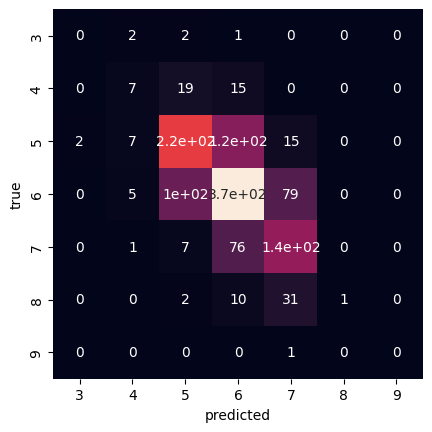

Cohen Kappa Score: 0.38420525078456924

Tuned optimizer results:

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.28      0.17      0.21        41
           5       0.66      0.60      0.63       364
           6       0.64      0.69      0.66       550
           7       0.54      0.60      0.57       220
           8       0.38      0.30      0.33        44
           9       0.00      0.00      0.00         1

    accuracy                           0.61      1225
   macro avg       0.36      0.34      0.34      1225
weighted avg       0.60      0.61      0.61      1225



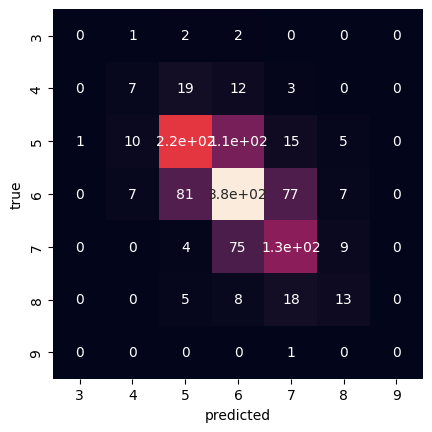

Cohen Kappa Score: 0.4168469330709095


In [82]:
print("Best architecture selected from cross validation:\n")
print_report(grid, X_test, y_test)

print("\nTuned optimizer results:\n")
print_report(grid2, X_test, y_test)

## 4. Train and tune a different classifier that is not a neural network; compare the MLPClassifier test results from Step 3 to that classifier. Discuss in detail your results. (4 points)

              precision    recall  f1-score   support

           3       0.00      0.00      0.00         5
           4       0.67      0.24      0.36        41
           5       0.71      0.67      0.69       364
           6       0.64      0.80      0.71       550
           7       0.66      0.48      0.56       220
           8       0.91      0.45      0.61        44
           9       0.00      0.00      0.00         1

    accuracy                           0.67      1225
   macro avg       0.51      0.38      0.42      1225
weighted avg       0.67      0.67      0.66      1225



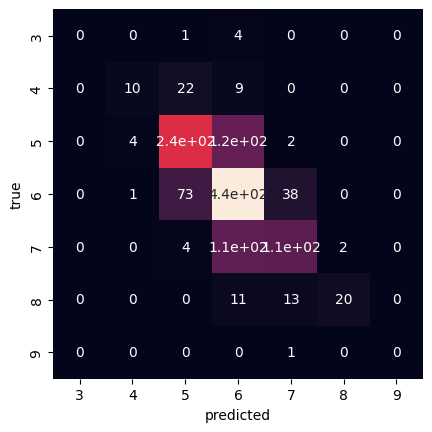

Cohen Kappa Score: 0.4805869637512471


In [78]:
rf = make_pipeline(
    StandardScaler(),
    RandomForestClassifier(
        criterion="entropy",
        max_depth=16,
        max_features="sqrt",
        n_estimators=100,
        random_state=seed,
    ),
)

rf.fit(X_train, y_train)

print_report(rf, X_test, y_test)